In [ ]:
# Updates Stock Tables from TICKERS_VA CSV table with industry specific parameters - AV

import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def AV_Query(*args):
    
    url_1 = args[0]
    func = args[1]
    ticker = args[2]
    api_k = args[3]
    hor = args[4]
    if (hor == ''):
        url = url_1 + func + '&symbol=' + ticker + '&apikey=' + api_k
        resp = requests.get(url)
        y = json.loads(resp.content)
    else:
        url = url_1 + func + '&horizon=' + hor + '&apikey=' + api_k
        with requests.Session() as s:
            download = s.get(url)
            decoded_content = download.content.decode('utf-8')
            y = csv.reader(decoded_content.splitlines(), delimiter=',')

    return y

def Regression(*args):
    
    lin_reg = LinearRegression()
    order = args[0]
    x_array = args[1]
    y_values = args[2]
    poly_feat = PolynomialFeatures(degree = order, include_bias = False)
    x_array_new = poly_feat.fit_transform(x_array)
    Model = lin_reg.fit(x_array_new, y_values)
    
    return Model

def InterpolateNext(*args):
    
    ticker_name = args[0]
    NewRep_df = args[1]
    q01_update = args[2]
    field_name = args[3]
    LRL = args[4]
    q_curr = 0
    CRep_df = NewRep_df[:-1].copy()
    CRep_df.loc[today] = NewRep_df.iloc[-2].shift(-1)

    Last_Series = CRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    CRep_df.iloc[-1] = [np.nan] * (81 - len(CRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (CRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    
    Last_Series = NewRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    NewRep_df.iloc[-1] = [np.nan] * (81 - len(NewRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (NewRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    
    if (q01_update):
        q_curr = 1 
    q_back_f = max(int(NewRep_df.iloc[-1].dropna().index[0].split('Q')[1]), q_back)
    q_back_str = 'Q' + str(q_back_f)
    q_curr_str = 'Q' + str(q_curr)
    q_fwd1_str = 'Q' + str(q_fwd1)
    q_fwd2_str = 'Q' + str(q_fwd2)
    
    slice_01 = CRep_df.iloc[-1][q_back_str: q_curr_str].values.tolist()
    slice_02 = CRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model02 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts02_df = pd.DataFrame(model02.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts02_df.index = Forecasts02_df.T.columns.map(lambda x: 'Q' + str(x))
    
    slice_01 = NewRep_df.iloc[-1][q_back_str: q_curr_str].values.tolist()
    slice_02 = NewRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model03 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts03_df = pd.DataFrame(model03.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts03_df.index = Forecasts03_df.T.columns.map(lambda x: 'Q' + str(x))
    
    ChangeSummary = Forecasts02_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index('Q11'))].join(Forecasts03_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index(q_update_final))], rsuffix = '_NEW')
    ChangeSummary['Difference'] = (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).map(lambda x: "{:,.2f}".format(x))
    ChangeSummary['% Move'] = round(100 * (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']) / ChangeSummary['Forecast'], 2)
    
    print('')
    print(ticker_name + ' ' + field_name + ' Change Summary:')
    print(ChangeSummary)
    
    print('')
    proceed = input('Proceed w/ change?(Y/N) ').upper()
    FinalRep_df = NewRep_df.copy()
    if (proceed != 'N'):
        change_array = np.array([0] * (41 + q_curr) + (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).values.tolist() + [0] * (40 - int(q_update_final.split('Q')[1])))
        FinalRep_df.iloc[-1] = NewRep_df.iloc[-1].values + change_array
    else:
        if (len(LRL) > 0):
            FinalRep_df.iloc[-1] = LRL
    
    return FinalRep_df


api_key = '2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'
url_root = 'https://www.alphavantage.co/query?function='

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
today = date.today()
today = today - timedelta((today.weekday() % 4) * (today.weekday() // 4))

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")
engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase_metrics, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list_metrics = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

query_iscode = "SELECT * FROM is_codes"
iscodes_df = pd.read_sql_query(query_iscode, engine)
iscodes_df = Set_DF(iscodes_df)
iscodes_df = DD_Index(iscodes_df)

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)

pol_order = 5
q_back = -15
q_fwd1 = 9
q_fwd2 = 35
q_update_final = 'Q11'
reports_target = 15

Calc_df = iscodes_df[iscodes_df['AlphaVantage URL'] == 'CALC'].copy()
Calc_df['Field 1'] = Calc_df['AlphaVantage Field'].map(lambda x: x.split(' ')[0])
Calc_df['Field 2'] = Calc_df['AlphaVantage Field'].map(lambda x: x.split(' ')[-1])

Update_df = iscodes_df.replace({None: 'z'})[(iscodes_df.replace({None: 'z'})['AlphaVantage URL'] != 'z') & (iscodes_df.replace({None: 'z'})['AlphaVantage URL'] != 'CALC')]
URL_list = Update_df['AlphaVantage URL'].drop_duplicates().values.tolist()
Key_reports = ['totalRevenue', 'grossProfit', 'operatingIncome', 'netIncome', 'commonStockSharesOutstanding', 'reportedEPS', 'grossProfit / totalRevenue', 'operatingIncome / totalRevenue', 'netIncome / totalRevenue', 'operatingCashflow - capitalExpenditures']

tickers_list = ed_df.columns.values.tolist()
last_earnings_series = ed_df.T[ed_df.T.columns[-1]][ed_df.T[ed_df.T.columns[-1]] != '']
last_earnings_series = last_earnings_series.map(lambda x: datetime(today.year, int(x[:2]), int(x[2:])).date())
Tickers_Update_List = last_earnings_series[last_earnings_series < today].index.values.tolist()
last_stock = ''

if (len(Tickers_Update_List) > 0):
    stock = ''
    horizon = '12month'
    current_report = 'EARNINGS_CALENDAR'
    current_values = AV_Query(url_root, current_report, stock, api_key, horizon)
    eps_f = list(current_values)
    EPS_F_df = pd.DataFrame(eps_f)
    EPS_F_df.columns = EPS_F_df.iloc[0]
    EPS_F_df.index = EPS_F_df[EPS_F_df.columns[0]]
    EPS_F_df.drop(EPS_F_df.index[0], inplace = True)
    EPS_F_df.drop(EPS_F_df.columns[0], axis = 1, inplace = True)
    EPS_F_df = EPS_F_df[EPS_F_df['estimate'] != '']
    EPS_F_df.drop_duplicates(subset = 'name', inplace = True)
    
for s_count, current_ticker in enumerate(Tickers_Update_List):
    
    ticker_sql = re.sub(r'[^a-z_^0-9]', '', current_ticker.lower())
    control_str = ticker_sql + '_records'
    if (ticker_sql in new_tables_list):
        query_revenues = "SELECT * FROM " + ticker_sql
        CRev_df = pd.read_sql_query(query_revenues, engine)
        CRev_df = Set_DF(CRev_df)
        CRev_df = DD_Index(CRev_df)
        lsd = CRev_df.index[-1]
        query_control = "SELECT * FROM " + control_str
        Control_df = pd.read_sql_query(query_control, engine)
        Control_df = Set_DF(Control_df)
        Control_df = DD_Index(Control_df)
        if (len(Control_df.columns) > 0):
            if (last_earnings_series.loc[current_ticker] > (Control_df.index[-1] - timedelta(1 + ((Control_df.index[-1] - timedelta(1)).weekday() // 4) * ((Control_df.index[-1] - timedelta(1)).weekday() % 4)))):
                if (today not in Control_df.index):
                    Control_df.loc[today] = 'n'

            ur_number = 0
            try:
                ur_number = Control_df.iloc[-1].value_counts().loc['y']
            except:
                pass

            if (ur_number < reports_target):
                keep = True
                query_AV = True
                update_anyway = True

                for current_report in URL_list:
                    if (update_anyway):
                        av_field = 'quarterlyReports'
                        if (current_report == 'EARNINGS'):
                            av_field = 'quarterlyEarnings'
                        if (current_report != 'EARNINGS_CALENDAR') & (keep):
                            horizon = ''
                            AVUpdate_df = pd.DataFrame('', index = pd.Index(Update_df[Update_df['AlphaVantage URL'] == current_report]['AlphaVantage Field'].values.tolist(), name = current_report), columns = ['New Values'])
                            if (current_report == 'CASH_FLOW'):
                                AVUpdate_df.loc['capitalExpenditures'] = np.nan
                            stock = current_ticker.split(' ')[0]

                            if (query_AV) | (update_anyway):
                                current_values = AV_Query(url_root, current_report, stock, api_key, horizon)
                                try:
                                    lra = current_values[av_field][0]['fiscalDateEnding']
                                except:
                                    print(current_values)
                                    time.sleep(60)

                                    current_values = AV_Query(url_root, current_report, stock, api_key, horizon)
                                    lra = current_values[av_field][0]['fiscalDateEnding']
                                lra_date = datetime(int(lra.split('-')[0]), int(lra.split('-')[1]), int(lra.split('-')[2])).date()
                                if (lra_date < lsd) & (query_AV):
                                    query_AV = False
                                    ua_str = input('AV N/A, update anyway for ' + current_ticker + '? (Y/N) ').upper()
                                    if (ua_str == 'N'):
                                        update_anyway = False
                                        amend_ed = str(input('New Earnings Date for ' + current_ticker + ' (LAST: ' + ed_df.loc[ed_df.index[-1], current_ticker] + ')? (MMDD or empty to continue) ').upper())
                                        if (amend_ed != ''):
                                            ed_df.loc[ed_df.index[-1], current_ticker] = amend_ed
                                            ed_df.to_sql('ed_relation', engine, index = True, if_exists = 'replace')
                            limit = True
                            try:
                                last_er_available = current_values[av_field][0]['fiscalDateEnding']
                            except:
                                limit = False
                                print(current_values)
                            if (limit):
                                lea = datetime(int(last_er_available.split('-')[0]), int(last_er_available.split('-')[1]), int(last_er_available.split('-')[2])).date()
                                les = datetime(int(ed_df.index[-1].split('-')[1]), int(ed_df.iloc[-2][current_ticker][:2]), int(ed_df.iloc[-2][current_ticker][2:])).date()

                                if (les < lea) | (update_anyway):
                                    if (current_report.find('EARNINGS') == -1) & (current_report != 'CASH_FLOW'):
                                        AVUpdate_df['New Values'] = AVUpdate_df.T.columns.map(lambda x: current_values['quarterlyReports'][0][x])
                                    elif (current_report == 'EARNINGS'):
                                        AVUpdate_df['New Values'] = AVUpdate_df.T.columns.map(lambda x: current_values['quarterlyEarnings'][0][x])
                                    if (current_report == 'CASH_FLOW'):
                                        AVUpdate_df.loc['operatingCashflow'] = current_values['quarterlyReports'][0]['operatingCashflow']
                                        AVUpdate_df.loc['capitalExpenditures'] = current_values['quarterlyReports'][0]['capitalExpenditures']
                                        AVUpdate_df.loc['Free cash flow'] = int(AVUpdate_df.loc['operatingCashflow'][0]) - int(AVUpdate_df.loc['capitalExpenditures'][0])

                                    field_list = AVUpdate_df.index.values.tolist()
                                    for curr_field in field_list:
                                        if (curr_field in iscodes_df['AlphaVantage Field'].values.tolist()) & (update_anyway):
                                            if (Control_df.loc[Control_df.index[-1], str(int(iscodes_df.index[iscodes_df['AlphaVantage Field'].values.tolist().index(curr_field)]))] == 'n'):
                                                Last_Ratio_List = []
                                                next_r = False
                                                Control_df.loc[Control_df.index[-1], str(int(iscodes_df.index[iscodes_df['AlphaVantage Field'].values.tolist().index(curr_field)]))] = 'y'
                                                if (curr_field in iscodes_df['AlphaVantage Field'].values.tolist()):    
                                                    curr_value = ''
                                                    next_value = ''
                                                    comp = iscodes_df.iloc[iscodes_df['AlphaVantage Field'].values.tolist().index(curr_field)]['Line Description']
                                                    if (comp == None):
                                                        comp = ''
                                                    report_name = ticker_sql + comp
                                                    query_report = "SELECT * FROM " + report_name
                                                    CurrRep_df = pd.read_sql_query(query_report, engine)
                                                    CurrRep_df = Set_DF(CurrRep_df)
                                                    CurrRep_df = DD_Index(CurrRep_df)
                                                    if (today in CurrRep_df.index):
                                                        CurrRep_df.drop(today, inplace = True)
                                                    CurrRep_df.loc[today] = CurrRep_df.iloc[-1].shift(-1)
                                                    if (AVUpdate_df.loc[curr_field][0] == None) | (not query_AV):
                                                        if (CurrRep_df.loc[today, 'Q-1'] != None) & (CurrRep_df.loc[today, 'Q-1'] != np.nan):
                                                            curr_value = input('Current ' + current_ticker.split(' ')[0] + ' ' + curr_field + ' (last = ' + str("{:,.2f}".format(CurrRep_df.loc[today, 'Q-1'])) + '): ')
                                                        if (curr_value != ''):
                                                            CurrRep_df.loc[today, 'Q0'] = float(curr_value)
                                                    else:
                                                        try:
                                                            CurrRep_df.loc[today, 'Q0'] = float(AVUpdate_df.loc[curr_field, 'New Values'])
                                                        except:
                                                            pass
                                                    if (CurrRep_df.iloc[-2]['Q0'] != None):
                                                        if (curr_field != 'reportedEPS'):
                                                            if (curr_field in Key_reports):
                                                                if (CurrRep_df.loc[today, 'Q0'] != None) & (CurrRep_df.loc[today, 'Q0'] != np.nan):
                                                                    next_value = input('Next ' + current_ticker.split(' ')[0] + ' ' + curr_field + ' (last = ' + str("{:,.2f}".format(CurrRep_df.loc[today, 'Q0'])) + '): ')
                                                                elif (CurrRep_df.iloc[-2]['Q0'] != None) & (CurrRep_df.iloc[-2]['Q0'] != np.nan):
                                                                    next_value = input('Next ' + current_ticker.split(' ')[0] + ' ' + curr_field + ' (last = ' + str("{:,.2f}".format(CurrRep_df.iloc[-2]['Q0'])) + '): ')
                                                                if (next_value != ''):
                                                                    next_r = Ture
                                                                    CurrRep_df.loc[today, 'Q1'] = float(next_value)
                                                        else:
                                                            if (EPS_F_df.loc[current_ticker.split(' ')[0], 'estimate'] != '') & (EPS_F_df.loc[current_ticker.split(' ')[0], 'estimate'] != 'None'):
                                                                CurrRep_df.loc[today, 'Q1'] = float(EPS_F_df.loc[current_ticker.split(' ')[0], 'estimate'])

                                                    if (CurrRep_df.iloc[-1]['Q0'] != None) & (CurrRep_df.iloc[-1]['Q0'] != np.nan):
                                                        try:
                                                            FinalCurrRep_df = InterpolateNext(current_ticker, CurrRep_df, next_r, curr_field, Last_Ratio_List)
                                                            FinalCurrRep_df.to_sql(report_name, engine, index = True, if_exists = 'replace')
                                                        except:
                                                            if (len(current_values) < 3):
                                                                print(current_values)

                                    field_list = Calc_df['Field 2'].values.tolist()
                                    for idx, calc_metric in enumerate(field_list):
                                        if (Control_df.loc[Control_df.index[-1], str(int(Calc_df.index[idx]))] == 'n') & (update_anyway):
                                            Last_Ratio_List = []
                                            Control_df.loc[Control_df.index[-1], str(int(Calc_df.index[idx]))] = 'y'
                                            if (calc_metric in field_list):
                                                curr_value = ''
                                                next_value = ''
                                                comp = Calc_df.iloc[idx]['Line Description']
                                                report_name = ticker_sql + comp
                                                query_report = "SELECT * FROM " + report_name
                                                CurrRep_df = pd.read_sql_query(query_report, engine)
                                                CurrRep_df = Set_DF(CurrRep_df)
                                                CurrRep_df = DD_Index(CurrRep_df)
                                                if (today in CurrRep_df.index):
                                                    CurrRep_df.drop(today, inplace = True)
                                                CurrRep_df.loc[today] = CurrRep_df.iloc[-1].shift(-1)
                                                try:
                                                    if (query_AV):
                                                        calc_kpi = 100 * float(AVUpdate_df.loc[Calc_df.iloc[idx]['Field 1']][0]) / float(AVUpdate_df.loc[Calc_df.iloc[idx]['Field 2']][0])
                                                        CurrRep_df.loc[today, 'Q0'] = calc_kpi
                                                    else:
                                                        if (CurrRep_df.loc[today, 'Q-1'] != None) & (CurrRep_df.loc[today, 'Q-1'] != np.nan):
                                                            curr_value = input('Current ' + current_ticker.split(' ')[0] + ' ' + comp.split('_')[-1].upper() + ' (last = ' + str("{:,.2f}".format(CurrRep_df.loc[today, 'Q-1'])) + '): ')
                                                        if (curr_value != ''):
                                                            CurrRep_df.loc[today, 'Q0'] = float(curr_value)
                                                    if (Calc_df.iloc[idx]['AlphaVantage Field'] in Key_reports):
                                                        if (CurrRep_df.loc[today, 'Q0'] != None) & (CurrRep_df.loc[today, 'Q0'] != np.nan):
                                                            next_value = input('Next ' + current_ticker.split(' ')[0] + ' ' + comp.split('_')[-1].upper() + ' (last = ' + str("{:,.2f}".format(CurrRep_df.loc[today, 'Q0'])) + '): ')
                                                        if (next_value != ''):
                                                            CurrRep_df.loc[today, 'Q1'] = float(next_value)
                                                except:
                                                    print('CALC ERROR ' + comp)

                                                aux_comp1 = iscodes_df['Line Description'].values.tolist()[iscodes_df['AlphaVantage Field'].values.tolist().index(Calc_df['Field 1'].values.tolist()[idx])]
                                                aux_comp2 = ''
                                                report_name_aux1 = ticker_sql + aux_comp1
                                                query_report_aux1 = "SELECT * FROM " + report_name_aux1
                                                Aux1_df = pd.read_sql_query(query_report_aux1, engine)
                                                Aux1_df = Set_DF(Aux1_df)
                                                Aux1_df = DD_Index(Aux1_df)
                                                report_name_aux2 = ticker_sql + aux_comp2
                                                query_report_aux2 = "SELECT * FROM " + report_name_aux2
                                                Aux2_df = pd.read_sql_query(query_report_aux2, engine)
                                                Aux2_df = Set_DF(Aux2_df)
                                                Aux2_df = DD_Index(Aux2_df)
                                                Last_Ratio_List = (100 * Aux1_df.iloc[-1] / Aux2_df.iloc[-1]).values.tolist()

                                                if (CurrRep_df.iloc[-1]['Q0'] != None) & (CurrRep_df.iloc[-1]['Q0'] != np.nan):
                                                    try:
                                                        FinalCurrRep_df = InterpolateNext(current_ticker, CurrRep_df, next_r, comp.split('_')[-1].upper(), Last_Ratio_List)                        
                                                        FinalCurrRep_df.to_sql(report_name, engine, index = True, if_exists = 'replace')
                                                    except:
                                                        if (len(current_values) < 3):
                                                            print(current_values)
                                    last_stock = current_ticker
                                    if (update_anyway):
                                        Control_df.to_sql(control_str, engine, index = True, if_exists = 'replace')
                                else:
                                    print('')
                                    print('AV REPORT NOT AVAILABLE FOR ' + current_ticker)
                                    keep = False

if (last_stock != ''):
    print('')
    print('LAST STOCK UPDATED: ' + last_stock)

{}


In [26]:
#Builds Earnings Dates Relations for Selected Stocks
#Alpha Vantage API Key: PXM1VV23X6PFVQVO

import pandas as pd
from sqlalchemy import create_engine
import math
import numpy as np
import os
import csv
import yfinance as yf
#import mysql.connector
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression

def Average(lst):
    return sum(lst) / len(lst)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def ed_VA(f_ticker, t_list, q_query):
    
    return_df = pd.DataFrame(index=['Dates'], columns=t_list)
    s_string = ''
    if (len(t_list)>0):
        s_string=t_list[0]
        if (len(t_list)>1):
            for addt in t_list[1:]:
                s_string = s_string + ',' + str(addt)

    url = 'https://app.visiblealpha.com/api2/earnings?ticker=' + f_ticker + '&tickertype=B&additionaltickers=' + s_string + '&period=' + q_query
    resp = requests.get(url,headers=headers)
    y = json.loads(resp.content)
    if (y['status']=='success') and (y['data']!=[]):
        for reply in y['data']:
            date_d = datetime.strptime(reply['earningsdate'][:10], "%Y-%m-%d").date()
            return_df.loc['Dates', reply['ticker']] = date_d
            
    
    return return_df

CSV_URL = 'https://www.alphavantage.co/query?function=EARNINGS_CALENDAR&horizon=12month&apikey=2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'

with requests.Session() as s:
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"

string_to_number = {'BGNE US': '6160 HK','TCEHY US': '700 HK','TSM US': '2330 TT','SONY US': '6758 JP','XPEV US': '9868 HK'}
number_to_string = {'6160 HK': 'BGNE US','700 HK': 'TCEHY US','2330 TT': 'TSM US','6758 JP': 'SONY US','9868 HK': 'XPEV US'}
clean_up = lambda x: re.sub(r'[^A-Z /^0-9]', '', str(x))
clean_up_SQL = lambda x: re.sub(r'[^A-Z ^0-9]', '', x)
clean_up_save = lambda x: re.sub(r'[^A-Z ^0-9]', '', str(x))
map_index = lambda x: key_reports_df.loc[x, 'Relevance']
map_lower = lambda x: x.lower()
int_to_str = lambda x: str(x)
str_to_int = lambda x: int(x)

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase_metrics, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list_metrics = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

engine_metrics = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase_metrics))

AVapi_key = 'THL7JKMG0IEOI16R' 
CSV_URL = 'https://www.alphavantage.co/query?function=EARNINGS_CALENDAR&horizon=3month&apikey=' + AVapi_key

with requests.Session() as s:
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')

today = date.today()
m = today.month

try:
    ub = datetime(today.year, ((today.month - 1) // 3 + 1) * 3, 31).date()
except:
    try:
        ub = datetime(today.year, ((today.month - 1) // 3 + 1) * 3, 30).date()
    except:
        try:
            ub = datetime(today.year, ((today.month - 1) // 3 + 1) * 3, 29).date()
        except:
            ub = datetime(today.year, ((today.month - 1) // 3 + 1) * 3, 28).date()
try:
    lb = datetime(today.year, ((today.month - 1) // 3) * 3, 31).date()
except:
    try:
        lb = datetime(today.year, ((today.month - 1) // 3) * 3, 30).date()
    except:
        try:
            lb = datetime(today.year, ((today.month - 1) // 3) * 3, 29).date()
        except:
            try:
                lb = datetime(today.year, ((today.month - 1) // 3) * 3, 28).date()
            except:
                lb = datetime(today.year - 1, 12, 31).date()

current_qtr = max(0, m - 1) // 3
current_year = today.year

if (current_qtr == 0):
    current_qtr = 4
    current_year = current_year - 1
    
qtr_string = str(current_qtr) + 'QCY-' + str(current_year)

stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
csv_df = pd.DataFrame(stocks)

csv_df['Relations_ticker'] = csv_df['tickers'].replace(number_to_string)
csv_df['Relations_ticker'] = csv_df['Relations_ticker'].map(clean_up)
csv_df['SQL_ticker'] = csv_df['Relations_ticker'].map(clean_up_save)
csv_df['VA_tickers'] = csv_df['tickers'].map(clean_up)
csv_list = csv_df['Relations_ticker'].values.tolist()
csv_df = Set_DF(csv_df)
csv_df = DD_Index(csv_df)

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)

if (qtr_string not in ed_df.index):   
    ed_df.loc[qtr_string] = ''
    
ec = pd.DataFrame(cr)
ec.columns = ec.iloc[0].values
ec.drop([0], inplace = True)
ec.index = ec[ec.columns[0]]
ec.drop([ec.columns[0]], axis = 1, inplace = True)
slim_ec = ec[ec['estimate'] != ''].copy()
slim_ec['RD Code'] = slim_ec['reportDate'].map(lambda x: x.split('-')[1] + x.split('-')[2]).values.tolist()
slim_ec.drop_duplicates(subset = 'name', inplace = True)
ticker_list = ed_df.columns.values.tolist()


for ticker in ticker_list:
    if (ticker.split(' ')[0] in slim_ec.index.values.tolist()):        
        next_ed_str = slim_ec.loc[ticker.split(' ')[0], 'RD Code']
        next_ed = datetime(today.year, int(next_ed_str[:2]), int(next_ed_str[2:])).date()
        if (next_ed < lb):
            next_ed = lb
            print('ED amended for ' + ed_df.columns[idx] + ', new: ' + lb.strftime('%Y-%m-%d') + ', old: ' + next_ed_str)
        elif (next_ed > ub):
            next_ed = ub
            print('ED amended for ' + ed_df.columns[idx] + ', new: ' + ub.strftime('%Y-%m-%d') + ', old: ' + next_ed_str)                                                        
        if (ed_df.iloc[-1][ticker] == ''):
            ed_df.loc[ed_df.index[-1], ticker] = next_ed.strftime('%m%d')                        
        else:
            if (ed_df.iloc[-1][ticker] != next_ed.strftime('%m%d')) & (next_ed > today):
                ed_df.loc[ed_df.index[-1], ticker] = next_ed.strftime('%m%d') 

                
ed_df.to_sql('ed_relation', engine, index = True, if_exists = 'replace')

week = input('Current week or (N)ext? ').upper()
start_date = today - timedelta(today.weekday())
if (week == 'N'):
    start_date = start_date + timedelta(7)
ec_df = pd.DataFrame('', index = np.arange(1000), columns = pd.date_range(start_date, start_date + timedelta(4), freq = 'd').date)
last_ec = ed_df.T[ed_df.T.columns[-1]][ed_df.T[ed_df.T.columns[-1]] != '']
last_ec = last_ec.map(lambda x: datetime(today.year, int(x[:2]), int(x[2:])).date())
dates_list = ec_df.columns
for current_date in dates_list:
    cd_tickers = last_ec[last_ec == current_date].index.values.tolist()
    ec_df[current_date] = cd_tickers + [''] * (len(ec_df.index) - len(cd_tickers))        
ec_df = ec_df.replace({'': np.nan}).dropna(how = 'all').fillna('')
print('')
print(ec_df)

ed_df

Current week or (N)ext? N

  2024-07-08 2024-07-09 2024-07-10 2024-07-11 2024-07-12
0                                      DAL US      BK US
1                                      PEP US     BLK US
2                                     CTAS US       C US
3                                      CAG US    FAST US
4                                                CHWY US


,ABST US,AMPL US,ASUR US,AXON US,BLKB US,CDAY US,DV US,EGAN US,ESMT US,EVBG US,...,SE US,HALO US,NET US,CVNA US,XPEV US,FSLY US,RDFN US,PD US,EDF FP,SG US
index,,,,,,,,,,,,,,,,,,,,,
1QCY-2012,,,,,,,,,,,...,,,,,,,,,,
2QCY-2012,,,,,,,,,,,...,,,,,,,,,,
3QCY-2012,,,,,,,,,,,...,,,,,,,,,,
4QCY-2012,,,,,,,,,,,...,,,,,,,,,,
1QCY-2013,,,,,,,,,,,...,,,,,,,,,,
2QCY-2013,,,,,,,,,,,...,,,,,,,,,,
3QCY-2013,,,,,,,,,,,...,,,,,,,,,,
4QCY-2013,,,,,,,,,,,...,,,,,,,,,,
1QCY-2014,,,,,,,,,,,...,,,,,,,,,,


In [98]:
#SHOWS EARNINGS CALENDAR FOR CURRENT OR NEXT WEEK

import pandas as pd
from sqlalchemy import create_engine
import math
import numpy as np
import os
import csv
import yfinance as yf
#import mysql.connector
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
import calendar
from datetime import datetime
from datetime import timedelta
from datetime import date
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from pyprinter import printer

def Average(lst):
    return sum(lst) / len(lst)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
today = date.today()

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")
engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)

week = input('Current week or (N)ext? ').upper()
start_date = today - timedelta(today.weekday())
if (week == 'N'):
    print('NEXT')
    start_date = start_date + timedelta(7)
else:
    print('CURRENT')
ec_df = pd.DataFrame('', index = np.arange(1000), columns = pd.date_range(start_date, start_date + timedelta(4), freq = 'd').date)
last_ec = ed_df.T[ed_df.T.columns[-1]][ed_df.T[ed_df.T.columns[-1]] != '']
last_ec = last_ec.map(lambda x: datetime(today.year, int(x[:2]), int(x[2:])).date())
dates_list = ec_df.columns
for current_date in dates_list:
    cd_tickers = last_ec[last_ec == current_date].index.values.tolist()
    ec_df[current_date] = cd_tickers + [''] * (len(ec_df.index) - len(cd_tickers))        
ec_df = ec_df.replace({'': np.nan}).dropna(how = 'all').fillna('')
columns_01 = ec_df.columns.map(lambda x: calendar.day_name[x.weekday()][:3]).values.tolist()
columns_02 = ec_df.columns.values.tolist()
ec_df.columns = [columns_01, columns_02]
print('')
if (len(ec_df.index) > 40):
    ec01_df = ec_df[:40].copy()
    ec02_df = ec_df[40:].copy()
    print(ec01_df)
    print('')
    print(ec02_df)
else:
    print(ec_df)
print_str = input('Send to printer? (Y/y or empty) ').upper()
if (print_str == 'Y'):
    try:
        printer.out(ec_df)
    except:
        print('ERROR PRINTING')

Current week or (N)ext? N
NEXT

          Mon        Tue        Wed        Thu        Fri
   2024-10-21 2024-10-22 2024-10-23 2024-10-24 2024-10-25
0     HSTM US    ENPH US     TYL US    SPSC US      CL US
1      SAP GR    CSGP US     VRT US    KNSL US     XEL US
2      ELS US    TDOC US      QS US     DTE GR     AON US
3      ARE US     AOS US    TSLA US     ROG SW     CNC US
4      NUE US      GE US    ICLR US    EQNR NO     HCA US
5      WRB US     LMT US     MOH US    TECK US     NWL US
6     ZION US     RTX US     WCN US    GLPI US           
7                 SHW US     EDU US     CRS US           
8                 KMB US     TER US     SAM US           
9                  VZ US     CME US     TAL US           
10                STX US    ALGN US     AAL US           
11                TXN US     BSX US    DXCM US           
12                XRX US      BA US      EW US           
13                MMM US     NEM US     UHS US           
14                ADM US      KO US     

In [ ]:
#SHORT INTEREST REPORT

query_mc = 'SELECT * FROM mkt_cap_relation'    
mc_df = pd.read_sql_query(query_mc, engine)
mc_df = Set_DF(mc_df)
mc_df = DD_Index(mc_df)

exception_list = ['INFO', 'MXIM', 'NLSN', 'WYNN', 'RXT', 'BE', 'RDFN', 'VFC', 'ASAN', 'SONY', 'TXG', 'PLUG', 'FSLY', 'AMPL',    
                  'WLTW', 'BIGC', 'PLUG', 'WKME', 'NVTA', 'KNSL', 'ABST']
ticker_list = mc_df.T[mc_df.columns.map(lambda x: x.find('US')) != -1].T.columns.map(lambda x: x.split(' ')[0]).values.tolist()
ticker_list = [ticker for ticker in ticker_list if ticker not in exception_list]

ticker_list = pd.Series(ticker_list).map(lambda x: x.lower()).tolist()
data = yfs(ticker_list)
All_df = pd.DataFrame(data.get_key_statistics_data())

All_df.loc['SHORT INT % FLOAT - CURRENT'] = All_df.loc['sharesShort'] / All_df.loc['floatShares']
All_df.loc['SHORT INT % FLOAT - PRIOR M'] = All_df.loc['sharesShortPriorMonth'] / All_df.loc['floatShares']
tAll_df = All_df.T.sort_values(by = ['SHORT INT % FLOAT - PRIOR M'], ascending = False)
SI_Summary_df = round((100 * tAll_df[['SHORT INT % FLOAT - PRIOR M', 'SHORT INT % FLOAT - CURRENT']].dropna()).astype(float), 2)
print('TOP 30 MOST SHORTED STOCKS')
print('')
print(SI_Summary_df[:30])


print('')
print(SI_Summary_df.loc['TSLA'])
print('')
print(SI_Summary_df.loc['CRWD'])
print('')
print(SI_Summary_df.loc['SNOW'])
print('')
print(SI_Summary_df.loc['SQ'])
print('')
print(SI_Summary_df.loc['DDOG'])
print('')
print(SI_Summary_df.loc['ZI'])
print('')
print(SI_Summary_df.loc['PLTR'])

try:
    All_df.to_sql('all_yf_relation', engine, index = True, if_exists = 'replace')
except:
    All_df[All_df.columns[0: int(round(len(All_df.columns) / 2, 0))]].to_sql('all_yf_relation_01', engine, index = True, if_exists = 'replace')
    All_df[All_df.columns[int(round(len(All_df.columns) / 2, 0)):]].to_sql('all_yf_relation_02', engine, index = True, if_exists = 'replace')
    print('TOO BIG!!!')
    

All_df

In [329]:
# yq_all SETUP

def on_selection(value):
    global choice
    choice = value  # store the user's choice
    root.destroy()  # close window
    
def on_selection_class(value):
    global choice_class
    choice_class = value  # store the user's choice
    root.destroy()  # close window    

yq_df = open_df('yq_all')
if ('LT Growth' not in yq_df.columns):
    yq_df['LT Growth'] = np.nan

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
Sectors_df

choice_list = Sectors_df.columns.values.tolist()
root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *choice_list, command = on_selection)
tk.Label(root, text = "Choose a classification: ").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop() 

class_list = Sectors_df[choice].dropna().drop_duplicates().tolist()
class_list_options = class_list.copy()
class_list_options.append('ALL')
root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *class_list_options, command = on_selection_class)
tk.Label(root, text = "Choose a class: ").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop() 

if (choice_class != 'ALL'):
    class_list = []
    class_list.append(choice_class)

for c_class in class_list:
    try:
        lt_g = float(input('Enter LT growth for sector ' + c_class + ': '))
        stock_list = Sectors_df[Sectors_df[choice] == c_class].index.tolist()  
        yq_df.loc[stock_list, 'LT Growth'] = lt_g
    except:
        print('Error for class ' + c_class)     
        
yq_df.to_sql('yq_all', engine, index = True, if_exists = 'replace')          

Enter LT growth for sector IGV: 10
Enter LT growth for sector XLY: 5
Enter LT growth for sector XLF: 0
Enter LT growth for sector XLV: 2.5
Enter LT growth for sector REZ: 0
Enter LT growth for sector XLC: 5
Enter LT growth for sector SOXX: 7.5
Enter LT growth for sector XLP: 0
Enter LT growth for sector XLI: 2.5
Enter LT growth for sector XHB: 0
Enter LT growth for sector XLE: 0
Enter LT growth for sector XLB: 0
Enter LT growth for sector XLU: 0


Input VA ticker: (empty for class) 
Old FWD P/E for COST: 48.94
New FWD P/E for COST: 50.51



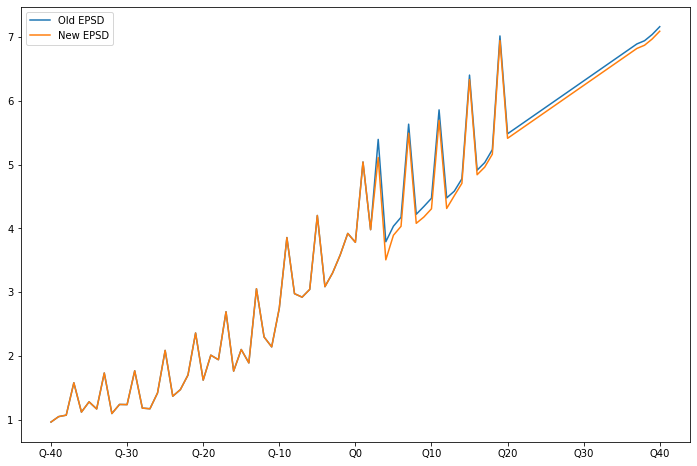

KeyboardInterrupt: Interrupted by user

In [7]:
# AMEND SPECIFIC STOCKS FOR EPSD, OI AND REV (TO USE AFTER BIG CHANGES, BY ALPHAVANTAGE NTM EPSD)

import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import warnings
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def AV_Query(*args):
    
    url_1 = args[0]
    func = args[1]
    ticker = args[2]
    api_k = args[3]
    hor = args[4]
    if (hor == ''):
        url = url_1 + func + '&symbol=' + ticker + '&apikey=' + api_k
        resp = requests.get(url)
        y = json.loads(resp.content)
    else:
        url = url_1 + func + '&horizon=' + hor + '&apikey=' + api_k
        with requests.Session() as s:
            download = s.get(url)
            decoded_content = download.content.decode('utf-8')
            y = csv.reader(decoded_content.splitlines(), delimiter=',')

    return y

def on_selection(value):
    global choice
    choice = value  # store the user's choice
    root.destroy()  # close window
    
def on_selection_class(value):
    global choice_class
    choice_class = value  # store the user's choice
    root.destroy()  # close window    
    
import warnings

warnings.filterwarnings('ignore')

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")
engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

AVurl_root = 'https://www.alphavantage.co/query?function='
FREEAVapi_key = '2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'  
AVapi_key = 'THL7JKMG0IEOI16R'  


yq_df = open_df('yq_all')
Prices_df = open_df('prices_relation')

stock = input('Input VA ticker: (empty for class) ').upper()
stock_rel = stock + ' US'
stock_sql = stock.lower() + 'us'
valid_stock = True

if (stock != ''):
    if (stock_rel in Prices_df.columns):
        stock_list = [stock_rel]
        lt_g = input('Enter LT growth for substitution (/100, empty for default): ')
        try:
            lt_g = int(lt_g)
            yq_df.loc[stock_rel, 'LT Growth'] = lt_g
            yq_df.to_sql('yq_all', engine, index = True, if_exists = 'replace') 
        except:
            lt_g = yq_df.loc[stock_rel, 'LT Growth']
    else:
        valid_stock = False

else:

    sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
    Sectors_df = pd.DataFrame(sectors)
    Sectors_df = Set_DF(Sectors_df)
    Sectors_df = DD_Index(Sectors_df)
    Sectors_df

    choice_list = Sectors_df.columns.values.tolist()
    root = tk.Tk()
    tkvar = tk.StringVar(root)
    popupMenu = tk.OptionMenu(root, tkvar, *choice_list, command = on_selection)
    tk.Label(root, text = "Choose a classification: ").grid(row = 0, column = 0)
    popupMenu.grid(row = 1, column = 0)
    root.mainloop() 

    class_list = Sectors_df[choice].dropna().drop_duplicates().tolist()
    root = tk.Tk()
    tkvar = tk.StringVar(root)
    popupMenu = tk.OptionMenu(root, tkvar, *class_list, command = on_selection_class)
    tk.Label(root, text = "Choose a class: ").grid(row = 0, column = 0)
    popupMenu.grid(row = 1, column = 0)
    root.mainloop() 
    
    stock_list = Sectors_df[Sectors_df[choice] == choice_class].index.tolist()

adj_list = ['_epsd', '_oi', '']
rel_names = ['EPSD', 'Op Inc', 'Rev']
factor_1 = 2
factor_2 = 3
factor_3 = 4
    
for stock_rel in stock_list:
    stock = stock_rel.split(' ')[0]
    stock_sql = stock.lower() + 'us'
    lt_g = yq_df.loc[stock_rel, 'LT Growth']
    if (pd.Series(lt_g).isna()[0]):
        try:
            lt_g = float(input('Enter LT growth for ' + stock + ' : '))
            yq_df.loc[stock_rel, 'LT Growth'] = lt_g
            yq_df.to_sql('yq_all', engine, index = True, if_exists = 'replace')
            valid_stock = True
        except:
            valid_stock = False
    else:
        valid_stock = True
    if (valid_stock):
        if (len(stock_list) > 1):
            try:
                new_g = input('Enter new LT growth for ' + stock + ' : (old: ' + str(yq_df.loc[stock_rel, 'LT Growth']) + ' empty to keep old) ')
                if (new_g != ''):
                    yq_df.loc[stock_rel, 'LT Growth'] = float(new_g)
                    lt_g = float(new_g)                    
            except:
                pass            
        horizon = ''
        current_report = 'OVERVIEW'
        current_values = AV_Query(AVurl_root, current_report, stock, AVapi_key, horizon)
        try:
            fwd_pe = float(current_values['ForwardPE'])
            eps_df = open_df(stock_sql + '_epsd')
            old_fwd_pe = round(Prices_df.iloc[-1][stock + ' US'] / eps_df.iloc[-1][['Q1', 'Q2', 'Q3', 'Q4']].sum(), 2)
            print('Old FWD P/E for ' + stock + ': ' + str(old_fwd_pe))
            print('New FWD P/E for ' + stock + ': ' + str(fwd_pe))
            print('')
        except:
            fwd_pe = 0
            old_fwd_pe = 0
            print('No fwd P/E for ' + stock)

        if (fwd_pe != old_fwd_pe):
            delta_earnings = np.zeros(81)
            for idx, c_relation in enumerate(adj_list):

                curr_df = open_df(stock_sql + c_relation)
                new_df = curr_df.copy()
                if (c_relation == '_epsd'):
                    old_fwd_pe = curr_df.iloc[-1][['Q1', 'Q2', 'Q3', 'Q4']].sum()
                    last_px = Prices_df.iloc[-1][stock + ' US']
                    adj_abs = (last_px / fwd_pe) - old_fwd_pe
                    start_pt = 'Q' + str(min(int(curr_df.iloc[-1].loc['Q1':].pct_change().dropna()[curr_df.iloc[-1].loc['Q1':].pct_change().dropna() * np.sign(adj_abs) < 0].dropna().index[0][1]), 3))
                    if (int(start_pt[-1]) <= 4):
                        clmn_st = curr_df.columns.tolist().index(start_pt)            
                        new_df.loc[new_df.index[-1], new_df.columns.tolist()[clmn_st: clmn_st + (4 - int(start_pt[-1]) + 1)]] += (adj_abs / (4 - int(start_pt[-1]) + 1))
                        new_df.loc[new_df.index[-1]].loc['Q5': 'Q8'] += (adj_abs / (4 - int(start_pt[-1]) + 1)) / factor_1
                        new_df.loc[new_df.index[-1]].loc['Q9': 'Q12'] += (adj_abs / (4 - int(start_pt[-1]) + 1)) / factor_2
                        new_df.loc[new_df.index[-1]].loc['Q9':] += (adj_abs / (4 - int(start_pt[-1]) + 1)) / factor_3

                        if (np.sign(adj_abs) == 1):
                            neg_list = ((new_df.iloc[-1] / new_df.iloc[-1].shift(4) - 1) < 0).replace({False: np.nan}).dropna()[((new_df.iloc[-1] / new_df.iloc[-1].shift(4) - 1) < 0).replace({False: np.nan}).dropna().index.map(lambda x: x.find('-')) == -1].index
                            while (len(neg_list) > 0):
                                new_df.loc[new_df.index[-1], neg_list] = new_df.iloc[-1].shift(4).loc[neg_list] * (1 + lt_g / 100)
                                neg_list = ((new_df.iloc[-1] / new_df.iloc[-1].shift(4) - 1) < 0).replace({False: np.nan}).dropna()[((new_df.iloc[-1] / new_df.iloc[-1].shift(4) - 1) < 0).replace({False: np.nan}).dropna().index.map(lambda x: x.find('-')) == -1].index

                        wasd_df = open_df(stock_sql + '_wasd')
                        delta_earnings = (wasd_df.iloc[-1].fillna(method = 'ffill') * (new_df.iloc[-1] - curr_df.iloc[-1]))
                        earnings_s = (wasd_df.iloc[-1].fillna(method = 'ffill') * curr_df.iloc[-1])
                elif (c_relation == '_oi'):
                    new_df.iloc[-1] += delta_earnings
                else:
                    net_margin = (earnings_s / curr_df.iloc[-1]).loc[start_pt:].median()
                    delta_rev = delta_earnings / net_margin
                    new_df.iloc[-1] += delta_rev

                plt.figure(idx, figsize = (12, 8))
                curr_df.iloc[-1].plot(label = 'Old ' + rel_names[idx])
                new_df.iloc[-1].plot(label = 'New ' + rel_names[idx]).legend(loc = 'best')
                plt.show()

                proceed_save = input('Save changes in ' + rel_names[idx] + '? (Y/y or empty) ').upper()
                if (proceed_save == 'Y'):
                    new_df.to_sql(stock_sql + c_relation, engine, index = True, if_exists = 'replace')
                    print('ok')    
yq_df.to_sql('yq_all', engine, index = True, if_exists = 'replace')

In [2]:
# ALPHA VANTAGE REPORTS 

import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import warnings
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def AV_News(*args):
    
    url_1 = args[0]
    func = args[1]
    ticker = args[2]
    api_k = args[3]
    subject = args[4]
    
    if (subject != ''):
        url = url_1 + func + '&topics=' + subject + '&apikey=' + api_k
        resp = requests.get(url)
        y = resp.json()
    else:
        url = url_1 + func + '&tickers=' + ticker + '&apikey=' + api_k
        resp = requests.get(url)
        y = resp.json()

    return y

def AV_Fund(*args):
    
    url_1 = args[0]
    func = args[1]
    ticker = args[2]
    api_k = args[3]
    
    url = url_1 + func + '&symbol=' + ticker + '&apikey=' + api_k
    resp = requests.get(url)
    y = resp.json()

    return y

def AV_Movers(*args):
    
    url_1 = args[0]
    func = args[1]
    api_k = args[2]
    
    url = url_1 + func + '&apikey=' + api_k
    resp = requests.get(url)
    y = resp.json()

    return y

def AV_EC(*args):
    
    url_1 = args[0]
    func = args[1]
    ticker = args[2]
    api_k = args[3]
    horizon = args[4]
    
    if (ticker == ''):
        url = url_1 + func + '&horizon=' + horizon + '&apikey=' + api_k
    else:
        url = url_1 + func + '&symbol=' + ticker + '&horizon=' + horizon + '&apikey=' + api_k
        
    with requests.Session() as s:
        download = s.get(url)
        decoded_content = download.content.decode('utf-8')
        y = csv.reader(decoded_content.splitlines(), delimiter=',')        

    return y

def AV_IPO(*args):
    
    url_1 = args[0]
    func = args[1]
    api_k = args[2]
    
    url = url_1 + func + '&apikey=' + api_k        
    with requests.Session() as s:
        download = s.get(url)
        decoded_content = download.content.decode('utf-8')
        y = csv.reader(decoded_content.splitlines(), delimiter=',')        

    return y

def Daily_Pxs(*args):
    
    url_1 = args[0]
    func = args[1]
    ticker = args[2]
    api_k = args[3]
    
    url = url_1 + func + '&symbol=' + ticker + '&entitlement=delayed' + '&apikey=' + api_k
    resp = requests.get(url)
    y = resp.json()

    return y

def on_selection(value):
    global choice
    choice = value  # store the user's choice
    root.destroy()  # close window
    
def on_selection_sub(value):
    global choice_sub
    choice_sub = value  # store the user's choice
    root.destroy()  # close window 
    
def on_selection_fund(value):
    global choice_fund
    choice_fund = value  # store the user's choice
    root.destroy()  # close window 
    
def on_selection_hor(value):
    global choice_hor
    choice_hor = value  # store the user's choice
    root.destroy()  # close window   
    
def on_selection_cal(value):
    global choice_cal
    choice_cal = value  # store the user's choice
    root.destroy()  # close window       
    
import warnings
today = datetime.today().date()

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")
engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

warnings.filterwarnings('ignore')
yq_df = open_df('yq_all')

AVurl_root = 'https://www.alphavantage.co/query?function='
FREEAVapi_key = '2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'  
AVapi_key = 'THL7JKMG0IEOI16R' 
report_list = ['News & sentiment', 'Top movers', 'Fundamentals', 'Earnings Calendar', 'IPO Calendar', 'Portfolio Prices']
fund_list = ['INCOME_STATEMENT', 'BALANCE_SHEET', 'CASH_FLOW']
horizon_list = ['3month', '6month', '12month']
topic_list = ['earnings', 'blockchain', 'ipo', 'mergers_qnd_acquisitions', 'financial_markets', 'economy_fiscal', 
              'economy_monetary', 'economy_macro', 'energy_transportation', 'finance', 'manufacturing', 'technology', '']
report_dikt = {'News & sentiment': 'NEWS_SENTIMENT', 'Top movers': 'TOP_GAINERS_LOSERS', 'Fundamentals': '', 
               'Earnings Calendar': 'EARNINGS_CALENDAR', 'IPO Calendar': 'IPO_CALENDAR'}

root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *report_list, command = on_selection)
tk.Label(root, text = "Choose a report: ").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop() 
function = report_dikt[choice]

if (choice == 'Top movers'):
    ret = AV_Movers(AVurl_root, function, AVapi_key)
    for most_traded in ret['most_actively_traded']:
        ticker = most_traded['ticker'] + ' US'
        if (ticker in yq_df.index):
            print('')
            print(pd.Series(most_traded)) 
elif (choice == 'IPO Calendar'):                        
    ret = AV_IPO(AVurl_root, function, AVapi_key)
    ret_df = pd.DataFrame(ret)
    ret_df.columns = ret_df.iloc[0].values
    ret_df = ret_df.drop(ret_df.index[0])
    ret_df.index = ret_df[ret_df.columns[0]]
    ret_df = ret_df.drop(ret_df.columns[0], axis = 1) 
    if (ret_df.shape[0] == 0):
        print('No IPOs on the radar')
    else:
        print(ret_df)
else:
    stock = input('Enter VA ticker for news & sent (empty for subject): ').upper()
    stock_rel = stock + ' US'
    valid_ticker = False
    if (stock_rel in yq_df.index) | (stock == ''):
        valid_ticker = True
    subject = ''
    if (choice == 'News & sentiment') & (stock == ''):
        root = tk.Tk()
        tkvar = tk.StringVar(root)
        popupMenu = tk.OptionMenu(root, tkvar, *topic_list, command = on_selection_sub)
        tk.Label(root, text = "Choose a subject: ").grid(row = 0, column = 0)
        popupMenu.grid(row = 1, column = 0)
        root.mainloop()   
        subject = choice_sub  
    elif (choice == 'Portfolio Prices') & (stock == ''):        
        function = 'GLOBAL_QUOTE'
        stock = 'MU'
        stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\RT_Pxs.csv")
        ljj_df = pd.DataFrame(stocks)
        ljj_df = Set_DF(ljj_df)
        ljj_df = DD_Index(ljj_df)
        for stock in ljj_df.index:
            try:
                x = Daily_Pxs(AVurl_root, function, stock, AVapi_key)
                ljj_df.loc[stock, 'Close'] = float(x['Global Quote - DATA DELAYED BY 15 MINUTES']['05. price'])
            except:
                print(stock + ' failed')   
        save_port = input('Save New Prices (Y/y or empty)? ').upper()
        if (save_port == 'Y'):
            ljj_df.to_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\RT_Pxs.csv", index = True)
            print('Saved on [Close] column - 15min delay (better than nothing...)')        
    elif (choice == 'Fundamentals') & (valid_ticker):
        root = tk.Tk()
        tkvar = tk.StringVar(root)
        popupMenu = tk.OptionMenu(root, tkvar, *fund_list, command = on_selection_fund)
        tk.Label(root, text = "Choose a report: ").grid(row = 0, column = 0)
        popupMenu.grid(row = 1, column = 0)
        root.mainloop()   
        ret = AV_Fund(AVurl_root, choice_fund, stock, AVapi_key)
        valid_ticker = False
        print(pd.Series(ret['quarterlyReports'][0]))
    elif (choice == 'Earnings Calendar') & (valid_ticker):
        choice_hor = '3month'
        if (stock != ''):
            root = tk.Tk()
            tkvar = tk.StringVar(root)
            popupMenu = tk.OptionMenu(root, tkvar, *horizon_list, command = on_selection_hor)
            tk.Label(root, text = "Choose a window: ").grid(row = 0, column = 0)
            popupMenu.grid(row = 1, column = 0)
            root.mainloop() 
        ret = AV_EC(AVurl_root, function, stock, AVapi_key, choice_hor)
        ret_df = pd.DataFrame(ret)
        ret_df.columns = ret_df.iloc[0].values
        ret_df = ret_df.drop(ret_df.index[0])
        ret_df.index = ret_df[ret_df.columns[0]]
        ret_df = ret_df.drop(ret_df.columns[0], axis = 1) 
        if (stock == ''):
            ec_options = ['Today', 'Current Week', 'Next Week']
            root = tk.Tk()
            tkvar = tk.StringVar(root)
            popupMenu = tk.OptionMenu(root, tkvar, *ec_options, command = on_selection_cal)
            tk.Label(root, text = "Choose a report: ").grid(row = 0, column = 0)
            popupMenu.grid(row = 1, column = 0)
            root.mainloop() 
            if (choice_cal == 'Today'):            
                td_slice_df = ret_df[ret_df['reportDate'] == datetime.today().date().strftime('%Y-%m-%d')]
                int_list = [tk for tk in td_slice_df.index.map(lambda x: x + ' US').tolist() if tk in yq_df.index]
                tdInt_slice_df = td_slice_df.loc[pd.Series(int_list).map(lambda x: x.split(' ')[0])]
                tdInt_slice_df = tdInt_slice_df.drop(['fiscalDateEnding'], axis = 1)
                print('')
                print('TODAYs EARNINGS: ')
            elif (choice_cal == 'Current Week'):
                st = today - timedelta(today.weekday())
                ed = st + timedelta(4)     
                ret_df['reportDate'] = ret_df['reportDate'].map(lambda x: datetime.strptime(x, '%Y-%m-%d').date())
                dt_range = pd.date_range(today, ed, freq = 'B').date
                tdInt_slice_df = pd.DataFrame(np.nan, index = np.arange(100), columns = dt_range)
                for c_dt in dt_range:
                    slice_df = ret_df[ret_df['reportDate'] == c_dt]
                    slice_df = slice_df.loc[[tk for tk in slice_df.index if (tk + ' US') in yq_df.index]]
                    slice_s = pd.Series(slice_df.index)
                    slice_s = slice_s.map(lambda x: x + ' ' + slice_df.loc[x, 'estimate'])
                    tdInt_slice_df[c_dt] = slice_s.tolist() + [''] * (tdInt_slice_df.shape[0] - slice_s.shape[0]) 
                tdInt_slice_df = tdInt_slice_df.replace({'': np.nan}).dropna(how = 'all').replace({np.nan: ''})                
            elif (choice_cal == 'Next Week'):
                st = today - timedelta(today.weekday()) + timedelta(7) 
                ed = st + timedelta(4) 
                ret_df['reportDate'] = ret_df['reportDate'].map(lambda x: datetime.strptime(x, '%Y-%m-%d').date())
                dt_range = pd.date_range(st, ed, freq = 'B').date
                tdInt_slice_df = pd.DataFrame(np.nan, index = np.arange(100), columns = dt_range)   
                for c_dt in dt_range:
                    slice_df = ret_df[ret_df['reportDate'] == c_dt]
                    slice_df = slice_df.loc[[tk for tk in slice_df.index if (tk + ' US') in yq_df.index]]
                    slice_s = pd.Series(slice_df.index)
                    slice_s = slice_s.map(lambda x: x + ' ' + slice_df.loc[x, 'estimate'])
                    tdInt_slice_df[c_dt] = slice_s.tolist() + [''] * (tdInt_slice_df.shape[0] - slice_s.shape[0])                
                tdInt_slice_df = tdInt_slice_df.replace({'': np.nan}).dropna(how = 'all').replace({np.nan: ''})
        else:
            tdInt_slice_df = ret_df.copy()
        print('')
        print(tdInt_slice_df)            
        valid_ticker = False

    if (valid_ticker):
        ret = AV_News(AVurl_root, function, stock, AVapi_key, subject)
        for headline in ret['feed']:
            print('')
            print('')
            print('')    
            print(headline['title'])
            print('')
            print(headline['url'])
            print('')    
            print(headline['source'])

Enter VA ticker for news & sent (empty for subject): NBIX



As Regulators Gear Up To Decide On Bristol Myers' Schizophrenia Treatment, Neurocrine Biosciences' Data Disappoints Investors - Neurocrine Biosciences  ( NASDAQ:NBIX ) 

https://www.benzinga.com/general/biotech/24/08/40604853/as-regulators-gear-up-to-decide-on-bristol-myers-schizophrenia-treatment-neurocrine-biosciences-d

Benzinga



US Stocks Mixed; JM Smucker Slashes Annual Guidance - JM Smucker  ( NYSE:SJM ) 

https://www.benzinga.com/news/earnings/24/08/40602127/us-stocks-mixed-jm-smucker-slashes-annual-guidance

Benzinga



Nxera Pharma Notes Positive Phase 2 Data for Partnered Schizophrenia Candidate NBI-1117568

https://www.globenewswire.com/news-release/2024/08/28/2936889/0/en/Nxera-Pharma-Notes-Positive-Phase-2-Data-for-Partnered-Schizophrenia-Candidate-NBI-1117568.html

GlobeNewswire



Regulators Expected To Approve Innovative Schizophrenia Treatment From Bristol Myers, Karuna - Bristol-Myers Squibb  ( NYSE:BMY ) 

In [1]:
#CHECK CHANGES ON EARNINGS FORECASTS
####### ALL ESTIMATES: DILUTED NON-GAAP IN LOCAL CCY

import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import warnings
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def Regression(*args):
    
    lin_reg = LinearRegression()
    order = args[0]
    x_array = args[1]
    y_values = args[2]
    poly_feat = PolynomialFeatures(degree = order, include_bias = False)
    x_array_new = poly_feat.fit_transform(x_array)
    Model = lin_reg.fit(x_array_new, y_values)
    
    return Model

def InterpolateNext(*args):
    
    ticker_name = args[0]
    NewRep_df = args[1].copy()
    q01_update = args[2]
    field_name = args[3]
    sq = args[4]
    q_curr = 1
    CRep_df = NewRep_df[:-1].copy()

    Last_Series = CRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    if (Extra_points > 0):
        CRep_df.iloc[-1] = [np.nan] * (81 - len(CRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (CRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    else:
        CRep_df.iloc[-1] = [np.nan] * (len(CRep_df.iloc[-1]) - len(CRep_df.iloc[-1].dropna())) + CRep_df.iloc[-1].dropna().values.tolist()

    Last_Series = NewRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    if (Extra_points > 0):
        NewRep_df.iloc[-1] = [np.nan] * (81 - len(NewRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (NewRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    else:
        NewRep_df.iloc[-1] = [np.nan] * (len(NewRep_df.iloc[-1]) - len(NewRep_df.iloc[-1].dropna())) + NewRep_df.iloc[-1].dropna().values.tolist()
    
    if (q01_update):
        q_curr = 2 
    q_back_f = max(int(NewRep_df.iloc[-1].dropna().index[0].split('Q')[1]), q_back)
    q_back_str = 'Q' + str(q_back_f)
    q_curr_str = 'Q' + str(q_curr)
    q_fwd1_str = 'Q' + str(q_fwd1)
    q_fwd2_str = 'Q' + str(q_fwd2)
    
    slice_01 = CRep_df.iloc[-1][q_back_str: q_curr_str].fillna(method = 'bfill').values.tolist()
    slice_02 = CRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].fillna(method = 'ffill').values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model02 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts02_df = pd.DataFrame(model02.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts02_df.index = Forecasts02_df.T.columns.map(lambda x: 'Q' + str(x))
    
    slice_01 = NewRep_df.iloc[-1][q_back_str: q_curr_str].fillna(method = 'bfill').values.tolist()
    slice_02 = NewRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].fillna(method = 'ffill').values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model03 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts03_df = pd.DataFrame(model03.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts03_df.index = Forecasts03_df.T.columns.map(lambda x: 'Q' + str(x))
    
    ChangeSummary = Forecasts02_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index('Q11'))].join(Forecasts03_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index(q_update_final))], rsuffix = '_NEW')
    ChangeSummary['Difference'] = (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).map(lambda x: "{:,.2f}".format(x))
    ChangeSummary['% Move'] = round(100 * (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']) / abs(ChangeSummary['Forecast']), 2)
    
    print('')
    print(ticker_name + ' ' + field_name + ' Change Summary:')
    print(ChangeSummary)
    
    print('')
    proceed = ''
    if (not sq):
        proceed = input('Proceed w/ ' + field_name + ' change? (Q/q to quit) ').upper()
        
    FinalRep_df = NewRep_df.copy()
    if (proceed != 'Q'):
        change_array = np.array([0] * (41 + q_curr) + (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).values.tolist() + [0] * (40 - int(q_update_final.split('Q')[1])))
        FinalRep_df.iloc[-1] = NewRep_df.iloc[-1].values + change_array
    
    return FinalRep_df, proceed

api_key = '2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'
url_root = 'https://www.alphavantage.co/query?function='
CSV_URL = 'https://www.alphavantage.co/query?function=EARNINGS_CALENDAR&horizon=12month&apikey=' + api_key

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
today = date.today()

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")
engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

pol_order = 5
q_back = -15
q_fwd1 = 9
q_fwd2 = 35
q_update_final = 'Q11'
bump = 0.0001
guardrail = 25

rev_dep_list = ['operatingIncome', 'costOfRevenue']
calc_list = ['grossProfit / totalRevenue', 'operatingIncome / totalRevenue', 'netIncome / totalRevenue']
ADR_list = ['TME US', 'BABA US', 'JD US', 'BIDU US', 'PDD US', 'NIO US', 'XPEV US', 'ZTO US', 'ZLAB US', 'TCEHY US', 'TSM US', 'OCFT US', 'VNET US', 'BGNE US', 'YY US', 'TAL US', 'EDU US', 'GOTU US', 'NTES US', 'SE US', 'PAGS US', 'STNE US']
exception_list = ['DOCS US', 'HZNP US', 'NOVN SW', 'K CN', 'BILI US', 'ROG SW', 'DTE GR', 'COUP US', 'ASM NA', 'NIO US']

today = date.today()
today = today - timedelta((today.weekday() % 4) * (today.weekday() // 4))

with requests.Session() as s:
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')

AVEarnings_BU_df = pd.DataFrame(cr)
if ('estimate' not in AVEarnings_BU_df.iloc[0].values.tolist()):
    print('Pausing...')
    time.sleep(60)
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')
    AVEarnings_BU_df = pd.DataFrame(cr)
    
AVEarnings_df = AVEarnings_BU_df.copy()
AVEarnings_df.columns = AVEarnings_df.iloc[0].values
AVEarnings_df.index = pd.Index(AVEarnings_df[AVEarnings_df.columns[0]].values, name = 'AV Ticker')
AVEarnings_df.drop(AVEarnings_df.index[0], inplace = True)
AVEarnings_df.drop(AVEarnings_df.columns[0], axis = 1, inplace = True)
AVEarnings_df = AVEarnings_df[AVEarnings_df['estimate'] != '']
AV_list = pd.unique(AVEarnings_df.index).tolist()
CurrentFX_df = pd.DataFrame('', index = AVEarnings_df['currency'].drop_duplicates().values, columns = ['FX'])

query_mc = 'SELECT * FROM mkt_cap_relation'    
mc_df = pd.read_sql_query(query_mc, engine)
mc_df = Set_DF(mc_df)
mc_df = DD_Index(mc_df)

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)

query_iscode = "SELECT * FROM is_codes"
iscodes_df = pd.read_sql_query(query_iscode, engine)
iscodes_df = Set_DF(iscodes_df)
iscodes_df = DD_Index(iscodes_df)

uson = False
ADR_in = True
uson_s = input('Only US? (Y/y or empty) ').upper()
if (uson_s == 'Y'):
    uson = True        
    ADR_s = input('Include ADRs? (N/n or empty) ').upper()
    if (ADR_s == 'N'):
        ADR_in = False

stock_list = mc_df.columns.values.tolist()
count = 0
save = False
check_margins = True
Update_df = pd.DataFrame(np.nan, index = pd.Index(stock_list, name = 'Tickers'), columns = ['EPSd', 'EPSb', 'Rev'])

for i, current_ticker in enumerate(stock_list):
        
    ticker_sql = re.sub(r'[^a-z_^0-9]', '', current_ticker.lower())
    ticker_AV = current_ticker.split(' ')[0]
    if (ticker_AV in AV_list):
        current_ccy = AVEarnings_df.drop_duplicates(subset = 'name').loc[ticker_AV, 'currency']

        skip_question = True
        skip_ticker = False
        if (current_ticker[-2:] != 'US') & (uson):
            skip_ticker = True
        if ((current_ticker in ADR_list) & (not ADR_in)) | ((current_ccy != 'USD') & (not ADR_in)) | (current_ticker in exception_list):
            skip_ticker = True

        rev_b = True
        epsb_b = True
        epsd_b = True
        scb_b = True
        scd_b = True
        ced_b = True
        if (save):
            print('')
            print(str(i))

        save = False
        AV_list = AVEarnings_df.index.values.tolist()
        if (check_margins) & (not skip_ticker):
            if (CurrentFX_df.loc[current_ccy, 'FX'] == '') & (current_ccy != 'USD'):
                current_fx = input('Enter ' + current_ccy + ' rate: ')
                if (current_fx != ''):
                    current_fx = float(current_fx)
                    CurrentFX_df.loc[current_ccy, 'FX'] = current_fx 
            else:
                current_fx = CurrentFX_df.loc[current_ccy, 'FX']
            if (current_ccy == 'USD'):
                current_fx = 1

            if (current_fx != ''):
                AVE_Slice_df = AVEarnings_df[AVEarnings_df.index == ticker_AV]
                try:
                    query_revenues = "SELECT * FROM " + ticker_sql
                    CRev_df = pd.read_sql_query(query_revenues, engine)
                    CRev_df = Set_DF(CRev_df)
                    CRev_df = DD_Index(CRev_df)
                    if (len(CRev_df.dropna(how = 'all').index) == 0):
                        rev_b = False
                except:
                    rev_b = False
                try:
                    query_epsb = "SELECT * FROM " + ticker_sql + '_epsb'
                    CEpsb_df = pd.read_sql_query(query_epsb, engine)
                    CEpsb_df = Set_DF(CEpsb_df)
                    CEpsb_df = DD_Index(CEpsb_df)
                    if (len(CEpsb_df.dropna(how = 'all').index) == 0):
                        epsb_b = False            
                except:
                    epsb_b = False
                try:
                    query_epsd = "SELECT * FROM " + ticker_sql + '_epsd'
                    CEpsd_df = pd.read_sql_query(query_epsd, engine)
                    CEpsd_df = Set_DF(CEpsd_df)
                    CEpsd_df = DD_Index(CEpsd_df)
                    if (len(CEpsd_df.dropna(how = 'all').index) == 0):
                        epsd_b = False
                except:
                    epsd_b = False
                try:
                    query_scb = "SELECT * FROM " + ticker_sql + '_wasb'
                    CScb_df = pd.read_sql_query(query_scb, engine)
                    CScb_df = Set_DF(CScb_df)
                    CScb_df = DD_Index(CScb_df)
                    if (len(CScb_df.dropna(how = 'all').index) == 0):
                        scb_b = False                
                except:
                    scb_b = False
                try:
                    query_scd = "SELECT * FROM " + ticker_sql + '_wasd'
                    CScd_df = pd.read_sql_query(query_scd, engine)
                    CScd_df = Set_DF(CScd_df)
                    CScd_df = DD_Index(CScd_df)
                    if (len(CScd_df.dropna(how = 'all').index) == 0):
                        scd_b = False                      
                except:
                    scd_b = False
                try:
                    ced = datetime(today.year, int(ed_df.iloc[-1][current_ticker][:2]), int(ed_df.iloc[-1][current_ticker][2:])).date()
                    if (ced == ''):
                        ced_b = False
                except:
                    ced_b = False
                try:
                    control_str = ticker_sql + '_records'
                    query_control = "SELECT * FROM " + control_str
                    Control_df = pd.read_sql_query(query_control, engine)
                    Control_df = Set_DF(Control_df)
                    Control_df = DD_Index(Control_df)
                    if (len(Control_df.columns) == 0):
                        ced_b = False
                except:
                    ced_b = False
                if (epsd_b) & (ced_b):
                    proceed = True
                    lsd = CRev_df.index[-1]
                    if ((lsd <= ced) & (ced <= today)) | (today in CRev_df.index):
                        proceed = False
                    if (proceed):
                        bu_eps = 0
                        new_eps = 0
                        for idx, curr_eps in enumerate(AVE_Slice_df['estimate'].values.astype(float)):

                            curr_epsd = curr_eps / current_fx
                            q_str = 'Q' + str(idx + 1)
                            old_epsd = CEpsd_df[q_str].iloc[-1]
                            if (curr_epsd != old_epsd) & (old_epsd != None):
                                bu_eps = old_epsd
                                new_eps = curr_epsd
                                if (old_epsd <= 0) | (old_epsd >= 0):
                                    count = count + 1
                                    epsd_revision = round(100 * ((curr_epsd - old_epsd) / (max(abs(old_epsd), abs(curr_epsd)) + bump)), 2)
                                    Update_df.loc[current_ticker, 'EPSd'] = epsd_revision
                                    print(ticker_AV + ' EPSd Revision ' + q_str + ': ' + str(epsd_revision) + '%')
                                    if (abs(epsd_revision) > guardrail):
                                        skip_question = False
                                    save = True
                                    if (curr_epsd != np.nan):
                                        if (today not in CEpsd_df.index):
                                            CEpsd_df.loc[today] = CEpsd_df.loc[CEpsd_df.index[-1]].values
                                        CEpsd_df.loc[CEpsd_df.index[-1], q_str] = curr_epsd                                        

                                    if (epsb_b) & (curr_epsd != np.nan) & (curr_epsd != None):
                                        old_epsb = CEpsb_df[q_str].iloc[-1]
                                        if (old_epsb > 0) | (old_epsb <= 0):
                                            curr_epsb = old_epsb + (curr_epsd - old_epsd)
                                            if (today not in CEpsb_df.index):
                                                CEpsb_df.loc[today] = CEpsb_df.loc[CEpsb_df.index[-1]].values
                                            CEpsb_df.loc[CEpsb_df.index[-1], q_str] = curr_epsb
                                            epsb_revision = round(100 * ((curr_epsb - old_epsb) / (max(abs(old_epsb), abs(curr_epsb)) + bump)), 2)
                                            Update_df.loc[current_ticker, 'EPSb'] = epsb_revision
                                            print(ticker_AV + ' EPSb Revision ' + q_str + ': ' + str(epsb_revision) + '%')
                                        else:
                                            epsb_b = False

                                    if (scd_b):
                                        n_shares = CScd_df.loc[CScd_df.index[-1], 'Q0']
                                        if (rev_b) & (n_shares != None) & (old_epsd != np.nan) & (old_epsd != None):
                                            if (n_shares <= 0) | (n_shares >= 0):
                                                old_r = CRev_df.loc[CRev_df.index[-1], q_str]
                                                new_r = old_r + n_shares * (curr_epsd - old_epsd)
                                                if (old_r != new_r):
                                                    if (old_r != np.nan) & (old_r != None):
                                                        rev_revision = round(100 * ((new_r - old_r) / (abs(old_r) + bump)), 2)
                                                    if (new_r != np.nan):
                                                        print(ticker_AV + ' Revenues Revision ' + q_str + ': ' + str(rev_revision) + '%')
                                                        Update_df.loc[current_ticker, 'Rev'] = rev_revision
                                                        if (today not in CRev_df.index):
                                                            CRev_df.loc[today] = CRev_df.loc[CRev_df.index[-1]].values
                                                        CRev_df.loc[CRev_df.index[-1], q_str] = new_r
                                else:
                                    epsd_b = False
                        if (save):
                            rev_go = False
                            if (len(AVE_Slice_df[AVE_Slice_df['estimate'] != ''].index) == 1):
                                next_r = False
                            elif (len(AVE_Slice_df[AVE_Slice_df['estimate'] != ''].index) == 2):
                                next_r = True
                            if (epsd_b):
                                print(current_ticker + ' EPSd saved (old: ' + str("{:.3f}".format(bu_eps)) + ', suggested: ' + str("{:.3f}".format(new_eps)) + ')')
                                FinalCEpsd_df, check = InterpolateNext(current_ticker, CEpsd_df, next_r, 'EPSd', skip_question)
                                if (check != 'Q'):
                                    rev_go = True                                
                                    FinalCEpsd_df.to_sql(ticker_sql + '_epsd', engine, index = True, if_exists = 'replace')
                                    if (scd_b):
                                        try:
                                            new_ni_list = (CScd_df.iloc[-1][(np.arange(40) + 41).tolist()].fillna(method = 'ffill').values * FinalCEpsd_df.iloc[-1][(np.arange(40) + 41).tolist()].values).tolist()
                                            query_ni = "SELECT * FROM " + ticker_sql + '_nils'
                                            NI_df = pd.read_sql_query(query_ni, engine)
                                            NI_df = Set_DF(NI_df)
                                            NI_df = DD_Index(NI_df)
                                            NI_df.loc[FinalCEpsd_df.index[-1]] = NI_df.iloc[-1][:41].values.tolist() + new_ni_list
                                            print(current_ticker + ' NI saved')
                                            NI_df.to_sql(ticker_sql + '_nils', engine, index = True, if_exists = 'replace')
                                        except:
                                            print('1st Net Income not updated')
                            if (epsb_b):
                                print(current_ticker + ' EPSb saved (old: ' + str("{:.3f}".format(CEpsb_df.iloc[-2][q_str])) + ', new: ' + str("{:.3f}".format(CEpsb_df.iloc[-1][q_str])) + ')')
                                FinalCEpsb_df, check = InterpolateNext(current_ticker, CEpsb_df, next_r, 'EPSb', skip_question)
                                if (check != 'Q'):
                                    rev_go = True                                
                                    FinalCEpsb_df.to_sql(ticker_sql + '_epsb', engine, index = True, if_exists = 'replace')
                                    if (not epsd_b) & (scb_b):
                                        try:
                                            new_ni_list = (CScb_df.iloc[-1][(np.arange(40) + 41).tolist()].fillna(method = 'ffill').values * FinalCEpsb_df.iloc[-1][(np.arange(40) + 41).tolist()].values).tolist()
                                            query_ni = "SELECT * FROM " + ticker_sql + '_nils'
                                            NI_df = pd.read_sql_query(query_ni, engine)
                                            NI_df = Set_DF(NI_df)
                                            NI_df = DD_Index(NI_df)
                                            NI_df.loc[FinalCEpsd_df.index[-1]] = NI_df.iloc[-1][:41].values.tolist() + new_ni_list
                                            print(current_ticker + ' NI saved')
                                            NI_df.to_sql(ticker_sql + '_nils', engine, index = True, if_exists = 'replace')
                                        except:
                                            print('2nd Net Income not updated')

                            if (rev_b) & (rev_go):
                                FinalCRev_df, check = InterpolateNext(current_ticker, CRev_df, next_r, 'Revenues', skip_question)                        
                                if (check != 'Q') & (save):
                                    print(current_ticker + ' Rev saved')
                                    FinalCRev_df.to_sql(ticker_sql, engine, index = True, if_exists = 'replace')
                                    for curr_report in rev_dep_list:
                                        com = iscodes_df['Line Description'].iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(curr_report)]
                                        query_cr = "SELECT * FROM " + ticker_sql + com
                                        CurrRep_df = pd.read_sql_query(query_cr, engine)
                                        CurrRep_df = Set_DF(CurrRep_df)
                                        CurrRep_df = DD_Index(CurrRep_df)
                                        try:
                                            if (CRev_df.index[-1] not in CurrRep_df.index):
                                                CurrRep_df.loc[CRev_df.index[-1]] = CurrRep_df.iloc[-1] * (FinalCRev_df.iloc[-1] / FinalCRev_df.iloc[-2])
                                                print(current_ticker + ' ' + curr_report + ' saved')
                                                CurrRep_df.to_sql(ticker_sql + com, engine, index = True, if_exists = 'replace')
                                        except:
                                            print(curr_report + ' failed')
                                        if (curr_report == 'costOfRevenue'):
                                            query_gp = "SELECT * FROM " + ticker_sql + '_gp'
                                            GP_df = pd.read_sql_query(query_gp, engine)
                                            GP_df = Set_DF(GP_df)
                                            GP_df = DD_Index(GP_df)
                                            try:
                                                if (CRev_df.index[-1] not in GP_df.index):
                                                    GP_df.loc[CRev_df.index[-1]] = FinalCRev_df.iloc[-1] - CurrRep_df.iloc[-1]
                                                    GP_change = abs(100 * (GP_df.loc[CRev_df.index[-1], 'Q1'] / GP_df.loc[CRev_df.index[-1], 'Q0'] - 1))
                                                    REV_change = abs(100 * (CRev_df.loc[CRev_df.index[-1], 'Q1'] / CRev_df.loc[CRev_df.index[-1], 'Q0'] - 1))
                                                    if (abs(REV_change - GP_change) > 10):
                                                        print('GP Amended')
                                                        GP_df.drop(CRev_df.index[-1], inplace = True)
                                                        GP_df.loc[CRev_df.index[-1]] = GP_df.iloc[-1] * (FinalCRev_df.iloc[-1] / FinalCRev_df.iloc[-2])
                                                    print(current_ticker + ' GP saved')
                                                    GP_df.to_sql(ticker_sql + '_gp', engine, index = True, if_exists = 'replace')
                                            except:
                                                print('GP failed')
                                    for curr_report in calc_list:
                                        com = iscodes_df['Line Description'].iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(curr_report)]
                                        query_cr = "SELECT * FROM " + ticker_sql + com
                                        CurrRep_df = pd.read_sql_query(query_cr, engine)
                                        CurrRep_df = Set_DF(CurrRep_df)
                                        CurrRep_df = DD_Index(CurrRep_df)

                                        num_rep = iscodes_df['Line Description'].iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(curr_report.split(' / ')[0])]
                                        query_nr = "SELECT * FROM " + ticker_sql + num_rep
                                        NumRep_df = pd.read_sql_query(query_nr, engine)
                                        NumRep_df = Set_DF(NumRep_df)
                                        NumRep_df = DD_Index(NumRep_df)
                                        try:
                                            if (CRev_df.index[-1] not in CurrRep_df.index):
                                                check_margins = True
                                                CurrRep_df.loc[CRev_df.index[-1]] = 100 * (NumRep_df.iloc[-1] / FinalCRev_df.iloc[-1])
                                                print(current_ticker + ' ' + curr_report + ' saved (old: ' + str("{:.3f}".format(CurrRep_df.iloc[-2]['Q1'])) + ', new: ' + str("{:.3f}".format(CurrRep_df.iloc[-1]['Q1'])) + ')')
                                                if (CurrRep_df.iloc[-1]['Q1'] > 100) | (CurrRep_df.iloc[-1]['Q1'] < -100):
                                                    check_margins = False
                                                    print('CHECK ' + current_ticker)
                                                else:                                            
                                                    CurrRep_df.to_sql(ticker_sql + com, engine, index = True, if_exists = 'replace')
                                                    pass
                                        except:
                                            print(curr_report + ' failed')

Update_df.dropna(subset = ['Rev'], inplace = True)
Update_df.sort_values(by = ['Rev'], ascending = False, inplace = True)
n_split = min(30, int(round_down(len(Update_df.index) / 2, 0)))
print('')
print('Number of Updates: ' + str(count))
print('')
print('Top')
print(Update_df[:n_split])
print('')

print('Bottom')
print(Update_df[-n_split:])

Only US? (Y/y or empty) Y
Include ADRs? (N/n or empty) N
VRT EPSd Revision Q1: -51.99%
VRT EPSb Revision Q1: -51.99%
VRT Revenues Revision Q1: -6.94%
VRT US EPSd saved (old: 0.750, suggested: 0.360)

VRT US EPSd Change Summary:
     Forecast  Forecast_NEW Difference  % Move
Q2   0.630196      0.566697      -0.06  -10.08
Q3   0.648085      0.584192      -0.06   -9.86
Q4   0.661037      0.598095      -0.06   -9.52
Q5   0.669421      0.608698      -0.06   -9.07
Q6   0.673743      0.616392      -0.06   -8.51
Q7   0.674614      0.621652      -0.05   -7.85
Q8   0.672738      0.625022      -0.05   -7.09
Q9   0.668883      0.627092      -0.04   -6.25
Q10  0.663864      0.628487      -0.04   -5.33
Q11  0.658519      0.629848      -0.03   -4.35

Proceed w/ EPSd change? (Q/q to quit) 
VRT US NI saved
VRT US EPSb saved (old: 0.750, new: 0.360)

VRT US EPSb Change Summary:
     Forecast  Forecast_NEW Difference  % Move
Q2   0.637975      0.574477      -0.06   -9.95
Q3   0.655955      0.592062      

SBUX US operatingIncome saved
SBUX US costOfRevenue saved
GP Amended
SBUX US GP saved
SBUX US grossProfit / totalRevenue saved (old: 58.737, new: 58.737)
SBUX US operatingIncome / totalRevenue saved (old: 17.885, new: 17.885)
SBUX US netIncome / totalRevenue saved (old: 12.229, new: 11.916)

246
COP EPSd Revision Q1: -3.49%
COP EPSb Revision Q1: -3.49%
COP Revenues Revision Q1: -0.5%
COP US EPSd saved (old: 1.720, suggested: 1.660)

COP US EPSd Change Summary:
     Forecast  Forecast_NEW Difference  % Move
Q2   2.048729      2.038960      -0.01   -0.48
Q3   1.964445      1.954616      -0.01   -0.50
Q4   1.896542      1.886859      -0.01   -0.51
Q5   1.846681      1.837339      -0.01   -0.51
Q6   1.815778      1.806955      -0.01   -0.49
Q7   1.804077      1.795929      -0.01   -0.45
Q8   1.811221      1.803880      -0.01   -0.41
Q9   1.836327      1.829898      -0.01   -0.35
Q10  1.878057      1.872615      -0.01   -0.29
Q11  1.934694      1.930283      -0.00   -0.23

COP US NI saved
C


BKNG US Revenues Change Summary:
         Forecast  Forecast_NEW  Difference  % Move
Q2   6.986157e+09  6.987127e+09  969,794.84    0.01
Q3   7.146630e+09  7.147606e+09  975,826.82    0.01
Q4   7.270429e+09  7.271390e+09  961,290.07    0.01
Q5   7.359711e+09  7.360638e+09  927,415.02    0.01
Q6   7.417286e+09  7.418162e+09  875,906.62    0.01
Q7   7.446535e+09  7.447344e+09  808,873.93    0.01
Q8   7.451328e+09  7.452057e+09  728,759.61    0.01
Q9   7.435937e+09  7.436576e+09  638,269.49    0.01
Q10  7.404958e+09  7.405499e+09  540,302.12    0.01
Q11  7.363225e+09  7.363663e+09  437,878.27    0.01

BKNG US Rev saved
BKNG US operatingIncome saved
BKNG US costOfRevenue saved
BKNG US GP saved
BKNG US grossProfit / totalRevenue saved (old: nan, new: nan)
BKNG US operatingIncome / totalRevenue saved (old: 37.314, new: 37.314)
BKNG US netIncome / totalRevenue saved (old: 37.467, new: 37.520)

333
CLX EPSd Revision Q1: -0.71%
CLX EPSb Revision Q1: -0.71%
CLX Revenues Revision Q1: -0.08%
CLX 

AIZ US NI saved
AIZ US EPSb saved (old: 4.282, new: 4.282)

AIZ US EPSb Change Summary:
     Forecast  Forecast_NEW Difference  % Move
Q3   3.482485      3.475489      -0.01   -0.20
Q4   3.520845      3.513961      -0.01   -0.20
Q5   3.547027      3.540395      -0.01   -0.19
Q6   3.562041      3.555786      -0.01   -0.18
Q7   3.567171      3.561402      -0.01   -0.16
Q8   3.563924      3.558735      -0.01   -0.15
Q9   3.553988      3.549452      -0.00   -0.13
Q10  3.539187      3.535356      -0.00   -0.11
Q11  3.521425      3.518330      -0.00   -0.09


AIZ US Revenues Change Summary:
         Forecast  Forecast_NEW   Difference  % Move
Q3   3.016009e+09  3.015640e+09  -368,860.15   -0.01
Q4   3.054479e+09  3.054116e+09  -362,882.56   -0.01
Q5   3.091975e+09  3.091626e+09  -349,637.90   -0.01
Q6   3.128570e+09  3.128240e+09  -329,778.11   -0.01
Q7   3.164368e+09  3.164064e+09  -304,106.28   -0.01
Q8   3.199503e+09  3.199229e+09  -273,550.00   -0.01
Q9   3.234129e+09  3.233890e+09  -239


544
HES EPSd Revision Q1: -3.28%
HES EPSb Revision Q1: -3.26%
HES Revenues Revision Q1: -0.61%
HES US EPSd saved (old: 1.830, suggested: 1.770)

HES US EPSd Change Summary:
     Forecast  Forecast_NEW Difference  % Move
Q2   1.260077      1.250308      -0.01   -0.78
Q3   1.289646      1.279816      -0.01   -0.76
Q4   1.357523      1.347839      -0.01   -0.71
Q5   1.466473      1.457131      -0.01   -0.64
Q6   1.618306      1.609483      -0.01   -0.55
Q7   1.813908      1.805760      -0.01   -0.45
Q8   2.053276      2.045935      -0.01   -0.36
Q9   2.335553      2.329124      -0.01   -0.28
Q10  2.659060      2.653617      -0.01   -0.20
Q11  3.021330      3.016919      -0.00   -0.15

HES US NI saved
HES US EPSb saved (old: 1.840, new: 1.780)

HES US EPSb Change Summary:
     Forecast  Forecast_NEW Difference  % Move
Q2   1.635169      1.625400      -0.01   -0.60
Q3   1.675338      1.665508      -0.01   -0.59
Q4   1.734143      1.724459      -0.01   -0.56
Q5   1.813311      1.803969     

PSX US operatingIncome saved
PSX US costOfRevenue saved
PSX US GP saved
PSX US grossProfit / totalRevenue saved (old: 8.596, new: 8.596)
PSX US operatingIncome / totalRevenue saved (old: 4.052, new: 4.052)
PSX US netIncome / totalRevenue saved (old: 2.097, new: 2.072)

656
PPL EPSd Revision Q1: -2.33%
PPL EPSb Revision Q1: -2.33%
PPL Revenues Revision Q1: -0.33%
PPL US EPSd saved (old: 0.430, suggested: 0.420)

PPL US EPSd Change Summary:
     Forecast  Forecast_NEW Difference  % Move
Q2   0.468704      0.467076      -0.00   -0.35
Q3   0.483981      0.482343      -0.00   -0.34
Q4   0.496744      0.495130      -0.00   -0.32
Q5   0.506773      0.505216      -0.00   -0.31
Q6   0.513947      0.512476      -0.00   -0.29
Q7   0.518234      0.516876      -0.00   -0.26
Q8   0.519682      0.518459      -0.00   -0.24
Q9   0.518413      0.517342      -0.00   -0.21
Q10  0.514610      0.513702      -0.00   -0.18
Q11  0.508507      0.507772      -0.00   -0.14

PPL US NI saved
PPL US EPSb saved (old:

In [ ]:
### EPSD EVOLUTION REPORT


import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import warnings
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def on_selection(value):
    global choice
    choice = value  # store the user's choice
    root.destroy()  # close window

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
    
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase_metrics, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list_metrics = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

engine_metrics = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase_metrics))

query_iscode = "SELECT * FROM is_codes"
iscodes_df = pd.read_sql_query(query_iscode, engine)
iscodes_df = Set_DF(iscodes_df)
iscodes_df = DD_Index(iscodes_df)
editable_list = iscodes_df[iscodes_df['YahooFinancials URL'] != 'calc']['YahooFinancials Field'].dropna().values.tolist()
editable_list.append('ALL')

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)

query_prices = 'SELECT * FROM prices_relation'    
Prices_df = pd.read_sql_query(query_prices, engine)
Prices_df = Set_DF(Prices_df)
Prices_df = DD_Index(Prices_df)
Prices_df.sort_index(inplace = True)

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)
stock_list = ed_df.columns.values.tolist()
EPSd_df = pd.DataFrame(np.nan, index = pd.Index(stock_list, name = 'Tickers'), columns = ['EPSd Prev', 'EPSd Curr', 'Var', 'SC'])

qtrs_available = pd.Series(np.arange(16) - 5).map(lambda x: 'Q' + str(x)).values.tolist()

root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *qtrs_available, command = on_selection)
tk.Label(root, text = "Select Start Qtr (incl):").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop()
qtr01 = choice

qtrs_available = qtrs_available[qtrs_available.index(qtr01): ]
root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *qtrs_available, command = on_selection)
tk.Label(root, text = "Select End Qtr (incl):").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop()
qtr02 = choice

final_qtr_list = qtrs_available[: qtrs_available.index(qtr02) + 1]

Init_Date = input("Enter Init Date: (YY/MM/DD)")
Init_Date = datetime.strptime(Init_Date, "%y/%m/%d").date()
End_Date = today

#stock_list = ['CVNA US']
for current_ticker in stock_list:
    ticker_sql = re.sub(r'[^a-z_^0-9]', '', current_ticker.lower())
    if (ticker_sql in new_tables_list):
        try:
            last_px = Prices_df.iloc[-1][current_ticker]
            
            query_EPSd = "SELECT * FROM " + ticker_sql + '_epsd'
            CEPSd_df = pd.read_sql_query(query_EPSd, engine)
            CEPSd_df = Set_DF(CEPSd_df)
            CEPSd_df = DD_Index(CEPSd_df)
            
            query_SCd = "SELECT * FROM " + ticker_sql + '_wasd'
            SCd_df = pd.read_sql_query(query_SCd, engine)
            SCd_df = Set_DF(SCd_df)
            SCd_df = DD_Index(SCd_df)            

            ED_Series = ed_df[current_ticker][ed_df[current_ticker] != '']
            ED_df = pd.DataFrame(ED_Series)
            ED_df['Year'] = ED_df.index
            ED_df['Year'] = ED_df['Year'].map(lambda x: x.split('-')[1])
            ED_df['Year'] = ED_df['Year'].shift(-1)
            ED_df.loc[ED_df.index[-1], 'Year'] = today.year
            ED_df['ED'] = ed_df[current_ticker].astype(str) + ED_df['Year'].astype(str)
            ED_df[current_ticker] = ED_df['ED'].map(lambda x: datetime(int(x[-4:]), int(x[:2]), int(x[2:4])).date())
            init_lag = len(ED_df[current_ticker][ED_df[current_ticker] > Init_Date].index)
            end_lag = len(ED_df[current_ticker][ED_df[current_ticker] > End_Date].index)
            init_sum = CEPSd_df[CEPSd_df.index > Init_Date].iloc[0].shift(end_lag - init_lag)[final_qtr_list].sum()
            final_sum = CEPSd_df.iloc[-1][final_qtr_list].sum()
            last_sc = SCd_df.iloc[-1]['Q0']
            EPSd_df.loc[current_ticker, 'EPSd Prev'] = round(init_sum, 4)
            EPSd_df.loc[current_ticker, 'EPSd Curr'] = round(final_sum, 4)
            EPSd_df.loc[current_ticker, 'Var'] = round(100 * (final_sum - init_sum) / abs(last_px), 2)
            EPSd_df.loc[current_ticker, 'SC'] = last_sc / 10000
        except:
            print(current_ticker + ' pass...')
            
EPSd_df.dropna(how = 'all', inplace = True) 
EPSd_df['EPS Delta'] = EPSd_df['EPSd Curr'] - EPSd_df['EPSd Prev']
print('')
EPSd_df.sort_values(by = ['Var'], ascending = False, inplace = True)
num = min(len(EPSd_df.index), 20)
print('TOP ' + str(num) + ':')
print(EPSd_df[:40])
print('')
print('BOTTOM ' + str(num) + ':')
print(EPSd_df[-40:])

interest_list = ['TSLA US', 'NVDA US', 'AMD US', 'AVGO US', 'SNOW US', 'MDB US', 'PLTR US', 'ZI US', 'DDOG US', 'CRWD US', 'PANW US'
                 , 'FTNT US', 'ZS US', 'SQ US', 'NOW US', 'TEAM US', 'ADBE US', 'CRM US', 'CVNA US', 'OPEN US', 'UPST US',
                'XOM US', 'CVX US', 'COP US', 'WMT US', 'LOW US']

print('')
print('**INTEREST LIST**')
print('')
print(EPSd_df.loc[interest_list].sort_values(by = ['Var'], ascending = False))

last_px_series = Prices_df.iloc[-1]
last_px_series.name = 'Prices'
EPSd_df = EPSd_df.join(last_px_series)
EPSd_df['Delta Income'] = EPSd_df['EPS Delta'] * EPSd_df['SC']
EPSd_df['Mkt Cap'] = EPSd_df['Prices'] * EPSd_df['SC']

Sector_Summary = EPSd_df[['Delta Income', 'Mkt Cap']].copy()
Sector_Summary_G = Sector_Summary.T.groupby(by = Sector_Summary.T.columns.map(lambda x: Sectors_df.loc[x, 'Custom Sector 1']), axis = 1).sum().T
Sector_Summary_G['Delta Earnings'] = Sector_Summary_G['Delta Income'] / Sector_Summary_G['Mkt Cap']
Sector_Summary_G.sort_values(by = ['Delta Earnings'], ascending = False, inplace = True)
print('')
print('**SECTOR SUMMARY**')
print('')
print(round(1000 * Sector_Summary_G['Delta Earnings'], 2))
print('')

Ind_Summary_G = Sector_Summary.T.groupby(by = Sector_Summary.T.columns.map(lambda x: Sectors_df.loc[x, 'VA Industry']), axis = 1).sum().T
Ind_Summary_G['Delta Earnings'] = Ind_Summary_G['Delta Income'] / Ind_Summary_G['Mkt Cap']
Ind_Summary_G.sort_values(by = ['Delta Earnings'], ascending = False, inplace = True)
print('')
print('**INDUSTRY SUMMARY**')
print('')
print('TOP 40')
print(round(100 * Ind_Summary_G['Delta Earnings'].dropna()[:40], 2))
print('')
print('BOTTOM 40')
print(round(100 * Ind_Summary_G['Delta Earnings'].dropna()[-40:], 2))

In [ ]:
#NEWS SENTIMENT

import requests

topic = input('Enter topic (earnings, technology, economy, politics, etc): ').lower()
url = 'https://www.alphavantage.co/query?function=NEWS_SENTIMENT&topics=' + topic + '&sort=RELEVANCE&apikey=2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'
r = requests.get(url)
data = r.json()

items = int(data['items'])
count = 0
while (count < items):
    if (data['feed'][count]['url'].find('zacks') == -1) & ((data['feed'][count]['url'].find('fool') == -1)):
        print('TITLE: ' + data['feed'][count]['title'])
        print('SUMMARY: ' + data['feed'][count]['summary'])
        print('')
        print('LINK: ' + data['feed'][count]['url'])
        print('')
        print('')
    count = count + 1

In [ ]:
### DELETES UPDATES SINCE LAST EARNINGS REPORT DATE

# Updates Stock Tables from TICKERS_VA CSV table with industry specific parameters - yahoofinancials

import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import warnings
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df


conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase_metrics, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list_metrics = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

query_iscode = "SELECT * FROM is_codes"
iscodes_df = pd.read_sql_query(query_iscode, engine)
iscodes_df = Set_DF(iscodes_df)
iscodes_df = DD_Index(iscodes_df)
editable_list = iscodes_df[iscodes_df['YahooFinancials URL'] != 'calc']['YahooFinancials Field'].dropna().values.tolist()
editable_list.append('ALL')

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)

last_earnings_series = ed_df.T[ed_df.T.columns[-1]][ed_df.T[ed_df.T.columns[-1]] != '']
last_earnings_series = last_earnings_series.map(lambda x: datetime(today.year, int(x[:2]), int(x[2:])).date())

reports = ['basicAverageShares', 'dilutedAverageShares', 'totalRevenue', 'grossProfit', 'sellingGeneralAndAdministration', 'researchAndDevelopment', 'dilutedEPS', 'basicEPS', 'operatingIncome', 'operatingExpense', 'eBITDA'] 

ticker = input('Enter ALGO ticker: ').upper()
ticker_sql = re.sub(r'[^a-z_^0-9]', '', ticker.lower())
if (ticker_sql in new_tables_list): 
    led = last_earnings_series.loc[ticker]
    for current_report in reports:
        comp = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(current_report)]
        sql_report = ticker_sql + comp
        query_comp = "SELECT * FROM " + sql_report
        Comp_df = pd.read_sql_query(query_comp, engine)
        Comp_df = Set_DF(Comp_df)
        Comp_df = DD_Index(Comp_df)
        Comp_df.drop(Comp_df[Comp_df.index > led].index.values.tolist(), inplace = True)
        Comp_df.to_sql(sql_report, engine, index = True, if_exists = 'replace')
        print(current_report + ' DONE!')
    sql_report = ticker_sql + '_records'
    query_comp = "SELECT * FROM " + sql_report
    Comp_df = pd.read_sql_query(query_comp, engine)
    Comp_df = Set_DF(Comp_df)
    Comp_df = DD_Index(Comp_df)
    Comp_df.drop(Comp_df[Comp_df.index > led].index.values.tolist(), inplace = True)
    Comp_df.to_sql(sql_report, engine, index = True, if_exists = 'replace')
    print('RECORDS DONE!')
    

In [ ]:
#QUICK DOWNLOAD FROM YF

ticker = 'ASM'
freq = 'quarterly'
curr_report = 'income'
data = yfs(ticker)
income_stat = data.get_financial_stmts(frequency = freq, statement_type = curr_report)
print(ed_df[ticker.upper() + ' NA'][-5:])
income_stat

In [ ]:
tik = 'tslaus_epsd'
query_rev = "SELECT * FROM " + tik
Revenues_df = pd.read_sql_query(query_rev, engine)
Revenues_df = Set_DF(Revenues_df)
Revenues_df = DD_Index(Revenues_df)
Revenues_df[Revenues_df.columns[35:50]]

In [ ]:
tik = 'tslaus'
query_epsd = "SELECT * FROM " + tik + '_epsd'
CEpsd_df = pd.read_sql_query(query_epsd, engine)
CEpsd_df = Set_DF(CEpsd_df)
CEpsd_df = DD_Index(CEpsd_df)
print(CEpsd_df['Q1'].iloc[-1])
print(CEpsd_df['Q2'].iloc[-1])

query_rev = "SELECT * FROM " + tik
CRev_df = pd.read_sql_query(query_rev, engine)
CRev_df = Set_DF(CRev_df)
CRev_df = DD_Index(CRev_df)
print(CRev_df['Q1'].iloc[-1])
print(CRev_df['Q2'].iloc[-1])

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
today = date.today()

def Regression(*args):
    
    lin_reg = LinearRegression()
    order = args[0]
    x_array = args[1]
    y_values = args[2]
    poly_feat = PolynomialFeatures(degree = order, include_bias = False)
    x_array_new = poly_feat.fit_transform(x_array)
    Model = lin_reg.fit(x_array_new, y_values)
    
    return Model

pol_order = 5
q_back = -15
q_curr = 0
q_fwd1 = 9
q_fwd2 = 35
q_update_final = 'Q11'

Tickers_Update_List = ['KMX US']
comp = ''
q01_update = True

for current_ticker in Tickers_Update_List:
    ticker_sql = re.sub(r'[^a-z_^0-9]', '', current_ticker.lower())
    query_report = "SELECT * FROM " + ticker_sql + comp
    CurrRep_df = pd.read_sql_query(query_report, engine)
    CurrRep_df = Set_DF(CurrRep_df)
    CurrRep_df = DD_Index(CurrRep_df)
    NewRep_df = CurrRep_df.copy()    
    NewRep_df.loc[today] = NewRep_df.iloc[-1].shift(-1)

    Last_Series = NewRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    NewRep_df.iloc[-1] = [np.nan] * (81 - len(NewRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (NewRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    
    if (q01_update):
        q_curr = 1 
    q_back_f = max(int(NewRep_df.iloc[-1].dropna().index[0].split('Q')[1]), q_back)
    q_back_str = 'Q' + str(q_back_f)
    q_curr_str = 'Q' + str(q_curr)
    q_fwd1_str = 'Q' + str(q_fwd1)
    q_fwd2_str = 'Q' + str(q_fwd2)
    
    slice_01 = NewRep_df.iloc[-1][q_back_str: q_curr_str].values.tolist()
    slice_02 = NewRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model02 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts02_df = pd.DataFrame(model02.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts02_df.index = Forecasts02_df.T.columns.map(lambda x: 'Q' + str(x))
    
    ######################
    NewRep_df.loc[today, 'Q0'] = 700367000.0
    NewRep_df.loc[today, 'Q1'] = 725367000.0
    q01_update = True
    ######################
    
    slice_01 = NewRep_df.iloc[-1][q_back_str: q_curr_str].values.tolist()
    slice_02 = NewRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model03 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts03_df = pd.DataFrame(model03.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts03_df.index = Forecasts03_df.T.columns.map(lambda x: 'Q' + str(x))
    
    ChangeSummary = Forecasts02_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index('Q11'))].join(Forecasts03_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index(q_update_final))], rsuffix = '_NEW')
    ChangeSummary['Difference'] = (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).map(lambda x: "{:,.2f}".format(x))
    ChangeSummary['% Move'] = round(100 * (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']) / ChangeSummary['Forecast'], 2)
    
    print('')
    print(current_ticker + ' Change Summary:')
    print(ChangeSummary)
    
    print('')
    proceed = input('Proceed w/ change?(Y/N) ').upper()
    FinalRep_df = NewRep_df.copy()
    if (proceed != 'N'):
        change_array = np.array([0] * (41 + q_curr) + (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).values.tolist() + [0] * (40 - int(q_update_final.split('Q')[1])))
        FinalRep_df.iloc[-1] = NewRep_df.iloc[-1].values + change_array
        
print('')
print(NewRep_df.iloc[-1][-40:-25])
print('')
print(FinalRep_df.iloc[-1][-40:-25])

In [ ]:
tik = 'tslaus'
query_rev = "SELECT * FROM " + tik
Revenues_df = pd.read_sql_query(query_rev, engine)
Revenues_df = Set_DF(Revenues_df)
Revenues_df = DD_Index(Revenues_df)

query_stockgrowth = "SELECT * FROM " + tik + '_gm'
StockGrowth_df = pd.read_sql_query(query_stockgrowth, engine)
StockGrowth_df = Set_DF(StockGrowth_df)
StockGrowth_df = DD_Index(StockGrowth_df)
StockGrowth_df.dropna(how = 'all').T['Q1':'Q4'].T.sum(axis = 1)[-1000:].plot()
StockGrowth_df[StockGrowth_df.columns[30:50]].iloc[-10:]

In [ ]:
#COMPLETES OTHER REPORTS

query_spec = "SELECT * FROM operating_metrics"
Spec_df = pd.read_sql_query(query_spec, engine)
Spec_df = Set_DF(Spec_df)
Spec_df = DD_Index(Spec_df)

query_iscode = "SELECT * FROM is_codes"
iscodes_df = pd.read_sql_query(query_iscode, engine)
iscodes_df = Set_DF(iscodes_df)
iscodes_df = DD_Index(iscodes_df)

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)

stock_list = ed_df.columns.values.tolist()
for current_ticker in stock_list:
    ticker_sql = re.sub(r'[^a-z_^0-9]', '', current_ticker.lower())
    if (ticker_sql in new_tables_list):
        query_rev = "SELECT * FROM " + ticker_sql
        CRev_df = pd.read_sql_query(query_rev, engine)
        CRev_df = Set_DF(CRev_df)
        CRev_df = DD_Index(CRev_df)
        mid = CRev_df.columns[0][0] + str(1)
        last_saved_date = CRev_df.index[-1]
        if (ed_df[current_ticker].iloc[-1] != ''):
            last_earnings_date = datetime(today.year, int(ed_df[current_ticker].iloc[-1][:2]), int(ed_df[current_ticker].iloc[-1][2:])).date()
            reports_list = iscodes_df[iscodes_df['YahooFinancials Field'].replace({None: 'z'}) == 'z']['Line Description'].values.tolist()
            for report in reports_list:
                shft = 0
                report_query = ticker_sql + report
                if (report_query in new_tables_list):
                    query_rep = "SELECT * FROM " + report_query
                    CRep_df = pd.read_sql_query(query_rep, engine)
                    CRep_df = Set_DF(CRep_df)
                    CRep_df = DD_Index(CRep_df)
                    if (last_saved_date not in CRep_df.index) & (CRep_df.replace({np.nan: 'z', None: 'z'}).iloc[-1][mid] != 'z'):
                        if (last_earnings_date > CRep_df.index[-1]) & (last_earnings_date < last_saved_date):
                            shft = -1
                            CRep_df.loc[last_saved_date] = CRep_df.iloc[-1].shift(shft)
                            print(report_query)
                            CRep_df.to_sql(report_query, engine, index = True, if_exists = 'replace')

            if (len(Spec_df.loc[current_ticker].dropna()) > 0):
                reports_list = Spec_df.loc[current_ticker].dropna().map(lambda x: x.split(',')[0]).values.tolist()
                for report in reports_list:
                    shft = 0
                    report_query = ticker_sql + '_om_' + report
                    if (report_query in new_tables_list):
                        query_rep = "SELECT * FROM " + report_query
                        CRep_df = pd.read_sql_query(query_rep, engine)
                        CRep_df = Set_DF(CRep_df)
                        CRep_df = DD_Index(CRep_df)
                        if (last_saved_date not in CRep_df.index) & (CRep_df.replace({np.nan: 'z', None: 'z'}).iloc[-1][mid] != 'z'):
                            if (last_earnings_date > CRep_df.index[-1]) & (last_earnings_date < last_saved_date):
                                shft = -1
                                CRep_df.loc[last_saved_date] = CRep_df.iloc[-1].shift(shft)
                                print(report_query)
                                CRep_df.to_sql(report_query, engine, index = True, if_exists = 'replace')
            print('')

In [ ]:
#CHECK CHANGES ON EARNINGS FORECASTS

import pandas as pd
import math
import os
import csv
import psycopg2
import requests
import json
import time
import tkinter as tk
import re
from sqlalchemy import create_engine

def InterpolateNext(*args):
    
    ticker_name = args[0]
    NewRep_df = args[1]
    q01_update = args[2]
    field_name = args[3]
    LRL = args[4]
    q_curr = 0
    CRep_df = NewRep_df[:-1].copy()
    CRep_df.loc[today] = NewRep_df.iloc[-2].shift(-1)

    Last_Series = CRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    if (Extra_points > 0):
        CRep_df.iloc[-1] = [np.nan] * (81 - len(CRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (CRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    else:
        CRep_df.iloc[-1] = CRep_df.iloc[-1].dropna().values.tolist()

    Last_Series = NewRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    if (Extra_points > 0):
        NewRep_df.iloc[-1] = [np.nan] * (81 - len(NewRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (NewRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    else:
        NewRep_df.iloc[-1] = NewRep_df.iloc[-1].dropna().values.tolist()
    
    if (q01_update):
        q_curr = 1 
    q_back_f = max(int(NewRep_df.iloc[-1].dropna().index[0].split('Q')[1]), q_back)
    q_back_str = 'Q' + str(q_back_f)
    q_curr_str = 'Q' + str(q_curr)
    q_fwd1_str = 'Q' + str(q_fwd1)
    q_fwd2_str = 'Q' + str(q_fwd2)
    
    slice_01 = CRep_df.iloc[-1][q_back_str: q_curr_str].values.tolist()
    slice_02 = CRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model02 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts02_df = pd.DataFrame(model02.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts02_df.index = Forecasts02_df.T.columns.map(lambda x: 'Q' + str(x))
    
    slice_01 = NewRep_df.iloc[-1][q_back_str: q_curr_str].values.tolist()
    slice_02 = NewRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model03 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts03_df = pd.DataFrame(model03.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts03_df.index = Forecasts03_df.T.columns.map(lambda x: 'Q' + str(x))
    
    ChangeSummary = Forecasts02_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index('Q11'))].join(Forecasts03_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index(q_update_final))], rsuffix = '_NEW')
    ChangeSummary['Difference'] = (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).map(lambda x: "{:,.2f}".format(x))
    ChangeSummary['% Move'] = round(100 * (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']) / abs(ChangeSummary['Forecast']), 2)
    
    print('')
    print(ticker_name + ' ' + field_name + ' Change Summary:')
    print(ChangeSummary)
    
    print('')
    proceed = input('Proceed w/ ' + field_name + ' change? (Q/q to quit N/n to go again) ').upper()
    FinalRep_df = NewRep_df.copy()
    if (proceed != 'N'):
        change_array = np.array([0] * (41 + q_curr) + (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).values.tolist() + [0] * (40 - int(q_update_final.split('Q')[1])))
        FinalRep_df.iloc[-1] = NewRep_df.iloc[-1].values + change_array
    else:
        if (len(LRL) > 0):
            FinalRep_df.iloc[-1] = LRL
    
    return FinalRep_df, proceed

api_key = '2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'
url_root = 'https://www.alphavantage.co/query?function='
CSV_URL = 'https://www.alphavantage.co/query?function=EARNINGS_CALENDAR&horizon=12month&apikey=' + api_key

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
today = date.today()

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")
engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

today = date.today()
today = today - timedelta((today.weekday() % 4) * (today.weekday() // 4))
bump = 0.0001
guardrail_perc_rev = 5
guardrail_perc_dil = 10

with requests.Session() as s:
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')

AVEarnings_BU_df = pd.DataFrame(cr)
if ('estimate' not in AVEarnings_BU_df.iloc[0].values.tolist()):
    print('Pausing...')
    time.sleep(60)
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')
    AVEarnings_BU_df = pd.DataFrame(cr)
    
AVEarnings_df = AVEarnings_BU_df.copy()
AVEarnings_df.columns = AVEarnings_df.iloc[0].values
AVEarnings_df.index = pd.Index(AVEarnings_df[AVEarnings_df.columns[0]].values, name = 'AV Ticker')
AVEarnings_df.drop(AVEarnings_df.index[0], inplace = True)
AVEarnings_df.drop(AVEarnings_df.columns[0], axis = 1, inplace = True)
AVEarnings_df = AVEarnings_df[AVEarnings_df['estimate'] != '']

query_mc = 'SELECT * FROM mkt_cap_relation'    
mc_df = pd.read_sql_query(query_mc, engine)
mc_df = Set_DF(mc_df)
mc_df = DD_Index(mc_df)

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)

stock_list = mc_df.columns.values.tolist()
count = 0
save = False

for i, current_ticker in enumerate(stock_list):
    ticker_sql = re.sub(r'[^a-z_^0-9]', '', current_ticker.lower())
    ticker_AV = current_ticker.split(' ')[0]
    rev_b = True
    epsb_b = True
    epsd_b = True
    scb_b = True
    scd_b = True
    ced_b = True
    if (save):
        print('')
        print(str(i))
    
    save = False
    AV_list = AVEarnings_df.index.values.tolist()
    if (ticker_AV in AV_list):
        AVE_Slice_df = AVEarnings_df[AVEarnings_df.index == ticker_AV]
        try:
            query_revenues = "SELECT * FROM " + ticker_sql
            CRev_df = pd.read_sql_query(query_revenues, engine)
            CRev_df = Set_DF(CRev_df)
            CRev_df = DD_Index(CRev_df)
        except:
            rev_b = False
        try:
            query_epsb = "SELECT * FROM " + ticker_sql + '_epsb'
            CEpsb_df = pd.read_sql_query(query_epsb, engine)
            CEpsb_df = Set_DF(CEpsb_df)
            CEpsb_df = DD_Index(CEpsb_df)
        except:
            epsb_b = False
        try:
            query_epsd = "SELECT * FROM " + ticker_sql + '_epsd'
            CEpsd_df = pd.read_sql_query(query_epsd, engine)
            CEpsd_df = Set_DF(CEpsd_df)
            CEpsd_df = DD_Index(CEpsd_df)
        except:
            epsd_b = False
        try:
            query_scb = "SELECT * FROM " + ticker_sql + '_wasb'
            CScb_df = pd.read_sql_query(query_scb, engine)
            CScb_df = Set_DF(CScb_df)
            CScb_df = DD_Index(CScb_df)
        except:
            scb_b = False
        try:
            query_scd = "SELECT * FROM " + ticker_sql + '_wasd'
            CScd_df = pd.read_sql_query(query_scd, engine)
            CScd_df = Set_DF(CScd_df)
            CScd_df = DD_Index(CScd_df)
        except:
            scd_b = False
        try:
            ced = datetime(int(ed_df.index[-1].split('-')[1]), int(ed_df.iloc[-1][current_ticker][:2]), int(ed_df.iloc[-1][current_ticker][2:])).date()
            if (ced == ''):
                ced_b = False
        except:
            ced_b = False
        try:
            control_str = ticker_sql + '_records'
            query_control = "SELECT * FROM " + control_str
            Control_df = pd.read_sql_query(query_control, engine)
            Control_df = Set_DF(Control_df)
            Control_df = DD_Index(Control_df)
            if (len(Control_df.columns) == 0):
                ced_b = False
        except:
            ced_b = False
            
        if (epsb_b) & (ced_b):
            proceed = True
            lsd = CRev_df.index[-1]
            if (lsd <= ced) & (ced <= today):
                proceed = False
            if (proceed):
                offset = 1
                if (ced < today):
                    if (Control_df.index[-1] < ced) | (Control_df.iloc[-1]['190'] == 'n'):
                        offset = 2
                for idx, curr_eps in enumerate(AVE_Slice_df['estimate'].values.astype(float)):
                    q_str = 'Q' + str(idx + offset)

                    old_epsb = CEpsb_df[q_str].iloc[-1]
                    if (curr_eps != old_epsb) & (old_epsb != None):
                        if (old_epsb <= 0) | (old_epsb >= 0):
                            count = count + 1
                            if (old_epsb != np.nan) & (old_epsb != None):
                                epsb_revision = round(100 * ((curr_eps - old_epsb) / (abs(old_epsb) + bump)), 2)
                                print(ticker_AV + ' EPSb Revision ' + q_str + ': ' + str(epsb_revision) + '%')
                                save = True
                            if (curr_eps != np.nan):
                                CEpsb_df.loc[CEpsb_df.index[-1], q_str] = curr_eps
                                CEpsb_df.to_sql(ticker_sql + '_epsb', engine, index = True, if_exists = 'replace')
                            if (epsd_b) & (curr_eps != np.nan) & (curr_eps != None):
                                old_epsd = CEpsd_df[q_str].iloc[-1]
                                if (old_epsd != np.nan) & (old_epsd != None):
                                    try:
                                        curr_epsd = ((curr_eps - old_epsb) / abs(old_epsb)) * abs(old_epsd) + old_epsd
                                    except:
                                        curr_epsd = (curr_eps - old_epsb) + old_epsd
                                    CEpsd_df.loc[CEpsd_df.index[-1], q_str] = curr_epsd
                                    epsd_revision = round(100 * ((curr_epsd - old_epsd) / (abs(old_epsd) + bump)), 2)
                                    if (curr_epsd != np.nan) & (abs(epsd_revision) < guardrail_perc_dil):
                                        print(ticker_AV + ' EPSd Revision SAVED ' + q_str + ': ' + str(epsd_revision) + '%')
                                        CEpsd_df.to_sql(ticker_sql + '_epsd', engine, index = True, if_exists = 'replace')
                                    else:
                                        print(ticker_AV + ' EPSd Revision NOT SAVED ' + q_str + ': ' + str(epsd_revision) + '%')
                                
                            if (scb_b):
                                n_shares = CScb_df.loc[CScb_df.index[-1], 'Q0']
                                if (rev_b) & (n_shares != None) & (old_epsb != np.nan) & (old_epsb != None):
                                    if (n_shares <= 0) | (n_shares >= 0):
                                        old_r = CRev_df.loc[CRev_df.index[-1], q_str]
                                        new_r = old_r + n_shares * (curr_eps - old_epsb)
                                        if (old_r != new_r):
                                            if (old_r != np.nan) & (old_r != None):
                                                rev_revision = round(100 * ((new_r - old_r) / (abs(old_r) + bump)), 2)
                                            if (new_r != np.nan) & (abs(rev_revision) < guardrail_perc_rev):
                                                print(ticker_AV + ' Revenues Revision SAVED ' + q_str + ': ' + str(rev_revision) + '%')
                                                CRev_df.loc[CRev_df.index[-1], q_str] = new_r
                                                CRev_df.to_sql(ticker_sql, engine, index = True, if_exists = 'replace')
                                            else:
                                                print(ticker_AV + ' Revenues Revision NOT SAVED ' + q_str + ': ' + str(rev_revision) + '%')
                        print('')

print('')
print('Number of Updates: ' + str(count))

In [ ]:
# FACTOR MODELING OF X-SECTIONAL RETURNS - 2nd DRAFT

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
import warnings

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df 

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def fix_na(base_df, col_b, col_t):

    aux = base_df[[col_b, col_t]]
    aux = aux.T.fillna(method = 'ffill').T
    base_df[col_t] = aux[col_t]
    
    return base_df

def get_predictors(c_date):
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True
            print(c_date.strftime('%d-%b-%Y') + ' fundamentals found')
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100    
    
    return pred_df

def winsorize(Rt_a, floor, cap):
    
    w_s = pd.Series(Rt_a)
    w_up = np.quantile(w_s.dropna().values, q = cap)
    w_down = np.quantile(w_s.dropna().values, q = floor)    
    w_s = w_s.clip(w_down, w_up).map(lambda x: round(100 * x, 3))
    
    return w_s.values

def winsorize_df(base_df):
    
    base_df = base_df.T.dropna(how = 'all').T
    base_df = base_df.dropna(how = 'all')
    new_df = base_df.copy()
    for c_col in base_df.columns:
        new_df[c_col] = winsorize(base_df[c_col].values, 0.05, 0.95) / 100
        
    return new_df

def loadings(ret_s, res_s):
    
    Pbeta = 0
    PZ = 0      
    if (res_s.std() != 0):
        Pbeta = round(res_s.cov(ret_s) / (res_s.std() ** 2), 3)
        if (ret_s.std() != 0):        
            PZ = round(abs(Pbeta) / ((ret_s.std() ** 2) / (res_s.std() ** 2)), 3)
    
    return Pbeta, PZ

def mlr(ALLfeatures_df):
    
    model = LinearRegression()
    lr_mod = model.fit(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values)
    lr_values = lr_mod.predict(ALLfeatures_df[all_features_l].values)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'MLR Factor Rets'
    fcast_s = pd.Series(lr_values, index = ALLfeatures_df.index)
    fcast_s.name = 'Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def svr_orthogonal(ALLfeatures_df):
    
    corr_s = abs(ALLfeatures_df.corr()['Rt']).drop(['Rt']).sort_values(ascending = False)  
    residuals_l = []
    for idx, c_feat in enumerate(corr_s.index):
        b_res_l = []
        for count in np.arange(idx):
            b_res = loadings(residuals_l[count], ALLfeatures_df[c_feat] - ALLfeatures_df[c_feat].mean())[0]
            b_res_l.append(b_res)
        z = ALLfeatures_df[c_feat] - ALLfeatures_df[c_feat].mean()
        for count in np.arange(idx):
            z -= b_res_l[count] * residuals_l[count]
        residuals_l.append(z)        

    RetX_df = pd.DataFrame(np.nan, index = corr_s.index, columns = ['SVR Factor Rets', 'Z Score'])
    for idx, c_res in enumerate(residuals_l):
        Rt_res = ALLfeatures_df['Rt'].copy()
        for count in np.arange(idx):
            Rt_res -= RetX_df.iloc[count]['SVR Factor Rets'] * Rt_res
        RetX_df.loc[corr_s.index[idx]] = loadings(Rt_res, c_res)
    
    return RetX_df, corr_s

def mlr_scaled(ALLfeatures_df, idio_std_m, valid_asset_l):
    
    INVidio_std_m = pd.DataFrame(idio_std_m ** (-1)).replace({np.inf: 0}).fillna(0).values
    model = LinearRegression()
    adj_features_a = ALLfeatures_df[all_features_l].loc[valid_asset_l].values.T.dot(INVidio_std_m)
    adj_rets_a = ALLfeatures_df['Rt'].loc[valid_asset_l].values.T.dot(INVidio_std_m)

    lr_mod = model.fit(adj_features_a.T, adj_rets_a)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'MLR Factor Rets'
    y0 = lr_mod.intercept_ 
    fcast_s = pd.Series(adj_features_a.T.dot(lr_mod.coef_) + y0, index = ALLfeatures_df.loc[valid_asset_l].index)
#   fcast_s = pd.Series(np.diagonal(adj_features_a.T.dot(lr_mod.coef_).dot(idio_std_m) + idio_std_m.dot(y0)), 
#                       index = ALLfeatures_df.loc[valid_asset_l].index)
    fcast_s.name = 'Ret Fcast'  
    sMLR_r2 = round(100 * fcast_s.corr(pd.Series(adj_rets_a, index = fcast_s.index)) ** 2, 2)    
    
    return fcast_s, fRet_s, y0, sMLR_r2


def svr_orthogonal_scaled(ALLfeatures_df, idio_std_m, valid_asset_l):

    ALLfeatures_df = ALLfeatures_df.loc[valid_asset_l]
    INVidio_std_m = pd.DataFrame(idio_std_m ** (-1)).replace({np.inf: 0}).fillna(0).values
    corr_s = abs(ALLfeatures_df.corr()['Rt']).drop(['Rt']).sort_values(ascending = False)  
    residuals_l = []
    for idx, c_feat in enumerate(corr_s.index):
        b_res_l = []
        for count in np.arange(idx):
            b_res = loadings(residuals_l[count],  pd.Series((ALLfeatures_df[c_feat] - ALLfeatures_df[c_feat].mean()).values.dot(INVidio_std_m), index = ALLfeatures_df.index))[0]
            b_res_l.append(b_res)
        z = pd.Series((ALLfeatures_df[c_feat] - ALLfeatures_df[c_feat].mean()).values.dot(INVidio_std_m), index = ALLfeatures_df.index)
        for count in np.arange(idx):
            z -= b_res_l[count] * residuals_l[count]
        residuals_l.append(z)        

    RetX_df = pd.DataFrame(np.nan, index = corr_s.index, columns = ['SVR Factor Rets', 'Z Score'])
    for idx, c_res in enumerate(residuals_l):
        Rt_res = pd.Series(ALLfeatures_df['Rt'].values.dot(INVidio_std_m), index = ALLfeatures_df.index)
        for count in np.arange(idx):
            Rt_res -= RetX_df.iloc[count]['SVR Factor Rets'] * Rt_res
        RetX_df.loc[corr_s.index[idx]] = loadings(Rt_res, c_res)

    return RetX_df

def ridge(ALLfeatures_df):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10

    x_m = ALLfeatures_df.drop(['Rt'], axis = 1).T.values
    y_a = ALLfeatures_df['Rt'].values
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = pd.DataFrame(x_m.T)
    y_df = pd.DataFrame(y_a.T)

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_df.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_df.drop(valX_df.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values)
                valRidge_f = ridge_mod.predict(valX_df.values)
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2) / trainY_df.shape[0]
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2) / valY_df.shape[0]
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = round(100 * trainRMSE_tot / xv_n, 2)
            cv_mse_df.loc[c_lambda, 'Val'] = round(100 * valRMSE_tot / xv_n, 2)
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values)
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = ALLfeatures_df.index)
    bestRidgeFS_s = round(pd.Series(bestRidge_fr, index = ALLfeatures_df.drop(['Rt'], axis = 1).columns), 3)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_m.shape[1]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidge_f).join(y_df, rsuffix = '_label').corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, bestLambda, Ridge_r2


warnings.filterwarnings('ignore')
dbase = "visiblealpha_laptop"
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

today = date.today()
stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()
all_fundamentals_l = ['sP/S', 'sP/E', 'sP/GP', 'P/S', 'P/Ee', 'P/GP', 'P/Eo', 'OM-t0', 'OM', 'OMd', 'GS', 'GE', 'r2 S', 'r2 E', 
                      'GGP', 'r2 GP', 'Size', 'ROI-P', 'ROI', 'ROId','ROE-P', 'ROE', 'ROEd', 'S Vol', 'E Vol', 'GP Vol']
macroFeatures_l = ['CRB Index Index Points', 'Brent USD/Bbl', 'M2CP Velocity', 'M2MP Velocity', 'T5YIFR', 'T10YIE', 'USGG2YR', 'USGG10YR', 'VIX']
m_features_l = ['M2MP Velocity', 'T10YIE', 'USGG2YR', 'VIX', 'US10YR RR', 'Brent USD/Bbl', '2Y IR Vol']
c_features_l = ['Size', 'Value S', 'Value F', 'Reliability', 'Quality', 'Growth']
p_features_l = ['Vol', 'Beta', 'MomCP', 'MomLP', 'MomXS']

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
sector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 1'])['Custom Sector 1']).tolist()
sector_s = Sectors_df[Sectors_df['Custom Sector 1'].isna() == False]['Custom Sector 1']
FULLall_features_l = c_features_l + p_features_l + m_features_l + sector_l
SLICEall_features_l = m_features_l + sector_l + ['Beta', 'Size', 'Fundamentals', 'Momentum', 'Trend']
all_features_l = SLICEall_features_l.copy()

Pxs_df = open_df('prices_relation')
last_dt = Pxs_df.index[-1]
selection_scope = '' 
beta_w = 126
long_w = 1000
quant = 10
hl = 42
vol_check_w = 10
q_quant = 30
ovr = False
save_files = False
anchor_asset = 'SPX'

STdt_str = input('Enter Start Date (empty for update or YY/MM/DD): ')
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = Pxs_df.index[-1]
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  
    
if (st_date != Pxs_df.index[-1]):
    oride = input('Override (Y/y or empty)? ').upper()
    if (oride == 'Y'):
        ovr = True
        
dt_range = Pxs_df[Pxs_df.index >= st_date][Pxs_df[Pxs_df.index >= st_date].index <= end_date].index.tolist() 
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0101')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('2512')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0407')) == -1].tolist()
if (ovr):
    MLRfactRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)    
    MLRidio_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)
    ScaledMLRfactRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)    
    ScaledMLRidio_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)
    RidgefactRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)
    Ridgeidio_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)    
    scores_df = pd.DataFrame(np.nan, index = dt_range, columns = ['MLR r2', 'Ridge r2', 'SMLR r2', 'Ridge Lambda'])
else:
    MLRfactRets_df = open_df('mlr_factor_returns')    
    MLRidio_df = open_df('mlr_idio_returns')
    ScaledMLRfactRets_df = open_df('smlr_factor_returns')    
    ScaledMLRidio_df = open_df('smlr_idio_returns')
    RidgefactRets_df = open_df('ridge_factor_returns')    
    Ridgeidio_df = open_df('ridge_idio_returns')   
    scores_df = open_df('lr_scores')   
    
dt_range = [dt for dt in dt_range if dt not in MLRfactRets_df.dropna(how = 'all').index.tolist()] 

valid_start = True  
if (len(dt_range) > 0):
    save_files = True
for idx, c_dt in enumerate(dt_range):    
    
    featuresS_df = predictors_to_Sfeatures(Sectors_df, Sectors_df.dropna(subset = ['Custom Sector 1']).index.tolist()) 
    anchor_asset_s = Pxs_df[Pxs_df.index < c_dt][anchor_asset][-long_w:]
    aux_pred_df = get_predictors(c_dt)
    exc_ffields = [f for f in all_fundamentals_l if f not in aux_pred_df.columns]
    exc_tickers = [t for t in aux_pred_df.index if t not in featuresS_df.index]
    if (len(exc_ffields) == 0):
        pred_df = aux_pred_df.copy()
        pred_df = pred_df.drop(exc_tickers)
        if (not valid_start):
            valid_start = True
            print('New Start Date: ' + c_dt.strftime('%d-%b-%Y'))
    elif (idx == 0):
        valid_start = False
        
    if (valid_start):  
        print(c_dt.strftime('%d-%b-%Y'))
        MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w:]
        SPxs_df = Pxs_df[Pxs_df.index < c_dt][pred_df.index][-long_w:]        
        SRet_df = SPxs_df.pct_change().dropna()
        Check_s = SRet_df.rolling(vol_check_w).std().iloc[-1]
        exc_l = Check_s[Check_s == 0].index.tolist()
        pred_df = pred_df.drop(exc_l)
        SPxs_df = SPxs_df.drop(exc_l, axis = 1)
        inc_l = [t for t in pred_df.index if t in sector_s.index]
        pred_df = pred_df.loc[inc_l]
        SPxs_df = SPxs_df[inc_l]          

        featuresP_df = predictors_to_Pfeatures(pred_df, SPxs_df, anchor_asset_s, sector_s) 
        featuresC_df = predictors_to_Cfeatures(pred_df, sector_s)
        featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, SPxs_df, m_features_l, sector_s)
        featuresS_df = featuresS_df.loc[pred_df.index]
        ALLfeatures_df = pd.concat([featuresP_df.T, featuresC_df.T, featuresM_df.T, featuresS_df.T]).T
        ALLfeatures_df = factor_shrink(ALLfeatures_df, MacroFeatures_df, sector_l)
        Rt_a = (ALLfeatures_df.index.map(lambda x: Pxs_df.loc[c_dt, x]) / 
                ALLfeatures_df.index.map(lambda x: Pxs_df.loc[Pxs_df.index[Pxs_df.index.tolist().index(c_dt) -1], x]) - 1).values
        ALLfeatures_df['Rt'] = winsorize(Rt_a, 0.025, 0.975)

        MLRfcast_s, MLRfRet_s, MLRy0, MLRr2 = mlr(ALLfeatures_df)
        try:
            Ridgefcast_s, RidgefRet_s, lambdaR, Ridger2 = ridge(ALLfeatures_df) 
        except:
            print('RIDGE N/A')
            Ridgefcast_s = MLRfcast_s.copy()
            RidgefRet_s = MLRfRet_s.copy()
            lambdaR = 0
            Ridger2 = MLRr2
        
        if (idx > hl):
            valid_asset_l = ALLfeatures_df.index.tolist()
            SliceMLRidio_df = MLRidio_df[: MLRidio_df.index[MLRidio_df.index.tolist().index(c_dt) - 1]][valid_asset_l]
            idio_std_df = pd.DataFrame(np.nan, index = valid_asset_l, columns = valid_asset_l)
            idio_std_m = idio_std_df.values
            for i in np.arange(idio_std_m.shape[0]):
                for j in np.arange(idio_std_m.shape[1]):
                    if (i != j):
                        idio_std_m[i, j] = 0
                    else:
                        idio_std_m[i, j] = SliceMLRidio_df[SliceMLRidio_df.columns[j]].ewm(halflife = hl).std().iloc[-1]

            SMLRfcast_s, SMLRfRet_s, SMLRy0, SMLRr2 = mlr_scaled(ALLfeatures_df, idio_std_m, valid_asset_l)        
            ALLfeatures_df['SMLR Forecast'] = np.nan
            ALLfeatures_df.loc[valid_asset_l, 'SMLR Forecast'] = round(SMLRfcast_s, 3)
            ALLfeatures_df['Idio SMLR'] = ALLfeatures_df['Rt'] - ALLfeatures_df['SMLR Forecast']
            ScaledMLRidio_df.loc[c_dt, valid_asset_l] = ALLfeatures_df['Idio SMLR'].values
            ScaledMLRfactRets_df.loc[c_dt] = SMLRfRet_s 
            scores_df.loc[c_dt, 'SMLR r2'] = SMLRr2
            
        ALLfeatures_df['Ridge Forecast'] = round(Ridgefcast_s, 3)
        ALLfeatures_df['Idio Ridge'] = ALLfeatures_df['Rt'] - ALLfeatures_df['Ridge Forecast']
        Ridgeidio_df.loc[c_dt, ALLfeatures_df.index] = ALLfeatures_df['Idio Ridge'].values 
        RidgefactRets_df.loc[c_dt] = RidgefRet_s        

        ALLfeatures_df['MLR Forecast'] = round(MLRfcast_s, 3)        
        ALLfeatures_df['Idio MLR'] = ALLfeatures_df['Rt'] - ALLfeatures_df['MLR Forecast']        
        MLRidio_df.loc[c_dt, ALLfeatures_df.index] = ALLfeatures_df['Idio MLR'].values
        MLRfactRets_df.loc[c_dt] = MLRfRet_s
                
        scores_df.loc[c_dt, 'MLR r2'] = MLRr2
        scores_df.loc[c_dt, 'Ridge r2'] = Ridger2
        scores_df.loc[c_dt, 'Ridge Lambda'] = lambdaR                                
        print(scores_df[:c_dt][-10:])
        print('')
        
        

MLRidio_df = winsorize_df(MLRidio_df)
RidgeMLRidio_df = winsorize_df(Ridgeidio_df)
ScaledMLRidio_df = winsorize_df(ScaledMLRidio_df)
MLRfactRets_df = winsorize_df(MLRfactRets_df)
RidgefactRets_df = winsorize_df(RidgefactRets_df)
ScaledMLRfactRets_df = winsorize_df(ScaledMLRfactRets_df)

if (save_files): 
    MLRfactRets_df.sort_index().to_sql('mlr_factor_returns', engine, index = True, if_exists = 'replace')
    MLRidio_df.sort_index().to_sql('mlr_idio_returns', engine, index = True, if_exists = 'replace')
    RidgefactRets_df.sort_index().to_sql('ridge_factor_returns', engine, index = True, if_exists = 'replace')
    RidgeMLRidio_df.sort_index().to_sql('ridge_idio_returns', engine, index = True, if_exists = 'replace')    
    ScaledMLRfactRets_df.sort_index().to_sql('smlr_factor_returns', engine, index = True, if_exists = 'replace')
    ScaledMLRidio_df.sort_index().to_sql('smlr_idio_returns', engine, index = True, if_exists = 'replace')
    scores_df.to_sql('lr_scores', engine, index = True, if_exists = 'replace')

annual_reports((1 + MLRfactRets_df / 100).expanding().apply(np.prod).join(Pxs_df['SPX'].loc[MLRfactRets_df.index] / Pxs_df['SPX'].loc[MLRfactRets_df.index].iloc[0]).join(Pxs_df['QQQ US'].loc[MLRfactRets_df.index] / Pxs_df['QQQ US'].loc[MLRfactRets_df.index].iloc[0]).join(Pxs_df['ARKK US'].loc[MLRfactRets_df.index] / Pxs_df['ARKK US'].loc[MLRfactRets_df.index].iloc[0]), 'SPX')
MVRSummary_df = (1 + MLRfactRets_df / 100).expanding().apply(np.prod)
MVRSummary_df.plot(figsize = (15, 10))
plt.show()

annual_reports((1 + RidgefactRets_df / 100).expanding().apply(np.prod).join(Pxs_df['SPX'].loc[RidgefactRets_df.index] / Pxs_df['SPX'].loc[RidgefactRets_df.index].iloc[0]).join(Pxs_df['QQQ US'].loc[RidgefactRets_df.index] / Pxs_df['QQQ US'].loc[RidgefactRets_df.index].iloc[0]).join(Pxs_df['ARKK US'].loc[RidgefactRets_df.index] / Pxs_df['ARKK US'].loc[RidgefactRets_df.index].iloc[0]), 'SPX')
RidgeSummary_df = (1 + RidgefactRets_df / 100).expanding().apply(np.prod)
RidgeSummary_df.plot(figsize = (15, 10))
plt.show()

print('MLR Summary:')
print(MVRSummary_df.iloc[-1].sort_values(ascending = False))
print('')
print('Ridge Summary:')
print(RidgeSummary_df.iloc[-1].sort_values(ascending = False))
print('')

if (ScaledMLRfactRets_df.shape[0] > 0):
    annual_reports((1 + ScaledMLRfactRets_df / 100).expanding().apply(np.prod).join(Pxs_df['SPX'].loc[ScaledMLRfactRets_df.index] / Pxs_df['SPX'].loc[ScaledMLRfactRets_df.index].iloc[0]).join(Pxs_df['QQQ US'].loc[ScaledMLRfactRets_df.index] / Pxs_df['QQQ US'].loc[ScaledMLRfactRets_df.index].iloc[0]).join(Pxs_df['ARKK US'].loc[ScaledMLRfactRets_df.index] / Pxs_df['ARKK US'].loc[ScaledMLRfactRets_df.index].iloc[0]), 'SPX')
    SMVRSummary_df = (1 + ScaledMLRfactRets_df / 100).expanding().apply(np.prod)
    SMVRSummary_df.plot(figsize = (15, 10))
    plt.show()
    print('SMLR Summary:')
    print(SMVRSummary_df.iloc[-1].sort_values(ascending = False))
    print('')

In [50]:
### MATH TESTS

easy = True
lvl = input('Difficult (Y/y or empty)? ').upper()
if (lvl == 'Y'):
    easy = False
    
number = 20

nr = input('Enter number of exercises (default = 20) ')
try:
    number = int(nr)
except:
    pass

spam = 6
operations = 2
base = 6
if (easy):
    operations = 3
    spam = 4
    base = 2
    
count = 0
print('')
if (easy):
    print('Joaquim ' + datetime.today().date().strftime('%d-%B-%Y'))
else:
    print('Joao ' + datetime.today().date().strftime('%d-%B-%Y'))
print('')
all_df = pd.DataFrame(np.nan, index = ['dummy'], columns = ['n1', 'n2', 'op', 'n3'])
while (count < number):
    new = True
    nr1 = np.random.choice(spam) + base
    nr2 = np.random.choice(spam) + base
    op = np.random.choice(operations)
    if ((((all_df['n1'] == nr1).replace({False: 0, True: 1}) + (all_df['n2'] == nr2).replace({False: 0, True: 1}) + 
          (all_df['op'] == op).replace({False: 0, True: 1})) == 3).replace({False: 0, True: 1}).sum() > 0):
        new = False
    if (new):
        if (easy):
            op += 1
        if (op == 0):
            nr3 = nr1 * nr2
            print(str(nr3) + ' / ' + str(nr1) + ' = ')         
        elif (op == 1):
            nr3 = nr1 * nr2
            print(str(nr1) + ' * ' + str(nr2) + ' = ')           
        elif (op == 2):
            nr3 = nr1 + nr2
            print(str(nr1) + ' + ' + str(nr2) + ' = ')
        elif (op == 3):
            nr3 = nr1 + nr2
            n_max = max(nr1, nr2)
            n_min = min(nr1, nr2)
            print(str(n_max) + ' - ' + str(n_min) + ' = ')        
        count += 1
        all_df.loc[str(count)] = [nr1, nr2, op, nr3]
#       print('')
all_df.drop(['dummy'], inplace = True)    

Difficult (Y/y or empty)? y
Enter number of exercises (default = 20) 25

Joao 03-August-2024

77 / 7 = 
10 * 9 = 
88 / 8 = 
63 / 7 = 
81 / 9 = 
90 / 10 = 
77 / 11 = 
7 * 8 = 
9 * 8 = 
70 / 7 = 
11 * 8 = 
11 * 10 = 
110 / 10 = 
80 / 10 = 
7 * 6 = 
6 * 7 = 
11 * 6 = 
60 / 6 = 
72 / 9 = 
9 * 9 = 
6 * 11 = 
66 / 6 = 
6 * 8 = 
9 * 6 = 
64 / 8 = 


Custom Sector 5

Enter Start Date (empty for update or YY/MM/DD): 
Enter End Date (empty for last or YY/MM/DD): 
Override (Y/y or empty)? 
Specific date (empty for last or YY/MM/DD): 18/12/03
Fundamentals date: 02-Nov-2018
idio var weights


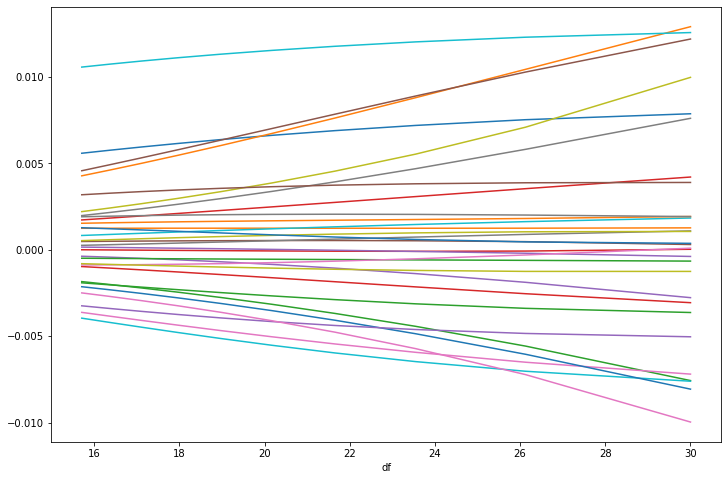

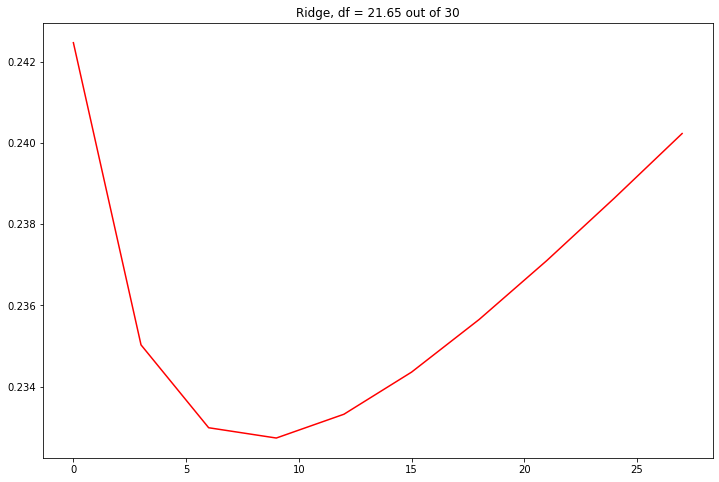

03-Dec-2018 r2: 20.04



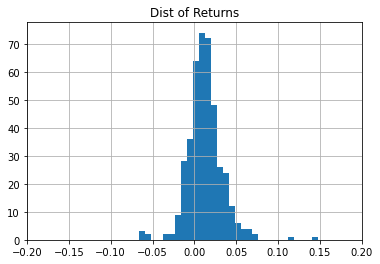

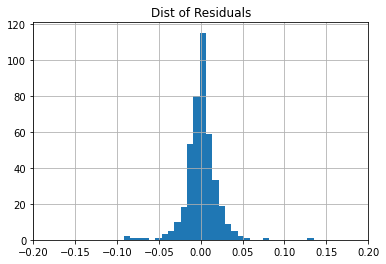

Sum of sectors: 0.17%
Daily Factor Rets:
                          2018-12-03
Market                          1.19
Beta                            0.71
Momentum                        0.13
Vol                             0.07
Application Software           -0.39
Electrical & Electronics        0.30
Data Software                  -0.06
Fintech                         0.05
Industrials                    -0.57
Consumer Discretionary          0.05
Hardware                        0.43
Financial Services             -0.61
Health Care                     0.00
Consumer Services              -0.41
Energy                          0.78
REITs                          -0.28
Insurers                       -0.01
Staples                        -0.43
Utilities                       0.78
Pharmaceuticals                -0.45
Materials                       0.39
Ideal                           0.11
Size                            0.10
Value                           0.16
T10YIE                         -0.

In [193]:
## STAGE-WISE ORTHOGONALIZATION, MULTI-FACTOR REGRESSION

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import Ridge
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from scipy import optimize 
from scipy.optimize import linprog
import warnings

def predictors_to_Cfeatures(pred_df, c_features_l, sector_s):
    
    exp_g = 10
    m_omd = 5
    IDwinsor_L = 0.025
    IDwinsor_H = 0.990
    winsor_L = 0.01
    Vwinsor_H = 0.90
    IQuant = 10
    field_l = ['GS', 'GGP', 'GE', 'G', 'G Vol', 'G r2', 'E Vol', 'S Vol', 'OM', 'OMp', 'ROIp', 'ROIdp', 'Alloc']    
    sc_df = pd.DataFrame(np.nan, index = pred_df.index, columns = field_l)

    pred_df['P/Ee'][pred_df['P/Ee'] < 0] = abs(pred_df['P/Ee'][pred_df['P/Ee'] < 0]) * 100
    pred_df['P/Eo'][pred_df['P/Eo'] < 0] = abs(pred_df['P/Eo'][pred_df['P/Eo'] < 0]) * 100
    pred_df['P/GP'][pred_df['P/GP'] < 0] = abs(pred_df['P/GP'][pred_df['P/GP'] < 0]) * 100
    pred_df['P/S'][pred_df['P/S'] < 0] = abs(pred_df['P/S'][pred_df['P/S'] < 0]) * 100
    pred_df['sP/E'][pred_df['sP/E'] < 0] = abs(pred_df['sP/E'][pred_df['sP/E'] < 0]) * 100
    pred_df['sP/S'][pred_df['sP/S'] < 0] = abs(pred_df['sP/S'][pred_df['sP/S'] < 0]) * 100
    pred_df['sP/GP'][pred_df['sP/GP'] < 0] = abs(pred_df['sP/GP'][pred_df['sP/GP'] < 0]) * 100
    pred_df = fix_na(pred_df, 'r2 S', 'r2 GP')
    pred_df = fix_na(pred_df, 'GS', 'GGP')
    aux_df = pred_df[['sP/S', 'sP/GP']]
    ratio = aux_df.median()['sP/GP'] / aux_df.median()['sP/S']
    aux_df['sP/S'] *= ratio
    aux_df = aux_df.T.fillna(method = 'ffill').T
    pred_df['sP/GP'] = aux_df['sP/GP']

    featuresC_df = pd.DataFrame(np.nan, index = pred_df.index, columns = c_features_l)

    sc_df['GS'] = pred_df['GS']
    sc_df['GGP'] = pred_df['GGP']
    sc_df['GE'] = pred_df['GE']
    sc_df['G'] = pred_df[['GE','GGP', 'GS']].min(axis = 1)
    sc_df['G Vol'] = pred_df[['GE','GGP', 'GS']].std(axis = 1)
    sc_df['G r2'] = pred_df[['r2 S', 'r2 GP', 'r2 E']].mean(axis = 1)
    sc_df['E Vol'] = pred_df['E Vol'].map(lambda x: max(1, x / 100))
    sc_df['S Vol'] = pred_df['S Vol'].map(lambda x: max(1, x / 100))
    sc_df['OM'] = pred_df['OM-t0'].map(lambda x: min(x, 60))
    sc_df['OMp'] = pred_df['OMd'].map(lambda x: min(x, 0))
    sc_df['ROIp'] = pred_df['ROI-P'].map(lambda x: min(x, 0))
    sc_df['ROIdp'] = pred_df['ROId'].map(lambda x: min(x, 0))
    sc_df['G r2'] = sc_df['G r2'].replace({-np.inf: 1})
    sc_df['Alloc'] = (25 * sc_df['G'] * (sc_df['G r2'] ** 5) / sc_df['E Vol'] / sc_df['S Vol'] + 
                      5 * sc_df['OM'] + 50 * sc_df['OMp'] + 50 * sc_df['ROIp'] + 50 * sc_df['ROIdp'])
    
    featuresC_df['Ideal'] = winsorize(sc_df['Alloc'], IDwinsor_L, IDwinsor_H)

    Value_s = (3 * pred_df['sP/E'] + pred_df['sP/GP']) / 4
    featuresC_df['Value'] = -winsorize(Value_s, winsor_L, Vwinsor_H) 
    featuresC_df['Size'] = -pd.Series(np.log(pred_df['Size']), index = pred_df.index)

    featuresC_df -= featuresC_df.mean()
    featuresC_df /= featuresC_df.std()
    featuresC_df = featuresC_df.fillna(0)
    
    return featuresC_df

def predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s):
        
    MacroPxs_df['US10YR RR'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['T10YIE']
    MacroPxs_df['YC'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['USGG2YR']
    MacroPxs_df['2Y IR Vol'] = MacroPxs_df['USGG2YR'].ewm(halflife = hl).std() * np.sqrt(252)
    MacroPxs_df = MacroPxs_df.loc[sPxs_df.index]
    MacroPxs_df = (MacroPxs_df - MacroPxs_df.ewm(halflife = hl).mean())
    MacroPxs_df = MacroPxs_df.pct_change()

    MacroFactor_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = m_features_l)
    for c_mf in m_features_l:
        c_mf_s = sPxs_df.pct_change().join(MacroPxs_df[c_mf])[-hl:].cov()[c_mf].drop(c_mf)    
        featVar_s = MacroPxs_df[c_mf].ewm(halflife = hl).var().iloc[-1]
        MacroFactor_df[c_mf] = c_mf_s / featVar_s

    for c_feat in m_features_l:
        MacroFactor_df[c_feat] = winsorize(MacroFactor_df[c_feat], winsor_L, winsor_H).values

    naT_l = MacroFactor_df.isna().sum(axis = 1)[MacroFactor_df.isna().sum(axis = 1) > 0].index
    naF_l = MacroFactor_df.loc[naT_l].T[MacroFactor_df.loc[naT_l].T.isna()].index.tolist()  
    MacroFactor_df.loc[naT_l, naF_l] = MacroFactor_df.median().values
    MacroFactor_df -= MacroFactor_df.mean()
    MacroFactor_df /= MacroFactor_df.std()

    return MacroFactor_df, MacroPxs_df[m_features_l]

def predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s):

    lag_M1 = -252
    lag_M3 = -21
    beta_adj = True

    featuresP_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = p_features_l)
    sRetPxs_df = sPxs_df.pct_change().dropna()
    sRetMkt_s = sMkt_s.pct_change().dropna()    
    sCovPxs_s = sRetPxs_df.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    sVarMkt = sRetMkt_s.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    featuresP_df['Beta'] = winsorize(sCovPxs_s / sVarMkt, 0, winsor_H)
    featuresP_df['Vol'] = -winsorize(sRetPxs_df.ewm(halflife = hl).std().iloc[-1], 0, winsor_H)
    Mom_s = pd.Series((featuresP_df.index.map(lambda x: sPxs_df[x].iloc[lag_M3]) / 
                       featuresP_df.index.map(lambda x: sPxs_df[x].iloc[lag_M1])), index = featuresP_df.index)
    featuresP_df['Momentum'] = winsorize(Mom_s, winsor_L, winsor_H)

    featuresP_df -= featuresP_df.mean()
    featuresP_df /= featuresP_df.std()
    
    return featuresP_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df 

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def fix_na(base_df, col_b, col_t):

    aux = base_df[[col_b, col_t]]
    aux = aux.T.fillna(method = 'ffill').T
    base_df[col_t] = aux[col_t]
    
    return base_df

def clean_dates(dt_range, exclusionDates_l):
    
    auxDt_s = pd.Series(dt_range)
    auxDt_s.index = pd.Series(dt_range).map(lambda x: x.strftime('%m%d')).tolist()
    validDT_l = [d for d in auxDt_s.index.tolist() if d not in exclusionDates_l]
    dt_range = sorted(pd.unique(auxDt_s.loc[validDT_l].tolist()).tolist())
    
    return dt_range    

def winsorize(Rt_s, floor, cap):
    
    w_up = np.quantile(Rt_s.dropna().values, q = cap)
    w_down = np.quantile(Rt_s.dropna().values, q = floor)    
    w_s = Rt_s.clip(w_down, w_up)
    
    return w_s

def get_predictors(c_date, exclusion_l):
    
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True            
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100  
    exclusion_l = [t for t in exclusion_l if t in pred_df.index]
    pred_df = pred_df.drop(exclusion_l)
    
    return pred_df, c_date

def w_mlr(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    lr_mod = model.fit(x_m, y_a, w_a)
    lr_values = lr_mod.predict(x_m)
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a, w_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge(x_m, y_a, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = pd.DataFrame(x_m.T)
    y_df = pd.DataFrame(y_a.T)

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_df.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_df.drop(valX_df.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values)
                valRidge_f = ridge_mod.predict(valX_df.values)
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values)
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = pd.Series(bestRidge_fr, index = c_l)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.legend().remove()
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_m.shape[0]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidge_f).join(y_df, rsuffix = '_label').corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

def othogonalize(cbasis_df, newF_s):
    
    ortF_model = LinearRegression(fit_intercept = True)
    residualF_a = newF_s.values
    for c_basis in cbasis_df.columns:
        x_a = cbasis_df[c_basis].values.reshape(-1, 1)
        y_a = residualF_a
        ortF_m = ortF_model.fit(x_a, residualF_a)
        spanned_a = ortF_m.predict(x_a)
        residualF_a -= spanned_a
    orthogonal_s = pd.Series(residualF_a, index = newF_s.index)

    return orthogonal_s  

def w_mlr2(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    x_m = (x_m.T * w_a).T
    y_a = y_a * w_a
    lr_mod = model.fit(x_m, y_a)
    lr_values = lr_mod.predict(x_m) / w_a
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge2(x_df, y_s, w_s, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = (x_df.T * w_s).T
    y_s = y_s * w_s 
    y_s.name = 'Labels'

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_s.iloc[init_v: end_v]
                valW_s = w_s.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_s.drop(valY_df.index)
                trainW_s = w_s.drop(valW_s.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values) / trainW_s.values
                valRidge_f = ridge_mod.predict(valX_df.values) / valW_s.values
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values) / w_s.values
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = pd.Series(bestRidge_fr, index = c_l)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.legend().remove()
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_df.shape[1]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidgeRt_s).join(y_s).corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

def on_selection_class(value):
    global target_class
    target_class = value
    root.destroy()

warnings.filterwarnings('ignore')
dbase = "visiblealpha_laptop"
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

selection_scope = ''
all_fundamentals_l = ['sP/S', 'sP/E', 'sP/GP', 'P/S', 'P/Ee', 'P/GP', 'P/Eo', 'OM-t0', 'OM', 'OMd', 'GS', 'GE', 'r2 S', 'r2 E', 
                      'GGP', 'r2 GP', 'Size', 'ROI-P', 'ROI', 'ROId','ROE-P', 'ROE', 'ROEd', 'S Vol', 'E Vol', 'GP Vol', 'r&d']
exclusion_l = ['BABA US', 'XPEV US', 'NIO US', 'TME US', 'JD US', 'PDD US', 'VNET US', 'ZLAB US', 'WB US', 
               'OCFT US', 'BGNE US', 'MOMO US', 'ZTO US', 'NTES US']
macroFeatures_l = ['CRB Index Index Points', 'Brent USD/Bbl', 'M2CP Velocity', 'M2MP Velocity', 'T5YIFR', 'T10YIE', 'USGG2YR', 
                   'USGG10YR', 'VIX']
sector_ETF_map = {'Software': 'IGV US',
                 'Industrials': 'XLI US',
                 'Health Care': 'XLV US',
                 'Consumer Goods': 'XLP US',
                 'Hardware': 'SOXX US',
                 'Financials': 'XLF US',
                 'Consumer Services': 'XLY US',
                 'Energy': 'XLE US',
                 'Utilities': 'XLU US',
                 'Telecommunications': 'XLC US',
                 'Materials': 'XLB US'}

hl = 42
q_quant = 100
long_w = 1000
volCheck_w = 10
winsor_L = 0.010
winsor_H = 0.990
ridge_b = True
anchor_asset = 'SPX'
sacr_sector = 'Health Care'
Pxs_df = open_df('prices_relation')

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
class_list = Sectors_df.columns.tolist()

root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *class_list, command = on_selection_class)
tk.Label(root, text = "Choose a classification: ").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop()

print(target_class)
print('')
secExt = '_cs' + target_class[-1]
factExt = ''
if (ridge_b):
    factExt = '_ridge'

stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()

sector_l = pd.unique(Sectors_df.dropna(subset = [target_class])[target_class]).tolist()
sector_s = Sectors_df[Sectors_df[target_class].isna() == False][target_class]
Industry_s = Sectors_df.loc[sector_s.index, 'VA Industry']
Industry_l = pd.unique(Industry_s).tolist()

m_features_l = ['T10YIE', 'VIX', '2Y IR Vol', 'USGG2YR', 'US10YR RR', 'Brent USD/Bbl', 'M2MP Velocity']
c_features_l = ['Ideal', 'Size', 'Value']
p_features_l = ['Beta', 'Momentum', 'Vol'] 
SLICEall_features_l = ['Market'] + p_features_l + sector_l + c_features_l + m_features_l 
all_features_l = SLICEall_features_l.copy()

STdt_str = input('Enter Start Date (empty for update or YY/MM/DD): ')
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = Pxs_df.index[-1] 
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  

st_date = Pxs_df[Pxs_df.index >= st_date].index[0]
ovr = False
oride = input('Override (Y/y or empty)? ').upper()
if (oride == 'Y'):
    ovr = True
        
dt_range = Pxs_df[Pxs_df.index >= st_date][Pxs_df[Pxs_df.index >= st_date].index <= end_date].index.tolist() 
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0101')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('2512')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0407')) == -1].tolist()
if (ovr):
    FactorRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)
    IdioRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)
else:
    try:
        FactorRets_df = open_df('factor_returns' + factExt + secExt)    
        IdioRets_df = open_df('idio_returns' + factExt + secExt)
    except:
        FactorRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)
        IdioRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)    

save_file = True
dt_range = [dt for dt in dt_range if dt not in FactorRets_df.dropna(how = 'all').index.tolist()] 
if (len(dt_range) == 0):
    save_file = False
    SPdt_str = input('Specific date (empty for last or YY/MM/DD): ')
    try:
        sp_date = datetime.strptime(SPdt_str, "%y/%m/%d").date()
    except:
        sp_date = Pxs_df.index[-1]         
    dt_range.append(sp_date)
    
for c_dt in dt_range:
    p_dt = Pxs_df.index[Pxs_df.index.tolist().index(c_dt) - 1]
    valid_start = False 
    pred_dt = c_dt
    while (not valid_start):
        pred_df, c_date = get_predictors(pred_dt, exclusion_l)
        exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
        exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
        if (len(exc_ffields) == 0):
            pred_df = pred_df.drop(exc_tickers)
            valid_start = True
            print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
        else:
            pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
            
    sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ]
    Check_s = round(100 * sPxs_df[pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
    SBweights_s = np.log(pred_df['Size'])     
    sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
    zeroVol_l = Check_s[Check_s == 0].index.tolist()
    excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
    pred_df = pred_df.drop(excall_l)
    asset_l = pred_df.index.tolist()
    
    FlatWeights_s = pd.Series(1, index = pred_df.index)       
    sIdioRets_df = IdioRets_df[IdioRets_df.index < c_dt].dropna(how = 'all')
    if (sIdioRets_df.shape[0] >= (2 * hl)):
        print('idio var weights')
        var_s = sIdioRets_df[-252:][asset_l].ewm(halflife = hl).var().iloc[-1]
        mean_var = var_s.mean()
        VBWeights_s = var_s.fillna(mean_var) ** (-1)
        VBWeights_s /= VBWeights_s.std()
        Weights_s = VBWeights_s[asset_l]        
    else:
        print('size weights')
        Weights_s = SBweights_s[asset_l].copy()
    w_s = Weights_s ** (1 / 2)
        
    MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
    sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]
    sMkt_s = Pxs_df[Pxs_df.index < c_dt][-long_w: ][anchor_asset]

    ## LOADINGS ENGINEERING, TIME SERIES

    featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
    featuresC_df = predictors_to_Cfeatures(pred_df, c_features_l, sector_s)
    featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
    XSStyleLoadings_df = featuresP_df.join(featuresC_df)

    ## INTERCEPT, BETA RETURNS AND RESIDUALS, CROSS SECTION: SIMPLE LINEAR MODEL (LN(MKT CAP) AS WEIGHTS) - 1

    XSMktRet = Pxs_df[anchor_asset].loc[c_dt] / Pxs_df[anchor_asset].loc[p_dt] - 1    
    RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1    
    XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)
    XSAssetRets.name = 'Rt'
    
    # FACTOR ORTHOGONALIZATION
    
    sBetas_s = featuresP_df['Beta']
    FactorLoadings_df = pd.DataFrame(sBetas_s)
    
    sIdeal_s = featuresC_df['Ideal']
    FactorLoadings_df[sIdeal_s.name] = othogonalize(FactorLoadings_df, sIdeal_s)    

    XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
    for c_sector in sector_l:
        stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
        XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
    XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())
    sectorR_l = sector_l.copy()
    sectorR_l.remove(sacr_sector)
    for c_sector in sectorR_l:
        FactorLoadings_df[c_sector] = othogonalize(FactorLoadings_df, XSSectorLoadings_df[c_sector]).values        

    sSize_s = featuresC_df['Size']
    FactorLoadings_df[sSize_s.name] = othogonalize(FactorLoadings_df, sSize_s)

    for c_Sfeat in XSStyleLoadings_df.columns:
        if (c_Sfeat not in FactorLoadings_df.columns):
            FactorLoadings_df[c_Sfeat] = othogonalize(FactorLoadings_df, XSStyleLoadings_df[c_Sfeat]).values

    for c_Mfeat in m_features_l:
        FactorLoadings_df[c_Mfeat] = othogonalize(FactorLoadings_df, featuresM_df[c_Mfeat]).values
        
    FactorLoadings_df['Market'] = 1
    x = FactorLoadings_df.copy()

    # MULTI-VARIATE REGRESSION, ORTHOGONAL BASIS, NO INTERCEPT
            
    if (ridge_b):
        aXSOStockRet_s, aXSOFacRet_s, aXSOy0, aXSOmlr_r2, aXSOLambda = ridge2(FactorLoadings_df, XSAssetRets, w_s, 
                                                                              asset_l, FactorLoadings_df.columns.tolist())    
    else:
        aXSOStockRet_s, aXSOFacRet_s, aXSOy0, aXSOmlr_r2 = w_mlr2(FactorLoadings_df.values, XSAssetRets.values, w_s.values, 
                                                                  asset_l, FactorLoadings_df.columns.tolist(), False)
    aXSOFacRet_s.loc[sacr_sector] = 0    
    FactorLoadings_df[sacr_sector] = XSSectorLoadings_df[sacr_sector]
    FactorRets_df.loc[c_dt] = aXSOFacRet_s
        
    IdioRets_df.loc[c_dt, asset_l] = RawAssetRets_s - (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1)
    modelR2 = round(100 * (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1).corr(RawAssetRets_s) ** 2, 2)
    
    if (len(dt_range) == 1):
        print(c_dt.strftime('%d-%b-%Y') + ' r2: ' + str(modelR2))
        print('')
        RawAssetRets_s.hist(bins = 30)
        plt.title('Dist of Returns')
        plt.xlim([-0.2, 0.2])
        plt.show()
        IdioRets_df.loc[c_dt].hist(bins = 30)
        plt.title('Dist of Residuals')
        plt.xlim([-0.2, 0.2])
        plt.show()  
    else:
        print(c_dt.strftime('%d-%b-%y') + ' r2: ' + str(modelR2))
    print('Sum of sectors: ' + str(round(100 * FactorRets_df[sector_l].iloc[-1].sum(), 2)) + '%') 
    dSummary_df = pd.DataFrame(round(100 * FactorRets_df.loc[c_dt], 2))
    if (target_class == 'Custom Sector 1'):
        ETFRets_s = pd.Series(100 * (FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[c_dt, sector_ETF_map[x]]) / 
                          FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[p_dt, sector_ETF_map[x]]) - 1).values, 
                          index = sector_l)
        ETFRets_s.name = 'ETFs'    
        dSummary_df['ETF Rets'] = np.nan
        dSummary_df.loc[sector_l, 'ETF Rets'] = round(ETFRets_s, 2)
    print('Daily Factor Rets:')
    print(dSummary_df)
    print('')
    
if (len(dt_range) > 0) & (save_file):
    if (len(dt_range) == 1) & (ovr):
        print('Not saving....')
    else:
        FactorRets_df.sort_index().to_sql('factor_returns' + factExt + secExt, engine, index = True, if_exists = 'replace')
        IdioRets_df.sort_index().to_sql('idio_returns' + factExt + secExt, engine, index = True, if_exists = 'replace')   
        factorSharpe_s = (round(((1 + FactorRets_df).expanding().apply(np.prod).iloc[-1] - 1) / 
                               (FactorRets_df.std() * np.sqrt(FactorRets_df.shape[0])), 2)).sort_values(ascending = False)   

        sIdioRets_df = IdioRets_df[-252:]
        idioSharpe_s = (round(((1 + sIdioRets_df).expanding().apply(np.prod).iloc[-1] - 1) / 
                              (sIdioRets_df.std() * np.sqrt(sIdioRets_df.shape[0])), 2)).sort_values(ascending = False)    
        print('Factor Sharpe:')
        print(factorSharpe_s)
        print('')
        print('Idio Sharpe:')
        print(idioSharpe_s[:50]) 

In [ ]:
x = (FactorRets_df + 1).expanding().apply(np.prod)
((x.iloc[-1] - 1) * 100).sort_values(ascending = False)

In [138]:
# STATISTICAL FACTOR MODEL

from sklearn.decomposition import PCA

def svd_decomp(X, VT):
    
    U, D, Vt = np.linalg.svd(X)
    pca = PCA(n_components = VT)
    XD = pca.fit_transform(X)
    PCAL = XD.shape[1]
    Vs = Vt.T[:, :PCAL]
    Us = U[:, :PCAL]
    
    return PCAL, Us, D[:PCAL], Vs

varTarget = 95
long_w = 1000
volCheck_w = 10
winsor_L = 0.010
winsor_H = 0.990
Pxs_df = open_df('prices_relation')
stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()
try:  
    PCAIdioRets_df = open_df('pca_idio_returns')
except:
    pass

STdt_str = input('Enter Start Date (empty for update or YY/MM/DD): ')
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    try:
        st_date = Pxs_df[Pxs_df.index > PCAIdioRets_df.index[-1]].index[0]
    except:
        st_date = Pxs_df.index[-1]
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  

st_date = Pxs_df[Pxs_df.index >= st_date].index[0]
ovr = False
oride = input('Override (Y/y or empty)? ').upper()
if (oride == 'Y'):
    ovr = True
        
dt_range = Pxs_df[Pxs_df.index >= st_date][Pxs_df[Pxs_df.index >= st_date].index <= end_date].index.tolist() 
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0101')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('2512')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0407')) == -1].tolist()
if (ovr):
    PCAIdioRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)
    PCAIdioRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)    
    PCAFRets_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(11))     
    asset_l = []
else:
    try:  
        PCAIdioRets_df = open_df('pca_idio_returns')
        PCAFRets_df = open_df('pca_factor_returns')
        asset_l = PCAIdioRets_df.columns.tolist()
    except:
        PCAIdioRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)    
        PCAFRets_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(11))        
        asset_l = []

save_file = True
dt_range = [dt for dt in dt_range if dt not in PCAIdioRets_df.dropna(how = 'all').index.tolist()] 
if (len(dt_range) == 0):
    save_file = False
    SPdt_str = input('Specific date (empty for last or YY/MM/DD): ')
    try:
        sp_date = datetime.strptime(SPdt_str, "%y/%m/%d").date()
    except:
        try:
            sp_date = Pxs_df[Pxs_df.index > PCAIdioRets_df.index[-1]].index[0]
        except:
            sp_date = Pxs_df.index[-1]         
    dt_range.append(sp_date)
    
for c_dt in dt_range:
    p_dt = Pxs_df.index[Pxs_df.index.tolist().index(c_dt) - 1]
    valid_start = False 
    pred_dt = c_dt
    while (not valid_start):
        pred_df, c_date = get_predictors(pred_dt, exclusion_l)
        exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
        exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
        if (len(exc_ffields) == 0):
            pred_df = pred_df.drop(exc_tickers)
            valid_start = True
            print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
        else:
            pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
            
    sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ]
    Check_s = round(100 * sPxs_df[pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
    SBweights_s = winsorize(pred_df['Size'], winsor_L, winsor_H)     
    sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
    zeroVol_l = Check_s[Check_s == 0].index.tolist()
    excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
    pred_df = pred_df.drop(excall_l)
    asset_l = pred_df.index.tolist()
    sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]
    
    FlatWeights_s = pd.Series(1, index = pred_df.index)       
    sPCAIdioRets_df = PCAIdioRets_df[PCAIdioRets_df.index < c_dt].dropna(how = 'all')
    if (sPCAIdioRets_df.shape[0] >= (2 * hl)):
        print('idio var weights')
        var_s = sPCAIdioRets_df[-252:][asset_l].ewm(halflife = hl).var().iloc[-1]
        mean_var = var_s.mean()
        VBWeights_s = var_s.fillna(mean_var) ** (-1)
        VBWeights_s /= VBWeights_s.std()
        Weights_s = VBWeights_s[asset_l]        
    else:
        print('size weights')
        Weights_s = SBweights_s[asset_l].copy()
    w_s = Weights_s ** (1 / 2)   
    w_a = w_s.values

    RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1    
    XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)

    sret_df = sPxs_df.pct_change()[-1 * hl:]
    c_varTarget = varTarget
    shrink_b = True
    while (shrink_b):
        orthB_n, eigenVeU_a, eigenVa_a, eigenVeV_a = svd_decomp(sret_df, c_varTarget / 100)
        if (orthB_n > (PCAFRets_df.shape[1] - 1)):
            c_varTarget -= 5
        else:
            shrink_b = False
    print(str(c_varTarget) + '% variance, ' + str(orthB_n) + ' factors')
    
    #TIME SERIES ESTIMATION OF STOCK LOADINGS TO PRINCIPAL COMPONENTS
    eigenVeV_a = np.insert(eigenVeV_a, 0, 1, axis = 1)
    sretBase_df = pd.DataFrame(eigenVeV_a, index = sret_df.columns, columns = np.arange(orthB_n + 1))    
    PCAFactLoadings_df = pd.DataFrame(eigenVeV_a, index = sret_df.columns)
    
    #CROSS SECTIONAL REGRESSION FOR ESTIMATION OF FACTOR AND IDIO RETURNS
    x_m = (eigenVeV_a.T * w_a).T
    y_a = (XSAssetRets.values * w_a)
    lrMod = LinearRegression(fit_intercept = False)
    lrMod_PCA = lrMod.fit(x_m, y_a)
    stockFRets_s = pd.Series(lrMod_PCA.predict(x_m) / w_a, index = XSAssetRets.index) 
    PCAFRets_df.loc[c_dt] = lrMod_PCA.coef_.tolist() + [0] * (PCAFRets_df.shape[1] - lrMod_PCA.coef_.shape[0])
    LRPCA_r2 = round(100 * stockFRets_s.corr(XSAssetRets) ** 2, 2)
    print(c_dt.strftime('%d%b%y') + ' LR r2: ' + str(LRPCA_r2))
    print('')

    PCAIdioRets_s = (RawAssetRets_s - stockFRets_s)
    PCAIdioRets_df.loc[c_dt, asset_l] = PCAIdioRets_s
    
    sretBase_df.to_sql('pca_loadings_' + c_dt.strftime('%y%m%d'), engine, index = True, if_exists = 'replace')
    if (len(dt_range) == 1):
        RawAssetRets_s.hist(bins = 30)
        plt.xlim([-0.1, 0.1])
        plt.show()
        PCAIdioRets_s.hist(bins = 30)
        plt.xlim([-0.1, 0.1])
        plt.show()
    
PCAIdioRets_df = PCAIdioRets_df.T.dropna(how = 'all').T
if (len(dt_range) > 0) & (save_file):
    if (len(dt_range) == 1) & (ovr):
        print('Not saving....')
    else:
        PCAIdioRets_df.sort_index().to_sql('pca_idio_returns', engine, index = True, if_exists = 'replace')
        PCAFRets_df.sort_index().to_sql('pca_factor_returns', engine, index = True, if_exists = 'replace')
        sPCAIdioRets_df = PCAIdioRets_df[-252:]
        idioSharpe_s = (round(((1 + sPCAIdioRets_df).expanding().apply(np.prod).iloc[-1] - 1) / 
                              (sPCAIdioRets_df.std() * np.sqrt(sPCAIdioRets_df.shape[0])), 2)).sort_values(ascending = False)    
        print('')
        print('Idio Sharpe:')
        print(idioSharpe_s[:50])    

Enter Start Date (empty for update or YY/MM/DD): 18/04/01
Enter End Date (empty for last or YY/MM/DD): 
Override (Y/y or empty)? y
Fundamentals date: 02-Apr-2018
size weights
70% variance, 9 factors
02Apr18 LR r2: 8.37

Fundamentals date: 02-Apr-2018
size weights
75% variance, 10 factors
03Apr18 LR r2: 10.01

Fundamentals date: 02-Apr-2018
size weights
75% variance, 10 factors
04Apr18 LR r2: 9.65

Fundamentals date: 02-Apr-2018
size weights
70% variance, 9 factors
05Apr18 LR r2: 3.84

Fundamentals date: 06-Apr-2018
size weights
70% variance, 9 factors
06Apr18 LR r2: 24.65

Fundamentals date: 06-Apr-2018
size weights
70% variance, 9 factors
09Apr18 LR r2: 5.73

Fundamentals date: 06-Apr-2018
size weights
70% variance, 9 factors
10Apr18 LR r2: 26.97

Fundamentals date: 06-Apr-2018
size weights
70% variance, 9 factors
11Apr18 LR r2: 10.81

Fundamentals date: 06-Apr-2018
size weights
70% variance, 9 factors
12Apr18 LR r2: 12.37

Fundamentals date: 06-Apr-2018
size weights
70% variance, 9 f

60% variance, 10 factors
06Aug18 LR r2: 12.91

Fundamentals date: 01-Aug-2018
idio var weights
60% variance, 10 factors
07Aug18 LR r2: 4.77

Fundamentals date: 01-Aug-2018
idio var weights
60% variance, 10 factors
08Aug18 LR r2: 4.31

Fundamentals date: 01-Aug-2018
idio var weights
60% variance, 10 factors
09Aug18 LR r2: 15.32

Fundamentals date: 10-Aug-2018
idio var weights
60% variance, 10 factors
10Aug18 LR r2: 8.71

Fundamentals date: 10-Aug-2018
idio var weights
60% variance, 10 factors
13Aug18 LR r2: 6.39

Fundamentals date: 10-Aug-2018
idio var weights
60% variance, 10 factors
14Aug18 LR r2: 2.42

Fundamentals date: 15-Aug-2018
idio var weights
60% variance, 10 factors
15Aug18 LR r2: 26.56

Fundamentals date: 15-Aug-2018
idio var weights
60% variance, 10 factors
16Aug18 LR r2: 1.34

Fundamentals date: 15-Aug-2018
idio var weights
60% variance, 10 factors
17Aug18 LR r2: 5.25

Fundamentals date: 15-Aug-2018
idio var weights
60% variance, 10 factors
20Aug18 LR r2: 5.21

Fundamental

05Dec18 LR r2: nan

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
06Dec18 LR r2: 24.86

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
07Dec18 LR r2: 39.52

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
10Dec18 LR r2: 27.21

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
11Dec18 LR r2: 6.73

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
12Dec18 LR r2: 25.32

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
13Dec18 LR r2: 18.16

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
14Dec18 LR r2: 5.28

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
17Dec18 LR r2: 26.93

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
18Dec18 LR r2: 29.86

Fundamentals date: 02-Nov-2018
idio var weights
70% variance, 10 factors
19Dec18 LR r2: 17.47

Fundamentals date: 02-Nov-2018
i

60% variance, 10 factors
10Apr19 LR r2: 16.27

Fundamentals date: 01-Apr-2019
idio var weights
60% variance, 10 factors
11Apr19 LR r2: 1.46

Fundamentals date: 01-Apr-2019
idio var weights
60% variance, 10 factors
12Apr19 LR r2: 5.47

Fundamentals date: 15-Apr-2019
idio var weights
60% variance, 10 factors
15Apr19 LR r2: 11.3

Fundamentals date: 16-Apr-2019
idio var weights
60% variance, 9 factors
16Apr19 LR r2: 16.23

Fundamentals date: 16-Apr-2019
idio var weights
60% variance, 9 factors
17Apr19 LR r2: 13.32

Fundamentals date: 16-Apr-2019
idio var weights
60% variance, 9 factors
18Apr19 LR r2: 0.02

Fundamentals date: 16-Apr-2019
idio var weights
60% variance, 10 factors
19Apr19 LR r2: nan

Fundamentals date: 16-Apr-2019
idio var weights
60% variance, 9 factors
22Apr19 LR r2: 9.54

Fundamentals date: 16-Apr-2019
idio var weights
60% variance, 9 factors
23Apr19 LR r2: 13.14

Fundamentals date: 16-Apr-2019
idio var weights
60% variance, 10 factors
24Apr19 LR r2: 9.56

Fundamentals dat

Fundamentals date: 07-Aug-2019
idio var weights
65% variance, 10 factors
13Aug19 LR r2: 10.74

Fundamentals date: 07-Aug-2019
idio var weights
65% variance, 10 factors
14Aug19 LR r2: 28.06

Fundamentals date: 15-Aug-2019
idio var weights
65% variance, 10 factors
15Aug19 LR r2: 16.4

Fundamentals date: 15-Aug-2019
idio var weights
65% variance, 10 factors
16Aug19 LR r2: 18.4

Fundamentals date: 15-Aug-2019
idio var weights
65% variance, 10 factors
19Aug19 LR r2: 6.48

Fundamentals date: 15-Aug-2019
idio var weights
65% variance, 10 factors
20Aug19 LR r2: 9.16

Fundamentals date: 15-Aug-2019
idio var weights
65% variance, 10 factors
21Aug19 LR r2: 12.18

Fundamentals date: 15-Aug-2019
idio var weights
65% variance, 10 factors
22Aug19 LR r2: 2.02

Fundamentals date: 15-Aug-2019
idio var weights
65% variance, 10 factors
23Aug19 LR r2: 36.1

Fundamentals date: 15-Aug-2019
idio var weights
65% variance, 9 factors
26Aug19 LR r2: 8.27

Fundamentals date: 15-Aug-2019
idio var weights
65% varian

55% variance, 10 factors
12Dec19 LR r2: 24.63

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
13Dec19 LR r2: 24.89

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
16Dec19 LR r2: 3.56

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
17Dec19 LR r2: 9.59

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
18Dec19 LR r2: 2.06

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
19Dec19 LR r2: 2.2

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
20Dec19 LR r2: 1.58

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
23Dec19 LR r2: 13.59

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
24Dec19 LR r2: 3.57

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
26Dec19 LR r2: 4.0

Fundamentals date: 02-Dec-2019
idio var weights
55% variance, 10 factors
27Dec19 LR r2: 10.83

Fundamentals

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
16Apr20 LR r2: 29.8

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
17Apr20 LR r2: 46.44

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
20Apr20 LR r2: 19.93

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
21Apr20 LR r2: 10.29

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
22Apr20 LR r2: 11.15

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
23Apr20 LR r2: 26.91

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
24Apr20 LR r2: 6.49

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
27Apr20 LR r2: 23.91

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
28Apr20 LR r2: 38.41

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9 factors
29Apr20 LR r2: 38.3

Fundamentals date: 15-Apr-2020
idio var weights
85% variance, 9

65% variance, 9 factors
17Aug20 LR r2: 32.1

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 9 factors
18Aug20 LR r2: 31.28

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 9 factors
19Aug20 LR r2: 1.89

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 9 factors
20Aug20 LR r2: 39.11

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 9 factors
21Aug20 LR r2: 11.44

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 9 factors
24Aug20 LR r2: 55.49

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 9 factors
25Aug20 LR r2: 23.04

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 9 factors
26Aug20 LR r2: 36.9

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 10 factors
27Aug20 LR r2: 24.46

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 10 factors
28Aug20 LR r2: 10.5

Fundamentals date: 17-Aug-2020
idio var weights
65% variance, 10 factors
31Aug20 LR r2: 42.83

Fundamentals da

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 9 factors
17Dec20 LR r2: 27.4

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 9 factors
18Dec20 LR r2: 15.43

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 9 factors
21Dec20 LR r2: 15.57

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 9 factors
22Dec20 LR r2: 35.15

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 9 factors
23Dec20 LR r2: 42.53

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 9 factors
24Dec20 LR r2: 11.2

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 9 factors
28Dec20 LR r2: 29.79

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 8 factors
29Dec20 LR r2: 12.82

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 8 factors
30Dec20 LR r2: 25.63

Fundamentals date: 01-Dec-2020
idio var weights
70% variance, 8 factors
31Dec20 LR r2: 23.73

Fundamentals date: 01-Jan-2021
idio var weights
70% variance, 

Fundamentals date: 08-Apr-2021
idio var weights
75% variance, 10 factors
21Apr21 LR r2: 35.5

Fundamentals date: 08-Apr-2021
idio var weights
70% variance, 8 factors
22Apr21 LR r2: 14.86

Fundamentals date: 08-Apr-2021
idio var weights
75% variance, 10 factors
23Apr21 LR r2: 36.5

Fundamentals date: 08-Apr-2021
idio var weights
75% variance, 10 factors
26Apr21 LR r2: 48.99

Fundamentals date: 08-Apr-2021
idio var weights
75% variance, 10 factors
27Apr21 LR r2: 13.54

Fundamentals date: 08-Apr-2021
idio var weights
75% variance, 10 factors
28Apr21 LR r2: 14.06

Fundamentals date: 08-Apr-2021
idio var weights
70% variance, 8 factors
29Apr21 LR r2: 36.7

Fundamentals date: 08-Apr-2021
idio var weights
70% variance, 8 factors
30Apr21 LR r2: 24.38

Fundamentals date: 03-May-2021
idio var weights
70% variance, 9 factors
03May21 LR r2: 43.48

Fundamentals date: 03-May-2021
idio var weights
70% variance, 9 factors
04May21 LR r2: 40.77

Fundamentals date: 03-May-2021
idio var weights
70% varian

Fundamentals date: 06-Aug-2021
idio var weights
60% variance, 9 factors
20Aug21 LR r2: 7.33

Fundamentals date: 06-Aug-2021
idio var weights
60% variance, 9 factors
23Aug21 LR r2: 55.22

Fundamentals date: 06-Aug-2021
idio var weights
60% variance, 9 factors
24Aug21 LR r2: 30.93

Fundamentals date: 06-Aug-2021
idio var weights
60% variance, 9 factors
25Aug21 LR r2: 12.63

Fundamentals date: 06-Aug-2021
idio var weights
60% variance, 9 factors
26Aug21 LR r2: 8.82

Fundamentals date: 06-Aug-2021
idio var weights
60% variance, 9 factors
27Aug21 LR r2: 36.6

Fundamentals date: 06-Aug-2021
idio var weights
60% variance, 9 factors
30Aug21 LR r2: 25.78

Fundamentals date: 06-Aug-2021
idio var weights
60% variance, 9 factors
31Aug21 LR r2: 8.93

Fundamentals date: 01-Sep-2021
idio var weights
60% variance, 9 factors
01Sep21 LR r2: 13.18

Fundamentals date: 01-Sep-2021
idio var weights
60% variance, 9 factors
02Sep21 LR r2: 5.3

Fundamentals date: 01-Sep-2021
idio var weights
60% variance, 10 f

65% variance, 10 factors
21Dec21 LR r2: 54.84

Fundamentals date: 01-Dec-2021
idio var weights
65% variance, 10 factors
22Dec21 LR r2: 8.35

Fundamentals date: 01-Dec-2021
idio var weights
65% variance, 10 factors
23Dec21 LR r2: 8.41

Fundamentals date: 01-Dec-2021
idio var weights
65% variance, 10 factors
24Dec21 LR r2: nan

Fundamentals date: 01-Dec-2021
idio var weights
65% variance, 9 factors
27Dec21 LR r2: 32.21

Fundamentals date: 01-Dec-2021
idio var weights
65% variance, 9 factors
28Dec21 LR r2: 51.64

Fundamentals date: 01-Dec-2021
idio var weights
65% variance, 9 factors
29Dec21 LR r2: 22.21

Fundamentals date: 01-Dec-2021
idio var weights
65% variance, 9 factors
30Dec21 LR r2: 49.6

Fundamentals date: 01-Dec-2021
idio var weights
65% variance, 8 factors
31Dec21 LR r2: 38.56

Fundamentals date: 03-Jan-2022
idio var weights
70% variance, 10 factors
03Jan22 LR r2: 37.84

Fundamentals date: 03-Jan-2022
idio var weights
70% variance, 10 factors
04Jan22 LR r2: 59.81

Fundamentals 

Fundamentals date: 08-Apr-2022
idio var weights
75% variance, 9 factors
22Apr22 LR r2: 7.6

Fundamentals date: 08-Apr-2022
idio var weights
75% variance, 8 factors
25Apr22 LR r2: 41.91

Fundamentals date: 08-Apr-2022
idio var weights
75% variance, 9 factors
26Apr22 LR r2: 43.09

Fundamentals date: 08-Apr-2022
idio var weights
75% variance, 9 factors
27Apr22 LR r2: 13.25

Fundamentals date: 08-Apr-2022
idio var weights
75% variance, 9 factors
28Apr22 LR r2: 14.83

Fundamentals date: 08-Apr-2022
idio var weights
75% variance, 9 factors
29Apr22 LR r2: 13.15

Fundamentals date: 02-May-2022
idio var weights
75% variance, 8 factors
02May22 LR r2: 50.47

Fundamentals date: 02-May-2022
idio var weights
75% variance, 8 factors
03May22 LR r2: 18.22

Fundamentals date: 04-May-2022
idio var weights
75% variance, 9 factors
04May22 LR r2: 9.4

Fundamentals date: 04-May-2022
idio var weights
75% variance, 9 factors
05May22 LR r2: 55.64

Fundamentals date: 04-May-2022
idio var weights
75% variance, 8 

70% variance, 9 factors
24Aug22 LR r2: 22.72

Fundamentals date: 08-Aug-2022
idio var weights
70% variance, 9 factors
25Aug22 LR r2: 22.84

Fundamentals date: 08-Aug-2022
idio var weights
70% variance, 10 factors
26Aug22 LR r2: 36.15

Fundamentals date: 08-Aug-2022
idio var weights
70% variance, 9 factors
29Aug22 LR r2: 13.43

Fundamentals date: 08-Aug-2022
idio var weights
70% variance, 9 factors
30Aug22 LR r2: 19.4

Fundamentals date: 08-Aug-2022
idio var weights
70% variance, 9 factors
31Aug22 LR r2: 5.18

Fundamentals date: 01-Sep-2022
idio var weights
70% variance, 9 factors
01Sep22 LR r2: 29.25

Fundamentals date: 01-Sep-2022
idio var weights
70% variance, 9 factors
02Sep22 LR r2: 22.65

Fundamentals date: 01-Sep-2022
idio var weights
70% variance, 9 factors
05Sep22 LR r2: 2.32

Fundamentals date: 01-Sep-2022
idio var weights
70% variance, 9 factors
06Sep22 LR r2: 8.57

Fundamentals date: 01-Sep-2022
idio var weights
70% variance, 9 factors
07Sep22 LR r2: 26.48

Fundamentals date

Fundamentals date: 01-Dec-2022
idio var weights
75% variance, 10 factors
26Dec22 LR r2: 3.81

Fundamentals date: 01-Dec-2022
idio var weights
75% variance, 10 factors
27Dec22 LR r2: 36.97

Fundamentals date: 01-Dec-2022
idio var weights
75% variance, 9 factors
28Dec22 LR r2: 19.19

Fundamentals date: 01-Dec-2022
idio var weights
75% variance, 9 factors
29Dec22 LR r2: 62.35

Fundamentals date: 01-Dec-2022
idio var weights
75% variance, 9 factors
30Dec22 LR r2: 7.53

Fundamentals date: 02-Jan-2023
idio var weights
75% variance, 9 factors
02Jan23 LR r2: 2.01

Fundamentals date: 02-Jan-2023
idio var weights
75% variance, 8 factors
03Jan23 LR r2: 12.45

Fundamentals date: 02-Jan-2023
idio var weights
75% variance, 8 factors
04Jan23 LR r2: 21.62

Fundamentals date: 02-Jan-2023
idio var weights
75% variance, 8 factors
05Jan23 LR r2: 27.51

Fundamentals date: 02-Jan-2023
idio var weights
75% variance, 8 factors
06Jan23 LR r2: 13.69

Fundamentals date: 02-Jan-2023
idio var weights
75% variance,

65% variance, 9 factors
26Apr23 LR r2: 9.16

Fundamentals date: 17-Apr-2023
idio var weights
65% variance, 9 factors
27Apr23 LR r2: 5.37

Fundamentals date: 17-Apr-2023
idio var weights
65% variance, 9 factors
28Apr23 LR r2: 9.13

Fundamentals date: 01-May-2023
idio var weights
65% variance, 9 factors
01May23 LR r2: 5.13

Fundamentals date: 01-May-2023
idio var weights
65% variance, 9 factors
02May23 LR r2: 26.22

Fundamentals date: 01-May-2023
idio var weights
65% variance, 9 factors
03May23 LR r2: 2.07

Fundamentals date: 01-May-2023
idio var weights
65% variance, 9 factors
04May23 LR r2: 12.3

Fundamentals date: 01-May-2023
idio var weights
65% variance, 9 factors
05May23 LR r2: 26.37

Fundamentals date: 01-May-2023
idio var weights
65% variance, 9 factors
08May23 LR r2: 20.95

Fundamentals date: 01-May-2023
idio var weights
65% variance, 9 factors
09May23 LR r2: 3.12

Fundamentals date: 01-May-2023
idio var weights
65% variance, 10 factors
10May23 LR r2: 13.4

Fundamentals date: 01

Fundamentals date: 04-Aug-2023
idio var weights
90% variance, 7 factors
29Aug23 LR r2: 19.23

Fundamentals date: 04-Aug-2023
idio var weights
90% variance, 6 factors
30Aug23 LR r2: 1.88

Fundamentals date: 04-Aug-2023
idio var weights
90% variance, 6 factors
31Aug23 LR r2: 10.44

Fundamentals date: 01-Sep-2023
idio var weights
90% variance, 7 factors
01Sep23 LR r2: 1.54

Fundamentals date: 01-Sep-2023
idio var weights
90% variance, 7 factors
04Sep23 LR r2: 0.0

Fundamentals date: 01-Sep-2023
idio var weights
90% variance, 6 factors
05Sep23 LR r2: 0.08

Fundamentals date: 01-Sep-2023
idio var weights
90% variance, 6 factors
06Sep23 LR r2: 0.12

Fundamentals date: 01-Sep-2023
idio var weights
90% variance, 6 factors
07Sep23 LR r2: 1.58

Fundamentals date: 01-Sep-2023
idio var weights
90% variance, 7 factors
08Sep23 LR r2: 0.81

Fundamentals date: 01-Sep-2023
idio var weights
90% variance, 7 factors
11Sep23 LR r2: 1.01

Fundamentals date: 01-Sep-2023
idio var weights
90% variance, 7 facto

65% variance, 9 factors
29Dec23 LR r2: 44.41

Fundamentals date: 01-Jan-2024
idio var weights
65% variance, 9 factors
02Jan24 LR r2: 19.88

Fundamentals date: 01-Jan-2024
idio var weights
65% variance, 9 factors
03Jan24 LR r2: 43.61

Fundamentals date: 01-Jan-2024
idio var weights
70% variance, 10 factors
04Jan24 LR r2: 1.45

Fundamentals date: 01-Jan-2024
idio var weights
70% variance, 10 factors
05Jan24 LR r2: 2.73

Fundamentals date: 01-Jan-2024
idio var weights
70% variance, 9 factors
08Jan24 LR r2: 29.67

Fundamentals date: 01-Jan-2024
idio var weights
95% variance, 5 factors
09Jan24 LR r2: 0.61

Fundamentals date: 01-Jan-2024
idio var weights
95% variance, 5 factors
10Jan24 LR r2: 0.09

Fundamentals date: 01-Jan-2024
idio var weights
95% variance, 5 factors
11Jan24 LR r2: 3.34

Fundamentals date: 01-Jan-2024
idio var weights
95% variance, 5 factors
12Jan24 LR r2: 23.02

Fundamentals date: 15-Jan-2024
idio var weights
95% variance, 4 factors
15Jan24 LR r2: 6.73

Fundamentals date:

60% variance, 9 factors
02May24 LR r2: 0.47

Fundamentals date: 01-May-2024
idio var weights
65% variance, 10 factors
03May24 LR r2: 10.89

Fundamentals date: 01-May-2024
idio var weights
65% variance, 10 factors
06May24 LR r2: 9.08

Fundamentals date: 01-May-2024
idio var weights
65% variance, 10 factors
07May24 LR r2: 3.53

Fundamentals date: 01-May-2024
idio var weights
65% variance, 10 factors
08May24 LR r2: 9.29

Fundamentals date: 01-May-2024
idio var weights
65% variance, 10 factors
09May24 LR r2: 5.05

Fundamentals date: 01-May-2024
idio var weights
65% variance, 10 factors
10May24 LR r2: 4.35

Fundamentals date: 01-May-2024
idio var weights
65% variance, 10 factors
13May24 LR r2: 20.68

Fundamentals date: 01-May-2024
idio var weights
65% variance, 10 factors
14May24 LR r2: 14.84

Fundamentals date: 15-May-2024
idio var weights
65% variance, 10 factors
15May24 LR r2: 5.89

Fundamentals date: 15-May-2024
idio var weights
65% variance, 9 factors
16May24 LR r2: 5.09

Fundamentals 

Fundamentals date: 02-Sep-2024
idio var weights
70% variance, 10 factors
04Sep24 LR r2: 0.99

Fundamentals date: 02-Sep-2024
idio var weights
65% variance, 8 factors
05Sep24 LR r2: 0.06

Fundamentals date: 06-Sep-2024
idio var weights
70% variance, 10 factors
06Sep24 LR r2: 20.84

Fundamentals date: 09-Sep-2024
idio var weights
70% variance, 10 factors
09Sep24 LR r2: 2.72

Fundamentals date: 10-Sep-2024
idio var weights
70% variance, 10 factors
10Sep24 LR r2: 2.86

Fundamentals date: 10-Sep-2024
idio var weights
70% variance, 10 factors
11Sep24 LR r2: 34.48

Fundamentals date: 10-Sep-2024
idio var weights
90% variance, 5 factors
12Sep24 LR r2: 0.03

Fundamentals date: 10-Sep-2024
idio var weights
90% variance, 5 factors
13Sep24 LR r2: 1.15

Fundamentals date: 16-Sep-2024
idio var weights
90% variance, 5 factors
16Sep24 LR r2: 0.59

Fundamentals date: 16-Sep-2024
idio var weights
90% variance, 4 factors
17Sep24 LR r2: 0.7

Fundamentals date: 16-Sep-2024
idio var weights
90% variance, 4 

Enter algo ticker: SMCI US


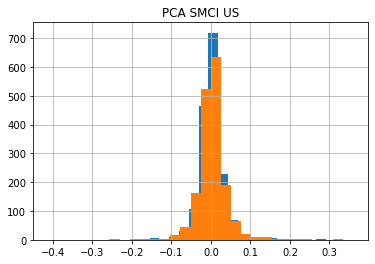

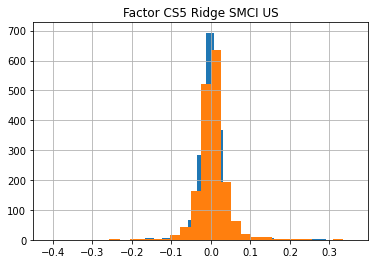

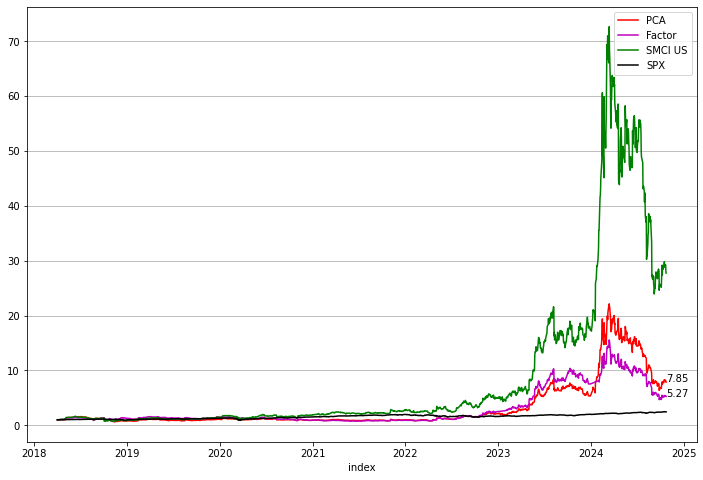

SMCI US PCA IR: 5.023
SMCI US cs5 Ridge IR: 4.603


In [327]:
# PCA DRAFTS

x = open_df('pca_idio_returns')
y = open_df('idio_returns_ridge_cs5')
t = input('Enter algo ticker: ').upper()

if (t in y.columns):
    x[t].hist(bins = 30)
    Pxs_df.loc[x.index][t].pct_change().dropna().hist(bins = 30)
    plt.title('PCA ' + t)
    plt.show()
    y[t].hist(bins = 30)
    Pxs_df.loc[x.index][t].pct_change().dropna().hist(bins = 30)
    plt.title('Factor CS5 Ridge ' + t)
    plt.show()
    
    Rx = (x[t].dropna() + 1).expanding().apply(np.prod)
    Ry = (y[t].dropna() + 1).expanding().apply(np.prod)
    Rx.plot(figsize = (12, 8), c = 'r', label = 'PCA')
    Ry.plot(c = 'm', label = 'Factor')
    (Pxs_df[t].loc[x[t].dropna().index] / Pxs_df[t].loc[x[t].dropna().index[0]]).plot(c = 'g')
    (Pxs_df['SPX'].loc[x[t].dropna().index] / Pxs_df['SPX'].loc[x[t].dropna().index[0]]).plot(c = 'k').legend(loc = 'best')
    plt.text(x.index[-1], Rx.iloc[-1], str(round(Rx.iloc[-1], 2)))
    plt.text(y.index[-1], Ry.iloc[-1], str(round(Ry.iloc[-1], 2)))
    plt.grid(axis = 'y')
    plt.show()

    pcaIR = round(100 * x[t].mean() / x[t].std(), 3)
    cs5RIR = round(100 * y[t].mean() / y[t].std(), 3)

    print(t + ' PCA IR: ' + str(pcaIR))
    print(t + ' cs5 Ridge IR: ' + str(cs5RIR))

Enter Start Date (empty for 1st available or YY/MM/DD): 
Override portfolio (Y/y or empty)? 
23Oct24 - 23Oct24
Fundamentals date: 17-Oct-2024
23/Oct/2024-23/Oct/2024:
index
LLY US      5.58
POWL US     5.58
NVDA US     5.58
FSLR US     5.58
NEM US      5.58
HOLX US     5.58
FCX US      5.51
EXEL US     5.25
CRWD US     4.92
VEEV US     4.89
GOOGL US    4.89
TER US      4.78
CMG US      4.73
HALO US     4.70
ANET US     4.70
NFLX US     4.66
FLS US      4.48
DUOL US     4.46
ADBE US     4.33
ELF US      4.24
Name: Alloc, dtype: float64


Save portfolio files? (Y/y or empty) y
[*********************100%***********************]  26 of 26 completed


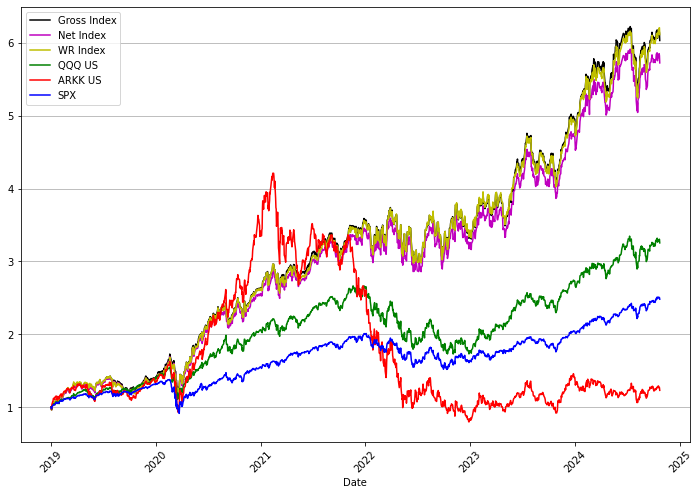


Average F Daily Turnover (%): 4.02
Total F Costs (%): 12.2
Average F Annual Costs (%): 2.03
Average WR Daily Turnover (%): 3.12
Total WR Costs (%): 9.45
Average WR Annual Costs (%): 1.57

23-Oct-2024 DAILY Summary - DR:
         CPort PPort Trade  P Al Daily  LD Ct  LC Pxs  RT Pxs    RT  RT Ct
LLY US    5.58  5.63 -0.05  5.58 -0.72  -0.04  902.85  903.25  0.04    0.0
POWL US   5.58  5.42  0.16  5.58 -4.46  -0.25  255.17  255.17  -0.0   -0.0
NVDA US   5.58  5.51  0.07  5.58 -2.81  -0.16  139.56  139.56  -0.0   -0.0
FSLR US   5.58  5.42  0.16  5.58 -4.46  -0.25  192.41  192.41   0.0    0.0
NEM US    5.58  5.58   0.0  5.58 -1.59  -0.09   57.75   57.74 -0.01   -0.0
HOLX US   5.58  5.66 -0.08  5.58 -0.28  -0.02   81.35   81.35  -0.0   -0.0
FCX US    5.51  5.54 -0.03  5.51 -1.25  -0.07   47.92   47.92 -0.01   -0.0
EXEL US   5.25  5.24  0.01  5.25 -1.77  -0.09   28.32   28.32  -0.0   -0.0
CRWD US   4.92  4.86  0.06  4.92 -2.99  -0.15   299.3   299.3  -0.0   -0.0
VEEV US   4.89  4.93 -0.04  4


DR Idio 23-Oct-24: -75.8
WR Idio 23-Oct-24: -60.8



,WR Betas,DR Betas,DR-D0 P&L (bps),WR-D0 P&L (bps)
Ideal,1.23,1.23,-6.29,-6.29
Market,1.0,1.0,-73.52,-73.52
M2MP Velocity,0.52,0.52,-1.57,-1.57
Beta,0.37,0.37,-19.92,-19.92
US10YR RR,0.32,0.32,0.65,0.65
Momentum,0.3,0.3,4.03,4.03
VIX,0.23,0.23,3.22,3.22
Value,0.11,0.11,1.97,1.97
Pharmaceuticals,0.09,0.09,-2.82,-2.82
Hardware,0.04,0.04,3.09,3.09


In [244]:
# SIMPLE CUSTOM ALGO

def get_predictors(c_date, exclusion_l):
    
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True            
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100  
    exclusion_l = [t for t in exclusion_l if t in pred_df.index]
    pred_df = pred_df.drop(exclusion_l)
    
    return pred_df, c_date

def select_port(pred_df):
    
    field_l = ['GS', 'GGP', 'GE', 'G', 'G Vol', 'G r2', 'E Vol', 'S Vol', 'OM', 'OMp', 'ROIp', 'ROIdp', 'Alloc']
    sc_df = pd.DataFrame(np.nan, index = pred_df.index, columns = field_l)
    sc_df['GS'] = pred_df['GS']
    sc_df['GGP'] = pred_df['GGP']
    sc_df['GE'] = pred_df['GE']
    sc_df['G'] = pred_df[['GE','GGP', 'GS']].min(axis = 1)
    sc_df['G Vol'] = pred_df[['GE','GGP', 'GS']].std(axis = 1)
    sc_df['G r2'] = pred_df[['r2 S', 'r2 GP', 'r2 E']].mean(axis = 1)
    sc_df['E Vol'] = pred_df['E Vol'].map(lambda x: max(1, x / 100))
    sc_df['S Vol'] = pred_df['S Vol'].map(lambda x: max(1, x / 100))
    sc_df['OM'] = pred_df['OM-t0'].map(lambda x: min(x, 60))
    sc_df['OMp'] = pred_df['OMd'].map(lambda x: min(x, 0))
    sc_df['ROIp'] = pred_df['ROI-P'].map(lambda x: min(x, 0))
    sc_df['ROIdp'] = pred_df['ROId'].map(lambda x: min(x, 0))
    sc_df['G r2'] = sc_df['G r2'].replace({-np.inf: 1})

    port_s = (25 * sc_df['G'] * (sc_df['G r2'] ** 5) / sc_df['E Vol'] / sc_df['S Vol'] + 
              5 * sc_df['OM'] + 50 * sc_df['OMp'] + 50 * sc_df['ROIp'] + 50 * sc_df['ROIdp'])    
    
    return port_s

Pxs_df = open_df('prices_relation')
Pxs_df = Pxs_df.sort_index()
st_dt = datetime(2019, 1, 1).date()
st_dt = Pxs_df[Pxs_df.index >= st_dt].index[0]
end_dt = Pxs_df.index[-1]
hl = 126
port_size = 20
feature_l = ['GE','GGP', 'GS', 'r2 S', 'r2 GP', 'r2 E', 'E Vol', 'S Vol', 'OM-t0', 'OMd', 'ROI-P', 'ROId']

STdt_str = input('Enter Start Date (empty for 1st available or YY/MM/DD): ')
firstS_dt = False
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = Pxs_df.index[-1]
    firstS_dt = True
end_date = Pxs_df.index[-1]


st_date = Pxs_df[Pxs_df.index >= st_date].index[0]
try:
    selectionN_df = open_df('ideal_stock_selection')
    selectionA_df = open_df('ideal_stock_allocations')
    if (firstS_dt):
        st_date = selectionN_df.index[0]
    oss = input('Override portfolio (Y/y or empty)? ').upper()
    if (oss == 'Y'):
        selectionN_df = pd.DataFrame(np.nan, index = [st_date], columns = np.arange(port_size) + 1)
        selectionA_df = pd.DataFrame(np.nan, index = [st_date], columns = np.arange(port_size) + 1)         
except:
    selectionN_df = pd.DataFrame(np.nan, index = [st_date], columns = np.arange(port_size) + 1)
    selectionA_df = pd.DataFrame(np.nan, index = [st_date], columns = np.arange(port_size) + 1)  

Index_s = pd.Series(1, index = [st_date])
Index_s.name = 'Idio'

period_st = st_date
if (selectionN_df.dropna(how = 'all').shape[0] > 0):
    period_st = Pxs_df[Pxs_df.index >= selectionN_df.dropna(how = 'all').index[-1]].index[0]
    
keep_loop = True
while (keep_loop):       
#   period_end = datetime(period_st.year + (period_st.month // 12), (period_st.month % 12) + 1, period_st.day).date()
    period_end = period_st + timedelta(1)
    period_end = min(period_end, end_dt)
    period_end = Pxs_df[Pxs_df.index >= period_end].index[0]    
    if (period_st not in selectionN_df.dropna(how = 'all').index):
        print(period_st.strftime('%d%b%y') + ' - ' + period_end.strftime('%d%b%y'))
        valid_start = False
        pred_dt = period_st
        while (not valid_start):
            pred_df, c_date = get_predictors(pred_dt, exclusion_l)
            exc_ffields = [f for f in feature_l if f not in pred_df.columns]
            if (len(exc_ffields) == 0):
                valid_start = True
                print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
            else:
                pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]        

        pred_df = fix_na(pred_df, 'GS', 'GE')

        valid_t = [t for t in pred_df.index if t in Pxs_df.columns]
        pred_df = pred_df.loc[valid_t]    
        port_s = select_port(pred_df)
        port_s.name = 'Alloc'

        conservative_df = pd.DataFrame(winsorize(port_s, 0.025, 0.99).dropna().sort_values(ascending = False)[:20]) 
        conservative_df /= conservative_df.sum()
        conservative_df['Period P&L'] = conservative_df.index.map(lambda x: round(100 * (Pxs_df.loc[period_end, x] / Pxs_df.loc[period_st, x] - 1), 2))

        print(period_st.strftime('%d/%b/%Y') + '-' + period_end.strftime('%d/%b/%Y') + ':')
        print(round(100 * conservative_df['Alloc'], 2))
        print('')

        selectionN_df.loc[period_st] = conservative_df.index.values
        selectionA_df.loc[period_st] = conservative_df['Alloc'].values 

    if (period_st == end_date):
        keep_loop = False
    period_st = period_end
    
print('')
save_p = input('Save portfolio files? (Y/y or empty) ').upper()
if (save_p == 'Y'):
    selectionN_df.to_sql('ideal_stock_selection', engine, index = True, if_exists = 'replace')
    selectionA_df.to_sql('ideal_stock_allocations', engine, index = True, if_exists = 'replace')

perfSummary_df, DRtrade_df, WRtrade_df = rebalancing(selectionN_df, selectionA_df)

qqq_s = Pxs_df[Pxs_df.index >= selectionN_df.index[0]]['QQQ US']
qqq_s /= qqq_s.iloc[0]
spx_s = Pxs_df[Pxs_df.index >= selectionN_df.index[0]]['SPX']
spx_s /= spx_s.iloc[0]
arkk_s = Pxs_df[Pxs_df.index >= selectionN_df.index[0]]['ARKK US']
arkk_s /= arkk_s.iloc[0]    
    
perfSummary_df['Gross Index'].plot(figsize = (12, 8), c = 'k')
perfSummary_df['Net Index'].plot(c = 'm')
perfSummary_df['WR Index'].plot(c = 'y')
(qqq_s / qqq_s.iloc[0]).plot(c = 'g')
(arkk_s / arkk_s.iloc[0]).plot(c = 'r')
(spx_s / spx_s.iloc[0]).plot(c = 'b').legend(loc = 'best')
plt.grid(axis = 'y')
plt.xticks(rotation = 45)
plt.show()   

avg_turnover = round(perfSummary_df['Port Turnover (%)'].mean(), 2)
ttl_costs = round(perfSummary_df['TCost (%)'].sum(), 2)
wr_avg_turnover = round(perfSummary_df['WR PT (%)'].mean(), 2)
wr_ttl_costs = round(perfSummary_df['WR TC (%)'].sum(), 2)
print('')
print('Average F Daily Turnover (%): ' + str(avg_turnover))
print('Total F Costs (%): ' + str(ttl_costs))
print('Average F Annual Costs (%): ' + str(round(252 * ttl_costs / perfSummary_df.shape[0], 2)))
print('Average WR Daily Turnover (%): ' + str(wr_avg_turnover))
print('Total WR Costs (%): ' + str(wr_ttl_costs))
print('Average WR Annual Costs (%): ' + str(round(252 * wr_ttl_costs / perfSummary_df.shape[0], 2)))
print('')
print(period_st.strftime('%d-%b-%Y') + ' DAILY Summary - DR:')
print(DRtrade_df)
print('')
print(period_st.strftime('%d-%b-%Y') + ' DAILY Summary - WR:')
print(WRtrade_df)
print('')
print(period_st.strftime('%d-%b-%Y') + ' DRG Daily P&L: ' + 
      str(round(100 * (perfSummary_df['Gross Index'].iloc[-1] / perfSummary_df['Gross Index'].iloc[-2] - 1), 2)))
print(period_st.strftime('%d-%b-%Y') + ' DRN Daily P&L: ' + 
      str(round(100 * (perfSummary_df['Net Index'].iloc[-1] / perfSummary_df['Net Index'].iloc[-2] - 1), 2)))
print(period_st.strftime('%d-%b-%Y') + ' WR Daily P&L: ' + 
      str(round(100 * (perfSummary_df['WR Index'].iloc[-1] / perfSummary_df['WR Index'].iloc[-2] - 1), 2)))
print(period_st.strftime('%d-%b-%Y') + ' SPX Daily P&L: ' + str(round(100 * (spx_s.iloc[-1] / spx_s.iloc[-2] - 1), 2)))
print(period_st.strftime('%d-%b-%Y') + ' QQQ Daily P&L: ' + str(round(100 * (qqq_s.iloc[-1] / qqq_s.iloc[-2] - 1), 2)))
print(period_st.strftime('%d-%b-%Y') + ' ARKK Daily P&L: ' + str(round(100 * (arkk_s.iloc[-1] / arkk_s.iloc[-2] - 1), 2)))
print('')

SummaryP_df = perfSummary_df[['Gross Index', 'Net Index', 'WR Index']].join(qqq_s).join(spx_s).join(arkk_s)
annual_reports(SummaryP_df, 'SPX')

Check_s = round(100 * Pxs_df[-long_w:][pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
SBweights_s = np.log(pred_df['Size'])
sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
zeroVol_l = Check_s[Check_s == 0].index.tolist()
excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
pred_df = pred_df.drop(excall_l)
asset_l = pred_df.index.tolist()
FlatWeights_s = pd.Series(1, index = pred_df.index)

MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]

featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
featuresC_df = predictors_to_Cfeatures(pred_df, c_features_l, sector_s)
featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
XSStyleLoadings_df = featuresP_df.join(featuresC_df)

# FACTOR ORTHOGONALIZATION

sBetas_s = featuresP_df['Beta']
FactorLoadings_df = pd.DataFrame(sBetas_s)

sIdeal_s = featuresC_df['Ideal']
FactorLoadings_df[sIdeal_s.name] = othogonalize(FactorLoadings_df, sIdeal_s)    

XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
for c_sector in sector_l:
    stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
    XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())
sectorR_l = sector_l.copy()
sectorR_l.remove(sacr_sector)
for c_sector in sectorR_l:
    FactorLoadings_df[c_sector] = othogonalize(FactorLoadings_df, XSSectorLoadings_df[c_sector]).values        

sSize_s = featuresC_df['Size']
FactorLoadings_df[sSize_s.name] = othogonalize(FactorLoadings_df, sSize_s)

for c_Sfeat in XSStyleLoadings_df.columns:
    if (c_Sfeat not in FactorLoadings_df.columns):
        FactorLoadings_df[c_Sfeat] = othogonalize(FactorLoadings_df, XSStyleLoadings_df[c_Sfeat]).values

for c_Mfeat in m_features_l:
    FactorLoadings_df[c_Mfeat] = othogonalize(FactorLoadings_df, featuresM_df[c_Mfeat]).values

FactorLoadings_df['Market'] = 1
FactorLoadings_df[sacr_sector] = XSSectorLoadings_df[sacr_sector]
ALLfeatures_df = FactorLoadings_df.copy()

DRbetas_s = (ALLfeatures_df.loc[DRtrade_df[DRtrade_df.index.map(lambda x: x.find('Total')) == -1].index].T * 
             DRtrade_df[DRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'] / 
             DRtrade_df[DRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'].sum()).T.sum().sort_values(ascending = False).map(lambda x: round(x, 2))

WRbetas_s = (ALLfeatures_df.loc[WRtrade_df[WRtrade_df.index.map(lambda x: x.find('Total')) == -1].index].T * 
             WRtrade_df[WRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'] / 
             WRtrade_df[WRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'].sum()).T.sum().sort_values(ascending = False).map(lambda x: round(x, 2))

All_df = pd.DataFrame(WRbetas_s.values, index = WRbetas_s.index, columns = ['WR Betas'])
All_df['DR Betas'] = DRbetas_s
All_df['DR-D0 P&L (bps)'] = round(10000 * DRbetas_s * FactRets_df.iloc[-1], 2)
All_df['WR-D0 P&L (bps)'] = round(10000 * WRbetas_s * FactRets_df.iloc[-1], 2)
All_df.loc['Total'] = ''
All_df.loc['Total', 'DR-D0 P&L (bps)'] = round(10000 * (DRbetas_s * FactRets_df.iloc[-1]).sum(), 2)
All_df.loc['Total', 'WR-D0 P&L (bps)'] = round(10000 * (WRbetas_s * FactRets_df.iloc[-1]).sum(), 2)

DRIdio = round(DRtrade_df.loc['Total', 'LD Ct'] * 100 - All_df.loc['Total', 'DR-D0 P&L (bps)'], 2)
WRIdio = round(WRtrade_df.loc['Total', 'LD Ct'] * 100 - All_df.loc['Total', 'WR-D0 P&L (bps)'], 2)
print('')
print('DR Idio ' + period_st.strftime('%d-%b-%y') + ': ' + str(DRIdio))
print('WR Idio ' + period_st.strftime('%d-%b-%y') + ': ' + str(WRIdio))
print('')
All_df

Custom Sector 5

Enter Start Date (empty for 1st available or YY/MM/DD): 19/01/01
Enter End Date (empty for last or YY/MM/DD): 
Override portfolio (Y/y or empty)? Y
02-Jan-19
Fundamentals date: 01-Jan-2019
PCA dt: 02-Jan-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.81  28.88  14.33  20.32  1.54  1.53  1.70  1.55  3.11
2    1.0    3.0   3.88  24.81   7.98  10.94  2.55  2.53  2.66  2.56  5.10
3    1.0    5.0   4.56  23.59   6.64   6.72  3.38  3.37  3.48  3.39  6.78
4    3.0    1.0   3.87  26.68  11.35  16.49  2.01  2.00  2.15  2.03  4.04
5    3.0    3.0   4.06  23.94   7.19   9.14  2.84  2.82  2.93  2.84  5.68
6    3.0    5.0   4.57  22.94   6.60   6.61  3.42  3.40  3.51  3.44  6.85
7    5.0    1.0   3.86  25.74   9.26  12.97  2.33  2.32  2.45  2.34  4.68
8    5.0    3.0   4.16  23.78   6.93   8.10  2.98  2.96  3.08  2.98  5.96
9    5.0    5.0   4.53  22.56   6.37   6.29  3.43  3.41  3.52  3.44  6.86

fGP failed for NWSA US
         I

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.68  21.30  11.73  8.32  3.67  3.66  3.72  3.68  7.34
2    1.0    3.0   5.55  20.19  10.43  6.56  3.84  3.83  3.89  3.85  7.69
3    1.0    5.0   5.52  19.87  10.11  6.08  3.89  3.88  3.94  3.90  7.79
4    3.0    1.0   6.06  22.61  14.01  9.77  3.54  3.53  3.61  3.57  7.09
5    3.0    3.0   5.68  21.30  11.73  8.34  3.67  3.66  3.72  3.68  7.34
6    3.0    5.0   5.60  20.92  11.03  7.39  3.75  3.74  3.81  3.76  7.51
7    5.0    1.0   6.19  23.16  14.46  9.96  3.53  3.53  3.61  3.56  7.09
8    5.0    3.0   5.84  21.75  12.72  9.13  3.60  3.59  3.67  3.62  7.22
9    5.0    5.0   5.67  21.29  11.70  8.32  3.67  3.66  3.73  3.69  7.34

fGP failed for NWSA US
MeanR error for WLTW US
fGP failed for UAL US
fGP failed for PNC US
fGP failed for OMC US
fGP failed for V US
fGP failed for TTD US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LLY US     0.0  0.0   3.50   4.05  7.55 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.49  21.32  11.22  12.68  3.37  3.37  3.38  3.38  6.74
2    1.0    3.0   5.04  19.94   8.39   8.25  3.61  3.61  3.61  3.62  7.22
3    1.0    5.0   4.94  19.11   7.70   6.48  3.71  3.71  3.70  3.71  7.41
4    3.0    1.0   5.46  23.72  14.51  17.75  2.66  2.66  2.68  2.67  5.33
5    3.0    3.0   5.49  21.33  11.21  12.69  3.37  3.37  3.38  3.38  6.75
6    3.0    5.0   5.25  20.10   9.57  10.25  3.54  3.54  3.54  3.55  7.08
7    5.0    1.0   5.38  25.04  15.92  20.03  2.32  2.32  2.35  2.34  4.65
8    5.0    3.0   5.66  22.65  12.69  14.96  3.16  3.16  3.17  3.17  6.32
9    5.0    5.0   5.49  21.32  11.20  12.67  3.38  3.37  3.38  3.39  6.75

MeanR error for WLTW US
fGP failed for PPL US
fGP failed for UAL US
fGP failed for OMC US
fGP failed for TTD US
fGP failed for V US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
WM US      0.0  0.0   4.73   3.12  7.86  10.00   0.84

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.60  21.74   7.77   8.96  4.04  4.04  4.03  4.04  8.07
2    1.0    3.0   5.47  20.21   6.18   7.21  4.24  4.24  4.22  4.25  8.46
3    1.0    5.0   5.48  19.80   5.68   6.10  4.36  4.36  4.35  4.38  8.71
4    3.0    1.0   5.48  23.33   9.26  10.82  3.64  3.64  3.65  3.65  7.29
5    3.0    3.0   5.62  21.73   7.77   8.96  4.04  4.05  4.04  4.05  8.09
6    3.0    5.0   5.50  20.75   6.70   7.90  4.15  4.15  4.14  4.16  8.29
7    5.0    1.0   5.22  24.54  10.02  11.84  3.29  3.30  3.32  3.31  6.60
8    5.0    3.0   5.76  22.13   8.65  10.00  3.98  3.98  3.98  3.99  7.97
9    5.0    5.0   5.62  21.73   7.77   8.97  4.05  4.05  4.05  4.06  8.09

MeanR error for WLTW US
fGP failed for PPL US
fGP failed for UNP US
fGP failed for OMC US
fGP failed for NSC US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LLY US     0.0  0.0   3.98   4.65  8.14  10.00   0.00    3.16  Pharmaceut

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.09  18.98   5.42  5.27  4.11  4.11  4.13  4.11  8.22
2    1.0    3.0   5.26  18.45   5.28  5.43  4.27  4.27  4.29  4.28  8.55
3    1.0    5.0   5.28  18.59   5.59  5.43  4.25  4.25  4.27  4.25  8.51
4    3.0    1.0   4.73  20.51   6.65  6.65  3.60  3.60  3.64  3.60  7.21
5    3.0    3.0   5.09  18.98   5.42  5.28  4.11  4.11  4.13  4.12  8.23
6    3.0    5.0   5.20  18.50   5.36  5.38  4.21  4.21  4.23  4.22  8.43
7    5.0    1.0   4.60  21.27   7.03  6.69  3.44  3.44  3.49  3.45  6.90
8    5.0    3.0   4.93  19.69   6.18  5.63  3.87  3.88  3.90  3.88  7.76
9    5.0    5.0   5.09  18.98   5.42  5.27  4.11  4.11  4.13  4.11  8.22

MeanR error for WLTW US
fGP failed for OMC US
fGP failed for UNP US
fGP failed for NSC US
fGP failed for PPL US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   3.63   3.88  7.51   9.99   0.00   16.36  Electrical
WM US    

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.68  21.32   7.89  7.93  4.90  4.91  4.91  4.92  9.82
2    1.0    3.0   6.65  20.79   7.50  7.28  4.98  4.99  4.99  4.99  9.97
3    1.0    5.0   6.33  20.05   7.31  6.69  4.81  4.81  4.81  4.82  9.62
4    3.0    1.0   6.32  22.37   8.55  8.86  4.46  4.47  4.47  4.47  8.93
5    3.0    3.0   6.67  21.32   7.88  7.94  4.89  4.90  4.90  4.91  9.79
6    3.0    5.0   6.72  21.02   7.66  7.66  4.98  4.99  4.99  5.00  9.97
7    5.0    1.0   6.14  23.71   9.06  9.40  4.21  4.22  4.23  4.22  8.43
8    5.0    3.0   6.53  22.10   8.22  8.69  4.68  4.69  4.69  4.69  9.36
9    5.0    5.0   6.67  21.32   7.86  7.93  4.89  4.90  4.90  4.91  9.80

MeanR error for WLTW US
fGP failed for OMC US
fGP failed for UNP US
fGP failed for NSC US
fGP failed for PPL US
fGP failed for TTD US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   4.16   4.15  8.31  10.00   0.00   14.44

PCA dt: 18-Jan-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.64  22.28   9.27  14.10  4.25  4.26  4.28  4.27  8.52
2    1.0    3.0   6.86  21.94   7.40  12.54  4.77  4.78  4.79  4.80  9.56
3    1.0    5.0   6.92  22.02   6.92  12.06  4.92  4.93  4.94  4.94  9.85
4    3.0    1.0   6.37  22.16  11.26  14.87  3.77  3.78  3.79  3.79  7.56
5    3.0    3.0   6.62  22.29   9.27  14.07  4.24  4.25  4.27  4.26  8.50
6    3.0    5.0   6.74  22.34   8.31  13.45  4.49  4.50  4.51  4.51  9.00
7    5.0    1.0   6.28  23.00  12.28  15.44  3.53  3.54  3.57  3.55  7.08
8    5.0    3.0   6.49  22.41  10.38  14.58  3.98  3.99  4.00  4.00  7.97
9    5.0    5.0   6.62  22.30   9.29  14.10  4.24  4.25  4.27  4.26  8.50

MeanR error for WLTW US
fGP failed for UNP US
fGP failed for NSC US
fGP failed for PPL US
fGP failed for MTB US
fGP failed for TTD US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LLY US     0.0  0.0   4.15   4.

Fundamentals date: 08-Jan-2019
PCA dt: 22-Jan-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.30  22.71  11.32  11.15  3.28  3.30  3.30  3.31  6.58
2    1.0    3.0   5.50  22.07   8.04   8.69  3.93  3.94  3.94  3.95  7.87
3    1.0    5.0   5.66  21.25   7.02   8.13  4.21  4.22  4.22  4.23  8.43
4    3.0    1.0   5.43  24.32  14.17  13.80  2.88  2.89  2.92  2.91  5.77
5    3.0    3.0   5.28  22.69  11.30  11.10  3.28  3.29  3.30  3.30  6.57
6    3.0    5.0   5.34  22.38   9.58   9.60  3.58  3.60  3.60  3.61  7.18
7    5.0    1.0   5.48  24.99  14.95  14.87  2.75  2.77  2.79  2.78  5.52
8    5.0    3.0   5.37  23.21  12.63  12.40  3.11  3.12  3.13  3.13  6.23
9    5.0    5.0   5.29  22.70  11.35  11.15  3.27  3.29  3.29  3.29  6.56

MeanR error for WLTW US
fGP failed for UNP US
fGP failed for NSC US
fGP failed for PPL US
fGP failed for TTD US
fGP failed for OMC US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector


Fundamentals date: 08-Jan-2019
PCA dt: 24-Jan-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.84  22.58  13.20  12.95  2.72  2.73  2.73  2.72  5.44
2    1.0    3.0   4.82  22.40  12.63  12.39  2.79  2.80  2.81  2.80  5.59
3    1.0    5.0   4.85  22.47  12.64  12.39  2.80  2.82  2.82  2.82  5.62
4    3.0    1.0   5.00  24.08  16.43  15.67  2.31  2.33  2.35  2.34  4.65
5    3.0    3.0   4.84  22.97  13.34  12.93  2.69  2.71  2.71  2.71  5.40
6    3.0    5.0   4.79  22.90  12.15  11.99  2.82  2.83  2.84  2.83  5.65
7    5.0    1.0   5.05  24.95  17.32  16.47  2.18  2.20  2.23  2.21  4.39
8    5.0    3.0   4.92  23.55  15.00  14.18  2.50  2.52  2.53  2.52  5.02
9    5.0    5.0   4.84  22.96  13.32  12.92  2.70  2.71  2.72  2.71  5.41

MeanR error for WLTW US
fGP failed for UNP US
fGP failed for PPL US
fGP failed for NSC US
fGP failed for MTB US
fGP failed for TTD US
fGP failed for ZION US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc    V

Fundamentals date: 08-Jan-2019
PCA dt: 28-Jan-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.94  22.60  13.36  12.91  2.76  2.77  2.77  2.78  5.54
2    1.0    3.0   4.62  21.12  10.08   9.10  3.08  3.09  3.08  3.09  6.16
3    1.0    5.0   4.67  21.00   8.69   8.28  3.29  3.29  3.28  3.30  6.57
4    3.0    1.0   5.24  24.19  16.10  15.85  2.46  2.48  2.49  2.49  4.94
5    3.0    3.0   4.96  22.62  13.49  13.02  2.75  2.76  2.76  2.77  5.52
6    3.0    5.0   4.76  22.13  11.77  11.07  2.90  2.91  2.91  2.91  5.81
7    5.0    1.0   5.21  24.54  16.02  16.14  2.43  2.45  2.47  2.46  4.88
8    5.0    3.0   5.16  23.23  15.18  14.62  2.60  2.62  2.62  2.62  5.22
9    5.0    5.0   4.95  22.61  13.45  12.99  2.76  2.77  2.77  2.78  5.53

fGP failed for PPL US
MeanR error for WLTW US
fGP failed for UNP US
fGP failed for MTB US
fGP failed for TTD US
fGP failed for ZION US
fGP failed for OMC US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc    V

Fundamentals date: 08-Jan-2019
PCA dt: 30-Jan-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.99  21.30  10.87  10.54  3.19  3.19  3.20  3.20  6.38
2    1.0    3.0   5.15  20.72   8.05   8.17  3.72  3.72  3.73  3.73  7.44
3    1.0    5.0   5.36  20.46   7.45   7.77  3.96  3.97  3.97  3.98  7.93
4    3.0    1.0   5.27  23.28  13.84  14.78  2.79  2.80  2.83  2.82  5.61
5    3.0    3.0   4.98  21.29  10.84  10.50  3.18  3.19  3.20  3.20  6.37
6    3.0    5.0   4.95  20.80   9.37   8.98  3.39  3.40  3.41  3.41  6.80
7    5.0    1.0   5.36  24.05  14.92  16.39  2.63  2.64  2.67  2.66  5.27
8    5.0    3.0   5.13  22.74  12.32  12.73  2.99  2.99  3.01  3.01  5.99
9    5.0    5.0   4.98  21.28  10.79  10.46  3.19  3.19  3.20  3.21  6.39

MeanR error for WLTW US
fGP failed for PPL US
fGP failed for UNP US
fGP failed for OMC US
fGP failed for MTB US
fGP failed for NSC US
fGP failed for TTD US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc    VA

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.42  21.23  11.48   4.95  2.99  3.01  3.00  2.99  5.99
2    1.0    3.0   4.59  21.06  10.89   4.75  3.18  3.20  3.18  3.18  6.37
3    1.0    5.0   4.74  21.23  11.19   4.74  3.26  3.28  3.26  3.26  6.52
4    3.0    1.0   4.50  23.61  14.16   8.97  2.57  2.60  2.60  2.59  5.16
5    3.0    3.0   4.40  21.22  11.38   4.92  2.99  3.01  2.99  2.99  5.99
6    3.0    5.0   4.45  21.00  10.80   4.62  3.09  3.11  3.09  3.09  6.18
7    5.0    1.0   4.57  24.09  15.06  11.61  2.40  2.43  2.44  2.42  4.82
8    5.0    3.0   4.44  22.57  12.97   6.51  2.78  2.80  2.79  2.79  5.56
9    5.0    5.0   4.41  21.23  11.43   4.93  2.99  3.01  2.99  2.99  5.98

fGP failed for PPL US
MeanR error for STNE US
MeanR error for VEEV US
fGP failed for NWSA US
fGP failed for UNP US
fGP failed for TTD US
fGP failed for OMC US
fGP failed for MTB US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc    VA  1M Fwd      Sector
MDLZ 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.40  20.86   7.22   7.39  3.25  3.27  3.26  3.27  6.52
2    1.0    3.0   5.63  20.11   5.17   7.58  4.45  4.46  4.45  4.46  8.90
3    1.0    5.0   6.17  19.76   4.87   8.12  4.90  4.91  4.90  4.91  9.80
4    3.0    1.0   4.28  22.77  11.62  16.50  2.35  2.37  2.37  2.37  4.71
5    3.0    3.0   4.42  20.86   7.21   7.41  3.26  3.28  3.27  3.28  6.54
6    3.0    5.0   4.94  20.04   5.94   6.81  3.85  3.86  3.84  3.86  7.70
7    5.0    1.0   4.60  23.52  13.56  22.72  2.05  2.08  2.09  2.08  4.13
8    5.0    3.0   4.12  21.65   9.01   9.97  2.76  2.78  2.77  2.78  5.54
9    5.0    5.0   4.42  20.86   7.20   7.43  3.26  3.28  3.27  3.28  6.54

fGP failed for NWSA US
fGP failed for PPL US
fGP failed for TTD US
fGP failed for UNP US
fGP failed for ZION US
fGP failed for LUV US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MMC US     0.0  0.0   2.38   3.96  6.34  10.00   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.43  21.09   6.82   8.30  3.27  3.29  3.27  3.28  6.54
2    1.0    3.0   5.18  20.26   5.04   9.69  3.98  4.00  3.98  3.98  7.96
3    1.0    5.0   5.49  20.70   4.81  10.53  4.20  4.22  4.20  4.20  8.40
4    3.0    1.0   4.19  21.76   8.58   7.74  2.94  2.97  2.95  2.95  5.89
5    3.0    3.0   4.45  21.08   6.79   8.36  3.28  3.30  3.28  3.29  6.56
6    3.0    5.0   4.77  20.46   5.75   9.06  3.61  3.63  3.60  3.61  7.22
7    5.0    1.0   4.20  22.24   9.30   9.06  2.82  2.84  2.83  2.84  5.65
8    5.0    3.0   4.23  21.32   7.80   7.82  3.04  3.07  3.04  3.05  6.09
9    5.0    5.0   4.45  21.10   6.82   8.38  3.27  3.30  3.28  3.29  6.56

fGP failed for NWSA US
fGP failed for PPL US
fGP failed for UNP US
fGP failed for ZION US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
XRAY US    0.0  0.0   2.57   3.52  6.08   9.29   0.00   13.30  Health Car
KEYS US    0.0  0.0  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.54  20.97   6.93   9.58  4.05  4.07  4.05  4.07  8.11
2    1.0    3.0   6.00  20.10   5.14  10.42  4.59  4.61  4.58  4.60  9.18
3    1.0    5.0   6.17  19.95   4.68  10.55  4.77  4.79  4.76  4.78  9.54
4    3.0    1.0   5.18  21.80   9.18   8.20  3.59  3.63  3.61  3.62  7.20
5    3.0    3.0   5.53  20.97   6.94   9.56  4.04  4.07  4.05  4.06  8.10
6    3.0    5.0   5.77  20.63   5.96  10.09  4.31  4.33  4.31  4.33  8.64
7    5.0    1.0   5.09  21.94   9.88   7.81  3.47  3.50  3.48  3.49  6.95
8    5.0    3.0   5.34  21.56   8.11   8.88  3.79  3.82  3.81  3.82  7.60
9    5.0    5.0   5.54  20.97   6.93   9.57  4.05  4.07  4.05  4.07  8.10

fGP failed for NWSA US
fGP failed for PPL US
fGP failed for UNP US
fGP failed for ZION US
fGP failed for NSC US
fGP failed for LUV US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   4.90   4.29  8.25   8.40   0.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.45  21.02   6.44  9.25  4.04  4.07  4.06  4.06  8.10
2    1.0    3.0   5.69  20.30   5.27  9.89  4.35  4.37  4.36  4.36  8.70
3    1.0    5.0   5.74  20.05   4.68  9.69  4.47  4.49  4.48  4.48  8.95
4    3.0    1.0   5.19  21.31   7.67  8.38  3.76  3.79  3.78  3.78  7.53
5    3.0    3.0   5.46  21.02   6.45  9.29  4.05  4.07  4.07  4.06  8.11
6    3.0    5.0   5.58  20.95   5.92  9.71  4.18  4.21  4.20  4.20  8.38
7    5.0    1.0   5.11  21.62   8.03  8.19  3.66  3.69  3.68  3.68  7.34
8    5.0    3.0   5.33  21.04   7.13  8.84  3.90  3.93  3.92  3.92  7.82
9    5.0    5.0   5.46  21.01   6.44  9.30  4.05  4.07  4.07  4.06  8.11

fGP failed for NWSA US
fGP failed for UNP US
fGP failed for NSC US
fGP failed for ZION US
fGP failed for MTB US
fGP failed for PPL US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   4.85   4.02  8.14   7.57   0.00    8.15

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.04  20.32   6.52  4.82  3.97  3.98  3.96  3.97  7.93
2    1.0    3.0   5.18  19.37   5.02  4.70  4.26  4.27  4.24  4.26  8.50
3    1.0    5.0   5.31  19.17   4.58  4.75  4.42  4.43  4.41  4.42  8.83
4    3.0    1.0   5.02  20.41   7.85  4.99  3.81  3.82  3.80  3.81  7.61
5    3.0    3.0   5.05  20.31   6.51  4.83  3.97  3.99  3.97  3.98  7.94
6    3.0    5.0   5.10  20.11   5.84  4.82  4.09  4.10  4.08  4.09  8.17
7    5.0    1.0   5.01  20.46   8.30  5.02  3.75  3.77  3.74  3.76  7.50
8    5.0    3.0   5.03  20.28   7.17  4.92  3.89  3.91  3.88  3.90  7.78
9    5.0    5.0   5.05  20.31   6.51  4.84  3.97  3.99  3.96  3.98  7.94

fGP failed for UNP US
fGP failed for NSC US
fGP failed for MTB US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ZNGA US    0.0  0.0   4.05   4.07  7.28   7.43   0.23    6.36  Consumer S
KMI US     0.0  0.0   3.66   2.87  6.53   6.58   0.00  

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.53  19.34   8.12  5.43  4.17  4.19  4.18  4.18  8.35
2    1.0    3.0   5.69  19.21   6.62  4.86  4.50  4.51  4.50  4.50  9.00
3    1.0    5.0   5.72  18.49   5.78  4.35  4.66  4.67  4.66  4.66  9.32
4    3.0    1.0   5.25  19.98   9.09  5.85  3.81  3.83  3.82  3.82  7.64
5    3.0    3.0   5.54  19.34   8.16  5.44  4.17  4.18  4.17  4.17  8.34
6    3.0    5.0   5.63  19.02   7.54  5.22  4.33  4.35  4.33  4.34  8.67
7    5.0    1.0   5.16  20.66   9.84  6.75  3.61  3.63  3.63  3.62  7.23
8    5.0    3.0   5.40  19.44   8.67  5.44  4.00  4.02  4.01  4.01  8.02
9    5.0    5.0   5.53  19.35   8.14  5.44  4.16  4.18  4.17  4.17  8.33

fGP failed for UNP US
fGP failed for NSC US
fGP failed for MTB US
fGP failed for TTD US
fGP failed for ZION US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ZEN US     0.0  0.0   3.63   2.91  6.54   8.06   0.31    7.62  Applicatio
ZNGA US   

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.11  18.48   7.89  4.14  3.94  3.95  3.95  3.93  7.87
2    1.0    3.0   5.16  17.81   5.76  3.29  4.26  4.28  4.26  4.25  8.51
3    1.0    5.0   5.19  17.73   5.41  3.06  4.34  4.35  4.34  4.32  8.66
4    3.0    1.0   5.21  18.72   9.23  4.92  3.84  3.85  3.85  3.83  7.68
5    3.0    3.0   5.11  18.48   7.93  4.12  3.94  3.96  3.95  3.93  7.88
6    3.0    5.0   5.14  18.36   7.05  3.87  4.07  4.08  4.07  4.05  8.12
7    5.0    1.0   5.23  18.76   9.50  5.11  3.82  3.83  3.82  3.81  7.63
8    5.0    3.0   5.13  18.43   8.62  4.43  3.87  3.89  3.88  3.86  7.73
9    5.0    5.0   5.11  18.48   7.92  4.12  3.94  3.96  3.95  3.93  7.88

fGP failed for UNP US
fGP failed for NSC US
fGP failed for MTB US
fGP failed for ZION US
fGP failed for ODFL US
fGP failed for PPL US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
XEL US     0.0  0.0   3.98   2.56  6.54   9.55   0.00    4.18

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.99  18.03   9.72  3.58  4.46  4.48  4.48  4.44  8.91
2    1.0    3.0   5.78  17.32   7.92  3.25  4.54  4.56  4.56  4.53  9.08
3    1.0    5.0   5.83  17.79   7.76  3.04  4.60  4.62  4.62  4.59  9.20
4    3.0    1.0   5.99  18.21  10.41  4.44  4.32  4.35  4.35  4.32  8.65
5    3.0    3.0   5.98  18.04   9.75  3.60  4.45  4.47  4.48  4.44  8.90
6    3.0    5.0   5.87  17.79   9.02  3.43  4.46  4.48  4.48  4.45  8.91
7    5.0    1.0   5.84  19.08  10.58  4.71  4.15  4.18  4.19  4.15  8.31
8    5.0    3.0   6.06  18.51  10.59  4.21  4.36  4.38  4.39  4.35  8.72
9    5.0    5.0   5.98  18.04   9.73  3.61  4.45  4.48  4.48  4.44  8.90

fGP failed for UNP US
fGP failed for TTD US
fGP failed for NSC US
fGP failed for ZION US
fGP failed for PPL US
fGP failed for ODFL US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
XEL US     0.0  0.0   4.61   3.24  7.85  10.00   0.00    4.84

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.09  18.79   6.79  3.21  4.07  4.10  4.09  4.06  8.14
2    1.0    3.0   5.39  18.60   7.02  3.03  4.31  4.34  4.33  4.30  8.62
3    1.0    5.0   5.50  18.79   7.05  2.93  4.41  4.43  4.42  4.39  8.80
4    3.0    1.0   4.91  19.27   7.20  3.92  3.84  3.87  3.86  3.85  7.70
5    3.0    3.0   5.10  18.78   6.75  3.21  4.08  4.11  4.10  4.07  8.16
6    3.0    5.0   5.23  18.65   6.90  3.16  4.19  4.21  4.20  4.18  8.37
7    5.0    1.0   4.91  19.27   7.18  4.09  3.84  3.86  3.85  3.84  7.69
8    5.0    3.0   4.99  18.57   6.80  3.25  3.99  4.02  4.01  3.99  7.99
9    5.0    5.0   5.10  18.78   6.75  3.22  4.09  4.11  4.10  4.08  8.17

fGP failed for UNP US
fGP failed for PPL US
fGP failed for TTD US
fGP failed for NSC US
fGP failed for ZION US
fGP failed for ODFL US
fGP failed for MCO US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KMI US     0.0  0.0   3.89   2.97  6.86

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.51  19.90   5.54  8.85  5.04  5.07  5.03  5.05  10.08
2    1.0    3.0   6.78  19.24   5.68  8.61  5.27  5.29  5.26  5.27  10.53
3    1.0    5.0   6.82  19.19   5.72  8.35  5.31  5.34  5.30  5.32  10.62
4    3.0    1.0   6.16  19.90   6.02  8.83  4.70  4.73  4.69  4.71   9.40
5    3.0    3.0   6.51  19.90   5.52  8.90  5.04  5.07  5.03  5.05  10.08
6    3.0    5.0   6.67  19.56   5.50  8.87  5.18  5.21  5.17  5.19  10.36
7    5.0    1.0   6.03  20.26   6.38  8.66  4.55  4.59  4.55  4.57   9.12
8    5.0    3.0   6.34  19.92   5.60  8.77  4.90  4.93  4.89  4.91   9.80
9    5.0    5.0   6.51  19.90   5.53  8.87  5.04  5.07  5.03  5.05  10.08

fGP failed for PPL US
fGP failed for UNP US
fGP failed for ZION US
fGP failed for MCO US
fGP failed for MTB US
fGP failed for NSC US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ZNGA US    0.0  0.0   4.29   4.24  8.53   7.73   0.0

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.92  18.90   4.94  7.30  4.74  4.77  4.76  4.74  9.49
2    1.0    3.0   5.97  18.88   4.88  7.01  4.80  4.83  4.82  4.80  9.61
3    1.0    5.0   6.02  18.89   4.84  7.07  4.84  4.87  4.87  4.85  9.70
4    3.0    1.0   5.93  18.79   5.17  7.67  4.70  4.72  4.72  4.70  9.41
5    3.0    3.0   5.92  18.93   4.95  7.33  4.74  4.76  4.76  4.74  9.48
6    3.0    5.0   5.90  19.03   4.84  7.06  4.75  4.78  4.77  4.75  9.51
7    5.0    1.0   5.90  18.79   5.34  7.70  4.65  4.68  4.67  4.66  9.32
8    5.0    3.0   5.93  18.87   5.03  7.50  4.72  4.75  4.74  4.73  9.46
9    5.0    5.0   5.92  18.93   4.95  7.32  4.73  4.76  4.75  4.74  9.48

fGP failed for PPL US
fGP failed for UNP US
fGP failed for NSC US
fGP failed for ZION US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KMI US     0.0  0.0   4.45   3.88  8.33   9.83   0.00   -0.40      Energy
ZNGA US    0.0  0.0   3.78   4.2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   7.44  19.17   5.28  12.57  5.56  5.58  5.57  5.57  11.12
2    1.0    3.0   7.10  18.77   5.13  11.60  5.39  5.41  5.40  5.40  10.79
3    1.0    5.0   6.94  18.88   5.09  11.06  5.31  5.33  5.32  5.31  10.62
4    3.0    1.0   7.53  18.85   5.32  12.79  5.60  5.63  5.62  5.61  11.22
5    3.0    3.0   7.46  19.15   5.26  12.62  5.57  5.59  5.58  5.58  11.15
6    3.0    5.0   7.30  18.77   5.21  12.13  5.49  5.52  5.51  5.50  11.00
7    5.0    1.0   7.49  19.05   5.40  12.71  5.57  5.59  5.59  5.58  11.15
8    5.0    3.0   7.55  18.92   5.34  12.83  5.61  5.63  5.62  5.62  11.23
9    5.0    5.0   7.46  19.16   5.27  12.62  5.57  5.59  5.58  5.58  11.15

fGP failed for PPL US
fGP failed for UNP US
fGP failed for NSC US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KMI US     0.0  0.0   5.18   4.49   9.67   9.55   0.00    1.06      Energy
KEYS US    0.0  0.0   6.29   5.64

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   7.33  18.94   5.43  11.70  5.50  5.53  5.55  5.51  11.02
2    1.0    3.0   6.91  19.23   5.04  10.58  5.30  5.33  5.35  5.31  10.63
3    1.0    5.0   6.70  19.21   4.87   9.97  5.20  5.23  5.25  5.21  10.42
4    3.0    1.0   7.39  19.05   5.75  11.76  5.49  5.52  5.54  5.49  11.00
5    3.0    3.0   7.33  18.92   5.46  11.70  5.50  5.53  5.55  5.50  11.02
6    3.0    5.0   7.17  19.00   5.24  11.33  5.43  5.46  5.48  5.44  10.88
7    5.0    1.0   7.32  19.18   5.87  11.55  5.43  5.46  5.49  5.43  10.89
8    5.0    3.0   7.39  19.14   5.58  11.81  5.52  5.54  5.57  5.52  11.05
9    5.0    5.0   7.33  18.92   5.45  11.69  5.50  5.53  5.55  5.51  11.02

fGP failed for UNP US
fGP failed for PPL US
fGP failed for MCO US
fGP failed for NSC US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KMI US     0.0  0.0   5.31   4.62   9.93  10.00   0.00   -0.05      Energy
KEYS US    

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.10  19.71   7.93  7.37  4.50  4.53  4.52  4.49  9.01
2    1.0    3.0   5.94  19.79   6.91  6.99  4.52  4.55  4.54  4.53  9.06
3    1.0    5.0   5.92  19.64   6.60  6.82  4.56  4.59  4.58  4.56  9.12
4    3.0    1.0   6.45  20.04   8.80  8.33  4.59  4.63  4.62  4.59  9.19
5    3.0    3.0   6.11  19.71   7.96  7.38  4.51  4.54  4.53  4.50  9.02
6    3.0    5.0   6.00  19.91   7.43  7.16  4.50  4.53  4.51  4.49  9.00
7    5.0    1.0   6.53  20.02   9.10  8.48  4.60  4.63  4.62  4.59  9.20
8    5.0    3.0   6.29  19.72   8.37  7.89  4.56  4.59  4.58  4.56  9.13
9    5.0    5.0   6.11  19.70   7.94  7.39  4.51  4.54  4.53  4.50  9.02

fGP failed for PPL US
fGP failed for UNP US
fGP failed for NSC US
fGP failed for MCO US
fGP failed for MTB US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
XEL US     0.0  0.0   4.93   3.43  8.37  10.00   0.00   -1.73   Utilities
KEYS US    

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.40  20.08   4.96  8.35  5.04  5.07  5.07  5.05  10.10
2    1.0    3.0   6.52  19.84   5.31  7.54  5.15  5.18  5.18  5.16  10.32
3    1.0    5.0   6.60  19.51   5.51  7.34  5.21  5.24  5.24  5.22  10.44
4    3.0    1.0   6.20  20.44   4.88  8.59  4.86  4.90  4.91  4.86   9.74
5    3.0    3.0   6.40  20.08   4.96  8.37  5.04  5.07  5.07  5.05  10.09
6    3.0    5.0   6.46  19.74   5.00  7.94  5.12  5.15  5.15  5.13  10.26
7    5.0    1.0   6.10  20.53   5.09  8.44  4.76  4.80  4.81  4.76   9.54
8    5.0    3.0   6.31  20.40   4.86  8.55  4.96  5.00  5.00  4.97   9.94
9    5.0    5.0   6.40  20.08   4.96  8.36  5.04  5.07  5.07  5.05  10.09

fGP failed for PPL US
fGP failed for MTB US
fGP failed for UNP US
fGP failed for MCO US
fGP failed for NSC US
fGP failed for V US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ZNGA US    0.0  0.0   4.54   4.43  8.98   9.43   0.08  

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.28  20.32   5.29  8.01  4.90  4.94  4.96  4.91   9.84
2    1.0    3.0   6.60  19.58   5.47  8.10  5.15  5.19  5.20  5.17  10.33
3    1.0    5.0   6.70  19.49   5.54  8.09  5.23  5.26  5.28  5.24  10.48
4    3.0    1.0   5.90  20.61   5.21  7.34  4.64  4.68  4.70  4.64   9.30
5    3.0    3.0   6.27  20.32   5.30  7.98  4.90  4.94  4.96  4.91   9.83
6    3.0    5.0   6.46  20.10   5.34  8.16  5.04  5.08  5.10  5.05  10.10
7    5.0    1.0   5.84  20.33   5.21  7.37  4.59  4.64  4.66  4.60   9.21
8    5.0    3.0   6.09  20.62   5.15  7.68  4.78  4.82  4.84  4.78   9.59
9    5.0    5.0   6.27  20.31   5.29  7.99  4.90  4.94  4.96  4.91   9.83

fGP failed for PPL US
fGP failed for MCO US
fGP failed for MTB US
fGP failed for NSC US
fGP failed for UNP US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KLAC US    0.0  0.0   4.32   4.86  9.18  10.00   0.00    2.96    Hardware
K

Fundamentals date: 08-Mar-2019
PCA dt: 21-Mar-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.13  22.52  10.60  15.85  3.61  3.66  3.66  3.60  7.24
2    1.0    3.0   6.17  21.26   6.96  11.51  4.39  4.43  4.43  4.38  8.79
3    1.0    5.0   6.35  20.27   6.36  10.42  4.69  4.72  4.72  4.69  9.40
4    3.0    1.0   5.59  21.58   7.24  11.43  3.91  3.96  3.96  3.91  7.85
5    3.0    3.0   5.91  20.82   6.38  10.55  4.32  4.36  4.36  4.32  8.66
6    3.0    5.0   6.18  20.55   6.08  10.23  4.60  4.63  4.63  4.60  9.21
7    5.0    1.0   5.41  21.07   6.33   9.79  3.98  4.02  4.02  3.98  7.98
8    5.0    3.0   5.73  20.92   6.07   9.82  4.27  4.31  4.30  4.27  8.55
9    5.0    5.0   6.02  20.62   5.88   9.92  4.51  4.55  4.54  4.51  9.04

fGP failed for MCO US
fGP failed for PPL US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.73   5.56   6.01  10.37  10.00   0.70    2.64  Electrical
KLAC US    0

Fundamentals date: 08-Mar-2019
PCA dt: 25-Mar-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.51  25.78  14.91  34.20  2.38  2.45  2.45  2.35  4.75
2    1.0    3.0   7.05  23.53   8.25  23.92  3.93  3.99  3.99  3.93  7.89
3    1.0    5.0   6.89  23.00   7.22  20.29  4.24  4.29  4.29  4.24  8.50
4    3.0    1.0   6.76  24.42   9.23  24.68  3.55  3.61  3.62  3.55  7.13
5    3.0    3.0   6.82  23.65   7.53  21.90  4.03  4.08  4.08  4.02  8.07
6    3.0    5.0   6.80  23.04   6.95  19.92  4.25  4.29  4.29  4.24  8.51
7    5.0    1.0   6.50  23.95   7.86  21.30  3.82  3.87  3.88  3.82  7.67
8    5.0    3.0   6.64  23.51   7.12  20.47  4.07  4.12  4.12  4.07  8.16
9    5.0    5.0   6.68  22.93   6.77  19.40  4.23  4.28  4.27  4.24  8.48

fGP failed for MCO US
fGP failed for NSC US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
XLNX US    0.0  1.10   5.17   6.99  11.58  10.00   1.10   10.49    Hardware
KEYS US    0

Fundamentals date: 08-Mar-2019
PCA dt: 27-Mar-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.74  27.47  31.41  46.82 -1.24 -1.13 -1.10 -1.28  0.09
2    1.0    3.0   6.68  24.00  11.94  31.75  2.67  2.73  2.76  2.66  5.37
3    1.0    5.0   6.36  22.64   7.81  23.07  3.65  3.69  3.71  3.65  7.32
4    3.0    1.0   6.37  25.16  15.36  33.51  1.95  2.03  2.05  1.92  3.90
5    3.0    3.0   6.13  23.82   9.40  24.94  3.16  3.22  3.24  3.14  6.33
6    3.0    5.0   6.08  23.00   7.28  20.96  3.66  3.71  3.73  3.65  7.33
7    5.0    1.0   5.78  24.02  10.90  24.26  2.83  2.89  2.91  2.82  5.68
8    5.0    3.0   5.81  23.70   8.30  21.26  3.33  3.38  3.40  3.31  6.67
9    5.0    5.0   5.88  23.02   7.06  19.34  3.65  3.70  3.72  3.64  7.32

fGP failed for MCO US
fGP failed for NSC US
fGP failed for V US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  1.24   4.88   4.87  10.99  10.00   0.67    2.84  Ele

Fundamentals date: 08-Mar-2019
PCA dt: 29-Mar-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.56  25.21  16.40  43.22  1.49  1.57  1.59  1.47  3.00
2    1.0    3.0   6.90  22.57   7.95  31.92  3.34  3.40  3.42  3.33  6.71
3    1.0    5.0   6.62  21.47   6.25  27.44  3.74  3.79  3.82  3.74  7.51
4    3.0    1.0   6.75  23.95   9.96  29.41  3.13  3.20  3.21  3.13  6.30
5    3.0    3.0   6.69  22.80   7.49  27.80  3.57  3.62  3.64  3.56  7.16
6    3.0    5.0   6.55  21.90   6.39  25.79  3.79  3.83  3.86  3.78  7.59
7    5.0    1.0   6.49  23.53   8.44  24.25  3.55  3.61  3.62  3.54  7.12
8    5.0    3.0   6.52  22.82   7.17  24.59  3.73  3.78  3.79  3.72  7.48
9    5.0    5.0   6.49  22.06   6.44  24.17  3.84  3.89  3.91  3.84  7.71

fGP failed for MCO US
fGP failed for NSC US
fGP failed for UNP US
fGP failed for MA US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
XLNX US    0.0  1.38   4.80   6.84  11.93  10

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.46  20.07   3.98  6.58  4.47  4.50  4.52  4.47  8.96
2    1.0    3.0   5.59  19.68   3.73  5.81  4.67  4.69  4.71  4.67  9.35
3    1.0    5.0   5.67  19.59   3.71  5.56  4.75  4.78  4.80  4.75  9.52
4    3.0    1.0   5.54  20.90   4.64  7.71  4.39  4.42  4.44  4.38  8.79
5    3.0    3.0   5.45  20.07   3.99  6.58  4.47  4.50  4.51  4.46  8.95
6    3.0    5.0   5.50  19.86   3.82  6.15  4.55  4.58  4.60  4.55  9.12
7    5.0    1.0   5.69  21.01   4.76  8.40  4.45  4.49  4.51  4.45  8.92
8    5.0    3.0   5.46  20.41   4.30  7.14  4.40  4.43  4.45  4.40  8.82
9    5.0    5.0   5.46  20.07   3.99  6.59  4.47  4.50  4.51  4.47  8.95

fGP failed for MCO US
fGP failed for NSC US
fGP failed for UNP US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   5.61   5.85  10.17  10.00   0.78   -3.84  Electrical
KLAC US    0.0  0.0   4.43   5.30   9.73  10.00   0.0

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.83  19.58   3.69  7.81  4.76  4.78  4.81  4.76   9.54
2    1.0    3.0   6.00  18.71   3.38  6.66  5.02  5.04  5.07  5.03  10.06
3    1.0    5.0   6.02  18.72   3.45  6.43  5.05  5.07  5.09  5.05  10.11
4    3.0    1.0   6.44  19.49   3.77  9.08  5.19  5.21  5.23  5.19  10.39
5    3.0    3.0   6.17  19.06   3.50  7.23  5.12  5.14  5.16  5.12  10.25
6    3.0    5.0   6.16  18.77   3.43  6.87  5.14  5.16  5.19  5.15  10.31
7    5.0    1.0   6.63  19.71   3.78  9.39  5.32  5.35  5.37  5.32  10.65
8    5.0    3.0   6.29  19.57   3.63  7.57  5.17  5.19  5.22  5.18  10.36
9    5.0    5.0   6.23  18.85   3.36  6.91  5.21  5.23  5.25  5.21  10.43

fGP failed for MCO US
fGP failed for NSC US
fGP failed for UNP US
fGP failed for MAR US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.20   5.31   6.21  10.74  10.00   0.76   -0.89  Electrical
KLAC US    0.0  0.0

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.55  19.31   3.28  5.66  5.58  5.60  5.60  5.58  11.16
2    1.0    3.0   6.09  19.20   3.30  4.97  5.22  5.24  5.25  5.22  10.45
3    1.0    5.0   6.00  19.15   3.31  4.80  5.15  5.16  5.18  5.15  10.30
4    3.0    1.0   7.34  19.46   3.34  7.74  6.11  6.13  6.14  6.12  12.24
5    3.0    3.0   6.54  19.31   3.29  5.65  5.57  5.59  5.60  5.57  11.15
6    3.0    5.0   6.27  19.25   3.29  5.23  5.36  5.38  5.39  5.36  10.73
7    5.0    1.0   7.45  19.42   3.37  7.90  6.18  6.21  6.21  6.20  12.38
8    5.0    3.0   7.03  19.37   3.25  6.92  5.92  5.94  5.94  5.92  11.85
9    5.0    5.0   6.54  19.31   3.28  5.65  5.57  5.59  5.60  5.57  11.15

fGP failed for MCO US
fGP failed for NSC US
fGP failed for MAR US
fGP failed for UNP US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   5.22   5.64  10.39  10.00   0.74   -3.82  Electrical
KLAC US    0.0  0.0  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   7.86  18.73   2.76   8.89  6.56  6.58  6.59  6.56  13.13
2    1.0    3.0   6.87  18.86   2.97   6.94  5.82  5.84  5.85  5.82  11.65
3    1.0    5.0   6.47  18.85   3.09   6.02  5.51  5.53  5.55  5.52  11.04
4    3.0    1.0   8.56  19.15   2.83   9.93  7.05  7.08  7.09  7.06  14.12
5    3.0    3.0   7.86  18.73   2.75   8.92  6.57  6.59  6.60  6.57  13.15
6    3.0    5.0   7.45  18.75   2.83   8.15  6.25  6.27  6.29  6.26  12.52
7    5.0    1.0   8.71  18.90   2.97  10.13  7.14  7.17  7.18  7.16  14.31
8    5.0    3.0   8.24  19.04   2.81   9.52  6.82  6.84  6.86  6.82  13.66
9    5.0    5.0   7.86  18.73   2.75   8.91  6.57  6.59  6.60  6.57  13.15

fGP failed for MCO US
fGP failed for NSC US
fGP failed for MAR US
fGP failed for ODFL US
fGP failed for UNP US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   5.64   6.09  11.73  10.00   0.73   -4.77 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   9.07  17.66   2.65  10.61  7.47  7.49  7.52  7.48  14.96
2    1.0    3.0   7.96  17.53   2.57   8.66  6.71  6.73  6.75  6.72  13.44
3    1.0    5.0   7.64  17.47   2.57   8.02  6.49  6.51  6.54  6.50  13.00
4    3.0    1.0  10.13  18.51   3.04  12.18  8.11  8.14  8.16  8.12  16.24
5    3.0    3.0   9.08  17.66   2.65  10.64  7.48  7.50  7.52  7.49  14.98
6    3.0    5.0   8.49  17.63   2.59   9.65  7.08  7.09  7.12  7.08  14.17
7    5.0    1.0  10.36  18.30   3.21  12.44  8.24  8.27  8.28  8.26  16.50
8    5.0    3.0   9.66  18.12   2.81  11.59  7.84  7.86  7.88  7.85  15.70
9    5.0    5.0   9.07  17.66   2.65  10.60  7.48  7.50  7.52  7.48  14.97

fGP failed for MCO US
fGP failed for NSC US
fGP failed for ODFL US
fGP failed for MAR US
fGP failed for UNP US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   5.77   6.33  12.10  10.00   0.71  -10.04 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   8.53  17.42   2.30  12.16  6.95  6.97  6.99  6.96  13.93
2    1.0    3.0   7.73  17.17   2.21   9.91  6.48  6.50  6.52  6.49  12.97
3    1.0    5.0   7.53  17.12   2.22   9.19  6.36  6.38  6.40  6.37  12.74
4    3.0    1.0   9.26  17.75   2.72  13.78  7.33  7.35  7.37  7.34  14.68
5    3.0    3.0   8.51  17.42   2.30  12.11  6.94  6.96  6.98  6.95  13.90
6    3.0    5.0   8.10  17.11   2.21  11.00  6.71  6.73  6.74  6.72  13.43
7    5.0    1.0   9.40  17.83   2.86  13.94  7.40  7.42  7.44  7.41  14.82
8    5.0    3.0   8.93  17.59   2.41  13.13  7.18  7.20  7.22  7.19  14.38
9    5.0    5.0   8.52  17.42   2.30  12.14  6.94  6.96  6.98  6.95  13.91

fGP failed for MCO US
fGP failed for NSC US
fGP failed for PXD US
fGP failed for MAR US
fGP failed for V US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   5.61   6.35  11.96  10.00   0.53   -6.75  El

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.63  17.66   3.49  8.02  5.49  5.51  5.51  5.49  10.99
2    1.0    3.0   6.49  17.46   3.44  7.11  5.44  5.46  5.46  5.44  10.88
3    1.0    5.0   6.64  17.74   3.50  6.92  5.57  5.59  5.59  5.57  11.14
4    3.0    1.0   6.88  17.66   3.62  8.29  5.66  5.69  5.68  5.68  11.34
5    3.0    3.0   6.62  17.66   3.49  8.07  5.48  5.50  5.51  5.49  10.97
6    3.0    5.0   6.53  17.66   3.48  7.63  5.43  5.46  5.46  5.44  10.88
7    5.0    1.0   6.95  17.55   3.69  8.20  5.73  5.75  5.75  5.74  11.47
8    5.0    3.0   6.74  17.63   3.49  8.31  5.56  5.59  5.59  5.57  11.14
9    5.0    5.0   6.62  17.66   3.50  8.05  5.48  5.50  5.50  5.48  10.96

fGP failed for NSC US
fGP failed for MCO US
fGP failed for MS US
fGP failed for PXD US
fGP failed for V US
fGP failed for ODFL US
fGP failed for MAR US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   4.46   4.8

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   7.92  17.73   3.14  12.64  6.28  6.30  6.29  6.28  12.57
2    1.0    3.0   7.50  17.78   3.18  11.83  5.99  6.02  6.00  6.00  12.00
3    1.0    5.0   7.35  17.71   3.12  11.28  5.92  5.94  5.93  5.92  11.85
4    3.0    1.0   8.19  17.63   3.21  12.07  6.53  6.56  6.54  6.54  13.08
5    3.0    3.0   7.90  17.73   3.14  12.60  6.27  6.29  6.28  6.27  12.55
6    3.0    5.0   7.70  17.80   3.16  12.34  6.12  6.15  6.13  6.13  12.25
7    5.0    1.0   8.25  17.55   3.28  11.59  6.61  6.64  6.62  6.62  13.23
8    5.0    3.0   8.06  17.81   3.18  12.48  6.40  6.43  6.41  6.41  12.82
9    5.0    5.0   7.91  17.73   3.14  12.60  6.28  6.30  6.28  6.28  12.57

fGP failed for NSC US
fGP failed for UNP US
fGP failed for MCO US
fGP failed for PXD US
fGP failed for V US
fGP failed for MS US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   4.84   5.27  10.12  10.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0  10.32  16.99   3.86  18.82  7.44  7.46  7.47  7.45  14.90
2    1.0    3.0   9.23  16.56   3.28  15.26  7.09  7.11  7.12  7.09  14.19
3    1.0    5.0   8.91  16.49   3.15  14.14  6.96  6.98  6.99  6.96  13.93
4    3.0    1.0  11.04  17.32   4.52  20.74  7.61  7.63  7.64  7.62  15.23
5    3.0    3.0  10.28  17.25   3.87  18.75  7.41  7.43  7.44  7.42  14.83
6    3.0    5.0   9.77  16.70   3.53  17.02  7.28  7.31  7.31  7.29  14.58
7    5.0    1.0  11.18  17.34   4.69  21.03  7.63  7.66  7.66  7.64  15.28
8    5.0    3.0  10.70  17.31   4.21  19.98  7.52  7.54  7.55  7.53  15.05
9    5.0    5.0  10.27  17.25   3.87  18.74  7.41  7.43  7.44  7.41  14.83

fGP failed for NSC US
fGP failed for UNP US
fGP failed for PXD US
fGP failed for MCO US
fGP failed for MAR US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KEYS US    0.0  0.0   5.52   5.75  11.27  10.00   0.52  -20.72  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.99  17.33   4.95   6.82  4.84  4.86  4.88  4.83   9.68
2    1.0    3.0   5.60  16.76   4.06   4.62  4.75  4.77  4.79  4.74   9.51
3    1.0    5.0   5.66  16.69   3.84   4.49  4.84  4.85  4.87  4.83   9.68
4    3.0    1.0   7.08  17.55   6.02  10.24  5.35  5.37  5.39  5.34  10.70
5    3.0    3.0   5.99  17.34   4.97   6.82  4.84  4.86  4.88  4.82   9.67
6    3.0    5.0   5.71  17.26   4.55   5.64  4.73  4.75  4.77  4.72   9.46
7    5.0    1.0   7.49  17.65   6.35  11.54  5.52  5.55  5.57  5.52  11.06
8    5.0    3.0   6.49  17.49   5.52   8.56  5.07  5.09  5.11  5.06  10.15
9    5.0    5.0   5.99  17.34   4.97   6.84  4.84  4.86  4.88  4.83   9.68

fGP failed for NSC US
fGP failed for MCO US
fGP failed for UNP US
fGP failed for PXD US
fGP failed for MA US
fGP failed for MAR US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LNTH US    0.0  0.0   4.96   3.38  8.34   9.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.57  16.74   4.23  4.05  4.74  4.76  4.77  4.73   9.48
2    1.0    3.0   5.34  16.39   3.73  3.51  4.63  4.64  4.66  4.62   9.26
3    1.0    5.0   5.27  16.40   3.56  3.33  4.59  4.61  4.63  4.58   9.19
4    3.0    1.0   6.09  17.60   5.12  5.64  4.97  5.00  5.00  4.96   9.94
5    3.0    3.0   5.56  16.75   4.23  4.03  4.73  4.75  4.76  4.72   9.46
6    3.0    5.0   5.44  16.62   3.96  3.75  4.68  4.70  4.71  4.67   9.35
7    5.0    1.0   6.43  17.76   5.45  6.46  5.17  5.19  5.19  5.15  10.33
8    5.0    3.0   5.71  16.96   4.63  4.46  4.79  4.81  4.82  4.77   9.56
9    5.0    5.0   5.55  16.75   4.24  4.02  4.73  4.75  4.75  4.71   9.45

fGP failed for NSC US
fGP failed for MCO US
fGP failed for UNP US
fGP failed for V US
fGP failed for MS US
fGP failed for MA US
fGP failed for PXD US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
TSN US     0.0  0.0   3.98   4.52  

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.13  17.58   6.43  5.92  4.84  4.86  4.85  4.83  9.67
2    1.0    3.0   6.06  17.24   6.01  5.68  4.85  4.87  4.87  4.85  9.71
3    1.0    5.0   5.96  17.23   5.75  5.52  4.81  4.83  4.83  4.81  9.62
4    3.0    1.0   6.03  17.46   6.80  6.08  4.71  4.73  4.72  4.71  9.42
5    3.0    3.0   6.14  17.58   6.46  5.93  4.84  4.86  4.85  4.84  9.68
6    3.0    5.0   6.13  17.46   6.27  5.80  4.86  4.89  4.88  4.86  9.73
7    5.0    1.0   5.98  17.53   6.86  6.21  4.65  4.67  4.66  4.65  9.30
8    5.0    3.0   6.09  17.48   6.69  6.01  4.77  4.79  4.78  4.77  9.55
9    5.0    5.0   6.13  17.58   6.46  5.92  4.83  4.86  4.85  4.83  9.67

fGP failed for NSC US
fGP failed for MCO US
fGP failed for UNP US
fGP failed for MAR US
fGP failed for MA US
fGP failed for LVS US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TSN US     0.0  0.0   4.24   4.84   9.08  10.00   0.00    1.03 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.26  18.26   6.83  6.73  4.04  4.06  4.04  4.02  8.06
2    1.0    3.0   5.18  18.08   6.27  5.87  4.08  4.10  4.09  4.07  8.16
3    1.0    5.0   5.18  18.06   6.14  5.70  4.10  4.12  4.11  4.09  8.19
4    3.0    1.0   5.42  18.42   7.48  8.16  4.01  4.04  4.02  4.01  8.03
5    3.0    3.0   5.26  18.26   6.80  6.72  4.04  4.06  4.05  4.03  8.08
6    3.0    5.0   5.21  18.13   6.50  6.24  4.06  4.08  4.07  4.05  8.12
7    5.0    1.0   5.61  18.39   7.67  9.10  4.09  4.11  4.10  4.08  8.18
8    5.0    3.0   5.32  18.34   7.10  7.34  4.02  4.05  4.03  4.01  8.04
9    5.0    5.0   5.26  18.26   6.81  6.73  4.04  4.06  4.05  4.03  8.07

fGP failed for NSC US
fGP failed for UNP US
fGP failed for MCO US
fGP failed for MAR US
fGP failed for LVS US
fGP failed for MA US
fGP failed for MS US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
TSN US     0.0  0.0   4.10   4.66  8.76  10

Fundamentals date: 16-Apr-2019
PCA dt: 08-May-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.80  17.21  10.66  11.45  4.43  4.45  4.47  4.42  8.86
2    1.0    3.0   6.80  16.83   9.42  10.37  4.68  4.70  4.71  4.67  9.35
3    1.0    5.0   6.77  16.76   9.01   9.98  4.74  4.76  4.78  4.73  9.48
4    3.0    1.0   7.05  17.06  10.82  11.65  4.56  4.59  4.60  4.55  9.13
5    3.0    3.0   7.07  16.86  10.04  10.92  4.74  4.76  4.78  4.73  9.48
6    3.0    5.0   7.03  16.72   9.60  10.54  4.80  4.82  4.84  4.79  9.61
7    5.0    1.0   7.10  16.92  10.73  11.63  4.61  4.64  4.65  4.60  9.23
8    5.0    3.0   7.15  16.78  10.29  11.17  4.74  4.77  4.78  4.73  9.49
9    5.0    5.0   7.13  16.80   9.94  10.84  4.80  4.82  4.84  4.79  9.61

fGP failed for NSC US
fGP failed for UNP US
fGP failed for MCO US
fGP failed for MA US
MeanR error for RE US
fGP failed for MAR US
fGP failed for MS US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA 

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VEEV US    0.0  0.96   4.02   4.73   9.71  10.00   0.56   14.16  Applicatio
TSN US     0.0  0.00   5.43   6.01  11.43   8.23   0.00    5.79     Staples
VRTX US    0.0  0.00   0.00   0.00   0.00   5.26   0.00    2.12  Pharmaceut
CYBR US    0.0  0.00   0.00   0.00   0.00   5.26   0.00    1.97  Data Softw
STNE US    0.0  0.00   0.00   0.00   0.00   5.26   0.14   -3.83     Fintech
SPLK US    0.0  0.00   0.00   0.00   0.00   5.26   0.00  -15.93  Data Softw
TTWO US    0.0  0.00   0.00   0.00   0.00   5.03   0.00    9.33  Consumer S
PAYX US    0.0  0.03   3.35   4.52   7.90   5.01   0.00    3.90  Applicatio
SQ US      0.0  0.00   0.00   0.00   0.00   4.97   0.00    3.12     Fintech
J US       0.0  0.00   0.00   0.00   0.00   4.68   0.00    0.98  Industrial
PKI US     0.0  0.00   0.00   0.00   0.00   4.68   0.00    0.29  Health Car
PANW US    0.0  0.00   0.00   0.00   0.00   4.54   0.00  -17.78  Data Softw
ADSK US    0

Fundamentals date: 16-Apr-2019
PCA dt: 13-May-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.40  22.02  16.35  25.90  2.83  2.89  2.87  2.84  5.68
2    1.0    3.0   7.62  19.55  14.73  19.34  3.72  3.76  3.74  3.73  7.46
3    1.0    5.0   8.16  18.26  13.74  16.79  4.40  4.42  4.40  4.40  8.80
4    3.0    1.0   7.79  20.17  15.43  21.52  3.51  3.56  3.54  3.53  7.05
5    3.0    3.0   8.53  18.81  14.56  18.43  4.31  4.34  4.32  4.32  8.63
6    3.0    5.0   8.97  18.20  13.93  17.11  4.79  4.82  4.79  4.78  9.58
7    5.0    1.0   8.45  19.17  14.94  19.51  4.10  4.14  4.12  4.11  8.22
8    5.0    3.0   8.83  18.64  14.43  17.90  4.55  4.58  4.55  4.55  9.10
9    5.0    5.0   8.96  18.14  13.84  16.81  4.83  4.86  4.83  4.82  9.66

fGP failed for NSC US
fGP failed for UNP US
fGP failed for MA US
fGP failed for MCO US
MeanR error for RE US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VEEV US    0.0  1.63   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.07  25.28  24.16  25.84  1.48  1.58  1.61  1.52  3.03
2    1.0    3.0   6.25  22.60  17.11  15.34  2.90  2.95  2.98  2.90  5.82
3    1.0    5.0   6.03  21.24  14.49  12.57  3.30  3.34  3.36  3.30  6.63
4    3.0    1.0   6.73  24.04  20.57  19.64  2.34  2.41  2.44  2.36  4.73
5    3.0    3.0   6.31  21.88  16.55  14.85  3.05  3.09  3.12  3.06  6.13
6    3.0    5.0   6.05  21.08  14.11  12.52  3.37  3.40  3.43  3.37  6.77
7    5.0    1.0   6.51  22.83  18.54  17.03  2.72  2.78  2.81  2.75  5.49
8    5.0    3.0   6.23  21.71  15.71  14.12  3.16  3.20  3.22  3.17  6.35
9    5.0    5.0   6.00  20.85  13.68  12.20  3.42  3.45  3.47  3.42  6.86

fGP failed for NSC US
fGP failed for UNP US
fGP failed for MA US
fGP failed for MCO US
MeanR error for RE US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VEEV US    0.0  2.15   3.99   4.27  10.41  10.00   0.49   16.64  Applicati

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.28  26.24  26.21  34.75  0.58  0.68  0.67  0.60  1.22
2    1.0    3.0   6.13  24.57  18.71  23.58  2.10  2.17  2.15  2.10  4.22
3    1.0    5.0   5.50  23.34  14.73  16.62  2.71  2.76  2.74  2.70  5.43
4    3.0    1.0   7.00  25.56  22.42  30.22  1.42  1.50  1.50  1.43  2.88
5    3.0    3.0   5.90  23.91  16.43  20.08  2.50  2.56  2.55  2.51  5.03
6    3.0    5.0   5.47  22.90  14.12  15.63  2.83  2.87  2.86  2.83  5.67
7    5.0    1.0   6.36  24.47  18.83  24.28  2.13  2.20  2.19  2.15  4.29
8    5.0    3.0   5.74  23.47  15.33  17.99  2.68  2.74  2.72  2.69  5.39
9    5.0    5.0   5.42  22.74  13.75  14.88  2.88  2.93  2.91  2.89  5.79

fGP failed for NSC US
fGP failed for MA US
fGP failed for UNP US
fGP failed for V US
fGP failed for MCO US
MeanR error for RE US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VEEV US    0.0  3.18   3.38   3.91  10.47  10.00   0.0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.07  27.24  30.91  33.91 -0.07  0.03  0.01 -0.05  0.05
2    1.0    3.0   6.34  25.50  22.46  23.32  1.70  1.78  1.75  1.70  3.43
3    1.0    5.0   6.02  23.74  17.45  16.30  2.68  2.73  2.70  2.68  5.37
4    3.0    1.0   6.95  26.64  27.66  29.73  0.68  0.78  0.76  0.71  1.42
5    3.0    3.0   6.08  24.97  20.89  19.67  2.04  2.12  2.09  2.05  4.12
6    3.0    5.0   5.86  23.43  17.10  14.83  2.73  2.78  2.75  2.74  5.48
7    5.0    1.0   6.55  25.87  25.46  25.35  1.22  1.31  1.29  1.25  2.49
8    5.0    3.0   6.07  24.25  19.63  17.29  2.35  2.42  2.39  2.38  4.74
9    5.0    5.0   5.91  23.07  16.72  13.99  2.86  2.91  2.88  2.87  5.74

fGP failed for NSC US
fGP failed for MA US
fGP failed for UNP US
fGP failed for V US
MeanR error for RE US
fGP failed for MCO US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VEEV US    0.0  3.48   2.90   3.92  10.31  10.00   0.0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.08  25.67  25.52  46.30 -0.12 -0.04 -0.02 -0.12  0.05
2    1.0    3.0   6.41  23.88  15.30  40.02  1.60  1.66  1.67  1.60  3.23
3    1.0    5.0   5.79  22.61  10.42  25.95  2.84  2.89  2.88  2.84  5.70
4    3.0    1.0   6.31  24.57  18.67  39.56  1.16  1.23  1.23  1.16  2.35
5    3.0    3.0   5.60  23.22  12.27  25.72  2.52  2.58  2.58  2.52  5.07
6    3.0    5.0   5.67  22.20   9.19  20.26  3.24  3.29  3.28  3.24  6.51
7    5.0    1.0   5.44  23.54  14.31  25.71  2.21  2.28  2.27  2.24  4.46
8    5.0    3.0   5.42  22.51  10.42  19.87  2.97  3.02  3.01  2.97  5.96
9    5.0    5.0   5.64  21.76   8.59  17.53  3.45  3.50  3.49  3.46  6.93

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   1.05  5.90   4.14   4.61  15.53  10.00   0.85   -4.15  Data Softw
VEEV US   1.14  4.35   3.04   4.17  12.69  10.00   0.00   19.86  Applicatio
ETSY US   1.10  7.80   0.15  -0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.25  25.38  20.63  30.76  1.41  1.51  1.52  1.43  2.88
2    1.0    3.0   5.61  24.43  16.60  24.45  2.07  2.15  2.16  2.09  4.19
3    1.0    5.0   5.17  23.31  12.00  17.32  2.76  2.83  2.83  2.77  5.56
4    3.0    1.0   5.53  25.42  17.80  24.54  1.87  1.96  1.97  1.89  3.80
5    3.0    3.0   4.92  24.12  13.43  17.01  2.47  2.54  2.54  2.48  4.98
6    3.0    5.0   5.03  23.08  10.65  14.10  2.99  3.05  3.05  3.00  6.01
7    5.0    1.0   4.76  24.59  14.57  16.76  2.27  2.35  2.35  2.29  4.59
8    5.0    3.0   4.75  23.66  11.72  13.16  2.73  2.80  2.79  2.74  5.50
9    5.0    5.0   4.98  22.99   9.95  11.65  3.14  3.21  3.20  3.15  6.32

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   3.58  5.36   4.25   4.75  16.44  10.00   0.83   -6.78  Data Softw
VEEV US   3.86  4.97   2.18   3.23  14.24  10.00   0.00   12.75  Applicatio
ETSY US   3.76  7.58   0.59   0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.25  24.76  20.65  34.22  1.21  1.30  1.32  1.23  2.47
2    1.0    3.0   6.17  24.04  18.84  31.53  1.60  1.68  1.70  1.62  3.24
3    1.0    5.0   5.57  23.17  14.82  22.97  2.36  2.44  2.45  2.36  4.76
4    3.0    1.0   6.06  25.19  19.77  31.12  1.44  1.54  1.55  1.46  2.94
5    3.0    3.0   5.52  24.18  16.26  23.60  2.12  2.20  2.21  2.13  4.28
6    3.0    5.0   5.47  22.90  13.31  19.14  2.70  2.77  2.77  2.70  5.43
7    5.0    1.0   5.39  24.97  17.28  23.28  1.94  2.04  2.04  1.97  3.94
8    5.0    3.0   5.38  23.82  14.68  19.49  2.46  2.54  2.54  2.47  4.96
9    5.0    5.0   5.55  22.91  12.90  17.24  2.89  2.97  2.96  2.90  5.82

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VEEV US   5.14  5.96   1.88   3.03  16.00  10.00   0.00   19.35  Applicatio
CYBR US   4.73  6.40   4.38   4.80  19.44  10.00   0.81   -2.96  Data Softw
ETSY US   5.00  9.40   0.47   0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.25  25.21  23.40  35.45  0.77  0.87  0.88  0.80  1.61
2    1.0    3.0   5.90  24.09  20.76  31.80  1.27  1.36  1.36  1.28  2.58
3    1.0    5.0   5.36  22.77  16.69  24.49  1.99  2.06  2.07  2.00  4.02
4    3.0    1.0   5.88  24.66  21.85  31.81  1.12  1.21  1.22  1.15  2.30
5    3.0    3.0   5.35  23.45  18.11  25.23  1.78  1.86  1.86  1.79  3.60
6    3.0    5.0   5.15  21.86  14.33  19.57  2.42  2.48  2.49  2.42  4.87
7    5.0    1.0   5.23  24.19  18.88  24.68  1.66  1.75  1.75  1.68  3.37
8    5.0    3.0   5.08  22.81  15.76  20.23  2.18  2.26  2.26  2.19  4.40
9    5.0    5.0   5.13  21.41  13.07  16.96  2.69  2.75  2.75  2.69  5.41

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   4.90   7.55   3.66   3.97  19.29  10.00   0.79   -3.51  Data Softw
VEEV US   5.36   7.25   2.29   2.64  17.54  10.00   0.00    5.95  Applicatio
ETSY US   5.16  10.53  -0.14

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.41  24.66  16.31  23.49  2.07  2.16  2.13  2.11  4.19
2    1.0    3.0   5.20  23.30  13.96  19.61  2.46  2.54  2.50  2.49  4.95
3    1.0    5.0   5.32  22.23  12.58  17.21  2.82  2.89  2.86  2.85  5.67
4    3.0    1.0   5.09  23.75  15.13  19.26  2.29  2.37  2.34  2.33  4.62
5    3.0    3.0   5.15  22.63  13.46  16.79  2.65  2.72  2.69  2.68  5.33
6    3.0    5.0   5.37  21.27  12.56  15.27  2.98  3.05  3.01  3.01  5.99
7    5.0    1.0   4.98  22.87  14.49  16.14  2.48  2.55  2.52  2.51  4.99
8    5.0    3.0   5.14  21.35  13.19  14.70  2.80  2.87  2.84  2.83  5.64
9    5.0    5.0   5.49  20.09  12.85  13.85  3.12  3.18  3.14  3.15  6.27

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   2.84  6.78   1.81   3.30  14.73  10.00   0.47    1.61  Data Softw
VEEV US   3.09  6.17   2.53   3.24  15.04  10.00   0.00    8.42  Applicatio
ZS US     2.82  3.67   2.59   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.18  27.13  16.06  23.20  1.96  2.06  2.00  1.99  3.96
2    1.0    3.0   5.15  26.30  14.85  20.51  2.23  2.33  2.26  2.27  4.51
3    1.0    5.0   5.34  25.12  14.22  18.92  2.51  2.60  2.53  2.56  5.06
4    3.0    1.0   4.96  26.51  15.44  19.72  2.11  2.21  2.14  2.15  4.27
5    3.0    3.0   5.15  25.29  14.73  18.32  2.38  2.47  2.41  2.44  4.81
6    3.0    5.0   5.39  24.24  13.91  17.34  2.68  2.76  2.69  2.72  5.39
7    5.0    1.0   4.95  25.49  15.27  17.75  2.25  2.34  2.27  2.29  4.54
8    5.0    3.0   5.10  24.41  13.96  16.55  2.55  2.63  2.57  2.59  5.13
9    5.0    5.0   5.47  23.83  13.82  16.03  2.82  2.89  2.83  2.85  5.66

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   5.47  6.63   1.85   3.45  17.40  10.00   0.45   -1.28  Data Softw
VEEV US   5.79  6.42   2.32   3.32  17.85  10.00   0.00    6.95  Applicatio
ZS US     5.24  4.68   2.62   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.30  28.53  21.00  25.22  1.35  1.46  1.38  1.39  2.74
2    1.0    3.0   5.18  27.74  19.91  22.84  1.57  1.68  1.59  1.61  3.18
3    1.0    5.0   5.15  26.62  18.64  20.87  1.82  1.92  1.83  1.88  3.68
4    3.0    1.0   5.13  28.38  20.61  22.89  1.46  1.57  1.48  1.49  2.96
5    3.0    3.0   5.12  27.13  19.55  21.18  1.69  1.79  1.70  1.73  3.41
6    3.0    5.0   5.11  25.83  18.18  19.68  1.93  2.02  1.94  1.98  3.90
7    5.0    1.0   5.05  27.53  20.05  21.09  1.60  1.71  1.62  1.63  3.24
8    5.0    3.0   5.06  26.89  19.19  19.80  1.78  1.88  1.79  1.80  3.59
9    5.0    5.0   5.09  24.99  17.37  18.09  2.11  2.19  2.11  2.15  4.25

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     7.66  8.00   2.68   2.31  20.65  10.00   0.00    9.61  Data Softw
VEEV US   8.41  6.92   2.16   3.05  20.54  10.00   0.00    5.78  Applicatio
CYBR US   7.94  7.27   1.46   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.28  28.18  20.34  23.23  1.53  1.64  1.54  1.57  3.10
2    1.0    3.0   5.33  27.10  19.95  22.12  1.68  1.78  1.69  1.72  3.40
3    1.0    5.0   5.25  25.70  18.42  20.40  1.94  2.03  1.94  1.98  3.91
4    3.0    1.0   5.31  27.49  21.20  22.70  1.50  1.60  1.51  1.54  3.04
5    3.0    3.0   5.22  26.39  19.74  21.14  1.73  1.82  1.73  1.76  3.49
6    3.0    5.0   5.14  24.94  18.08  19.42  2.00  2.08  1.99  2.04  4.02
7    5.0    1.0   5.18  26.63  20.95  21.59  1.56  1.66  1.57  1.60  3.16
8    5.0    3.0   5.04  25.38  18.95  19.62  1.84  1.93  1.84  1.88  3.71
9    5.0    5.0   5.00  24.27  17.32  18.06  2.09  2.17  2.09  2.13  4.21

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     5.71  6.42   2.61   2.37  17.11  10.00   0.00    6.62  Data Softw
VEEV US   6.26  6.33   2.43   3.22  18.23  10.00   0.00    5.17  Applicatio
CYBR US   5.92  5.63   1.69   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.19  28.56  24.67  28.61  0.98  1.11  0.98  1.04  2.00
2    1.0    3.0   6.03  27.35  23.00  27.42  1.26  1.37  1.24  1.32  2.54
3    1.0    5.0   5.89  26.07  21.03  25.98  1.57  1.67  1.55  1.63  3.16
4    3.0    1.0   6.24  27.98  25.71  29.73  0.81  0.93  0.80  0.86  1.66
5    3.0    3.0   5.97  26.35  23.32  27.70  1.21  1.32  1.19  1.26  2.44
6    3.0    5.0   5.75  25.44  20.61  25.15  1.64  1.73  1.61  1.68  3.28
7    5.0    1.0   6.04  26.67  25.00  28.79  0.95  1.06  0.94  1.00  1.92
8    5.0    3.0   5.76  25.68  22.19  26.18  1.39  1.49  1.37  1.44  2.80
9    5.0    5.0   5.57  24.68  19.70  23.84  1.77  1.86  1.75  1.81  3.55

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     3.69  6.45   3.25   2.86  16.26  10.00   0.00    7.88  Data Softw
VEEV US   4.01  6.00   2.62   3.28  15.92  10.00   0.00    5.89  Applicatio
CYBR US   3.78  5.56   1.70   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.57  26.07  25.11  37.24  0.49  0.60  0.52  0.55  1.03
2    1.0    3.0   6.29  25.04  23.12  35.49  0.84  0.95  0.87  0.90  1.73
3    1.0    5.0   6.00  23.56  20.85  32.73  1.27  1.36  1.28  1.32  2.57
4    3.0    1.0   6.28  25.59  24.79  36.51  0.55  0.66  0.58  0.61  1.15
5    3.0    3.0   5.94  23.94  21.94  33.16  1.09  1.18  1.10  1.14  2.22
6    3.0    5.0   5.67  23.03  19.56  29.96  1.50  1.58  1.51  1.54  3.04
7    5.0    1.0   5.79  24.16  22.32  32.55  1.04  1.14  1.05  1.09  2.12
8    5.0    3.0   5.53  23.07  19.83  29.37  1.46  1.54  1.47  1.50  2.95
9    5.0    5.0   5.34  22.33  17.84  26.75  1.77  1.85  1.77  1.81  3.58

MeanR error for ALL US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   2.63  5.43   1.45   2.41  11.92  10.00   0.64    5.38  Data Softw
STNE US   2.58  0.00   1.30   1.45   5.32   7.47   0.00   19.13     Fintech
MSFT US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.56  25.08  22.07  35.05  1.05  1.16  1.10  1.11  2.15
2    1.0    3.0   6.29  23.60  20.36  33.31  1.35  1.45  1.39  1.40  2.75
3    1.0    5.0   6.01  22.72  18.67  30.93  1.65  1.74  1.68  1.69  3.34
4    3.0    1.0   6.15  24.00  21.40  33.01  1.20  1.30  1.24  1.25  2.45
5    3.0    3.0   5.86  22.92  19.44  30.53  1.53  1.62  1.56  1.58  3.10
6    3.0    5.0   5.63  22.13  17.92  28.40  1.77  1.85  1.80  1.81  3.58
7    5.0    1.0   5.60  22.96  19.21  28.59  1.59  1.68  1.62  1.63  3.22
8    5.0    3.0   5.42  22.31  17.64  26.66  1.82  1.90  1.84  1.86  3.67
9    5.0    5.0   5.26  21.33  16.30  24.55  2.03  2.11  2.05  2.07  4.10

MeanR error for ALL US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   2.46  6.42   1.74   2.61  13.22  10.00   0.62    6.09  Data Softw
STNE US   2.42  0.00   1.15   1.19   4.76   7.43   0.00   18.17     Fintech
MSFT US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.41  26.31  20.61  34.45  1.24  1.36  1.20  1.31  2.48
2    1.0    3.0   6.07  24.71  18.48  31.86  1.62  1.72  1.57  1.67  3.21
3    1.0    5.0   5.85  23.67  16.95  29.54  1.89  1.98  1.84  1.93  3.75
4    3.0    1.0   5.86  24.92  18.72  30.81  1.58  1.68  1.53  1.63  3.14
5    3.0    3.0   5.63  23.68  16.72  28.02  1.92  2.01  1.87  1.96  3.81
6    3.0    5.0   5.50  22.17  15.19  25.57  2.21  2.28  2.16  2.24  4.38
7    5.0    1.0   5.39  23.46  16.09  25.75  2.02  2.11  1.97  2.07  4.01
8    5.0    3.0   5.29  22.06  14.41  23.33  2.32  2.39  2.27  2.36  4.60
9    5.0    5.0   5.26  21.29  13.45  21.77  2.50  2.57  2.45  2.54  4.97

MeanR error for HIG US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TDG US    1.20  1.92   4.94   3.70  11.76  10.00   0.00    0.50  Industrial
CYBR US   2.12  5.20   0.79   1.42   9.53   9.12   0.60   11.02  Data Softw
MSFT US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.00  22.76  17.23  30.32  1.85  1.94  1.89  1.90  3.75
2    1.0    3.0   5.33  20.62  14.75  25.05  2.21  2.28  2.24  2.24  4.46
3    1.0    5.0   4.83  19.09  12.39  19.78  2.50  2.55  2.52  2.52  5.02
4    3.0    1.0   5.05  20.92  14.79  23.37  2.16  2.23  2.19  2.19  4.35
5    3.0    3.0   4.62  19.36  12.43  18.70  2.42  2.48  2.45  2.45  4.87
6    3.0    5.0   4.39  18.10  10.82  15.32  2.61  2.66  2.63  2.63  5.24
7    5.0    1.0   4.43  19.40  12.01  16.85  2.43  2.49  2.45  2.46  4.89
8    5.0    3.0   4.26  18.20  10.49  14.06  2.61  2.66  2.62  2.63  5.24
9    5.0    5.0   4.19  17.39   9.50  12.11  2.74  2.79  2.76  2.76  5.51

MeanR error for HIG US
MeanR error for PGR US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   2.23  4.69   1.02   1.97   9.92  10.00   0.59   18.96  Data Softw
TDG US    1.26  1.87   4.00   3.02  10.15   6.96   0.00    4.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.28  24.27  14.74  47.99  1.36  1.46  1.36  1.35  2.73
2    1.0    3.0   6.46  23.16  14.31  48.14  1.25  1.33  1.25  1.24  2.51
3    1.0    5.0   5.96  22.28  13.47  48.62  1.22  1.30  1.22  1.22  2.46
4    3.0    1.0   6.24  23.22  14.03  48.47  1.21  1.30  1.21  1.20  2.43
5    3.0    3.0   5.66  22.23  13.07  47.28  1.27  1.35  1.26  1.27  2.55
6    3.0    5.0   5.41  21.41  12.30  47.67  1.29  1.36  1.28  1.29  2.58
7    5.0    1.0   5.32  21.98  12.47  48.41  1.19  1.27  1.18  1.19  2.39
8    5.0    3.0   5.11  21.08  11.50  47.68  1.29  1.36  1.28  1.29  2.59
9    5.0    5.0   5.02  20.54  10.89  43.87  1.53  1.59  1.52  1.52  3.06

MeanR error for PGR US
MeanR error for HIG US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
WM US     0.89  1.52   2.89   4.61   9.90  10.00   0.61    2.24  Industrial
CYBR US   1.80  3.92   1.09   1.81   8.62   9.53   0.57   10.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.02  25.04  16.19  47.11  1.12  1.22  1.19  1.12  2.28
2    1.0    3.0   6.50  23.88  14.39  46.89  1.29  1.38  1.35  1.30  2.63
3    1.0    5.0   6.01  23.18  13.13  47.82  1.29  1.37  1.33  1.30  2.61
4    3.0    1.0   6.33  23.99  14.36  47.94  1.18  1.28  1.24  1.18  2.41
5    3.0    3.0   5.83  22.91  12.79  49.01  1.22  1.30  1.27  1.23  2.47
6    3.0    5.0   5.50  22.40  11.84  41.14  1.69  1.76  1.72  1.70  3.40
7    5.0    1.0   5.53  22.72  12.26  47.86  1.27  1.35  1.32  1.27  2.57
8    5.0    3.0   5.25  22.06  11.28  40.14  1.71  1.79  1.75  1.72  3.46
9    5.0    5.0   5.14  21.71  10.57  34.65  2.04  2.11  2.07  2.04  4.10

MeanR error for PGR US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   2.45  3.06   0.95   1.44   7.90   8.89   0.00    9.14  Data Softw
LNTH US   0.92  3.85   2.74   3.14  10.65   7.95   0.00  -20.49  Pharmaceut
STNE US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.76  25.25  16.15  47.42  1.07  1.16  1.08  1.07  2.16
2    1.0    3.0   6.62  24.36  15.47  49.94  0.98  1.07  0.99  1.00  2.00
3    1.0    5.0   6.31  23.80  14.73  46.83  1.23  1.31  1.24  1.24  2.48
4    3.0    1.0   6.64  24.50  15.55  47.59  1.13  1.22  1.14  1.13  2.28
5    3.0    3.0   6.32  23.99  14.90  48.64  1.09  1.17  1.10  1.09  2.20
6    3.0    5.0   6.01  23.31  14.32  48.33  1.13  1.21  1.13  1.13  2.28
7    5.0    1.0   6.23  23.99  14.83  49.72  1.01  1.10  1.02  1.00  2.04
8    5.0    3.0   5.93  23.03  14.07  49.34  1.08  1.16  1.09  1.07  2.18
9    5.0    5.0   5.68  22.79  13.61  47.27  1.21  1.28  1.21  1.20  2.42

MeanR error for PGR US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   3.84  3.93   0.63   1.21   9.62   9.03   0.00   -2.07  Data Softw
INTU US   3.92  0.00   1.26   0.44   5.63   7.51   0.00   -2.59  Applicatio
STNE US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.66  23.76  15.14  48.40  1.14  1.23  1.17  1.15  2.32
2    1.0    3.0   6.42  23.07  14.98  47.44  1.19  1.28  1.22  1.19  2.41
3    1.0    5.0   6.15  22.48  14.66  46.57  1.23  1.32  1.26  1.23  2.49
4    3.0    1.0   6.50  23.29  15.28  48.68  1.08  1.17  1.11  1.08  2.19
5    3.0    3.0   6.11  22.67  14.97  47.04  1.16  1.24  1.18  1.16  2.34
6    3.0    5.0   5.93  22.38  14.28  46.95  1.20  1.29  1.23  1.20  2.43
7    5.0    1.0   6.04  22.94  14.86  47.69  1.11  1.19  1.13  1.10  2.23
8    5.0    3.0   5.78  22.26  14.15  46.55  1.21  1.29  1.23  1.20  2.43
9    5.0    5.0   5.62  21.07  13.21  49.49  1.13  1.21  1.16  1.12  2.28

MeanR error for PGR US
MeanR error for HIG US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   2.71   4.29   0.09   0.79   7.87   8.36   0.00  -10.48  Data Softw
STNE US   0.00   0.00   0.00   0.00   0.00   6.27   0.00   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.99  24.64  16.33  48.01  1.24  1.35  1.28  1.24  2.52
2    1.0    3.0   7.82  24.07  15.66  48.05  1.33  1.43  1.36  1.32  2.68
3    1.0    5.0   7.42  23.13  14.89  47.73  1.40  1.50  1.43  1.40  2.83
4    3.0    1.0   7.82  24.16  15.58  48.29  1.32  1.42  1.35  1.31  2.66
5    3.0    3.0   7.41  23.36  14.75  47.95  1.40  1.50  1.43  1.39  2.82
6    3.0    5.0   6.95  22.67  14.01  47.35  1.46  1.55  1.48  1.46  2.95
7    5.0    1.0   7.27  23.26  14.44  47.96  1.41  1.51  1.44  1.41  2.85
8    5.0    3.0   6.84  22.60  13.67  47.36  1.48  1.57  1.50  1.47  2.98
9    5.0    5.0   6.42  21.80  12.89  46.52  1.54  1.63  1.56  1.54  3.10

MeanR error for PGR US
MeanR error for HIG US
MeanR error for RE US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   3.06   5.33   0.88   1.12  10.38   8.93   0.00   -9.98  Data Softw
STNE US   3.05   0.00   1.84   1.55  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.89  24.07  15.43  47.10  1.44  1.55  1.50  1.45  2.93
2    1.0    3.0   7.71  23.20  14.68  47.43  1.52  1.62  1.56  1.51  3.06
3    1.0    5.0   7.23  22.23  13.67  47.05  1.60  1.69  1.64  1.60  3.23
4    3.0    1.0   7.57  23.19  14.23  47.38  1.56  1.66  1.60  1.55  3.14
5    3.0    3.0   7.14  22.45  13.24  47.04  1.63  1.73  1.67  1.63  3.29
6    3.0    5.0   6.58  21.36  12.13  49.84  1.48  1.56  1.50  1.47  2.97
7    5.0    1.0   6.78  21.89  12.32  46.31  1.73  1.82  1.76  1.72  3.47
8    5.0    3.0   6.37  20.71  11.46  49.20  1.56  1.64  1.58  1.56  3.15
9    5.0    5.0   5.94  20.01  10.57  47.54  1.66  1.73  1.68  1.66  3.35

MeanR error for PGR US
MeanR error for HIG US
MeanR error for RE US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   2.64   4.65   0.99   1.00   9.29   8.66   0.00  -15.01  Data Softw
STNE US   2.64   0.00   1.92   1.73  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.45  24.36  17.28  48.50  1.13  1.24  1.17  1.13  2.30
2    1.0    3.0   7.73  23.34  15.40  47.91  1.37  1.47  1.41  1.37  2.77
3    1.0    5.0   6.85  22.02  13.89  46.64  1.51  1.60  1.54  1.51  3.04
4    3.0    1.0   7.58  23.22  15.08  47.79  1.40  1.50  1.43  1.41  2.83
5    3.0    3.0   6.77  22.30  13.62  46.52  1.53  1.62  1.56  1.53  3.09
6    3.0    5.0   6.10  21.12  12.70  47.89  1.41  1.49  1.43  1.41  2.84
7    5.0    1.0   6.48  21.74  12.89  49.38  1.37  1.46  1.40  1.37  2.77
8    5.0    3.0   5.95  20.78  12.20  46.84  1.50  1.57  1.52  1.50  3.02
9    5.0    5.0   5.59  19.74  11.83  46.78  1.46  1.53  1.47  1.46  2.94

MeanR error for HIG US
MeanR error for PGR US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   2.60   5.38   1.82   1.91  11.72  10.00   0.00  -19.89  Data Softw
STNE US   2.60   0.00   2.10   1.99   6.69   7.51   0.00  -

Fundamentals date: 08-Jul-2019
PCA dt: 19-Jul-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.87  25.17  19.22  46.56  1.30  1.44  1.36  1.30  2.64
2    1.0    3.0  10.53  24.37  18.12  46.54  1.50  1.63  1.56  1.51  3.05
3    1.0    5.0   9.84  23.57  16.90  46.38  1.66  1.78  1.71  1.67  3.36
4    3.0    1.0  10.13  24.13  17.41  46.47  1.59  1.72  1.64  1.61  3.23
5    3.0    3.0   9.49  23.48  16.19  46.28  1.74  1.86  1.78  1.75  3.52
6    3.0    5.0   8.82  22.45  15.40  49.67  1.46  1.57  1.50  1.48  2.96
7    5.0    1.0   8.99  22.94  15.38  49.85  1.47  1.58  1.51  1.47  2.98
8    5.0    3.0   8.42  22.22  14.74  49.38  1.52  1.63  1.56  1.54  3.09
9    5.0    5.0   7.94  21.64  14.38  48.76  1.55  1.64  1.57  1.56  3.13

MeanR error for HIG US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   3.00   6.14   1.69   1.59  12.41   9.37   0.00  -17.13  Data Softw
STNE US   3.02   0.00   2.38   

Fundamentals date: 08-Jul-2019
PCA dt: 23-Jul-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.16  24.36  17.43  49.02  1.19  1.30  1.19  1.19  2.40
2    1.0    3.0   8.80  23.23  16.24  48.89  1.38  1.48  1.38  1.40  2.78
3    1.0    5.0   8.28  22.49  15.34  48.40  1.49  1.58  1.48  1.50  2.99
4    3.0    1.0   8.36  23.25  15.38  48.62  1.46  1.57  1.46  1.47  2.95
5    3.0    3.0   7.92  22.39  14.73  48.07  1.54  1.64  1.53  1.55  3.10
6    3.0    5.0   7.54  21.75  14.51  47.25  1.56  1.66  1.55  1.57  3.14
7    5.0    1.0   7.38  21.91  13.67  47.28  1.64  1.74  1.63  1.65  3.30
8    5.0    3.0   7.16  21.40  13.75  46.41  1.65  1.74  1.63  1.66  3.30
9    5.0    5.0   7.01  20.83  14.17  48.90  1.39  1.47  1.37  1.39  2.78

MeanR error for HIG US
MeanR error for RE US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   2.93   5.17   1.93   1.94  11.98   9.45   0.00  -15.18  Data Softw
STNE US  

Fundamentals date: 08-Jul-2019
PCA dt: 25-Jul-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.85  23.02  14.83  48.52  1.66  1.77  1.69  1.66  3.35
2    1.0    3.0   7.84  21.56  13.69  47.52  1.73  1.83  1.76  1.75  3.50
3    1.0    5.0   7.05  20.34  13.08  49.38  1.52  1.60  1.53  1.54  3.06
4    3.0    1.0   7.07  20.71  12.55  49.76  1.56  1.65  1.58  1.56  3.15
5    3.0    3.0   6.53  19.83  12.29  47.19  1.65  1.73  1.66  1.65  3.32
6    3.0    5.0   6.23  18.96  12.55  47.43  1.54  1.61  1.54  1.55  3.10
7    5.0    1.0   5.97  19.09  11.49  46.73  1.63  1.70  1.63  1.62  3.27
8    5.0    3.0   5.92  18.50  11.91  47.49  1.53  1.60  1.53  1.53  3.08
9    5.0    5.0   6.06  17.92  12.20  47.02  1.57  1.64  1.58  1.58  3.17

MeanR error for HIG US
MeanR error for RE US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   1.32  3.52   2.16   1.75   8.75   8.94   0.00  -21.18  Data Softw
INTU US   1

Fundamentals date: 08-Jul-2019
PCA dt: 29-Jul-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.13  23.24  15.87  49.17  1.46  1.58  1.50  1.46  2.96
2    1.0    3.0   8.49  21.34  14.75  48.64  1.61  1.72  1.66  1.63  3.27
3    1.0    5.0   7.85  20.05  14.71  47.33  1.61  1.71  1.65  1.62  3.26
4    3.0    1.0   7.80  21.08  14.07  47.82  1.64  1.74  1.68  1.65  3.32
5    3.0    3.0   7.42  19.91  14.53  46.49  1.60  1.70  1.64  1.61  3.24
6    3.0    5.0   7.15  18.62  15.17  47.65  1.39  1.47  1.42  1.39  2.81
7    5.0    1.0   6.85  19.36  14.02  48.12  1.44  1.52  1.47  1.43  2.90
8    5.0    3.0   6.82  18.43  15.11  49.35  1.21  1.29  1.24  1.21  2.45
9    5.0    5.0   6.85  17.86  16.00  46.47  1.31  1.38  1.33  1.30  2.63

MeanR error for HIG US
MeanR error for RE US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CYBR US   1.82  2.79   2.25   1.53   8.38   8.35   0.00  -21.05  Data Softw
INTU US   1

Fundamentals date: 08-Jul-2019
PCA dt: 31-Jul-2019
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  11.74  23.15  17.24  46.77  1.90  2.04  1.97  1.91  3.86
2    1.0    3.0   9.49  20.30  15.30  49.95  1.62  1.73  1.66  1.61  3.27
3    1.0    5.0   7.88  17.89  15.36  47.69  1.53  1.61  1.55  1.52  3.08
4    3.0    1.0   8.31  19.65  13.63  48.99  1.77  1.86  1.80  1.75  3.55
5    3.0    3.0   7.25  17.69  14.41  46.26  1.64  1.72  1.66  1.63  3.29
6    3.0    5.0   7.05  16.53  14.73  47.80  1.46  1.53  1.47  1.45  2.93
7    5.0    1.0   6.52  16.84  13.23  49.66  1.41  1.48  1.42  1.40  2.83
8    5.0    3.0   6.72  16.17  13.87  49.17  1.42  1.48  1.42  1.41  2.84
9    5.0    5.0   6.91  15.79  14.48  48.97  1.40  1.46  1.40  1.38  2.79

MeanR error for HIG US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
WEC US    0.45  0.26   6.02   3.60  10.33   9.07   0.00   12.25   Utilities
STNE US   0.68  0.00   2.32   1.9

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.71  22.81  44.26  49.51 -4.47 -4.22 -4.23 -4.52  0.16
2    1.0    3.0  10.25  22.49  43.43  49.45 -4.11 -3.85 -3.87 -4.16  0.16
3    1.0    5.0   9.43  21.78  40.27  49.02 -3.15 -2.91 -2.94 -3.21  0.16
4    3.0    1.0   9.78  22.32  41.79  49.09 -3.57 -3.33 -3.35 -3.61  0.14
5    3.0    3.0   9.08  21.49  39.15  48.67 -2.80 -2.57 -2.59 -2.84  0.14
6    3.0    5.0   8.26  20.64  35.04  47.79 -1.80 -1.59 -1.61 -1.84  0.13
7    5.0    1.0   8.54  21.14  36.90  48.06 -2.20 -1.99 -2.01 -2.23  0.13
8    5.0    3.0   7.89  20.34  33.44  47.18 -1.42 -1.22 -1.24 -1.46  0.13
9    5.0    5.0   7.35  19.70  30.43  49.92 -1.08 -0.90 -0.92 -1.12  0.12

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
INTU US   3.46  0.00   3.03   1.56   8.05   7.81   0.00    5.00  Applicatio
CYBR US   3.39  1.84   1.76   1.23   8.22   7.72   0.90  -15.79  Data Softw
SQ US     3.68  0.00   1.71   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  14.31  27.72  23.83  46.91  0.28  0.61  0.45  0.24  0.64
2    1.0    3.0  12.99  26.48  21.35  46.78  0.91  1.21  1.06  0.87  1.88
3    1.0    5.0  11.39  24.89  18.76  46.47  1.43  1.68  1.55  1.40  2.91
4    3.0    1.0  12.29  26.21  20.95  46.65  0.97  1.25  1.11  0.93  1.99
5    3.0    3.0  10.82  24.54  18.39  46.29  1.45  1.69  1.57  1.41  2.94
6    3.0    5.0   9.60  23.14  16.25  49.31  1.41  1.62  1.51  1.37  2.85
7    5.0    1.0  10.09  24.08  17.79  49.74  1.12  1.35  1.23  1.07  2.26
8    5.0    3.0   9.04  22.78  15.82  48.83  1.45  1.64  1.54  1.40  2.90
9    5.0    5.0   8.29  21.75  14.57  47.70  1.63  1.80  1.72  1.59  3.28

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   2.12  8.57   4.28   4.02  17.06   9.09   0.00   -2.99      Energy
INTU US   2.33  0.07   2.80   1.58   6.78   7.42   0.00    6.01  Applicatio
TTWO US   1.80  0.00   3.68   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  14.49  27.12  21.79  47.09  0.84  1.17  1.08  0.81  1.78
2    1.0    3.0  13.51  26.23  20.36  47.06  1.17  1.48  1.40  1.14  2.44
3    1.0    5.0  12.13  25.38  18.45  46.97  1.52  1.79  1.72  1.48  3.11
4    3.0    1.0  13.34  26.30  20.61  47.05  1.08  1.39  1.31  1.06  2.28
5    3.0    3.0  12.02  25.39  18.76  46.96  1.42  1.70  1.63  1.40  2.94
6    3.0    5.0  10.76  24.54  16.98  46.80  1.67  1.92  1.84  1.63  3.40
7    5.0    1.0  11.77  25.32  18.88  46.94  1.36  1.64  1.56  1.34  2.82
8    5.0    3.0  10.57  24.46  17.15  46.78  1.60  1.85  1.78  1.57  3.27
9    5.0    5.0   9.53  23.64  15.54  46.52  1.77  1.99  1.92  1.72  3.57

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VEEV US   3.58   7.50   1.24   1.09  13.40   9.26   0.26   -3.66  Applicatio
TTWO US   3.10   0.00   4.69   4.58  12.36   7.74   0.00   -0.48  Consumer S
INTU US   3.50   0.51   2.45

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  11.85  26.90  17.53  46.72  1.72  1.98  1.85  1.68  3.48
2    1.0    3.0  11.79  26.60  17.68  46.76  1.68  1.94  1.80  1.64  3.40
3    1.0    5.0  11.34  26.03  17.41  46.72  1.68  1.93  1.80  1.64  3.40
4    3.0    1.0  11.78  26.72  17.95  46.76  1.61  1.87  1.73  1.57  3.27
5    3.0    3.0  11.34  26.12  17.69  46.73  1.61  1.86  1.73  1.58  3.27
6    3.0    5.0  10.76  25.67  17.17  46.64  1.65  1.89  1.76  1.61  3.33
7    5.0    1.0  11.25  26.38  17.91  46.72  1.54  1.79  1.66  1.51  3.14
8    5.0    3.0  10.68  25.66  17.25  46.62  1.61  1.85  1.73  1.57  3.27
9    5.0    5.0  10.07  25.09  16.55  46.48  1.68  1.90  1.78  1.63  3.37

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VEEV US   5.26   9.41   0.71   0.74  16.13   9.41   0.25   -9.30  Applicatio
INTU US   5.20   0.72   2.70   1.87  10.49   7.36   0.00   -1.87  Applicatio
TTWO US   4.57   0.00   4.33

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.81  26.21  10.54  46.47  3.09  3.33  3.22  3.03  6.20
2    1.0    3.0  10.91  26.01  10.94  46.54  3.03  3.27  3.16  2.96  6.06
3    1.0    5.0  10.60  25.72  11.03  46.50  2.93  3.16  3.05  2.85  5.85
4    3.0    1.0  10.89  26.07  11.17  46.54  2.97  3.22  3.11  2.91  5.96
5    3.0    3.0  10.58  25.84  11.27  46.49  2.87  3.11  2.99  2.79  5.73
6    3.0    5.0  10.14  25.42  11.33  46.39  2.75  2.97  2.86  2.68  5.49
7    5.0    1.0  10.45  25.73  11.45  46.46  2.80  3.03  2.92  2.73  5.61
8    5.0    3.0  10.04  25.34  11.42  46.34  2.70  2.93  2.82  2.63  5.40
9    5.0    5.0   9.54  24.88  11.37  49.92  2.23  2.45  2.34  2.16  4.45

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VEEV US   5.87   6.47   0.72   0.82  13.88   8.15   0.24   -8.91  Applicatio
INTU US   5.81   1.49   2.89   2.19  12.39   7.76   0.00    0.13  Applicatio
TTWO US   5.04   0.00   4.13

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.99  27.24   7.77  46.82  3.67  3.93  3.87  3.62  7.40
2    1.0    3.0  10.72  26.94   7.61  46.77  3.61  3.87  3.81  3.57  7.28
3    1.0    5.0  10.16  26.55   7.50  46.69  3.45  3.69  3.64  3.40  6.95
4    3.0    1.0  10.69  27.15   7.68  46.77  3.58  3.84  3.78  3.54  7.22
5    3.0    3.0  10.16  26.72   7.55  46.67  3.43  3.68  3.62  3.39  6.92
6    3.0    5.0   9.58  26.17   7.46  46.55  3.26  3.49  3.44  3.22  6.57
7    5.0    1.0  10.06  26.64   7.50  46.64  3.41  3.66  3.60  3.37  6.88
8    5.0    3.0   9.49  26.17   7.44  46.50  3.24  3.47  3.41  3.19  6.52
9    5.0    5.0   8.90  25.60   7.41  46.32  3.05  3.27  3.21  3.01  6.15

MeanR error for CPRX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   9.36  19.64   4.57   4.07  32.27  10.00   0.00  -27.38      Energy
INTU US   9.82   1.21   2.46   1.58  15.07   7.56   0.00   -1.90  Applicatio
TTWO

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.69  27.78   6.64  46.81  3.79  4.05  3.97  3.75  7.64
2    1.0    3.0  10.66  27.46   6.39  46.83  3.84  4.10  4.02  3.80  7.74
3    1.0    5.0  10.24  27.20   6.39  46.80  3.68  3.93  3.85  3.64  7.42
4    3.0    1.0  10.53  27.54   6.33  46.80  3.80  4.06  3.98  3.75  7.64
5    3.0    3.0  10.12  27.04   6.22  46.77  3.67  3.93  3.85  3.63  7.39
6    3.0    5.0   9.58  26.45   6.23  46.68  3.48  3.72  3.64  3.43  7.00
7    5.0    1.0   9.93  26.86   6.09  46.72  3.63  3.88  3.80  3.59  7.31
8    5.0    3.0   9.43  26.38   6.12  46.62  3.45  3.69  3.61  3.40  6.94
9    5.0    5.0   8.89  25.71   6.16  46.48  3.26  3.48  3.40  3.20  6.53

MeanR error for CPRX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TTWO US   7.37   0.00   4.69   4.09  16.15   8.17   0.00   -1.27  Consumer S
INTU US   9.19   0.83   2.27   1.39  13.69   7.67   0.00   -1.67  Applicatio
ENPH

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.17  26.58   6.49  49.71  2.99  3.21  3.16  2.96  6.04
2    1.0    3.0   9.28  26.34   6.03  49.86  3.12  3.33  3.27  3.09  6.29
3    1.0    5.0   9.19  26.16   5.93  49.92  3.10  3.31  3.25  3.07  6.25
4    3.0    1.0   9.25  26.44   6.04  49.87  3.10  3.31  3.26  3.07  6.26
5    3.0    3.0   9.17  26.32   5.94  49.91  3.08  3.30  3.24  3.04  6.21
6    3.0    5.0   8.94  25.84   5.92  49.89  3.02  3.22  3.16  2.97  6.07
7    5.0    1.0   9.10  26.39   5.93  49.90  3.06  3.28  3.21  3.02  6.16
8    5.0    3.0   8.87  25.96   5.88  49.84  3.00  3.21  3.15  2.96  6.03
9    5.0    5.0   8.60  25.59   5.92  49.73  2.91  3.12  3.05  2.86  5.84

MeanR error for CPRX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TTWO US   8.36   0.00   5.42   4.66  18.44   8.33   0.00   -1.38  Consumer S
INTU US  10.45   0.91   1.87   1.37  14.59   7.39   0.00   -2.37  Applicatio
CYBR

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.92  26.26   6.23  47.66  2.76  2.95  2.90  2.73  5.56
2    1.0    3.0   8.05  25.97   6.14  47.95  2.81  3.00  2.94  2.78  5.66
3    1.0    5.0   8.02  25.79   6.32  48.06  2.77  2.95  2.89  2.74  5.57
4    3.0    1.0   7.97  26.04   6.17  47.86  2.78  2.97  2.91  2.75  5.60
5    3.0    3.0   7.96  25.86   6.36  47.99  2.74  2.93  2.87  2.71  5.53
6    3.0    5.0   7.86  25.69   6.66  48.03  2.65  2.84  2.77  2.62  5.34
7    5.0    1.0   7.87  26.04   6.40  47.88  2.70  2.89  2.83  2.66  5.43
8    5.0    3.0   7.79  25.74   6.69  47.92  2.63  2.82  2.75  2.59  5.29
9    5.0    5.0   7.64  25.40   6.98  47.83  2.55  2.73  2.66  2.50  5.10

MeanR error for CPRX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   9.97  17.51   4.76   4.56  31.84   8.47   0.00  -27.73      Energy
TTWO US   8.23   0.00   5.20   4.34  17.77   7.67   0.00   -4.15  Consumer S
INTU

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.86  25.01   5.32  47.07  2.54  2.70  2.66  2.52  5.13
2    1.0    3.0   7.11  24.66   5.13  47.94  2.62  2.78  2.74  2.60  5.29
3    1.0    5.0   7.25  24.44   5.17  48.42  2.65  2.80  2.76  2.63  5.34
4    3.0    1.0   7.05  24.90   5.05  47.82  2.61  2.77  2.73  2.59  5.26
5    3.0    3.0   7.23  24.61   5.12  48.39  2.65  2.80  2.76  2.62  5.32
6    3.0    5.0   7.29  24.29   5.20  48.67  2.65  2.80  2.75  2.62  5.32
7    5.0    1.0   7.16  24.77   5.02  48.19  2.64  2.80  2.75  2.60  5.30
8    5.0    3.0   7.23  24.62   5.11  48.53  2.64  2.80  2.75  2.60  5.29
9    5.0    5.0   7.22  24.35   5.21  48.69  2.62  2.77  2.72  2.58  5.25

MeanR error for CPRX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  12.40  18.33   4.51   4.39  35.70  10.00   0.00  -30.30      Energy
INTU US  12.37   0.54   2.83   2.51  18.25   7.24   0.00   -4.33  Applicatio
TTWO

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.84  24.66   4.09  46.99  2.70  2.88  2.84  2.67  5.44
2    1.0    3.0   6.90  24.32   3.69  47.66  2.75  2.92  2.88  2.72  5.54
3    1.0    5.0   6.86  24.22   3.47  48.05  2.74  2.91  2.87  2.70  5.50
4    3.0    1.0   6.81  24.26   3.60  47.36  2.74  2.91  2.87  2.71  5.52
5    3.0    3.0   6.79  24.07   3.51  47.71  2.73  2.90  2.85  2.69  5.48
6    3.0    5.0   6.73  23.84   3.53  47.88  2.69  2.86  2.81  2.65  5.41
7    5.0    1.0   6.69  24.06   3.43  47.31  2.72  2.89  2.85  2.68  5.47
8    5.0    3.0   6.65  23.82   3.45  47.50  2.69  2.86  2.82  2.65  5.41
9    5.0    5.0   6.56  23.58   3.57  47.43  2.65  2.81  2.77  2.61  5.32

MeanR error for CPRX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   9.52  14.62   3.86   3.80  29.41  10.00   0.00  -25.08      Energy
INTU US   9.82   0.59   2.96   2.59  15.95   7.32   0.00   -7.78  Applicatio
ZM U

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.53  23.68   4.11  47.11  2.58  2.74  2.72  2.55  5.19
2    1.0    3.0   6.56  23.44   3.89  48.25  2.55  2.71  2.68  2.51  5.13
3    1.0    5.0   6.50  23.07   3.95  48.78  2.50  2.65  2.62  2.46  5.01
4    3.0    1.0   6.42  23.38   3.81  47.41  2.56  2.72  2.69  2.52  5.14
5    3.0    3.0   6.40  23.11   3.82  48.02  2.52  2.67  2.64  2.47  5.05
6    3.0    5.0   6.30  22.55   3.92  47.76  2.49  2.64  2.61  2.45  5.00
7    5.0    1.0   6.27  22.92   3.70  47.14  2.53  2.69  2.66  2.48  5.07
8    5.0    3.0   6.19  22.47   3.85  47.00  2.51  2.65  2.62  2.46  5.02
9    5.0    5.0   6.09  22.20   3.94  46.39  2.49  2.63  2.60  2.45  4.99

MeanR error for CPRX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   7.85  12.46   3.54   3.59  25.71  10.00   0.00  -20.94      Energy
INTU US   8.08   0.52   3.18   2.83  14.62   7.32   0.00   -8.36  Applicatio
ZM U

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.96  23.59   4.05  48.30  2.70  2.87  2.82  2.69  5.46
2    1.0    3.0   6.82  23.17   3.73  48.81  2.66  2.82  2.77  2.64  5.36
3    1.0    5.0   6.59  22.62   3.78  48.38  2.60  2.75  2.70  2.56  5.22
4    3.0    1.0   6.66  22.99   3.59  47.80  2.68  2.84  2.79  2.66  5.40
5    3.0    3.0   6.47  22.66   3.65  47.46  2.62  2.77  2.73  2.60  5.28
6    3.0    5.0   6.23  21.93   3.86  46.42  2.58  2.71  2.67  2.53  5.15
7    5.0    1.0   6.32  22.40   3.50  46.27  2.66  2.80  2.76  2.63  5.34
8    5.0    3.0   6.15  21.99   3.75  49.18  2.38  2.52  2.48  2.34  4.77
9    5.0    5.0   5.90  21.05   3.90  46.85  2.42  2.54  2.50  2.36  4.82

MeanR error for CPRX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   6.43  11.85   2.90   2.86  22.88  10.00   0.00   -7.28      Energy
ZM US     6.78   4.44   0.77   0.50  12.48   7.40   0.73  -17.43  Applicatio
VEEV

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.28  23.25   4.46  47.35  2.40  2.59  2.56  2.34  4.81
2    1.0    3.0   6.13  22.26   4.25  47.49  2.39  2.55  2.52  2.33  4.77
3    1.0    5.0   5.54  20.90   4.19  47.95  2.15  2.28  2.26  2.09  4.29
4    3.0    1.0   5.97  22.00   4.21  46.35  2.39  2.55  2.53  2.35  4.81
5    3.0    3.0   5.65  21.24   4.05  47.93  2.20  2.34  2.32  2.14  4.39
6    3.0    5.0   5.01  19.99   3.89  46.38  2.06  2.17  2.15  1.99  4.08
7    5.0    1.0   5.67  21.51   3.86  47.23  2.27  2.41  2.39  2.20  4.52
8    5.0    3.0   5.12  20.13   3.85  46.29  2.11  2.22  2.21  2.04  4.18
9    5.0    5.0   4.70  19.38   3.78  38.54  2.32  2.40  2.40  2.25  4.60

MeanR error for CPRX US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   6.65  6.92   2.30   2.12  17.99  10.00   0.00    1.89      Energy
VEEV US   7.32  2.52  -0.36  -0.01   9.47   7.14   0.00    1.33  Applicatio
ZM US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.86  20.11   5.40  10.51  4.41  4.48  4.42  4.37   8.79
2    1.0    3.0   5.53  19.87   5.29   9.30  4.25  4.31  4.24  4.21   8.46
3    1.0    5.0   5.45  19.77   5.26   8.88  4.22  4.27  4.20  4.18   8.40
4    3.0    1.0   7.25  19.86   6.35   9.92  5.40  5.49  5.43  5.36  10.78
5    3.0    3.0   6.51  20.10   6.00   9.21  4.93  5.00  4.94  4.88   9.82
6    3.0    5.0   6.14  19.90   5.74   8.77  4.71  4.77  4.71  4.67   9.39
7    5.0    1.0   7.63  19.99   6.61   9.96  5.65  5.74  5.68  5.61  11.28
8    5.0    3.0   7.09  20.06   6.41   9.46  5.30  5.39  5.32  5.26  10.57
9    5.0    5.0   6.65  20.04   6.14   9.08  5.04  5.11  5.04  4.99  10.04

MeanR error for CPRX US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LRCX US   0.17  0.0   5.33   5.34  10.06  10.00   0.00    0.26    Hardware
CPRX US   0.24  0.0   5.65   3.90   9.79  10.00   0.00  -38.63  Pharmaceut


   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.34  18.93   6.45  20.92  3.38  3.42  3.35  3.36  6.73
2    1.0    3.0   5.73  19.22   7.11  19.42  3.64  3.68  3.62  3.64  7.26
3    1.0    5.0   5.87  19.41   7.15  18.54  3.78  3.82  3.75  3.77  7.53
4    3.0    1.0   5.51  18.41   6.35  17.35  3.71  3.74  3.68  3.70  7.39
5    3.0    3.0   5.75  18.54   6.75  18.09  3.79  3.82  3.76  3.78  7.55
6    3.0    5.0   5.90  18.60   6.97  18.32  3.85  3.88  3.82  3.84  7.67
7    5.0    1.0   5.57  18.23   6.32  16.27  3.82  3.85  3.79  3.80  7.61
8    5.0    3.0   5.75  18.40   6.65  17.17  3.85  3.89  3.83  3.84  7.68
9    5.0    5.0   5.87  18.48   6.85  17.60  3.89  3.92  3.86  3.87  7.74

MeanR error for CPRX US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LRCX US   0.31  0.0   5.23   5.47  9.87  10.00   0.00    0.31    Hardware
T US      0.32  0.0   3.49   4.35  8.16   8.93   0.00   -1.16   Utilities
ZS US     0.0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.15  18.63   7.53  12.09  4.34  4.37  4.28  4.33  8.61
2    1.0    3.0   5.78  18.95   6.66  11.26  4.22  4.24  4.16  4.21  8.37
3    1.0    5.0   5.76  19.19   6.63  11.04  4.21  4.24  4.16  4.21  8.36
4    3.0    1.0   6.92  18.19   9.20  12.79  4.64  4.66  4.58  4.63  9.21
5    3.0    3.0   6.15  18.63   7.55  12.08  4.35  4.37  4.29  4.34  8.62
6    3.0    5.0   5.85  18.74   6.78  11.63  4.24  4.26  4.18  4.23  8.41
7    5.0    1.0   7.24  18.13   9.82  12.98  4.75  4.77  4.70  4.74  9.44
8    5.0    3.0   6.52  18.28   8.26  12.49  4.50  4.52  4.44  4.49  8.93
9    5.0    5.0   6.15  18.63   7.53  12.07  4.34  4.37  4.29  4.33  8.62

MeanR error for RE US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
WRB US     0.00  0.0   4.81   3.49  8.30  10.00   0.00   -2.15    Insurers
LRCX US    0.00  0.0   5.33   5.39  8.92  10.00   0.00   -0.85    Hardware
ZS US      0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.29  19.03   5.76  16.90  2.16  2.23  2.21  2.13  4.31
2    1.0    3.0   3.43  18.02   6.13  10.10  2.51  2.55  2.53  2.48  5.00
3    1.0    5.0   3.73  17.92   6.55   7.74  2.80  2.83  2.82  2.78  5.58
4    3.0    1.0   3.67  16.99   6.84  10.27  2.65  2.68  2.67  2.61  5.27
5    3.0    3.0   3.70  17.05   6.60   7.82  2.78  2.82  2.80  2.76  5.55
6    3.0    5.0   3.88  17.00   6.75   6.14  2.99  3.01  3.00  2.96  5.95
7    5.0    1.0   4.18  16.45   8.13   7.99  3.04  3.07  3.06  3.01  6.05
8    5.0    3.0   4.07  16.58   7.56   6.94  3.05  3.07  3.06  3.02  6.07
9    5.0    5.0   4.04  16.67   7.12   6.25  3.08  3.11  3.10  3.06  6.14

MeanR error for CPRX US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LRCX US   0.85  0.0   5.51   5.71  8.93  10.00   0.00   -1.33    Hardware
ENPH US   1.88  0.0   2.16   2.37  6.41   7.69   0.00   -8.74      Energy
TER US    0.9

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.23  20.65   5.95  15.76  2.13  2.21  2.13  2.08  4.22
2    1.0    3.0   3.63  18.91   6.24  12.83  2.55  2.60  2.52  2.52  5.06
3    1.0    5.0   3.79  18.46   6.12   9.48  2.82  2.86  2.79  2.79  5.60
4    3.0    1.0   3.61  18.37   6.79  12.57  2.51  2.56  2.50  2.47  4.98
5    3.0    3.0   3.78  17.96   6.46   9.98  2.77  2.82  2.74  2.75  5.51
6    3.0    5.0   3.94  18.02   6.50   8.35  2.96  3.00  2.93  2.94  5.88
7    5.0    1.0   3.89  17.31   7.01   9.50  2.85  2.89  2.82  2.82  5.66
8    5.0    3.0   3.98  17.00   6.61   8.61  2.99  3.03  2.96  2.96  5.95
9    5.0    5.0   4.10  17.40   6.72   7.56  3.11  3.15  3.08  3.09  6.19

MeanR error for CPRX US
MeanR error for ALL US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LRCX US   1.12  0.0   5.64   5.77  9.54  10.00   0.00   -1.40    Hardware
MDT US    1.12  0.0   3.96   3.44  8.51  10.00   0.00   -5.73  H

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.14  22.00   5.75  14.47  2.10  2.17  2.09  2.06  4.17
2    1.0    3.0   3.46  20.71   6.63  13.22  2.35  2.41  2.33  2.33  4.68
3    1.0    5.0   3.63  20.97   6.82  10.68  2.56  2.60  2.53  2.53  5.08
4    3.0    1.0   3.40  19.49   7.03  13.00  2.31  2.36  2.29  2.29  4.60
5    3.0    3.0   3.54  19.50   6.99  10.83  2.50  2.54  2.47  2.47  4.97
6    3.0    5.0   3.82  19.82   7.33   9.14  2.74  2.78  2.71  2.72  5.45
7    5.0    1.0   3.57  18.63   7.33  10.17  2.53  2.57  2.51  2.52  5.04
8    5.0    3.0   3.75  18.89   7.38   9.02  2.71  2.75  2.68  2.69  5.39
9    5.0    5.0   3.97  19.43   7.67   8.21  2.87  2.91  2.84  2.86  5.71

MeanR error for CPRX US
MeanR error for ALL US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LRCX US   1.53  0.0   6.21   6.34  10.52  10.00   0.00    9.93    Hardware
ENPH US   3.47  0.0   2.22   2.41   8.10   8.72   0.00   -7.38

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.35  21.98   6.85  16.44  2.12  2.19  2.11  2.09  4.22
2    1.0    3.0   3.65  20.53   7.88   9.80  2.54  2.58  2.51  2.52  5.04
3    1.0    5.0   4.09  20.81   9.11   6.09  2.91  2.95  2.88  2.91  5.79
4    3.0    1.0   3.64  20.09   7.49   9.22  2.59  2.63  2.56  2.58  5.15
5    3.0    3.0   4.08  20.13   8.52   6.47  2.95  2.99  2.92  2.95  5.87
6    3.0    5.0   4.44  20.10   9.08   4.95  3.25  3.28  3.21  3.24  6.46
7    5.0    1.0   4.02  19.78   8.32   6.22  2.93  2.97  2.90  2.93  5.83
8    5.0    3.0   4.40  19.81   8.93   4.74  3.24  3.27  3.20  3.24  6.44
9    5.0    5.0   4.71  19.95   9.43   4.43  3.44  3.48  3.41  3.44  6.85

MeanR error for CPRX US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LRCX US   1.54  0.0   6.65   6.93  11.63  10.00   0.00   22.24    Hardware
MPC US    2.10  0.0   4.13   4.20  10.43   8.80   0.00    8.27      Energy
ENPH US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.54  22.78   3.92  23.37  2.19  2.29  2.17  2.17  4.37
2    1.0    3.0   3.29  20.96   4.50  14.92  2.32  2.37  2.27  2.29  4.58
3    1.0    5.0   3.45  20.17   4.78  10.36  2.60  2.63  2.54  2.58  5.12
4    3.0    1.0   3.28  20.66   4.29  16.42  2.27  2.33  2.23  2.25  4.50
5    3.0    3.0   3.35  19.37   4.51  11.31  2.52  2.56  2.47  2.50  4.98
6    3.0    5.0   3.58  19.46   5.28   7.27  2.79  2.82  2.73  2.78  5.51
7    5.0    1.0   3.34  19.07   4.48  11.53  2.51  2.54  2.46  2.49  4.96
8    5.0    3.0   3.51  18.83   4.97   7.98  2.74  2.77  2.68  2.73  5.41
9    5.0    5.0   3.72  18.89   5.26   5.62  2.98  3.01  2.92  2.97  5.89

MeanR error for CPRX US
MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ANSS US    1.62  0.0   3.32   4.32  9.26   7.16   0.09    3.90  Applicatio
MLM US     2.08  0.0   3.54   3.09  8.71   7.13   0.00   -0.44

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.58  21.51   2.68  21.99  2.35  2.46  2.41  2.32  4.70
2    1.0    3.0   3.47  19.52   3.48  14.33  2.54  2.60  2.57  2.52  5.08
3    1.0    5.0   3.60  19.23   4.31   9.30  2.78  2.82  2.80  2.77  5.56
4    3.0    1.0   3.45  19.62   3.34  16.80  2.45  2.50  2.48  2.42  4.88
5    3.0    3.0   3.43  18.67   3.70  10.68  2.65  2.69  2.66  2.63  5.29
6    3.0    5.0   3.68  18.40   3.99   7.28  2.96  2.99  2.98  2.95  5.92
7    5.0    1.0   3.37  18.51   3.62  12.44  2.54  2.58  2.56  2.52  5.07
8    5.0    3.0   3.53  18.31   3.85   8.11  2.81  2.84  2.83  2.80  5.62
9    5.0    5.0   3.79  17.98   4.17   5.98  3.10  3.13  3.11  3.09  6.20

MeanR error for ALL US
MeanR error for CPRX US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MPC US     2.24  0.0   4.63   4.24  10.00   9.21   0.00   10.78      Energy
ENPH US    4.47  0.0   1.64   1.64   7.76   7.05   0.00  -16

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.76  21.96   7.18  25.46  1.96  2.09  2.11  1.93  3.95
2    1.0    3.0   3.61  20.66   7.03  20.76  2.11  2.19  2.22  2.07  4.21
3    1.0    5.0   3.62  19.93   6.24  14.64  2.42  2.48  2.51  2.38  4.83
4    3.0    1.0   3.73  20.47   7.80  23.39  2.03  2.12  2.15  2.01  4.08
5    3.0    3.0   3.68  19.84   6.82  16.28  2.36  2.43  2.45  2.33  4.72
6    3.0    5.0   3.69  19.19   6.28  11.60  2.60  2.66  2.68  2.58  5.21
7    5.0    1.0   3.80  19.67   7.16  17.60  2.37  2.44  2.46  2.34  4.74
8    5.0    3.0   3.75  18.97   6.29  12.51  2.61  2.67  2.69  2.58  5.22
9    5.0    5.0   3.86  18.78   6.13   9.61  2.83  2.87  2.89  2.80  5.65

MeanR error for ALL US
          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MPC US     2.50  0.00   4.89   4.33  10.72   7.85   0.00   10.00      Energy
ENPH US    5.17  0.48   1.81   1.72   9.18   7.72   0.00  -21.73      Energy
RNG U

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.81  24.24   7.15  26.26  1.95  2.09  2.01  1.91  3.90
2    1.0    3.0   3.68  22.66   7.43  23.84  2.01  2.10  2.02  1.96  3.98
3    1.0    5.0   3.72  21.85   7.22  17.64  2.31  2.37  2.30  2.26  4.57
4    3.0    1.0   3.87  22.55   8.36  26.84  1.93  2.03  1.95  1.89  3.85
5    3.0    3.0   3.84  21.50   7.44  19.88  2.29  2.36  2.29  2.25  4.54
6    3.0    5.0   3.79  20.84   7.02  14.03  2.53  2.58  2.51  2.49  5.01
7    5.0    1.0   3.97  21.88   8.23  20.58  2.27  2.35  2.28  2.23  4.52
8    5.0    3.0   3.85  20.44   7.05  15.13  2.54  2.59  2.53  2.50  5.04
9    5.0    5.0   3.83  20.19   6.93  11.91  2.66  2.71  2.64  2.63  5.29

MeanR error for ALL US
          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MPC US     2.56  0.00   5.25   4.78  11.44   9.50   0.00    9.40      Energy
RNG US     4.79  0.26   3.14   2.86  11.05   9.11   0.00   -2.71  Applicatio
ENPH 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.05  24.15   6.74  38.52  1.64  1.77  1.70  1.60  3.27
2    1.0    3.0   3.84  23.54   7.63  34.71  1.64  1.74  1.68  1.60  3.27
3    1.0    5.0   3.76  22.44   7.13  26.79  1.98  2.05  1.99  1.94  3.94
4    3.0    1.0   3.97  23.55   7.92  37.03  1.60  1.69  1.63  1.55  3.17
5    3.0    3.0   3.88  22.61   7.56  29.07  1.92  1.99  1.94  1.87  3.80
6    3.0    5.0   3.92  21.86   7.00  25.76  2.14  2.20  2.14  2.09  4.24
7    5.0    1.0   4.02  22.89   8.12  31.51  1.85  1.93  1.87  1.80  3.67
8    5.0    3.0   3.97  21.51   7.02  26.76  2.13  2.20  2.14  2.09  4.23
9    5.0    5.0   3.83  21.63   6.94  21.52  2.26  2.32  2.26  2.22  4.48

MeanR error for ALL US
          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US    6.00  1.51   2.01   2.36  11.88  10.00   0.00  -22.82      Energy
MPC US     2.94  0.00   5.57   5.03  12.30  10.00   0.00    3.61      Energy
RNG U

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.50  20.88   5.80  17.73  2.25  2.32  2.31  2.23  4.51
2    1.0    3.0   3.72  20.38   6.10  14.58  2.52  2.57  2.57  2.50  5.03
3    1.0    5.0   3.87  19.62   5.82  11.50  2.79  2.83  2.83  2.77  5.57
4    3.0    1.0   3.71  20.70   6.44  16.86  2.39  2.45  2.44  2.36  4.77
5    3.0    3.0   3.78  19.43   5.87  13.04  2.65  2.70  2.69  2.64  5.31
6    3.0    5.0   3.89  19.09   5.53  11.25  2.85  2.89  2.89  2.83  5.70
7    5.0    1.0   3.78  19.38   6.24  14.64  2.57  2.61  2.61  2.56  5.14
8    5.0    3.0   3.83  19.09   5.86  12.54  2.73  2.77  2.76  2.72  5.46
9    5.0    5.0   3.97  18.88   5.62  11.37  2.90  2.94  2.94  2.89  5.81

MeanR error for ALL US
          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MPC US     1.86  0.00   5.49   5.11  10.04  10.00   0.00    0.31      Energy
RNG US     3.22  0.09   2.73   2.96   9.00   8.62   0.00   -4.91  Applicatio
SHOP 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.24  20.33   5.29  11.50  2.33  2.39  2.33  2.31  4.65
2    1.0    3.0   3.59  18.62   5.81   6.91  2.77  2.80  2.76  2.76  5.53
3    1.0    5.0   4.00  18.07   5.86   5.16  3.19  3.22  3.17  3.18  6.36
4    3.0    1.0   3.53  18.42   6.08   8.34  2.65  2.69  2.64  2.64  5.30
5    3.0    3.0   3.69  17.98   5.80   5.54  2.91  2.94  2.90  2.90  5.81
6    3.0    5.0   3.97  17.89   5.91   5.05  3.17  3.19  3.14  3.15  6.31
7    5.0    1.0   3.72  17.44   5.41   6.28  2.95  2.98  2.93  2.94  5.88
8    5.0    3.0   3.85  17.67   5.97   5.45  3.05  3.07  3.03  3.03  6.07
9    5.0    5.0   4.02  17.62   6.06   5.02  3.20  3.22  3.18  3.19  6.37

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MPC US     1.37  0.0   5.40   4.22  9.28  10.00   0.00    0.92      Energy
LEN US     0.85  0.0   3.80   4.05  8.70   8.54   0.00   -2.78  Consumer D
ZS US      0.00  0.0   0.00   0.00

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.17  20.71   6.33  13.12  2.15  2.21  2.16  2.13  4.29
2    1.0    3.0   3.18  18.18   5.18   8.19  2.44  2.48  2.43  2.43  4.87
3    1.0    5.0   3.47  17.02   5.32   5.55  2.79  2.81  2.76  2.78  5.55
4    3.0    1.0   3.28  17.39   5.22   8.57  2.52  2.55  2.50  2.51  5.03
5    3.0    3.0   3.49  16.67   4.93   5.89  2.82  2.84  2.80  2.81  5.61
6    3.0    5.0   3.72  16.50   5.08   5.21  3.03  3.06  3.01  3.02  6.04
7    5.0    1.0   3.59  16.60   4.44   6.34  2.93  2.95  2.90  2.91  5.83
8    5.0    3.0   3.73  16.54   5.00   5.63  3.03  3.05  3.00  3.02  6.03
9    5.0    5.0   3.90  16.44   5.18   5.14  3.19  3.21  3.16  3.18  6.34

MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MPC US     1.61  0.0   6.25   4.86  9.89  10.00   0.00   -4.36      Energy
LEN US     0.99  0.0   3.87   4.06  8.92   8.46   0.00   -2.26  Consumer D
ZS US      

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.35  15.18  12.71  7.01  4.18  4.20  4.20  4.18  8.37
2    1.0    3.0   6.16  15.28  14.17  7.25  3.86  3.88  3.88  3.86  7.73
3    1.0    5.0   6.17  15.33  14.85  7.64  3.76  3.77  3.78  3.76  7.53
4    3.0    1.0   6.57  15.10  11.68  7.05  4.46  4.48  4.48  4.46  8.93
5    3.0    3.0   6.35  15.17  12.72  7.00  4.18  4.20  4.20  4.18  8.37
6    3.0    5.0   6.23  15.18  13.38  6.99  4.02  4.03  4.04  4.02  8.04
7    5.0    1.0   6.63  15.09  11.41  7.05  4.54  4.55  4.56  4.54  9.09
8    5.0    3.0   6.47  15.11  12.20  7.04  4.33  4.34  4.35  4.33  8.67
9    5.0    5.0   6.35  15.17  12.73  7.01  4.18  4.20  4.20  4.18  8.37

fGP failed for ODFL US
fGP failed for LSXMA US
fGP failed for PNC US
fGP failed for RF US
fGP failed for MCO US
fGP failed for MKTX US
fGP failed for USB US
fGP failed for UPS US
fGP failed for MS US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
NEE US      0.0  0.0   4.31   4.83  9.14  10.00   0.62   -1.76   Utilities
MPC US      0.0  0.0   5.46   4.52  9.55   9.61   0.00   -6.01      Energy
PHM US      0.0  0.0   4.67   4.40  9.07   7.85   0.00   -5.24  Consumer D
ZS US       0.0  0.0   0.00   0.00  0.00   6.53   0.00    6.90  Data Softw
ZM US       0.0  0.0   0.00   0.00  0.00   6.14   0.00   13.39  Applicatio
VRTX US     0.0  0.0   2.10   2.43  4.54   5.28   0.00   12.10  Pharmaceut
KLAC US     0.0  0.0   4.51   4.89  9.40   4.94   1.68   -6.07    Hardware
TEAM US     0.0  0.0   0.00   0.00  0.00   4.42   1.02   11.23  Data Softw
GILD US     0.0  0.0   0.00   0.00  0.00   4.17   0.00   -1.12  Health Car
VEEV US     0.0  0.0   0.00   0.00  0.00   4.17   0.00    5.81  Applicatio
ASM NA      0.0  0.0   0.00   0.00  0.00   4.17   0.00   12.30    Hardware
ADSK US     0.0  0.0   0.00   0.00  0.00   4.17   0.00   14.89  Applicatio
SQ US       0.0  0.0   0.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.41  14.83  14.49  5.60  4.74  4.76  4.77  4.75  9.50
2    1.0    3.0   7.29  15.02  15.28  6.04  4.51  4.54  4.54  4.53  9.04
3    1.0    5.0   7.19  15.23  15.41  6.29  4.41  4.43  4.44  4.42  8.83
4    3.0    1.0   7.27  14.58  13.02  5.21  4.90  4.91  4.92  4.91  9.81
5    3.0    3.0   7.42  14.83  14.53  5.60  4.74  4.76  4.77  4.76  9.50
6    3.0    5.0   7.43  14.89  15.17  5.73  4.64  4.66  4.67  4.66  9.30
7    5.0    1.0   7.22  14.49  12.64  5.08  4.93  4.95  4.95  4.94  9.87
8    5.0    3.0   7.35  14.70  13.73  5.39  4.83  4.85  4.85  4.84  9.67
9    5.0    5.0   7.42  14.83  14.52  5.59  4.74  4.76  4.77  4.76  9.50

fGP failed for ODFL US
fGP failed for LSXMA US
fGP failed for PNC US
fGP failed for RF US
fGP failed for NTRS US
fGP failed for MS US
fGP failed for MKTX US
fGP failed for MCO US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NEE US      0.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.14  19.13   5.49  6.09  3.28  3.32  3.24  3.26  6.52
2    1.0    3.0   4.37  18.79   5.70  4.28  3.54  3.57  3.49  3.53  7.03
3    1.0    5.0   4.63  19.03   6.14  4.11  3.72  3.76  3.68  3.72  7.40
4    3.0    1.0   5.20  18.50   4.66  5.86  4.27  4.30  4.22  4.25  8.48
5    3.0    3.0   4.98  18.76   5.50  4.59  4.06  4.10  4.02  4.06  8.08
6    3.0    5.0   5.04  18.98   5.98  4.41  4.06  4.10  4.02  4.06  8.08
7    5.0    1.0   5.96  18.42   4.86  5.93  4.89  4.92  4.84  4.88  9.72
8    5.0    3.0   5.60  18.78   5.47  4.84  4.57  4.61  4.53  4.57  9.10
9    5.0    5.0   5.41  18.97   5.87  4.68  4.37  4.41  4.33  4.37  8.70

MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
BMY US     1.04  0.0   3.49   3.94  8.47   9.84   0.00    1.28  Pharmaceut
EW US      1.09  0.0   4.48   2.99  8.56   9.05   0.00    2.98  Health Car
MPC US     0.95  0.0 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.81  19.44  12.18  7.07  2.42  2.47  2.48  2.41  4.85
2    1.0    3.0   4.26  18.19  11.02  4.40  2.97  3.00  3.02  2.97  5.96
3    1.0    5.0   4.58  17.80  10.58  4.22  3.26  3.29  3.31  3.26  6.54
4    3.0    1.0   4.04  17.18   8.99  4.42  2.99  3.02  3.03  2.98  5.98
5    3.0    3.0   4.41  17.42   9.57  4.39  3.22  3.25  3.27  3.22  6.46
6    3.0    5.0   4.74  17.45   9.99  4.34  3.43  3.46  3.48  3.43  6.88
7    5.0    1.0   4.36  16.42   6.41  4.87  3.45  3.48  3.49  3.44  6.90
8    5.0    3.0   4.57  16.62   7.14  4.60  3.57  3.59  3.60  3.56  7.14
9    5.0    5.0   4.79  16.97   7.85  4.49  3.68  3.71  3.72  3.67  7.37

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
EW US     1.66  0.0   4.57   2.94  8.69  10.00   0.00    2.58  Health Car
JAZZ US   1.84  0.0   2.95   1.75  6.54   7.79   0.00   18.39  Pharmaceut
LEG US    1.04  0.0   3.61   3.88  8.52   5.77 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.72  19.47  10.92  3.61  3.36  3.39  3.33  3.37  6.69
2    1.0    3.0   5.43  20.07  14.29  3.23  3.53  3.56  3.51  3.54  7.05
3    1.0    5.0   5.82  19.90  15.37  3.11  3.67  3.71  3.66  3.69  7.35
4    3.0    1.0   4.92  17.96   6.80  3.02  3.97  3.99  3.94  3.97  7.91
5    3.0    3.0   5.19  18.99  10.62  2.57  3.80  3.83  3.78  3.81  7.58
6    3.0    5.0   5.49  19.54  12.97  2.98  3.74  3.77  3.72  3.75  7.47
7    5.0    1.0   5.10  17.59   5.70  3.24  4.23  4.25  4.20  4.23  8.42
8    5.0    3.0   5.16  18.64   8.06  2.87  4.03  4.06  4.01  4.04  8.04
9    5.0    5.0   5.29  18.91  10.17  2.55  3.93  3.96  3.91  3.94  7.84

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
CDW US    0.23  0.0   2.97   4.11  7.31  10.00   0.00   -0.35    Hardware
EW US     0.32  0.0   4.01   2.57  6.89   8.50   0.00    5.93  Health Car
JAZZ US   0.35  0.0   2.95   1.48  4.78   6.14 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.14  19.65  10.74  6.98  3.49  3.53  3.52  3.49  6.99
2    1.0    3.0   5.75  19.70  12.72  6.47  3.72  3.77  3.77  3.73  7.47
3    1.0    5.0   6.05  19.74  13.66  6.29  3.82  3.87  3.87  3.83  7.67
4    3.0    1.0   6.03  17.86   7.49  7.30  4.53  4.56  4.56  4.53  9.07
5    3.0    3.0   6.07  19.07   9.36  6.92  4.34  4.38  4.38  4.34  8.69
6    3.0    5.0   6.14  19.25  10.46  6.62  4.27  4.31  4.31  4.27  8.55
7    5.0    1.0   6.49  17.64   7.11  7.44  4.93  4.96  4.96  4.93  9.88
8    5.0    3.0   6.40  18.22   8.16  7.26  4.73  4.76  4.76  4.73  9.47
9    5.0    5.0   6.35  18.56   9.02  6.99  4.59  4.62  4.63  4.59  9.20

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KLAC US   0.14  0.0   4.56   5.00  8.62  10.00   0.00   -5.27    Hardware
CDW US    0.26  0.0   2.79   3.77  6.81   6.57   0.00    2.81    Hardware
EW US     0.35  0.0   3.96   2.44  6.75   6.35 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.18  15.64   6.31  4.62  5.00  5.02  5.01  5.01  10.01
2    1.0    3.0   6.23  15.46   6.55  4.34  5.03  5.05  5.05  5.05  10.07
3    1.0    5.0   6.22  15.52   6.67  4.46  5.00  5.02  5.02  5.02  10.02
4    3.0    1.0   6.07  15.40   6.02  4.47  4.96  4.97  4.97  4.97   9.92
5    3.0    3.0   6.19  15.64   6.30  4.61  5.01  5.03  5.02  5.02  10.03
6    3.0    5.0   6.21  15.65   6.41  4.71  5.01  5.03  5.02  5.02  10.03
7    5.0    1.0   6.01  15.38   5.96  4.39  4.92  4.94  4.94  4.94   9.86
8    5.0    3.0   6.14  15.63   6.23  4.54  4.98  5.00  5.00  5.00   9.98
9    5.0    5.0   6.18  15.64   6.30  4.62  5.00  5.02  5.02  5.02  10.02

fGP failed for LSXMA US
fGP failed for ODFL US
fGP failed for JPM US
fGP failed for MGM US
fGP failed for PNC US
MeanR error for RE US
fGP failed for PPL US
fGP failed for MKTX US
fGP failed for MS US
fGP failed for NTRS US
fGP failed for UPS US
fGP failed fo

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.09  18.99   9.90  6.61  2.83  2.88  2.86  2.84  5.68
2    1.0    3.0   4.51  19.05  10.64  6.02  3.10  3.14  3.14  3.10  6.22
3    1.0    5.0   4.71  18.41  10.62  6.01  3.26  3.30  3.30  3.26  6.54
4    3.0    1.0   4.56  18.09   7.08  6.45  3.46  3.50  3.49  3.46  6.94
5    3.0    3.0   4.46  18.11   7.50  5.74  3.38  3.41  3.41  3.37  6.76
6    3.0    5.0   4.54  18.38   8.13  5.54  3.38  3.42  3.41  3.38  6.78
7    5.0    1.0   4.93  17.28   6.44  6.52  3.83  3.86  3.85  3.83  7.67
8    5.0    3.0   4.70  17.78   6.62  6.03  3.64  3.67  3.66  3.63  7.28
9    5.0    5.0   4.63  17.85   6.95  5.66  3.57  3.60  3.60  3.56  7.14

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KLAC US   0.35  0.0   4.63   4.78  8.58  10.00   0.00   -2.77    Hardware
EW US     0.86  0.0   4.35   2.92  8.13   9.42   0.00   -4.81  Health Car
JAZZ US   0.96  0.0   3.11   2.52  6.59   6.51 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.04  20.93   9.51  4.51  2.92  2.96  2.83  2.90  5.74
2    1.0    3.0   4.41  20.56  10.74  3.76  3.13  3.17  3.06  3.12  6.18
3    1.0    5.0   4.83  20.42  12.45  3.62  3.28  3.33  3.21  3.27  6.49
4    3.0    1.0   4.29  19.76   7.34  3.55  3.35  3.39  3.27  3.34  6.61
5    3.0    3.0   4.29  20.02   9.01  3.47  3.21  3.25  3.14  3.20  6.33
6    3.0    5.0   4.58  19.88  10.51  3.41  3.31  3.35  3.24  3.30  6.53
7    5.0    1.0   4.46  19.28   6.68  3.33  3.57  3.61  3.49  3.56  7.05
8    5.0    3.0   4.35  19.44   7.70  3.33  3.39  3.42  3.31  3.38  6.69
9    5.0    5.0   4.47  19.44   9.15  2.80  3.37  3.41  3.31  3.36  6.68

MeanR error for UPLD US
MeanR error for LHX US
MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
BMY US     0.54  0.0   4.34   5.33  8.92   9.97   0.00    8.38  Pharmaceut
EW US      1.07  0.0   4.18   2.75  8.00   6.39  

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.86  22.12   9.42  5.53  2.71  2.78  2.64  2.68  5.34
2    1.0    3.0   4.11  20.34   9.66  4.04  2.98  3.03  2.93  2.97  5.90
3    1.0    5.0   4.27  19.90   9.50  3.80  3.13  3.18  3.08  3.12  6.21
4    3.0    1.0   4.06  20.18   8.44  3.47  3.06  3.11  3.01  3.05  6.07
5    3.0    3.0   4.11  19.86   8.39  3.44  3.11  3.16  3.06  3.10  6.17
6    3.0    5.0   4.24  19.56   8.74  3.55  3.19  3.24  3.14  3.18  6.33
7    5.0    1.0   4.08  19.55   7.30  3.25  3.19  3.23  3.14  3.18  6.32
8    5.0    3.0   4.08  19.25   7.59  3.34  3.17  3.22  3.12  3.17  6.29
9    5.0    5.0   4.23  18.99   7.99  3.15  3.27  3.31  3.23  3.26  6.49

MeanR error for CI US
MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
CVS US     1.08  0.0   4.16   4.49  9.73   8.34   0.00   -2.75     Staples
AMD US     1.42  0.0   3.22   5.27  9.87   7.52   0.00    2.45    Hardware

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.88  22.56   7.84  5.77  2.83  2.91  2.73  2.81  5.55
2    1.0    3.0   3.92  21.17   9.26  3.79  2.86  2.92  2.78  2.84  5.63
3    1.0    5.0   4.30  20.33  10.56  3.65  3.06  3.12  3.00  3.05  6.06
4    3.0    1.0   3.91  21.63   8.22  3.79  2.93  2.99  2.83  2.92  5.75
5    3.0    3.0   4.10  20.90   9.10  3.62  3.03  3.08  2.95  3.01  5.97
6    3.0    5.0   4.47  19.95   9.94  3.61  3.25  3.30  3.19  3.24  6.44
7    5.0    1.0   4.07  20.55   7.52  3.67  3.14  3.19  3.05  3.12  6.18
8    5.0    3.0   4.27  19.94   8.32  3.66  3.24  3.29  3.17  3.22  6.40
9    5.0    5.0   4.56  20.08   9.29  3.58  3.39  3.44  3.32  3.37  6.70

MeanR error for CI US
MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AMD US     2.24  0.0   3.65   5.68  11.56   8.10   0.00   11.72    Hardware
FTNT US    4.33  0.0   3.11   3.38  10.82   7.46   0.00    3.79  Data So

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.98  21.66   8.12  5.61  2.92  2.99  2.82  2.90  5.73
2    1.0    3.0   4.28  20.48   8.22  2.87  3.28  3.34  3.20  3.26  6.47
3    1.0    5.0   4.73  19.23   7.29  2.62  3.76  3.82  3.70  3.75  7.46
4    3.0    1.0   4.25  20.60   8.07  2.81  3.28  3.34  3.19  3.26  6.45
5    3.0    3.0   4.59  19.20   6.98  2.62  3.67  3.73  3.61  3.66  7.27
6    3.0    5.0   4.80  18.75   6.43  2.60  3.91  3.96  3.85  3.90  7.75
7    5.0    1.0   4.52  19.08   6.88  2.70  3.63  3.68  3.56  3.62  7.18
8    5.0    3.0   4.76  18.78   6.06  2.63  3.91  3.96  3.85  3.90  7.75
9    5.0    5.0   4.81  18.49   5.88  2.77  3.97  4.02  3.91  3.96  7.87

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    3.28  0.0   3.38   3.70  10.35   7.67   0.00    2.51  Data Softw
CVS US     1.29  0.0   4.06   4.53   9.88   6.72   0.00   -2.70     Staples
ADSK US    4.16  0.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.94  20.34   8.06  8.21  2.77  2.86  2.79  2.74  5.53
2    1.0    3.0   4.01  19.51  10.83  5.38  2.74  2.81  2.76  2.70  5.46
3    1.0    5.0   4.25  18.60  10.85  3.43  3.01  3.07  3.03  3.00  6.02
4    3.0    1.0   4.05  19.81  10.26  6.48  2.76  2.84  2.78  2.74  5.51
5    3.0    3.0   4.24  18.90  10.95  3.98  2.97  3.03  2.99  2.95  5.94
6    3.0    5.0   4.38  18.77  10.72  2.14  3.17  3.23  3.19  3.16  6.35
7    5.0    1.0   4.29  19.04  10.80  4.78  2.98  3.04  3.00  2.96  5.96
8    5.0    3.0   4.39  18.63  10.63  3.29  3.14  3.20  3.16  3.13  6.28
9    5.0    5.0   4.45  18.44  10.27  2.31  3.27  3.33  3.28  3.26  6.54

MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LITE US    5.00  0.0   2.93   3.28  11.21   9.47   0.00    7.63  Electrical
FTNT US    4.70  0.0   3.41   3.54  11.64   7.89   0.00    2.86  Data Softw
ADSK US    5.97  0

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.13  21.47   7.97  8.61  2.91  3.00  2.85  2.87  5.76
2    1.0    3.0   4.24  20.56  10.99  6.45  2.84  2.91  2.80  2.81  5.65
3    1.0    5.0   4.35  19.65  10.85  4.31  3.05  3.11  3.01  3.04  6.06
4    3.0    1.0   4.26  21.15  10.10  7.54  2.88  2.96  2.83  2.85  5.71
5    3.0    3.0   4.38  19.77  10.30  5.10  3.08  3.15  3.04  3.07  6.13
6    3.0    5.0   4.39  19.40  10.21  2.74  3.21  3.27  3.17  3.20  6.38
7    5.0    1.0   4.44  19.86   9.98  6.03  3.11  3.17  3.06  3.10  6.17
8    5.0    3.0   4.43  19.35   9.55  4.24  3.23  3.29  3.19  3.22  6.42
9    5.0    5.0   4.42  19.01   9.36  2.57  3.32  3.38  3.28  3.31  6.60

MeanR error for CI US
MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LITE US    4.98  0.0   3.09   3.57  11.63  10.00   0.00    8.06  Electrical
FTNT US    4.67  0.0   3.52   3.70  11.89   7.85   0.00    1.75  Data So

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.94  21.42   9.12  9.89  2.60  2.70  2.62  2.57  5.19
2    1.0    3.0   4.16  20.21  10.14  7.05  2.82  2.90  2.84  2.79  5.63
3    1.0    5.0   4.44  19.06   9.99  4.24  3.18  3.25  3.20  3.17  6.37
4    3.0    1.0   4.21  21.20  10.38  8.18  2.77  2.86  2.78  2.72  5.51
5    3.0    3.0   4.46  19.71  10.03  4.93  3.15  3.23  3.17  3.13  6.31
6    3.0    5.0   4.60  18.70   9.64  2.23  3.44  3.51  3.46  3.43  6.89
7    5.0    1.0   4.50  19.90  10.13  5.95  3.12  3.20  3.14  3.10  6.25
8    5.0    3.0   4.60  18.89   9.51  3.76  3.37  3.44  3.39  3.36  6.76
9    5.0    5.0   4.68  17.93   8.62  1.65  3.64  3.70  3.65  3.63  7.29

MeanR error for CI US
MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    5.29  0.0   3.72   3.89  12.91   9.50   0.00    2.85  Data Softw
LITE US    5.53  0.0   3.51   3.79  12.82   8.40   0.00   10.54  Electri

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.96  21.58   8.90  8.53  2.69  2.80  2.67  2.66  5.37
2    1.0    3.0   4.11  20.13  10.02  7.22  2.80  2.88  2.79  2.78  5.59
3    1.0    5.0   4.38  19.35   9.01  4.96  3.19  3.26  3.18  3.18  6.38
4    3.0    1.0   4.17  21.10   9.57  7.66  2.84  2.93  2.82  2.80  5.65
5    3.0    3.0   4.35  19.86   9.15  5.53  3.13  3.20  3.11  3.11  6.25
6    3.0    5.0   4.52  19.49   8.38  4.07  3.40  3.47  3.39  3.38  6.79
7    5.0    1.0   4.41  20.02   8.89  6.22  3.16  3.24  3.15  3.14  6.32
8    5.0    3.0   4.49  19.32   8.25  4.55  3.37  3.44  3.35  3.35  6.73
9    5.0    5.0   4.60  18.47   7.26  3.54  3.61  3.67  3.60  3.60  7.22

MeanR error for CI US
MeanR error for ALL US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    5.20  0.0   3.86   3.99  13.05  10.00   0.00    6.01  Data Softw
ADSK US    6.54  0.0   2.15   1.71  10.40   7.22   0.00    4.71  Applica

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.00  19.83   9.13  11.40  2.60  2.70  2.65  2.56  5.19
2    1.0    3.0   3.98  18.26   9.77   9.73  2.63  2.71  2.68  2.62  5.28
3    1.0    5.0   3.97  17.67   8.99   7.24  2.81  2.87  2.85  2.79  5.62
4    3.0    1.0   4.15  19.34  10.32  11.45  2.61  2.70  2.66  2.57  5.21
5    3.0    3.0   4.03  17.73   9.64   8.49  2.75  2.81  2.79  2.74  5.51
6    3.0    5.0   4.06  17.45   8.55   6.64  2.94  3.00  2.98  2.92  5.88
7    5.0    1.0   4.17  18.10  10.45  10.07  2.70  2.77  2.74  2.69  5.42
8    5.0    3.0   4.10  17.22   9.15   7.38  2.89  2.95  2.92  2.89  5.80
9    5.0    5.0   4.12  16.93   7.90   6.01  3.07  3.13  3.10  3.06  6.16

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    5.35  0.0   3.40   3.37  12.12  10.00   0.00    7.74  Data Softw
ADSK US    6.84  0.0   2.20   2.00  11.04   8.09   0.00    4.85  Applicatio
ENPH US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.94  21.25   8.62  10.64  2.63  2.73  2.59  2.60  5.22
2    1.0    3.0   3.93  19.86   8.41   9.85  2.70  2.78  2.67  2.67  5.37
3    1.0    5.0   3.90  18.62   7.53   7.78  2.85  2.91  2.83  2.83  5.69
4    3.0    1.0   4.09  20.78   8.75  11.14  2.71  2.81  2.68  2.68  5.40
5    3.0    3.0   4.03  19.09   7.81   8.81  2.87  2.94  2.85  2.85  5.73
6    3.0    5.0   4.02  18.36   6.90   6.89  3.03  3.09  3.01  3.02  6.05
7    5.0    1.0   4.17  19.76   8.14  10.12  2.89  2.96  2.86  2.87  5.75
8    5.0    3.0   4.09  18.84   7.03   7.61  3.04  3.10  3.02  3.03  6.06
9    5.0    5.0   4.12  18.32   6.42   6.32  3.18  3.24  3.16  3.17  6.34

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    6.00  0.0   3.32   3.46  12.78  10.00   0.00    9.93  Data Softw
ADSK US    7.68  0.0   2.26   2.23  12.17   9.57   0.00    6.85  Applicatio
BMY US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.80  20.77  10.99  10.48  2.37  2.46  2.32  2.34  4.69
2    1.0    3.0   3.86  18.98  12.29   8.16  2.44  2.49  2.39  2.43  4.83
3    1.0    5.0   3.96  18.44  12.44   5.89  2.60  2.64  2.56  2.59  5.16
4    3.0    1.0   3.96  19.70  13.13  10.14  2.35  2.41  2.30  2.33  4.65
5    3.0    3.0   4.02  18.87  12.68   6.85  2.57  2.62  2.52  2.56  5.09
6    3.0    5.0   4.10  18.68  12.99   5.11  2.68  2.72  2.63  2.68  5.31
7    5.0    1.0   4.06  19.22  13.36   8.32  2.48  2.54  2.43  2.47  4.91
8    5.0    3.0   4.15  18.79  12.85   5.94  2.69  2.74  2.63  2.68  5.32
9    5.0    5.0   4.19  18.73  13.24   4.81  2.74  2.78  2.68  2.73  5.41

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    5.36  0.0   3.25   3.35  11.96  10.00   0.00   10.46  Data Softw
ADSK US    6.81  0.0   1.56   1.85  10.22   7.13   0.00    7.27  Applicatio
BMY US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.86  20.25  10.30  11.44  2.41  2.51  2.41  2.39  4.82
2    1.0    3.0   3.94  19.62  12.75  10.61  2.34  2.41  2.32  2.32  4.66
3    1.0    5.0   4.06  18.73  13.43   8.40  2.47  2.52  2.45  2.46  4.92
4    3.0    1.0   4.08  19.88  12.60  12.71  2.34  2.42  2.32  2.32  4.67
5    3.0    3.0   4.17  18.95  13.53   9.97  2.46  2.52  2.44  2.46  4.91
6    3.0    5.0   4.20  18.70  13.92   7.74  2.56  2.60  2.52  2.55  5.08
7    5.0    1.0   4.30  19.72  13.91  12.04  2.41  2.48  2.38  2.39  4.79
8    5.0    3.0   4.29  19.04  13.87   8.98  2.56  2.61  2.52  2.55  5.08
9    5.0    5.0   4.33  18.78  14.03   7.10  2.66  2.70  2.62  2.64  5.27

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    6.24  0.0   3.78   3.71  13.59  10.00   0.00   10.06  Data Softw
ADSK US    7.96  0.0   2.22   2.25  12.43   8.51   0.00    5.12  Applicatio
URI US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.89  19.30  10.08  11.74  2.45  2.55  2.48  2.42  4.90
2    1.0    3.0   3.99  19.27  12.78  11.38  2.33  2.41  2.34  2.30  4.65
3    1.0    5.0   4.12  18.77  13.70   9.30  2.44  2.50  2.43  2.42  4.87
4    3.0    1.0   4.13  19.40  12.09  14.04  2.36  2.45  2.37  2.33  4.71
5    3.0    3.0   4.24  18.85  13.31  11.29  2.47  2.53  2.45  2.45  4.92
6    3.0    5.0   4.21  18.61  13.79   8.81  2.52  2.57  2.49  2.51  5.02
7    5.0    1.0   4.35  19.22  12.85  14.01  2.45  2.52  2.43  2.43  4.88
8    5.0    3.0   4.29  18.87  13.48  10.66  2.51  2.57  2.49  2.50  5.00
9    5.0    5.0   4.28  18.64  13.57   8.41  2.60  2.65  2.57  2.58  5.17

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    6.38  0.0   4.20   4.04  14.01  10.00   0.00    7.27  Data Softw
BMY US     2.68  0.0   4.40   5.75  12.83   7.93   0.22    6.16  Pharmaceut
ADSK US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.77  18.14  10.26  13.91  2.27  2.37  2.35  2.25  4.56
2    1.0    3.0   3.85  17.73  14.49  13.28  2.05  2.12  2.10  2.04  4.12
3    1.0    5.0   3.98  17.61  16.17  10.34  2.12  2.17  2.15  2.11  4.25
4    3.0    1.0   3.99  18.17  13.29  16.63  2.08  2.16  2.14  2.04  4.15
5    3.0    3.0   4.07  17.80  15.35  12.58  2.14  2.20  2.18  2.13  4.30
6    3.0    5.0   4.12  17.49  16.90   9.59  2.18  2.23  2.21  2.17  4.37
7    5.0    1.0   4.16  17.62  14.32  15.66  2.15  2.22  2.20  2.14  4.31
8    5.0    3.0   4.17  17.56  16.07  11.45  2.20  2.25  2.23  2.18  4.40
9    5.0    5.0   4.20  17.46  17.34   9.06  2.21  2.26  2.24  2.20  4.42

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    6.65  0.0   3.39   3.23  13.28   8.74   0.00    9.11  Data Softw
LITE US    7.54  0.0   3.06   3.74  14.34   7.57   0.00   -0.91  Electrical
URI US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.77  17.19   9.77  11.53  2.41  2.50  2.51  2.39  4.84
2    1.0    3.0   3.83  17.21  13.63  11.42  2.17  2.25  2.25  2.15  4.35
3    1.0    5.0   3.92  16.64  15.46   9.35  2.19  2.24  2.25  2.17  4.39
4    3.0    1.0   3.95  17.14  12.59  13.97  2.23  2.31  2.31  2.20  4.46
5    3.0    3.0   4.03  16.62  14.61  11.38  2.24  2.29  2.29  2.23  4.49
6    3.0    5.0   4.09  16.98  16.71   9.02  2.20  2.25  2.25  2.18  4.40
7    5.0    1.0   4.15  16.91  13.82  14.07  2.26  2.32  2.32  2.24  4.53
8    5.0    3.0   4.15  17.01  15.82  10.84  2.23  2.28  2.28  2.22  4.48
9    5.0    5.0   4.15  16.80  17.26   8.67  2.21  2.26  2.25  2.20  4.44

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    7.54  0.0   3.44   3.37  14.36   8.81   0.00    9.01  Data Softw
ADSK US    9.66  0.0   1.83   1.65  13.14   7.40   0.00    8.11  Applicatio
ENPH US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.75  17.78   9.64  12.15  2.39  2.48  2.45  2.37  4.79
2    1.0    3.0   3.78  17.69  12.85  11.82  2.19  2.26  2.23  2.16  4.37
3    1.0    5.0   3.84  16.99  14.35   9.58  2.23  2.28  2.24  2.21  4.45
4    3.0    1.0   3.89  17.56  11.84  14.21  2.24  2.32  2.29  2.21  4.48
5    3.0    3.0   3.95  17.29  13.93  11.78  2.23  2.29  2.25  2.22  4.47
6    3.0    5.0   4.00  17.08  15.23   9.17  2.27  2.32  2.28  2.26  4.55
7    5.0    1.0   4.06  17.29  13.20  14.53  2.25  2.31  2.27  2.23  4.49
8    5.0    3.0   4.07  17.30  14.65  10.96  2.28  2.34  2.29  2.27  4.56
9    5.0    5.0   4.05  16.87  15.52   8.77  2.31  2.35  2.30  2.30  4.61

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    8.33  0.0   3.28   3.31  14.93   7.88   0.00    9.90  Data Softw
ADSK US   10.64  0.0   1.83   1.74  14.21   7.44   0.00    9.13  Applicatio
URI US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.80  17.55   8.37  13.24  2.48  2.56  2.54  2.46  4.97
2    1.0    3.0   3.76  17.38  10.47  11.46  2.38  2.45  2.42  2.35  4.75
3    1.0    5.0   3.92  16.64  11.88   8.37  2.53  2.57  2.54  2.51  5.05
4    3.0    1.0   3.84  17.52   9.77  14.08  2.38  2.45  2.43  2.35  4.76
5    3.0    3.0   3.98  16.69  11.36  10.28  2.53  2.58  2.55  2.52  5.06
6    3.0    5.0   4.10  16.64  12.31   7.44  2.65  2.69  2.67  2.64  5.30
7    5.0    1.0   4.06  17.09  10.66  12.77  2.53  2.58  2.55  2.51  5.05
8    5.0    3.0   4.14  16.63  11.28   8.94  2.70  2.75  2.72  2.69  5.40
9    5.0    5.0   4.17  16.14  11.97   6.78  2.77  2.80  2.78  2.76  5.53

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    7.69  0.0   3.30   3.41  14.40   8.75   0.00    5.18  Data Softw
ADSK US    9.90  0.0   1.67   1.56  13.13   7.37   0.52    4.80  Applicatio
ENPH US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.83  18.96   8.95  17.83  2.27  2.36  2.30  2.25  4.54
2    1.0    3.0   3.82  18.99  10.75  17.74  2.14  2.22  2.15  2.11  4.26
3    1.0    5.0   3.90  18.18  11.67  14.57  2.27  2.32  2.26  2.25  4.53
4    3.0    1.0   3.89  18.94  10.33  18.76  2.17  2.25  2.19  2.15  4.33
5    3.0    3.0   4.02  18.40  11.35  17.86  2.23  2.29  2.22  2.22  4.45
6    3.0    5.0   4.09  17.92  12.06  13.62  2.40  2.45  2.39  2.39  4.79
7    5.0    1.0   4.09  18.43  11.00  18.46  2.28  2.34  2.27  2.26  4.55
8    5.0    3.0   4.17  18.06  11.49  16.32  2.38  2.43  2.38  2.37  4.76
9    5.0    5.0   4.21  17.44  12.47  12.81  2.48  2.52  2.47  2.47  4.96

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    7.90  0.0   3.90   4.17  15.97  10.00   0.00    7.21  Data Softw
ENPH US   10.31  0.0   2.77   1.43  14.51   8.16   0.00   24.41      Energy
LITE US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.75  19.23   7.50  17.44  2.36  2.44  2.34  2.32  4.69
2    1.0    3.0   3.66  18.62   8.97  16.33  2.24  2.31  2.22  2.22  4.47
3    1.0    5.0   3.76  17.77  10.28  12.04  2.40  2.44  2.36  2.38  4.75
4    3.0    1.0   3.84  19.18   8.33  19.51  2.28  2.35  2.25  2.25  4.53
5    3.0    3.0   3.89  18.07   9.52  16.09  2.38  2.43  2.34  2.37  4.73
6    3.0    5.0   3.97  17.32  10.84  11.47  2.53  2.57  2.49  2.52  5.01
7    5.0    1.0   4.02  17.92   8.53  18.63  2.44  2.50  2.41  2.43  4.86
8    5.0    3.0   4.05  17.34   9.79  14.76  2.53  2.58  2.49  2.52  5.02
9    5.0    5.0   4.13  16.55  10.79  10.98  2.67  2.70  2.64  2.66  5.31

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    6.82  0.0   3.90   3.98  14.68   9.50   0.00    6.74  Data Softw
TYL US     4.94  0.0   4.95   4.79  14.67   9.14   0.63    7.08  Applicatio
ENPH US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.84  19.36   7.01  14.75  2.55  2.64  2.54  2.53  5.09
2    1.0    3.0   3.64  19.16   7.38  15.49  2.37  2.44  2.35  2.34  4.71
3    1.0    5.0   3.55  17.96   7.32  13.37  2.41  2.46  2.39  2.38  4.80
4    3.0    1.0   3.79  19.44   7.19  17.63  2.39  2.47  2.38  2.36  4.76
5    3.0    3.0   3.74  18.36   7.10  16.93  2.42  2.49  2.40  2.40  4.83
6    3.0    5.0   3.74  17.70   7.23  14.02  2.53  2.58  2.51  2.51  5.04
7    5.0    1.0   3.87  18.65   7.00  18.90  2.43  2.50  2.41  2.41  4.85
8    5.0    3.0   3.90  17.96   6.69  17.41  2.55  2.61  2.53  2.52  5.08
9    5.0    5.0   3.91  17.17   7.37  14.14  2.65  2.69  2.62  2.63  5.27

MeanR error for CI US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    9.03  0.0   4.12   4.04  17.15  10.00   0.00    3.86  Data Softw
ENPH US   11.80  0.0   3.41   1.28  16.50   9.38   0.00   25.89      Energy
ADSK US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.75  18.30   6.14  14.98  2.54  2.63  2.58  2.52  5.09
2    1.0    3.0   3.54  18.17   6.15  14.76  2.41  2.49  2.44  2.38  4.80
3    1.0    5.0   3.52  17.12   6.01  12.28  2.51  2.58  2.54  2.49  5.02
4    3.0    1.0   3.65  18.35   5.92  15.96  2.45  2.54  2.49  2.42  4.90
5    3.0    3.0   3.62  17.27   5.83  14.98  2.50  2.56  2.53  2.47  4.98
6    3.0    5.0   3.67  16.65   5.92  11.93  2.65  2.71  2.68  2.62  5.29
7    5.0    1.0   3.71  17.51   5.64  16.32  2.53  2.60  2.56  2.50  5.05
8    5.0    3.0   3.75  17.02   5.71  14.49  2.62  2.69  2.65  2.59  5.23
9    5.0    5.0   3.83  16.29   6.47  11.09  2.78  2.82  2.80  2.75  5.54

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    9.44  0.0   4.27   4.23  17.47  10.00   0.00    0.58  Data Softw
ENPH US   12.32  0.0   2.87   0.91  16.10   8.20   0.00   37.42      Energy
ADSK US   12.09  0.0   2.09   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.82  17.95   5.70  17.96  2.52  2.61  2.56  2.50  5.04
2    1.0    3.0   3.67  16.73   5.04  16.91  2.53  2.59  2.56  2.51  5.06
3    1.0    5.0   3.74  15.78   5.00  13.58  2.72  2.77  2.75  2.71  5.45
4    3.0    1.0   3.77  17.05   4.72  19.03  2.53  2.61  2.57  2.52  5.07
5    3.0    3.0   3.74  15.99   4.12  16.82  2.67  2.73  2.70  2.65  5.33
6    3.0    5.0   3.88  15.59   4.93  13.33  2.86  2.90  2.88  2.83  5.69
7    5.0    1.0   3.84  16.36   3.89  20.30  2.62  2.68  2.65  2.60  5.24
8    5.0    3.0   3.81  15.64   4.03  16.43  2.75  2.80  2.78  2.73  5.49
9    5.0    5.0   3.98  15.43   4.34  12.58  3.02  3.06  3.04  2.99  6.01

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US   8.44  0.0   4.49   4.18  17.11  10.00   0.00    0.08  Data Softw
BMY US    5.10  0.0   5.33   7.17  17.23  10.00   0.00   -0.60  Pharmaceut
ENPH US  10.91  0.0   2.80   0.68 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.84  18.83   5.81  18.02  2.53  2.61  2.52  2.50  5.04
2    1.0    3.0   3.68  17.99   5.16  17.94  2.49  2.55  2.47  2.47  4.97
3    1.0    5.0   3.69  17.40   5.31  16.59  2.55  2.60  2.53  2.53  5.08
4    3.0    1.0   3.74  18.23   4.99  18.42  2.52  2.59  2.50  2.50  5.03
5    3.0    3.0   3.74  17.38   4.57  17.55  2.60  2.65  2.58  2.58  5.18
6    3.0    5.0   3.82  17.05   5.13  16.55  2.67  2.71  2.64  2.64  5.30
7    5.0    1.0   3.78  17.55   4.24  17.95  2.64  2.69  2.62  2.61  5.26
8    5.0    3.0   3.87  16.92   4.41  18.31  2.69  2.74  2.66  2.67  5.35
9    5.0    5.0   3.91  16.59   4.80  15.55  2.80  2.84  2.77  2.78  5.57

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US   9.80  0.0   3.70   3.76  17.26  10.00   0.00    1.67  Data Softw
BMY US    5.84  0.0   5.54   6.71  17.47   9.51   0.00   -0.97  Pharmaceut
ENPH US  12.72  0.0   2.74   1.05 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.85  17.31   6.08  19.73  2.45  2.53  2.51  2.43  4.91
2    1.0    3.0   3.72  16.57   5.85  19.59  2.40  2.47  2.45  2.39  4.82
3    1.0    5.0   3.71  16.12   5.95  18.26  2.45  2.51  2.49  2.44  4.91
4    3.0    1.0   3.80  16.98   5.46  21.16  2.42  2.49  2.47  2.39  4.84
5    3.0    3.0   3.77  16.07   5.11  19.08  2.52  2.58  2.56  2.50  5.04
6    3.0    5.0   3.84  15.56   5.63  19.74  2.52  2.57  2.55  2.50  5.04
7    5.0    1.0   3.84  16.30   4.80  21.03  2.52  2.58  2.56  2.49  5.03
8    5.0    3.0   3.87  16.09   5.24  20.62  2.53  2.58  2.57  2.50  5.05
9    5.0    5.0   3.98  15.09   5.25  19.94  2.65  2.69  2.68  2.63  5.29

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US  10.95  0.24   3.93   3.97  19.09  10.00   0.00    0.18  Data Softw
ENPH US  14.25  1.66   2.63   1.10  19.23  10.00   0.00   85.77      Energy
BMY US    6.50  0.03   5.56   6

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.92  16.70   6.62  20.67  2.42  2.50  2.49  2.39  4.84
2    1.0    3.0   3.88  16.20   6.47  20.88  2.41  2.48  2.48  2.39  4.83
3    1.0    5.0   3.91  15.64   6.80  19.27  2.49  2.54  2.54  2.48  4.99
4    3.0    1.0   3.93  16.30   6.20  22.15  2.42  2.49  2.48  2.40  4.85
5    3.0    3.0   3.96  16.02   6.45  20.94  2.47  2.53  2.53  2.46  4.95
6    3.0    5.0   4.04  15.57   6.76  19.97  2.55  2.60  2.60  2.54  5.11
7    5.0    1.0   4.01  16.17   5.86  22.40  2.49  2.55  2.55  2.47  4.98
8    5.0    3.0   4.05  15.70   6.03  20.68  2.59  2.64  2.64  2.56  5.17
9    5.0    5.0   4.14  15.37   6.45  20.42  2.64  2.68  2.68  2.61  5.27

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  15.44  2.90   2.67   1.25  21.09  10.00   0.00   68.99      Energy
FTNT US  11.86  0.37   4.14   4.32  20.69  10.00   0.00   -7.87  Data Softw
ADSK US  15.02  0.00   2.61   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.94  18.48   7.97  24.47  2.17  2.25  2.19  2.14  4.33
2    1.0    3.0   3.90  18.41   8.25  25.71  2.08  2.15  2.10  2.06  4.15
3    1.0    5.0   3.91  18.22   9.03  24.83  2.07  2.12  2.08  2.05  4.13
4    3.0    1.0   3.96  18.48   8.02  27.01  2.08  2.15  2.10  2.06  4.15
5    3.0    3.0   3.96  18.55   8.62  26.79  2.05  2.11  2.06  2.03  4.09
6    3.0    5.0   3.95  17.81   8.60  24.14  2.16  2.21  2.17  2.15  4.33
7    5.0    1.0   4.03  18.53   8.12  28.58  2.05  2.12  2.07  2.03  4.10
8    5.0    3.0   4.00  18.23   8.12  25.94  2.15  2.21  2.16  2.12  4.29
9    5.0    5.0   3.99  18.16   8.72  23.47  2.20  2.25  2.20  2.17  4.38

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  17.01  4.37   2.01   0.40  21.99  10.00   0.00   60.89      Energy
ADSK US  15.88  0.00   3.32   2.17  21.37  10.00   0.04   -4.68  Applicatio
FTNT US  12.82  0.62   3.80   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.04  18.55  12.01  29.95  1.67  1.75  1.73  1.64  3.34
2    1.0    3.0   3.96  18.42  11.47  28.04  1.75  1.83  1.81  1.73  3.51
3    1.0    5.0   3.93  18.17  11.12  26.60  1.83  1.90  1.88  1.82  3.67
4    3.0    1.0   3.97  18.40  11.13  27.76  1.80  1.87  1.85  1.77  3.60
5    3.0    3.0   3.98  18.25  10.97  28.04  1.81  1.88  1.86  1.79  3.62
6    3.0    5.0   3.96  18.18  10.75  26.78  1.88  1.93  1.91  1.86  3.75
7    5.0    1.0   4.03  18.44  10.95  29.39  1.78  1.85  1.83  1.75  3.55
8    5.0    3.0   4.02  18.10  10.47  28.17  1.87  1.93  1.91  1.85  3.74
9    5.0    5.0   3.97  18.02  10.04  26.18  1.97  2.02  2.00  1.95  3.93

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ADSK US  18.67  0.00   3.63   2.54  24.83  10.00   0.04   -4.08  Applicatio
ENPH US  20.20  7.16   2.47   0.74  26.30  10.00   0.00   46.22      Energy
FTNT US  15.11  0.98   3.62   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.93  19.29  16.43  31.55  1.21  1.27  1.25  1.18  2.41
2    1.0    3.0   4.13  19.79  18.58  36.34  0.89  0.96  0.94  0.88  1.79
3    1.0    5.0   4.34  19.84  20.21  40.00  0.65  0.71  0.69  0.63  1.30
4    3.0    1.0   3.99  19.39  16.71  32.97  1.15  1.21  1.19  1.13  2.30
5    3.0    3.0   4.19  19.89  18.60  36.97  0.88  0.95  0.92  0.85  1.76
6    3.0    5.0   4.34  20.02  19.44  38.89  0.77  0.83  0.80  0.73  1.51
7    5.0    1.0   4.05  19.58  17.01  33.99  1.10  1.16  1.14  1.08  2.20
8    5.0    3.0   4.20  19.71  18.01  36.33  0.96  1.03  1.00  0.94  1.92
9    5.0    5.0   4.31  19.63  18.54  37.37  0.91  0.97  0.94  0.89  1.82

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  20.50  7.75   2.50   0.80  29.64  10.00   0.00   59.08      Energy
ADSK US  18.68  0.00   3.43   2.58  24.68   8.86   0.04   -9.39  Applicatio
SQ US    19.18  0.00   1.60   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.79  20.41  13.18  27.49  1.54  1.62  1.55  1.51  3.07
2    1.0    3.0   3.90  20.70  14.67  30.14  1.37  1.45  1.38  1.35  2.73
3    1.0    5.0   4.01  20.81  15.59  31.73  1.28  1.35  1.28  1.25  2.54
4    3.0    1.0   3.80  20.24  13.00  27.60  1.56  1.64  1.57  1.53  3.11
5    3.0    3.0   3.91  20.63  14.30  29.50  1.43  1.51  1.43  1.41  2.85
6    3.0    5.0   3.98  20.65  14.92  30.44  1.38  1.45  1.37  1.35  2.74
7    5.0    1.0   3.81  20.46  13.11  27.36  1.57  1.64  1.57  1.54  3.12
8    5.0    3.0   3.89  20.48  13.75  28.46  1.51  1.58  1.51  1.49  3.01
9    5.0    5.0   3.95  20.77  14.29  28.91  1.48  1.55  1.47  1.45  2.93

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  21.07  8.86   3.53   1.31  29.93  10.00   0.00   53.59      Energy
VRTX US  19.62  0.00   3.55   3.55  26.72  10.00   0.00   -1.43  Pharmaceut
ADSK US  19.32  0.00   3.60   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.79  19.04  12.63  26.72  1.63  1.70  1.68  1.61  3.26
2    1.0    3.0   3.96  19.23  14.50  30.34  1.42  1.49  1.46  1.40  2.84
3    1.0    5.0   4.07  18.88  14.91  30.55  1.44  1.50  1.46  1.42  2.88
4    3.0    1.0   3.85  19.22  12.92  27.79  1.59  1.66  1.64  1.57  3.19
5    3.0    3.0   3.99  18.73  13.49  28.44  1.60  1.67  1.63  1.58  3.20
6    3.0    5.0   4.11  18.62  13.55  27.57  1.69  1.75  1.71  1.68  3.38
7    5.0    1.0   3.95  18.66  12.64  28.16  1.66  1.73  1.69  1.64  3.33
8    5.0    3.0   4.05  18.46  12.35  25.71  1.83  1.89  1.86  1.82  3.68
9    5.0    5.0   4.17  18.38  12.42  24.99  1.92  1.98  1.95  1.91  3.85

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ADSK US  11.97  0.00   3.88   2.86  18.70  10.00   0.32  -22.68  Applicatio
ENPH US  13.43  3.87   4.12   2.03  20.34  10.00   0.00   14.01      Energy
VRTX US  12.12  0.01   3.05   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.99  20.70  16.80  39.22  0.88  0.96  0.88  0.85  1.75
2    1.0    3.0   4.27  20.88  20.03  43.58  0.49  0.57  0.49  0.46  0.96
3    1.0    5.0   4.49  20.49  21.44  45.35  0.33  0.40  0.32  0.32  0.66
4    3.0    1.0   4.10  20.63  18.02  40.44  0.76  0.84  0.76  0.73  1.51
5    3.0    3.0   4.34  20.57  19.74  43.12  0.56  0.63  0.54  0.54  1.11
6    3.0    5.0   4.54  20.40  20.60  43.33  0.51  0.58  0.49  0.49  1.01
7    5.0    1.0   4.19  20.65  18.07  40.54  0.77  0.85  0.77  0.75  1.54
8    5.0    3.0   4.40  20.27  19.11  41.40  0.71  0.77  0.69  0.69  1.41
9    5.0    5.0   4.59  20.43  19.89  40.76  0.70  0.77  0.68  0.68  1.39

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  14.54  7.04   3.85   1.76  24.44  10.00   0.00    5.22      Energy
VRTX US  13.30  0.09   3.68   3.69  20.75  10.00   0.00  -11.09  Pharmaceut
ADSK US  13.04  0.00   3.54   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.25  21.41  20.74  48.02  0.22  0.31  0.23  0.20  0.44
2    1.0    3.0   4.58  21.75  24.10  47.76 -0.04  0.04 -0.04 -0.06  0.03
3    1.0    5.0   4.81  21.87  25.73  48.54 -0.23 -0.14 -0.23 -0.24  0.03
4    3.0    1.0   4.32  21.42  21.19  48.37  0.18  0.26  0.18  0.16  0.36
5    3.0    3.0   4.54  21.75  22.87  49.62 -0.01  0.07 -0.02 -0.04  0.04
6    3.0    5.0   4.70  21.73  23.98  49.00 -0.08 -0.00 -0.09 -0.10  0.03
7    5.0    1.0   4.31  21.47  20.00  49.29  0.24  0.32  0.24  0.22  0.47
8    5.0    3.0   4.48  21.32  21.10  49.60  0.15  0.23  0.14  0.14  0.30
9    5.0    5.0   4.61  20.78  21.84  46.83  0.24  0.30  0.23  0.22  0.47

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRTX US  12.02  0.09   2.84   2.48  17.42   8.70   0.00   -8.01  Pharmaceut
ENPH US  13.32  8.17   3.60   2.02  23.51   8.61   0.00  -20.51      Energy
ADSK US  11.84  0.00   3.23   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.48  21.50  23.28  47.66  0.03  0.12  0.04  0.01  0.05
2    1.0    3.0   4.91  21.99  27.10  47.55 -0.32 -0.23 -0.32 -0.35  0.04
3    1.0    5.0   5.25  22.33  29.24  48.88 -0.63 -0.53 -0.63 -0.66  0.04
4    3.0    1.0   4.63  21.68  23.81  48.86 -0.07  0.03 -0.06 -0.10  0.05
5    3.0    3.0   4.97  22.07  26.49  47.05 -0.24 -0.14 -0.24 -0.27  0.04
6    3.0    5.0   5.24  22.20  28.40  48.20 -0.50 -0.41 -0.50 -0.53  0.05
7    5.0    1.0   4.71  21.80  23.90  48.56 -0.06  0.03 -0.06 -0.09  0.04
8    5.0    3.0   4.97  21.93  25.70  46.26 -0.12 -0.02 -0.12 -0.15  0.04
9    5.0    5.0   5.19  22.04  27.15  46.90 -0.30 -0.21 -0.30 -0.33  0.05

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  16.12   9.95   3.68   2.02  28.89  10.00   0.00  -28.74      Energy
VRTX US  14.50   0.45   2.63   2.43  20.01   7.53   0.00  -13.69  Pharmaceut
ADSK US  14.28   0.00   3.11

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.64  20.72  24.56  48.15 -0.10 -0.01 -0.05 -0.12  0.05
2    1.0    3.0   5.12  21.17  28.07  47.00 -0.40 -0.30 -0.35 -0.43  0.06
3    1.0    5.0   5.53  21.54  31.05  48.21 -0.81 -0.72 -0.77 -0.84  0.06
4    3.0    1.0   4.83  20.67  25.21  49.12 -0.21 -0.11 -0.16 -0.23  0.06
5    3.0    3.0   5.23  21.27  28.36  47.04 -0.44 -0.34 -0.39 -0.46  0.06
6    3.0    5.0   5.55  21.46  30.62  47.87 -0.75 -0.65 -0.70 -0.78  0.06
7    5.0    1.0   4.94  20.74  25.11  49.07 -0.19 -0.10 -0.15 -0.23  0.06
8    5.0    3.0   5.26  21.04  27.46  46.50 -0.31 -0.21 -0.26 -0.34  0.06
9    5.0    5.0   5.52  21.14  28.93  46.89 -0.50 -0.40 -0.45 -0.53  0.06

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  16.11  10.52   3.57   2.01  29.76  10.00   0.00  -54.12      Energy
VRTX US  14.38   0.37   2.99   2.67  20.40   7.82   0.00  -12.95  Pharmaceut
ADSK US  14.21   0.00   2.91

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.31  26.50  30.52  49.46 -0.95 -0.72 -0.91 -0.97  0.08
2    1.0    3.0   5.98  27.32  35.14  47.12 -1.46 -1.21 -1.42 -1.49  0.09
3    1.0    5.0   6.44  27.50  38.14  47.59 -1.96 -1.71 -1.93 -1.99  0.09
4    3.0    1.0   5.56  26.78  31.40  46.25 -0.91 -0.66 -0.87 -0.93  0.09
5    3.0    3.0   6.03  26.96  34.67  46.95 -1.39 -1.14 -1.35 -1.42  0.09
6    3.0    5.0   6.35  26.95  36.12  47.08 -1.63 -1.39 -1.60 -1.66  0.09
7    5.0    1.0   5.64  26.56  31.01  49.84 -1.06 -0.83 -1.03 -1.09  0.09
8    5.0    3.0   5.95  26.37  32.50  46.24 -1.06 -0.82 -1.02 -1.09  0.09
9    5.0    5.0   6.18  26.35  33.81  46.33 -1.25 -1.02 -1.22 -1.27  0.08

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRTX US  11.08   0.65   2.89   2.55  17.17   8.52   0.00  -17.90  Pharmaceut
SQ US    11.19   0.00   2.60   2.72  16.51   7.25   0.00  -52.08     Fintech
ADSK US  10.95   0.00   2.47

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.51  27.02  31.12  49.77 -1.11 -0.86 -0.96 -1.12  0.11
2    1.0    3.0   5.88  27.11  32.53  46.58 -1.13 -0.88 -0.99 -1.14  0.11
3    1.0    5.0   5.97  27.52  32.64  46.50 -1.16 -0.91 -1.01 -1.20  0.13
4    3.0    1.0   5.46  26.46  28.82  49.26 -0.80 -0.56 -0.66 -0.82  0.11
5    3.0    3.0   5.61  26.65  29.68  49.46 -0.93 -0.68 -0.79 -0.94  0.11
6    3.0    5.0   5.64  26.80  29.14  49.06 -0.85 -0.61 -0.71 -0.88  0.12
7    5.0    1.0   5.25  25.99  25.75  48.16 -0.39 -0.16 -0.26 -0.43  0.12
8    5.0    3.0   5.31  26.20  26.06  47.87 -0.41 -0.19 -0.28 -0.45  0.12
9    5.0    5.0   5.33  26.18  26.01  47.49 -0.38 -0.16 -0.25 -0.42  0.11

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRTX US   8.79  0.73   2.77   2.62  14.91   8.81   0.00   -8.66  Pharmaceut
SQ US     8.94  0.00   2.35   2.40  13.69   7.48   0.00  -32.01     Fintech
GILD US   7.89  0.00   1.58   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.35  26.99  27.47  48.27 -0.63 -0.37 -0.45 -0.66  0.13
2    1.0    3.0   5.56  26.63  28.26  48.52 -0.73 -0.47 -0.55 -0.74  0.12
3    1.0    5.0   5.62  26.87  28.04  48.09 -0.69 -0.43 -0.51 -0.72  0.13
4    3.0    1.0   5.22  26.57  25.02  47.55 -0.32 -0.07 -0.14 -0.34  0.13
5    3.0    3.0   5.35  26.59  25.36  47.37 -0.34 -0.09 -0.17 -0.38  0.13
6    3.0    5.0   5.36  26.49  25.14  46.87 -0.29 -0.04 -0.11 -0.32  0.13
7    5.0    1.0   5.08  25.60  22.54  46.46  0.02  0.25  0.18  0.01  0.12
8    5.0    3.0   5.13  25.81  22.55  49.69 -0.15  0.08  0.01 -0.18  0.12
9    5.0    5.0   5.12  25.65  22.21  48.71 -0.06  0.17  0.10 -0.09  0.12

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  12.84  12.28   3.98   3.86  26.15  10.00   0.00  -33.59      Energy
VRTX US  11.21   1.17   2.93   3.15  18.46   8.70   0.00   -2.71  Pharmaceut
SQ US    11.53   0.00   2.91

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.72  26.01  26.70  47.31 -0.45 -0.25 -0.26 -0.44  0.10
2    1.0    3.0   4.67  26.33  25.22  48.87 -0.39 -0.19 -0.21 -0.40  0.11
3    1.0    5.0   4.61  25.60  23.73  49.84 -0.27 -0.09 -0.10 -0.27  0.09
4    3.0    1.0   4.71  26.57  25.42  46.77 -0.32 -0.11 -0.13 -0.34  0.11
5    3.0    3.0   4.56  25.65  23.06  47.00 -0.09  0.10  0.08 -0.08  0.09
6    3.0    5.0   4.46  25.15  21.45  46.77  0.08  0.25  0.24  0.08  0.25
7    5.0    1.0   4.60  26.22  23.47  48.91 -0.23 -0.03 -0.05 -0.24  0.10
8    5.0    3.0   4.47  25.35  21.40  48.80 -0.01  0.17  0.15 -0.01  0.09
9    5.0    5.0   4.37  24.90  20.12  48.26  0.13  0.30  0.28  0.14  0.35

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  10.84   9.82   3.83   3.60  22.79  10.00   0.00  -37.18      Energy
VRTX US  10.17   0.50   3.02   3.75  17.44   8.58   0.00    2.44  Pharmaceut
SQ US     8.68   0.00   4.12

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.34  28.17  29.70  46.84 -0.81 -0.58 -0.62 -0.83  0.12
2    1.0    3.0   5.29  28.18  29.13  49.98 -0.91 -0.69 -0.73 -0.92  0.11
3    1.0    5.0   5.18  27.75  28.13  48.89 -0.72 -0.51 -0.55 -0.72  0.10
4    3.0    1.0   5.30  28.02  30.64  46.81 -0.90 -0.67 -0.72 -0.89  0.11
5    3.0    3.0   5.19  27.94  28.64  49.64 -0.82 -0.60 -0.65 -0.82  0.10
6    3.0    5.0   5.06  27.67  26.91  48.12 -0.55 -0.34 -0.38 -0.55  0.10
7    5.0    1.0   5.19  27.60  29.45  46.33 -0.73 -0.50 -0.55 -0.71  0.11
8    5.0    3.0   5.06  27.58  27.81  48.67 -0.67 -0.45 -0.50 -0.66  0.10
9    5.0    5.0   4.93  27.33  26.39  47.13 -0.44 -0.23 -0.27 -0.42  0.10

MeanR error for CI US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SEDG US   4.05  15.94   3.70   3.68  27.36   9.42   0.00  -43.28      Energy
SHOP CN   6.96  12.00   3.13   3.15  25.24   7.55   0.00  -32.39  Consumer S
GILD U

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.82  27.83  18.01  47.51  0.46  0.71  0.71  0.45  1.04
2    1.0    3.0   5.78  27.77  18.07  47.08  0.48  0.72  0.72  0.47  1.07
3    1.0    5.0   5.69  27.94  18.10  46.52  0.49  0.72  0.73  0.46  1.06
4    3.0    1.0   5.87  28.07  18.50  47.71  0.39  0.64  0.65  0.37  0.89
5    3.0    3.0   5.77  27.94  18.32  47.21  0.43  0.68  0.68  0.42  0.97
6    3.0    5.0   5.63  27.84  18.11  46.50  0.48  0.72  0.72  0.47  1.07
7    5.0    1.0   5.82  28.15  18.53  47.67  0.38  0.63  0.64  0.36  0.86
8    5.0    3.0   5.69  28.04  18.31  47.06  0.42  0.67  0.68  0.41  0.96
9    5.0    5.0   5.55  27.67  17.86  46.30  0.51  0.75  0.75  0.51  1.14

MeanR error for CI US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SEDG US   4.00  18.27   4.58   4.04  30.89  10.00   0.00  -36.14      Energy
LITE US   8.94   7.74   5.17   5.83  27.68   8.21   0.00   -9.28  Electrical
SHOP C

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.67  35.71  21.75  47.93 -0.23 -0.07  0.13 -0.26  0.16
2    1.0    3.0   5.65  35.77  21.39  47.64 -0.18 -0.01  0.18 -0.20  0.15
3    1.0    5.0   5.56  35.79  20.65  47.18 -0.08  0.09  0.28 -0.10  0.15
4    3.0    1.0   5.85  36.62  23.33  48.42 -0.47 -0.29 -0.08 -0.50  0.16
5    3.0    3.0   5.75  36.58  22.44  48.05 -0.35 -0.17  0.03 -0.39  0.17
6    3.0    5.0   5.61  36.19  21.39  47.49 -0.19 -0.02  0.18 -0.22  0.16
7    5.0    1.0   5.91  36.84  23.90  48.59 -0.56 -0.37 -0.16 -0.56  0.15
8    5.0    3.0   5.77  36.71  22.84  48.16 -0.41 -0.22 -0.02 -0.43  0.16
9    5.0    5.0   5.60  36.38  21.65  47.60 -0.24 -0.06  0.14 -0.26  0.16

MeanR error for CI US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SEDG US   5.81  17.46   5.37   3.74  32.38  10.00   0.00  -20.40      Energy
TER US   13.47   4.65   0.42   1.68  20.22   7.49   0.00    6.39    Hardware
FTNT U

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.08  37.98  14.46  48.51  0.42  0.58  0.62  0.39  0.89
2    1.0    3.0   4.98  37.69  13.63  47.31  0.55  0.71  0.75  0.54  1.18
3    1.0    5.0   4.88  37.51  12.65  49.46  0.52  0.69  0.72  0.51  1.12
4    3.0    1.0   5.10  38.70  14.39  48.58  0.39  0.57  0.62  0.36  0.84
5    3.0    3.0   4.98  38.09  13.50  47.28  0.55  0.71  0.76  0.53  1.17
6    3.0    5.0   4.84  37.68  12.54  49.38  0.52  0.68  0.72  0.51  1.12
7    5.0    1.0   5.08  38.76  14.22  48.43  0.41  0.58  0.64  0.39  0.89
8    5.0    3.0   4.95  38.24  13.58  47.21  0.53  0.70  0.74  0.53  1.15
9    5.0    5.0   4.83  38.25  12.63  49.26  0.49  0.66  0.70  0.45  1.02

MeanR error for CI US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ADSK US  15.41   0.00   0.84  -0.21  16.04   7.57   0.76   21.25  Applicatio
UPLD US   0.00   0.00   0.00   0.00   0.00   7.27   0.00   11.89  Applicatio
TER US

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.00  46.39  11.41  46.75  0.53  0.69  0.65  0.46  1.04
2    1.0    3.0   4.83  46.17  10.97  49.61  0.39  0.54  0.52  0.30  0.73
3    1.0    5.0   4.62  45.05  10.24  47.38  0.56  0.68  0.67  0.48  1.08
4    3.0    1.0   4.94  46.66  11.06  46.52  0.55  0.69  0.68  0.47  1.07
5    3.0    3.0   4.71  45.39  10.38  48.54  0.51  0.63  0.63  0.44  1.00
6    3.0    5.0   4.50  44.88   9.61  50.00  0.47  0.58  0.58  0.39  0.90
7    5.0    1.0   4.80  45.57  10.34  49.29  0.49  0.61  0.62  0.43  0.97
8    5.0    3.0   4.56  45.32   9.53  47.16  0.61  0.72  0.72  0.53  1.17
9    5.0    5.0   4.38  44.64   8.89  48.18  0.59  0.70  0.69  0.52  1.15

MeanR error for CI US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
UPLD US   0.00   0.00   0.00   0.00   0.00  10.00   0.00   26.05  Applicatio
BMY US   12.31   1.17  -1.60   3.61  15.49   7.73   0.00   17.47  Pharmaceut
SPLK U

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.40  50.07  12.18  48.46  0.14  0.26  0.81  0.06  0.38
2    1.0    3.0   5.01  49.51  10.49  46.89  0.31  0.43  0.96  0.19  0.67
3    1.0    5.0   4.64  48.84   9.13  48.02  0.30  0.42  0.93  0.21  0.68
4    3.0    1.0   5.07  49.73  10.60  47.31  0.27  0.41  0.95  0.19  0.65
5    3.0    3.0   4.70  49.21   9.27  49.00  0.23  0.36  0.89  0.17  0.59
6    3.0    5.0   4.38  48.49   8.04  49.52  0.27  0.36  0.89  0.21  0.64
7    5.0    1.0   4.72  48.79   9.25  49.40  0.25  0.36  0.89  0.20  0.62
8    5.0    3.0   4.41  47.84   8.21  46.56  0.43  0.51  1.03  0.39  0.98
9    5.0    5.0   4.18  48.01   7.20  46.28  0.43  0.52  1.04  0.38  0.98

MeanR error for CI US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  12.98  10.84   3.99   1.71  24.74  10.00   0.00   61.69      Energy
DXCM US  11.89   9.06   1.42   0.74  23.10   7.99   0.99   60.22  Health Car
UPLD U

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.01  51.99  12.56  49.28 -0.20 -0.07 -0.03 -0.27  0.13
2    1.0    3.0   3.96  50.40  11.85  46.46  0.04  0.15  0.18 -0.02  0.11
3    1.0    5.0   3.91  49.56  11.24  41.04  0.33  0.43  0.45  0.28  0.66
4    3.0    1.0   3.99  50.87  12.11  49.17 -0.11  0.00  0.05 -0.17  0.12
5    3.0    3.0   3.93  49.83  11.66  44.02  0.18  0.26  0.31  0.16  0.38
6    3.0    5.0   3.93  49.26  11.24  37.03  0.51  0.59  0.63  0.50  1.06
7    5.0    1.0   3.94  50.36  11.63  47.07  0.03  0.13  0.18 -0.03  0.11
8    5.0    3.0   3.90  49.24  11.33  38.57  0.44  0.51  0.55  0.42  0.90
9    5.0    5.0   3.97  48.48  11.31  35.00  0.64  0.73  0.74  0.62  1.30

MeanR error for CI US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
BMY US   11.82  0.84  -2.38   1.65  11.92   8.44   0.00   27.44  Pharmaceut
UPLD US  12.80  0.00   0.38  -0.55  12.63   8.31   0.00   24.30  Applicatio
ENPH US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.23  52.00  14.71  47.68 -0.12  0.07  0.24 -0.22  0.21
2    1.0    3.0   4.76  50.83  13.77  48.64 -0.12  0.06  0.21 -0.21  0.19
3    1.0    5.0   4.38  49.62  13.11  47.57 -0.04  0.13  0.27 -0.11  0.18
4    3.0    1.0   4.89  51.13  14.09  49.73 -0.19 -0.00  0.15 -0.27  0.19
5    3.0    3.0   4.50  49.92  13.46  49.28 -0.13  0.04  0.18 -0.21  0.18
6    3.0    5.0   4.24  48.58  13.28  46.28  0.02  0.18  0.30 -0.02  0.14
7    5.0    1.0   4.58  50.42  13.34  46.60 -0.01  0.18  0.32 -0.07  0.18
8    5.0    3.0   4.32  49.06  13.23  47.97 -0.05  0.11  0.23 -0.07  0.13
9    5.0    5.0   4.15  47.76  13.04  45.88  0.07  0.22  0.34  0.05  0.22

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
BMY US    9.57   1.29  -1.36   2.29  11.78  10.00   0.00   23.74  Pharmaceut
UPLD US   0.00   0.00   0.00   0.00   0.00   7.57   0.00   18.49  Applicatio
ENPH US  12.06  10.11   4.36

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.26  58.37  16.51  47.89 -0.55 -0.33 -0.37 -0.59  0.13
2    1.0    3.0   4.90  56.54  16.43  49.83 -0.62 -0.38 -0.45 -0.70  0.16
3    1.0    5.0   4.56  54.90  16.72  46.81 -0.48 -0.27 -0.32 -0.52  0.12
4    3.0    1.0   5.12  57.43  15.78  46.89 -0.42 -0.18 -0.22 -0.45  0.13
5    3.0    3.0   4.77  55.48  15.91  48.07 -0.46 -0.23 -0.28 -0.46  0.10
6    3.0    5.0   4.54  54.18  16.33  48.75 -0.51 -0.29 -0.34 -0.52  0.10
7    5.0    1.0   5.01  56.79  15.18  49.62 -0.50 -0.24 -0.29 -0.50  0.11
8    5.0    3.0   4.76  55.38  15.72  47.19 -0.39 -0.18 -0.21 -0.37  0.11
9    5.0    5.0   4.57  54.17  16.12  47.85 -0.45 -0.22 -0.27 -0.45  0.10

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  10.34  8.34   4.75   1.41  22.39  10.00   0.00    4.43      Energy
DXCM US   9.50  6.44   2.16   1.91  20.01   9.11   0.67   32.86  Health Car
SHOP CN   6.58  7.00   4.86   3

                          2020-03-27  Cumulative
Market                         -3.69        1.93
Beta                            0.44       -1.01
Momentum                        0.69        0.82
Vol                            -0.22        0.75
Application Software           -0.09        1.45
Electrical & Electronics       -0.04        0.05
Data Software                  -0.06        2.60
Fintech                        -0.05        1.24
Industrials                     0.03        0.08
Consumer Discretionary          0.13        1.14
Hardware                       -0.07        0.51
Financial Services             -0.07        0.28
Health Care                     0.00        0.00
Consumer Services              -0.15       -0.31
Energy                         -0.42       -3.57
REITs                          -0.02        0.26
Insurers                       -0.02        0.47
Staples                        -0.05       -0.51
Utilities                      -0.12       -0.59
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.41  57.74  17.10  49.54 -0.66 -0.43  0.01 -0.71  0.26
2    1.0    3.0   6.02  56.41  17.54  48.77 -0.63 -0.41 -0.06 -0.74  0.28
3    1.0    5.0   5.62  55.90  17.76  47.79 -0.63 -0.40 -0.09 -0.80  0.32
4    3.0    1.0   6.15  56.45  17.50  49.10 -0.63 -0.42 -0.03 -0.71  0.26
5    3.0    3.0   5.73  54.99  17.78  48.12 -0.56 -0.40 -0.05 -0.64  0.23
6    3.0    5.0   5.36  54.16  18.25  46.97 -0.55 -0.40 -0.08 -0.64  0.22
7    5.0    1.0   5.76  55.28  17.09  48.24 -0.50 -0.34  0.03 -0.57  0.23
8    5.0    3.0   5.39  53.79  17.63  47.01 -0.46 -0.31 -0.00 -0.52  0.20
9    5.0    5.0   5.09  52.66  18.20  49.08 -0.61 -0.47 -0.19 -0.62  0.14

MeanR error for CI US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  11.46  12.88   3.89   0.96  26.79  10.00   0.00   51.72      Energy
DXCM US  10.68   9.65   2.73   2.90  25.96  10.00   0.59   28.30  Health Car
SHOP C

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.75  58.91  14.36  49.41 -0.51 -0.27 -0.45 -0.61  0.15
2    1.0    3.0   4.67  57.95  14.56  48.06 -0.43 -0.19 -0.39 -0.52  0.14
3    1.0    5.0   4.55  57.47  14.37  46.34 -0.33 -0.10 -0.31 -0.41  0.13
4    3.0    1.0   4.70  58.42  14.86  48.78 -0.51 -0.28 -0.46 -0.61  0.14
5    3.0    3.0   4.57  56.99  14.84  46.98 -0.37 -0.15 -0.35 -0.43  0.11
6    3.0    5.0   4.43  56.45  14.52  48.30 -0.39 -0.19 -0.40 -0.46  0.10
7    5.0    1.0   4.55  57.14  14.65  47.05 -0.36 -0.16 -0.33 -0.42  0.10
8    5.0    3.0   4.42  56.58  14.41  48.46 -0.40 -0.20 -0.39 -0.45  0.09
9    5.0    5.0   4.29  55.57  14.31  49.33 -0.40 -0.20 -0.43 -0.44  0.07

MeanR error for CI US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
DXCM US  15.48   8.26   2.45   2.59  28.79  10.00   1.16   28.21  Health Car
ENPH US  16.73  11.30   3.79   1.06  29.83  10.00   0.00   44.55      Energy
ZM US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.56  56.03  13.82  48.26 -0.51 -0.23  0.08 -0.56  0.26
2    1.0    3.0   4.59  54.00  13.86  47.17 -0.33 -0.08  0.19 -0.39  0.24
3    1.0    5.0   4.56  52.21  13.61  48.94 -0.28 -0.07  0.18 -0.33  0.21
4    3.0    1.0   4.60  53.10  13.84  47.51 -0.28 -0.08  0.23 -0.31  0.20
5    3.0    3.0   4.55  52.54  13.55  49.45 -0.32 -0.11  0.16 -0.38  0.21
6    3.0    5.0   4.46  52.12  13.16  47.08 -0.17  0.03  0.28 -0.22  0.20
7    5.0    1.0   4.52  51.95  13.63  49.49 -0.30 -0.11  0.17 -0.30  0.17
8    5.0    3.0   4.42  51.68  13.10  46.97 -0.15  0.05  0.30 -0.18  0.18
9    5.0    5.0   4.34  51.26  12.79  47.85 -0.16  0.04  0.28 -0.18  0.18

MeanR error for CI US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
DXCM US  15.68   7.54   3.08   3.03  29.34  10.00   1.02   35.26  Health Car
ENPH US  16.96  10.94   3.31   0.92  30.05  10.00   0.00   30.31      Energy
ZM US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.69  59.10  12.48  48.80 -0.64 -0.32 -0.51 -0.66  0.13
2    1.0    3.0   3.72  56.80  11.45  42.78 -0.20  0.10 -0.11 -0.21  0.11
3    1.0    5.0   3.76  54.79  10.74  37.21  0.19  0.45  0.24  0.19  0.46
4    3.0    1.0   3.68  56.38  11.81  47.54 -0.38 -0.12 -0.30 -0.39  0.09
5    3.0    3.0   3.70  55.85  10.92  39.65  0.01  0.27  0.08  0.01  0.11
6    3.0    5.0   3.79  54.69  10.76  36.06  0.25  0.53  0.30  0.26  0.58
7    5.0    1.0   3.67  54.79  11.50  41.68 -0.05  0.17  0.01 -0.03  0.07
8    5.0    3.0   3.73  54.44  11.01  37.38  0.19  0.41  0.23  0.22  0.45
9    5.0    5.0   3.81  54.31  10.80  35.89  0.30  0.52  0.34  0.33  0.67

MeanR error for CI US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  13.62  5.84   4.08   1.22  21.84  10.00   0.00   43.66      Energy
DXCM US  12.40  3.57   1.63   1.61  19.21   7.97   0.89   56.72  Health Car
NFLX US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.31  55.45  12.56  26.51  0.23  0.47  0.27  0.17  0.46
2    1.0    3.0   3.43  53.81  13.91  25.27  0.33  0.54  0.34  0.32  0.71
3    1.0    5.0   3.52  52.93  14.53  25.54  0.36  0.56  0.36  0.35  0.75
4    3.0    1.0   3.37  54.76  13.60  26.34  0.23  0.45  0.26  0.19  0.48
5    3.0    3.0   3.47  52.65  14.75  25.47  0.34  0.53  0.34  0.35  0.73
6    3.0    5.0   3.52  51.14  14.76  24.47  0.48  0.64  0.46  0.48  0.98
7    5.0    1.0   3.40  51.83  14.09  24.39  0.44  0.61  0.43  0.44  0.91
8    5.0    3.0   3.47  51.10  14.36  23.36  0.53  0.69  0.51  0.54  1.07
9    5.0    5.0   3.53  50.78  14.29  22.06  0.63  0.77  0.59  0.63  1.25

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  11.84  2.28   4.28   1.23  17.72   8.51   0.00   56.54      Energy
ZM US     9.30  0.47   2.58   2.59  14.94   8.08   0.00   33.71  Applicatio
NFLX US   8.72  0.00   4.49   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.39  55.06  12.40  29.04  0.18  0.44  0.28  0.15  0.41
2    1.0    3.0   3.51  52.87  13.69  26.19  0.37  0.58  0.44  0.37  0.81
3    1.0    5.0   3.62  52.23  14.24  26.88  0.37  0.61  0.45  0.36  0.81
4    3.0    1.0   3.45  53.38  13.76  27.59  0.26  0.48  0.34  0.27  0.59
5    3.0    3.0   3.57  52.42  14.27  26.87  0.35  0.56  0.43  0.34  0.76
6    3.0    5.0   3.65  51.47  14.52  25.89  0.45  0.64  0.52  0.44  0.96
7    5.0    1.0   3.50  52.50  13.98  26.02  0.37  0.57  0.45  0.37  0.81
8    5.0    3.0   3.60  50.46  14.35  25.06  0.53  0.69  0.58  0.54  1.12
9    5.0    5.0   3.68  49.99  14.33  23.93  0.63  0.79  0.68  0.64  1.32

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US  12.34  3.63   4.15   1.25  19.22   9.14   0.00   38.82      Energy
NFLX US   9.08  0.00   5.06   3.89  18.02   8.49   0.28    5.98  Consumer S
ZM US     9.70  0.55   2.83   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.65  57.23  11.20  37.38 -0.14  0.11  0.32 -0.14  0.18
2    1.0    3.0   3.70  56.02  10.91  34.06  0.09  0.34  0.52  0.10  0.36
3    1.0    5.0   3.79  55.64  10.87  33.42  0.17  0.43  0.60  0.16  0.51
4    3.0    1.0   3.67  55.91  11.01  35.75  0.02  0.24  0.45  0.04  0.21
5    3.0    3.0   3.74  55.41  10.94  33.95  0.14  0.38  0.57  0.14  0.45
6    3.0    5.0   3.81  55.00  11.13  33.50  0.20  0.44  0.62  0.19  0.56
7    5.0    1.0   3.69  54.90  11.06  34.42  0.15  0.34  0.54  0.21  0.46
8    5.0    3.0   3.75  54.47  11.31  33.67  0.21  0.40  0.60  0.26  0.57
9    5.0    5.0   3.80  52.40  11.66  32.60  0.36  0.52  0.71  0.42  0.86

MeanR error for CI US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AMD US   11.26  3.87   3.37   4.16  22.66  10.00   0.00   -4.83    Hardware
ENPH US  14.58  8.49   4.38   1.57  24.29   6.90   1.92   50.50      Energy
TER US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.83  58.21  10.88  45.21 -0.25 -0.04 -0.16 -0.25  0.08
2    1.0    3.0   3.91  57.46  10.58  41.92 -0.03  0.17  0.05 -0.04  0.08
3    1.0    5.0   3.96  55.58  10.34  36.78  0.31  0.52  0.36  0.30  0.67
4    3.0    1.0   3.84  57.77  10.56  43.35 -0.13  0.09 -0.04 -0.12  0.08
5    3.0    3.0   3.90  55.76  10.27  39.36  0.19  0.36  0.25  0.19  0.43
6    3.0    5.0   3.91  54.36  10.05  34.38  0.47  0.65  0.52  0.46  0.99
7    5.0    1.0   3.83  55.39  10.26  39.83  0.17  0.31  0.23  0.20  0.40
8    5.0    3.0   3.84  54.95  10.00  36.30  0.35  0.50  0.41  0.38  0.76
9    5.0    5.0   3.84  54.57   9.77  33.41  0.50  0.64  0.55  0.52  1.06

MeanR error for CI US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AMD US   11.45  3.62   3.04   4.13  22.25   9.52   0.00   -2.63    Hardware
GILD US  13.18  0.00   1.63   1.53  16.34   6.34   0.00  -10.98  Health Car
TER US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.10  55.96  12.17  48.88 -0.37 -0.14 -0.11 -0.34  0.13
2    1.0    3.0   4.18  55.19  11.38  49.40 -0.25 -0.04 -0.03 -0.22  0.11
3    1.0    5.0   4.22  54.54  10.71  44.34  0.07  0.29  0.25  0.07  0.24
4    3.0    1.0   4.09  55.09  11.39  49.24 -0.27 -0.06 -0.04 -0.19  0.13
5    3.0    3.0   4.12  54.51  10.78  45.41  0.00  0.18  0.19  0.07  0.11
6    3.0    5.0   4.13  54.53  10.28  41.89  0.19  0.37  0.37  0.23  0.48
7    5.0    1.0   4.02  55.04  10.17  44.32  0.03  0.21  0.23  0.09  0.17
8    5.0    3.0   4.03  54.59   9.92  40.97  0.22  0.39  0.40  0.27  0.54
9    5.0    5.0   4.06  53.82   9.83  38.12  0.40  0.56  0.55  0.46  0.89

MeanR error for CI US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AMD US   10.03  4.48   3.08   3.88  21.48   9.53   0.00   -2.27    Hardware
TER US   11.10  0.90   2.24   1.90  16.15   6.18   0.00   -1.66    Hardware
GILD US  

                          2020-04-23  Cumulative
Market                          0.52       12.34
Beta                            0.12        0.54
Momentum                       -0.29        0.93
Vol                             0.01        1.18
Application Software           -0.01        1.70
Electrical & Electronics       -0.02        0.11
Data Software                  -0.08        2.91
Fintech                        -0.02        1.09
Industrials                    -0.01        0.19
Consumer Discretionary         -0.02        1.22
Hardware                       -0.18        0.13
Financial Services              0.07        0.60
Health Care                    -0.00        0.00
Consumer Services               0.06       -0.18
Energy                          0.08       -3.30
REITs                           0.01        0.29
Insurers                        0.08        0.73
Staples                         0.02       -0.26
Utilities                       0.06       -0.40
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.52  56.05  15.67  48.90 -0.65 -0.38 -0.23 -0.65  0.17
2    1.0    3.0   4.59  54.13  15.28  47.09 -0.40 -0.18 -0.03 -0.37  0.15
3    1.0    5.0   4.56  54.34  14.31  48.35 -0.39 -0.15 -0.02 -0.40  0.16
4    3.0    1.0   4.46  54.16  14.68  46.56 -0.34 -0.13  0.02 -0.30  0.15
5    3.0    3.0   4.44  54.65  13.97  47.83 -0.38 -0.14 -0.00 -0.37  0.15
6    3.0    5.0   4.41  53.77  13.58  49.08 -0.35 -0.13  0.00 -0.33  0.15
7    5.0    1.0   4.30  54.22  13.34  46.47 -0.26 -0.06  0.10 -0.25  0.14
8    5.0    3.0   4.29  53.68  12.87  47.22 -0.23 -0.02  0.11 -0.21  0.14
9    5.0    5.0   4.29  52.41  12.68  48.50 -0.19 -0.01  0.13 -0.14  0.14

MeanR error for CI US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AMD US    8.74  4.00   2.79   3.79  19.32   8.25   0.00   -5.84    Hardware
CPRX US   8.89  4.49   3.87   3.73  20.98   7.14   0.00  -10.20  Pharmaceut
GILD US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.89  55.59  12.15  41.17 -0.01  0.20 -0.02 -0.02  0.06
2    1.0    3.0   4.06  54.00  12.09  37.52  0.29  0.48  0.25  0.32  0.58
3    1.0    5.0   4.14  53.19  12.03  34.26  0.51  0.68  0.44  0.54  0.98
4    3.0    1.0   3.98  53.77  11.92  37.35  0.29  0.47  0.25  0.33  0.59
5    3.0    3.0   4.14  53.87  11.96  37.22  0.35  0.53  0.31  0.40  0.71
6    3.0    5.0   4.31  53.87  12.02  39.19  0.33  0.51  0.29  0.36  0.66
7    5.0    1.0   4.12  54.16  11.86  39.47  0.24  0.43  0.21  0.29  0.50
8    5.0    3.0   4.31  54.38  12.09  41.47  0.18  0.40  0.16  0.22  0.41
9    5.0    5.0   4.47  53.11  12.40  42.21  0.24  0.45  0.21  0.31  0.51

MeanR error for CI US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AMD US    5.64  1.77   2.96   3.70  14.08   8.10   0.00   -3.58    Hardware
ENPH US   7.27  3.98   3.65   1.54  16.42   6.94   1.94   13.90      Energy
GILD US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.23  57.39   5.24  22.26  0.67  1.00  0.71  0.62  1.37
2    1.0    3.0   3.31  55.68   6.01  23.48  0.72  1.04  0.74  0.70  1.51
3    1.0    5.0   3.37  54.65   5.78  23.48  0.84  1.13  0.84  0.80  1.70
4    3.0    1.0   3.34  56.52   6.36  24.90  0.62  0.95  0.67  0.59  1.30
5    3.0    3.0   3.40  54.84   6.22  24.98  0.77  1.07  0.78  0.73  1.56
6    3.0    5.0   3.47  53.95   6.41  24.90  0.86  1.12  0.86  0.83  1.75
7    5.0    1.0   3.47  55.10   7.02  28.44  0.64  0.88  0.67  0.62  1.33
8    5.0    3.0   3.54  54.28   6.89  27.02  0.78  1.03  0.78  0.74  1.58
9    5.0    5.0   3.60  52.51   7.36  26.52  0.90  1.11  0.88  0.89  1.83

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CPRX US   6.45  0.50   2.51   2.36  11.82   6.92   0.00   -2.83  Pharmaceut
ADSK US   7.14  0.00   0.99   1.47   9.60   6.03   0.00   25.38  Applicatio
NOW US    6.79  0.00   0.90   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.66  56.59   7.01  34.44  0.35  0.68  0.61  0.31  0.80
2    1.0    3.0   3.79  55.45   7.56  35.09  0.41  0.74  0.65  0.38  0.93
3    1.0    5.0   3.88  55.24   7.72  34.71  0.47  0.80  0.71  0.43  1.03
4    3.0    1.0   3.82  56.08   7.62  36.10  0.36  0.67  0.60  0.34  0.84
5    3.0    3.0   3.90  55.55   7.72  35.13  0.46  0.77  0.70  0.42  1.00
6    3.0    5.0   3.96  53.89   8.00  34.13  0.60  0.88  0.81  0.61  1.32
7    5.0    1.0   3.92  55.83   7.81  35.95  0.41  0.72  0.65  0.38  0.92
8    5.0    3.0   3.96  54.13   8.10  34.34  0.58  0.85  0.79  0.58  1.27
9    5.0    5.0   3.99  53.11   8.34  32.90  0.69  0.94  0.88  0.72  1.50

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CPRX US   7.66  1.34   3.02   2.98  15.00   8.21   0.00   -8.25  Pharmaceut
VRTX US   8.13  1.26   1.56   2.95  13.91   7.50   0.00    1.72  Pharmaceut
NOW US    8.07  0.00   1.40   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.06  59.54   7.57  45.39 -0.06  0.31  0.12 -0.10  0.17
2    1.0    3.0   4.04  58.53   7.47  45.25 -0.01  0.36  0.17 -0.05  0.17
3    1.0    5.0   4.02  58.15   7.50  44.39  0.03  0.41  0.21 -0.02  0.18
4    3.0    1.0   4.10  58.75   7.46  47.03 -0.07  0.31  0.12 -0.11  0.17
5    3.0    3.0   4.08  58.55   7.54  46.29 -0.04  0.32  0.14 -0.09  0.18
6    3.0    5.0   4.05  57.62   7.68  44.81  0.04  0.42  0.21 -0.01  0.17
7    5.0    1.0   4.16  58.30   7.85  48.34 -0.11  0.26  0.08 -0.15  0.17
8    5.0    3.0   4.14  57.05   7.94  47.38 -0.01  0.34  0.16 -0.02  0.13
9    5.0    5.0   4.13  56.48   8.03  46.51  0.05  0.39  0.21  0.04  0.21

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LITE US   7.72  5.51   2.10   1.35  16.68   6.84   0.00   -0.06  Electrical
VRTX US   8.99  1.85   1.20   2.47  14.51   6.77   0.00   -1.60  Pharmaceut
CPRX US   8.49  2.35   2.25   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.86  56.00   7.59  42.54  0.03  0.40  0.52 -0.02  0.25
2    1.0    3.0   3.92  55.14   7.86  44.32  0.02  0.37  0.49 -0.03  0.24
3    1.0    5.0   3.99  54.95   8.28  45.45 -0.03  0.33  0.45 -0.11  0.27
4    3.0    1.0   3.98  54.61   8.08  45.41  0.00  0.36  0.48 -0.04  0.24
5    3.0    3.0   4.02  54.72   8.45  45.82 -0.03  0.32  0.44 -0.08  0.24
6    3.0    5.0   4.04  54.47   8.65  45.73 -0.04  0.34  0.44 -0.07  0.24
7    5.0    1.0   4.04  54.17   8.13  45.26  0.05  0.40  0.52  0.01  0.25
8    5.0    3.0   4.05  53.41   8.54  45.12  0.07  0.41  0.52  0.06  0.33
9    5.0    5.0   4.05  51.94   9.10  43.75  0.16  0.49  0.59  0.20  0.52

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRTX US   8.40  0.94   1.08   2.25  12.66   6.65   0.00   -5.06  Pharmaceut
SQ US     9.14  0.00   1.77   2.06  12.97   6.62   0.00   19.53     Fintech
CPRX US   7.97  2.28   1.91   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.26  57.44   7.97  48.59 -0.10  0.27  0.23 -0.16  0.22
2    1.0    3.0   4.33  56.69   8.15  46.53  0.04  0.39  0.37 -0.01  0.21
3    1.0    5.0   4.39  56.69   8.49  47.63 -0.02  0.34  0.31 -0.08  0.21
4    3.0    1.0   4.36  56.84   7.95  46.51  0.06  0.42  0.39  0.01  0.22
5    3.0    3.0   4.39  55.58   9.58  47.52 -0.05  0.30  0.26 -0.02  0.17
6    3.0    5.0   4.40  56.81   8.53  48.18 -0.05  0.32  0.27 -0.10  0.21
7    5.0    1.0   4.37  56.51   8.19  47.02  0.04  0.40  0.36  0.00  0.20
8    5.0    3.0   4.38  55.13   9.60  47.58 -0.02  0.31  0.27  0.01  0.16
9    5.0    5.0   4.37  56.49   8.30  47.81 -0.01  0.37  0.30 -0.03  0.19

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SQ US    10.40  0.00   2.10   2.34  14.84   6.65   0.00   16.67     Fintech
SPLK US   9.75  0.98   2.02   2.53  15.28   6.65   0.00   16.53  Data Softw
VRTX US   9.60  1.75   0.86   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.94  56.31   8.30  45.88 -0.05  0.24  0.26 -0.08  0.17
2    1.0    3.0   4.08  54.90   8.18  47.40  0.01  0.33  0.31 -0.03  0.18
3    1.0    5.0   4.20  54.67   8.42  48.30  0.01  0.33  0.31 -0.05  0.19
4    3.0    1.0   4.06  55.14   8.01  47.36  0.01  0.32  0.32 -0.03  0.19
5    3.0    3.0   4.18  54.74   8.27  48.11  0.01  0.34  0.32 -0.04  0.20
6    3.0    5.0   4.27  53.29   8.73  48.48  0.06  0.38  0.36  0.05  0.26
7    5.0    1.0   4.22  54.52   8.59  46.41  0.07  0.40  0.40  0.04  0.27
8    5.0    3.0   4.31  53.76   8.87  46.88  0.10  0.43  0.42  0.07  0.32
9    5.0    5.0   4.39  52.05   8.93  49.27  0.10  0.42  0.41  0.11  0.36

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NEM US    9.81  3.87   2.46   2.44  18.58   8.93   0.00  -16.27   Materials
VRTX US  10.99  1.60   0.68   2.36  15.64   7.04   0.00   -7.25  Pharmaceut
LULU US  10.89  1.94   2.53   0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.22  54.02   8.69  47.30  0.00  0.33  0.47 -0.03  0.22
2    1.0    3.0   4.58  52.66   8.90  49.25  0.08  0.40  0.56  0.03  0.29
3    1.0    5.0   4.88  51.39   9.40  46.60  0.33  0.62  0.79  0.30  0.81
4    3.0    1.0   4.65  53.53   9.39  46.43  0.14  0.47  0.63  0.11  0.44
5    3.0    3.0   4.98  51.76   9.85  47.37  0.24  0.56  0.74  0.20  0.64
6    3.0    5.0   5.23  51.72  10.25  48.12  0.24  0.56  0.75  0.20  0.63
7    5.0    1.0   5.06  53.19  10.61  48.10  0.08  0.41  0.60  0.05  0.34
8    5.0    3.0   5.30  52.55  10.88  48.72  0.12  0.45  0.64  0.09  0.42
9    5.0    5.0   5.45  50.99  10.89  48.98  0.23  0.54  0.74  0.22  0.65

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ATVI US   8.16  0.85   3.38   3.38  15.76   8.74   0.00    3.42  Consumer S
NEM US    7.85  2.11   2.00   2.02  13.98   7.80   0.00  -17.51   Materials
VRTX US   8.80  0.95   0.84   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.28  55.62   8.03  49.22  0.01  0.29  0.27 -0.02  0.16
2    1.0    3.0   4.59  54.70   8.49  47.25  0.21  0.48  0.49  0.17  0.50
3    1.0    5.0   4.93  52.75   8.71  49.02  0.32  0.57  0.59  0.30  0.75
4    3.0    1.0   4.62  55.18   8.58  48.15  0.14  0.42  0.43  0.10  0.38
5    3.0    3.0   4.94  53.22   8.78  49.71  0.25  0.52  0.53  0.25  0.63
6    3.0    5.0   5.21  53.30   9.17  46.65  0.45  0.72  0.74  0.43  1.02
7    5.0    1.0   4.95  54.03   9.36  46.38  0.32  0.59  0.61  0.35  0.78
8    5.0    3.0   5.19  53.19   9.28  46.85  0.43  0.69  0.73  0.42  0.98
9    5.0    5.0   5.38  53.13   9.48  47.29  0.45  0.71  0.75  0.44  1.02

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ATVI US   7.30  0.98   3.36   3.21  14.85   8.52   0.00    5.67  Consumer S
NEM US    6.98  2.45   1.49   1.86  12.79   7.40   0.00  -10.33   Materials
VRTX US   7.89  0.94   1.06   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.70  55.34   8.96  49.56  0.05  0.40  0.30  0.02  0.21
2    1.0    3.0   4.97  53.55   9.08  49.68  0.23  0.55  0.42  0.21  0.57
3    1.0    5.0   5.28  53.40   9.32  46.53  0.46  0.80  0.68  0.47  1.07
4    3.0    1.0   5.00  54.22   9.13  46.24  0.35  0.69  0.59  0.36  0.85
5    3.0    3.0   5.28  53.89   9.41  46.85  0.41  0.76  0.63  0.42  0.96
6    3.0    5.0   5.50  53.70   9.52  47.17  0.46  0.81  0.68  0.51  1.08
7    5.0    1.0   5.27  54.41   9.42  47.05  0.35  0.72  0.60  0.40  0.87
8    5.0    3.0   5.48  54.13   9.62  47.52  0.39  0.76  0.64  0.42  0.94
9    5.0    5.0   5.63  53.98   9.59  47.48  0.46  0.82  0.69  0.50  1.08

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ATVI US   6.84  0.99   3.12   3.11  14.06   8.23   0.00    4.61  Consumer S
LULU US   7.39  1.39   3.54   1.85  14.17   7.86   0.00    8.83  Consumer D
SPLK US   7.75  0.89   2.71   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.62  54.99   8.49  46.37  0.27  0.64  0.38  0.23  0.61
2    1.0    3.0   5.08  53.97   8.75  47.41  0.40  0.79  0.51  0.42  0.93
3    1.0    5.0   5.31  53.20   8.78  47.24  0.53  0.89  0.63  0.57  1.18
4    3.0    1.0   5.36  54.66   9.45  49.02  0.29  0.68  0.43  0.36  0.73
5    3.0    3.0   5.53  54.00   9.35  48.90  0.40  0.78  0.54  0.47  0.94
6    3.0    5.0   5.45  53.63   8.62  47.74  0.53  0.90  0.68  0.54  1.19
7    5.0    1.0   5.72  54.16   9.87  49.80  0.33  0.71  0.50  0.43  0.82
8    5.0    3.0   5.78  54.32   9.43  49.39  0.42  0.79  0.59  0.45  0.98
9    5.0    5.0   5.28  52.46   8.51  46.66  0.61  0.94  0.74  0.69  1.36

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LULU US   5.02  0.83   3.72   1.80  11.38   8.64   0.00    4.84  Consumer D
ATVI US   4.64  0.26   2.81   2.91  10.62   8.36   0.00    8.64  Consumer S
SPLK US   5.26  0.34   2.60   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.93  53.83   7.60  47.07  0.08  0.43  0.30  0.10  0.31
2    1.0    3.0   4.13  52.92   7.21  49.38  0.12  0.51  0.34  0.14  0.40
3    1.0    5.0   4.16  50.35   6.36  47.95  0.39  0.73  0.60  0.37  0.90
4    3.0    1.0   4.50  53.47   7.72  46.91  0.28  0.66  0.55  0.30  0.73
5    3.0    3.0   4.46  51.35   6.98  49.29  0.33  0.70  0.58  0.32  0.80
6    3.0    5.0   4.40  51.03   6.75  47.01  0.45  0.80  0.69  0.45  1.05
7    5.0    1.0   4.79  52.27   7.65  48.59  0.39  0.72  0.66  0.43  0.93
8    5.0    3.0   4.66  51.74   7.38  46.63  0.49  0.81  0.74  0.52  1.13
9    5.0    5.0   4.35  50.35   7.05  48.63  0.40  0.68  0.60  0.46  0.93

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LULU US   5.04  0.60   3.77   1.75  11.16   9.46   0.00   -1.92  Consumer D
SPLK US   5.26  0.40   2.58   2.48  10.72   8.47   0.00    4.66  Data Softw
ATVI US   4.66  0.22   2.59   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.54  53.68   9.49  49.53  0.30  0.67  0.64  0.31  0.78
2    1.0    3.0   5.50  52.47   9.37  48.98  0.39  0.76  0.72  0.37  0.93
3    1.0    5.0   5.23  50.32   8.80  46.50  0.62  0.93  0.91  0.62  1.39
4    3.0    1.0   6.24  52.75  10.55  46.80  0.60  0.97  0.95  0.63  1.38
5    3.0    3.0   5.81  51.22   9.54  48.41  0.58  0.89  0.90  0.60  1.32
6    3.0    5.0   5.04  49.74   8.01  46.45  0.68  0.93  0.96  0.70  1.50
7    5.0    1.0   6.39  52.51  10.06  49.79  0.54  0.88  0.88  0.59  1.26
8    5.0    3.0   5.69  51.01   8.78  46.36  0.77  1.05  1.08  0.79  1.69
9    5.0    5.0   4.89  49.26   7.52  49.21  0.57  0.80  0.83  0.61  1.27

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   4.75  2.39   4.90   3.82  14.87  10.00   0.68    7.99    Hardware
ATVI US   3.78  0.44   2.64   2.81   9.67   9.10   0.00    6.92  Consumer S
VRTX US   4.21  0.51   1.31   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.70  46.46   5.39  49.73  0.40  0.59  0.69  0.40  0.91
2    1.0    3.0   3.39  43.76   6.93  23.35  1.23  1.32  1.44  1.24  2.54
3    1.0    5.0   3.70  41.51   8.47  15.23  1.70  1.76  1.91  1.71  3.47
4    3.0    1.0   3.77  45.11   6.58  33.87  1.05  1.14  1.26  1.07  2.18
5    3.0    3.0   3.74  42.91   7.93  20.47  1.52  1.59  1.72  1.53  3.12
6    3.0    5.0   3.92  41.60   8.95  15.56  1.81  1.85  2.00  1.81  3.68
7    5.0    1.0   4.08  44.41   7.03  27.84  1.46  1.52  1.66  1.48  2.99
8    5.0    3.0   3.99  42.93   8.35  19.62  1.70  1.73  1.88  1.70  3.45
9    5.0    5.0   4.10  41.68   9.19  15.84  1.89  1.93  2.08  1.89  3.84

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   2.42  0.54   4.73   3.75  10.93  10.00   0.83    9.65    Hardware
ATVI US   2.06  0.18   2.01   2.31   6.57   8.57   0.00   11.03  Consumer S
VRTX US   2.21  0.12   0.93   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.78  40.67   4.93  10.32  2.20  2.29  2.46  2.22  4.50
2    1.0    3.0   4.42  40.97   5.67  12.77  2.52  2.63  2.80  2.53  5.14
3    1.0    5.0   4.74  41.48   5.99  14.32  2.63  2.76  2.92  2.65  5.37
4    3.0    1.0   4.71  41.10   5.82  16.18  2.58  2.63  2.86  2.59  5.24
5    3.0    3.0   4.76  40.99   6.28  14.82  2.63  2.72  2.91  2.65  5.36
6    3.0    5.0   4.91  41.08   6.48  15.38  2.68  2.78  2.96  2.70  5.47
7    5.0    1.0   5.18  41.26   6.10  18.14  2.79  2.82  3.07  2.81  5.66
8    5.0    3.0   5.01  41.06   6.61  16.77  2.69  2.75  2.97  2.72  5.47
9    5.0    5.0   5.07  40.97   6.79  16.40  2.73  2.80  3.01  2.76  5.55

MeanR error for PGR US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
NVDA US   0.78  0.0   5.25   4.34  9.39  10.00   0.70   12.12    Hardware
ATVI US   0.66  0.0   2.41   2.56  5.63   9.01   0.00   10.99  Consumer S
TER US    0.77

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.48  38.48   4.51  12.01  1.96  2.05  2.34  1.98  4.04
2    1.0    3.0   4.20  39.00   4.89  12.55  2.46  2.56  2.83  2.49  5.04
3    1.0    5.0   4.64  39.33   5.06  13.60  2.72  2.83  3.10  2.74  5.57
4    3.0    1.0   4.26  38.25   5.54  15.29  2.38  2.43  2.74  2.42  4.87
5    3.0    3.0   4.45  38.55   5.54  14.08  2.55  2.63  2.92  2.58  5.22
6    3.0    5.0   4.71  38.75   5.64  14.60  2.70  2.78  3.08  2.73  5.52
7    5.0    1.0   4.74  38.41   5.81  17.03  2.62  2.66  2.99  2.66  5.35
8    5.0    3.0   4.70  38.42   6.14  15.83  2.61  2.66  2.98  2.66  5.34
9    5.0    5.0   4.85  38.33   6.18  15.58  2.73  2.79  3.09  2.78  5.58

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
NVDA US   1.39  0.0   5.60   4.41  9.91  10.00   0.59   12.19    Hardware
ATVI US   1.17  0.0   2.80   3.07  7.04   9.82   0.00    9.24  Consumer S
VRTX US   1.26  0.0   0.89   2.10  4.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.61  45.58   4.66  48.46  0.80  1.16  1.25  0.80  1.80
2    1.0    3.0   3.64  42.33   3.80  31.67  1.28  1.49  1.60  1.25  2.66
3    1.0    5.0   3.60  41.39   3.82  19.47  1.74  1.93  2.03  1.75  3.61
4    3.0    1.0   4.10  43.50   4.40  39.38  1.14  1.38  1.48  1.13  2.41
5    3.0    3.0   3.79  41.97   4.20  22.17  1.73  1.92  2.03  1.73  3.58
6    3.0    5.0   3.79  40.66   4.22  14.23  2.10  2.25  2.36  2.11  4.31
7    5.0    1.0   4.36  42.10   4.70  27.16  1.88  2.02  2.16  1.92  3.88
8    5.0    3.0   4.15  41.02   4.90  18.66  2.13  2.27  2.40  2.16  4.37
9    5.0    5.0   4.09  40.18   4.98  13.37  2.34  2.46  2.58  2.37  4.78

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   3.04  1.08   5.29   4.25  11.62  10.00   0.47   12.54    Hardware
ATVI US   2.54  0.17   2.78   2.93   8.43   8.87   0.00    8.75  Consumer S
VRTX US   2.73  0.21   0.95   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.69  47.25   5.04  46.34  1.26  1.68  1.69  1.25  2.71
2    1.0    3.0   4.45  44.81   3.55  47.15  0.99  1.29  1.30  0.93  2.06
3    1.0    5.0   4.28  42.24   3.75  35.83  1.52  1.74  1.77  1.54  3.17
4    3.0    1.0   4.71  45.03   4.35  49.11  0.94  1.22  1.25  0.93  2.02
5    3.0    3.0   4.09  43.21   3.57  37.38  1.33  1.55  1.58  1.32  2.76
6    3.0    5.0   4.06  41.74   3.97  28.68  1.71  1.89  1.94  1.73  3.53
7    5.0    1.0   4.34  43.12   4.45  42.37  1.20  1.39  1.42  1.23  2.51
8    5.0    3.0   3.95  41.66   4.48  29.41  1.59  1.75  1.79  1.61  3.27
9    5.0    5.0   3.96  40.60   4.42  22.24  1.95  2.06  2.11  1.97  3.97

MeanR error for PGR US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   2.98  1.70   5.58   4.48  11.58  10.00   0.36   12.78    Hardware
ATVI US   2.49  0.22   2.91   3.25   8.86   9.03   0.00    8.42  Consumer S
VRTX US 

PCA dt: 18-Jun-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.46  45.07   5.41  49.75  0.89  1.34  1.61  0.85  2.02
2    1.0    3.0   4.37  41.51   3.63  48.00  0.94  1.21  1.50  0.88  2.02
3    1.0    5.0   4.14  40.38   3.04  35.20  1.49  1.71  2.01  1.46  3.13
4    3.0    1.0   4.48  42.21   4.17  48.04  0.91  1.19  1.48  0.89  2.01
5    3.0    3.0   3.98  40.66   3.35  37.02  1.29  1.50  1.81  1.27  2.74
6    3.0    5.0   3.95  38.85   3.62  26.39  1.77  1.94  2.22  1.78  3.70
7    5.0    1.0   4.15  40.57   3.89  40.79  1.20  1.39  1.70  1.20  2.58
8    5.0    3.0   3.83  37.93   4.23  26.71  1.70  1.82  2.09  1.72  3.53
9    5.0    5.0   3.87  38.22   3.98  21.63  1.92  2.05  2.33  1.93  3.98

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   3.33  2.23   4.25   3.81  11.66  10.00   0.26   10.67    Hardware
ATVI US   2.79  0.23   3.15   3.30   9.47   9.01   0.00    3.46  Consumer S
TSCO US   2

                          2020-06-19  Cumulative
Market                         -0.75       29.70
Beta                            0.37        1.41
Momentum                        0.24        0.24
Vol                            -0.00        1.53
Application Software            0.02        1.81
Electrical & Electronics       -0.01       -0.03
Data Software                  -0.01        4.06
Fintech                        -0.00        1.77
Industrials                     0.02        0.20
Consumer Discretionary         -0.03        0.86
Hardware                        0.06        0.22
Financial Services             -0.02        0.58
Health Care                    -0.00        0.00
Consumer Services              -0.01        0.50
Energy                          0.00       -3.22
REITs                          -0.01        0.24
Insurers                        0.00        0.78
Staples                         0.00       -0.32
Utilities                       0.17        0.22
Pharmaceuticals     

Fundamentals date: 03-Jun-2020
PCA dt: 23-Jun-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.59  46.12   5.81  48.28  1.35  1.82  2.04  1.27  2.89
2    1.0    3.0   6.10  44.79   5.11  47.24  1.39  1.79  2.04  1.33  2.97
3    1.0    5.0   5.25  42.76   3.83  49.83  1.16  1.48  1.72  1.13  2.50
4    3.0    1.0   6.16  44.73   5.22  47.26  1.41  1.80  2.05  1.40  3.06
5    3.0    3.0   5.13  42.84   3.93  49.81  1.11  1.41  1.66  1.07  2.38
6    3.0    5.0   4.72  41.75   3.14  48.90  1.13  1.38  1.62  1.10  2.41
7    5.0    1.0   5.18  43.50   4.16  46.45  1.25  1.55  1.81  1.21  2.67
8    5.0    3.0   4.60  42.56   3.31  48.33  1.05  1.30  1.56  1.02  2.26
9    5.0    5.0   4.39  41.35   2.89  41.86  1.35  1.56  1.81  1.35  2.86

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   4.44  4.25   3.98   4.01  15.56  10.00   0.11   10.46    Hardware
TER US    4.38  0.74   3.34   3.12  11.57   8.40   0.00 

Fundamentals date: 03-Jun-2020
PCA dt: 25-Jun-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.00  47.49   4.44  46.97  1.38  1.81  1.90  1.33  2.94
2    1.0    3.0   5.44  45.53   3.97  48.37  1.21  1.58  1.71  1.18  2.60
3    1.0    5.0   4.71  43.67   3.26  48.64  1.06  1.36  1.50  1.02  2.26
4    3.0    1.0   5.75  46.50   4.18  46.30  1.40  1.78  1.90  1.37  2.98
5    3.0    3.0   4.83  44.08   3.37  47.82  1.13  1.42  1.57  1.09  2.39
6    3.0    5.0   4.40  42.80   2.93  48.04  1.04  1.29  1.44  1.01  2.20
7    5.0    1.0   5.18  44.87   3.55  46.56  1.30  1.60  1.75  1.26  2.74
8    5.0    3.0   4.50  42.62   3.26  48.26  1.07  1.29  1.45  1.05  2.26
9    5.0    5.0   4.20  41.70   3.16  39.78  1.34  1.55  1.71  1.34  2.82

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   5.15  4.30   3.57   3.74  15.91  10.00   0.01    7.42    Hardware
TER US    5.08  1.27   3.23   3.14  12.73   8.43   0.00 

Fundamentals date: 03-Jun-2020
PCA dt: 29-Jun-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.78  43.36   4.00  46.22  1.40  1.82  2.25  1.35  3.05
2    1.0    3.0   5.12  41.26   3.62  49.75  1.10  1.43  1.85  1.06  2.42
3    1.0    5.0   4.59  39.86   3.06  48.18  1.10  1.37  1.75  1.05  2.37
4    3.0    1.0   5.24  41.66   3.71  47.38  1.25  1.57  2.00  1.21  2.72
5    3.0    3.0   4.69  40.22   3.18  47.95  1.12  1.39  1.79  1.08  2.43
6    3.0    5.0   4.29  38.91   2.93  40.50  1.38  1.60  1.95  1.35  2.93
7    5.0    1.0   4.73  40.46   3.37  49.79  1.03  1.29  1.71  1.00  2.25
8    5.0    3.0   4.29  39.44   3.08  43.26  1.22  1.44  1.83  1.19  2.61
9    5.0    5.0   4.12  38.00   3.33  31.92  1.67  1.86  2.20  1.69  3.53

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   5.32  4.15   3.32   3.20  15.99  10.00   0.00   11.04    Hardware
TER US    5.26  1.44   3.33   3.18  13.21   9.48   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.74  44.54   4.86  48.10  1.27  1.56  1.89  1.25  2.74
2    1.0    3.0   5.36  43.23   4.86  48.06  1.19  1.45  1.76  1.17  2.56
3    1.0    5.0   4.91  41.48   4.98  48.20  1.09  1.30  1.58  1.06  2.32
4    3.0    1.0   5.58  43.62   5.02  46.79  1.32  1.58  1.90  1.30  2.83
5    3.0    3.0   5.17  42.09   5.00  48.86  1.13  1.35  1.65  1.10  2.41
6    3.0    5.0   4.72  40.49   5.05  44.74  1.23  1.41  1.67  1.21  2.58
7    5.0    1.0   5.29  42.38   5.00  47.44  1.24  1.45  1.76  1.22  2.63
8    5.0    3.0   4.75  41.15   5.06  48.53  1.03  1.21  1.50  0.98  2.16
9    5.0    5.0   4.61  40.11   5.19  38.40  1.48  1.65  1.91  1.45  3.07

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    6.53  1.43   3.30   3.07  14.32  10.00   0.00    6.87    Hardware
NVDA US   6.63  4.09   3.17   3.43  16.97  10.00   0.00   11.37    Hardware
VRTX US   5.45  0.90   1.52   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.07  43.71   5.18  48.45  1.35  1.65  2.03  1.37  2.95
2    1.0    3.0   5.54  42.31   5.18  47.93  1.25  1.52  1.86  1.22  2.68
3    1.0    5.0   5.27  40.98   5.53  46.47  1.26  1.49  1.80  1.24  2.69
4    3.0    1.0   5.77  42.83   5.29  46.73  1.38  1.65  2.00  1.37  2.96
5    3.0    3.0   5.41  41.46   5.55  49.35  1.14  1.37  1.69  1.12  2.45
6    3.0    5.0   5.07  40.30   5.83  47.19  1.15  1.36  1.66  1.11  2.43
7    5.0    1.0   5.50  41.91   5.54  47.67  1.25  1.48  1.82  1.21  2.65
8    5.0    3.0   5.15  40.70   5.83  47.62  1.14  1.35  1.67  1.09  2.41
9    5.0    5.0   4.96  39.39   6.19  41.35  1.42  1.59  1.88  1.38  2.95

fGP failed for CZR US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   6.21  4.50   3.08   3.39  17.18  10.00   1.22   14.54    Hardware
ENPH US   6.95  8.13   0.57  -0.65  15.00  10.00   0.56   25.28      Energy
TER US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.60  44.89   6.09  47.04  1.56  1.82  2.12  1.52  3.28
2    1.0    3.0   5.74  43.07   6.10  46.77  1.33  1.54  1.82  1.29  2.79
3    1.0    5.0   5.34  41.80   6.55  46.41  1.21  1.39  1.66  1.18  2.54
4    3.0    1.0   6.14  43.95   6.33  49.48  1.26  1.48  1.78  1.23  2.66
5    3.0    3.0   5.44  42.14   6.51  48.06  1.16  1.33  1.61  1.12  2.43
6    3.0    5.0   5.06  41.32   6.78  48.40  1.01  1.17  1.43  0.96  2.11
7    5.0    1.0   5.68  42.85   6.57  47.02  1.26  1.45  1.74  1.24  2.66
8    5.0    3.0   5.17  41.79   6.74  48.03  1.05  1.22  1.49  1.00  2.19
9    5.0    5.0   4.79  40.72   6.51  44.45  1.16  1.31  1.55  1.11  2.40

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    6.01  2.22   3.71   3.38  15.32  10.00   0.00    4.99    Hardware
NVDA US   6.09  4.85   2.98   3.50  17.41  10.00   1.23   14.33    Hardware
ENPH US   6.81  8.97   0.55  -0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.60  43.10   5.94  48.85  1.80  2.14  2.59  1.74  3.80
2    1.0    3.0   6.79  41.75   6.05  47.38  1.67  1.95  2.37  1.58  3.47
3    1.0    5.0   6.26  40.80   6.51  49.45  1.33  1.58  1.98  1.25  2.78
4    3.0    1.0   7.15  42.53   6.28  48.27  1.66  1.97  2.41  1.58  3.49
5    3.0    3.0   6.41  41.29   6.53  46.48  1.54  1.80  2.22  1.47  3.22
6    3.0    5.0   6.01  40.41   7.00  48.17  1.28  1.52  1.90  1.23  2.71
7    5.0    1.0   6.66  41.94   6.62  47.38  1.53  1.82  2.24  1.48  3.24
8    5.0    3.0   6.09  40.76   6.95  48.89  1.26  1.50  1.89  1.20  2.66
9    5.0    5.0   5.65  40.07   6.61  46.23  1.33  1.55  1.92  1.30  2.83

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    5.95   2.68   3.43   3.29  15.35  10.00   0.00   -1.01    Hardware
SEDG US   3.86  10.59   2.93   0.93  18.31   8.06   0.00   34.55      Energy
VRTX US   4.74   1.21   0.75

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.76  43.81   6.03  49.05  1.90  2.21  2.48  1.82  3.92
2    1.0    3.0   7.19  42.76   6.36  48.15  1.76  2.04  2.30  1.67  3.62
3    1.0    5.0   6.75  41.85   6.86  47.05  1.65  1.90  2.15  1.56  3.37
4    3.0    1.0   7.38  43.40   6.33  48.59  1.77  2.07  2.33  1.69  3.65
5    3.0    3.0   6.84  42.45   6.77  47.50  1.63  1.90  2.16  1.55  3.36
6    3.0    5.0   6.34  41.41   7.35  49.34  1.31  1.55  1.79  1.23  2.71
7    5.0    1.0   6.97  43.15   6.63  47.95  1.63  1.92  2.19  1.53  3.35
8    5.0    3.0   6.43  41.84   7.17  46.32  1.54  1.79  2.03  1.48  3.19
9    5.0    5.0   6.11  40.80   7.45  47.68  1.36  1.58  1.80  1.28  2.79

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    5.88   0.98   3.47   3.18  13.52   9.61   0.00   -0.67    Hardware
VRTX US   4.76   1.75   0.87   1.31   8.68   7.90   0.00   -8.06  Pharmaceut
LIN US    4.95   0.00   1.42

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.73  44.27   5.70  47.91  1.63  1.89  2.19  1.56  3.38
2    1.0    3.0   6.32  43.51   5.83  46.63  1.58  1.82  2.10  1.52  3.27
3    1.0    5.0   6.03  42.89   6.19  48.65  1.33  1.55  1.82  1.27  2.77
4    3.0    1.0   6.48  44.24   6.03  47.30  1.53  1.79  2.09  1.46  3.18
5    3.0    3.0   6.12  43.38   6.27  49.50  1.28  1.50  1.79  1.23  2.68
6    3.0    5.0   5.83  42.49   6.51  46.82  1.36  1.56  1.81  1.31  2.83
7    5.0    1.0   6.18  43.98   6.23  46.27  1.47  1.71  2.01  1.38  3.02
8    5.0    3.0   5.84  42.76   6.51  47.48  1.31  1.51  1.78  1.27  2.73
9    5.0    5.0   5.68  42.09   6.61  48.53  1.22  1.41  1.64  1.18  2.54

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    6.01  0.80   3.22   2.82  12.85   9.39   0.00    3.99    Hardware
SEDG US   3.96  8.29   3.40   1.84  17.49   7.80   0.00   28.78      Energy
VRTX US   4.91  1.60   0.54   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.09  42.32   6.12  46.66  1.95  2.16  2.38  1.89  3.98
2    1.0    3.0   6.72  41.60   7.22  48.97  1.55  1.73  1.91  1.50  3.17
3    1.0    5.0   6.75  41.04   8.06  48.36  1.52  1.70  1.85  1.47  3.10
4    3.0    1.0   6.77  42.13   7.32  49.35  1.49  1.69  1.89  1.45  3.08
5    3.0    3.0   6.69  41.36   8.08  48.56  1.47  1.64  1.81  1.41  3.00
6    3.0    5.0   6.66  40.97   8.44  47.55  1.50  1.67  1.82  1.45  3.06
7    5.0    1.0   6.64  42.05   8.03  48.64  1.41  1.60  1.79  1.35  2.89
8    5.0    3.0   6.62  41.37   8.46  47.82  1.44  1.62  1.78  1.40  2.95
9    5.0    5.0   6.45  40.81   8.17  49.59  1.34  1.51  1.65  1.30  2.75

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    3.80  0.92   2.89   2.05   9.66   9.13   0.00    6.43    Hardware
VRTX US   3.10  1.33   0.28   1.20   5.90   7.79   0.00   -7.02  Pharmaceut
LIN US    3.21  0.00   2.18   3

Fundamentals date: 10-Jul-2020
PCA dt: 21-Jul-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.51  43.23   6.38  48.83  2.28  2.52  2.66  2.21  4.62
2    1.0    3.0   7.55  42.34   7.00  47.41  1.98  2.19  2.31  1.93  4.03
3    1.0    5.0   7.11  41.95   7.42  46.55  1.84  2.04  2.15  1.79  3.75
4    3.0    1.0   7.63  42.95   6.94  47.67  1.96  2.19  2.33  1.91  4.01
5    3.0    3.0   7.04  42.25   7.48  46.45  1.79  1.99  2.11  1.75  3.66
6    3.0    5.0   6.82  41.96   7.83  49.55  1.47  1.67  1.77  1.45  3.04
7    5.0    1.0   7.04  42.77   7.49  46.52  1.75  1.97  2.10  1.73  3.62
8    5.0    3.0   6.73  42.20   7.83  49.28  1.44  1.64  1.75  1.40  2.96
9    5.0    5.0   6.61  41.90   8.11  48.53  1.43  1.62  1.73  1.38  2.93

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SEDG US   2.56   8.81   3.44   1.86  16.67   9.42   0.00   29.54      Energy
TER US    3.85   1.72   3.28   2.24  11.09   9.25   0.

Fundamentals date: 10-Jul-2020
PCA dt: 23-Jul-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.06  42.40   5.89  49.89  1.75  1.98  2.11  1.71  3.60
2    1.0    3.0   6.52  41.78   6.60  47.91  1.62  1.83  1.96  1.57  3.31
3    1.0    5.0   6.40  41.10   7.28  47.25  1.56  1.76  1.88  1.55  3.23
4    3.0    1.0   6.59  42.21   6.85  48.20  1.58  1.79  1.92  1.53  3.23
5    3.0    3.0   6.46  41.68   7.47  47.57  1.52  1.72  1.84  1.47  3.10
6    3.0    5.0   6.47  41.25   8.07  47.14  1.49  1.69  1.80  1.43  3.04
7    5.0    1.0   6.51  42.16   7.76  47.84  1.46  1.68  1.79  1.41  2.99
8    5.0    3.0   6.51  41.62   8.37  47.47  1.43  1.63  1.74  1.39  2.94
9    5.0    5.0   6.47  41.25   8.56  46.55  1.47  1.67  1.78  1.41  2.99

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    4.13  1.54   3.12   2.34  11.14   9.41   0.00    2.21    Hardware
LIN US    3.48  0.00   2.33   2.66   8.47   7.46   0.00 

Fundamentals date: 10-Jul-2020
PCA dt: 27-Jul-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.43  40.00   5.26  46.91  1.82  2.05  2.29  1.78  3.77
2    1.0    3.0   6.03  39.57   5.80  48.14  1.55  1.76  1.98  1.51  3.21
3    1.0    5.0   5.83  39.04   6.21  49.60  1.37  1.56  1.77  1.34  2.86
4    3.0    1.0   6.17  39.93   6.11  49.32  1.47  1.68  1.93  1.41  3.03
5    3.0    3.0   5.88  39.55   6.60  46.58  1.50  1.69  1.92  1.45  3.09
6    3.0    5.0   5.61  38.94   6.36  49.48  1.29  1.47  1.68  1.27  2.70
7    5.0    1.0   5.79  39.73   6.94  49.67  1.23  1.43  1.67  1.19  2.57
8    5.0    3.0   5.67  39.19   7.06  49.61  1.21  1.39  1.61  1.20  2.55
9    5.0    5.0   5.47  38.83   6.81  47.85  1.30  1.47  1.65  1.30  2.73

MeanR error for UNM US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    3.78  1.48   2.32   1.45   9.04   9.04   0.00    2.25    Hardware
LIN US    3.16  0.00   2.60   2.9

Fundamentals date: 10-Jul-2020
PCA dt: 29-Jul-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.43  41.82   5.54  48.24  1.72  1.92  2.00  1.68  3.52
2    1.0    3.0   6.00  41.29   6.12  46.46  1.61  1.80  1.87  1.59  3.31
3    1.0    5.0   5.76  41.03   6.82  48.64  1.33  1.51  1.57  1.30  2.72
4    3.0    1.0   6.03  42.08   6.32  46.57  1.55  1.76  1.84  1.49  3.14
5    3.0    3.0   5.73  41.27   7.03  48.25  1.30  1.48  1.56  1.27  2.68
6    3.0    5.0   5.45  41.14   6.72  49.29  1.18  1.36  1.42  1.16  2.44
7    5.0    1.0   5.65  42.05   7.34  47.50  1.24  1.44  1.51  1.18  2.52
8    5.0    3.0   5.39  41.53   7.34  48.13  1.14  1.31  1.39  1.10  2.34
9    5.0    5.0   5.15  41.09   7.14  47.50  1.13  1.30  1.36  1.13  2.35

MeanR error for UNM US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    4.29  1.36   2.88   2.16  10.69   9.71   0.00   -4.49    Hardware
LIN US    3.56  0.00   2.48   2.8

                          2020-07-30  Cumulative
Market                         -0.64       35.31
Beta                            0.03        2.23
Momentum                        0.28        2.93
Vol                             0.03        1.67
Application Software            0.00        1.64
Electrical & Electronics        0.00       -0.20
Data Software                   0.00        3.85
Fintech                        -0.00        1.84
Industrials                     0.02        0.13
Consumer Discretionary          0.01        0.96
Hardware                        0.13        0.30
Financial Services              0.02        0.78
Health Care                     0.00        0.00
Consumer Services              -0.04        0.80
Energy                         -0.01       -3.40
REITs                          -0.00        0.37
Insurers                        0.01        0.84
Staples                         0.00       -0.18
Utilities                      -0.03        0.41
Pharmaceuticals     

Fundamentals date: 10-Jul-2020
PCA dt: 03-Aug-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.92  42.22   7.23  47.64  2.09  2.34  2.34  2.09  4.30
2    1.0    3.0   7.75  42.16   8.08  47.63  1.91  2.14  2.14  1.88  3.89
3    1.0    5.0   7.37  41.80   8.33  47.05  1.80  2.01  2.02  1.76  3.65
4    3.0    1.0   7.59  42.29   8.27  47.43  1.83  2.06  2.07  1.79  3.73
5    3.0    3.0   7.12  41.88   8.23  46.57  1.75  1.97  1.98  1.72  3.57
6    3.0    5.0   6.45  41.15   7.42  47.86  1.56  1.76  1.77  1.55  3.21
7    5.0    1.0   6.87  41.88   8.10  49.67  1.46  1.68  1.69  1.42  2.98
8    5.0    3.0   6.24  41.22   7.33  46.92  1.55  1.75  1.76  1.54  3.19
9    5.0    5.0   5.85  40.73   7.04  47.49  1.42  1.62  1.62  1.42  2.94

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    3.79   1.77   2.82   1.98  10.36   9.33   0.00   -5.44    Hardware
LIN US    3.14   0.17   2.91   2.74   8.97   7.98   0.

Fundamentals date: 10-Jul-2020
PCA dt: 05-Aug-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.12  41.77   7.73  47.16  2.14  2.40  2.37  2.13  4.39
2    1.0    3.0   7.98  41.73   8.47  46.97  2.00  2.25  2.21  2.00  4.11
3    1.0    5.0   7.70  41.61   8.67  46.36  1.92  2.16  2.12  1.93  3.95
4    3.0    1.0   7.79  41.93   8.71  46.73  1.90  2.15  2.12  1.90  3.92
5    3.0    3.0   7.49  41.73   8.77  49.72  1.57  1.82  1.78  1.58  3.26
6    3.0    5.0   6.83  41.56   7.74  46.89  1.70  1.94  1.90  1.67  3.47
7    5.0    1.0   7.25  41.87   8.79  49.06  1.53  1.78  1.75  1.50  3.14
8    5.0    3.0   6.61  41.50   7.78  49.70  1.43  1.67  1.63  1.41  2.94
9    5.0    5.0   6.18  41.11   7.04  49.59  1.39  1.63  1.59  1.39  2.90

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    3.41   2.31   2.40   1.72   9.84   8.97   0.00   -9.62    Hardware
LIN US    2.82   0.31   2.61   2.33   8.07   7.64   0.

Fundamentals date: 10-Jul-2020
PCA dt: 07-Aug-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.76  41.75  10.56  49.81  1.95  2.20  2.17  1.90  3.96
2    1.0    3.0   9.17  41.64  10.49  49.37  1.83  2.09  2.05  1.81  3.75
3    1.0    5.0   8.59  41.51  10.23  48.76  1.77  2.02  1.98  1.71  3.58
4    3.0    1.0   9.00  41.99  10.63  49.31  1.75  2.01  1.97  1.68  3.53
5    3.0    3.0   8.43  41.58  10.35  48.65  1.70  1.96  1.92  1.66  3.47
6    3.0    5.0   7.93  41.21   9.96  47.82  1.70  1.94  1.90  1.67  3.48
7    5.0    1.0   8.22  41.67  10.37  48.44  1.65  1.90  1.86  1.61  3.36
8    5.0    3.0   7.74  41.26   9.97  47.57  1.65  1.90  1.86  1.63  3.39
9    5.0    5.0   7.04  40.88   8.79  48.89  1.51  1.75  1.71  1.50  3.12

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    2.78   2.42   2.73   1.70   9.63   8.99   0.00  -10.24    Hardware
LIN US    2.30   0.43   2.46   2.45   7.64   7.60   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.42  53.77  23.64  46.89 -0.98 -0.16 -0.73 -1.11  0.37
2    1.0    3.0   7.43  49.61  14.59  48.69  0.29  0.94  0.58  0.19  0.69
3    1.0    5.0   6.38  47.03  10.20  48.35  0.76  1.33  1.09  0.72  1.69
4    3.0    1.0   7.70  50.28  15.94  49.36  0.06  0.72  0.34 -0.04  0.31
5    3.0    3.0   6.42  47.22  10.54  49.53  0.65  1.21  0.97  0.60  1.46
6    3.0    5.0   6.03  45.11   8.24  49.09  0.94  1.44  1.28  0.93  2.08
7    5.0    1.0   6.45  47.06  10.82  46.41  0.84  1.39  1.14  0.78  1.81
8    5.0    3.0   5.96  44.33   7.99  49.80  0.96  1.42  1.26  0.93  2.07
9    5.0    5.0   5.57  43.20   7.23  48.89  1.00  1.44  1.33  0.99  2.18

MeanR error for XP US
MeanR error for KNSL US
fGP failed for AMP US
fGP failed for NWSA US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ETSY US   1.67   2.50   4.88   5.91  14.96  10.00   0.00  -11.60  Consumer S
TSLA US   0.76

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  17.95  60.61  41.33  47.20 -7.20 -6.30 -7.29 -7.70  0.58
2    1.0    3.0  13.55  56.71  28.80  47.20 -2.25 -1.52 -2.27 -2.69  0.51
3    1.0    5.0  10.27  53.22  19.99  47.17 -0.10  0.51 -0.04 -0.46  0.43
4    3.0    1.0  14.52  57.82  31.54  47.20 -3.16 -2.39 -3.20 -3.65  0.55
5    3.0    3.0  10.78  53.78  21.45  47.18 -0.37  0.25 -0.33 -0.79  0.48
6    3.0    5.0   8.52  49.72  14.45  47.08  0.81  1.29  0.91  0.49  1.37
7    5.0    1.0  11.17  54.24  22.76  47.19 -0.65 -0.02 -0.62 -1.06  0.47
8    5.0    3.0   8.65  50.43  15.25  47.10  0.67  1.17  0.76  0.34  1.07
9    5.0    5.0   7.20  47.56  10.98  46.79  1.11  1.53  1.25  0.86  2.05

MeanR error for XP US
MeanR error for KNSL US
fGP failed for NWSA US
fGP failed for AMP US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TSLA US   0.72  12.47   1.67   2.64  17.50  10.00   0.00   14.97  Consumer D
ETSY US   1.42

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  17.52  58.63  38.62  47.20 -6.07 -5.17 -6.01 -6.54  0.59
2    1.0    3.0  13.61  54.99  27.49  47.19 -1.86 -1.12 -1.76 -2.23  0.49
3    1.0    5.0  10.63  51.64  19.26  47.17  0.13  0.75  0.29 -0.18  0.43
4    3.0    1.0  14.53  56.05  30.15  47.20 -2.71 -1.93 -2.62 -3.17  0.56
5    3.0    3.0  11.13  52.35  20.90  47.18 -0.19  0.45 -0.05 -0.54  0.46
6    3.0    5.0   9.00  48.93  14.23  47.09  0.96  1.48  1.14  0.64  1.69
7    5.0    1.0  11.47  52.53  22.05  47.18 -0.42  0.22 -0.30 -0.76  0.44
8    5.0    3.0   9.15  48.67  14.77  47.11  0.92  1.43  1.07  0.61  1.61
9    5.0    5.0   7.66  46.02  10.53  46.86  1.36  1.80  1.54  1.12  2.58

MeanR error for KNSL US
fGP failed for NWSA US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TSLA US   0.70  12.23   2.20   3.12  18.24  10.00   0.00   22.51  Consumer D
ETSY US   1.25   2.19   3.72   4.63  11.78   8.25   0.00  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  17.78  59.10  38.59  47.20 -6.13 -5.22 -6.13 -6.58  0.57
2    1.0    3.0  15.50  57.16  32.65  47.20 -3.61 -2.79 -3.58 -3.98  0.49
3    1.0    5.0  13.00  54.66  25.84  47.19 -1.38 -0.66 -1.32 -1.76  0.48
4    3.0    1.0  16.13  57.93  34.74  47.20 -4.41 -3.56 -4.39 -4.83  0.53
5    3.0    3.0  13.50  55.40  27.58  47.19 -1.89 -1.14 -1.83 -2.30  0.51
6    3.0    5.0  11.36  52.52  20.46  47.18 -0.06  0.57  0.04 -0.42  0.45
7    5.0    1.0  13.83  55.68  28.87  47.20 -2.27 -1.51 -2.22 -2.68  0.51
8    5.0    3.0  11.51  53.03  21.42  47.18 -0.28  0.36 -0.21 -0.60  0.42
9    5.0    5.0   9.87  50.15  16.09  47.14  0.76  1.30  0.87  0.43  1.27

MeanR error for KNSL US
fGP failed for NWSA US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ETSY US   1.24   2.77   3.81   4.62  12.44   9.01   0.00  -16.70  Consumer S
TER US    1.48   2.34   2.72   1.86   8.40   7.31   0.00  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  18.97  57.77  41.56  47.20 -7.58 -6.61 -7.34 -8.01  0.63
2    1.0    3.0  16.50  55.68  34.08  47.20 -4.22 -3.36 -3.98 -4.61  0.57
3    1.0    5.0  14.26  53.32  26.00  47.20 -1.43 -0.68 -1.17 -1.80  0.53
4    3.0    1.0  16.93  56.18  35.57  47.20 -4.82 -3.94 -4.58 -5.26  0.61
5    3.0    3.0  14.49  53.71  27.13  47.20 -1.77 -1.01 -1.52 -2.16  0.54
6    3.0    5.0  12.62  51.30  20.37  47.19  0.10  0.75  0.38 -0.29  0.53
7    5.0    1.0  14.57  53.85  28.00  47.20 -2.04 -1.27 -1.79 -2.45  0.56
8    5.0    3.0  12.64  51.41  20.87  47.19 -0.03  0.63  0.24 -0.43  0.53
9    5.0    5.0  11.01  48.82  15.87  47.18  1.03  1.59  1.32  0.64  1.79

MeanR error for KNSL US
fGP failed for NWSA US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ETSY US   1.45   3.58   3.45   4.06  12.54   8.85   0.00  -11.01  Consumer S
TER US    1.72   2.07   2.21   1.01   7.01   7.09   0.00  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  15.90  52.88  31.01  47.19 -3.08 -2.23 -2.65 -3.48  0.62
2    1.0    3.0  13.38  50.58  23.99  47.18 -0.83 -0.10 -0.40 -1.20  0.57
3    1.0    5.0  10.94  48.06  17.82  47.14  0.55  1.17  0.99  0.22  0.95
4    3.0    1.0  13.90  51.33  25.79  47.19 -1.35 -0.58 -0.92 -1.77  0.62
5    3.0    3.0  11.36  48.51  18.62  47.15  0.42  1.06  0.85  0.03  0.62
6    3.0    5.0   9.32  45.81  13.82  47.04  1.16  1.68  1.58  0.84  2.16
7    5.0    1.0  11.64  48.79  19.09  47.16  0.34  0.98  0.77 -0.06  0.57
8    5.0    3.0   9.49  46.09  14.09  47.06  1.13  1.67  1.55  0.80  2.09
9    5.0    5.0   7.97  43.91  10.85  46.78  1.41  1.86  1.82  1.15  2.71

MeanR error for KNSL US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ETSY US   0.90   4.01   3.12   3.90  11.93   8.88   0.00   -8.28  Consumer S
TER US    1.08   1.88   2.02   1.23   6.21   6.82   0.00  -16.50    Hardware
TTWO

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  14.87  46.62  15.91  47.17  1.81  2.47  2.32  1.50  3.52
2    1.0    3.0  13.79  45.82  11.77  47.15  2.80  3.39  3.26  2.47  5.45
3    1.0    5.0  11.97  45.01   9.34  47.11  2.93  3.45  3.33  2.63  5.72
4    3.0    1.0  14.00  46.09  12.93  47.16  2.50  3.12  3.00  2.18  4.89
5    3.0    3.0  12.49  45.20   9.91  47.13  2.93  3.48  3.37  2.64  5.74
6    3.0    5.0  10.57  44.01   8.05  47.04  2.79  3.27  3.17  2.51  5.45
7    5.0    1.0  12.70  45.32  10.58  47.15  2.81  3.38  3.27  2.47  5.45
8    5.0    3.0  10.83  43.96   8.37  47.07  2.80  3.30  3.21  2.54  5.50
9    5.0    5.0   9.11  42.71   6.83  46.88  2.55  2.99  2.93  2.30  5.00

MeanR error for KNSL US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ETSY US   0.49   3.98   2.31   3.18   9.96   8.05   0.00   -3.34  Consumer S
TER US    0.59   2.13   2.13   0.62   5.46   6.87   0.00   -8.33    Hardware
TTWO

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF    uP    uLW    UA
1    1.0    1.0  14.19  35.12  59.61  48.25 -10.29 -10.14 -9.88 -10.65  0.41
2    1.0    3.0  10.85  33.66  30.97  49.39  -1.83  -1.74 -1.55  -2.08  0.28
3    1.0    5.0   8.51  32.69  20.07  46.99   0.54   0.62  0.77   0.34  0.91
4    3.0    1.0  10.99  34.01  25.25  49.72  -0.66  -0.54 -0.35  -0.93  0.32
5    3.0    3.0   9.21  33.37  16.01  48.17   1.23   1.34  1.49   1.02  2.28
6    3.0    5.0   7.41  32.41  13.07  35.96   2.26   2.35  2.48   2.10  4.40
7    5.0    1.0   9.94  33.85  12.39  48.23   2.05   2.19  2.35   1.89  4.00
8    5.0    3.0   7.82  32.91  10.73  40.11   2.43   2.54  2.67   2.29  4.77
9    5.0    5.0   6.63  32.20  10.18  28.96   2.82   2.92  3.03   2.70  5.57

MeanR error for KNSL US
fGP failed for ODFL US
MeanR error for PGR US
fGP failed for MS US
fGP failed for NSC US
fGP failed for NWSA US
fGP failed for MA US
fGP failed for MGM US
fGP failed for NDAQ US
         Ideal   Mom  IdMLR

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  14.57  43.94  24.60  47.17 -0.70 -0.14 -0.05 -1.12  0.61
2    1.0    3.0  12.92  42.92  17.63  47.13  1.16  1.62  1.69  0.79  2.10
3    1.0    5.0  11.20  42.13  13.82  47.03  1.81  2.20  2.25  1.48  3.42
4    3.0    1.0  13.32  43.15  19.39  47.14  0.73  1.22  1.30  0.34  1.24
5    3.0    3.0  11.59  42.26  14.80  47.07  1.66  2.06  2.13  1.31  3.10
6    3.0    5.0   9.94  41.20  11.95  46.88  1.94  2.28  2.33  1.64  3.69
7    5.0    1.0  11.86  42.25  15.77  47.09  1.47  1.89  1.97  1.13  2.74
8    5.0    3.0  10.10  41.13  12.67  46.91  1.83  2.18  2.25  1.52  3.46
9    5.0    5.0   8.74  40.11  10.57  46.56  1.93  2.22  2.28  1.65  3.67

MeanR error for KNSL US
fGP failed for NWSA US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ETSY US   0.27   3.73   1.55   2.61   8.15   8.03   0.00    5.89  Consumer S
ATVI US   0.00   0.00   0.00   0.00   0.00   6.20   0.00  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  12.17  63.66  51.55  47.43 -7.81 -6.91 -9.16 -8.45  1.08
2    1.0    3.0  10.07  61.70  33.76  47.99 -3.03 -2.26 -4.57 -3.43  1.25
3    1.0    5.0   8.84  57.07  24.94  47.79 -0.98 -0.43 -2.38 -1.24  1.12
4    3.0    1.0  10.30  61.76  31.80  49.92 -2.88 -2.10 -4.35 -3.32  1.19
5    3.0    3.0   8.64  57.54  24.28  49.40 -1.05 -0.46 -2.44 -1.33  1.12
6    3.0    5.0   8.25  53.36  19.60  39.19  0.77  1.19 -0.45  0.57  0.97
7    5.0    1.0   8.53  56.74  22.76  47.42 -0.60 -0.04 -1.88 -0.90  1.03
8    5.0    3.0   7.95  53.38  18.78  39.18  0.83  1.25 -0.36  0.63  0.95
9    5.0    5.0   7.81  50.58  16.10  33.03  1.82  2.15  0.75  1.59  2.33

MeanR error for KNSL US
fGP failed for ODFL US
fGP failed for MS US
MeanR error for PGR US
fGP failed for NWSA US
fGP failed for NDAQ US
fGP failed for NSC US
fGP failed for MGM US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PW

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.45   4.39   4.67   9.51  10.00   0.00    9.16  Industrial
BMY US     0.0  0.00   0.00   0.00   0.00   5.64   0.00   -3.69  Pharmaceut
ETSY US    0.0  0.00   0.00   0.00   0.00   5.64   0.00   20.10  Consumer S
VRTX US    0.0  0.00   0.00   0.00   0.00   5.64   0.00   -2.07  Pharmaceut
ATVI US    0.0  0.00   0.00   0.00   0.00   5.64   0.00   -0.90  Consumer S
TER US     0.0  0.00   0.00   0.00   0.00   5.53   0.00    3.19    Hardware
NVDA US    0.0  3.25   4.56   4.92  11.77   5.36  10.00    8.83    Hardware
KMI US     0.0  0.00   0.00   0.00   0.00   5.28   0.00   -9.25      Energy
AMAT US    0.0  0.00   0.00   0.00   0.00   5.00   0.00   -0.92    Hardware
EA US      0.0  0.00   0.00   0.00   0.00   4.84   0.00   -4.07  Consumer S
NEM US     0.0  0.00   0.00   0.00   0.00   4.79   0.00   -6.93   Materials
LRCX US    0.0  0.00   0.00   0.00   0.00   4.71   0.00    2.36    Hardware
KLAC US    0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.78  52.25  30.68  47.46 -2.02 -1.66 -2.69 -2.50  0.47
2    1.0    3.0   9.37  50.04  24.90  46.28 -0.57 -0.28 -1.30 -0.81  0.56
3    1.0    5.0   8.51  47.69  22.02  38.15  0.67  0.92  0.01  0.41  0.51
4    3.0    1.0   9.72  49.03  22.32  49.03 -0.31 -0.04 -0.90 -0.58  0.45
5    3.0    3.0   9.22  46.82  22.46  43.78  0.23  0.44 -0.38 -0.02  0.45
6    3.0    5.0   8.55  45.10  20.28  35.47  1.31  1.48  0.74  1.08  1.89
7    5.0    1.0   8.80  45.60  19.07  46.42  0.58  0.76  0.07  0.30  0.50
8    5.0    3.0   8.75  44.37  19.70  38.00  1.26  1.41  0.73  1.03  1.84
9    5.0    5.0   8.57  43.36  19.15  33.60  1.73  1.86  1.22  1.52  2.80

MeanR error for KNSL US
fGP failed for ODFL US
MeanR error for PGR US
fGP failed for NSC US
fGP failed for MS US
fGP failed for NWSA US
fGP failed for MGM US
fGP failed for NDAQ US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PW

fGP failed for NDAQ US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.73   4.31   4.78   9.82   9.72   0.00   15.77  Industrial
NOVA US    0.0  4.90   2.65   1.58   9.13   6.23   0.00   25.20      Energy
NVDA US    0.0  3.94   4.69   4.59  12.99   5.52   7.07   11.79    Hardware
ZM US      0.0  0.00   0.00   0.00   0.00   5.41   0.00   28.07  Applicatio
BMY US     0.0  0.00   0.00   0.00   0.00   5.41   0.00    6.06  Pharmaceut
ETSY US    0.0  0.00   0.00   0.00   0.00   5.41   0.00   32.65  Consumer S
VRTX US    0.0  0.00   0.00   0.00   0.00   5.41   0.00    5.59  Pharmaceut
ATVI US    0.0  0.00   0.00   0.00   0.00   5.36   0.00   -1.11  Consumer S
TER US     0.0  0.00   0.00   0.00   0.00   5.05   0.00   14.13    Hardware
KMI US     0.0  0.00   0.00   0.00   0.00   4.83   0.00   -0.70      Energy
RDFN US    0.0  3.96   2.26   2.36   8.58   4.62   0.00    9.09     Fintech
AMAT US    0.0  0.00   0.00   0.00   0.00   4.57   0.00   14.82  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.70  53.80  46.86  47.40 -5.51 -5.08 -6.40 -6.04  0.64
2    1.0    3.0   7.62  50.28  25.93  34.76  0.07  0.39 -0.71 -0.19  0.60
3    1.0    5.0   6.58  47.00  19.17  24.11  1.64  1.89  1.02  1.46  2.52
4    3.0    1.0   7.82  48.65  24.81  37.76  0.08  0.36 -0.54 -0.22  0.46
5    3.0    3.0   6.90  46.11  19.27  26.63  1.61  1.81  1.05  1.43  2.53
6    3.0    5.0   6.37  43.89  15.90  20.89  2.29  2.45  1.84  2.09  4.00
7    5.0    1.0   6.90  44.63  17.98  27.95  1.72  1.90  1.29  1.54  2.90
8    5.0    3.0   6.44  42.95  15.54  22.06  2.31  2.46  1.92  2.12  4.12
9    5.0    5.0   6.21  41.73  14.00  18.91  2.64  2.76  2.28  2.47  4.82

MeanR error for PGR US
MeanR error for KNSL US
fGP failed for NSC US
fGP failed for NWSA US
fGP failed for ODFL US
fGP failed for MS US
fGP failed for MGM US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.59   4.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  12.07  47.87  45.43  47.17 -5.42 -5.22 -6.09 -5.79  0.47
2    1.0    3.0   8.23  46.45  27.70  47.81 -1.01 -0.85 -1.74 -1.31  0.51
3    1.0    5.0   6.71  45.26  18.64  29.28  1.54  1.68  0.85  1.33  2.20
4    3.0    1.0   9.35  45.56  28.12  49.01 -1.23 -1.08 -1.83 -1.54  0.41
5    3.0    3.0   7.08  44.26  18.80  33.16  1.38  1.51  0.79  1.16  2.00
6    3.0    5.0   6.32  43.39  15.50  23.86  2.19  2.31  1.63  2.02  3.67
7    5.0    1.0   7.84  43.41  19.15  39.29  1.08  1.19  0.59  0.88  1.52
8    5.0    3.0   6.53  42.41  15.36  26.45  2.15  2.26  1.68  1.98  3.69
9    5.0    5.0   6.06  41.86  13.69  20.93  2.51  2.60  2.05  2.36  4.43

MeanR error for KNSL US
MeanR error for PGR US
fGP failed for NSC US
fGP failed for NWSA US
fGP failed for ODFL US
fGP failed for MGM US
fGP failed for MS US
fGP failed for NDAQ US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PW

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  12.06  47.17  50.21  47.69 -6.56 -6.42 -7.30 -6.92  0.50
2    1.0    3.0   7.21  45.09  24.73  43.23 -0.16 -0.03 -0.87 -0.43  0.50
3    1.0    5.0   5.90  43.87  16.51  21.74  2.00  2.14  1.37  1.82  3.20
4    3.0    1.0   8.17  44.09  26.82  46.73 -0.70 -0.59 -1.32 -0.97  0.43
5    3.0    3.0   6.26  42.61  17.32  26.14  1.83  1.93  1.27  1.66  2.94
6    3.0    5.0   5.68  41.77  14.04  17.52  2.47  2.58  1.97  2.33  4.30
7    5.0    1.0   6.83  41.23  18.24  30.00  1.69  1.78  1.21  1.53  2.76
8    5.0    3.0   5.94  40.54  14.52  20.24  2.43  2.52  1.98  2.31  4.29
9    5.0    5.0   5.58  40.18  12.47  14.90  2.77  2.87  2.36  2.62  5.02

MeanR error for PGR US
MeanR error for KNSL US
fGP failed for NSC US
fGP failed for NWSA US
fGP failed for MS US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.49   3.71   4.66  8.86  10.00   0.00   19.25  Industr

Fundamentals date: 08-Sep-2020
PCA dt: 22-Sep-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.17  51.84  30.10  46.51 -1.80 -1.36 -2.11 -2.10  0.27
2    1.0    3.0   7.93  50.96  24.64  49.62 -1.01 -0.63 -1.41 -1.26  0.33
3    1.0    5.0   7.05  49.86  21.46  48.70 -0.44 -0.10 -0.86 -0.68  0.34
4    3.0    1.0   8.45  51.38  27.37  46.26 -1.22 -0.81 -1.58 -1.51  0.30
5    3.0    3.0   7.33  49.85  22.73  49.15 -0.65 -0.30 -1.05 -0.89  0.32
6    3.0    5.0   6.54  48.59  19.73  47.97 -0.15  0.16 -0.56 -0.38  0.33
7    5.0    1.0   7.54  50.17  23.94  49.46 -0.87 -0.50 -1.25 -1.10  0.32
8    5.0    3.0   6.67  48.97  20.47  48.36 -0.28  0.05 -0.69 -0.49  0.33
9    5.0    5.0   6.06  46.97  18.01  47.03  0.12  0.40 -0.25 -0.05  0.31

MeanR error for KNSL US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CELH US   0.40  9.25   3.06   3.45  15.31  10.00   0.00    1.72     Staples
ZM US     0.46  6.73   3.29   4.

Fundamentals date: 08-Sep-2020
PCA dt: 24-Sep-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.07  52.58  38.48  46.81 -3.64 -3.18 -3.87 -3.96  0.30
2    1.0    3.0   8.51  51.51  32.07  46.30 -2.03 -1.64 -2.37 -2.29  0.29
3    1.0    5.0   7.75  50.15  27.13  49.55 -1.35 -1.02 -1.73 -1.64  0.29
4    3.0    1.0   8.95  51.89  35.21  46.50 -2.69 -2.28 -3.00 -2.99  0.26
5    3.0    3.0   7.98  50.46  28.76  49.79 -1.66 -1.31 -2.03 -1.97  0.28
6    3.0    5.0   7.14  48.84  24.52  48.94 -0.85 -0.54 -1.22 -1.13  0.28
7    5.0    1.0   8.16  50.52  30.43  49.96 -1.97 -1.61 -2.31 -2.29  0.27
8    5.0    3.0   7.41  48.80  25.72  49.28 -1.05 -0.74 -1.41 -1.35  0.27
9    5.0    5.0   6.47  47.15  21.45  47.82 -0.32 -0.05 -0.66 -0.58  0.26

fGP failed for CZR US
MeanR error for KNSL US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CELH US   0.28  10.33   2.35   2.38  15.34  10.00   0.00   12.74     Staples
Z US    

Fundamentals date: 08-Sep-2020
PCA dt: 28-Sep-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.27  52.65  39.76  46.80 -3.93 -3.46 -4.25 -4.23  0.28
2    1.0    3.0   8.95  51.71  33.40  46.37 -2.32 -1.92 -2.71 -2.58  0.33
3    1.0    5.0   8.24  50.37  28.22  49.69 -1.56 -1.22 -1.97 -1.79  0.33
4    3.0    1.0   9.52  52.16  36.32  46.60 -3.01 -2.58 -3.37 -3.29  0.31
5    3.0    3.0   8.50  50.79  30.33  49.90 -1.98 -1.62 -2.37 -2.22  0.33
6    3.0    5.0   7.92  49.57  26.21  49.39 -1.16 -0.85 -1.55 -1.38  0.32
7    5.0    1.0   8.72  50.92  32.35  46.28 -2.06 -1.69 -2.43 -2.25  0.32
8    5.0    3.0   8.02  49.82  27.50  49.55 -1.40 -1.07 -1.78 -1.66  0.30
9    5.0    5.0   7.36  48.53  23.85  48.75 -0.71 -0.42 -1.08 -0.94  0.29

fGP failed for CZR US
MeanR error for KNSL US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
Z US      0.39   6.30   4.12   4.81  15.62  10.00   0.00   -8.54     Fintech
CELH US 

Fundamentals date: 08-Sep-2020
PCA dt: 30-Sep-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  11.22  54.49  44.59  47.04 -5.32 -4.84 -5.86 -5.60  0.46
2    1.0    3.0   9.48  53.57  37.11  46.81 -3.16 -2.75 -3.76 -3.39  0.50
3    1.0    5.0   8.19  52.29  30.76  46.41 -1.73 -1.38 -2.36 -1.92  0.51
4    3.0    1.0  10.02  53.93  40.43  46.92 -3.99 -3.55 -4.56 -4.22  0.48
5    3.0    3.0   8.56  52.70  33.05  46.57 -2.20 -1.82 -2.81 -2.41  0.49
6    3.0    5.0   7.48  51.41  27.89  49.77 -1.45 -1.13 -2.07 -1.64  0.49
7    5.0    1.0   8.86  52.90  35.21  46.68 -2.65 -2.26 -3.23 -2.85  0.48
8    5.0    3.0   7.69  51.60  29.45  49.96 -1.74 -1.40 -2.33 -1.93  0.48
9    5.0    5.0   6.86  50.54  25.49  49.07 -1.00 -0.70 -1.59 -1.21  0.47

MeanR error for KNSL US
fGP failed for CZR US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZM US     0.61  10.45   2.61   3.69  17.37  10.00   0.00    4.16  Applicatio
CELH US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  13.28  55.00  52.89  47.16 -8.39 -7.81 -8.78 -8.73  0.36
2    1.0    3.0  11.52  54.41  46.59  47.10 -5.91 -5.41 -6.40 -6.21  0.42
3    1.0    5.0  10.04  53.38  40.92  46.98 -4.08 -3.64 -4.62 -4.30  0.46
4    3.0    1.0  12.30  54.90  50.62  47.14 -7.28 -6.73 -7.72 -7.54  0.40
5    3.0    3.0  10.49  53.83  44.15  47.04 -4.94 -4.46 -5.44 -5.18  0.44
6    3.0    5.0   9.10  52.46  37.46  46.86 -3.12 -2.71 -3.65 -3.35  0.44
7    5.0    1.0  11.00  54.15  46.84  47.08 -5.76 -5.25 -6.21 -5.98  0.42
8    5.0    3.0   9.40  52.82  39.95  46.92 -3.69 -3.26 -4.19 -3.91  0.43
9    5.0    5.0   8.16  51.30  34.13  46.65 -2.30 -1.92 -2.81 -2.50  0.43

fGP failed for DFS US
MeanR error for KNSL US
fGP failed for CZR US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZM US     0.64  12.09   2.39   3.84  18.96  10.00   0.00   -6.06  Applicatio
NVDA US   1.36   6.21   2.74   3.15  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  24.63  42.55  65.50  47.18 -20.03 -19.94 -20.05 -20.42  0.31
2    1.0    3.0  20.88  41.43  61.04  47.14 -15.16 -15.11 -15.25 -15.53  0.27
3    1.0    5.0  14.86  39.33  60.75  46.76 -10.75 -10.72 -10.90 -11.03  0.18
4    3.0    1.0  21.74  41.66  61.85  47.15 -16.12 -16.06 -16.20 -16.49  0.27
5    3.0    3.0  15.58  39.54  63.09  46.83 -11.99 -11.96 -12.14 -12.30  0.20
6    3.0    5.0  11.32  37.86  42.45  48.96  -4.39  -4.36  -4.56  -4.65  0.16
7    5.0    1.0  16.01  39.63  63.82  46.85 -12.55 -12.51 -12.69 -12.87  0.22
8    5.0    3.0  11.66  37.94  43.30  49.12  -4.72  -4.69  -4.89  -4.99  0.17
9    5.0    5.0   9.10  36.75  29.77  48.09  -1.21  -1.18  -1.38  -1.42  0.12

MeanR error for KNSL US
MeanR error for PGR US
fGP failed for RF US
fGP failed for NSC US
fGP failed for PNC US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MRNA US    0.0  13.28  -0.77  

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    0.0   5.58   3.49   3.69  12.76  10.00   0.00    1.40    Hardware
PWR US     0.0   1.33   4.19   6.33  11.84  10.00   0.00   10.50  Industrial
PTON US    0.0  12.19   3.76   4.96  14.83   9.11   0.00    8.27  Consumer S
MRNA US    0.0  12.24  -0.75   0.04  11.53   7.19   0.00   -1.23  Pharmaceut
NOVA US    0.0   6.88   2.80   1.71  11.39   6.48   0.00   10.14      Energy
RDFN US    0.0   6.40   1.92   2.64  10.97   5.11   0.00  -11.59     Fintech
ZM US      0.0   0.00   0.00   0.00   0.00   4.20   0.00    3.35  Applicatio
BMY US     0.0   0.00   0.00   0.00   0.00   4.20   0.00    5.51  Pharmaceut
ETSY US    0.0   0.00   0.00   0.00   0.00   4.20   0.00    0.69  Consumer S
VRTX US    0.0   0.00   0.00   0.00   0.00   4.20   0.00  -17.43  Pharmaceut
ATVI US    0.0   0.00   0.00   0.00   0.00   4.16   0.00    2.13  Consumer S
TER US     0.0   0.00   0.00   0.00   0.00   3.92   0.00   20.70    Hardware

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  21.81  42.78  66.90  47.16 -18.38 -18.38 -18.51 -18.79  0.27
2    1.0    3.0  15.70  41.02  57.02  46.96 -10.22 -10.21 -10.40 -10.51  0.18
3    1.0    5.0  10.75  39.01  36.38  49.40  -2.96  -2.94  -3.16  -3.21  0.14
4    3.0    1.0  16.58  41.18  58.28  46.99 -11.19 -11.18 -11.37 -11.50  0.19
5    3.0    3.0  11.47  39.18  38.41  49.76  -3.63  -3.62  -3.83  -3.87  0.13
6    3.0    5.0   8.86  37.73  26.77  46.91  -0.58  -0.56  -0.77  -0.76  0.11
7    5.0    1.0  12.11  39.03  39.18  49.96  -4.01  -3.99  -4.20  -4.25  0.14
8    5.0    3.0   9.29  37.51  28.09  47.62  -0.89  -0.86  -1.08  -1.08  0.10
9    5.0    5.0   8.57  36.88  24.36  46.50  -0.11  -0.08  -0.29  -0.27  0.10

MeanR error for KNSL US
MeanR error for PGR US
fGP failed for RF US
fGP failed for PNC US
fGP failed for NSC US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    0.0   4.77   2.94  

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0   1.16   4.04   6.15  11.35   9.98   0.00    8.54  Industrial
NOVA US    0.0   7.54   2.62   1.76  11.92   8.53   0.00   11.15      Energy
NVDA US    0.0   5.57   1.88   2.18   9.62   8.10   0.25  -10.23    Hardware
MRNA US    0.0  12.17  -0.83   0.03  11.38   7.72   0.00    0.98  Pharmaceut
RDFN US    0.0   7.29   1.59   2.48  11.37   7.17   0.00  -28.52     Fintech
PTON US    0.0  12.63   4.43   5.25  14.57   6.36   0.00  -17.35  Consumer S
VRTX US    0.0   0.00   0.00   0.00   0.00   4.20   0.00  -21.58  Pharmaceut
ZM US      0.0   0.00   0.00   0.00   0.00   4.20   0.00  -23.50  Applicatio
BMY US     0.0   0.00   0.00   0.00   0.00   4.20   0.00    4.35  Pharmaceut
ETSY US    0.0   0.00   0.00   0.00   0.00   4.20   0.00  -18.96  Consumer S
ATVI US    0.0   0.00   0.00   0.00   0.00   4.16   0.00   -7.33  Consumer S
TER US     0.0   0.00   0.00   0.00   0.00   3.92   0.00   13.30    Hardware

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  27.14  43.25  64.71  47.20 -21.56 -21.52 -21.64 -21.98  0.31
2    1.0    3.0  23.36  42.26  69.94  47.19 -21.05 -21.02 -21.18 -21.43  0.26
3    1.0    5.0  18.97  40.86  69.30  47.15 -16.91 -16.89 -17.09 -17.24  0.21
4    3.0    1.0  23.52  42.28  69.69  47.19 -21.08 -21.04 -21.20 -21.46  0.26
5    3.0    3.0  19.33  41.01  69.75  47.15 -17.41 -17.38 -17.58 -17.74  0.21
6    3.0    5.0  15.33  39.49  53.84  47.01  -8.98  -8.96  -9.18  -9.28  0.18
7    5.0    1.0  19.36  40.95  68.65  47.15 -17.01 -16.98 -17.17 -17.33  0.21
8    5.0    3.0  15.51  39.54  53.78  47.02  -9.06  -9.04  -9.25  -9.37  0.19
9    5.0    5.0  12.36  38.20  41.06  46.60  -4.10  -4.07  -4.31  -4.35  0.14

MeanR error for KNSL US
MeanR error for PGR US
fGP failed for RF US
fGP failed for ODFL US
fGP failed for MKTX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MRNA US    0.0  14.90  -0.15

fGP failed for NSC US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MRNA US    0.0  15.25  -0.23   0.50  15.52  10.00   0.00   18.27  Pharmaceut
PWR US     0.0   1.30   4.32   6.57  12.20   8.12   0.00   11.10  Industrial
NOVA US    0.0   8.57   2.70   1.76  13.02   7.96   0.00   15.12      Energy
NVDA US    0.0   5.97   1.98   2.24  10.19   7.75   0.12   -4.82    Hardware
RDFN US    0.0   8.22   1.98   2.25  12.45   6.73   0.00  -17.09     Fintech
PTON US    0.0  11.23   5.17   5.86  17.24   5.34   0.00  -26.12  Consumer S
GILD US    0.0   0.00   0.00   0.00   0.00   4.30   0.00   -3.76  Health Car
ZM US      0.0   0.00   0.00   0.00   0.00   4.30   0.00  -24.76  Applicatio
ETSY US    0.0   0.00   0.00   0.00   0.00   4.30   0.00  -17.09  Consumer S
VRTX US    0.0   0.00   0.00   0.00   0.00   4.30   0.00    4.76  Pharmaceut
BMY US     0.0   0.00   0.00   0.00   0.00   4.27   0.00    5.30  Pharmaceut
ATVI US    0.0   0.00   0.00   0.00   0.00   4.18   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  30.00  42.00  66.33  47.20 -24.77 -24.65 -24.67 -25.17  0.36
2    1.0    3.0  27.04  41.12  63.77  47.20 -20.97 -20.87 -20.91 -21.35  0.32
3    1.0    5.0  20.67  38.97  62.92  47.18 -15.75 -15.67 -15.76 -16.09  0.27
4    3.0    1.0  27.24  41.12  63.65  47.20 -21.05 -20.95 -20.99 -21.42  0.32
5    3.0    3.0  21.20  39.15  63.58  47.18 -16.42 -16.34 -16.43 -16.76  0.27
6    3.0    5.0  15.69  36.97  53.25  47.04  -8.97  -8.91  -9.04  -9.26  0.22
7    5.0    1.0  21.22  39.13  63.00  47.18 -16.19 -16.11 -16.20 -16.52  0.27
8    5.0    3.0  15.89  37.03  53.67  47.05  -9.22  -9.16  -9.28  -9.51  0.22
9    5.0    5.0  11.97  35.19  36.87  46.41  -2.92  -2.86  -3.01  -3.18  0.19

MeanR error for KNSL US
MeanR error for PGR US
fGP failed for RF US
fGP failed for NTRS US
fGP failed for NSC US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0   1.02   4.51 

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MRNA US    0.0  16.16  -0.77   0.03  15.43  10.00   0.00   24.65  Pharmaceut
PWR US     0.0   0.81   4.64   6.93  12.38  10.00   0.00    7.20  Industrial
NOVA US    0.0   7.72   2.65   1.81  12.18   7.70   0.00    6.92      Energy
NVDA US    0.0   5.70   1.24   1.28   8.21   6.85   0.00   -1.59    Hardware
PTON US    0.0  11.36   5.17   5.20  17.04   6.16   0.00  -20.80  Consumer S
VRTX US    0.0   0.00   0.00   0.00   0.00   4.48   0.00    0.84  Pharmaceut
ETSY US    0.0   0.00   0.00   0.00   0.00   4.48   0.00  -12.28  Consumer S
GILD US    0.0   0.00   0.00   0.00   0.00   4.48   0.00    0.58  Health Car
BMY US     0.0   0.00   0.00   0.00   0.00   4.45   0.00    2.26  Pharmaceut
ATVI US    0.0   0.00   0.00   0.00   0.00   4.35   0.00   -5.79  Consumer S
ZM US      0.0   0.00   0.00   0.00   0.00   4.19   0.00  -22.71  Applicatio
TER US     0.0   0.00   0.00   0.00   0.00   4.09   0.00   19.19    Hardware

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  28.72  42.57  62.83  47.20 -21.72 -21.57 -21.75 -22.07  0.29
2    1.0    3.0  21.16  40.21  68.81  47.18 -18.61 -18.51 -18.74 -18.95  0.25
3    1.0    5.0  14.08  37.69  43.92  46.92  -5.46  -5.38  -5.64  -5.77  0.21
4    3.0    1.0  22.13  40.61  61.43  47.18 -16.19 -16.08 -16.30 -16.52  0.25
5    3.0    3.0  14.78  37.96  46.24  46.99  -6.41  -6.32  -6.59  -6.71  0.20
6    3.0    5.0  10.02  35.93  28.37  49.21  -1.10  -1.02  -1.30  -1.34  0.15
7    5.0    1.0  15.13  38.02  47.08  47.01  -6.81  -6.72  -6.98  -7.10  0.20
8    5.0    3.0  10.14  35.92  28.98  49.41  -1.25  -1.17  -1.45  -1.50  0.16
9    5.0    5.0   7.88  34.71  19.23  47.68   0.62   0.70   0.44   0.41  0.95

MeanR error for KNSL US
fGP failed for RF US
fGP failed for MKTX US
MeanR error for PGR US
fGP failed for NDAQ US
fGP failed for NTRS US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR U

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0   0.81   4.00   5.49  10.29  10.00   0.00   10.66  Industrial
PTON US    0.0   8.06   4.33   4.24  12.12  10.00   0.00   -8.55  Consumer S
NVDA US    0.0   3.74   1.54   1.44   6.72   7.06   0.00   -3.31    Hardware
MRNA US    0.0  10.02  -0.54   0.08   9.56   7.03   0.00   43.24  Pharmaceut
VRTX US    0.0   0.00   0.00   0.00   0.00   4.89   0.00    2.97  Pharmaceut
GILD US    0.0   0.00   0.00   0.00   0.00   4.67   0.00   -1.48  Health Car
ZM US      0.0   0.00   0.00   0.00   0.00   4.67   0.00  -15.88  Applicatio
ETSY US    0.0   0.00   0.00   0.00   0.00   4.67   0.00    1.71  Consumer S
BMY US     0.0   0.00   0.00   0.00   0.00   4.64   0.00    2.98  Pharmaceut
ATVI US    0.0   0.00   0.00   0.00   0.00   4.54   0.00   -6.32  Consumer S
TER US     0.0   0.00   0.00   0.00   0.00   4.27   0.00   17.74    Hardware
KMI US     0.0   0.00   0.00   0.00   0.00   4.08   0.00   14.40      Energy

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  25.37  40.05  62.87  47.18 -19.25 -19.04 -19.22 -19.60  0.32
2    1.0    3.0  17.98  38.27  52.04  47.02  -9.84  -9.67  -9.90 -10.16  0.27
3    1.0    5.0  11.86  36.59  33.26  49.57  -2.48  -2.34  -2.60  -2.77  0.22
4    3.0    1.0  18.75  38.53  52.74  47.04 -10.51 -10.34 -10.56 -10.83  0.27
5    3.0    3.0  12.35  36.68  34.08  49.84  -2.80  -2.65  -2.91  -3.07  0.21
6    3.0    5.0   8.75  35.39  22.35  48.30   0.08   0.22  -0.04  -0.14  0.17
7    5.0    1.0  12.47  36.52  33.31  49.88  -2.63  -2.49  -2.73  -2.89  0.20
8    5.0    3.0   8.65  35.17  21.63  48.60   0.18   0.31   0.06  -0.04  0.16
9    5.0    5.0   7.52  34.72  17.26  48.38   0.77   0.91   0.66   0.59  1.32

MeanR error for KNSL US
fGP failed for RF US
MeanR error for PGR US
fGP failed for LUV US
fGP failed for MKTX US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0   1.05   4.31 

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0   1.22   4.58   6.26  12.06  10.00   0.00   14.47  Industrial
PTON US    0.0  10.91   3.75   4.19  13.80  10.00   0.00  -12.43  Consumer S
MRNA US    0.0  12.37  -0.96   0.36  11.78   9.01   0.00   66.08  Pharmaceut
NVDA US    0.0   5.34   1.82   1.83   8.98   7.69   0.00    4.81    Hardware
ZM US      0.0   0.00   0.00   0.00   0.00   4.42   0.00  -14.01  Applicatio
VRTX US    0.0   0.00   0.00   0.00   0.00   4.42   0.00    4.68  Pharmaceut
ETSY US    0.0   0.00   0.00   0.00   0.00   4.42   0.00    3.90  Consumer S
GILD US    0.0   0.00   0.00   0.00   0.00   4.42   0.00    1.33  Health Car
BMY US     0.0   0.00   0.00   0.00   0.00   4.39   0.00    8.80  Pharmaceut
ATVI US    0.0   0.00   0.00   0.00   0.00   4.30   0.00   -3.16  Consumer S
NOVA US    0.0   7.77   1.45   0.55   9.77   4.10   0.00   60.36      Energy
TER US     0.0   0.00   0.00   0.00   0.00   4.04   0.00   26.65    Hardware

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  21.58  38.23  49.30  47.04 -10.55 -10.33 -10.50 -10.89  0.32
2    1.0    3.0  15.84  36.47  38.40  46.55  -4.31  -4.13  -4.33  -4.61  0.27
3    1.0    5.0  11.08  34.70  27.78  47.76  -0.90  -0.76  -0.96  -1.17  0.22
4    3.0    1.0  16.09  36.70  37.04  46.57  -3.94  -3.77  -3.95  -4.25  0.27
5    3.0    3.0  11.12  34.77  26.86  47.86  -0.71  -0.57  -0.77  -0.97  0.22
6    3.0    5.0   8.59  33.52  20.43  46.62   0.59   0.71   0.51   0.37  0.91
7    5.0    1.0  11.10  34.73  25.31  47.86  -0.36  -0.23  -0.41  -0.62  0.21
8    5.0    3.0   8.41  33.37  19.27  46.59   0.77   0.88   0.70   0.56  1.28
9    5.0    5.0   8.36  32.71  21.12  46.75   0.46   0.57   0.39   0.27  0.69

MeanR error for KNSL US
fGP failed for RF US
fGP failed for MKTX US
MeanR error for PGR US
fGP failed for LUV US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0   1.27   5.67 

fGP failed for NSC US
fGP failed for PNC US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  8.05   3.16   3.31  14.25  10.00   0.00   -1.24  Consumer S
PWR US     0.0  1.13   5.86   7.17  14.16  10.00   0.00    5.28  Industrial
NVDA US    0.0  3.92   0.97   1.52   6.41   6.76   0.00    6.43    Hardware
ETSY US    0.0  0.00   0.00   0.00   0.00   4.88   0.00   22.33  Consumer S
VRTX US    0.0  0.00   0.00   0.00   0.00   4.88   0.00   11.03  Pharmaceut
GILD US    0.0  0.00   0.00   0.00   0.00   4.88   0.00    4.43  Health Car
ZM US      0.0  0.00   0.00   0.00   0.00   4.88   0.00  -10.31  Applicatio
BMY US     0.0  0.00   0.00   0.00   0.00   4.85   0.00    4.91  Pharmaceut
ATVI US    0.0  0.00   0.00   0.00   0.00   4.74   0.00    4.62  Consumer S
TER US     0.0  0.00   0.00   0.00   0.00   4.46   0.00   28.34    Hardware
PG US      0.0  0.00   5.73   2.78   8.51   4.38   0.08    0.63     Staples
KMI US     0.0  0.00   0.00   0.00   0.00   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  16.93  37.21  39.90  46.33 -5.10 -4.91 -4.99 -5.38  0.28
2    1.0    3.0  10.30  34.60  25.69  47.57 -0.47 -0.32 -0.39 -0.75  0.27
3    1.0    5.0   8.94  32.90  23.21  42.92  0.43  0.55  0.52  0.21  0.64
4    3.0    1.0  10.61  34.44  25.12  48.59 -0.44 -0.31 -0.37 -0.69  0.24
5    3.0    3.0   8.61  32.63  21.25  43.87  0.67  0.77  0.75  0.45  1.11
6    3.0    5.0   8.98  31.59  22.78  35.42  1.23  1.33  1.33  1.04  2.27
7    5.0    1.0   8.28  31.86  18.96  43.35  1.08  1.16  1.14  0.88  1.95
8    5.0    3.0   8.81  30.98  21.27  36.16  1.42  1.50  1.50  1.23  2.64
9    5.0    5.0   8.34  30.66  20.93  28.31  2.03  2.12  2.13  1.86  3.89

fGP failed for RF US
MeanR error for KNSL US
MeanR error for PGR US
fGP failed for PNC US
fGP failed for NSC US
fGP failed for MKTX US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  6.22   3.14   3.22  12.57  10.00

PCA dt: 06-Nov-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  18.03  47.90  55.53  47.20 -11.66 -11.32 -11.42 -11.95  0.36
2    1.0    3.0  16.59  47.00  52.64  47.20  -9.81  -9.50  -9.58 -10.07  0.33
3    1.0    5.0  14.57  45.50  47.14  47.19  -7.07  -6.80  -6.86  -7.28  0.28
4    3.0    1.0  17.05  47.24  54.87  47.20 -10.83 -10.51 -10.59 -11.07  0.32
5    3.0    3.0  15.01  45.63  48.53  47.20  -7.67  -7.40  -7.46  -7.90  0.29
6    3.0    5.0  12.63  43.60  40.66  47.19  -4.53  -4.30  -4.35  -4.77  0.28
7    5.0    1.0  15.29  45.69  49.55  47.20  -8.11  -7.83  -7.90  -8.35  0.30
8    5.0    3.0  12.83  43.62  41.19  47.19  -4.73  -4.50  -4.55  -4.96  0.28
9    5.0    5.0  10.62  41.23  33.35  47.16  -2.29  -2.11  -2.15  -2.51  0.24

MeanR error for KNSL US
         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CELH US   0.41  17.76   0.71   2.45  19.73  10.00   0.19   57.59     Staples
ZM US     0.58  15.13

Fundamentals date: 15-Oct-2020
PCA dt: 10-Nov-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   9.95  32.89  15.32  46.24  1.73  1.86  1.95  1.62   3.41
2    1.0    3.0   8.75  28.89   6.85  24.43  4.97  5.06  5.15  4.88   9.90
3    1.0    5.0   8.91  28.16   5.38  18.66  5.87  5.95  6.05  5.80  11.71
4    3.0    1.0   8.85  29.23   6.98  30.47  4.47  4.56  4.66  4.41   8.93
5    3.0    3.0   8.76  28.05   5.08  20.08  5.70  5.77  5.87  5.65  11.39
6    3.0    5.0   8.83  27.70   4.66  16.40  6.16  6.23  6.32  6.09  12.29
7    5.0    1.0   8.31  28.24   5.05  22.74  5.16  5.24  5.34  5.11  10.33
8    5.0    3.0   8.44  27.75   4.40  17.77  5.79  5.86  5.96  5.74  11.58
9    5.0    5.0   8.56  27.44   4.22  15.42  6.13  6.19  6.29  6.08  12.25

fGP failed for RF US
fGP failed for LUV US
fGP failed for LVS US
MeanR error for RE US
fGP failed for MS US
fGP failed for NSC US
MeanR error for KNSL US
MeanR error for MET US
fGP failed for MAR US

fGP failed for MS US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.01   3.12   4.88  7.59  10.00   0.00    8.10  Industrial
LRCX US    0.0  0.00   1.89   3.33  5.22   7.25   0.00   15.60    Hardware
PTON US    0.0  0.05   2.85   3.20  6.11   7.06   0.00   11.09  Consumer S
VCEL US    0.0  0.00   2.74   3.51  6.26   6.83   0.00    8.24  Pharmaceut
MTCH US    0.0  0.00   2.58   3.15  5.73   4.90   0.00   10.43  Consumer S
ZM US      0.0  0.00   0.00   0.00  0.00   4.72   0.00   -3.72  Applicatio
ETSY US    0.0  0.00   0.00   0.00  0.00   4.72   0.00   26.58  Consumer S
GILD US    0.0  0.00   0.00   0.00  0.00   4.72   0.00    0.58  Health Car
VRTX US    0.0  0.00   0.00   0.00  0.00   4.72   0.00    3.38  Pharmaceut
BMY US     0.0  0.00   0.00   0.00  0.00   4.69   0.00   -5.08  Pharmaceut
NVDA US    0.0  0.00   0.00   0.00  0.00   4.59   0.00   -3.32    Hardware
ATVI US    0.0  0.00   0.00   0.00  0.00   4.59   0.00    8.57  Consumer S
TER 

Fundamentals date: 15-Oct-2020
PCA dt: 13-Nov-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  11.48  34.93  20.63  47.08  0.71  0.81  0.95  0.54  1.29
2    1.0    3.0   9.84  31.68  13.93  49.77  1.68  1.77  1.89  1.59  3.32
3    1.0    5.0   9.52  30.81  10.61  33.50  3.81  3.91  4.02  3.75  7.62
4    3.0    1.0   9.96  32.78  16.67  48.20  1.28  1.38  1.50  1.14  2.46
5    3.0    3.0   9.47  30.93  11.34  40.27  3.01  3.10  3.21  2.93  5.99
6    3.0    5.0   9.28  30.38   9.63  30.84  4.14  4.24  4.35  4.09  8.29
7    5.0    1.0   8.94  31.20  13.13  49.13  1.69  1.78  1.90  1.59  3.33
8    5.0    3.0   9.09  30.51   9.99  35.23  3.58  3.67  3.78  3.50  7.13
9    5.0    5.0   9.05  30.13   8.96  28.93  4.33  4.42  4.53  4.28  8.67

fGP failed for NWSA US
fGP failed for RF US
fGP failed for MS US
MeanR error for KNSL US
fGP failed for LVS US
fGP failed for MAR US
fGP failed for NSC US
MeanR error for MET US
MeanR error for REG US
MeanR e

fGP failed for LSXMA US
MeanR error for KNSL US
fGP failed for LUV US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.11   3.80   5.53  8.30  10.00   0.00   -0.16  Industrial
LRCX US    0.0  0.03   2.33   3.75  6.11   9.55   0.00   12.76    Hardware
ZM US      0.0  0.00   0.00   0.00  0.00   5.22   0.00    0.07  Applicatio
ETSY US    0.0  0.00   0.00   0.00  0.00   5.22   0.00   41.54  Consumer S
VRTX US    0.0  0.00   0.00   0.00  0.00   5.22   0.00    2.02  Pharmaceut
BMY US     0.0  0.00   0.00   0.00  0.00   5.17   0.00   -2.99  Pharmaceut
NARI US    0.0  0.00   0.00   0.00  0.00   5.12   1.02   -3.40  Health Car
NOVA US    0.0  0.51   2.90   2.46  5.87   4.90   0.00   26.01      Energy
NVDA US    0.0  0.00   0.00   0.00  0.00   4.72   0.17   -1.15    Hardware
TER US     0.0  0.00   0.00   0.00  0.00   4.60   0.00   12.37    Hardware
ATVI US    0.0  0.00   0.00   0.00  0.00   4.54   0.00   12.24  Consumer S
HOLX US    0.0  0.00   0.00   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.97  35.04   9.41  27.60  3.17  3.32  3.17  3.06  6.24
2    1.0    3.0   6.91  33.76   8.23  17.97  4.01  4.13  4.02  3.95  7.97
3    1.0    5.0   7.00  33.27   7.91  16.15  4.25  4.38  4.27  4.18  8.45
4    3.0    1.0   6.94  33.66   7.94  21.63  3.81  3.94  3.83  3.72  7.55
5    3.0    3.0   6.77  33.28   7.73  16.75  4.08  4.20  4.10  3.99  8.08
6    3.0    5.0   6.82  33.01   7.61  15.44  4.23  4.34  4.25  4.14  8.38
7    5.0    1.0   7.11  33.23   7.35  20.10  4.12  4.25  4.15  4.04  8.18
8    5.0    3.0   6.91  33.19   7.30  17.27  4.20  4.32  4.23  4.10  8.31
9    5.0    5.0   6.80  32.96   7.34  15.47  4.25  4.37  4.27  4.17  8.43

fGP failed for NWSA US
fGP failed for NSC US
fGP failed for MS US
fGP failed for RF US
MeanR error for KNSL US
fGP failed for LSXMA US
fGP failed for LUV US
fGP failed for MAR US
MeanR error for REG US
fGP failed for NTRS US
fGP failed for LVS US
          Id

fGP failed for MGM US
fGP failed for LUV US
MeanR error for PGR US
MeanR error for RE US
MeanR error for REG US
          Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
QCOM US     0.0  0.08   2.94   3.47  6.49  10.00   0.00   -0.07    Hardware
PWR US      0.0  0.12   2.63   4.53  7.29  10.00   0.00    0.10  Industrial
PINS US     0.0  0.34   2.43   4.16  6.93   9.48   0.00    6.69  Consumer S
LRCX US     0.0  0.05   2.21   3.77  6.03   8.18   0.00    9.89    Hardware
ZM US       0.0  0.00   0.00   0.00  0.00   4.54   0.00   -2.00  Applicatio
VRTX US     0.0  0.00   0.00   0.00  0.00   4.54   0.00   11.68  Pharmaceut
ETSY US     0.0  0.00   0.00   0.00  0.00   4.54   0.00   41.83  Consumer S
BMY US      0.0  0.00   0.00   0.00  0.00   4.50   0.00    1.66  Pharmaceut
NVDA US     0.0  0.00   0.00   0.00  0.00   4.11   0.00   -1.25    Hardware
TER US      0.0  0.00   0.00   0.00  0.00   4.00   0.00   13.26    Hardware
PTON US     0.0  0.52   2.34   2.82  5.67   3.99   0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.65  38.86  22.97  48.23 -0.16  0.10 -0.15 -0.43  0.27
2    1.0    3.0   7.43  36.39  15.41  38.45  1.67  1.87  1.63  1.51  3.18
3    1.0    5.0   7.04  35.42  12.52  30.64  2.55  2.73  2.49  2.45  5.01
4    3.0    1.0   7.25  37.55  18.29  43.38  0.78  1.03  0.76  0.57  1.36
5    3.0    3.0   6.63  36.24  14.37  32.11  1.99  2.20  1.94  1.83  3.82
6    3.0    5.0   6.58  35.43  12.24  27.76  2.58  2.76  2.51  2.45  5.03
7    5.0    1.0   6.32  36.70  15.82  33.11  1.59  1.83  1.56  1.43  3.03
8    5.0    3.0   6.19  35.95  13.58  28.04  2.17  2.38  2.12  2.05  4.23
9    5.0    5.0   6.25  35.38  11.98  25.44  2.59  2.78  2.53  2.46  5.06

fGP failed for NWSA US
MeanR error for KNSL US
fGP failed for NSC US
fGP failed for MS US
fGP failed for LSXMA US
MeanR error for MET US
fGP failed for LUV US
fGP failed for RF US
MeanR error for REG US
          Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA 

         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.23   2.74   4.60  7.57  10.00   0.00    0.25  Industrial
LRCX US    0.0  0.06   2.37   4.06  6.50   8.73   0.00    5.53    Hardware
PTON US    0.0  0.90   2.77   3.24  6.91   8.14   0.00   54.39  Consumer S
MARA US    0.0  0.75   3.52   3.29  7.56   6.55   0.70  120.16     Fintech
QCOM US    0.0  0.13   1.94   2.28  4.35   5.68   0.00    0.71    Hardware
ZM US      0.0  0.00   0.00   0.00  0.00   4.52   0.00  -10.21  Applicatio
VRTX US    0.0  0.00   0.00   0.00  0.00   4.52   0.00    8.93  Pharmaceut
ETSY US    0.0  0.00   0.00   0.00  0.00   4.52   0.00   38.20  Consumer S
PINS US    0.0  0.65   2.05   3.78  6.48   4.51   0.00   13.99  Consumer S
BMY US     0.0  0.00   0.00   0.00  0.00   4.48   0.00   -3.51  Pharmaceut
NVDA US    0.0  0.00   0.00   0.00  0.00   4.09   0.00    0.40    Hardware
QTWO US    0.0  0.00   2.61   3.40  6.01   4.04   0.00   11.89     Fintech
TER US     0.0  0.00   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.63  37.78  16.69  49.27  0.48  0.90  0.77  0.27  0.88
2    1.0    3.0   6.71  34.56  10.29  31.38  2.56  2.84  2.76  2.45  5.10
3    1.0    5.0   6.69  33.46   8.27  27.54  3.14  3.37  3.31  3.06  6.28
4    3.0    1.0   6.84  36.86  16.33  39.94  1.07  1.48  1.34  0.90  2.09
5    3.0    3.0   6.32  35.14  12.27  31.54  2.07  2.40  2.29  1.92  4.10
6    3.0    5.0   6.38  34.11   9.99  28.51  2.64  2.91  2.83  2.53  5.26
7    5.0    1.0   6.68  36.35  15.77  35.88  1.39  1.79  1.66  1.23  2.75
8    5.0    3.0   6.24  35.27  13.12  31.38  1.92  2.27  2.16  1.77  3.80
9    5.0    5.0   6.16  34.55  11.20  28.53  2.35  2.65  2.56  2.22  4.66

fGP failed for MS US
fGP failed for NWSA US
fGP failed for PNC US
MeanR error for KNSL US
fGP failed for MAR US
MeanR error for MET US
fGP failed for LUV US
fGP failed for NTRS US
fGP failed for NSC US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1

         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.15   2.78   4.53  7.46  10.00   0.00    1.12  Industrial
NOVA US    0.0  0.51   3.33   3.34  7.18   8.56   0.00   -2.40      Energy
LRCX US    0.0  0.05   1.99   3.51  5.55   6.92   0.00    4.28    Hardware
MARA US    0.0  0.39   3.50   3.04  6.93   5.98   0.24  186.21     Fintech
PINS US    0.0  0.59   2.12   3.86  6.57   5.84   0.00   -2.77  Consumer S
QCOM US    0.0  0.07   1.81   1.94  3.82   5.52   0.00    2.72    Hardware
ZM US      0.0  0.00   0.00   0.00  0.00   4.60   0.00  -25.49  Applicatio
ETSY US    0.0  0.00   0.00   0.00  0.00   4.60   0.00   10.94  Consumer S
VRTX US    0.0  0.00   0.00   0.00  0.00   4.60   0.00    2.54  Pharmaceut
BMY US     0.0  0.00   0.00   0.00  0.00   4.56   0.00   -3.06  Pharmaceut
QTWO US    0.0  0.00   2.57   3.24  5.81   4.34   0.00   10.28     Fintech
NVDA US    0.0  0.00   0.00   0.00  0.00   4.17   0.00   -2.72    Hardware
TER US     0.0  0.00   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  12.12  39.84  22.91  49.44 -0.37  0.03  0.04 -0.68  0.44
2    1.0    3.0  10.13  37.46  16.26  48.08  1.14  1.47  1.49  0.90  2.15
3    1.0    5.0   8.88  35.71  13.30  46.36  1.66  1.95  1.97  1.50  3.28
4    3.0    1.0   9.81  38.10  19.76  47.59  0.37  0.79  0.78  0.12  0.63
5    3.0    3.0   9.19  36.96  15.92  46.98  1.12  1.48  1.49  0.90  2.15
6    3.0    5.0   8.66  36.01  13.68  49.89  1.20  1.53  1.53  0.99  2.30
7    5.0    1.0   8.71  36.93  18.00  49.63  0.40  0.82  0.79  0.17  0.71
8    5.0    3.0   8.55  36.27  15.58  49.63  0.84  1.21  1.20  0.65  1.62
9    5.0    5.0   8.35  35.85  13.82  49.18  1.16  1.50  1.50  0.96  2.25

fGP failed for MS US
MeanR error for KNSL US
fGP failed for PNC US
fGP failed for NWSA US
fGP failed for OMC US
fGP failed for MAR US
fGP failed for MGM US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.57   2.28 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.36  37.51  15.59  47.09  0.89  1.22  0.89  0.75  1.68
2    1.0    3.0   5.90  33.99  11.54  34.95  1.92  2.14  1.90  1.79  3.73
3    1.0    5.0   5.81  33.16  10.11  27.59  2.52  2.70  2.50  2.38  4.90
4    3.0    1.0   6.21  35.05  13.74  46.39  0.99  1.29  1.02  0.83  1.86
5    3.0    3.0   5.78  33.81  11.73  35.70  1.80  2.03  1.80  1.68  3.51
6    3.0    5.0   5.64  32.91  10.74  28.79  2.28  2.48  2.28  2.16  4.46
7    5.0    1.0   5.90  33.89  12.86  39.20  1.48  1.76  1.51  1.33  2.85
8    5.0    3.0   5.73  33.44  11.72  35.61  1.79  2.03  1.80  1.66  3.48
9    5.0    5.0   5.55  32.98  11.04  29.62  2.15  2.36  2.15  2.05  4.22

fGP failed for MS US
fGP failed for NWSA US
MeanR error for KNSL US
fGP failed for PNC US
MeanR error for LNC US
fGP failed for NSC US
fGP failed for MGM US
fGP failed for MAR US
MeanR error for MET US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1

         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.14   3.06   4.53  7.73  10.00   0.00   -3.51  Industrial
LRCX US    0.0  0.06   3.10   4.46  7.61   9.79   0.00   -4.39    Hardware
QCOM US    0.0  0.11   1.76   2.15  4.01   6.45   0.00   -5.79    Hardware
VRTX US    0.0  0.00   0.00   0.00  0.00   5.22   0.00    0.49  Pharmaceut
BMY US     0.0  0.00   0.00   0.00  0.00   5.22   0.00   -1.49  Pharmaceut
ETSY US    0.0  0.00   0.00   0.00  0.00   5.22   0.00   11.00  Consumer S
PTON US    0.0  0.52   2.72   3.38  6.62   5.02   0.00   27.53  Consumer S
TER US     0.0  0.00   0.00   0.00  0.00   4.94   0.00    2.72    Hardware
ATVI US    0.0  0.00   0.00   0.00  0.00   4.87   0.00   11.15  Consumer S
HOLX US    0.0  0.00   0.00   0.00  0.00   4.82   0.00   -0.05  Health Car
HZNP US    0.0  0.00   0.00   0.00  0.00   4.56   0.00    1.14  Pharmaceut
DHR US     0.0  0.00   0.00   0.00  0.00   4.48   0.00   -0.53  Health Car
TMUS US    0.0  0.00   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.90  33.21  13.45  46.97  1.74  1.94  1.91  1.65  3.46
2    1.0    3.0   7.50  31.21  13.11  41.90  1.89  2.05  2.01  1.81  3.75
3    1.0    5.0   7.82  30.68  13.65  35.48  2.42  2.58  2.54  2.36  4.83
4    3.0    1.0   7.33  31.38  11.91  48.54  1.51  1.69  1.64  1.42  2.99
5    3.0    3.0   7.14  30.66  12.54  41.14  1.93  2.09  2.04  1.88  3.86
6    3.0    5.0   7.56  30.59  13.29  36.52  2.31  2.46  2.42  2.27  4.64
7    5.0    1.0   6.78  30.53  11.42  46.93  1.57  1.73  1.68  1.48  3.10
8    5.0    3.0   6.86  30.39  12.09  39.91  1.99  2.14  2.09  1.93  3.97
9    5.0    5.0   7.27  30.16  12.74  36.07  2.33  2.48  2.44  2.27  4.65

fGP failed for MS US
fGP failed for NWSA US
MeanR error for KNSL US
fGP failed for PNC US
MeanR error for LNC US
fGP failed for MAR US
fGP failed for NSC US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.21   3.65

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.36  30.46   6.57  47.33  2.48  2.59  2.49  2.42  4.92
2    1.0    3.0   7.36  29.73   6.94  36.58  3.24  3.34  3.24  3.22  6.48
3    1.0    5.0   7.38  29.66   7.39  31.52  3.56  3.67  3.56  3.55  7.13
4    3.0    1.0   6.40  28.45   6.09  45.18  2.34  2.45  2.38  2.26  4.62
5    3.0    3.0   6.86  29.15   6.65  37.21  3.00  3.10  3.02  2.95  5.96
6    3.0    5.0   7.06  28.79   6.85  32.60  3.41  3.50  3.42  3.38  6.81
7    5.0    1.0   6.06  28.00   6.01  40.10  2.53  2.63  2.57  2.45  5.00
8    5.0    3.0   6.47  28.36   6.29  35.99  2.95  3.05  2.98  2.89  5.85
9    5.0    5.0   6.79  28.41   6.59  33.28  3.26  3.35  3.27  3.23  6.51

fGP failed for MS US
fGP failed for PNC US
fGP failed for NWSA US
fGP failed for MRO US
fGP failed for NSC US
fGP failed for MGM US
MeanR error for LNC US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.08   3.96  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.87  35.61   9.77  49.67  2.39  2.57  2.56  2.28  4.73
2    1.0    3.0   8.10  30.73   6.05  48.52  2.72  2.83  2.83  2.65  5.41
3    1.0    5.0   7.80  29.42   5.97  43.64  3.03  3.13  3.14  3.00  6.08
4    3.0    1.0   7.19  30.80   6.91  46.72  2.35  2.49  2.48  2.28  4.68
5    3.0    3.0   7.32  29.54   5.90  49.98  2.36  2.47  2.47  2.31  4.72
6    3.0    5.0   7.30  28.72   5.88  40.22  3.09  3.19  3.19  3.04  6.17
7    5.0    1.0   6.52  29.26   6.10  46.39  2.27  2.38  2.38  2.20  4.51
8    5.0    3.0   6.74  28.57   5.84  43.70  2.60  2.70  2.70  2.55  5.19
9    5.0    5.0   6.89  28.33   5.85  37.50  3.09  3.20  3.19  3.05  6.18

fGP failed for PNC US
fGP failed for MS US
fGP failed for NWSA US
MeanR error for KNSL US
fGP failed for MGM US
MeanR error for PGR US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PWR US     0.0  0.29   3.73   5.17  9.19  10.00  

                          2020-12-15  Cumulative
Market                          1.60       57.28
Beta                           -0.08        0.32
Momentum                        0.09        2.61
Vol                            -0.00        3.43
Application Software            0.03        0.90
Electrical & Electronics       -0.00       -0.21
Data Software                   0.04        3.13
Fintech                         0.02        2.18
Industrials                     0.00        0.04
Consumer Discretionary         -0.01        0.84
Hardware                       -0.03        1.59
Financial Services              0.00        0.91
Health Care                     0.00        0.00
Consumer Services               0.01        2.56
Energy                         -0.02       -4.06
REITs                          -0.00        0.48
Insurers                       -0.01        0.70
Staples                         0.06       -0.10
Utilities                      -0.00        0.84
Pharmaceuticals     

PCA dt: 17-Dec-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  12.77  49.29  39.66  46.69 -4.65 -3.91 -4.52 -4.84  0.36
2    1.0    3.0   7.90  43.01  26.81  46.66 -0.97 -0.48 -0.99 -1.08  0.20
3    1.0    5.0   6.25  39.19  19.86  47.25  0.08  0.42 -0.02  0.00  0.14
4    3.0    1.0   9.46  46.48  35.08  49.37 -3.01 -2.35 -2.98 -3.22  0.33
5    3.0    3.0   7.04  42.30  26.12  47.80 -0.92 -0.43 -0.97 -1.04  0.20
6    3.0    5.0   6.01  39.49  20.50  48.15 -0.10  0.27 -0.22 -0.18  0.16
7    5.0    1.0   7.43  43.66  29.49  46.76 -1.42 -0.86 -1.46 -1.61  0.27
8    5.0    3.0   6.49  41.53  24.75  48.65 -0.75 -0.28 -0.84 -0.91  0.22
9    5.0    5.0   5.86  39.38  20.59  46.28 -0.01  0.36 -0.14 -0.11  0.17

fGP failed for PNC US
fGP failed for MS US
MeanR error for KNSL US
fGP failed for MGM US
fGP failed for NWSA US
MeanR error for PGR US
fGP failed for MAR US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PTON US

Fundamentals date: 01-Dec-2020
PCA dt: 21-Dec-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  13.87  47.32  41.15  46.79 -5.42 -4.63 -4.94 -5.58  0.44
2    1.0    3.0   9.63  43.55  33.15  48.89 -2.59 -1.96 -2.28 -2.68  0.31
3    1.0    5.0   7.37  40.57  27.42  47.45 -1.10 -0.59 -0.92 -1.18  0.23
4    3.0    1.0  11.09  46.24  41.93  46.29 -4.69 -3.87 -4.24 -4.82  0.41
5    3.0    3.0   8.29  42.65  32.35  47.05 -2.05 -1.43 -1.78 -2.15  0.29
6    3.0    5.0   7.01  40.45  27.63  49.12 -1.25 -0.72 -1.06 -1.34  0.25
7    5.0    1.0   8.64  43.34  35.00  48.42 -2.73 -2.06 -2.42 -2.88  0.36
8    5.0    3.0   7.19  40.92  29.49  47.86 -1.46 -0.91 -1.26 -1.54  0.25
9    5.0    5.0   6.51  39.51  26.32  49.31 -1.01 -0.52 -0.86 -1.08  0.21

fGP failed for PNC US
fGP failed for MGM US
fGP failed for MS US
MeanR error for KNSL US
MeanR error for PGR US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  2.40 

Fundamentals date: 01-Dec-2020
PCA dt: 23-Dec-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  19.89  61.19  60.67  47.19 -16.22 -14.36 -15.28 -16.55  0.95
2    1.0    3.0  12.88  51.82  55.70  47.03  -9.25  -8.13  -8.71  -9.43  0.55
3    1.0    5.0   9.71  46.61  43.22  49.90  -4.87  -4.03  -4.50  -4.99  0.40
4    3.0    1.0  14.76  55.52  68.25  47.15 -14.39 -12.98 -13.72 -14.68  0.74
5    3.0    3.0  10.33  47.92  46.85  46.51  -5.58  -4.68  -5.18  -5.72  0.43
6    3.0    5.0   8.97  46.11  43.81  49.22  -4.63  -3.77  -4.28  -4.71  0.36
7    5.0    1.0  11.14  49.86  52.52  46.83  -7.36  -6.32  -6.90  -7.51  0.49
8    5.0    3.0   9.32  47.24  46.79  49.74  -5.44  -4.52  -5.06  -5.55  0.41
9    5.0    5.0   8.52  45.59  43.48  48.57  -4.33  -3.47  -4.00  -4.39  0.34

fGP failed for MS US
fGP failed for PNC US
fGP failed for MGM US
MeanR error for PGR US
fGP failed for NWSA US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  2.60   4.45   4.68  11.74  10.00   0.00   -1.83  Consumer S
NARI US    0.0  0.69   0.19   0.91   1.80   6.21   0.54   31.70  Health Car
PWR US     0.0  0.95   2.29   4.03   7.27   5.94   0.00    9.49  Industrial
LRCX US    0.0  0.48   0.89   1.55   2.92   5.70   0.00   17.39    Hardware
NOVA US    0.0  4.15   2.58   1.90   8.63   5.64   0.00   17.66      Energy
VRTX US    0.0  0.00   0.00   0.00   0.00   5.17   0.00    1.33  Pharmaceut
BMY US     0.0  0.00   0.00   0.00   0.00   5.17   0.00    5.58  Pharmaceut
ETSY US    0.0  0.00   0.00   0.00   0.00   5.17   0.00   12.23  Consumer S
TER US     0.0  0.00   0.00   0.00   0.00   4.89   0.00   16.04    Hardware
ATVI US    0.0  0.00   0.00   0.00   0.00   4.82   0.00    3.81  Consumer S
HOLX US    0.0  0.00   0.00   0.00   0.00   4.78   0.00    1.24  Health Car
QCOM US    0.0  0.00   0.00   0.00   0.00   4.70   0.00    9.16    Hardware
HZNP US    0

Fundamentals date: 01-Dec-2020
PCA dt: 29-Dec-2020
   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS    uF     uP    uLW    UA
1    1.0    1.0  12.75  53.83  61.36  46.90 -10.62 -9.49 -10.31 -10.77  0.47
2    1.0    3.0  10.25  48.11  59.25  49.35  -8.36 -7.41  -8.12  -8.47  0.38
3    1.0    5.0   9.76  45.57  51.81  47.77  -6.30 -5.43  -6.06  -6.47  0.41
4    3.0    1.0  11.19  51.29  61.04  46.48  -9.30 -8.17  -9.01  -9.45  0.47
5    3.0    3.0  10.21  47.20  58.33  48.77  -8.05 -7.11  -7.81  -8.16  0.38
6    3.0    5.0  10.07  45.83  53.53  47.89  -6.85 -5.93  -6.58  -7.00  0.41
7    5.0    1.0  10.46  49.15  65.49  49.70  -9.95 -8.89  -9.67 -10.12  0.46
8    5.0    3.0  10.13  46.46  57.06  48.37  -7.68 -6.75  -7.42  -7.80  0.39
9    5.0    5.0  10.06  45.69  53.57  47.78  -6.84 -5.92  -6.56  -6.98  0.41

fGP failed for MS US
fGP failed for PNC US
MeanR error for PGR US
fGP failed for MGM US
fGP failed for NWSA US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd    

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  1.41   4.42   4.48  10.31  10.00   0.00   -5.89  Consumer S
PWR US     0.0  0.43   2.62   4.16   7.21   8.36   0.00    1.97  Industrial
NARI US    0.0  0.26   1.01   1.30   2.57   6.20   0.32    9.71  Health Car
LRCX US    0.0  0.26   0.99   1.75   3.00   5.75   0.00    4.73    Hardware
VRTX US    0.0  0.00   0.00   0.00   0.00   5.11   0.00   -1.13  Pharmaceut
BMY US     0.0  0.00   0.00   0.00   0.00   5.11   0.00    0.60  Pharmaceut
ETSY US    0.0  0.00   0.00   0.00   0.00   5.11   0.00   10.50  Consumer S
TER US     0.0  0.00   0.00   0.00   0.00   4.83   0.00   -0.29    Hardware
ATVI US    0.0  0.00   0.00   0.00   0.00   4.76   0.00   -1.43  Consumer S
HOLX US    0.0  0.00   0.00   0.00   0.00   4.72   0.00    5.62  Health Car
QCOM US    0.0  0.00   0.00   0.00   0.00   4.64   0.00    3.73    Hardware
HZNP US    0.0  0.00   0.00   0.00   0.00   4.45   0.00    1.09  Pharmaceut
AMAT US    0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.91  35.93  33.63  48.63 -2.37 -2.19 -2.26 -2.45  0.14
2    1.0    3.0  11.14  33.48  46.63  49.73 -5.39 -5.13 -5.27 -5.46  0.15
3    1.0    5.0  10.23  31.77  41.51  46.75 -3.59 -3.35 -3.48 -3.68  0.15
4    3.0    1.0  10.15  33.21  44.16  49.06 -4.37 -4.14 -4.27 -4.46  0.15
5    3.0    3.0  10.82  32.54  47.33  49.49 -5.35 -5.08 -5.24 -5.44  0.16
6    3.0    5.0  10.17  31.38  42.44  45.26 -3.60 -3.36 -3.49 -3.70  0.16
7    5.0    1.0  10.05  31.89  46.45  47.41 -4.60 -4.35 -4.49 -4.70  0.16
8    5.0    3.0  10.41  31.81  46.18  46.38 -4.59 -4.33 -4.47 -4.68  0.17
9    5.0    5.0  10.02  31.25  42.47  44.13 -3.45 -3.20 -3.33 -3.54  0.16

fGP failed for PNC US
fGP failed for MS US
MeanR error for PGR US
fGP failed for MGM US
fGP failed for NWSA US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  1.27   4.62   4.69  10.58  10.00   0.00    1.21  Consume

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  14.92  38.79  43.92  46.98 -5.91 -5.79 -5.77 -6.04  0.17
2    1.0    3.0   9.04  34.09  29.14  46.27 -0.96 -0.81 -0.92 -0.98  0.06
3    1.0    5.0   8.06  32.51  31.17  47.78 -1.33 -1.15 -1.30 -1.35  0.07
4    3.0    1.0   9.44  34.09  30.53  47.96 -1.40 -1.27 -1.35 -1.46  0.09
5    3.0    3.0   8.01  32.66  30.25  47.69 -1.17 -1.00 -1.15 -1.21  0.08
6    3.0    5.0   8.17  32.09  34.37  43.50 -1.51 -1.31 -1.48 -1.56  0.09
7    5.0    1.0   7.52  31.62  26.69  48.99 -0.66 -0.51 -0.63 -0.72  0.09
8    5.0    3.0   7.90  31.82  32.53  45.01 -1.29 -1.10 -1.27 -1.35  0.10
9    5.0    5.0   8.18  31.45  35.23  38.85 -1.26 -1.05 -1.22 -1.32  0.10

fGP failed for MS US
fGP failed for PNC US
MeanR error for PGR US
fGP failed for NWSA US
fGP failed for MRO US
fGP failed for PXD US
fGP failed for LVS US
fGP failed for MGM US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PTON US

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  17.01  43.32  43.79  47.13 -6.67 -6.71 -6.68 -6.77  0.06
2    1.0    3.0  11.56  37.79  31.10  46.25 -1.55 -1.57 -1.59 -1.61  0.03
3    1.0    5.0   8.50  33.31  21.62  46.54  0.41  0.42  0.39  0.37  0.77
4    3.0    1.0  11.13  37.35  29.99  46.22 -1.26 -1.26 -1.29 -1.34  0.05
5    3.0    3.0   8.29  33.39  21.17  46.45  0.47  0.49  0.44  0.41  0.86
6    3.0    5.0   6.90  30.74  15.94  46.54  1.09  1.12  1.07  1.05  2.14
7    5.0    1.0   7.65  32.41  19.15  49.04  0.53  0.56  0.50  0.47  0.98
8    5.0    3.0   6.54  30.34  14.85  48.28  1.05  1.09  1.03  1.00  2.04
9    5.0    5.0   6.03  28.98  12.28  44.13  1.53  1.57  1.51  1.48  3.01

fGP failed for MS US
fGP failed for PNC US
fGP failed for NSC US
fGP failed for MTB US
fGP failed for PXD US
fGP failed for NWSA US
fGP failed for USB US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  3.36   4.01   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  16.52  43.21  45.69  47.10 -7.09 -7.06 -7.25 -7.17  0.10
2    1.0    3.0  10.30  38.31  27.66  49.69 -1.07 -1.03 -1.30 -1.10  0.18
3    1.0    5.0   7.22  34.28  16.08  46.82  1.09  1.14  0.82  1.07  1.85
4    3.0    1.0   9.76  37.75  26.51  49.43 -0.78 -0.73 -1.01 -0.87  0.17
5    3.0    3.0   6.98  34.25  15.66  49.84  0.89  0.95  0.61  0.86  1.44
6    3.0    5.0   6.54  32.35  14.06  48.98  1.12  1.18  0.85  1.10  1.91
7    5.0    1.0   6.44  33.15  13.93  46.62  1.24  1.31  0.97  1.20  2.15
8    5.0    3.0   6.25  31.95  13.13  44.82  1.44  1.51  1.16  1.41  2.54
9    5.0    5.0   6.59  31.22  14.43  40.43  1.67  1.74  1.40  1.65  3.01

fGP failed for MS US
fGP failed for NSC US
fGP failed for PNC US
fGP failed for MTB US
fGP failed for PXD US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  3.94   3.47   4.21  10.50  10.00   0.00   -7.05  Consumer 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  19.31  41.47  54.71  47.16 -11.72 -11.74 -11.49 -11.77  0.09
2    1.0    3.0  14.67  38.29  41.50  46.98  -5.07  -5.08  -4.89  -5.07  0.05
3    1.0    5.0  10.94  34.89  30.05  46.25  -1.25  -1.24  -1.12  -1.26  0.04
4    3.0    1.0  13.69  37.36  38.31  46.89  -3.86  -3.85  -3.69  -3.93  0.10
5    3.0    3.0  10.39  34.29  28.14  49.75  -1.17  -1.14  -1.04  -1.19  0.05
6    3.0    5.0   8.32  32.07  21.36  47.42   0.35   0.39   0.44   0.32  0.70
7    5.0    1.0   9.33  32.86  24.32  48.91  -0.27  -0.23  -0.16  -0.32  0.08
8    5.0    3.0   7.76  31.03  19.01  49.91   0.49   0.54   0.57   0.46  0.98
9    5.0    5.0   6.80  29.91  15.56  49.01   0.94   1.00   0.99   0.92  1.89

fGP failed for NSC US
fGP failed for MS US
fGP failed for PNC US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  5.10   4.17   4.94  10.88  10.00   0.00   -6.40  Consumer S
RD

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  18.38  73.80  62.57  47.18 -15.64 -13.99 -17.94 -15.77  2.11
2    1.0    3.0  14.08  69.46  63.62  47.09 -12.51 -11.04 -14.71 -12.57  2.00
3    1.0    5.0  12.06  67.64  68.50  46.94 -12.09 -10.62 -14.27 -12.11  2.00
4    3.0    1.0  12.82  66.12  65.82  47.01 -11.91 -10.63 -13.92 -12.04  1.80
5    3.0    3.0  11.36  65.85  62.87  46.83 -10.09  -8.72 -12.18 -10.17  1.89
6    3.0    5.0  10.34  64.08  58.29  46.62  -8.29  -6.97 -10.32  -8.36  1.84
7    5.0    1.0   9.94  61.14  51.94  46.47  -6.57  -5.43  -8.39  -6.67  1.62
8    5.0    3.0   9.45  60.55  50.86  46.27  -6.09  -4.92  -7.91  -6.18  1.64
9    5.0    5.0   8.95  59.27  47.64  49.69  -5.51  -4.39  -7.29  -5.57  1.60

fGP failed for NSC US
fGP failed for MS US
fGP failed for RF US
MeanR error for MET US
fGP failed for PNC US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  4.24   3.55   4.17

                          2021-01-19  Cumulative
Market                          0.84       62.32
Beta                           -0.09       -0.17
Momentum                        0.26        3.89
Vol                             0.03        3.49
Application Software           -0.08        1.04
Electrical & Electronics        0.00       -0.30
Data Software                  -0.03        2.85
Fintech                        -0.01        1.97
Industrials                     0.01        0.07
Consumer Discretionary          0.10        1.08
Hardware                        0.25        2.01
Financial Services              0.02        0.61
Health Care                     0.00        0.00
Consumer Services               0.25        2.71
Energy                         -0.01       -3.81
REITs                           0.01        0.53
Insurers                       -0.02        0.68
Staples                         0.03        0.21
Utilities                       0.02        1.16
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  16.76  63.16  67.15  47.17 -15.53 -14.38 -16.38 -15.71  0.88
2    1.0    3.0  13.20  60.57  65.20  47.05 -11.91 -10.84 -12.86 -12.09  0.93
3    1.0    5.0  10.75  57.66  53.48  46.76  -7.29  -6.30  -8.26  -7.39  0.95
4    3.0    1.0  12.40  58.47  58.49  46.98  -9.47  -8.52 -10.39  -9.69  0.87
5    3.0    3.0  10.31  56.15  49.05  46.61  -6.02  -5.12  -6.98  -6.16  0.91
6    3.0    5.0   8.94  53.48  41.05  49.70  -4.11  -3.29  -5.05  -4.24  0.88
7    5.0    1.0   9.47  53.63  42.31  46.26  -4.18  -3.40  -5.09  -4.35  0.84
8    5.0    3.0   8.47  51.78  36.65  49.13  -3.06  -2.33  -3.97  -3.19  0.84
9    5.0    5.0   7.80  49.54  31.64  47.86  -1.92  -1.25  -2.80  -2.00  0.81

fGP failed for MS US
fGP failed for NSC US
fGP failed for RF US
fGP failed for MRO US
MeanR error for MET US
fGP failed for PNC US
fGP failed for NWSA US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd  

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  6.61   2.26   2.97  11.84  10.00   0.00  -21.28  Consumer S
MGNI US    0.0  3.45   4.66   4.48  12.58   6.04   0.00   47.80  Consumer S
PWR US     0.0  1.56   3.21   4.12   8.89   6.02   0.00    0.32  Industrial
LRCX US    0.0  0.34   1.23   2.94   4.51   5.67   0.00    0.70    Hardware
QCOM US    0.0  0.73   0.35   1.81   2.89   5.65   0.00  -14.14    Hardware
ETSY US    0.0  0.00   0.00   0.00   0.00   5.05   0.20   -0.22  Consumer S
VRTX US    0.0  0.00   0.00   0.00   0.00   5.05   0.00   -9.52  Pharmaceut
BMY US     0.0  0.00   0.00   0.00   0.00   5.05   0.00   -5.53  Pharmaceut
SHOP CN    0.0  0.00   0.00   0.00   0.00   4.95   1.02   15.43  Consumer S
TER US     0.0  0.00   0.00   0.00   0.00   4.80   0.00   -4.03    Hardware
ATVI US    0.0  0.00   0.00   0.00   0.00   4.73   0.00    2.28  Consumer S
HOLX US    0.0  0.00   0.00   0.00   0.00   4.69   0.00   -1.49  Health Car
HZNP US    0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  16.31  64.19  65.26  47.14 -14.46 -13.31 -15.89 -14.69  1.30
2    1.0    3.0  11.42  56.47  52.40  46.77  -7.19  -6.41  -8.45  -7.27  1.12
3    1.0    5.0   8.73  51.65  38.23  49.27  -3.31  -2.66  -4.46  -3.40  1.00
4    3.0    1.0  10.74  54.51  46.21  46.57  -5.38  -4.69  -6.56  -5.53  1.02
5    3.0    3.0   8.39  49.74  33.37  48.57  -2.25  -1.69  -3.32  -2.32  0.93
6    3.0    5.0   7.31  46.71  26.26  49.33  -0.98  -0.48  -1.97  -1.04  0.85
7    5.0    1.0   7.86  47.05  27.64  47.18  -1.04  -0.57  -2.01  -1.16  0.81
8    5.0    3.0   7.28  46.23  24.86  48.36  -0.69  -0.19  -1.66  -0.76  0.83
9    5.0    5.0   6.99  45.04  22.53  49.16  -0.39   0.10  -1.33  -0.46  0.81

fGP failed for MS US
fGP failed for RF US
MeanR error for MET US
fGP failed for NSC US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PTON US    0.0  5.64   2.05   2.86  10.55   9.29   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.61  42.69  26.32  48.81 -1.01 -0.50 -1.20 -1.05  0.26
2    1.0    3.0   6.77  39.58  19.66  48.93  0.03  0.47 -0.16  0.02  0.25
3    1.0    5.0   6.45  37.84  16.74  42.28  0.88  1.26  0.69  0.82  1.60
4    3.0    1.0   6.52  36.78  14.10  39.23  1.50  1.82  1.29  1.42  2.80
5    3.0    3.0   6.85  37.78  16.21  41.97  1.07  1.45  0.88  1.05  1.99
6    3.0    5.0   6.70  36.98  15.29  37.98  1.45  1.81  1.27  1.41  2.76
7    5.0    1.0   6.32  32.86   8.81  22.28  3.32  3.53  3.14  3.27  6.46
8    5.0    3.0   6.52  34.56  11.40  27.37  2.70  2.97  2.52  2.66  5.23
9    5.0    5.0   6.61  35.60  12.97  31.09  2.25  2.55  2.07  2.21  4.34

fGP failed for MS US
fGP failed for RF US
fGP failed for NWSA US
fGP failed for NDAQ US
MeanR error for MET US
fGP failed for NSC US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
QTWO US    0.0  0.00   4.66   4.07  8.73  10.00   0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  17.38  61.78  65.74  47.18 -15.61 -14.45 -15.93 -15.78  0.49
2    1.0    3.0  10.48  51.38  58.05  46.84  -7.87  -7.14  -8.24  -8.03  0.42
3    1.0    5.0   7.39  43.21  32.02  48.09  -1.75  -1.30  -2.08  -1.87  0.33
4    3.0    1.0  10.86  50.35  60.02  46.85  -8.49  -7.80  -8.81  -8.71  0.35
5    3.0    3.0   8.07  43.83  35.04  48.67  -2.40  -1.93  -2.72  -2.56  0.31
6    3.0    5.0   7.19  42.18  26.63  49.73  -1.04  -0.58  -1.35  -1.17  0.31
7    5.0    1.0   8.30  42.40  34.01  48.37  -2.19  -1.76  -2.47  -2.39  0.27
8    5.0    3.0   7.61  41.97  27.05  49.94  -1.13  -0.67  -1.43  -1.29  0.30
9    5.0    5.0   7.19  41.07  23.09  47.18  -0.31   0.13  -0.60  -0.43  0.30

fGP failed for NWSA US
fGP failed for RF US
MeanR error for MET US
fGP failed for NSC US
fGP failed for MS US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NRG US     0.0  0.10   5.25   3.2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  19.76  57.20  61.81  47.19 -16.10 -14.82 -15.30 -16.33  0.69
2    1.0    3.0  12.44  49.40  62.13  47.10 -10.37  -9.50  -9.92 -10.58  0.49
3    1.0    5.0   8.24  41.43  50.05  49.72  -5.08  -4.56  -4.86  -5.26  0.32
4    3.0    1.0  13.19  48.84  64.11  47.12 -11.41 -10.55 -10.93 -11.68  0.53
5    3.0    3.0   9.19  42.03  57.02  46.33  -6.58  -6.02  -6.31  -6.75  0.33
6    3.0    5.0   7.72  39.76  38.09  47.68  -2.74  -2.25  -2.56  -2.92  0.30
7    5.0    1.0   9.67  41.24  58.04  46.30  -7.03  -6.49  -6.76  -7.26  0.38
8    5.0    3.0   8.47  40.09  41.81  48.30  -3.64  -3.11  -3.43  -3.81  0.31
9    5.0    5.0   7.86  39.36  33.61  46.30  -1.96  -1.44  -1.78  -2.10  0.28

fGP failed for NWSA US
fGP failed for RF US
fGP failed for MS US
fGP failed for NSC US
fGP failed for NDAQ US
fGP failed for MKTX US
fGP failed for PNC US
MeanR error for MET US
         Ideal   Mom  IdMLR  IdPCA    Sum

fGP failed for PNC US
fGP failed for NDAQ US
MeanR error for MET US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NRG US     0.0  0.07   5.36   2.92   8.35  10.00   0.00   -5.01   Utilities
MGNI US    0.0  0.59   5.35   4.51  10.45   7.58   0.00  -10.09  Consumer S
KSS US     0.0  0.00   3.53   4.05   7.58   5.30   0.00   12.69  Consumer D
ETSY US    0.0  0.00   0.00   0.00   0.00   5.02   0.19   -9.30  Consumer S
SHOP CN    0.0  0.00   0.00   0.00   0.00   5.02   0.00  -10.30  Consumer S
HOLX US    0.0  0.00   0.00   0.00   0.00   5.02   0.00  -13.58  Health Car
BMY US     0.0  0.00   0.00   0.00   0.00   5.02   0.00   -1.84  Pharmaceut
VRTX US    0.0  0.00   0.00   0.00   0.00   5.01   0.00   -0.81  Pharmaceut
ATVI US    0.0  0.00   0.00   0.00   0.00   4.63   0.00   -0.11  Consumer S
META US    0.0  0.00   0.00   0.00   0.00   4.56   0.00   -0.83  Consumer S
AMD US     0.0  0.00   0.00   0.00   0.00   4.48   1.09  -10.61    Hardware
QCOM US    0.0  0.00

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  19.63  57.74  62.00  47.19 -16.08 -14.70 -15.50 -16.36  0.70
2    1.0    3.0  11.24  48.72  69.83  46.93 -11.09 -10.25 -10.93 -11.35  0.44
3    1.0    5.0   7.68  41.67  44.75  47.77  -3.75  -3.26  -3.82  -3.94  0.25
4    3.0    1.0  12.78  49.54  64.82  47.06 -11.23 -10.35 -11.02 -11.54  0.50
5    3.0    3.0   8.79  42.88  56.63  49.31  -6.47  -5.92  -6.48  -6.70  0.30
6    3.0    5.0   7.60  40.61  36.59  48.34  -2.46  -2.02  -2.56  -2.67  0.24
7    5.0    1.0   9.44  42.99  63.31  49.78  -8.20  -7.64  -8.19  -8.48  0.35
8    5.0    3.0   8.16  40.63  42.04  46.35  -3.32  -2.86  -3.39  -3.55  0.27
9    5.0    5.0   7.93  41.03  34.43  46.76  -2.09  -1.61  -2.20  -2.27  0.23

fGP failed for NWSA US
fGP failed for RF US
MeanR error for MET US
fGP failed for MS US
fGP failed for MGM US
fGP failed for PNC US
fGP failed for MKTX US
fGP failed for LUV US
         Ideal   Mom  IdMLR  IdPCA    Sum 

fGP failed for LUV US
fGP failed for PNC US
fGP failed for MRO US
fGP failed for MKTX US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KSS US     0.0  0.00   3.90   4.43   8.33   6.35   0.00   14.82  Consumer D
QCOM US    0.0  0.00   0.00   0.00   0.00   5.91   0.00  -12.48    Hardware
HOLX US    0.0  0.00   0.00   0.00   0.00   5.91   0.00  -15.27  Health Car
PKI US     0.0  0.00   0.00   0.00   0.00   5.91   0.00  -17.35  Health Car
NWSA US    0.0  0.00   2.98   4.45   7.42   5.53   0.00   15.06  Consumer S
DGX US     0.0  0.00   0.00   0.00   0.00   5.43   0.00   -4.04  Health Car
VRTX US    0.0  0.00   0.00   0.00   0.00   5.43   0.00    0.22  Pharmaceut
NVDA US    0.0  0.00   0.00   0.00   0.00   5.27   0.03  -12.58    Hardware
REGN US    0.0  0.00   0.00   0.00   0.00   5.17   0.00   -4.63  Pharmaceut
QRVO US    0.0  0.00   0.00   0.00   0.00   5.09   0.00   -2.06    Hardware
META US    0.0  0.00   0.00   0.00   0.00   4.95   0.00   -1.69  Consumer S

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  23.60  65.37  62.92  47.20 -20.10 -18.00 -19.29 -20.38  0.93
2    1.0    3.0  14.44  56.72  66.93  47.17 -13.75 -12.27 -13.37 -14.00  0.65
3    1.0    5.0   9.42  48.04  63.28  46.66  -8.26  -7.32  -8.16  -8.43  0.39
4    3.0    1.0  15.23  56.40  68.30  47.18 -14.79 -13.33 -14.39 -15.12  0.71
5    3.0    3.0  10.09  48.57  60.57  46.82  -8.26  -7.29  -8.14  -8.54  0.48
6    3.0    5.0   7.88  43.18  43.31  48.53  -3.80  -3.13  -3.82  -4.02  0.32
7    5.0    1.0  10.33  47.60  61.50  46.84  -8.55  -7.65  -8.44  -8.83  0.46
8    5.0    3.0   8.15  43.04  46.15  48.89  -4.39  -3.72  -4.39  -4.57  0.31
9    5.0    5.0   7.39  41.10  34.22  49.46  -2.24  -1.66  -2.28  -2.38  0.24

fGP failed for NWSA US
MeanR error for MET US
fGP failed for RF US
fGP failed for MGM US
fGP failed for MS US
fGP failed for PNC US
fGP failed for MRO US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd  

fGP failed for MGM US
fGP failed for LUV US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NWSA US    0.0  0.00   4.21   5.68   9.89   8.71   0.00   10.08  Consumer S
HOLX US    0.0  0.00   0.00   0.00   0.00   5.75   0.00  -13.33  Health Car
PKI US     0.0  0.00   0.00   0.00   0.00   5.75   0.00  -15.90  Health Car
QCOM US    0.0  0.00   0.00   0.00   0.00   5.75   0.00  -11.04    Hardware
DGX US     0.0  0.00   0.00   0.00   0.00   5.28   0.00   -2.11  Health Car
VRTX US    0.0  0.00   0.00   0.00   0.00   5.28   0.00    2.65  Pharmaceut
NVDA US    0.0  0.00   0.00   0.00   0.00   5.12   0.32  -11.83    Hardware
REGN US    0.0  0.00   0.00   0.00   0.00   5.03   0.00   -0.35  Pharmaceut
QRVO US    0.0  0.00   0.00   0.00   0.00   4.94   0.00    1.30    Hardware
META US    0.0  0.00   0.00   0.00   0.00   4.81   0.00    1.20  Consumer S
ASML NA    0.0  0.00   0.00   0.00   0.00   4.61   0.00   -8.25    Hardware
GILD US    0.0  0.00   0.00   0.00   0.00   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  26.41  61.61  63.33  47.20 -22.43 -20.23 -20.97 -22.70  1.12
2    1.0    3.0  18.96  56.36  61.52  47.19 -15.67 -13.90 -14.63 -15.90  0.87
3    1.0    5.0  12.86  49.21  63.14  47.11 -11.13  -9.89 -10.51 -11.37  0.64
4    3.0    1.0  19.47  56.26  61.85  47.19 -16.16 -14.40 -15.11 -16.45  0.92
5    3.0    3.0  13.58  50.10  64.95  47.13 -12.21 -10.93 -11.57 -12.45  0.66
6    3.0    5.0  10.11  44.39  67.75  46.70  -9.60  -8.69  -9.23  -9.83  0.49
7    5.0    1.0  13.61  49.30  65.09  47.13 -12.22 -10.98 -11.60 -12.45  0.64
8    5.0    3.0  10.36  44.33  60.57  46.74  -8.32  -7.41  -7.95  -8.55  0.49
9    5.0    5.0   8.58  40.63  48.92  49.12  -5.05  -4.37  -4.84  -5.24  0.37

fGP failed for NWSA US
MeanR error for MET US
fGP failed for RF US
fGP failed for PNC US
fGP failed for MS US
fGP failed for MGM US
fGP failed for NSC US
fGP failed for MRO US
         Ideal   Mom  IdMLR  IdPCA    Sum  

fGP failed for MRO US
fGP failed for MGM US
fGP failed for NDAQ US
fGP failed for LUV US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NWSA US    0.0  0.00   4.90   6.20  11.10   7.42   0.00   17.13  Consumer S
MGNI US    0.0  1.70   4.95   4.33  10.99   6.22   0.00  -15.63  Consumer S
PYPL US    0.0  0.72   4.88   3.42   9.01   5.80   0.00  -19.78     Fintech
HOLX US    0.0  0.00   0.00   0.00   0.00   5.57   0.00  -14.18  Health Car
PKI US     0.0  0.00   0.00   0.00   0.00   5.57   0.00  -12.37  Health Car
QCOM US    0.0  0.00   0.00   0.00   0.00   5.57   0.00  -10.36    Hardware
DGX US     0.0  0.00   0.00   0.00   0.00   5.12   0.00    1.98  Health Car
VRTX US    0.0  0.00   0.00   0.00   0.00   5.12   0.00   -0.69  Pharmaceut
NVDA US    0.0  0.00   0.00   0.00   0.00   4.96   0.64  -14.65    Hardware
REGN US    0.0  0.00   0.00   0.00   0.00   4.87   0.00   -1.45  Pharmaceut
QRVO US    0.0  0.00   0.00   0.00   0.00   4.79   0.00    0.84    Hardware

PCA dt: 19-Feb-2021
   IdM w  IdP w  Alpha    Vol  BetaP   MomP     uS     uF     uP    uLW    UA
1    1.0    1.0  15.81  59.29  66.77  47.15 -14.83 -13.32 -14.85 -15.12  0.59
2    1.0    3.0   8.51  47.25  44.60  48.00  -4.35  -3.54  -4.58  -4.54  0.32
3    1.0    5.0   7.61  45.27  32.56  46.95  -1.98  -1.26  -2.25  -2.16  0.34
4    3.0    1.0  10.22  49.60  60.99  49.94  -8.69  -7.77  -8.86  -8.95  0.38
5    3.0    3.0   8.61  47.84  42.21  46.96  -3.92  -3.07  -4.17  -4.15  0.34
6    3.0    5.0   7.93  45.90  33.93  47.19  -2.30  -1.54  -2.57  -2.50  0.34
7    5.0    1.0   9.30  48.51  48.59  48.18  -5.49  -4.60  -5.71  -5.81  0.40
8    5.0    3.0   8.53  47.23  39.65  49.64  -3.66  -2.83  -3.91  -3.91  0.33
9    5.0    5.0   8.05  45.82  34.25  46.99  -2.35  -1.59  -2.61  -2.55  0.33

fGP failed for NWSA US
fGP failed for RF US
MeanR error for MET US
fGP failed for PNC US
fGP failed for MS US
fGP failed for MRO US
fGP failed for NSC US
fGP failed for MGM US
fGP failed for NDAQ US


fGP failed for RF US
MeanR error for MET US
fGP failed for PNC US
fGP failed for MS US
fGP failed for NSC US
fGP failed for MGM US
fGP failed for OMC US
fGP failed for MRO US
fGP failed for NDAQ US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NWSA US    0.0  0.00   3.22   4.45   7.67   7.14   0.00   11.77  Consumer S
MGNI US    0.0  1.92   5.20   4.50  11.62   6.81   0.00  -21.37  Consumer S
KSS US     0.0  0.00   3.81   4.32   8.12   6.28   0.00   -0.77  Consumer D
PKI US     0.0  0.00   0.00   0.00   0.00   5.40   0.00   -1.90  Health Car
HOLX US    0.0  0.00   0.00   0.00   0.00   5.40   0.00   -2.47  Health Car
QCOM US    0.0  0.00   0.00   0.00   0.00   5.40   0.00   -4.98    Hardware
LRCX US    0.0  0.19   0.56   1.48   2.23   5.27   0.00   -4.12    Hardware
DGX US     0.0  0.00   0.00   0.00   0.00   4.96   0.00    7.74  Health Car
VRTX US    0.0  0.00   0.00   0.00   0.00   4.96   0.00   -0.64  Pharmaceut
NVDA US    0.0  0.00   0.00   0.00   0.00 

Fundamentals date: 08-Feb-2021
PCA dt: 24-Feb-2021
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.83  30.49  10.28  14.66  3.29  3.50  3.36  3.17  6.50
2    1.0    3.0   5.68  30.52  10.92  18.06  2.91  3.15  2.99  2.78  5.74
3    1.0    5.0   5.62  30.53  11.12  19.15  2.79  3.04  2.87  2.67  5.52
4    3.0    1.0   5.79  30.17   9.69  11.41  3.53  3.73  3.61  3.44  7.02
5    3.0    3.0   5.83  30.53  10.35  14.86  3.27  3.48  3.34  3.15  6.46
6    3.0    5.0   5.75  30.60  10.60  16.40  3.09  3.32  3.16  2.98  6.11
7    5.0    1.0   5.76  30.16   9.60  10.47  3.58  3.77  3.66  3.49  7.12
8    5.0    3.0   5.85  30.35  10.05  13.20  3.42  3.62  3.49  3.30  6.76
9    5.0    5.0   5.83  30.53  10.34  14.83  3.27  3.48  3.34  3.15  6.46

fGP failed for NWSA US
fGP failed for RF US
MeanR error for MET US
fGP failed for MRO US
fGP failed for MGM US
fGP failed for PNC US
fGP failed for LUV US
fGP failed for MS US
fGP failed for MAR US
fGP failed

fGP failed for MGM US
fGP failed for MKTX US
MeanR error for REG US
fGP failed for OMC US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
RF US      0.0  0.0   3.99   4.33  8.32   9.87   0.00   -1.50  Financial 
MGNI US    0.0  0.0   4.98   4.04  9.02   9.68   0.00  -15.51  Consumer S
NWSA US    0.0  0.0   4.30   4.81  9.04   9.27   0.00   10.86  Consumer S
KSS US     0.0  0.0   3.46   3.65  7.11   5.15   0.00    8.34  Consumer D
QCOM US    0.0  0.0   0.00   0.00  0.00   4.69   0.00   -1.87    Hardware
HOLX US    0.0  0.0   0.00   0.00  0.00   4.69   0.00    1.46  Health Car
PKI US     0.0  0.0   0.00   0.00  0.00   4.69   0.00    2.84  Health Car
DGX US     0.0  0.0   0.00   0.00  0.00   4.31   0.00   12.75  Health Car
VRTX US    0.0  0.0   0.00   0.00  0.00   4.31   0.00    0.78  Pharmaceut
MHK US     0.0  0.0   2.82   3.88  6.69   4.25   0.00   13.37  Industrial
MLM US     0.0  0.0   3.12   3.50  6.62   4.12   0.06    1.47   Materials
REGN US    0.0  0.0   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.89  33.92  14.44  16.07  2.72  2.96  2.55  2.64  5.27
2    1.0    3.0   5.86  34.32  14.70  20.71  2.37  2.65  2.22  2.32  4.61
3    1.0    5.0   5.91  33.73  14.93  22.57  2.27  2.55  2.14  2.23  4.43
4    3.0    1.0   6.16  33.19  15.13  12.80  3.02  3.23  2.87  2.94  5.88
5    3.0    3.0   5.89  33.96  14.55  16.19  2.70  2.94  2.53  2.62  5.23
6    3.0    5.0   5.85  34.43  14.62  18.72  2.50  2.77  2.34  2.41  4.84
7    5.0    1.0   6.31  32.90  15.30  11.98  3.15  3.34  3.00  3.08  6.14
8    5.0    3.0   5.98  33.53  14.72  14.20  2.87  3.09  2.71  2.80  5.58
9    5.0    5.0   5.89  33.94  14.51  16.17  2.71  2.95  2.54  2.62  5.24

fGP failed for NWSA US
MeanR error for MET US
fGP failed for LUV US
fGP failed for RF US
fGP failed for MRO US
fGP failed for MKTX US
fGP failed for MS US
fGP failed for MAR US
fGP failed for MGM US
fGP failed for PNC US
fGP failed for NSC US
MeanR error for 

MeanR error for REG US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KSS US     0.0  0.0   4.28   4.26  8.54   9.80   0.00    3.92  Consumer D
NWSA US    0.0  0.0   5.11   5.27  9.01   8.65   0.00    7.57  Consumer S
MET US     0.0  0.0   4.64   3.04  7.68   7.27   0.00    3.10    Insurers
MGNI US    0.0  0.0   4.58   3.48  8.06   7.23   0.00  -17.98  Consumer S
LH US      0.0  0.0   2.44   3.03  5.48   6.47   0.00    4.67  Health Car
PKI US     0.0  0.0   0.00   0.00  0.00   4.36   0.00    0.60  Health Car
HOLX US    0.0  0.0   0.00   0.00  0.00   4.36   0.00   -0.59  Health Car
QCOM US    0.0  0.0   0.00   0.00  0.00   4.36   0.00   -3.25    Hardware
DISH US    0.0  0.0   0.00   0.00  0.00   4.20   0.00    9.40  Consumer S
DGX US     0.0  0.0   0.00   0.00  0.00   4.17   0.00    8.25  Health Car
VRTX US    0.0  0.0   0.00   0.00  0.00   4.17   0.00    1.33  Pharmaceut
LLY US     0.0  0.0   3.38   2.86  6.24   4.15   0.00   -8.48  Pharmaceut
AMD US     0.0 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.69  36.80  21.87  22.85  1.52  1.93  1.50  1.45  3.05
2    1.0    3.0   6.62  37.04  22.48  25.53  1.22  1.65  1.21  1.16  2.47
3    1.0    5.0   6.62  36.93  22.37  25.81  1.22  1.65  1.21  1.16  2.47
4    3.0    1.0   6.68  34.22  17.75  14.50  2.76  3.05  2.72  2.74  5.53
5    3.0    3.0   6.69  36.84  21.93  22.90  1.51  1.92  1.49  1.44  3.03
6    3.0    5.0   6.68  37.10  22.51  24.71  1.29  1.72  1.27  1.21  2.58
7    5.0    1.0   6.76  33.37  16.71  12.30  3.12  3.39  3.08  3.10  6.25
8    5.0    3.0   6.61  35.57  19.59  18.32  2.16  2.51  2.13  2.10  4.33
9    5.0    5.0   6.69  36.85  21.96  22.95  1.50  1.91  1.48  1.43  3.01

fGP failed for NWSA US
MeanR error for MET US
fGP failed for MS US
fGP failed for MRO US
fGP failed for OMC US
fGP failed for RF US
fGP failed for MGM US
MeanR error for REG US
fGP failed for LUV US
fGP failed for ODFL US
fGP failed for PNC US
fGP failed for 

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
NWSA US    0.0  0.0   4.77   4.34  8.71  10.00   0.00    8.41  Consumer S
MET US     0.0  0.0   4.94   2.80  7.74   8.31   0.00    3.13    Insurers
LH US      0.0  0.0   2.70   3.08  5.78   7.55   0.00    6.25  Health Car
KSS US     0.0  0.0   4.37   3.20  7.57   7.06   0.00    6.26  Consumer D
LLY US     0.0  0.0   3.85   2.63  6.48   5.33   0.00  -10.65  Pharmaceut
MGNI US    0.0  0.0   4.27   2.74  7.01   4.79   0.00    3.35  Consumer S
MS US      0.0  0.0   3.79   2.70  6.49   4.42   0.00   -3.55  Financial 
QCOM US    0.0  0.0   0.00   0.00  0.00   4.38   0.00    8.15    Hardware
HOLX US    0.0  0.0   0.00   0.00  0.00   4.38   0.00    2.78  Health Car
PKI US     0.0  0.0   0.00   0.00  0.00   4.38   0.00    5.59  Health Car
DISH US    0.0  0.0   0.00   0.00  0.00   4.22   0.00   11.48  Consumer S
DGX US     0.0  0.0   0.00   0.00  0.00   4.19   0.00   10.32  Health Car
VRTX US    0.0  0.0   0.00   0.00  0.0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.72  29.96  16.20  18.17  2.29  2.57  2.47  2.20  4.58
2    1.0    3.0   5.70  30.92  17.06  19.53  2.06  2.38  2.26  1.98  4.15
3    1.0    5.0   5.78  30.87  16.86  19.11  2.15  2.46  2.34  2.07  4.32
4    3.0    1.0   5.95  27.18  11.63  11.23  3.48  3.66  3.61  3.42  6.96
5    3.0    3.0   5.70  29.88  16.09  17.99  2.31  2.59  2.49  2.22  4.63
6    3.0    5.0   5.69  30.66  17.04  19.52  2.07  2.38  2.26  1.99  4.16
7    5.0    1.0   6.00  26.45  10.78   9.88  3.73  3.89  3.85  3.67  7.46
8    5.0    3.0   5.71  28.67  13.81  14.46  2.83  3.06  2.98  2.76  5.67
9    5.0    5.0   5.70  29.89  16.10  18.02  2.31  2.58  2.48  2.22  4.62

fGP failed for NWSA US
MeanR error for MET US
fGP failed for MRO US
fGP failed for MS US
fGP failed for OMC US
fGP failed for PNC US
fGP failed for LUV US
MeanR error for REG US
fGP failed for RF US
fGP failed for NSC US
fGP failed for ODFL US
fGP failed for 

fGP failed for NSC US
fGP failed for PNC US
fGP failed for MGM US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ORCL US    0.0  0.0   4.19   3.68  7.87   9.37   0.00    4.38  Data Softw
NWSA US    0.0  0.0   4.92   4.41  9.28   9.16   0.00    4.70  Consumer S
KSS US     0.0  0.0   4.77   3.07  7.84   7.60   0.00    7.09  Consumer D
LH US      0.0  0.0   2.31   2.56  4.87   6.03   0.00    8.34  Health Car
MGNI US    0.0  0.0   4.51   3.18  7.69   5.97   0.00  -10.54  Consumer S
LLY US     0.0  0.0   3.62   2.78  6.40   4.68   0.00  -11.12  Pharmaceut
QCOM US    0.0  0.0   0.00   0.00  0.00   4.42   0.00    9.75    Hardware
PKI US     0.0  0.0   0.00   0.00  0.00   4.42   0.00    9.31  Health Car
HOLX US    0.0  0.0   0.00   0.00  0.00   4.42   0.00    7.01  Health Car
DISH US    0.0  0.0   0.00   0.00  0.00   4.25   0.00    5.79  Consumer S
VRTX US    0.0  0.0   0.00   0.00  0.00   4.22   0.00   -1.87  Pharmaceut
DGX US     0.0  0.0   0.00   0.00  0.00   4.22

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.76  42.33  51.46  33.98 -4.41 -3.62 -4.02 -4.48  0.35
2    1.0    3.0   9.44  43.54  53.65  37.27 -5.51 -4.59 -5.03 -5.55  0.38
3    1.0    5.0   9.26  42.93  51.38  35.96 -4.86 -3.95 -4.38 -4.90  0.38
4    3.0    1.0   7.98  39.52  45.99  29.24 -2.65 -2.07 -2.38 -2.69  0.24
5    3.0    3.0   8.78  42.35  51.58  34.05 -4.44 -3.65 -4.06 -4.52  0.35
6    3.0    5.0   9.35  43.47  54.15  36.93 -5.51 -4.61 -5.05 -5.57  0.38
7    5.0    1.0   7.99  37.99  43.34  27.25 -1.97 -1.48 -1.74 -2.03  0.23
8    5.0    3.0   8.26  41.08  48.72  31.65 -3.47 -2.79 -3.15 -3.51  0.28
9    5.0    5.0   8.78  42.31  51.42  33.94 -4.40 -3.61 -4.02 -4.48  0.35

fGP failed for NWSA US
fGP failed for MRO US
fGP failed for MS US
MeanR error for MET US
fGP failed for OMC US
fGP failed for ODFL US
MeanR error for REG US
fGP failed for MA US
fGP failed for MGM US
fGP failed for LUV US
fGP failed for PXD US
fGP failed for 

fGP failed for RF US
fGP failed for PXD US
fGP failed for MGM US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MGNI US    0.0  0.0   4.97   3.45  8.42   9.76   0.00   -8.00  Consumer S
KSS US     0.0  0.0   4.45   2.72  7.17   7.25   0.00   -3.25  Consumer D
NWSA US    0.0  0.0   5.59   4.90  9.62   6.62   0.00    0.11  Consumer S
LLY US     0.0  0.0   3.54   2.56  6.10   5.36   0.00   -3.50  Pharmaceut
PKI US     0.0  0.0   0.00   0.00  0.00   4.76   0.00    6.89  Health Car
QCOM US    0.0  0.0   0.00   0.00  0.00   4.76   0.00    4.30    Hardware
HOLX US    0.0  0.0   0.00   0.00  0.00   4.76   0.00    5.19  Health Car
DISH US    0.0  0.0   0.00   0.00  0.00   4.75   0.00   -3.33  Consumer S
VRTX US    0.0  0.0   0.00   0.00  0.00   4.70   0.00   -1.69  Pharmaceut
DGX US     0.0  0.0   0.00   0.00  0.00   4.70   0.00    4.08  Health Car
AMD US     0.0  0.0   0.00   0.00  0.00   4.59   0.00   -2.80    Hardware
REGN US    0.0  0.0   0.00   0.00  0.00   4.41 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.41  38.85  42.46  27.61 -2.21 -1.52 -1.78 -2.32  0.36
2    1.0    3.0  10.80  41.99  54.05  34.33 -5.87 -4.93 -5.30 -5.93  0.42
3    1.0    5.0  11.25  42.86  57.70  36.60 -7.21 -6.21 -6.60 -7.27  0.45
4    3.0    1.0   8.36  35.39  32.79  23.02  0.16  0.62  0.46  0.08  0.42
5    3.0    3.0   9.40  38.95  42.81  27.80 -2.30 -1.61 -1.87 -2.41  0.36
6    3.0    5.0  10.10  40.62  48.52  31.03 -4.00 -3.18 -3.50 -4.08  0.39
7    5.0    1.0   8.33  34.02  29.29  21.38  0.96  1.35  1.21  0.89  1.99
8    5.0    3.0   8.81  37.14  37.50  25.11 -0.92 -0.35 -0.56 -0.99  0.29
9    5.0    5.0   9.41  38.92  42.70  27.74 -2.27 -1.58 -1.84 -2.38  0.36

fGP failed for NWSA US
fGP failed for MS US
fGP failed for LUV US
fGP failed for MRO US
fGP failed for ODFL US
fGP failed for MGM US
fGP failed for OMC US
fGP failed for MA US
MeanR error for MET US
fGP failed for PXD US
fGP failed for PNC US
MeanR error for 

fGP failed for MAR US
fGP failed for PNC US
fGP failed for MA US
MeanR error for REG US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MO US      0.0  0.0   4.11   3.16  7.26   8.19   0.00    3.44     Staples
NWSA US    0.0  0.0   5.24   4.50  9.74   7.36   0.00   -1.66  Consumer S
MGNI US    0.0  0.0   4.79   3.07  7.86   7.33   0.00  -20.42  Consumer S
KSS US     0.0  0.0   4.54   2.66  7.20   7.00   0.00   -1.38  Consumer D
QRVO US    0.0  0.0   0.34   1.70  2.04   5.22   0.00    9.19    Hardware
PKI US     0.0  0.0   0.00   0.00  0.00   4.60   0.00    5.21  Health Car
QCOM US    0.0  0.0   0.00   0.00  0.00   4.60   0.00    6.52    Hardware
ETSY US    0.0  0.0   0.00   0.00  0.00   4.60   0.64    5.00  Consumer S
HOLX US    0.0  0.0   0.00   0.00  0.00   4.60   0.00    8.28  Health Car
DISH US    0.0  0.0   0.00   0.00  0.00   4.59   0.00    0.98  Consumer S
VRTX US    0.0  0.0   0.00   0.00  0.00   4.54   0.00    2.83  Pharmaceut
DGX US     0.0  0.0   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.52  41.93  51.33  21.18 -3.65 -2.89 -3.29 -3.77  0.37
2    1.0    3.0  11.42  44.23  57.55  22.93 -5.67 -4.73 -5.23 -5.79  0.44
3    1.0    5.0  11.36  44.27  57.40  22.73 -5.60 -4.64 -5.15 -5.72  0.44
4    3.0    1.0   9.44  38.87  44.08  19.39 -1.65 -1.08 -1.37 -1.71  0.26
5    3.0    3.0  10.51  41.98  51.49  21.25 -3.69 -2.93 -3.33 -3.82  0.37
6    3.0    5.0  11.02  43.34  54.98  22.15 -4.79 -3.92 -4.38 -4.93  0.43
7    5.0    1.0   9.24  37.42  40.95  18.53 -0.89 -0.39 -0.64 -0.96  0.23
8    5.0    3.0   9.96  40.40  47.82  20.27 -2.62 -1.96 -2.30 -2.69  0.30
9    5.0    5.0  10.51  41.96  51.41  21.22 -3.67 -2.90 -3.31 -3.79  0.37

fGP failed for NWSA US
MeanR error for MET US
fGP failed for MS US
fGP failed for LUV US
fGP failed for ODFL US
fGP failed for MGM US
fGP failed for PXD US
fGP failed for OMC US
fGP failed for MRO US
MeanR error for LNC US
fGP failed for MAR US
         Ideal

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MGNI US    0.0  0.0   5.35   3.69  9.04   9.95   0.00  -22.48  Consumer S
NWSA US    0.0  0.0   5.13   4.72  9.85   7.86   0.00    4.63  Consumer S
MO US      0.0  0.0   5.04   4.46  9.50   7.07   0.00   -5.80     Staples
QRVO US    0.0  0.0   0.69   2.05  2.74   5.18   0.00    7.28    Hardware
META US    0.0  0.0   1.16   1.73  2.90   5.11   0.00    3.73  Consumer S
LNTH US    0.0  0.0   2.19   4.50  6.69   4.95   0.00    5.74  Pharmaceut
KSS US     0.0  0.0   4.41   2.41  6.82   4.90   0.00    6.54  Consumer D
QCOM US    0.0  0.0   0.00   0.00  0.00   4.46   0.00    2.77    Hardware
PKI US     0.0  0.0   0.00   0.00  0.00   4.46   0.00    5.26  Health Car
HOLX US    0.0  0.0   0.00   0.00  0.00   4.46   0.00    3.24  Health Car
ETSY US    0.0  0.0   0.00   0.00  0.00   4.46   0.60   -4.51  Consumer S
DISH US    0.0  0.0   0.00   0.00  0.00   4.45   0.00   13.91  Consumer S
DGX US     0.0  0.0   0.00   0.00  0.0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.20  38.83  39.14  18.33 -0.71 -0.08 -0.33 -0.72  0.26
2    1.0    3.0   8.34  37.53  34.99  16.21  0.23  0.82  0.58  0.20  0.66
3    1.0    5.0   8.41  36.98  32.82  15.13  0.72  1.29  1.05  0.70  1.64
4    3.0    1.0   7.86  38.68  37.89  18.27 -0.49  0.08 -0.12 -0.49  0.24
5    3.0    3.0   8.19  38.83  39.13  18.32 -0.71 -0.08 -0.33 -0.72  0.26
6    3.0    5.0   8.25  38.34  37.43  17.43 -0.33  0.29  0.04 -0.36  0.27
7    5.0    1.0   7.59  37.91  35.60  17.47 -0.04  0.47  0.30 -0.04  0.22
8    5.0    3.0   8.13  39.12  39.83  18.88 -0.88 -0.26 -0.49 -0.86  0.26
9    5.0    5.0   8.18  38.82  39.11  18.30 -0.70 -0.08 -0.32 -0.71  0.26

fGP failed for NWSA US
fGP failed for ODFL US
fGP failed for PXD US
MeanR error for MET US
fGP failed for MS US
fGP failed for MRO US
fGP failed for OMC US
fGP failed for LUV US
fGP failed for NSC US
fGP failed for MGM US
         Ideal  Mom  IdMLR  IdPCA   S

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
NWSA US    0.0  0.0   4.97   4.41  9.34  10.00   0.00    3.61  Consumer S
MHK US     0.0  0.0   2.96   4.44  7.39   7.49   0.00    5.64  Industrial
NUE US     0.0  0.0   3.87   3.36  7.22   6.47   0.00    1.64   Materials
KSS US     0.0  0.0   4.64   2.46  7.10   6.30   0.00   -1.27  Consumer D
MGNI US    0.0  0.0   4.30   3.08  7.38   5.86   0.00   -1.59  Consumer S
LNTH US    0.0  0.0   2.05   4.37  6.42   5.00   0.00   14.75  Pharmaceut
QCOM US    0.0  0.0   0.00   0.00  0.00   4.36   0.00    4.49    Hardware
ETSY US    0.0  0.0   0.00   0.00  0.00   4.36   0.57    1.41  Consumer S
HOLX US    0.0  0.0   0.00   0.00  0.00   4.36   0.00    0.90  Health Car
SHOP CN    0.0  0.0   0.00   0.00  0.00   4.36   0.99    9.46  Consumer S
PKI US     0.0  0.0   0.00   0.00  0.00   4.36   0.00    4.19  Health Car
DISH US    0.0  0.0   0.00   0.00  0.00   4.35   0.00   19.27  Consumer S
VRTX US    0.0  0.0   0.00   0.00  0.0

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.65  26.44  12.12  3.15  3.06  3.13  3.06  3.09  6.14
2    1.0    3.0   4.83  26.11  11.67  2.56  3.27  3.34  3.27  3.30  6.56
3    1.0    5.0   4.88  26.30  11.54  2.29  3.33  3.40  3.33  3.36  6.69
4    3.0    1.0   6.12  24.86  15.58  4.49  3.66  3.72  3.66  3.69  7.34
5    3.0    3.0   5.82  25.28  14.25  3.44  3.67  3.74  3.67  3.69  7.36
6    3.0    5.0   5.58  25.63  13.38  3.05  3.62  3.69  3.62  3.65  7.26
7    5.0    1.0   6.51  25.24  16.14  5.06  3.79  3.85  3.79  3.83  7.61
8    5.0    3.0   6.44  25.02  15.80  4.17  3.85  3.92  3.85  3.87  7.73
9    5.0    5.0   6.15  24.83  14.80  3.55  3.83  3.90  3.83  3.86  7.68

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
DE US      0.28  0.0   4.56   3.58  8.42  10.00   0.00    1.57  Industrial
FTNT US    0.46  0.0   3.35   3.71  7.53   8.19   0.00    9.20  Data Softw
ASML NA    0.50  0.0   2.56   3.40  6.46   7

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.78  26.04  17.69  4.37  3.19  3.25  3.16  3.24  6.37
2    1.0    3.0   5.26  27.53  16.47  3.32  3.02  3.09  3.00  3.07  6.04
3    1.0    5.0   5.10  27.74  15.96  3.00  2.98  3.05  2.96  3.03  5.97
4    3.0    1.0   7.15  24.82  20.67  5.90  3.51  3.56  3.47  3.55  7.00
5    3.0    3.0   6.32  26.21  19.12  4.69  3.31  3.37  3.28  3.35  6.61
6    3.0    5.0   5.87  26.51  18.15  4.10  3.19  3.26  3.16  3.24  6.38
7    5.0    1.0   7.64  24.83  21.80  6.53  3.55  3.60  3.51  3.58  7.07
8    5.0    3.0   6.93  25.42  20.34  5.43  3.45  3.51  3.42  3.49  6.89
9    5.0    5.0   6.43  26.21  19.40  4.75  3.33  3.40  3.30  3.37  6.65

MeanR error for ONTF US
MeanR error for HIMS US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
DE US      0.08  0.0   4.63   3.71  8.42  10.00   0.00   -0.34  Industrial
FTNT US    0.14  0.0   3.27   3.53  6.95   6.59   0.00    9.57  Data So

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.65  41.03  34.64  14.56  0.28  0.87  0.38  0.17  0.59
2    1.0    3.0   7.85  41.10  37.46  13.27 -0.06  0.57  0.06 -0.16  0.26
3    1.0    5.0   7.87  41.32  37.22  12.59  0.03  0.66  0.15 -0.10  0.29
4    3.0    1.0   7.47  40.24  29.91  15.42  0.96  1.47  1.03  0.89  1.97
5    3.0    3.0   7.66  41.08  34.77  14.60  0.25  0.85  0.35  0.15  0.55
6    3.0    5.0   7.77  41.28  36.59  14.04  0.01  0.63  0.12 -0.09  0.25
7    5.0    1.0   7.42  39.89  28.23  15.68  1.21  1.69  1.26  1.14  2.46
8    5.0    3.0   7.56  40.80  32.51  15.04  0.58  1.13  0.66  0.48  1.19
9    5.0    5.0   7.66  41.09  34.81  14.63  0.25  0.84  0.34  0.14  0.53

fGP failed for NWSA US
fGP failed for ODFL US
fGP failed for MRO US
MeanR error for MET US
fGP failed for LUV US
fGP failed for MGM US
fGP failed for PXD US
fGP failed for NSC US
MeanR error for LNC US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.97  26.37  15.87  2.79  2.30  2.34  2.29  2.35  4.61
2    1.0    3.0   4.31  27.47  16.67  2.18  2.45  2.50  2.45  2.49  4.92
3    1.0    5.0   4.44  28.10  16.85  2.02  2.50  2.56  2.51  2.54  5.03
4    3.0    1.0   4.49  23.86  13.13  3.97  2.89  2.91  2.87  2.92  5.78
5    3.0    3.0   4.55  24.44  13.97  3.04  2.89  2.91  2.87  2.93  5.77
6    3.0    5.0   4.59  24.96  15.14  2.74  2.81  2.84  2.79  2.86  5.62
7    5.0    1.0   4.86  23.47  13.55  4.59  3.09  3.11  3.07  3.12  6.17
8    5.0    3.0   4.78  23.81  13.26  3.57  3.10  3.12  3.08  3.13  6.19
9    5.0    5.0   4.71  24.25  13.55  3.16  3.04  3.06  3.02  3.08  6.07

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
DE US      0.41  0.0   4.21   3.18  7.79   9.13   0.00    4.03  Industrial
WAT US     0.48  0.0   3.65   3.14  7.27   8.50   0.00    4.27  Health Car
FTNT US    0.67  0.0   3.39   3.80  7.86   8

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.61  25.71  16.35  2.16  2.05  2.09  2.09  2.10  4.13
2    1.0    3.0   4.01  25.88  17.71  2.18  2.19  2.23  2.24  2.24  4.42
3    1.0    5.0   4.17  26.80  18.27  2.14  2.23  2.27  2.28  2.28  4.49
4    3.0    1.0   3.97  23.87  12.85  3.11  2.57  2.60  2.60  2.60  5.16
5    3.0    3.0   4.25  24.26  15.05  2.71  2.59  2.62  2.62  2.63  5.20
6    3.0    5.0   4.33  25.22  16.65  2.63  2.48  2.53  2.52  2.53  5.00
7    5.0    1.0   4.36  22.67  13.20  3.49  2.83  2.85  2.85  2.86  5.67
8    5.0    3.0   4.46  23.26  13.53  3.05  2.87  2.90  2.90  2.90  5.77
9    5.0    5.0   4.49  24.29  14.78  2.90  2.76  2.80  2.80  2.80  5.55

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
WAT US     0.80  0.0   3.76   3.15  7.72   8.49   0.00    3.42  Health Car
DE US      0.71  0.0   4.13   3.18  8.02   8.23   0.00    3.82  Industrial
FTNT US    1.08  0.0   3.26   3.86  8.20   7

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.29  28.39  14.53  2.63  1.88  1.96  1.90  1.93  3.79
2    1.0    3.0   3.66  26.29  14.81  1.76  2.20  2.26  2.23  2.24  4.43
3    1.0    5.0   3.86  25.47  14.39  1.62  2.39  2.44  2.42  2.43  4.81
4    3.0    1.0   3.49  24.14  12.62  3.62  2.23  2.25  2.23  2.27  4.47
5    3.0    3.0   3.82  24.27  13.10  2.53  2.46  2.50  2.48  2.49  4.94
6    3.0    5.0   4.00  24.35  13.51  2.12  2.56  2.61  2.58  2.59  5.15
7    5.0    1.0   3.78  23.89  12.79  4.75  2.38  2.41  2.40  2.41  4.78
8    5.0    3.0   3.95  22.74  11.86  3.11  2.66  2.69  2.67  2.70  5.34
9    5.0    5.0   4.09  23.21  12.40  2.60  2.73  2.76  2.75  2.76  5.48

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
DE US      1.00  0.0   3.94   3.04  7.97   8.21   0.00   -1.33  Industrial
FTNT US    1.52  0.0   2.90   3.83  8.24   7.97   0.00   -1.50  Data Softw
WAT US     1.13  0.0   3.43   2.95  7.51   7

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.61  25.78  14.07  3.65  2.17  2.21  2.18  2.19  4.35
2    1.0    3.0   4.32  23.85  13.60  2.61  2.79  2.81  2.79  2.80  5.59
3    1.0    5.0   4.61  23.87  13.46  2.49  3.01  3.03  3.01  3.03  6.03
4    3.0    1.0   4.07  23.55  13.10  6.15  2.52  2.53  2.51  2.54  5.04
5    3.0    3.0   4.57  22.28  12.12  4.76  3.04  3.05  3.03  3.05  6.08
6    3.0    5.0   4.83  22.63  12.68  3.72  3.21  3.22  3.20  3.22  6.41
7    5.0    1.0   4.21  22.92  12.61  6.55  2.65  2.66  2.65  2.67  5.31
8    5.0    3.0   4.67  22.47  12.76  5.93  2.99  3.00  2.99  3.01  5.98
9    5.0    5.0   4.96  22.18  12.31  5.33  3.27  3.27  3.26  3.27  6.53

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
DE US      0.67  0.0   4.25   3.28  8.20  10.00   0.00    0.49  Industrial
FTNT US    1.01  0.0   3.00   4.10  8.10  10.00   0.00    0.16  Data Softw
ORCL US    0.67  0.0   3.63   3.04  7.34   7

Fundamentals date: 08-Apr-2021
PCA dt: 19-Apr-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.21  27.50  13.14  3.21  1.91  1.98  1.95  1.94  3.86
2    1.0    3.0   3.73  23.77  10.95  2.22  2.58  2.61  2.60  2.60  5.17
3    1.0    5.0   4.04  22.87  10.03  2.49  2.90  2.93  2.91  2.92  5.82
4    3.0    1.0   3.45  23.67  11.40  5.19  2.24  2.26  2.24  2.27  4.49
5    3.0    3.0   3.95  23.21  10.14  3.91  2.76  2.78  2.77  2.77  5.53
6    3.0    5.0   4.25  22.22   9.57  3.64  3.07  3.09  3.07  3.08  6.14
7    5.0    1.0   3.77  23.52  10.64  6.93  2.47  2.49  2.47  2.49  4.95
8    5.0    3.0   4.13  22.85  10.14  5.97  2.82  2.84  2.82  2.85  5.66
9    5.0    5.0   4.40  22.49   9.44  5.30  3.12  3.14  3.12  3.13  6.25

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
FTNT US    1.87  0.0   3.31   4.50  9.01   8.46   0.00   -0.92  Data Softw
CRL US     1.34  0.0   3.69   3.76  8.78   8.15   1.05   -1.51  Heal

Fundamentals date: 08-Apr-2021
PCA dt: 21-Apr-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.14  29.32  14.73  3.90  1.69  1.77  1.73  1.73  3.42
2    1.0    3.0   3.60  25.64  13.01  3.03  2.26  2.30  2.28  2.28  4.54
3    1.0    5.0   4.01  23.71  11.25  2.59  2.75  2.79  2.76  2.77  5.51
4    3.0    1.0   3.46  26.33  13.45  5.66  2.02  2.06  2.05  2.06  4.07
5    3.0    3.0   3.93  24.75  12.54  4.79  2.48  2.51  2.51  2.50  4.99
6    3.0    5.0   4.29  24.12  11.91  4.42  2.82  2.85  2.84  2.84  5.66
7    5.0    1.0   3.79  25.52  13.12  7.82  2.21  2.24  2.24  2.25  4.45
8    5.0    3.0   4.18  24.61  12.09  6.57  2.62  2.65  2.64  2.64  5.26
9    5.0    5.0   4.52  24.27  11.78  5.65  2.94  2.97  2.96  2.95  5.90

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
CRL US     1.62  0.0   3.84   4.30  9.76  10.00   1.04    0.83  Health Car
FTNT US    2.28  0.0   3.52   4.56  9.91   9.63   0.00    5.15  Data

Fundamentals date: 08-Apr-2021
PCA dt: 23-Apr-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.31  26.03  12.77  3.23  2.04  2.11  2.07  2.05  4.11
2    1.0    3.0   4.12  22.98  11.71  3.19  2.78  2.82  2.80  2.79  5.58
3    1.0    5.0   4.64  22.47  11.98  3.26  3.14  3.18  3.17  3.16  6.31
4    3.0    1.0   3.59  25.01  10.92  6.55  2.29  2.34  2.31  2.31  4.60
5    3.0    3.0   4.26  23.59  11.28  5.71  2.80  2.84  2.83  2.83  5.62
6    3.0    5.0   4.75  23.23  11.98  4.84  3.13  3.18  3.16  3.16  6.29
7    5.0    1.0   3.92  24.78  11.18  8.43  2.43  2.48  2.46  2.46  4.89
8    5.0    3.0   4.34  23.80  10.51  7.38  2.85  2.89  2.88  2.87  5.72
9    5.0    5.0   4.76  23.61  11.38  6.66  3.11  3.15  3.13  3.14  6.24

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
CRL US     1.25  0.0   3.48   4.13  8.86   9.92   1.03   -0.95  Health Car
FTNT US    1.77  0.0   3.09   4.15  9.00   9.63   0.00    5.61  Data

Fundamentals date: 08-Apr-2021
PCA dt: 27-Apr-2021
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.39  22.54   8.87   3.66  2.43  2.47  2.46  2.44  4.88
2    1.0    3.0   4.20  21.88   8.01   4.49  3.12  3.16  3.14  3.12  6.25
3    1.0    5.0   4.67  21.26   7.11   4.72  3.58  3.62  3.60  3.58  7.17
4    3.0    1.0   3.86  23.64   7.84   9.28  2.65  2.68  2.67  2.65  5.31
5    3.0    3.0   4.53  22.78   7.52   8.23  3.24  3.27  3.26  3.25  6.50
6    3.0    5.0   4.91  21.72   7.06   7.43  3.63  3.67  3.66  3.64  7.29
7    5.0    1.0   4.25  23.00   7.90  12.11  2.83  2.85  2.85  2.86  5.68
8    5.0    3.0   4.73  22.61   7.19  10.84  3.31  3.33  3.33  3.33  6.63
9    5.0    5.0   5.01  22.31   7.12   9.86  3.58  3.61  3.61  3.59  7.17

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc    VA  1M Fwd      Sector
CRL US     1.10  0.0   3.86   4.37  9.03   8.36  1.02   -2.95  Health Car
IQV US     1.08  0.0   4.14   3.71  8.93   7.94  0.00    2.2

Fundamentals date: 08-Apr-2021
PCA dt: 29-Apr-2021
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.19  22.84   6.98   7.44  3.07  3.12  3.04  3.08  6.11
2    1.0    3.0   5.10  22.22   5.92   7.71  3.89  3.94  3.85  3.90  7.74
3    1.0    5.0   5.38  21.71   5.51   7.42  4.18  4.23  4.14  4.20  8.33
4    3.0    1.0   4.97  22.74   7.04  12.48  3.43  3.47  3.40  3.47  6.85
5    3.0    3.0   5.59  22.76   6.37  11.42  4.02  4.06  3.99  4.05  8.02
6    3.0    5.0   5.80  22.10   5.97  10.51  4.29  4.33  4.25  4.31  8.55
7    5.0    1.0   5.35  22.69   7.17  14.38  3.60  3.63  3.57  3.63  7.18
8    5.0    3.0   5.82  22.64   6.65  13.48  4.05  4.08  4.01  4.09  8.07
9    5.0    5.0   6.02  22.80   6.35  12.57  4.27  4.32  4.24  4.30  8.52

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc    VA  1M Fwd      Sector
RH US      0.39  0.0   5.05   4.11  9.25   9.03  0.00   -9.13  Consumer D
CRL US     0.50  0.0   3.66   4.07  8.23   8.62  1.02    1.2

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.25  23.93  10.05  3.74  2.24  2.25  2.23  2.24  4.47
2    1.0    3.0   3.81  22.15   6.69  3.43  2.95  2.97  2.96  2.96  5.92
3    1.0    5.0   4.18  21.27   6.11  3.13  3.34  3.36  3.34  3.35  6.68
4    3.0    1.0   3.60  23.37   7.76  4.93  2.63  2.65  2.63  2.63  5.26
5    3.0    3.0   4.06  22.12   6.22  4.30  3.17  3.19  3.17  3.17  6.34
6    3.0    5.0   4.33  21.12   5.76  3.95  3.46  3.49  3.47  3.48  6.94
7    5.0    1.0   3.83  22.70   7.03  5.88  2.85  2.86  2.85  2.86  5.70
8    5.0    3.0   4.21  22.22   6.20  5.16  3.25  3.28  3.26  3.26  6.52
9    5.0    5.0   4.44  21.76   5.93  4.88  3.49  3.51  3.49  3.50  6.98

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
IQV US     1.22  0.0   4.81   4.19  9.36   8.74   0.00    1.41  Health Car
CRL US     0.95  0.0   3.90   4.22  9.06   6.60   1.01    0.29  Health Car
DISH US    2.17  0.0   2.30   2.19  6.66   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.24  24.41  10.41  4.68  2.16  2.18  2.17  2.15  4.32
2    1.0    3.0   3.73  21.39   7.17  2.94  2.88  2.90  2.90  2.89  5.78
3    1.0    5.0   4.22  20.80   5.39  2.23  3.47  3.50  3.49  3.48  6.96
4    3.0    1.0   3.62  22.43   7.95  4.99  2.64  2.66  2.65  2.65  5.29
5    3.0    3.0   4.09  21.40   6.22  3.50  3.24  3.26  3.25  3.25  6.49
6    3.0    5.0   4.48  20.84   5.03  2.57  3.72  3.75  3.74  3.73  7.45
7    5.0    1.0   4.00  21.56   6.87  4.97  3.05  3.06  3.06  3.06  6.11
8    5.0    3.0   4.40  20.82   5.44  3.37  3.57  3.60  3.59  3.59  7.16
9    5.0    5.0   4.71  20.58   4.86  2.85  3.93  3.96  3.94  3.94  7.87

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRL US     1.23  0.0   4.44   4.80  10.47   9.96   1.00   -3.91  Health Car
FTNT US    1.85  0.0   3.70   4.59  10.14   6.97   0.00    2.87  Data Softw
IQV US     1.61  0.0   4.36   3.83   9.80

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.05  24.25  12.56  6.00  1.83  1.85  1.88  1.84  3.68
2    1.0    3.0   3.23  21.87  10.47  5.22  2.17  2.18  2.20  2.17  4.35
3    1.0    5.0   3.43  21.85   8.88  4.34  2.46  2.47  2.49  2.46  4.93
4    3.0    1.0   3.45  22.70  11.11  6.30  2.23  2.24  2.27  2.23  4.48
5    3.0    3.0   3.52  22.01   9.82  5.35  2.42  2.43  2.45  2.42  4.85
6    3.0    5.0   3.66  21.08   8.51  4.53  2.67  2.69  2.70  2.67  5.35
7    5.0    1.0   3.72  22.09  10.35  6.64  2.48  2.49  2.51  2.48  4.98
8    5.0    3.0   3.75  21.90   9.28  5.75  2.63  2.64  2.65  2.63  5.26
9    5.0    5.0   3.83  21.82   8.37  4.94  2.79  2.81  2.82  2.79  5.59

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    2.92  0.0   3.67   4.60  11.19   8.01   0.00    5.56  Data Softw
DISH US    4.53  0.0   2.51   2.47   9.50   7.00   0.00   -3.22  Consumer S
DHR US     4.27  0.0   2.33   2.22   8.82

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.28  24.99  10.77  6.82  2.08  2.09  2.10  2.07  4.16
2    1.0    3.0   3.56  22.57   8.20  5.84  2.54  2.56  2.56  2.54  5.09
3    1.0    5.0   3.75  20.79   5.47  4.52  2.98  3.00  2.98  2.98  5.96
4    3.0    1.0   3.90  23.53   9.64  7.70  2.61  2.62  2.62  2.59  5.21
5    3.0    3.0   3.98  21.68   7.11  6.49  2.95  2.97  2.96  2.95  5.91
6    3.0    5.0   4.06  20.88   5.61  5.17  3.20  3.22  3.21  3.21  6.41
7    5.0    1.0   4.33  23.13   9.09  8.35  2.95  2.97  2.96  2.94  5.89
8    5.0    3.0   4.31  21.34   6.57  6.50  3.26  3.29  3.27  3.26  6.52
9    5.0    5.0   4.30  21.11   5.72  5.63  3.37  3.40  3.38  3.37  6.75

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FCX US     3.12  0.0   4.44   3.44  10.99   7.85   0.00   -9.15   Materials
DHR US     3.17  0.0   2.72   2.68   8.57   7.12   0.00   -6.67  Health Car
DISH US    3.39  0.0   2.55   2.47   8.41

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.39  25.34  10.48   9.91  2.06  2.08  2.09  2.06  4.13
2    1.0    3.0   3.93  22.43   7.28  10.62  2.72  2.74  2.73  2.73  5.46
3    1.0    5.0   4.27  21.68   6.14   9.20  3.15  3.17  3.15  3.14  6.30
4    3.0    1.0   4.44  24.33  10.42  14.10  2.63  2.64  2.65  2.63  5.26
5    3.0    3.0   4.72  22.46   8.21  13.29  3.09  3.12  3.11  3.10  6.20
6    3.0    5.0   4.87  22.26   7.35  11.89  3.35  3.38  3.37  3.35  6.72
7    5.0    1.0   5.29  24.05  10.48  17.00  3.03  3.04  3.05  3.03  6.07
8    5.0    3.0   5.35  22.83   8.94  15.19  3.35  3.38  3.37  3.36  6.72
9    5.0    5.0   5.35  22.26   7.77  13.29  3.59  3.62  3.61  3.59  7.19

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FCX US     2.91  0.0   4.87   3.74  11.51   9.61   0.00   -2.67   Materials
IQV US     1.78  0.0   4.46   3.85  10.09   9.36   0.00    6.00  Health Car
NUE US     2.46  0.0   5.23   5

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.43  20.10   6.08  5.59  2.64  2.65  2.67  2.64  5.29
2    1.0    3.0   4.20  19.25   3.52  4.17  3.56  3.58  3.58  3.56  7.12
3    1.0    5.0   4.80  19.27   2.81  3.26  4.21  4.23  4.22  4.21  8.42
4    3.0    1.0   4.40  20.42   4.86  7.23  3.47  3.49  3.49  3.47  6.95
5    3.0    3.0   4.82  19.53   3.34  5.21  4.08  4.10  4.10  4.08  8.16
6    3.0    5.0   5.11  19.29   2.72  4.16  4.45  4.48  4.47  4.45  8.91
7    5.0    1.0   5.15  20.97   4.52  7.91  4.08  4.11  4.10  4.08  8.17
8    5.0    3.0   5.36  20.10   3.45  5.98  4.49  4.51  4.51  4.49  8.99
9    5.0    5.0   5.51  19.83   3.22  4.77  4.71  4.74  4.73  4.72  9.44

fGP failed for NWSA US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
IQV US     1.19  0.0   4.75   4.03   9.97  10.00   0.00    6.61  Health Car
FTNT US    1.34  0.0   3.11   4.55   8.99   6.93   0.00   12.59  Data Softw
EXPD US    1.52  0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   4.10  21.19   4.64   7.19  3.25  3.26  3.21  3.25   6.45
2    1.0    3.0   5.19  21.10   3.56   5.28  4.37  4.40  4.32  4.37   8.69
3    1.0    5.0   5.79  21.08   3.48   4.35  4.96  4.98  4.91  4.96   9.86
4    3.0    1.0   5.27  22.24   5.01  10.27  4.00  4.02  3.96  4.01   7.96
5    3.0    3.0   5.74  21.50   3.99   7.30  4.68  4.71  4.63  4.68   9.31
6    3.0    5.0   6.09  21.39   3.76   5.89  5.09  5.11  5.04  5.09  10.12
7    5.0    1.0   6.01  22.29   5.20  11.28  4.51  4.53  4.46  4.51   8.97
8    5.0    3.0   6.12  21.69   4.31   8.75  4.87  4.90  4.82  4.88   9.68
9    5.0    5.0   6.32  21.43   4.04   7.12  5.17  5.20  5.13  5.19  10.30

fGP failed for NWSA US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
IQV US     0.92  0.0   4.58   3.85   9.36  10.00   0.00    5.84  Health Car
EXPD US    1.17  0.0   3.91   4.51   9.60  10.00   0.00    2.56  Industria

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   3.57  20.19   6.60  3.27  2.79  2.80  2.83  2.79   5.59
2    1.0    3.0   4.78  19.63   4.54  2.04  4.07  4.09  4.10  4.06   8.15
3    1.0    5.0   5.72  19.04   3.86  1.50  5.02  5.05  5.04  5.02  10.06
4    3.0    1.0   4.80  19.83   4.97  3.77  3.96  3.98  3.99  3.95   7.92
5    3.0    3.0   5.73  19.44   4.03  2.44  4.95  4.98  4.98  4.95   9.91
6    3.0    5.0   6.38  18.96   3.64  1.80  5.63  5.67  5.66  5.63  11.28
7    5.0    1.0   5.71  19.75   4.53  3.99  4.79  4.81  4.82  4.77   9.57
8    5.0    3.0   6.36  19.42   3.87  2.72  5.52  5.55  5.55  5.51  11.05
9    5.0    5.0   6.83  19.24   3.53  2.11  6.03  6.06  6.05  6.02  12.06

fGP failed for NWSA US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
EXPD US    2.02  0.0   4.73   5.12  11.87   9.96   0.00    1.11  Industrial
IQV US     1.59  0.0   4.80   4.20  10.59   8.42   0.00    1.88  Health Car
NUE US  

                          2021-05-24  Cumulative
Market                          0.75       70.66
Beta                            0.03       -0.89
Momentum                       -0.03        1.35
Vol                             0.00        3.79
Application Software           -0.00        1.12
Electrical & Electronics        0.01       -0.35
Data Software                   0.00        3.65
Fintech                        -0.00        2.07
Industrials                     0.00       -0.75
Consumer Discretionary          0.05        1.35
Hardware                        0.01        2.61
Financial Services              0.04       -0.30
Health Care                     0.00        0.00
Consumer Services               0.03        2.13
Energy                         -0.00       -3.99
REITs                          -0.01        0.39
Insurers                        0.02        0.42
Staples                        -0.02        0.29
Utilities                       0.00        1.10
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   3.83  19.94   7.08  2.44  3.01  3.03  3.04  3.01   6.04
2    1.0    3.0   5.00  18.32   4.60  1.36  4.32  4.34  4.35  4.32   8.65
3    1.0    5.0   5.81  17.94   3.98  1.02  5.14  5.16  5.16  5.14  10.29
4    3.0    1.0   5.15  19.40   5.35  2.14  4.32  4.34  4.35  4.31   8.63
5    3.0    3.0   5.99  18.38   4.26  1.43  5.24  5.26  5.27  5.24  10.49
6    3.0    5.0   6.55  18.01   3.81  1.09  5.83  5.85  5.86  5.83  11.67
7    5.0    1.0   6.13  19.00   4.66  2.04  5.27  5.29  5.30  5.26  10.53
8    5.0    3.0   6.70  18.37   3.99  1.47  5.91  5.93  5.94  5.91  11.83
9    5.0    5.0   7.10  18.20   3.75  1.17  6.33  6.35  6.36  6.32  12.66

fGP failed for NWSA US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
EXPD US    1.79  0.0   5.04   5.15  11.98  10.00   0.00    0.79  Industrial
IQV US     1.41  0.0   5.45   4.81  11.66  10.00   0.00    0.54  Health Car
NUE US  

                          2021-05-27  Cumulative
Market                          0.63       71.39
Beta                            0.02       -0.82
Momentum                       -0.03        1.30
Vol                             0.00        3.81
Application Software            0.04        1.12
Electrical & Electronics        0.00       -0.35
Data Software                   0.02        3.66
Fintech                         0.01        2.09
Industrials                     0.01       -0.73
Consumer Discretionary         -0.02        1.23
Hardware                       -0.02        2.60
Financial Services             -0.05       -0.33
Health Care                     0.00        0.00
Consumer Services               0.02        2.17
Energy                          0.00       -3.95
REITs                           0.02        0.39
Insurers                       -0.07        0.38
Staples                         0.04        0.23
Utilities                       0.09        1.19
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   4.68  19.99   5.90  1.88  3.87  3.89  3.87  3.86   7.73
2    1.0    3.0   6.35  18.22   4.14  0.98  5.61  5.63  5.61  5.61  11.23
3    1.0    5.0   7.22  18.00   3.83  0.74  6.47  6.49  6.47  6.47  12.95
4    3.0    1.0   6.44  18.83   4.22  1.86  5.62  5.64  5.62  5.62  11.24
5    3.0    3.0   7.44  18.44   3.86  1.12  6.63  6.65  6.63  6.63  13.26
6    3.0    5.0   7.97  18.08   3.67  0.85  7.17  7.19  7.17  7.17  14.34
7    5.0    1.0   7.46  18.89   3.93  1.88  6.58  6.59  6.57  6.57  13.15
8    5.0    3.0   8.11  18.67   3.74  1.26  7.25  7.27  7.25  7.25  14.50
9    5.0    5.0   8.46  18.33   3.63  0.96  7.62  7.64  7.62  7.62  15.24

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     1.30  0.0   5.36   5.46  12.12   9.60   0.00   -7.71   Materials
EXPD US    1.29  0.0   5.74   6.06  12.37   8.85   0.00    0.34  Industrial
FTNT US    1.12  0.0   3.58   5

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.84  18.92   3.53  1.83  5.17  5.18  5.16  5.17  10.33
2    1.0    3.0   6.39  18.20   2.91  1.23  5.81  5.82  5.79  5.81  11.60
3    1.0    5.0   6.67  18.11   2.77  1.13  6.09  6.10  6.08  6.09  12.17
4    3.0    1.0   6.44  18.93   3.19  2.31  5.73  5.74  5.72  5.73  11.45
5    3.0    3.0   6.54  18.62   2.84  1.58  5.92  5.93  5.91  5.92  11.83
6    3.0    5.0   6.60  18.20   2.71  1.35  6.02  6.03  6.00  6.02  12.01
7    5.0    1.0   6.71  18.88   3.11  2.52  5.97  5.98  5.96  5.97  11.93
8    5.0    3.0   6.68  18.67   2.82  1.83  6.04  6.05  6.03  6.04  12.06
9    5.0    5.0   6.70  18.49   2.73  1.54  6.09  6.10  6.07  6.09  12.16

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
EXPD US    0.30  0.0   4.14   4.39  8.82  10.00   0.00    3.65  Industrial
IQV US     0.20  0.0   4.42   3.66  8.28   8.86   0.00    5.17  Health Car
FTNT US    0.26  0.0   3.41   4.84

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.56  19.33   5.70  10.24  4.98  5.00  4.99  4.94   9.92
2    1.0    3.0   6.57  17.96   8.17   5.72  4.98  4.99  4.99  4.95   9.93
3    1.0    5.0   6.74  17.68   8.62   4.45  5.14  5.15  5.14  5.11  10.25
4    3.0    1.0   7.27  20.42   3.62  13.53  5.56  5.60  5.59  5.53  11.10
5    3.0    3.0   6.56  19.22   5.71  10.17  4.98  5.00  4.99  4.94   9.92
6    3.0    5.0   6.35  18.74   7.13   8.01  4.78  4.79  4.79  4.75   9.52
7    5.0    1.0   7.49  20.63   3.15  14.39  5.74  5.78  5.77  5.70  11.45
8    5.0    3.0   6.91  20.03   4.58  12.06  5.26  5.29  5.28  5.22  10.49
9    5.0    5.0   6.56  19.21   5.71  10.16  4.98  5.00  4.99  4.94   9.91

fGP failed for MRO US
fGP failed for NDAQ US
fGP failed for MS US
fGP failed for ODFL US
fGP failed for MGM US
MeanR error for REG US
fGP failed for MCO US
fGP failed for NTRS US
MeanR error for LNC US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   9.52  20.56   7.07  17.96  6.27  6.31  6.28  6.23  12.50
2    1.0    3.0   8.39  19.15  10.11  11.96  5.53  5.55  5.53  5.49  11.02
3    1.0    5.0   8.27  18.54  10.88   9.90  5.50  5.52  5.50  5.46  10.96
4    3.0    1.0   9.07  20.91   5.36  18.62  6.21  6.25  6.22  6.17  12.38
5    3.0    3.0   9.50  20.54   7.05  17.96  6.26  6.30  6.27  6.21  12.47
6    3.0    5.0   8.93  19.80   8.53  15.11  5.88  5.91  5.89  5.84  11.72
7    5.0    1.0   8.72  20.69   4.86  17.97  6.11  6.15  6.12  6.07  12.19
8    5.0    3.0   9.53  20.75   6.02  19.07  6.37  6.41  6.38  6.32  12.69
9    5.0    5.0   9.49  20.54   7.06  17.91  6.26  6.29  6.27  6.21  12.47

fGP failed for NDAQ US
fGP failed for MS US
fGP failed for MGM US
fGP failed for MRO US
fGP failed for MCO US
MeanR error for REG US
MeanR error for LNC US
fGP failed for OMC US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sect

                          2021-06-09  Cumulative
Market                         -0.60       71.71
Beta                            0.01       -0.80
Momentum                       -0.05        1.27
Vol                            -0.18        3.71
Application Software           -0.02        1.11
Electrical & Electronics       -0.00       -0.40
Data Software                   0.00        3.56
Fintech                        -0.01        2.09
Industrials                     0.01       -0.73
Consumer Discretionary          0.09        1.39
Hardware                        0.04        2.63
Financial Services              0.07       -0.17
Health Care                     0.00        0.00
Consumer Services              -0.01        2.13
Energy                          0.02       -4.06
REITs                          -0.01        0.29
Insurers                        0.08        0.48
Staples                         0.16        0.33
Utilities                      -0.02        1.16
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.97  18.41   4.56  10.80  5.42  5.45  5.44  5.39  10.82
2    1.0    3.0   7.06  17.18   5.58   7.43  5.62  5.64  5.62  5.60  11.22
3    1.0    5.0   7.67  16.90   5.82   6.81  6.13  6.14  6.13  6.11  12.24
4    3.0    1.0   7.58  19.34   3.89  13.45  5.79  5.83  5.82  5.76  11.56
5    3.0    3.0   6.97  18.40   4.55  10.80  5.42  5.45  5.44  5.39  10.82
6    3.0    5.0   6.73  17.75   5.08   8.93  5.30  5.32  5.31  5.27  10.58
7    5.0    1.0   7.71  19.50   3.76  13.89  5.88  5.92  5.90  5.85  11.74
8    5.0    3.0   7.29  19.35   4.12  12.38  5.61  5.65  5.64  5.58  11.20
9    5.0    5.0   6.96  18.40   4.55  10.80  5.42  5.45  5.44  5.39  10.81

fGP failed for MCO US
fGP failed for MS US
fGP failed for NDAQ US
fGP failed for MRO US
MeanR error for REG US
fGP failed for MGM US
fGP failed for OMC US
fGP failed for NTRS US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sect

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   7.02  16.79   4.37  2.87  6.08  6.09  6.11  6.08  12.17
2    1.0    3.0   7.96  17.02   4.76  3.31  6.81  6.82  6.83  6.81  13.63
3    1.0    5.0   8.16  17.13   4.89  3.44  6.95  6.96  6.97  6.95  13.90
4    3.0    1.0   6.07  16.54   4.04  2.64  5.30  5.30  5.33  5.31  10.61
5    3.0    3.0   7.04  16.78   4.37  2.87  6.10  6.10  6.12  6.10  12.20
6    3.0    5.0   7.63  16.84   4.61  3.08  6.56  6.57  6.59  6.56  13.13
7    5.0    1.0   5.92  16.58   3.89  2.75  5.17  5.18  5.20  5.18  10.36
8    5.0    3.0   6.50  16.57   4.18  2.59  5.66  5.67  5.69  5.67  11.34
9    5.0    5.0   7.05  16.78   4.38  2.87  6.10  6.10  6.12  6.10  12.21

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
NUE US     0.01  0.0   4.74   5.38  9.93  10.00   0.00   -6.71   Materials
FTNT US    0.01  0.0   4.00   5.86  9.87  10.00   0.00   11.21  Data Softw
EXPD US    0.01  0.0   4.35   4.59

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.61  15.74   5.87  4.34  4.60  4.62  4.58  4.60   9.18
2    1.0    3.0   6.81  15.29   6.74  4.24  5.51  5.52  5.48  5.51  10.99
3    1.0    5.0   7.38  15.59   7.07  4.79  5.89  5.90  5.86  5.88  11.74
4    3.0    1.0   4.97  16.12   4.80  5.10  4.13  4.15  4.11  4.12   8.23
5    3.0    3.0   5.60  15.74   5.82  4.38  4.60  4.62  4.58  4.60   9.18
6    3.0    5.0   6.15  15.57   6.27  4.23  5.03  5.04  5.00  5.01  10.02
7    5.0    1.0   4.98  16.33   4.52  5.49  4.14  4.16  4.12  4.13   8.26
8    5.0    3.0   5.19  15.87   5.24  4.66  4.30  4.32  4.28  4.30   8.58
9    5.0    5.0   5.61  15.75   5.85  4.38  4.61  4.62  4.58  4.60   9.18

fGP failed for NDAQ US
fGP failed for MCO US
fGP failed for MRO US
fGP failed for OMC US
fGP failed for MS US
fGP failed for NTRS US
fGP failed for ODFL US
fGP failed for MGM US
MeanR error for REG US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M 

                          2021-06-18  Cumulative
Market                         -1.30       69.91
Beta                            0.02       -0.77
Momentum                        0.01        1.17
Vol                             0.11        3.70
Application Software           -0.07        0.95
Electrical & Electronics        0.02       -0.35
Data Software                  -0.10        3.42
Fintech                        -0.04        2.02
Industrials                    -0.01       -0.71
Consumer Discretionary         -0.07        1.44
Hardware                       -0.05        2.60
Financial Services             -0.03       -0.26
Health Care                     0.00        0.00
Consumer Services               0.06        2.25
Energy                          0.03       -3.94
REITs                          -0.00        0.31
Insurers                        0.05        0.73
Staples                         0.01        0.35
Utilities                       0.12        1.21
Pharmaceuticals     

Fundamentals date: 04-Jun-2021
PCA dt: 22-Jun-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.18  16.50   5.18  6.33  5.04  5.05  5.02  5.03  10.06
2    1.0    3.0   7.43  16.25   5.29  6.29  6.07  6.08  6.05  6.06  12.11
3    1.0    5.0   7.68  16.11   5.39  6.19  6.28  6.29  6.25  6.27  12.53
4    3.0    1.0   5.27  16.76   5.16  6.94  4.25  4.26  4.23  4.24   8.47
5    3.0    3.0   6.18  16.50   5.17  6.30  5.04  5.05  5.02  5.03  10.06
6    3.0    5.0   6.84  16.35   5.20  6.30  5.59  5.60  5.57  5.59  11.16
7    5.0    1.0   5.06  16.83   5.21  7.18  4.05  4.07  4.04  4.05   8.09
8    5.0    3.0   5.68  16.61   5.15  6.59  4.61  4.62  4.59  4.60   9.19
9    5.0    5.0   6.18  16.50   5.17  6.32  5.04  5.05  5.02  5.04  10.06

fGP failed for NDAQ US
fGP failed for MCO US
fGP failed for MRO US
fGP failed for ODFL US
MeanR error for REG US
fGP failed for MGM US
fGP failed for PNC US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     

Fundamentals date: 04-Jun-2021
PCA dt: 24-Jun-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.02  16.31   6.38  5.81  4.79  4.80  4.78  4.77   9.56
2    1.0    3.0   6.99  16.01   6.85  6.16  5.49  5.50  5.48  5.48  10.97
3    1.0    5.0   7.22  15.99   6.94  6.21  5.66  5.67  5.65  5.65  11.31
4    3.0    1.0   5.04  16.39   6.19  5.31  4.03  4.04  4.03  4.02   8.05
5    3.0    3.0   6.02  16.18   6.45  5.80  4.78  4.80  4.78  4.78   9.56
6    3.0    5.0   6.56  16.21   6.54  6.05  5.20  5.21  5.19  5.19  10.38
7    5.0    1.0   4.79  16.45   6.16  5.24  3.83  3.84  3.83  3.82   7.65
8    5.0    3.0   5.49  16.29   6.30  5.48  4.38  4.39  4.38  4.37   8.75
9    5.0    5.0   6.03  16.18   6.46  5.79  4.79  4.80  4.78  4.78   9.57

fGP failed for MCO US
fGP failed for NDAQ US
fGP failed for MRO US
fGP failed for ODFL US
fGP failed for MGM US
fGP failed for PNC US
MeanR error for REG US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     

Fundamentals date: 04-Jun-2021
PCA dt: 28-Jun-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.39  17.48   4.74  7.29  4.36  4.37  4.35  4.35  8.70
2    1.0    3.0   6.02  16.88   5.35  7.20  4.83  4.84  4.81  4.82  9.63
3    1.0    5.0   6.24  16.67   5.53  7.17  4.98  5.00  4.97  4.98  9.95
4    3.0    1.0   4.65  18.14   4.36  6.90  3.78  3.80  3.78  3.77  7.55
5    3.0    3.0   5.38  17.48   4.73  7.31  4.35  4.37  4.34  4.34  8.69
6    3.0    5.0   5.71  17.21   5.03  7.35  4.59  4.61  4.58  4.58  9.17
7    5.0    1.0   4.56  18.46   4.29  6.83  3.71  3.73  3.71  3.70  7.41
8    5.0    3.0   4.92  17.98   4.44  7.02  4.00  4.02  3.99  3.99  7.99
9    5.0    5.0   5.39  17.48   4.74  7.30  4.36  4.37  4.34  4.35  8.70

fGP failed for MCO US
fGP failed for NDAQ US
fGP failed for MRO US
fGP failed for PNC US
fGP failed for ODFL US
fGP failed for MGM US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MCO US    

Fundamentals date: 04-Jun-2021
PCA dt: 30-Jun-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.25  16.12   3.11  1.49  2.88  2.90  2.89  2.88  5.77
2    1.0    3.0   3.80  16.00   3.70  1.84  3.33  3.35  3.35  3.33  6.67
3    1.0    5.0   4.20  15.93   4.31  2.00  3.64  3.65  3.65  3.64  7.28
4    3.0    1.0   3.91  16.19   3.23  1.36  3.48  3.50  3.50  3.48  6.97
5    3.0    3.0   4.26  16.08   3.76  1.61  3.75  3.77  3.77  3.76  7.51
6    3.0    5.0   4.50  15.97   4.14  1.81  3.93  3.95  3.95  3.94  7.87
7    5.0    1.0   4.33  15.97   3.35  1.34  3.86  3.89  3.88  3.87  7.74
8    5.0    3.0   4.61  15.98   3.67  1.52  4.09  4.11  4.10  4.10  8.19
9    5.0    5.0   4.77  16.03   3.94  1.65  4.20  4.21  4.21  4.21  8.40

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
EXPD US    2.46  0.0   4.92   5.39  12.38  10.00   0.00    0.29  Industrial
OTIS US    2.84  0.0   3.60   2.77   9.21   6.18   0.00    8.68  I

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.47  18.01   5.00  1.79  2.91  2.93  2.94  2.91  5.83
2    1.0    3.0   4.28  16.58   4.78  2.04  3.66  3.67  3.67  3.66  7.32
3    1.0    5.0   4.75  16.28   5.28  2.21  4.02  4.04  4.03  4.03  8.06
4    3.0    1.0   4.25  16.07   4.17  1.93  3.70  3.71  3.71  3.71  7.41
5    3.0    3.0   4.83  16.14   5.11  2.11  4.12  4.13  4.13  4.13  8.25
6    3.0    5.0   5.17  16.18   5.57  2.22  4.36  4.37  4.37  4.37  8.73
7    5.0    1.0   4.73  16.50   4.18  2.18  4.11  4.12  4.12  4.12  8.23
8    5.0    3.0   5.14  16.17   5.04  2.14  4.40  4.41  4.41  4.40  8.80
9    5.0    5.0   5.41  16.23   5.62  2.21  4.56  4.57  4.57  4.58  9.14

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
IDXX US    1.89  0.0   5.72   5.00  12.36  10.00   0.96    4.71  Health Car
EXPD US    2.17  0.0   4.89   5.17  12.23  10.00   0.00   -1.10  Industrial
REGN US    2.58  0.0   2.44   4.14   9.17

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.11  18.01   5.39  1.66  2.57  2.59  2.59  2.57  5.15
2    1.0    3.0   3.85  16.38   4.53  1.97  3.30  3.32  3.32  3.30  6.61
3    1.0    5.0   4.36  15.81   5.14  2.17  3.71  3.71  3.72  3.72  7.42
4    3.0    1.0   3.76  16.35   4.04  1.90  3.26  3.27  3.27  3.27  6.53
5    3.0    3.0   4.35  15.86   5.01  2.04  3.71  3.72  3.72  3.72  7.43
6    3.0    5.0   4.72  16.12   5.46  2.18  3.99  4.00  4.00  4.00  7.99
7    5.0    1.0   4.22  15.81   4.43  1.94  3.66  3.66  3.67  3.66  7.32
8    5.0    3.0   4.68  15.90   5.15  2.07  3.99  4.00  4.00  4.00  7.98
9    5.0    5.0   5.00  15.87   5.68  2.24  4.21  4.22  4.22  4.22  8.43

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
EXPD US    3.20  0.0   4.99   5.30  13.49  10.00   0.00   -1.15  Industrial
IDXX US    2.78  0.0   5.91   5.04  13.60   8.77   1.10    5.99  Health Car
REGN US    3.84  0.0   2.56   4.18  10.58

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.89  17.35   5.18  1.71  2.39  2.42  2.42  2.39  4.80
2    1.0    3.0   3.38  16.68   4.05  1.84  2.92  2.93  2.93  2.91  5.83
3    1.0    5.0   3.78  15.99   3.84  1.98  3.30  3.31  3.31  3.30  6.60
4    3.0    1.0   3.32  16.76   3.76  1.77  2.88  2.90  2.90  2.88  5.77
5    3.0    3.0   3.72  16.07   3.70  1.94  3.26  3.27  3.27  3.25  6.52
6    3.0    5.0   4.01  16.00   3.99  2.09  3.49  3.50  3.50  3.49  6.98
7    5.0    1.0   3.65  16.13   3.48  1.83  3.21  3.22  3.22  3.21  6.43
8    5.0    3.0   3.95  16.02   3.84  1.99  3.45  3.47  3.46  3.45  6.91
9    5.0    5.0   4.18  16.06   4.09  2.14  3.63  3.64  3.64  3.63  7.27

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
EXPD US    5.38  0.0   4.71   5.27  15.37   7.88   0.00   -2.08  Industrial
INTU US    5.69  0.0   4.78   5.08  15.55   7.86   0.00    5.57  Applicatio
OTIS US    6.28  0.0   3.94   3.46  13.68

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.96  17.05   3.74  1.53  2.55  2.58  2.59  2.55  5.11
2    1.0    3.0   3.44  15.67   3.22  1.81  3.05  3.06  3.07  3.04  6.10
3    1.0    5.0   3.84  15.75   3.36  1.92  3.39  3.40  3.41  3.39  6.79
4    3.0    1.0   3.35  15.86   3.06  1.65  2.97  2.99  3.00  2.97  5.95
5    3.0    3.0   3.70  15.50   3.29  1.80  3.28  3.29  3.30  3.28  6.56
6    3.0    5.0   4.00  15.42   3.43  1.90  3.54  3.55  3.56  3.55  7.09
7    5.0    1.0   3.62  15.49   3.17  1.68  3.22  3.23  3.24  3.22  6.44
8    5.0    3.0   3.90  15.40   3.32  1.82  3.46  3.47  3.48  3.46  6.92
9    5.0    5.0   4.14  15.30   3.44  1.89  3.67  3.68  3.69  3.68  7.35

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
EXPD US    4.26  0.0   4.45   4.87  13.58   7.46   0.00   -4.59  Industrial
IDXX US    3.65  0.0   7.10   6.04  14.58   7.20   1.39    1.82  Health Car
OTIS US    4.97  0.0   3.71   3.16  11.84

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.84  16.85   4.99  1.43  2.37  2.40  2.41  2.37  4.75
2    1.0    3.0   3.20  16.30   3.65  1.39  2.79  2.81  2.83  2.78  5.59
3    1.0    5.0   3.50  15.42   3.33  1.36  3.10  3.12  3.13  3.10  6.22
4    3.0    1.0   3.15  16.18   3.51  1.43  2.76  2.78  2.79  2.75  5.52
5    3.0    3.0   3.43  15.44   3.23  1.39  3.04  3.06  3.07  3.04  6.10
6    3.0    5.0   3.66  15.18   3.41  1.36  3.25  3.26  3.28  3.25  6.51
7    5.0    1.0   3.40  15.45   3.08  1.39  3.03  3.04  3.05  3.03  6.07
8    5.0    3.0   3.59  15.47   3.29  1.43  3.19  3.20  3.21  3.19  6.38
9    5.0    5.0   3.79  15.17   3.45  1.36  3.37  3.38  3.39  3.37  6.74

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    6.77  0.0   3.76   3.21  13.74   7.94   0.00    6.39  Industrial
EXPD US    5.82  0.0   4.39   4.55  14.76   6.31   0.00   -4.56  Industrial
REGN US    6.93  0.0   1.89   3.42  12.24

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.83  17.17   7.35  1.59  2.21  2.24  2.27  2.22  4.45
2    1.0    3.0   3.01  16.09   4.35  1.54  2.57  2.59  2.61  2.57  5.15
3    1.0    5.0   3.25  15.07   3.68  1.38  2.86  2.87  2.88  2.86  5.73
4    3.0    1.0   2.99  15.71   3.93  1.59  2.58  2.61  2.62  2.58  5.18
5    3.0    3.0   3.22  14.88   3.69  1.43  2.83  2.85  2.86  2.84  5.68
6    3.0    5.0   3.42  14.62   3.11  1.40  3.06  3.07  3.07  3.06  6.12
7    5.0    1.0   3.23  15.13   3.54  1.60  2.85  2.86  2.87  2.84  5.70
8    5.0    3.0   3.41  14.62   3.01  1.51  3.05  3.06  3.07  3.05  6.11
9    5.0    5.0   3.55  14.61   3.05  1.45  3.19  3.20  3.20  3.19  6.38

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    8.83  0.0   4.26   3.78  16.88  10.00   0.00    8.22  Industrial
REGN US    9.03  0.0   2.37   3.80  15.20   7.17   0.00    7.78  Pharmaceut
DHR US     9.38  0.0   2.70   1.72  13.80

PCA dt: 20-Jul-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.81  17.56   7.77  1.95  2.15  2.19  2.23  2.15  4.33
2    1.0    3.0   2.93  15.38   4.18  1.69  2.51  2.54  2.56  2.50  5.03
3    1.0    5.0   3.21  14.03   3.34  1.48  2.85  2.87  2.88  2.85  5.71
4    3.0    1.0   2.93  15.40   4.11  1.67  2.52  2.54  2.56  2.51  5.04
5    3.0    3.0   3.20  14.32   3.48  1.45  2.83  2.85  2.86  2.83  5.68
6    3.0    5.0   3.41  14.11   3.29  1.27  3.05  3.06  3.08  3.05  6.11
7    5.0    1.0   3.17  14.39   3.47  1.45  2.80  2.82  2.83  2.80  5.61
8    5.0    3.0   3.39  14.16   3.19  1.29  3.04  3.05  3.06  3.04  6.08
9    5.0    5.0   3.56  13.76   2.78  1.03  3.23  3.24  3.26  3.23  6.47

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US   10.15  0.0   4.40   3.96  18.51  10.00   0.00    5.11  Industrial
REGN US   10.30  0.0   2.33   3.63  16.26   6.68   0.00    8.23  Pharmaceut
DHR US    10.66  0.0 

Fundamentals date: 01-Jul-2021
PCA dt: 22-Jul-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.86  17.38   7.25  1.88  2.23  2.27  2.30  2.24  4.49
2    1.0    3.0   3.16  15.39   3.39  1.36  2.78  2.81  2.83  2.78  5.58
3    1.0    5.0   3.52  14.22   2.52  1.18  3.20  3.21  3.23  3.20  6.41
4    3.0    1.0   3.15  15.31   3.61  1.32  2.76  2.78  2.80  2.76  5.53
5    3.0    3.0   3.45  14.24   2.55  1.23  3.13  3.15  3.16  3.13  6.27
6    3.0    5.0   3.75  13.91   2.24  1.15  3.44  3.45  3.47  3.44  6.89
7    5.0    1.0   3.43  14.30   2.61  1.23  3.10  3.12  3.14  3.10  6.22
8    5.0    3.0   3.66  14.00   2.14  1.15  3.37  3.38  3.40  3.36  6.74
9    5.0    5.0   3.92  13.78   2.19  1.05  3.62  3.63  3.64  3.61  7.24

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    7.05  0.0   5.02   4.76  16.16  10.00   0.00    3.08  Industrial
FTNT US    5.18  0.0   4.46   6.29  15.93   6.58   0.00   10.04  D

Fundamentals date: 01-Jul-2021
PCA dt: 26-Jul-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.94  18.11   6.67  1.88  2.32  2.37  2.38  2.33  4.67
2    1.0    3.0   3.16  16.07   3.61  1.63  2.75  2.78  2.78  2.75  5.51
3    1.0    5.0   3.45  15.15   2.50  1.50  3.12  3.14  3.14  3.12  6.25
4    3.0    1.0   3.15  16.74   4.35  1.69  2.68  2.72  2.72  2.68  5.38
5    3.0    3.0   3.42  15.33   2.57  1.45  3.08  3.11  3.10  3.08  6.18
6    3.0    5.0   3.69  15.01   2.26  1.37  3.37  3.38  3.38  3.36  6.74
7    5.0    1.0   3.43  15.40   2.61  1.46  3.08  3.11  3.10  3.08  6.18
8    5.0    3.0   3.64  14.86   2.27  1.37  3.32  3.33  3.33  3.32  6.65
9    5.0    5.0   3.87  14.79   2.23  1.29  3.55  3.56  3.56  3.55  7.10

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    8.98  0.0   5.48   5.02  18.75  10.00   0.00    1.47  Industrial
META US   10.41  0.0   2.06   3.21  15.68   6.16   0.00   -1.87  C

Fundamentals date: 01-Jul-2021
PCA dt: 28-Jul-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.94  18.29   7.11  1.77  2.29  2.33  2.35  2.29  4.61
2    1.0    3.0   3.21  16.69   3.95  1.76  2.76  2.79  2.79  2.75  5.52
3    1.0    5.0   3.53  15.32   2.49  1.52  3.19  3.21  3.21  3.19  6.38
4    3.0    1.0   3.19  17.19   4.72  1.74  2.69  2.72  2.72  2.68  5.38
5    3.0    3.0   3.45  15.26   2.45  1.50  3.12  3.14  3.14  3.12  6.25
6    3.0    5.0   3.73  14.77   2.53  1.47  3.39  3.40  3.40  3.38  6.77
7    5.0    1.0   3.39  15.31   2.42  1.48  3.07  3.09  3.08  3.06  6.14
8    5.0    3.0   3.63  14.85   2.42  1.47  3.30  3.31  3.31  3.30  6.61
9    5.0    5.0   3.89  14.81   2.40  1.46  3.55  3.56  3.56  3.55  7.10

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    8.26  0.0   5.01   4.41  17.68  10.00   0.00    4.41  Industrial
META US    9.59  0.0   2.41   3.56  15.56   7.02   0.00   -2.38  C

Fundamentals date: 01-Jul-2021
PCA dt: 30-Jul-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.92  17.62   6.64  1.83  2.32  2.36  2.38  2.32  4.66
2    1.0    3.0   3.16  15.59   3.56  1.86  2.76  2.78  2.79  2.75  5.52
3    1.0    5.0   3.48  15.05   3.28  1.89  3.07  3.09  3.10  3.07  6.15
4    3.0    1.0   3.14  15.82   3.46  1.82  2.74  2.77  2.77  2.73  5.49
5    3.0    3.0   3.44  14.91   2.97  1.83  3.07  3.09  3.10  3.07  6.15
6    3.0    5.0   3.75  14.61   2.81  1.85  3.37  3.38  3.39  3.37  6.75
7    5.0    1.0   3.36  15.45   2.90  1.81  2.99  3.01  3.02  2.98  5.98
8    5.0    3.0   3.67  14.69   2.74  1.78  3.31  3.32  3.33  3.30  6.61
9    5.0    5.0   3.98  14.31   2.45  1.78  3.62  3.63  3.64  3.61  7.24

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    8.78  0.0   5.26   4.68  18.71  10.00   0.00    3.15  Industrial
NUE US     7.92  0.0   4.89   5.92  18.72   7.12   0.00   16.36   

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.01  18.09   5.78  2.06  2.43  2.47  2.48  2.43  4.88
2    1.0    3.0   3.29  16.09   4.41  1.97  2.82  2.83  2.84  2.81  5.64
3    1.0    5.0   3.60  14.55   3.58  1.87  3.19  3.19  3.19  3.18  6.37
4    3.0    1.0   3.26  16.86   4.64  1.98  2.75  2.78  2.79  2.75  5.51
5    3.0    3.0   3.50  15.90   4.08  1.91  3.03  3.04  3.05  3.02  6.06
6    3.0    5.0   3.76  14.84   3.25  1.84  3.35  3.36  3.36  3.35  6.70
7    5.0    1.0   3.42  16.29   4.24  1.87  2.95  2.96  2.97  2.94  5.90
8    5.0    3.0   3.65  15.06   3.12  1.81  3.26  3.26  3.26  3.25  6.51
9    5.0    5.0   3.89  14.38   2.89  1.67  3.51  3.51  3.51  3.50  7.01

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     9.34  0.0   4.52   5.51  19.37  10.00   0.00    8.99   Materials
OTIS US    9.63  0.0   5.84   5.34  19.73  10.00   0.00    0.24  Industrial
NVDA US   10.28  0.0   2.90   2.54  15.72

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.98  16.80   5.40  1.67  2.46  2.50  2.51  2.46  4.94
2    1.0    3.0   3.28  15.61   3.80  1.79  2.85  2.87  2.89  2.84  5.71
3    1.0    5.0   3.62  14.32   3.31  1.81  3.22  3.23  3.24  3.21  6.44
4    3.0    1.0   3.20  16.25   3.82  1.73  2.77  2.80  2.81  2.76  5.54
5    3.0    3.0   3.49  14.39   2.80  1.67  3.14  3.15  3.16  3.13  6.28
6    3.0    5.0   3.79  14.14   2.89  1.76  3.41  3.42  3.42  3.40  6.82
7    5.0    1.0   3.38  15.03   2.70  1.64  3.03  3.05  3.05  3.02  6.06
8    5.0    3.0   3.65  14.24   2.75  1.70  3.29  3.30  3.31  3.29  6.58
9    5.0    5.0   3.90  14.19   2.82  1.77  3.52  3.53  3.53  3.52  7.04

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US   10.82  0.0   6.11   5.49  21.47  10.00   0.00    1.20  Industrial
NUE US    10.32  0.0   4.82   6.00  21.14  10.00   0.00   12.35   Materials
NVDA US   11.39  0.0   2.71   2.61  16.71

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.15  14.44   4.60  1.81  2.70  2.72  2.72  2.70  5.41
2    1.0    3.0   3.38  13.20   3.40  1.84  3.01  3.02  3.01  3.00  6.01
3    1.0    5.0   3.55  12.87   2.89  1.79  3.20  3.21  3.21  3.20  6.40
4    3.0    1.0   3.26  13.94   3.76  1.76  2.87  2.89  2.88  2.86  5.73
5    3.0    3.0   3.38  12.96   3.06  1.72  3.04  3.06  3.05  3.04  6.08
6    3.0    5.0   3.53  12.90   2.93  1.80  3.19  3.19  3.19  3.18  6.37
7    5.0    1.0   3.27  13.12   3.24  1.65  2.92  2.94  2.93  2.92  5.85
8    5.0    3.0   3.37  12.97   3.08  1.72  3.03  3.04  3.03  3.02  6.05
9    5.0    5.0   3.56  12.83   3.11  1.76  3.21  3.21  3.21  3.21  6.41

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    7.98  0.0   5.88   4.82  17.24  10.00   0.00   -0.39  Industrial
REGN US    8.57  0.0   3.36   3.97  15.89   9.92   0.00    8.94  Pharmaceut
NUE US     7.53  0.0   3.57   4.68  15.77

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.20  14.37   4.66  2.00  2.74  2.76  2.75  2.74  5.49
2    1.0    3.0   3.47  13.69   3.61  1.96  3.07  3.08  3.07  3.06  6.13
3    1.0    5.0   3.63  13.21   3.24  1.99  3.25  3.25  3.24  3.24  6.49
4    3.0    1.0   3.38  13.87   4.23  1.99  2.95  2.96  2.94  2.94  5.88
5    3.0    3.0   3.54  13.16   3.50  1.94  3.15  3.15  3.14  3.14  6.28
6    3.0    5.0   3.68  13.19   3.47  1.97  3.28  3.29  3.27  3.28  6.55
7    5.0    1.0   3.45  13.19   3.77  1.88  3.06  3.06  3.05  3.05  6.10
8    5.0    3.0   3.59  13.05   3.75  1.92  3.18  3.19  3.17  3.18  6.36
9    5.0    5.0   3.72  13.18   3.55  1.92  3.32  3.32  3.30  3.31  6.62

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     7.28  0.0   4.48   5.46  17.21  10.00   0.00   -8.27   Materials
OTIS US    7.73  0.0   5.35   4.76  17.37  10.00   0.00    0.06  Industrial
REGN US    8.30  0.0   3.77   4.22  16.29

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.17  13.58   4.32  2.41  2.73  2.75  2.75  2.73  5.46
2    1.0    3.0   3.39  12.88   3.71  2.44  2.98  2.99  2.99  2.98  5.97
3    1.0    5.0   3.56  12.74   3.09  2.55  3.18  3.18  3.18  3.18  6.36
4    3.0    1.0   3.35  13.44   4.12  2.60  2.91  2.92  2.92  2.90  5.81
5    3.0    3.0   3.51  12.72   3.42  2.57  3.11  3.12  3.11  3.10  6.21
6    3.0    5.0   3.68  12.74   3.27  2.62  3.27  3.27  3.27  3.26  6.53
7    5.0    1.0   3.47  12.67   3.77  2.55  3.05  3.06  3.06  3.04  6.10
8    5.0    3.0   3.62  12.73   3.56  2.61  3.20  3.20  3.20  3.19  6.39
9    5.0    5.0   3.77  12.82   3.41  2.64  3.34  3.34  3.34  3.33  6.67

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     7.41  0.0   5.16   6.08  17.70  10.00   0.00  -13.45   Materials
OTIS US    7.88  0.0   4.86   4.63  17.38  10.00   0.00   -0.78  Industrial
REGN US    8.47  0.0   3.26   3.54  15.27

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.11  13.37   4.37  2.22  2.68  2.70  2.70  2.67  5.36
2    1.0    3.0   3.41  12.69   3.70  2.47  3.00  3.01  3.01  2.99  5.99
3    1.0    5.0   3.56  12.50   3.04  2.77  3.17  3.18  3.19  3.16  6.33
4    3.0    1.0   3.36  12.96   4.14  2.46  2.92  2.94  2.94  2.91  5.84
5    3.0    3.0   3.52  12.57   3.31  2.88  3.11  3.12  3.13  3.10  6.22
6    3.0    5.0   3.64  12.38   3.31  2.84  3.23  3.23  3.24  3.22  6.45
7    5.0    1.0   3.45  12.67   3.61  2.90  3.03  3.04  3.05  3.01  6.04
8    5.0    3.0   3.61  12.59   3.43  2.97  3.18  3.19  3.19  3.17  6.35
9    5.0    5.0   3.71  12.44   3.40  2.98  3.28  3.28  3.28  3.26  6.54

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
REGN US   10.52  0.0   3.79   4.25  18.56  10.00   0.00    0.70  Pharmaceut
NUE US     9.16  0.0   5.28   5.76  19.94  10.00   0.00   -8.31   Materials
OTIS US    9.80  0.0   5.16   4.90  19.86

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.15  13.16   4.41  1.88  2.72  2.74  2.75  2.72  5.45
2    1.0    3.0   3.45  11.96   3.77  2.03  3.05  3.07  3.07  3.04  6.10
3    1.0    5.0   3.61  11.85   3.80  2.25  3.19  3.20  3.20  3.18  6.37
4    3.0    1.0   3.44  12.51   4.05  2.15  3.01  3.03  3.03  2.99  6.01
5    3.0    3.0   3.57  11.93   3.95  2.24  3.14  3.15  3.15  3.13  6.27
6    3.0    5.0   3.69  12.11   3.73  2.38  3.26  3.27  3.27  3.25  6.51
7    5.0    1.0   3.51  12.02   3.97  2.20  3.09  3.10  3.10  3.08  6.17
8    5.0    3.0   3.62  12.08   3.93  2.35  3.19  3.19  3.20  3.17  6.36
9    5.0    5.0   3.75  12.24   3.78  2.48  3.31  3.31  3.32  3.30  6.60

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
REGN US   10.40  0.0   4.10   4.50  19.00  10.00   0.00   -0.57  Pharmaceut
NUE US     8.68  0.0   5.07   5.81  19.57  10.00   0.00  -10.68   Materials
OTIS US    9.63  0.0   5.09   4.93  19.59

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.05  13.10   4.53  1.85  2.63  2.65  2.66  2.63  5.27
2    1.0    3.0   3.30  12.09   3.44  1.97  2.94  2.95  2.96  2.93  5.88
3    1.0    5.0   3.47  11.80   3.42  2.04  3.09  3.10  3.11  3.08  6.18
4    3.0    1.0   3.23  12.54   3.87  1.98  2.84  2.86  2.87  2.83  5.67
5    3.0    3.0   3.36  11.90   3.64  2.09  2.97  2.98  2.99  2.96  5.94
6    3.0    5.0   3.49  11.97   3.29  2.10  3.13  3.13  3.14  3.12  6.24
7    5.0    1.0   3.28  12.32   3.51  2.10  2.91  2.91  2.93  2.89  5.80
8    5.0    3.0   3.40  12.06   3.53  2.12  3.03  3.03  3.04  3.02  6.04
9    5.0    5.0   3.52  12.18   3.30  2.24  3.14  3.14  3.15  3.13  6.28

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     9.21  0.0   4.68   5.09  18.99  10.00   0.00  -19.71   Materials
OTIS US   10.15  0.0   3.97   3.56  17.68   9.36   0.00   -8.81  Industrial
REGN US   10.92  0.0   4.90   5.13  19.49

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.19  13.52   4.53  2.24  2.74  2.76  2.75  2.74  5.49
2    1.0    3.0   3.57  12.44   3.53  2.61  3.16  3.17  3.16  3.15  6.30
3    1.0    5.0   3.86  12.37   3.35  2.79  3.43  3.44  3.43  3.42  6.85
4    3.0    1.0   3.45  12.82   3.91  2.59  3.02  3.03  3.03  3.00  6.02
5    3.0    3.0   3.72  12.50   3.55  2.81  3.28  3.29  3.28  3.27  6.56
6    3.0    5.0   3.94  12.29   3.42  2.92  3.49  3.50  3.49  3.48  6.97
7    5.0    1.0   3.58  12.76   3.62  2.75  3.15  3.16  3.16  3.14  6.29
8    5.0    3.0   3.80  12.53   3.42  2.85  3.36  3.37  3.36  3.35  6.71
9    5.0    5.0   3.98  12.27   3.37  2.93  3.53  3.53  3.53  3.52  7.05

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     7.26  0.0   5.22   5.90  18.38  10.00   0.00  -17.14   Materials
OTIS US    7.80  0.0   4.18   3.80  15.78   8.95   0.00   -5.91  Industrial
REGN US    8.38  0.0   5.15   5.63  18.58

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.12  13.18   4.91  2.08  2.65  2.68  2.69  2.65  5.32
2    1.0    3.0   3.39  11.85   3.60  2.38  3.00  3.01  3.02  2.99  6.00
3    1.0    5.0   3.52  11.73   3.20  2.53  3.14  3.15  3.16  3.13  6.28
4    3.0    1.0   3.36  12.08   3.83  2.38  2.95  2.97  2.98  2.93  5.89
5    3.0    3.0   3.49  11.96   3.37  2.60  3.10  3.11  3.12  3.09  6.19
6    3.0    5.0   3.60  11.77   3.14  2.75  3.21  3.22  3.23  3.21  6.42
7    5.0    1.0   3.45  12.11   3.56  2.47  3.04  3.06  3.07  3.03  6.08
8    5.0    3.0   3.56  11.79   3.34  2.79  3.15  3.16  3.17  3.15  6.31
9    5.0    5.0   3.66  11.76   3.06  2.78  3.27  3.28  3.29  3.27  6.54

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    8.44  0.0   4.49   4.28  17.21  10.00   0.00   -8.46  Industrial
REGN US    9.05  0.0   5.23   5.54  17.87   9.74   0.00   -6.67  Pharmaceut
NUE US     7.88  0.0   4.09   4.48  16.45

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.15  13.77   5.04  2.19  2.67  2.70  2.69  2.67  5.35
2    1.0    3.0   3.44  12.50   3.41  2.49  3.05  3.06  3.06  3.04  6.09
3    1.0    5.0   3.62  12.44   3.06  2.83  3.22  3.23  3.23  3.22  6.44
4    3.0    1.0   3.40  12.75   3.64  2.34  2.99  3.01  3.01  2.98  5.98
5    3.0    3.0   3.56  12.73   3.20  2.73  3.16  3.17  3.17  3.14  6.31
6    3.0    5.0   3.71  12.39   3.00  2.83  3.31  3.32  3.32  3.30  6.61
7    5.0    1.0   3.50  12.94   3.27  2.50  3.10  3.12  3.12  3.09  6.20
8    5.0    3.0   3.63  12.57   3.14  2.74  3.23  3.24  3.24  3.22  6.45
9    5.0    5.0   3.76  12.21   3.08  2.78  3.36  3.37  3.36  3.35  6.71

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    7.69  0.0   4.68   4.52  16.89  10.00   0.00   -9.65  Industrial
REGN US    8.25  0.0   5.44   5.60  17.50   8.92   0.00   -9.90  Pharmaceut
NUE US     7.29  0.0   4.10   4.88  16.27

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.40  13.67   5.38  2.68  2.85  2.87  2.86  2.84  5.70
2    1.0    3.0   3.51  12.91   4.04  3.06  3.05  3.06  3.05  3.04  6.09
3    1.0    5.0   3.60  11.80   3.42  2.87  3.19  3.20  3.20  3.19  6.38
4    3.0    1.0   3.55  13.02   3.95  2.86  3.08  3.10  3.10  3.08  6.17
5    3.0    3.0   3.60  12.13   3.48  2.76  3.18  3.19  3.19  3.18  6.36
6    3.0    5.0   3.71  11.80   3.35  2.70  3.30  3.31  3.31  3.30  6.60
7    5.0    1.0   3.60  12.62   3.51  2.79  3.17  3.19  3.19  3.17  6.34
8    5.0    3.0   3.68  12.12   3.28  2.73  3.27  3.28  3.28  3.26  6.54
9    5.0    5.0   3.81  11.68   3.33  2.57  3.40  3.40  3.40  3.39  6.79

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OTIS US    6.55  0.0   4.27   3.95  14.76   9.19   0.00  -10.38  Industrial
REGN US    7.09  0.0   5.70   5.56  16.09   9.12   0.00  -15.53  Pharmaceut
NUE US     6.21  0.0   3.35   4.38  13.93

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.28  13.49   5.04  2.28  2.79  2.81  2.81  2.78  5.58
2    1.0    3.0   3.42  12.18   3.39  2.83  3.03  3.03  3.03  3.02  6.04
3    1.0    5.0   3.69  11.67   3.19  3.03  3.29  3.29  3.29  3.28  6.57
4    3.0    1.0   3.41  12.53   3.56  2.44  3.01  3.03  3.02  3.00  6.02
5    3.0    3.0   3.62  11.98   3.28  2.89  3.21  3.22  3.22  3.20  6.42
6    3.0    5.0   3.88  11.77   3.11  2.97  3.47  3.47  3.47  3.46  6.93
7    5.0    1.0   3.55  12.07   3.30  2.43  3.16  3.17  3.17  3.16  6.32
8    5.0    3.0   3.80  11.84   3.19  2.89  3.38  3.39  3.39  3.38  6.76
9    5.0    5.0   4.04  11.73   3.11  2.93  3.61  3.61  3.61  3.60  7.21

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
REGN US    6.32  0.00   5.24   5.24  16.29  10.00   0.00  -18.93  Pharmaceut
OTIS US    5.83  0.25   3.71   3.85  13.65   7.41   0.00   -9.21  Industrial
COST US    2.31  0.03   6.50   6.71  1

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.23  12.58   4.11  3.24  2.78  2.79  2.80  2.78  5.56
2    1.0    3.0   3.47  11.54   2.95  3.19  3.09  3.10  3.11  3.08  6.18
3    1.0    5.0   3.81  11.15   3.05  3.33  3.40  3.40  3.41  3.39  6.79
4    3.0    1.0   3.36  11.78   2.95  2.95  2.99  3.00  3.01  2.99  5.98
5    3.0    3.0   3.67  11.46   2.85  3.14  3.28  3.29  3.29  3.28  6.56
6    3.0    5.0   3.99  11.29   2.92  3.03  3.58  3.58  3.59  3.57  7.15
7    5.0    1.0   3.56  11.59   2.79  2.88  3.20  3.21  3.21  3.20  6.40
8    5.0    3.0   3.87  11.41   2.84  2.97  3.48  3.48  3.49  3.47  6.95
9    5.0    5.0   4.08  11.34   2.83  3.09  3.66  3.66  3.67  3.66  7.32

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
REGN US    5.05  0.00   5.06   4.97  15.09  10.00   0.00  -17.51  Pharmaceut
COST US    1.88  0.01   6.75   7.13  15.34   8.86   0.00   -2.75     Staples
OTIS US    4.66  0.22   3.58   3.08  1

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.19  12.75   3.28  4.79  2.76  2.76  2.77  2.74  5.50
2    1.0    3.0   3.45  11.77   3.09  4.59  3.02  3.02  3.02  3.02  6.04
3    1.0    5.0   3.81  11.64   3.07  4.17  3.36  3.36  3.36  3.36  6.72
4    3.0    1.0   3.34  11.86   2.79  3.59  2.97  2.98  2.98  2.97  5.94
5    3.0    3.0   3.60  11.64   2.72  3.35  3.23  3.23  3.23  3.23  6.45
6    3.0    5.0   3.88  11.37   2.91  3.38  3.47  3.47  3.47  3.47  6.94
7    5.0    1.0   3.49  11.77   2.57  3.08  3.14  3.14  3.14  3.14  6.28
8    5.0    3.0   3.71  11.68   2.64  3.16  3.35  3.34  3.34  3.34  6.68
9    5.0    5.0   3.95  11.37   2.86  3.14  3.55  3.55  3.55  3.55  7.10

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
COST US    1.79  0.00   7.48   7.72  15.77  10.00   0.00   -3.32     Staples
A US       2.96  0.37   5.56   6.47  15.35   7.64   0.00  -15.35  Health Car
WAT US     1.90  1.05   5.31   6.44  1

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.31  12.24   3.65  3.96  2.87  2.88  2.88  2.87  5.74
2    1.0    3.0   3.52  11.34   3.72  3.22  3.09  3.09  3.09  3.09  6.17
3    1.0    5.0   3.62  11.29   3.56  2.90  3.20  3.20  3.20  3.20  6.40
4    3.0    1.0   3.54  11.56   3.38  3.08  3.14  3.14  3.14  3.13  6.27
5    3.0    3.0   3.66  11.34   3.38  2.87  3.26  3.26  3.26  3.25  6.51
6    3.0    5.0   3.76  11.10   3.58  2.39  3.35  3.34  3.35  3.34  6.69
7    5.0    1.0   3.77  11.18   3.66  2.84  3.33  3.33  3.33  3.33  6.66
8    5.0    3.0   3.79  11.07   3.55  2.42  3.37  3.38  3.38  3.37  6.75
9    5.0    5.0   3.89  11.07   3.61  2.38  3.46  3.46  3.46  3.46  6.92

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
COST US    1.46  0.02   6.23   7.52  13.12  10.00   0.00   -2.86     Staples
REGN US    3.94  0.00   4.22   3.68  11.84   9.14   0.00  -15.19  Pharmaceut
OTIS US    3.64  0.20   4.21   3.51  1

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.33  13.38   4.01  7.53  2.73  2.74  2.74  2.72  5.46
2    1.0    3.0   3.42  11.89   3.48  6.13  2.92  2.91  2.92  2.91  5.82
3    1.0    5.0   3.53  11.55   3.45  4.55  3.07  3.07  3.07  3.07  6.14
4    3.0    1.0   3.45  11.87   3.25  5.71  2.97  2.97  2.97  2.96  5.93
5    3.0    3.0   3.57  11.34   3.55  4.44  3.11  3.10  3.11  3.10  6.21
6    3.0    5.0   3.68  11.24   3.56  3.92  3.22  3.22  3.22  3.22  6.44
7    5.0    1.0   3.58  11.30   3.42  4.32  3.13  3.13  3.13  3.13  6.26
8    5.0    3.0   3.74  11.23   3.57  3.92  3.28  3.27  3.28  3.27  6.55
9    5.0    5.0   3.81  11.19   3.57  3.65  3.35  3.34  3.34  3.34  6.68

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
REGN US    4.51  0.00   4.88   4.21  13.61  10.00   0.00  -15.30  Pharmaceut
COST US    1.65  0.00   6.22   7.28  14.00   9.22   0.00   -2.36     Staples
OTIS US    4.17  0.71   4.19   3.46  1

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.27  12.35   3.89  6.13  2.75  2.75  2.76  2.75  5.50
2    1.0    3.0   3.82  11.42   4.04  4.08  3.30  3.30  3.31  3.30  6.60
3    1.0    5.0   4.14  11.18   4.17  3.61  3.59  3.59  3.59  3.59  7.18
4    3.0    1.0   3.66  11.43   3.65  3.86  3.20  3.19  3.20  3.19  6.39
5    3.0    3.0   4.08  11.25   3.95  3.36  3.57  3.57  3.57  3.57  7.14
6    3.0    5.0   4.28  11.11   4.08  3.23  3.74  3.74  3.75  3.74  7.48
7    5.0    1.0   4.07  11.23   3.76  3.34  3.57  3.57  3.58  3.57  7.14
8    5.0    3.0   4.26  11.13   3.99  3.12  3.73  3.73  3.74  3.73  7.46
9    5.0    5.0   4.39  11.02   4.16  3.00  3.84  3.84  3.85  3.84  7.69

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
REGN US    2.58  0.00   5.07   4.54  12.19  10.00   0.00  -13.85  Pharmaceut
COST US    0.96  0.02   6.10   7.66  12.84  10.00   0.00    3.53     Staples
A US       1.61  0.52   4.54   5.25  1

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.09  12.55   4.37  5.49  2.58  2.58  2.60  2.58  5.17
2    1.0    3.0   3.48  11.24   3.77  4.11  3.01  3.01  3.03  3.01  6.03
3    1.0    5.0   3.80  10.73   4.13  3.68  3.30  3.30  3.31  3.30  6.60
4    3.0    1.0   3.37  11.96   3.30  4.45  2.93  2.94  2.95  2.93  5.86
5    3.0    3.0   3.72  11.12   3.80  3.81  3.24  3.24  3.25  3.24  6.48
6    3.0    5.0   3.99  10.80   4.19  3.61  3.46  3.46  3.48  3.46  6.93
7    5.0    1.0   3.65  11.23   3.39  3.62  3.21  3.22  3.23  3.21  6.43
8    5.0    3.0   3.92  11.16   3.84  3.69  3.42  3.42  3.43  3.41  6.83
9    5.0    5.0   4.13  10.81   4.18  3.58  3.59  3.58  3.60  3.59  7.17

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
REGN US    3.34  0.00   4.90   4.12  12.36  10.00   0.00  -12.01  Pharmaceut
WM US      1.38  0.41   5.38   5.36  12.53   8.10   0.00    5.51  Industrial
COST US    1.20  0.00   5.35   6.25  1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.72  13.38   2.06  10.43  3.10  3.09  3.12  3.10  6.20
2    1.0    3.0   3.80  12.30   2.18   8.40  3.25  3.24  3.26  3.25  6.49
3    1.0    5.0   3.85  11.87   2.51   6.77  3.34  3.32  3.35  3.34  6.66
4    3.0    1.0   3.75  12.71   1.95   8.29  3.22  3.22  3.24  3.22  6.44
5    3.0    3.0   3.74  12.06   2.42   6.90  3.24  3.23  3.25  3.24  6.47
6    3.0    5.0   3.84  11.78   2.62   5.77  3.36  3.35  3.37  3.36  6.71
7    5.0    1.0   3.81  12.41   2.17   6.88  3.31  3.31  3.32  3.31  6.62
8    5.0    3.0   3.80  11.89   2.69   5.92  3.31  3.30  3.32  3.31  6.61
9    5.0    5.0   3.90  11.67   2.69   5.37  3.43  3.42  3.44  3.42  6.84

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRL US     1.37  1.64   5.38   5.51  12.65   9.37   0.75   -7.52  Health Car
REGN US    2.66  0.00   4.52   3.98  11.16   9.23   0.00   -9.81  Pharmaceut
WM US      1.10  1.07   4.47

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.53  11.84   3.95  2.88  3.10  3.09  3.08  3.09  6.17
2    1.0    3.0   4.13  11.70   3.90  2.74  3.64  3.64  3.63  3.64  7.27
3    1.0    5.0   4.35  11.71   3.84  2.72  3.84  3.84  3.84  3.84  7.68
4    3.0    1.0   4.05  11.60   3.93  3.02  3.56  3.55  3.55  3.56  7.10
5    3.0    3.0   4.35  11.47   4.15  2.67  3.83  3.82  3.82  3.82  7.64
6    3.0    5.0   4.50  11.47   4.09  2.59  3.96  3.96  3.96  3.96  7.92
7    5.0    1.0   4.29  11.52   3.95  3.09  3.77  3.76  3.76  3.77  7.52
8    5.0    3.0   4.48  11.50   4.13  2.79  3.93  3.92  3.92  3.93  7.85
9    5.0    5.0   4.61  11.46   4.22  2.71  4.05  4.04  4.04  4.04  8.08

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
WM US      0.48  0.13   5.22   4.63  10.45  10.00   0.00    3.49  Industrial
COST US    0.42  0.00   4.44   5.59  10.45   8.73   0.00    9.33     Staples
RHI US     0.50  0.20   4.92   4.67  1

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.49  12.35   4.54  1.82  3.04  3.05  3.05  3.04  6.08
2    1.0    3.0   4.01  12.26   4.15  2.41  3.52  3.52  3.52  3.51  7.03
3    1.0    5.0   4.28  12.20   4.15  2.64  3.74  3.74  3.75  3.74  7.49
4    3.0    1.0   4.29  11.91   4.61  2.55  3.73  3.73  3.73  3.72  7.45
5    3.0    3.0   4.56  11.77   4.61  2.59  3.96  3.96  3.97  3.96  7.92
6    3.0    5.0   4.68  11.82   4.58  2.66  4.07  4.07  4.08  4.07  8.14
7    5.0    1.0   4.77  11.97   4.68  2.90  4.13  4.12  4.13  4.12  8.25
8    5.0    3.0   4.90  11.82   4.83  2.94  4.22  4.22  4.23  4.22  8.45
9    5.0    5.0   4.96  11.72   4.81  2.87  4.28  4.28  4.29  4.27  8.55

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
WM US      0.66  0.0   5.60   4.94  10.99  10.00   0.00    7.28  Industrial
AZO US     0.88  0.0   5.08   4.96  10.92  10.00   0.00    5.11  Consumer D
RHI US     0.74  0.0   5.10   4.64  10.48

                          2021-10-01  Cumulative
Market                          1.27       73.24
Beta                           -0.03       -0.53
Momentum                       -0.01        1.19
Vol                            -0.00        3.82
Application Software            0.00        0.78
Electrical & Electronics       -0.01       -0.43
Data Software                   0.00        3.33
Fintech                        -0.01        1.98
Industrials                     0.01       -0.62
Consumer Discretionary          0.02        1.51
Hardware                       -0.14        2.36
Financial Services              0.00       -0.39
Health Care                    -0.00        0.00
Consumer Services              -0.00        2.21
Energy                         -0.01       -4.09
REITs                          -0.02        0.23
Insurers                       -0.01        0.57
Staples                         0.01        0.48
Utilities                       0.04        1.36
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.96  14.75   6.31  2.22  4.13  4.14  4.14  4.13  8.26
2    1.0    3.0   4.77  15.24   5.71  1.95  4.03  4.04  4.04  4.03  8.06
3    1.0    5.0   4.76  14.74   5.38  1.69  4.07  4.08  4.08  4.07  8.15
4    3.0    1.0   4.97  14.13   6.28  1.97  4.15  4.17  4.16  4.15  8.31
5    3.0    3.0   4.97  14.75   6.33  2.23  4.13  4.15  4.14  4.13  8.27
6    3.0    5.0   4.86  15.07   6.04  2.07  4.07  4.08  4.08  4.07  8.14
7    5.0    1.0   5.03  14.12   6.30  1.92  4.20  4.22  4.22  4.21  8.42
8    5.0    3.0   4.92  14.55   6.44  2.15  4.08  4.10  4.09  4.09  8.18
9    5.0    5.0   4.97  14.76   6.33  2.22  4.13  4.15  4.14  4.13  8.27

fGP failed for PXD US
fGP failed for ODFL US
fGP failed for NDAQ US
fGP failed for MRO US
fGP failed for MAR US
fGP failed for PNC US
fGP failed for MTB US
fGP failed for LSXMA US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MOS US      0.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.48  14.86   5.93  2.15  3.75  3.76  3.76  3.75  7.51
2    1.0    3.0   4.66  15.03   5.91  2.25  3.91  3.91  3.91  3.90  7.81
3    1.0    5.0   4.74  15.02   5.92  2.33  3.97  3.98  3.98  3.97  7.94
4    3.0    1.0   4.64  14.59   6.13  1.93  3.89  3.90  3.90  3.89  7.78
5    3.0    3.0   4.48  14.87   5.94  2.15  3.76  3.77  3.77  3.75  7.51
6    3.0    5.0   4.57  15.05   5.91  2.22  3.83  3.84  3.84  3.83  7.66
7    5.0    1.0   4.69  14.27   6.03  1.85  3.95  3.96  3.96  3.94  7.89
8    5.0    3.0   4.54  14.86   5.97  2.04  3.80  3.81  3.82  3.80  7.61
9    5.0    5.0   4.49  14.87   5.94  2.14  3.76  3.77  3.77  3.76  7.52

fGP failed for ODFL US
fGP failed for PXD US
fGP failed for MRO US
fGP failed for NDAQ US
fGP failed for MAR US
fGP failed for PNC US
fGP failed for LSXMA US
fGP failed for MGM US
MeanR error for LNC US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd    

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.84  15.37   8.15  2.73  3.82  3.83  3.83  3.82  7.64
2    1.0    3.0   4.98  14.88   7.72  2.67  3.98  3.99  3.99  3.98  7.97
3    1.0    5.0   5.06  15.03   7.59  2.68  4.05  4.07  4.06  4.06  8.11
4    3.0    1.0   4.94  15.49   9.06  2.76  3.80  3.82  3.81  3.80  7.61
5    3.0    3.0   4.84  15.37   8.12  2.73  3.81  3.83  3.82  3.81  7.63
6    3.0    5.0   4.96  15.36   8.02  2.69  3.92  3.94  3.93  3.93  7.85
7    5.0    1.0   5.05  15.55   9.38  2.78  3.85  3.87  3.86  3.85  7.71
8    5.0    3.0   4.85  15.49   8.59  2.75  3.78  3.79  3.79  3.78  7.56
9    5.0    5.0   4.84  15.37   8.14  2.73  3.81  3.83  3.82  3.81  7.63

fGP failed for PXD US
fGP failed for MRO US
fGP failed for NDAQ US
fGP failed for ODFL US
fGP failed for MAR US
fGP failed for PNC US
fGP failed for LSXMA US
MeanR error for PFG US
fGP failed for MGM US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd    

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.20  15.46   7.80  2.56  4.16  4.18  4.13  4.16  8.29
2    1.0    3.0   5.32  15.31   7.58  2.68  4.28  4.29  4.26  4.28  8.53
3    1.0    5.0   5.45  15.49   7.76  2.78  4.35  4.37  4.33  4.35  8.68
4    3.0    1.0   5.53  16.29   8.60  2.65  4.32  4.35  4.30  4.32  8.62
5    3.0    3.0   5.20  15.47   7.81  2.57  4.15  4.17  4.13  4.15  8.28
6    3.0    5.0   5.17  15.40   7.48  2.55  4.17  4.19  4.15  4.17  8.31
7    5.0    1.0   5.70  16.34   8.84  2.65  4.43  4.46  4.41  4.43  8.84
8    5.0    3.0   5.33  15.90   8.22  2.63  4.21  4.23  4.18  4.21  8.39
9    5.0    5.0   5.20  15.47   7.80  2.57  4.15  4.17  4.13  4.15  8.28

fGP failed for PXD US
fGP failed for NDAQ US
fGP failed for MRO US
fGP failed for ODFL US
fGP failed for PNC US
fGP failed for MGM US
fGP failed for MAR US
fGP failed for LSXMA US
fGP failed for PPL US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.68  15.94   9.49  2.69  4.34  4.37  4.32  4.34  8.66
2    1.0    3.0   6.09  15.94  10.58  3.03  4.51  4.53  4.49  4.51  9.00
3    1.0    5.0   6.29  15.89  10.96  3.13  4.61  4.63  4.58  4.60  9.18
4    3.0    1.0   5.66  16.05   8.85  2.39  4.42  4.44  4.40  4.42  8.81
5    3.0    3.0   5.69  15.92   9.46  2.68  4.35  4.37  4.33  4.35  8.68
6    3.0    5.0   5.85  15.92  10.02  2.87  4.40  4.43  4.38  4.40  8.78
7    5.0    1.0   5.81  16.26   9.22  2.39  4.48  4.51  4.47  4.48  8.95
8    5.0    3.0   5.58  15.85   8.77  2.50  4.36  4.38  4.33  4.36  8.69
9    5.0    5.0   5.69  15.92   9.47  2.69  4.35  4.37  4.33  4.35  8.68

MeanR error for DOCS US
fGP failed for MRO US
fGP failed for PXD US
fGP failed for ODFL US
fGP failed for NDAQ US
fGP failed for MGM US
MeanR error for RE US
fGP failed for PNC US
fGP failed for MAR US
fGP failed for LSXMA US
fGP failed for PPL US
          Ideal  Mom 

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MMC US      0.0  0.0   4.04   5.43   9.47  10.00   0.07    4.17    Insurers
NET US      0.0  0.0   6.28   5.75  10.12   9.32   0.00   17.37  Data Softw
NVDA US     0.0  0.0   2.56   2.06   4.62   5.98   0.27   35.91    Hardware
MOS US      0.0  0.0   4.21   3.84   8.05   5.74   0.00  -11.39   Materials
MOH US      0.0  0.0   1.52   1.34   2.86   4.92   0.00   11.59    Insurers
REGN US     0.0  0.0   0.00   0.00   0.00   4.61   0.00   18.27  Pharmaceut
PEP US      0.0  0.0   3.87   3.84   7.71   4.61   0.00    3.30     Staples
QCOM US     0.0  0.0   0.00   0.00   0.00   4.53   0.00   39.72    Hardware
HALO US     0.0  0.0   0.00   0.00   0.00   4.53   0.00    3.05  Pharmaceut
FCX US      0.0  0.0   0.00   0.00   0.00   4.53   0.00    2.75   Materials
META US     0.0  0.0   0.00   0.00   0.00   4.53   0.00    2.27  Consumer S
DOCS US     0.0  0.0   0.00   0.00   0.00   4.53   0.00   -3.93  Applicatio
GILD US     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.94  16.07   8.72  6.07  4.42  4.45  4.43  4.43  8.85
2    1.0    3.0   5.50  14.98   7.61  4.41  4.32  4.34  4.32  4.32  8.64
3    1.0    5.0   5.43  14.48   7.34  3.98  4.32  4.34  4.32  4.33  8.65
4    3.0    1.0   5.89  16.48   9.18  7.17  4.25  4.30  4.27  4.26  8.53
5    3.0    3.0   5.94  16.06   8.71  6.05  4.42  4.46  4.43  4.43  8.86
6    3.0    5.0   5.69  15.69   8.12  5.22  4.35  4.38  4.36  4.36  8.71
7    5.0    1.0   5.86  16.67   9.34  7.63  4.18  4.23  4.20  4.19  8.37
8    5.0    3.0   5.95  16.28   9.00  6.62  4.35  4.40  4.37  4.36  8.72
9    5.0    5.0   5.94  16.06   8.71  6.05  4.42  4.46  4.44  4.43  8.86

fGP failed for NDAQ US
fGP failed for ODFL US
fGP failed for MRO US
fGP failed for PXD US
fGP failed for MGM US
fGP failed for PPL US
fGP failed for PNC US
MeanR error for RE US
fGP failed for LSXMA US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd    

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MMC US      0.0  0.0   4.49   5.45   9.93  10.00   0.06    0.53    Insurers
PEP US      0.0  0.0   4.90   4.12   9.03   9.54   0.00    2.91     Staples
NET US      0.0  0.0   5.76   5.02  10.15   8.40   0.00   15.96  Data Softw
MOS US      0.0  0.0   4.38   3.93   8.31   5.36   0.00  -14.04   Materials
NVDA US     0.0  0.0   2.16   1.63   3.79   5.27   0.25   45.36    Hardware
ODFL US     0.0  0.0   4.03   4.20   8.23   4.97   0.00   10.40  Industrial
MOH US      0.0  0.0   1.95   1.91   3.86   4.78   0.00    0.59    Insurers
META US     0.0  0.0   0.00   0.00   0.00   4.21   0.00    1.00  Consumer S
FCX US      0.0  0.0   0.00   0.00   0.00   4.21   0.00   -0.36   Materials
HALO US     0.0  0.0   0.00   0.00   0.00   4.21   0.00   -8.50  Pharmaceut
REGN US     0.0  0.0   0.00   0.00   0.00   4.21   0.00   14.63  Pharmaceut
QCOM US     0.0  0.0   0.00   0.00   0.00   4.21   0.00   39.05    Hardware
DOCS US     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.64  15.97   8.83  4.10  5.09  5.11  5.06  5.09  10.15
2    1.0    3.0   6.21  15.35   8.31  3.78  4.85  4.86  4.83  4.85   9.67
3    1.0    5.0   6.04  15.02   8.06  3.59  4.76  4.77  4.73  4.76   9.49
4    3.0    1.0   6.20  16.93   8.31  4.65  4.76  4.79  4.74  4.76   9.50
5    3.0    3.0   6.65  15.97   8.83  4.10  5.10  5.12  5.07  5.10  10.17
6    3.0    5.0   6.49  15.76   8.64  4.01  5.00  5.02  4.98  5.01   9.98
7    5.0    1.0   6.06  17.00   8.09  4.74  4.67  4.70  4.65  4.68   9.33
8    5.0    3.0   6.44  16.72   8.67  4.60  4.91  4.94  4.89  4.92   9.80
9    5.0    5.0   6.65  15.98   8.86  4.11  5.09  5.11  5.07  5.10  10.16

fGP failed for ODFL US
fGP failed for MRO US
fGP failed for PXD US
fGP failed for PNC US
fGP failed for MGM US
fGP failed for NSC US
fGP failed for MTB US
fGP failed for LSXMA US
fGP failed for PPL US
MeanR error for LNC US
          Ideal  Mom  IdMLR  IdPCA 

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MMC US      0.0  0.0   4.39   5.72  10.11  10.00   0.06    0.52    Insurers
ODFL US     0.0  0.0   4.81   4.98   9.79  10.00   0.00   10.15  Industrial
NVDA US     0.0  0.0   2.87   2.34   5.21   6.12   0.24   32.19    Hardware
NET US      0.0  0.0   6.24   5.26  10.47   5.92   0.00    6.49  Data Softw
MOH US      0.0  0.0   2.23   2.45   4.68   5.33   0.00    2.52    Insurers
HALO US     0.0  0.0   0.00   0.00   0.00   4.48   0.00   -8.34  Pharmaceut
REGN US     0.0  0.0   0.00   0.00   0.00   4.48   0.00    9.46  Pharmaceut
QCOM US     0.0  0.0   0.00   0.00   0.00   4.48   0.00   36.96    Hardware
FCX US      0.0  0.0   0.00   0.00   0.00   4.48   0.00   -0.51   Materials
DOCS US     0.0  0.0   0.00   0.00   0.00   4.48   0.00  -10.71  Applicatio
META US     0.0  0.0   0.00   0.00   0.00   4.48   0.00    8.00  Consumer S
GILD US     0.0  0.0   0.00   0.00   0.00   4.16   0.00    3.45  Health Car
OTIS US     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.26  15.22   8.03  4.87  4.85  4.87  4.85  4.85   9.71
2    1.0    3.0   6.57  14.09   8.11  4.36  5.13  5.14  5.13  5.13  10.26
3    1.0    5.0   6.78  14.05   8.26  4.38  5.28  5.29  5.28  5.28  10.56
4    3.0    1.0   5.75  16.16   8.61  5.43  4.33  4.36  4.34  4.34   8.67
5    3.0    3.0   6.27  15.21   7.99  4.88  4.86  4.88  4.86  4.86   9.72
6    3.0    5.0   6.38  14.34   7.93  4.39  5.00  5.01  5.00  5.00  10.01
7    5.0    1.0   5.70  16.35   8.70  5.60  4.26  4.29  4.27  4.27   8.53
8    5.0    3.0   6.02  15.70   8.27  5.14  4.60  4.62  4.61  4.61   9.21
9    5.0    5.0   6.27  15.21   8.00  4.88  4.86  4.88  4.86  4.86   9.72

fGP failed for ODFL US
fGP failed for MRO US
fGP failed for PXD US
fGP failed for PNC US
fGP failed for NSC US
fGP failed for PPL US
fGP failed for LSXMA US
fGP failed for MGM US
fGP failed for MAR US
MeanR error for RE US
fGP failed for NDAQ US
          Ide

fGP failed for MGM US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ODFL US     0.0  0.0   5.71   5.69  10.44   9.38   0.00    4.65  Industrial
NET US      0.0  0.0   5.14   4.28   9.42   7.02   0.00   -1.86  Data Softw
NVDA US     0.0  0.0   3.16   3.07   6.23   6.77   0.27   30.54    Hardware
MOH US      0.0  0.0   2.48   2.59   5.06   5.54   0.00    0.61    Insurers
MMC US      0.0  0.0   3.79   4.66   8.45   5.50   0.05    0.14    Insurers
MAA US      0.0  0.0   3.93   6.19  10.11   5.09   2.95    2.84       REITs
MOS US      0.0  0.0   4.47   3.87   8.34   4.95   0.00  -13.33   Materials
REGN US     0.0  0.0   0.00   0.00   0.00   4.53   0.00    2.26  Pharmaceut
QCOM US     0.0  0.0   0.00   0.00   0.00   4.53   0.00   38.11    Hardware
HALO US     0.0  0.0   0.00   0.00   0.00   4.53   0.00  -12.58  Pharmaceut
META US     0.0  0.0   0.00   0.00   0.00   4.53   0.00    4.47  Consumer S
DOCS US     0.0  0.0   0.00   0.00   0.00   4.53   0.00   -4.04  A

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.38  17.62  13.33  10.98  4.44  4.48  4.49  4.46  8.91
2    1.0    3.0   7.19  17.14  13.64  12.36  4.19  4.22  4.23  4.21  8.40
3    1.0    5.0   7.09  16.42  13.39  12.10  4.20  4.23  4.24  4.21  8.42
4    3.0    1.0   7.36  17.20  12.48   9.41  4.68  4.72  4.72  4.69  9.38
5    3.0    3.0   7.38  17.54  13.36  10.99  4.44  4.48  4.49  4.46  8.90
6    3.0    5.0   7.30  17.51  13.53  11.63  4.32  4.36  4.37  4.34  8.66
7    5.0    1.0   7.32  17.18  12.13   8.96  4.73  4.78  4.78  4.75  9.49
8    5.0    3.0   7.40  17.61  12.97  10.22  4.56  4.60  4.61  4.59  9.16
9    5.0    5.0   7.38  17.54  13.35  10.95  4.44  4.48  4.49  4.46  8.91

fGP failed for ODFL US
fGP failed for MRO US
fGP failed for LSXMA US
fGP failed for PXD US
fGP failed for PPL US
fGP failed for NDAQ US
fGP failed for MGM US
fGP failed for NSC US
fGP failed for MAR US
fGP failed for PNC US
          Ideal  Mom  IdMLR  IdPCA 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.31  17.75  13.63  11.79  4.30  4.35  4.32  4.32  8.62
2    1.0    3.0   6.90  17.02  12.61   9.13  4.39  4.43  4.40  4.41  8.80
3    1.0    5.0   6.79  16.72  12.32   8.38  4.42  4.45  4.42  4.43  8.85
4    3.0    1.0   7.75  18.43  14.62  14.52  4.19  4.25  4.21  4.22  8.41
5    3.0    3.0   7.33  17.76  13.65  11.78  4.31  4.36  4.32  4.33  8.64
6    3.0    5.0   7.11  17.41  13.14  10.46  4.35  4.40  4.36  4.37  8.72
7    5.0    1.0   7.87  18.48  14.88  15.33  4.15  4.21  4.17  4.18  8.33
8    5.0    3.0   7.55  18.14  14.23  13.22  4.24  4.30  4.26  4.27  8.51
9    5.0    5.0   7.33  17.76  13.65  11.82  4.31  4.36  4.32  4.33  8.63

fGP failed for ODFL US
fGP failed for LSXMA US
fGP failed for MRO US
fGP failed for PXD US
fGP failed for MGM US
MeanR error for REG US
fGP failed for MAR US
fGP failed for NDAQ US
fGP failed for MTB US
fGP failed for PPL US
fGP failed for NSC US
fGP failed f

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.89  18.04  14.74  13.32  4.35  4.40  4.38  4.38  8.73
2    1.0    3.0   7.38  17.53  14.26  10.70  4.34  4.38  4.36  4.36  8.70
3    1.0    5.0   7.25  17.32  14.19  10.02  4.32  4.36  4.34  4.34  8.66
4    3.0    1.0   8.32  18.62  15.30  16.25  4.25  4.30  4.28  4.27  8.53
5    3.0    3.0   7.89  18.03  14.71  13.30  4.36  4.40  4.38  4.38  8.74
6    3.0    5.0   7.62  17.82  14.49  11.97  4.35  4.39  4.37  4.36  8.71
7    5.0    1.0   8.27  18.85  15.91  17.78  3.99  4.05  4.03  4.01  8.01
8    5.0    3.0   8.19  18.28  14.89  14.54  4.40  4.44  4.42  4.42  8.82
9    5.0    5.0   7.88  18.03  14.73  13.27  4.36  4.40  4.38  4.38  8.74

fGP failed for ODFL US
fGP failed for LSXMA US
fGP failed for MRO US
MeanR error for REG US
fGP failed for NDAQ US
fGP failed for MGM US
fGP failed for MAR US
fGP failed for PXD US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LS

fGP failed for MGM US
          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LSXMA US    0.0  0.0   6.06   4.14  10.19  10.00   0.00  -11.87  Consumer S
ODFL US     0.0  0.0   5.21   6.29  11.20   7.19   1.80    1.38  Industrial
QCOM US     0.0  0.0   1.94   1.94   3.88   6.23   0.00    9.53    Hardware
LULU US     0.0  0.0   2.05   2.27   4.33   5.59   0.00   -9.41  Consumer D
NUE US      0.0  0.0   1.04   0.98   2.02   5.30   0.00   -0.52   Materials
NET US      0.0  0.0   5.81   5.29  11.10   5.16   0.00  -21.58  Data Softw
FCX US      0.0  0.0   0.00   0.00   0.00   4.89   0.00   -1.22   Materials
HALO US     0.0  0.0   0.00   0.00   0.00   4.89   0.00  -13.91  Pharmaceut
REGN US     0.0  0.0   0.00   0.00   0.00   4.89   0.00    6.12  Pharmaceut
LYB US      0.0  0.0   0.00   0.00   0.00   4.68   0.00   -2.49   Materials
GILD US     0.0  0.0   0.00   0.00   0.00   4.50   0.00    5.38  Health Car
MU US       0.0  0.0   0.00   0.00   0.00   4.44   0.00   13.80   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.38  18.95  12.27   8.15  3.46  3.49  3.46  3.47  6.93
2    1.0    3.0   5.87  18.16  11.34   8.88  3.88  3.90  3.87  3.89  7.75
3    1.0    5.0   6.05  17.75  10.82   9.08  4.05  4.08  4.04  4.06  8.10
4    3.0    1.0   5.78  18.46  11.82   9.66  3.70  3.73  3.70  3.72  7.41
5    3.0    3.0   6.03  18.10  11.29   9.69  3.94  3.97  3.93  3.95  7.88
6    3.0    5.0   6.15  17.88  10.96   9.66  4.07  4.10  4.06  4.08  8.14
7    5.0    1.0   5.95  18.29  11.72  10.41  3.79  3.82  3.78  3.80  7.58
8    5.0    3.0   6.10  18.07  11.29  10.20  3.96  3.99  3.95  3.97  7.92
9    5.0    5.0   6.20  17.93  11.07  10.07  4.07  4.09  4.06  4.08  8.13

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AZO US     0.48  0.0   4.17   4.59   9.24  10.00   0.00    6.15  Consumer D
COST US    0.44  0.0   4.09   4.40   8.94   7.68   0.00    9.11     Staples
KLAC US    0.84  0.0   3.21   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.60  19.41   8.48   6.69  3.33  3.38  3.35  3.35  6.68
2    1.0    3.0   5.43  19.75   7.68   8.27  3.96  4.02  3.98  3.99  7.95
3    1.0    5.0   5.89  19.99   7.35   9.09  4.29  4.35  4.31  4.32  8.61
4    3.0    1.0   5.25  20.32   8.19   8.27  3.76  3.82  3.78  3.79  7.55
5    3.0    3.0   5.83  20.63   7.81   9.20  4.17  4.24  4.19  4.19  8.37
6    3.0    5.0   6.15  20.42   7.57   9.72  4.42  4.48  4.43  4.44  8.86
7    5.0    1.0   5.61  20.60   7.95   9.09  4.00  4.07  4.02  4.03  8.03
8    5.0    3.0   6.01  20.72   7.78   9.66  4.29  4.36  4.31  4.31  8.60
9    5.0    5.0   6.27  20.61   7.69  10.04  4.47  4.54  4.49  4.49  8.96

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
COST US    0.52  0.0   4.86   4.84  10.22   7.62   0.00    4.90     Staples
AZO US     0.56  0.0   4.23   4.69   9.47   7.26   0.00    4.59  Consumer D
CF US      0.96  0.0   3.59   3

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.90  19.25   8.20  5.45  2.88  2.92  2.88  2.90  5.77
2    1.0    3.0   4.57  20.19   7.50  6.86  3.38  3.44  3.37  3.39  6.77
3    1.0    5.0   5.10  19.92   7.20  7.67  3.79  3.86  3.78  3.80  7.59
4    3.0    1.0   4.51  19.89   8.15  7.23  3.26  3.32  3.26  3.28  6.55
5    3.0    3.0   5.07  20.14   7.78  8.01  3.69  3.75  3.69  3.71  7.39
6    3.0    5.0   5.44  20.34   7.59  8.44  3.96  4.03  3.96  3.98  7.94
7    5.0    1.0   4.97  20.08   8.09  8.26  3.56  3.63  3.56  3.58  7.15
8    5.0    3.0   5.38  20.39   7.84  8.68  3.87  3.94  3.87  3.88  7.76
9    5.0    5.0   5.66  20.44   7.78  8.95  4.07  4.14  4.07  4.09  8.17

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US     1.66  0.0   3.86   3.84   9.36   7.75   0.00   -1.49   Materials
COST US   0.90  0.0   5.24   5.23  11.37   7.39   0.00    5.00     Staples
PFE US    1.77  0.0   2.34   2.18   6.29   6

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.25  18.83   9.98   6.80  2.21  2.24  2.25  2.22  4.44
2    1.0    3.0   3.80  18.04   8.77   7.52  2.68  2.73  2.72  2.69  5.39
3    1.0    5.0   4.10  18.50   8.04   8.07  2.94  2.99  2.98  2.95  5.91
4    3.0    1.0   3.90  18.23   9.41   8.18  2.68  2.72  2.72  2.70  5.39
5    3.0    3.0   4.20  18.66   8.65   8.89  2.92  2.98  2.96  2.94  5.87
6    3.0    5.0   4.43  18.75   8.16   9.32  3.12  3.18  3.16  3.13  6.27
7    5.0    1.0   4.30  18.86   9.18   9.71  2.92  2.97  2.95  2.94  5.86
8    5.0    3.0   4.55  19.01   8.61  10.14  3.12  3.18  3.16  3.14  6.27
9    5.0    5.0   4.72  18.92   8.22  10.40  3.27  3.33  3.31  3.29  6.57

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US      3.79  0.18   4.56   4.66  13.20   9.65   0.00   -1.61   Materials
PFE US     4.05  0.00   2.94   2.69   9.69   7.52   0.00   20.12  Pharmaceut
KLAC US    3.85  0.00   3.68

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.11  17.22   8.87  5.38  2.24  2.28  2.27  2.24  4.50
2    1.0    3.0   3.42  17.03   8.21  5.70  2.52  2.57  2.54  2.53  5.06
3    1.0    5.0   3.85  18.07   8.70  5.76  2.80  2.85  2.81  2.81  5.62
4    3.0    1.0   3.44  17.27   8.75  6.51  2.46  2.51  2.49  2.47  4.95
5    3.0    3.0   3.84  17.89   8.79  6.74  2.75  2.80  2.77  2.76  5.52
6    3.0    5.0   4.22  17.85   9.11  6.73  3.02  3.07  3.03  3.03  6.05
7    5.0    1.0   3.86  17.40   9.70  7.60  2.67  2.71  2.69  2.68  5.36
8    5.0    3.0   4.22  18.20   9.69  7.57  2.92  2.98  2.94  2.93  5.86
9    5.0    5.0   4.53  18.10   9.61  7.53  3.16  3.21  3.17  3.18  6.34

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US      5.33  0.10   3.54   3.81  12.78   8.05   0.00    9.95   Materials
PFE US     5.51  0.00   2.93   2.23  10.67   7.01   0.00   16.58  Pharmaceut
NUE US     5.85  0.37   1.92   2.03  1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.28  20.42  13.21  15.10  1.71  1.77  1.75  1.73  3.45
2    1.0    3.0   3.84  20.19  12.75  14.55  2.10  2.17  2.13  2.11  4.22
3    1.0    5.0   4.43  19.48  12.06  13.42  2.57  2.64  2.60  2.60  5.17
4    3.0    1.0   4.00  19.22  13.27  14.69  2.16  2.22  2.20  2.19  4.36
5    3.0    3.0   4.51  19.34  13.10  14.38  2.49  2.56  2.52  2.51  5.01
6    3.0    5.0   4.84  19.04  11.89  12.80  2.89  2.96  2.91  2.91  5.80
7    5.0    1.0   4.54  18.74  13.79  15.40  2.41  2.47  2.44  2.43  4.84
8    5.0    3.0   4.85  18.96  12.56  13.82  2.78  2.85  2.81  2.80  5.59
9    5.0    5.0   5.21  18.92  11.82  13.56  3.09  3.16  3.11  3.11  6.21

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US      4.58  0.33   3.45   3.33  11.69   7.03   0.00   10.99   Materials
PFE US     4.71  0.00   2.65   2.37   9.73   6.88   0.00   15.37  Pharmaceut
MU US      5.05  0.00   2.34

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.49  19.72  12.75  20.75  1.68  1.73  1.73  1.70  3.39
2    1.0    3.0   4.16  20.71  13.26  21.58  1.94  2.01  1.98  1.96  3.92
3    1.0    5.0   4.61  19.94  12.06  18.95  2.42  2.49  2.46  2.44  4.88
4    3.0    1.0   4.21  19.78  14.03  21.55  1.92  1.98  1.97  1.95  3.88
5    3.0    3.0   4.62  19.61  12.82  19.45  2.34  2.41  2.38  2.37  4.72
6    3.0    5.0   5.11  18.58  11.76  18.13  2.80  2.86  2.83  2.83  5.64
7    5.0    1.0   4.60  18.68  12.95  19.36  2.34  2.40  2.38  2.36  4.71
8    5.0    3.0   5.09  18.69  12.25  19.11  2.69  2.75  2.72  2.71  5.41
9    5.0    5.0   5.65  18.46  12.06  21.23  2.91  2.98  2.94  2.94  5.86

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US     4.60  0.17   3.23   3.44  11.44   6.60   0.00   18.04   Materials
QCOM US   5.24  0.00   3.31   3.07  11.62   6.22   0.00    0.59    Hardware
MU US     5.02  0.00   2.21   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.21  19.70  15.04  17.59  1.49  1.53  1.53  1.51  3.01
2    1.0    3.0   3.55  19.23  14.67  19.19  1.65  1.69  1.68  1.66  3.33
3    1.0    5.0   3.97  18.79  13.53  18.07  2.01  2.05  2.03  2.02  4.03
4    3.0    1.0   3.62  18.01  14.67  18.13  1.75  1.78  1.77  1.76  3.51
5    3.0    3.0   3.99  18.25  13.99  18.20  1.99  2.03  2.01  2.00  3.99
6    3.0    5.0   4.37  18.68  13.25  17.87  2.26  2.31  2.28  2.27  4.54
7    5.0    1.0   4.00  17.70  14.29  18.44  1.97  2.01  1.99  1.99  3.96
8    5.0    3.0   4.43  18.25  13.65  19.47  2.20  2.24  2.22  2.21  4.42
9    5.0    5.0   4.89  18.44  13.16  21.50  2.39  2.44  2.41  2.40  4.80

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
COST US   3.42  0.26   7.48   6.79  17.94   8.28   0.00    6.43     Staples
PFE US    6.46  0.35   3.45   3.23  13.49   7.33   0.00    6.80  Pharmaceut
CF US     6.21  0.12   2.87   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.17  19.19  10.52  16.75  1.78  1.83  1.85  1.80  3.59
2    1.0    3.0   3.63  20.04  12.36  23.38  1.66  1.73  1.74  1.69  3.37
3    1.0    5.0   4.07  19.00  12.61  26.88  1.75  1.82  1.82  1.78  3.54
4    3.0    1.0   3.88  18.68  12.62  25.89  1.71  1.77  1.78  1.73  3.45
5    3.0    3.0   4.15  19.07  13.17  28.69  1.67  1.73  1.74  1.69  3.37
6    3.0    5.0   4.29  18.65  12.58  27.86  1.83  1.89  1.89  1.86  3.69
7    5.0    1.0   4.20  18.91  13.36  29.58  1.64  1.70  1.71  1.66  3.32
8    5.0    3.0   4.34  18.48  12.86  29.41  1.76  1.82  1.82  1.78  3.56
9    5.0    5.0   4.43  18.38  12.17  27.99  1.93  1.99  1.99  1.96  3.90

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   7.83  0.00   3.30   2.87  14.00   8.11   0.00    5.50    Hardware
PFE US    5.74  0.29   3.41   2.71  12.16   7.34   0.00    4.39  Pharmaceut
MU US     7.27  0.00   2.07   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.15  19.20   5.91   4.91  2.43  2.51  2.47  2.43  4.88
2    1.0    3.0   3.32  18.95   5.53   8.40  2.48  2.56  2.52  2.49  4.99
3    1.0    5.0   3.59  18.57   5.45  10.30  2.65  2.72  2.68  2.66  5.32
4    3.0    1.0   3.39  18.76   5.62  11.71  2.43  2.50  2.47  2.44  4.88
5    3.0    3.0   3.61  18.80   5.34  14.43  2.52  2.59  2.55  2.53  5.06
6    3.0    5.0   3.92  18.65   5.71  16.69  2.63  2.71  2.67  2.65  5.30
7    5.0    1.0   3.87  18.99   6.28  19.83  2.42  2.50  2.47  2.44  4.88
8    5.0    3.0   4.06  19.02   6.24  20.72  2.52  2.60  2.56  2.53  5.07
9    5.0    5.0   4.19  18.58   6.06  19.92  2.67  2.74  2.70  2.69  5.37

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   7.42  0.0   3.12   2.86  13.40   8.82   0.00    1.51    Hardware
COST US   3.04  0.0   5.27   4.84  13.15   7.49   0.00    1.46     Staples
MU US     6.87  0.0   1.61   1.50 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.16  19.69   7.16   4.81  2.33  2.42  2.42  2.33  4.70
2    1.0    3.0   3.25  18.62   6.40   7.57  2.39  2.46  2.47  2.41  4.83
3    1.0    5.0   3.37  19.07   5.88   9.49  2.45  2.53  2.53  2.46  4.94
4    3.0    1.0   3.35  18.79   6.60   9.86  2.38  2.45  2.46  2.40  4.80
5    3.0    3.0   3.46  19.00   6.13  12.54  2.40  2.47  2.47  2.42  4.84
6    3.0    5.0   3.67  19.09   6.53  14.31  2.46  2.54  2.54  2.48  4.97
7    5.0    1.0   3.66  19.40   7.12  16.33  2.33  2.41  2.41  2.35  4.70
8    5.0    3.0   3.88  19.17   7.62  18.53  2.36  2.44  2.44  2.39  4.77
9    5.0    5.0   3.97  18.95   7.11  18.32  2.48  2.55  2.55  2.49  5.00

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   6.98  0.0   3.00   2.81  12.79   8.76   0.00   -1.02    Hardware
KLAC US   6.02  0.0   3.36   2.05  11.43   6.75   0.00    1.84    Hardware
MU US     6.45  0.0   1.79   1.75 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.04  19.74   7.25   6.25  2.19  2.28  2.27  2.19  4.42
2    1.0    3.0   3.14  18.63   6.03   7.22  2.34  2.41  2.41  2.35  4.72
3    1.0    5.0   3.20  18.50   5.64   8.00  2.39  2.46  2.46  2.40  4.82
4    3.0    1.0   3.23  19.16   6.64   9.25  2.30  2.37  2.38  2.31  4.64
5    3.0    3.0   3.27  18.52   5.95  10.03  2.36  2.43  2.43  2.37  4.76
6    3.0    5.0   3.30  18.74   5.66  11.08  2.37  2.44  2.44  2.38  4.77
7    5.0    1.0   3.37  18.39   6.40  12.39  2.33  2.40  2.40  2.35  4.70
8    5.0    3.0   3.39  18.38   5.79  13.54  2.35  2.42  2.42  2.36  4.73
9    5.0    5.0   3.40  18.37   5.50  12.91  2.40  2.47  2.46  2.41  4.84

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   9.03  0.00   3.23   2.74  15.00   9.22   0.00    1.13    Hardware
CF US     8.16  0.17   1.78   2.18  12.28   6.15   0.00   12.97   Materials
REGN US   7.41  0.00   2.44   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.21  19.38   6.62   4.28  2.43  2.52  2.52  2.44  4.91
2    1.0    3.0   3.39  19.32   6.74   5.76  2.53  2.60  2.61  2.54  5.09
3    1.0    5.0   3.41  18.95   6.19   6.71  2.56  2.63  2.64  2.58  5.16
4    3.0    1.0   3.44  19.59   6.85   7.14  2.50  2.58  2.59  2.52  5.05
5    3.0    3.0   3.44  19.33   6.25   8.21  2.52  2.59  2.60  2.53  5.07
6    3.0    5.0   3.44  18.65   5.55   9.20  2.55  2.61  2.62  2.56  5.14
7    5.0    1.0   3.46  19.45   6.15   9.92  2.48  2.55  2.57  2.49  5.00
8    5.0    3.0   3.47  19.04   5.68  11.33  2.48  2.55  2.56  2.50  5.01
9    5.0    5.0   3.54  18.41   5.00  12.15  2.57  2.63  2.64  2.58  5.18

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   8.55  0.0   3.73   3.44  14.85  10.00   0.00   -2.85    Hardware
CF US     7.62  0.0   2.59   2.91  13.13   7.14   0.00    3.18   Materials
AVGO US   6.66  0.0   3.46   3.86 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.20  20.69   9.55  4.90  2.18  2.28  2.28  2.19  4.42
2    1.0    3.0   3.41  20.75  10.16  6.12  2.26  2.35  2.36  2.27  4.57
3    1.0    5.0   3.53  22.06  10.94  6.52  2.25  2.36  2.36  2.26  4.56
4    3.0    1.0   3.44  20.33  11.10  6.80  2.21  2.29  2.31  2.23  4.47
5    3.0    3.0   3.54  20.48  11.26  6.89  2.26  2.35  2.36  2.28  4.57
6    3.0    5.0   3.60  20.93  11.32  7.47  2.27  2.36  2.36  2.29  4.59
7    5.0    1.0   3.54  20.29  11.42  7.33  2.24  2.32  2.34  2.27  4.54
8    5.0    3.0   3.61  19.78  11.21  7.93  2.29  2.37  2.38  2.31  4.63
9    5.0    5.0   3.64  20.25  11.07  8.43  2.30  2.38  2.39  2.33  4.65

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   9.82  0.00   3.27   3.03  16.04  10.00   0.00    6.73    Hardware
CF US     8.39  0.10   3.11   3.44  15.04   9.98   0.00    2.52   Materials
FCX US    9.58  0.00   1.54   1.56  12.68

Fundamentals date: 01-Dec-2021
PCA dt: 21-Dec-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.26  20.60  10.41  5.52  2.20  2.27  2.21  2.22  4.42
2    1.0    3.0   3.51  20.88  11.17  6.50  2.29  2.36  2.29  2.32  4.60
3    1.0    5.0   3.62  21.82  11.13  6.27  2.36  2.44  2.37  2.38  4.74
4    3.0    1.0   3.48  20.46  10.89  6.46  2.29  2.36  2.30  2.31  4.61
5    3.0    3.0   3.60  20.38  10.17  6.65  2.43  2.49  2.44  2.44  4.88
6    3.0    5.0   3.67  21.04  10.12  7.25  2.45  2.52  2.45  2.47  4.92
7    5.0    1.0   3.63  20.19  10.18  7.43  2.42  2.48  2.44  2.43  4.87
8    5.0    3.0   3.69  20.15   9.68  7.88  2.49  2.55  2.50  2.50  5.00
9    5.0    5.0   3.76  20.13   9.38  8.09  2.56  2.62  2.56  2.57  5.14

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US     6.32  0.0   3.75   4.10  14.17  10.00   0.00   -2.46   Materials
QCOM US   7.30  0.0   3.28   3.27  13.85   9.33   0.00   -3.96    Ha

Fundamentals date: 01-Dec-2021
PCA dt: 23-Dec-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.46  23.01   8.44  5.01  2.44  2.53  2.46  2.45  4.91
2    1.0    3.0   3.47  22.41   8.84  5.19  2.43  2.52  2.45  2.46  4.90
3    1.0    5.0   3.50  23.09   7.46  5.17  2.54  2.63  2.55  2.55  5.11
4    3.0    1.0   3.48  21.33   8.46  6.11  2.46  2.53  2.47  2.47  4.94
5    3.0    3.0   3.48  21.76   7.96  6.33  2.48  2.55  2.49  2.50  4.99
6    3.0    5.0   3.56  21.41   7.45  6.42  2.59  2.66  2.59  2.61  5.20
7    5.0    1.0   3.54  20.96   7.92  7.86  2.49  2.55  2.51  2.50  5.01
8    5.0    3.0   3.60  21.22   7.57  7.79  2.56  2.63  2.57  2.57  5.14
9    5.0    5.0   3.70  21.16   7.24  7.67  2.67  2.73  2.67  2.68  5.35

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US     5.09  0.0   4.87   5.19  13.18  10.00   0.00   -8.71   Materials
QCOM US   5.60  0.0   2.79   2.61  11.00   7.37   0.00   -9.75    Ha

Fundamentals date: 01-Dec-2021
PCA dt: 27-Dec-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.48  21.21   8.41  5.90  2.45  2.54  2.53  2.47  4.94
2    1.0    3.0   3.51  21.00   8.51  5.63  2.48  2.56  2.55  2.50  5.00
3    1.0    5.0   3.54  21.51   7.09  5.23  2.60  2.69  2.68  2.61  5.25
4    3.0    1.0   3.52  20.38   8.16  6.54  2.50  2.57  2.57  2.52  5.04
5    3.0    3.0   3.53  20.50   7.47  6.35  2.56  2.63  2.63  2.58  5.15
6    3.0    5.0   3.60  20.36   6.99  6.20  2.65  2.73  2.72  2.67  5.35
7    5.0    1.0   3.58  19.96   7.45  7.65  2.56  2.62  2.62  2.57  5.15
8    5.0    3.0   3.63  20.31   7.07  7.50  2.63  2.69  2.69  2.64  5.29
9    5.0    5.0   3.70  19.94   6.72  7.18  2.73  2.80  2.79  2.75  5.49

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US     5.31  0.0   4.60   5.09  13.40  10.00   0.00   -3.25   Materials
MU US     5.82  0.0   2.84   2.74  11.40   7.11   0.00  -14.52    Ha

Fundamentals date: 01-Dec-2021
PCA dt: 29-Dec-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.28  21.06  10.02  6.36  2.18  2.25  2.25  2.20  4.40
2    1.0    3.0   3.48  21.77   9.78  6.66  2.32  2.40  2.40  2.34  4.68
3    1.0    5.0   3.53  22.28   9.45  6.23  2.38  2.47  2.46  2.40  4.81
4    3.0    1.0   3.47  20.63  10.05  7.13  2.30  2.37  2.37  2.33  4.65
5    3.0    3.0   3.46  21.10   9.52  7.17  2.32  2.39  2.39  2.34  4.68
6    3.0    5.0   3.51  21.78   8.28  7.17  2.43  2.50  2.51  2.44  4.89
7    5.0    1.0   3.47  20.60   9.19  7.97  2.33  2.39  2.40  2.35  4.70
8    5.0    3.0   3.46  20.81   8.54  8.13  2.36  2.43  2.43  2.38  4.76
9    5.0    5.0   3.51  21.84   7.60  8.44  2.43  2.50  2.51  2.44  4.91

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US     6.86  0.07   4.80   5.39  14.75  10.00   0.00   -7.29   Materials
FCX US    7.64  0.00   2.45   2.82  12.91   7.63   0.00  -11.62   

Fundamentals date: 01-Dec-2021
PCA dt: 31-Dec-2021
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.23  20.22   9.58  4.74  2.24  2.31  2.30  2.26  4.51
2    1.0    3.0   3.33  20.79   8.67  5.28  2.35  2.42  2.42  2.37  4.74
3    1.0    5.0   3.30  21.57   8.48  5.30  2.32  2.39  2.39  2.33  4.68
4    3.0    1.0   3.33  19.94   9.49  5.71  2.30  2.37  2.36  2.32  4.64
5    3.0    3.0   3.32  20.06   8.56  5.78  2.35  2.41  2.41  2.36  4.73
6    3.0    5.0   3.30  21.55   7.65  6.47  2.34  2.41  2.41  2.35  4.71
7    5.0    1.0   3.36  19.87   8.80  6.80  2.33  2.39  2.40  2.34  4.69
8    5.0    3.0   3.35  19.82   7.99  7.15  2.37  2.43  2.43  2.38  4.77
9    5.0    5.0   3.37  20.24   7.74  7.31  2.38  2.45  2.45  2.40  4.81

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US     6.42  0.01   3.93   4.55  13.43   9.74   0.00   -2.70   Materials
FCX US    7.12  0.00   2.37   2.83  12.32   7.45   0.00  -10.81   

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.47  22.39  12.21  4.94  2.19  2.27  2.26  2.21  4.42
2    1.0    3.0   3.67  23.08  13.37  4.67  2.23  2.32  2.32  2.24  4.51
3    1.0    5.0   3.70  23.26  13.44  4.78  2.24  2.33  2.33  2.25  4.53
4    3.0    1.0   3.57  21.83  11.63  5.69  2.28  2.36  2.36  2.31  4.61
5    3.0    3.0   3.61  22.75  11.12  6.09  2.31  2.40  2.40  2.32  4.67
6    3.0    5.0   3.66  22.87  11.41  6.25  2.32  2.40  2.41  2.33  4.69
7    5.0    1.0   3.63  21.37  10.37  7.08  2.38  2.45  2.46  2.40  4.80
8    5.0    3.0   3.70  22.35   9.68  7.53  2.44  2.52  2.53  2.45  4.93
9    5.0    5.0   3.76  22.50  10.05  7.76  2.44  2.52  2.53  2.45  4.93

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US     4.74  0.0   3.24   4.24  12.22  10.00   0.00    4.82   Materials
QCOM US   5.22  0.0   2.90   2.80  10.92   7.84   0.00    0.52    Hardware
KLAC US   4.74  0.0   3.49   2.57  10.80   7

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.01  18.46   6.56  5.06  2.27  2.34  2.34  2.29  4.58
2    1.0    3.0   3.21  19.49   6.58  5.24  2.41  2.48  2.48  2.42  4.85
3    1.0    5.0   3.33  19.80   6.44  4.79  2.53  2.61  2.61  2.54  5.10
4    3.0    1.0   3.14  18.91   5.86  5.71  2.40  2.47  2.47  2.41  4.84
5    3.0    3.0   3.24  19.17   5.94  5.68  2.47  2.53  2.54  2.48  4.97
6    3.0    5.0   3.35  19.78   5.84  5.92  2.54  2.62  2.62  2.56  5.13
7    5.0    1.0   3.27  18.91   5.51  7.01  2.49  2.55  2.56  2.50  5.01
8    5.0    3.0   3.32  19.47   5.38  6.34  2.54  2.61  2.62  2.56  5.13
9    5.0    5.0   3.40  19.58   5.37  6.36  2.61  2.68  2.69  2.62  5.26

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   5.63  0.0   3.40   3.65  11.85  10.00   0.00   -3.48    Hardware
CF US     5.25  0.0   2.42   3.77  11.44   8.42   0.00    8.41   Materials
MU US     5.63  0.0   2.59   2.99  11.21   8

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.20  19.24   6.77  5.45  2.40  2.46  2.46  2.42  4.83
2    1.0    3.0   3.51  19.60   6.75  5.27  2.65  2.71  2.71  2.67  5.33
3    1.0    5.0   3.66  19.79   6.69  5.72  2.76  2.82  2.82  2.78  5.56
4    3.0    1.0   3.53  18.68   5.47  5.86  2.75  2.81  2.81  2.77  5.54
5    3.0    3.0   3.69  18.96   5.62  6.32  2.86  2.91  2.91  2.88  5.75
6    3.0    5.0   3.79  19.24   5.70  6.68  2.91  2.97  2.96  2.93  5.85
7    5.0    1.0   3.80  18.35   4.95  7.18  2.98  3.03  3.03  2.99  5.99
8    5.0    3.0   3.88  18.63   5.07  7.51  3.02  3.07  3.07  3.03  6.07
9    5.0    5.0   3.94  18.83   5.17  7.65  3.05  3.10  3.10  3.06  6.12

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   4.13  0.0   2.62   3.41  10.16   8.78   0.00   -0.61    Hardware
MU US     4.12  0.0   2.74   3.22  10.08   8.59   0.00  -10.41    Hardware
CF US     3.85  0.0   2.55   3.88  10.19   8

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.17  19.70   6.40  3.75  2.46  2.52  2.46  2.48  4.94
2    1.0    3.0   3.45  20.79   6.44  4.44  2.64  2.71  2.65  2.67  5.31
3    1.0    5.0   3.62  20.82   6.37  4.36  2.79  2.86  2.80  2.81  5.61
4    3.0    1.0   3.66  19.48   5.45  5.04  2.90  2.95  2.90  2.91  5.82
5    3.0    3.0   3.74  19.28   5.52  4.81  2.98  3.03  2.98  2.99  5.97
6    3.0    5.0   3.77  19.59   5.62  5.02  2.98  3.03  2.98  2.99  5.97
7    5.0    1.0   4.00  19.03   4.89  5.81  3.21  3.26  3.21  3.22  6.44
8    5.0    3.0   4.05  18.70   4.89  5.56  3.27  3.31  3.26  3.27  6.54
9    5.0    5.0   4.06  18.74   5.05  5.41  3.27  3.31  3.27  3.28  6.55

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   3.93  0.0   2.81   3.59  10.33  10.00   0.00   -6.62    Hardware
ABBV US   3.19  0.0   4.42   2.72  10.33   8.45   0.00    3.95  Pharmaceut
KLAC US   3.56  0.0   3.19   2.65   9.40   7

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.15  20.83   6.23  4.15  2.42  2.49  2.42  2.44  4.86
2    1.0    3.0   3.47  21.36   6.64  4.85  2.62  2.70  2.63  2.65  5.27
3    1.0    5.0   3.66  22.31   6.92  4.98  2.73  2.81  2.74  2.75  5.49
4    3.0    1.0   3.55  20.31   4.93  4.55  2.85  2.91  2.85  2.86  5.71
5    3.0    3.0   3.75  20.83   5.40  5.78  2.92  2.99  2.93  2.94  5.86
6    3.0    5.0   3.86  21.24   5.65  6.04  2.98  3.04  2.98  2.99  5.98
7    5.0    1.0   3.93  19.79   4.28  5.74  3.19  3.24  3.19  3.19  6.39
8    5.0    3.0   4.11  20.19   4.66  6.39  3.27  3.33  3.27  3.28  6.56
9    5.0    5.0   4.23  20.54   5.08  6.73  3.32  3.38  3.32  3.34  6.66

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QCOM US   4.14  0.0   2.99   3.91  11.04  10.00   0.00  -12.49    Hardware
TSCO US   2.16  0.0   5.36   3.52  11.04  10.00   0.00   -1.82  Consumer D
MU US     4.12  0.0   2.76   3.24  10.11   8

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.23  21.08   6.62  3.75  2.45  2.54  2.49  2.46  4.94
2    1.0    3.0   3.65  21.99   7.54  4.82  2.67  2.77  2.72  2.69  5.38
3    1.0    5.0   3.87  23.73   8.54  5.17  2.72  2.83  2.77  2.73  5.48
4    3.0    1.0   3.63  20.43   5.79  4.38  2.84  2.92  2.87  2.86  5.71
5    3.0    3.0   3.90  21.22   6.61  5.19  2.95  3.04  2.99  2.97  5.93
6    3.0    5.0   4.07  21.78   7.26  5.78  3.00  3.09  3.04  3.03  6.04
7    5.0    1.0   3.92  19.79   5.22  5.68  3.09  3.16  3.12  3.11  6.22
8    5.0    3.0   4.12  20.85   6.00  6.15  3.15  3.24  3.19  3.17  6.34
9    5.0    5.0   4.25  21.42   6.64  6.81  3.16  3.25  3.20  3.19  6.35

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MOS US    4.01  0.0   3.35   3.56  10.92  10.00   0.00    6.15   Materials
KLAC US   3.74  0.0   3.81   3.66  11.20  10.00   0.00   -6.62    Hardware
QCOM US   4.13  0.0   3.33   4.32  11.34  10

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.33  21.15   7.07  3.57  2.53  2.60  2.53  2.55  5.08
2    1.0    3.0   3.72  21.99   8.06  3.87  2.75  2.82  2.76  2.77  5.53
3    1.0    5.0   3.96  22.87   8.81  3.74  2.87  2.95  2.87  2.89  5.76
4    3.0    1.0   3.72  20.60   5.87  4.16  2.93  2.99  2.93  2.94  5.88
5    3.0    3.0   3.95  21.22   6.74  4.76  3.02  3.08  3.02  3.03  6.06
6    3.0    5.0   4.10  21.44   7.35  4.18  3.11  3.18  3.12  3.13  6.25
7    5.0    1.0   3.99  20.23   5.30  4.90  3.18  3.23  3.18  3.18  6.37
8    5.0    3.0   4.11  20.58   5.86  4.93  3.23  3.29  3.23  3.24  6.47
9    5.0    5.0   4.21  20.89   6.49  4.90  3.26  3.31  3.25  3.27  6.53

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MU US     4.12  0.0   2.79   3.23  10.14   8.90   0.00    6.74    Hardware
MOS US    3.99  0.0   3.29   3.52  10.30   8.84   0.00   11.03   Materials
QCOM US   4.14  0.0   2.74   3.06   9.94   8

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.26  21.89   7.23  2.77  2.48  2.54  2.48  2.49  4.97
2    1.0    3.0   3.64  22.13   8.08  3.49  2.70  2.77  2.69  2.72  5.41
3    1.0    5.0   3.93  23.50   8.63  3.87  2.84  2.92  2.84  2.85  5.70
4    3.0    1.0   3.69  21.29   5.99  3.77  2.91  2.96  2.90  2.92  5.82
5    3.0    3.0   4.03  21.90   6.73  3.93  3.11  3.17  3.10  3.12  6.23
6    3.0    5.0   4.18  22.70   7.53  4.08  3.14  3.20  3.14  3.16  6.30
7    5.0    1.0   4.03  20.72   5.19  3.82  3.26  3.31  3.25  3.27  6.53
8    5.0    3.0   4.23  21.07   5.79  3.97  3.37  3.42  3.36  3.38  6.75
9    5.0    5.0   4.35  21.65   6.41  4.10  3.40  3.45  3.39  3.41  6.81

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MOS US    3.81  0.0   3.12   2.88   9.82  10.00   0.00   12.99   Materials
CVX US    2.66  0.0   4.11   3.94  10.05  10.00   0.00    4.10      Energy
CF US     3.63  0.0   2.47   3.17   9.28   8

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.39  20.19   5.32  3.82  2.69  2.75  2.75  2.69  5.40
2    1.0    3.0   3.96  20.55   5.32  4.76  3.13  3.20  3.19  3.13  6.29
3    1.0    5.0   4.52  20.23   5.14  5.48  3.59  3.65  3.65  3.59  7.21
4    3.0    1.0   4.33  18.74   4.04  4.57  3.60  3.65  3.64  3.60  7.22
5    3.0    3.0   5.03  18.89   4.20  5.62  4.14  4.20  4.19  4.14  8.31
6    3.0    5.0   5.46  19.27   4.50  6.10  4.44  4.50  4.49  4.44  8.90
7    5.0    1.0   4.95  18.35   3.57  5.30  4.16  4.22  4.20  4.16  8.35
8    5.0    3.0   5.54  18.41   3.64  5.91  4.63  4.69  4.67  4.63  9.29
9    5.0    5.0   5.92  18.69   3.94  6.35  4.90  4.96  4.94  4.90  9.83

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US     3.25  0.0   3.60   4.24  11.08  10.00   0.00   15.87   Materials
MOS US    3.40  0.0   3.30   3.11   9.81  10.00   0.00   13.74   Materials
CVX US    2.38  0.0   4.77   4.56  11.24  10

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.07  19.26   5.00  2.87  2.49  2.54  2.52  2.49  5.00
2    1.0    3.0   3.54  19.65   5.07  3.70  2.87  2.92  2.88  2.87  5.75
3    1.0    5.0   3.89  20.41   5.34  4.11  3.11  3.17  3.13  3.11  6.24
4    3.0    1.0   3.80  17.51   4.25  3.52  3.20  3.24  3.22  3.20  6.41
5    3.0    3.0   4.11  17.94   4.60  4.27  3.41  3.45  3.42  3.41  6.83
6    3.0    5.0   4.36  18.96   5.05  4.62  3.55  3.59  3.56  3.54  7.10
7    5.0    1.0   4.48  16.81   4.22  3.69  3.80  3.84  3.82  3.79  7.61
8    5.0    3.0   4.69  17.35   4.50  4.19  3.93  3.97  3.95  3.92  7.86
9    5.0    5.0   4.80  17.61   4.66  4.58  3.99  4.02  4.00  3.98  7.98

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CVX US    2.82  0.0   5.47   5.11  11.20  10.00   0.00   10.25      Energy
SQ US     0.00  0.0   0.00   0.00   0.00   9.02   0.00   15.51     Fintech
CF US     3.86  0.0   2.75   3.57  10.19   8

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.46  27.64  10.50  4.36  2.18  2.36  2.24  2.23  4.44
2    1.0    3.0   3.46  26.38   8.61  4.11  2.36  2.51  2.42  2.38  4.77
3    1.0    5.0   3.63  26.33   8.02  4.41  2.53  2.67  2.59  2.56  5.12
4    3.0    1.0   3.85  23.20   7.21  3.97  2.88  2.98  2.90  2.91  5.80
5    3.0    3.0   3.85  23.61   6.41  3.67  2.94  3.04  2.97  2.96  5.92
6    3.0    5.0   3.90  24.06   6.45  4.03  2.95  3.05  2.98  2.96  5.94
7    5.0    1.0   4.26  21.37   6.19  3.86  3.35  3.42  3.35  3.37  6.72
8    5.0    3.0   4.25  21.83   5.67  3.67  3.39  3.46  3.40  3.40  6.80
9    5.0    5.0   4.21  22.49   5.98  3.77  3.30  3.38  3.32  3.31  6.63

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
QCOM US   3.70  0.0   3.20   3.57  9.04  10.00   0.00   -4.45    Hardware
ABBV US   2.35  0.0   3.65   2.54  8.55   8.22   0.00    9.18  Pharmaceut
CF US     3.03  0.0   2.27   3.08  8.38   8.19 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.36  25.73   9.23  2.53  2.31  2.44  2.37  2.32  4.67
2    1.0    3.0   3.52  24.84   7.78  3.02  2.55  2.66  2.60  2.56  5.14
3    1.0    5.0   3.68  24.09   6.90  3.73  2.73  2.84  2.80  2.75  5.51
4    3.0    1.0   3.90  23.69   6.52  2.60  3.00  3.10  3.05  3.01  6.04
5    3.0    3.0   4.03  23.57   6.13  2.85  3.14  3.24  3.19  3.14  6.32
6    3.0    5.0   4.09  23.47   5.90  3.39  3.19  3.29  3.25  3.19  6.42
7    5.0    1.0   4.40  22.28   5.43  2.63  3.55  3.64  3.60  3.57  7.14
8    5.0    3.0   4.48  22.64   5.37  2.93  3.61  3.69  3.65  3.61  7.25
9    5.0    5.0   4.49  22.51   5.20  3.17  3.62  3.71  3.67  3.62  7.27

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CF US      4.04  0.0   2.80   3.71  10.55  10.00   0.00   23.98   Materials
MOS US     4.44  0.0   3.43   3.09  10.96  10.00   0.00   39.33   Materials
QCOM US    4.89  0.0   3.74   4.19  11.44

                          2022-02-04  Cumulative
Market                          0.85       73.30
Beta                            0.46       -1.78
Momentum                        0.00        1.60
Vol                             0.15        2.40
Application Software           -0.10        0.76
Electrical & Electronics        0.07       -0.56
Data Software                  -0.09        3.57
Fintech                        -0.00        2.22
Industrials                     0.04       -0.69
Consumer Discretionary          0.15        1.75
Hardware                       -0.25        2.09
Financial Services             -0.07       -0.65
Health Care                    -0.00        0.00
Consumer Services              -0.14        3.08
Energy                         -0.07       -4.59
REITs                           0.02        0.46
Insurers                       -0.08        0.32
Staples                         0.04        0.21
Utilities                      -0.03        1.23
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   4.12  23.48   6.60  3.50  3.14  3.24  3.21  3.15   6.33
2    1.0    3.0   4.35  25.53   8.32  4.66  3.07  3.20  3.17  3.09   6.21
3    1.0    5.0   4.52  25.40   8.40  5.32  3.18  3.31  3.27  3.20   6.42
4    3.0    1.0   5.45  20.10   6.08  3.19  4.41  4.47  4.45  4.42   8.84
5    3.0    3.0   5.11  21.87   7.01  3.69  3.96  4.04  4.02  3.96   7.95
6    3.0    5.0   5.03  22.62   7.65  4.16  3.79  3.87  3.85  3.79   7.62
7    5.0    1.0   6.28  18.65   6.23  3.22  5.12  5.17  5.16  5.12  10.27
8    5.0    3.0   5.82  20.09   6.86  3.36  4.62  4.68  4.67  4.63   9.27
9    5.0    5.0   5.53  21.13   7.54  3.78  4.26  4.32  4.31  4.27   8.55

fGP failed for NWSA US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
RHI US     1.12  0.0   4.43   3.79  8.86  10.00   0.00   -8.54  Industrial
ABBV US    1.04  0.0   4.30   3.36  8.70  10.00   0.00    3.71  Pharmaceut
MOS US     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.22  24.90   6.32  4.53  3.19  3.29  3.23  3.19  6.41
2    1.0    3.0   4.43  25.79   7.26  6.62  3.16  3.27  3.22  3.19  6.37
3    1.0    5.0   4.81  26.94   8.08  7.97  3.28  3.41  3.35  3.32  6.62
4    3.0    1.0   5.38  22.29   6.09  4.73  4.23  4.30  4.25  4.23  8.48
5    3.0    3.0   5.05  23.67   7.07  5.57  3.78  3.87  3.82  3.80  7.60
6    3.0    5.0   5.07  24.81   7.45  6.56  3.68  3.78  3.73  3.70  7.40
7    5.0    1.0   6.26  21.04   6.44  5.04  4.93  4.99  4.95  4.92  9.86
8    5.0    3.0   5.74  22.48   7.02  5.25  4.39  4.46  4.42  4.39  8.81
9    5.0    5.0   5.46  23.47   7.54  5.90  4.05  4.13  4.08  4.06  8.12

fGP failed for NWSA US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
RHI US     0.79  0.0   4.82   4.52  8.73  10.00   0.00  -11.26  Industrial
ABBV US    0.73  0.0   4.10   3.40  8.23  10.00   0.00    4.45  Pharmaceut
QCOM US    1.15  0.0 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.80  17.32   6.62   9.38  5.09  5.16  5.15  5.10  10.22
2    1.0    3.0   6.37  18.90   8.46   7.23  4.64  4.71  4.69  4.64   9.32
3    1.0    5.0   6.12  19.02   8.31   6.62  4.51  4.58  4.56  4.51   9.05
4    3.0    1.0   7.53  16.32   6.66  10.90  5.55  5.62  5.60  5.58  11.14
5    3.0    3.0   6.79  17.32   6.62   9.34  5.09  5.16  5.14  5.10  10.21
6    3.0    5.0   6.57  18.07   7.65   8.19  4.85  4.91  4.90  4.85   9.72
7    5.0    1.0   7.79  16.19   7.12  11.23  5.66  5.73  5.71  5.69  11.35
8    5.0    3.0   7.14  16.70   6.30  10.32  5.35  5.42  5.40  5.36  10.73
9    5.0    5.0   6.80  17.32   6.64   9.36  5.09  5.16  5.15  5.10  10.22

fGP failed for MRO US
fGP failed for PXD US
fGP failed for MTB US
fGP failed for MGM US
MeanR error for MET US
fGP failed for OMC US
fGP failed for MAR US
MeanR error for PGR US
fGP failed for LSXMA US
fGP failed for LVS US
fGP failed for NWSA US
Me

MeanR error for RE US
fGP failed for NWSA US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MCK US      0.0  0.0   5.81   4.02  8.14  10.00   0.00    6.37  Health Car
MDB US      0.0  0.0   2.13   5.43  7.57   8.48   0.00  -22.88  Data Softw
NI US       0.0  0.0   3.34   3.96  7.30   8.37   0.00    6.48   Utilities
MRO US      0.0  0.0   3.83   3.45  7.28   7.05   0.00    5.11      Energy
MOS US      0.0  0.0   3.14   2.86  6.00   6.89   0.00   26.31   Materials
MU US       0.0  0.0   2.48   3.07  5.55   6.50   0.00  -17.01    Hardware
QCOM US     0.0  0.0   2.10   2.50  4.60   5.39   0.00  -13.03    Hardware
NVDA US     0.0  0.0   1.37   1.94  3.31   4.50   0.99   -7.54    Hardware
NUE US      0.0  0.0   1.05   1.06  2.10   4.21   0.00   11.13   Materials
REGN US     0.0  0.0   0.00   0.00  0.00   3.82   0.00    7.59  Pharmaceut
FCX US      0.0  0.0   0.00   0.00  0.00   3.82   0.00    6.30   Materials
HALO US     0.0  0.0   0.00   0.00  0.00   3.82   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.27  16.79   8.07  6.22  3.95  3.98  3.99  3.95  7.91
2    1.0    3.0   6.07  19.41  10.58  6.03  4.22  4.28  4.29  4.22  8.47
3    1.0    5.0   6.45  20.34  11.61  6.01  4.34  4.41  4.43  4.36  8.72
4    3.0    1.0   5.23  14.73   6.68  6.30  4.10  4.12  4.11  4.09  8.20
5    3.0    3.0   5.26  16.78   8.04  6.22  3.95  3.98  3.99  3.95  7.91
6    3.0    5.0   5.50  18.33   9.13  5.88  4.00  4.04  4.06  4.00  8.02
7    5.0    1.0   5.27  14.34   6.77  6.23  4.13  4.16  4.14  4.13  8.27
8    5.0    3.0   5.21  15.10   7.02  6.30  4.04  4.06  4.06  4.03  8.08
9    5.0    5.0   5.26  16.79   8.03  6.22  3.94  3.98  3.99  3.95  7.91

fGP failed for MRO US
fGP failed for PXD US
fGP failed for MTB US
fGP failed for MAR US
fGP failed for LSXMA US
MeanR error for MET US
fGP failed for NWSA US
MeanR error for RE US
MeanR error for PGR US
fGP failed for OMC US
fGP failed for LVS US
fGP failed for MA US
f

fGP failed for MA US
fGP failed for MKTX US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MCK US      0.0  0.0   6.03   4.37  8.40  10.00   0.00   10.76  Health Car
NI US       0.0  0.0   3.54   4.17  7.71   9.08   0.00    6.71   Utilities
MOS US      0.0  0.0   3.55   3.25  6.80   8.45   0.00   49.33   Materials
MU US       0.0  0.0   2.71   3.32  6.04   6.95   0.00  -13.71    Hardware
MRO US      0.0  0.0   3.87   3.36  7.23   5.96   0.00   14.54      Energy
QCOM US     0.0  0.0   2.06   2.61  4.67   5.43   0.00   -7.19    Hardware
MDB US      0.0  0.0   1.81   5.26  7.07   5.39   0.00    0.08  Data Softw
NUE US      0.0  0.0   1.40   1.21  2.61   4.44   0.00   16.12   Materials
PXD US      0.0  0.0   3.36   3.35  6.71   4.11   0.00    7.63      Energy
REGN US     0.0  0.0   0.00   0.00  0.00   3.97   0.00   12.69  Pharmaceut
FCX US      0.0  0.0   0.00   0.00  0.00   3.97   0.00   15.09   Materials
HALO US     0.0  0.0   0.00   0.00  0.00   3.97   0.00  

PCA dt: 22-Feb-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.07  15.72   6.81  4.85  4.01  4.04  4.04  4.00  8.03
2    1.0    3.0   5.18  17.42   8.51  4.98  3.88  3.93  3.92  3.89  7.79
3    1.0    5.0   5.40  18.50   9.36  5.33  3.93  3.98  3.97  3.93  7.88
4    3.0    1.0   5.47  14.54   6.93  4.90  4.34  4.37  4.36  4.34  8.70
5    3.0    3.0   5.09  15.68   6.91  4.72  4.03  4.06  4.05  4.02  8.06
6    3.0    5.0   4.99  16.32   7.43  4.59  3.89  3.92  3.92  3.88  7.78
7    5.0    1.0   5.60  14.46   6.91  4.94  4.44  4.48  4.47  4.45  8.90
8    5.0    3.0   5.28  14.96   6.90  4.71  4.19  4.22  4.22  4.19  8.40
9    5.0    5.0   5.10  15.67   6.93  4.69  4.03  4.06  4.06  4.03  8.07

fGP failed for PXD US
fGP failed for MRO US
fGP failed for MTB US
MeanR error for RE US
fGP failed for LSXMA US
fGP failed for MAR US
MeanR error for MET US
fGP failed for LVS US
MeanR error for PGR US
fGP failed for OMC US
fGP failed for MGM US
fGP

fGP failed for MKTX US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MCK US      0.0  0.0   5.15   3.98  7.90  10.00   0.00   13.29  Health Car
MRO US      0.0  0.0   4.14   3.34  7.48   8.88   0.00   17.43      Energy
MOS US      0.0  0.0   3.37   2.89  6.25   7.67   0.00   51.70   Materials
NI US       0.0  0.0   3.24   3.78  7.03   7.51   0.00    8.26   Utilities
MU US       0.0  0.0   2.51   3.18  5.69   6.99   0.00  -10.42    Hardware
QCOM US     0.0  0.0   2.55   2.87  5.41   6.28   0.00   -1.96    Hardware
NUE US      0.0  0.0   1.51   1.08  2.59   4.45   0.00   30.12   Materials
LYV US      0.0  0.0   3.06   3.29  6.35   4.06   0.00    3.95  Consumer D
PFE US      0.0  0.0   0.00   0.00  0.00   4.01   0.00   12.20  Pharmaceut
REGN US     0.0  0.0   0.00   0.00  0.00   3.97   0.00   11.62  Pharmaceut
FCX US      0.0  0.0   0.00   0.00  0.00   3.97   0.00   21.17   Materials
HALO US     0.0  0.0   0.00   0.00  0.00   3.97   0.00   14.76  Pharmaceut
NV

PCA dt: 25-Feb-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.73  16.31   6.26  7.07  4.47  4.51  4.51  4.47  8.96
2    1.0    3.0   5.25  17.62   5.65  7.38  4.11  4.16  4.16  4.13  8.25
3    1.0    5.0   5.05  19.45   5.66  7.24  3.92  3.97  3.97  3.94  7.87
4    3.0    1.0   6.16  15.26   6.96  6.50  4.77  4.81  4.82  4.78  9.57
5    3.0    3.0   5.73  16.31   6.26  7.06  4.47  4.51  4.51  4.47  8.96
6    3.0    5.0   5.50  16.63   5.96  7.34  4.30  4.33  4.34  4.30  8.61
7    5.0    1.0   6.28  14.99   7.19  6.23  4.86  4.90  4.91  4.86  9.74
8    5.0    3.0   5.94  15.61   6.56  6.81  4.63  4.66  4.67  4.63  9.28
9    5.0    5.0   5.73  16.30   6.27  7.06  4.47  4.51  4.52  4.47  8.96

fGP failed for MRO US
fGP failed for MTB US
fGP failed for PXD US
fGP failed for LSXMA US
fGP failed for MAR US
fGP failed for MGM US
MeanR error for RE US
MeanR error for PGR US
fGP failed for OMC US
fGP failed for MKTX US
fGP failed for MA US
Mean

MeanR error for MET US
fGP failed for LVS US
fGP failed for MA US
          Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MCK US      0.0  0.07   4.78   3.99  8.83  10.00   0.00   11.65  Health Car
MOS US      0.0  0.02   4.81   4.19  8.88  10.00   0.00   22.93   Materials
QCOM US     0.0  0.01   2.75   3.08  5.84   6.51   0.00   -6.35    Hardware
LMT US      0.0  0.00   4.59   2.76  7.35   6.19   0.00    0.77  Industrial
MU US       0.0  0.00   2.28   2.66  4.94   6.08   0.00   -7.66    Hardware
NUE US      0.0  0.07   2.81   2.25  5.13   5.66   0.00   14.34   Materials
LYV US      0.0  0.07   3.60   3.61  7.28   5.40   0.00   -1.09  Consumer D
NI US       0.0  0.06   3.04   3.95  7.05   4.94   0.00    8.64   Utilities
NVDA US     0.0  0.08   0.78   1.79  2.65   4.64   0.82   17.51    Hardware
PFE US      0.0  0.00   0.00   0.00  0.00   4.16   0.00   12.36  Pharmaceut
FCX US      0.0  0.00   0.00   0.00  0.00   4.16   0.00    6.69   Materials
HALO US     0.0  0.00 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   7.17  19.81   9.04  8.30  5.08  5.16  5.10  5.10  10.19
2    1.0    3.0   6.29  20.46   8.22  6.77  4.62  4.70  4.64  4.64   9.27
3    1.0    5.0   5.96  20.41   7.94  6.21  4.44  4.51  4.45  4.46   8.90
4    3.0    1.0   8.40  19.19  10.55  6.68  5.87  5.96  5.90  5.90  11.78
5    3.0    3.0   7.62  19.63   9.76  6.59  5.43  5.52  5.45  5.46  10.90
6    3.0    5.0   7.09  19.84   9.23  6.37  5.13  5.21  5.15  5.15  10.29
7    5.0    1.0   8.80  18.91  11.09  6.09  6.12  6.21  6.15  6.15  12.28
8    5.0    3.0   8.25  19.30  10.55  6.29  5.80  5.88  5.82  5.82  11.62
9    5.0    5.0   7.74  19.56   9.95  6.25  5.52  5.61  5.54  5.55  11.08

fGP failed for MRO US
fGP failed for MTB US
fGP failed for PXD US
fGP failed for MAR US
MeanR error for KNSL US
fGP failed for OMC US
MeanR error for PGR US
fGP failed for MGM US
fGP failed for MKTX US
fGP failed for ODFL US
fGP failed for LSXMA US
MeanR erro

fGP failed for ODFL US
fGP failed for MKTX US
MeanR error for RE US
fGP failed for LVS US
         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
NUE US     0.0  0.63   4.01   3.17  7.80  10.00   0.00    8.53   Materials
MCK US     0.0  0.46   4.22   3.48  8.15  10.00   0.00    9.58  Health Car
MOS US     0.0  0.23   5.59   5.21  8.94   8.25   0.00   18.36   Materials
MU US      0.0  0.00   3.28   3.52  6.80   8.09   0.00  -14.58    Hardware
QCOM US    0.0  0.17   2.26   2.93  5.36   6.10   0.00  -11.10    Hardware
NVDA US    0.0  0.61   0.72   2.26  3.60   5.01   0.00   12.64    Hardware
MRO US     0.0  0.79   3.34   3.18  7.30   4.53   0.00   12.49      Energy
REGN US    0.0  0.00   0.00   0.00  0.00   4.11   0.00   13.69  Pharmaceut
FCX US     0.0  0.00   0.00   0.00  0.00   4.11   0.00    3.81   Materials
PFE US     0.0  0.00   0.00   0.00  0.00   4.11   0.00    7.82  Pharmaceut
LYB US     0.0  0.00   0.00   0.00  0.00   4.11   0.00    3.53   Materials
RBLX US   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.91  30.20  11.43  25.67  2.60  2.72  2.65  2.61  5.25
2    1.0    3.0   5.56  28.52   9.59  21.00  2.94  3.03  2.98  2.94  5.91
3    1.0    5.0   5.54  27.16   8.68  18.31  3.22  3.31  3.25  3.24  6.47
4    3.0    1.0   5.78  26.29   7.75  21.25  3.33  3.41  3.37  3.33  6.68
5    3.0    3.0   5.75  25.67   7.20  18.02  3.57  3.65  3.60  3.57  7.17
6    3.0    5.0   5.91  25.64   7.32  16.85  3.74  3.82  3.77  3.74  7.51
7    5.0    1.0   5.89  24.65   5.91  17.33  3.88  3.96  3.92  3.87  7.78
8    5.0    3.0   5.81  24.72   6.21  15.87  3.87  3.96  3.91  3.87  7.77
9    5.0    5.0   5.88  24.77   6.38  14.93  3.96  4.04  3.99  3.96  7.94

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FTNT US    0.83  3.41   3.61   5.62  13.47  10.00   0.00   17.34  Data Softw
FCX US     1.19  0.00   5.70   4.44  11.33   8.15   0.00    4.11   Materials
NUE US     1.12  2.17   4.00

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.50  28.51  10.68  18.65  2.87  2.97  3.03  2.86  5.80
2    1.0    3.0   5.15  26.41  10.09  13.29  3.06  3.15  3.20  3.07  6.18
3    1.0    5.0   5.42  24.21  10.26  11.35  3.38  3.45  3.50  3.38  6.80
4    3.0    1.0   5.57  22.69   7.79  12.73  3.71  3.78  3.83  3.69  7.45
5    3.0    3.0   5.75  22.80   9.13  10.57  3.81  3.88  3.93  3.79  7.64
6    3.0    5.0   5.95  22.63   9.90   9.76  3.92  3.99  4.03  3.91  7.87
7    5.0    1.0   5.93  20.95   7.09   9.34  4.29  4.36  4.40  4.28  8.61
8    5.0    3.0   6.03  21.00   8.32   8.54  4.27  4.33  4.37  4.25  8.56
9    5.0    5.0   6.17  21.04   9.09   8.21  4.30  4.36  4.40  4.29  8.63

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ABBV US    0.30  0.42   5.41   4.18  10.32   9.04   0.00   16.42  Pharmaceut
CF US      0.35  1.61   4.57   4.07  10.60   7.28   0.00   13.94   Materials
FMC US     0.23  0.00   5.62

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.99  30.81  13.13  25.79  2.40  2.52  2.50  2.39  4.85
2    1.0    3.0   5.53  28.16  10.96  20.20  2.80  2.91  2.89  2.80  5.65
3    1.0    5.0   5.29  26.57   9.92  16.40  3.02  3.12  3.10  3.00  6.06
4    3.0    1.0   5.86  25.53   8.48  19.41  3.40  3.49  3.48  3.38  6.81
5    3.0    3.0   5.66  24.56   8.23  15.20  3.56  3.66  3.63  3.53  7.13
6    3.0    5.0   5.66  23.37   8.10  12.83  3.74  3.83  3.80  3.71  7.49
7    5.0    1.0   6.07  23.22   7.31  14.69  4.01  4.11  4.08  3.98  8.02
8    5.0    3.0   6.07  22.40   7.51  12.27  4.16  4.24  4.22  4.13  8.31
9    5.0    5.0   6.13  22.05   7.75  10.94  4.26  4.34  4.31  4.23  8.51

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FMC US     0.30  0.00   5.71   5.24  11.25   9.36   0.00   10.80   Materials
MCD US     0.00  0.00   0.00   0.00   0.00   7.38   0.00   10.39  Consumer D
ABBV US    0.40  0.65   5.14

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.63  33.34  13.96  20.06  1.83  2.01  1.98  1.83  3.74
2    1.0    3.0   4.72  30.87  14.07  18.23  2.03  2.19  2.17  2.06  4.15
3    1.0    5.0   4.59  29.40  12.51  15.94  2.26  2.40  2.38  2.28  4.59
4    3.0    1.0   4.68  28.48  11.07  16.90  2.43  2.56  2.54  2.42  4.91
5    3.0    3.0   4.68  27.46  10.48  14.75  2.62  2.74  2.72  2.61  5.29
6    3.0    5.0   4.73  26.95  10.02  13.29  2.77  2.90  2.88  2.77  5.59
7    5.0    1.0   4.83  26.05   8.76  13.90  2.95  3.07  3.06  2.94  5.94
8    5.0    3.0   4.93  25.74   8.71  12.44  3.11  3.22  3.21  3.08  6.23
9    5.0    5.0   5.07  25.25   8.66  11.55  3.27  3.38  3.37  3.24  6.56

fGP failed for NWSA US
          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FMC US     1.97  0.00   6.14   5.64  13.76   8.96   0.00    8.54   Materials
MOS US     3.88  2.26   4.75   4.43  15.33   8.90   0.00   28.44   Materials
CF US

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.10  34.80  15.11  28.18  1.49  1.70  1.65  1.50  3.07
2    1.0    3.0   4.98  32.59  15.34  25.00  1.64  1.84  1.80  1.67  3.38
3    1.0    5.0   4.84  30.00  14.10  21.64  1.95  2.11  2.09  1.97  3.98
4    3.0    1.0   5.00  28.63  12.19  23.58  2.16  2.31  2.30  2.16  4.39
5    3.0    3.0   4.99  28.14  12.38  21.64  2.25  2.40  2.38  2.25  4.57
6    3.0    5.0   5.03  27.26  12.23  20.35  2.38  2.51  2.50  2.37  4.81
7    5.0    1.0   5.20  25.59  10.86  21.68  2.59  2.71  2.71  2.57  5.22
8    5.0    3.0   5.15  25.16  10.82  19.53  2.69  2.81  2.80  2.68  5.42
9    5.0    5.0   5.05  24.96  10.51  17.41  2.77  2.89  2.87  2.77  5.59

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MOS US     2.65  1.68   4.65   4.71  13.16  10.00   0.00   24.47   Materials
CF US      2.50  2.77   3.32   3.75  12.35  10.00   0.00   17.57   Materials
SYNA US    1.95  5.18   2.28

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.49  30.96  13.27  29.15  2.38  2.52  2.53  2.39  4.83
2    1.0    3.0   6.09  29.11  12.26  23.40  2.72  2.86  2.87  2.74  5.52
3    1.0    5.0   5.82  27.77  11.58  19.72  2.91  3.04  3.05  2.90  5.88
4    3.0    1.0   6.07  26.50   9.90  21.36  3.19  3.31  3.32  3.19  6.45
5    3.0    3.0   6.00  25.72   9.88  18.07  3.37  3.48  3.50  3.35  6.77
6    3.0    5.0   6.03  25.34   9.92  16.05  3.51  3.63  3.64  3.48  7.04
7    5.0    1.0   6.06  23.91   8.35  16.23  3.75  3.85  3.87  3.73  7.53
8    5.0    3.0   6.22  23.35   8.66  14.35  3.95  4.05  4.06  3.92  7.92
9    5.0    5.0   6.34  23.36   8.90  13.28  4.07  4.17  4.18  4.04  8.15

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FMC US    0.44  0.00   5.30   5.02  10.76  10.00   0.00    6.04   Materials
CF US     0.84  2.16   3.79   4.41  11.19  10.00   0.00    5.62   Materials
MOS US    0.89  1.43   5.05   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.05  30.29  12.77  29.91  2.67  2.82  2.78  2.67  5.40
2    1.0    3.0   5.99  27.13   9.92  20.92  3.16  3.30  3.26  3.17  6.39
3    1.0    5.0   5.72  25.03   8.83  16.41  3.43  3.56  3.53  3.45  6.92
4    3.0    1.0   6.27  25.38   8.29  20.04  3.62  3.76  3.73  3.60  7.27
5    3.0    3.0   6.12  23.57   8.12  15.92  3.84  3.97  3.94  3.85  7.74
6    3.0    5.0   5.95  22.82   7.79  13.58  3.92  4.05  4.02  3.93  7.90
7    5.0    1.0   6.39  22.80   7.47  15.33  4.14  4.29  4.27  4.13  8.34
8    5.0    3.0   6.28  22.21   7.47  13.14  4.22  4.36  4.33  4.23  8.51
9    5.0    5.0   6.19  21.73   7.27  11.63  4.29  4.42  4.39  4.30  8.64

MeanR error for KNSL US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
FMC US    0.00  0.00   5.33   5.00  10.33  10.00   0.00    4.38   Materials
CF US     0.01  2.41   4.01   4.62  11.05   8.45   0.00   -4.08   Materials
NVDA US

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.02  30.06  12.90  45.39  1.82  2.02  1.95  1.83  3.72
2    1.0    3.0   7.29  28.08  11.46  34.84  2.66  2.82  2.77  2.66  5.38
3    1.0    5.0   6.58  26.52  10.55  26.24  3.09  3.23  3.18  3.13  6.25
4    3.0    1.0   8.09  26.59   8.93  40.60  2.97  3.14  3.08  2.96  5.99
5    3.0    3.0   7.17  25.40   8.70  29.66  3.44  3.59  3.54  3.46  6.95
6    3.0    5.0   6.86  24.04   8.63  21.45  3.90  4.01  3.97  3.92  7.85
7    5.0    1.0   7.64  23.98   7.29  32.41  3.73  3.87  3.82  3.75  7.52
8    5.0    3.0   7.17  22.97   7.46  23.19  4.15  4.27  4.23  4.17  8.35
9    5.0    5.0   7.27  22.11   7.77  18.44  4.54  4.64  4.61  4.56  9.12

fGP failed for MRO US
MeanR error for KNSL US
MeanR error for PGR US
fGP failed for MAR US
fGP failed for MTB US
fGP failed for OMC US
MeanR error for MET US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    0.0  4.13   2.

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    0.0  4.38   2.02   3.82  10.22  10.00   0.00  -33.42    Hardware
NUE US     0.0  3.27   3.90   3.78  10.95   7.45   0.00    2.07   Materials
MCK US     0.0  2.88   6.95   6.55  14.63   6.86   0.00    2.52  Health Car
LNTH US    0.0  6.70   2.29   1.80  10.79   6.83   0.24   10.99  Pharmaceut
REGN US    0.0  0.00   0.00   0.00   0.00   5.27   0.00   -2.68  Pharmaceut
RBLX US    0.0  0.00   0.00   0.00   0.00   5.27   0.00  -34.38  Consumer S
FCX US     0.0  0.00   0.00   0.00   0.00   5.27   0.00  -20.07   Materials
PFE US     0.0  0.00   0.00   0.00   0.00   5.27   0.00   -7.98  Pharmaceut
MU US      0.0  0.00   0.00   0.00   0.00   5.27   0.00  -16.00    Hardware
QCOM US    0.0  0.00   0.00   0.00   0.00   4.80   0.00  -15.75    Hardware
CE US      0.0  0.00   0.00   0.00   0.00   4.61   0.00   -3.18   Materials
KLAC US    0.0  0.00   0.00   0.00   0.00   4.44   0.00  -16.14    Hardware
AMD US     0

                          2022-03-29  Cumulative
Market                          2.29       78.82
Beta                            0.39        0.23
Momentum                       -0.39        1.81
Vol                            -0.08        3.48
Application Software           -0.03        0.79
Electrical & Electronics        0.01       -0.39
Data Software                   0.09        3.26
Fintech                        -0.08        2.03
Industrials                    -0.01       -0.73
Consumer Discretionary         -0.20        2.46
Hardware                       -0.09        1.98
Financial Services              0.11        0.39
Health Care                    -0.00        0.00
Consumer Services              -0.02        3.56
Energy                          0.00       -4.58
REITs                          -0.07        0.49
Insurers                        0.06        0.29
Staples                        -0.06        0.65
Utilities                      -0.07        1.15
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.44  27.84  10.13  46.44  2.40  2.60  2.44  2.41  4.87
2    1.0    3.0   8.40  26.39   9.99  47.16  2.40  2.56  2.43  2.43  4.86
3    1.0    5.0   7.22  25.22   9.50  33.84  3.09  3.22  3.10  3.11  6.22
4    3.0    1.0  10.01  24.99   8.81  49.18  2.99  3.16  3.02  2.99  6.03
5    3.0    3.0   8.49  24.08   8.59  43.03  3.08  3.22  3.10  3.09  6.20
6    3.0    5.0   7.39  23.09   8.45  30.09  3.65  3.76  3.66  3.67  7.34
7    5.0    1.0   9.54  23.35   8.61  47.53  3.07  3.22  3.10  3.06  6.18
8    5.0    3.0   8.07  22.30   8.11  36.05  3.60  3.71  3.61  3.60  7.23
9    5.0    5.0   7.57  21.69   8.32  27.15  4.03  4.12  4.03  4.04  8.08

fGP failed for MRO US
MeanR error for PGR US
fGP failed for MAR US
fGP failed for OMC US
fGP failed for NTRS US
MeanR error for MET US
fGP failed for MGM US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MCK US     0.0  1.78   6.2

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MCK US     0.0  2.12   6.29   5.69  12.32   9.78   0.00   -0.07  Health Car
NUE US     0.0  3.01   3.04   3.11   9.17   8.98   0.00    0.49   Materials
MOS US     0.0  2.35   4.60   4.77  11.72   8.31   0.00   -5.28   Materials
NVDA US    0.0  2.70   1.90   3.30   7.89   7.06   0.00  -26.88    Hardware
REGN US    0.0  0.15   1.27   1.72   3.15   5.17   0.00   -6.16  Pharmaceut
LNTH US    0.0  5.44   3.15   2.05  10.65   4.92   1.53   13.02  Pharmaceut
LULU US    0.0  0.00   2.03   1.25   3.28   4.73   0.00   -1.80  Consumer D
RBLX US    0.0  0.00   0.00   0.00   0.00   4.23   0.00  -28.99  Consumer S
CE US      0.0  0.00   0.00   0.00   0.00   4.23   0.00    1.58   Materials
FCX US     0.0  0.00   0.00   0.00   0.00   4.23   0.00  -21.15   Materials
QCOM US    0.0  0.00   0.00   0.00   0.00   4.23   0.00   -1.17    Hardware
MKL US     0.0  0.00   4.24   4.29   8.53   4.19   0.00   -9.68    Insurers
CVX US     0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.29  24.99   8.62  48.79  3.14  3.34  3.21  3.11  6.31
2    1.0    3.0   9.01  23.38   8.30  48.83  2.82  2.96  2.86  2.82  5.69
3    1.0    5.0   7.69  21.60   8.09  34.67  3.55  3.64  3.57  3.56  7.12
4    3.0    1.0  11.18  22.98   9.36  48.23  3.40  3.56  3.45  3.40  6.85
5    3.0    3.0   8.90  21.21   8.40  46.29  3.05  3.16  3.08  3.05  6.13
6    3.0    5.0   8.18  20.41   8.34  32.33  3.96  4.04  3.98  3.97  7.95
7    5.0    1.0   9.41  21.12   8.63  46.95  3.13  3.24  3.16  3.12  6.28
8    5.0    3.0   8.78  19.93   8.63  38.26  3.70  3.79  3.72  3.70  7.43
9    5.0    5.0   8.36  19.44   8.53  29.90  4.25  4.32  4.26  4.25  8.52

fGP failed for MRO US
fGP failed for MAR US
MeanR error for KNSL US
MeanR error for PGR US
fGP failed for NTRS US
fGP failed for NDAQ US
MeanR error for MET US
fGP failed for OMC US
fGP failed for MGM US
fGP failed for MTB US
         Ideal   Mom  IdMLR  IdPC

fGP failed for OMC US
fGP failed for LUV US
fGP failed for MCO US
fGP failed for MGM US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MCK US     0.0  1.38   6.35   5.60  12.00  10.00   0.00    1.17  Health Car
MOS US     0.0  2.11   4.79   4.63  11.54   8.51   0.00   -6.45   Materials
NUE US     0.0  1.65   3.35   3.36   8.36   8.01   0.00   -3.87   Materials
PAYX US    0.0  1.02   4.08   4.27   9.37   6.88   0.00  -11.78  Applicatio
NVDA US    0.0  1.66   1.73   2.73   6.11   5.76   0.82  -22.79    Hardware
MKL US     0.0  0.00   4.10   4.36   8.46   5.12   0.00  -10.63    Insurers
LULU US    0.0  0.03   2.84   1.85   4.71   5.06   0.00   -7.59  Consumer D
CE US      0.0  0.00   0.00   0.00   0.00   4.16   0.00    7.91   Materials
CF US      0.0  0.00   0.00   0.00   0.00   4.16   0.00   -2.05   Materials
REGN US    0.0  0.00   0.00   0.00   0.00   4.16   0.00   -9.74  Pharmaceut
FCX US     0.0  0.00   0.00   0.00   0.00   4.16   0.00  -17.52   Materials


   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  11.03  26.21   7.90  47.02  3.70  3.92  3.79  3.66  7.43
2    1.0    3.0  10.85  24.59   8.47  48.54  3.41  3.58  3.48  3.38  6.85
3    1.0    5.0  10.58  23.65   8.99  49.22  3.17  3.31  3.22  3.15  6.36
4    3.0    1.0  11.94  24.37   8.81  46.41  3.95  4.14  4.03  3.91  7.92
5    3.0    3.0  11.81  23.52   9.36  48.14  3.61  3.76  3.67  3.59  7.25
6    3.0    5.0  11.02  22.34   9.68  46.27  3.52  3.64  3.57  3.51  7.07
7    5.0    1.0  12.38  23.45   9.52  49.60  3.57  3.74  3.64  3.56  7.19
8    5.0    3.0  11.66  22.61   9.63  49.97  3.31  3.44  3.36  3.30  6.65
9    5.0    5.0  11.11  21.50   9.99  46.89  3.44  3.54  3.48  3.44  6.91

fGP failed for MRO US
MeanR error for KNSL US
MeanR error for PGR US
fGP failed for MAR US
fGP failed for NTRS US
fGP failed for NDAQ US
MeanR error for MET US
fGP failed for MCO US
fGP failed for OMC US
MeanR error for PFG US
fGP failed for MTB US
         I

MeanR error for PFG US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     0.0  3.76   3.31   3.26  10.34   9.51   0.00  -14.49   Materials
NVDA US    0.0  3.32   0.20   1.95   5.48   6.08   0.00  -18.26    Hardware
LULU US    0.0  0.00   2.61   1.74   4.35   5.75   0.00  -18.07  Consumer D
MOS US     0.0  3.87   5.47   5.38  14.72   5.60   0.00  -21.72   Materials
MCK US     0.0  2.55   7.00   6.63  15.10   5.57   0.00    3.02  Health Car
CE US      0.0  0.00   0.00   0.00   0.00   5.02   0.00   -2.18   Materials
QCOM US    0.0  0.00   0.00   0.00   0.00   5.02   0.00    1.81    Hardware
FCX US     0.0  0.00   0.00   0.00   0.00   5.02   0.00  -23.85   Materials
CVX US     0.0  0.00   0.00   0.00   0.00   4.97   0.00   -2.88      Energy
PWR US     0.0  2.03   3.95   3.92   9.90   4.67   0.00  -15.70  Industrial
TPR US     0.0  0.00   0.00   0.00   0.00   4.44   0.00  -15.26  Consumer D
REGN US    0.0  0.00   0.00   0.00   0.00   4.40   0.00  -14.85  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.97  24.10   7.09  49.89  3.26  3.42  3.33  3.24  6.56
2    1.0    3.0  10.86  23.37   7.86  49.60  3.47  3.61  3.53  3.45  6.97
3    1.0    5.0   9.36  22.09   7.42  48.63  3.16  3.27  3.21  3.15  6.35
4    3.0    1.0  12.67  23.45   9.00  49.38  3.82  3.98  3.90  3.82  7.70
5    3.0    3.0  10.69  22.28   8.15  48.98  3.44  3.56  3.50  3.42  6.90
6    3.0    5.0  10.04  20.94   8.36  43.66  3.74  3.84  3.80  3.74  7.51
7    5.0    1.0  11.59  22.14   8.83  48.81  3.61  3.75  3.68  3.61  7.27
8    5.0    3.0  10.66  21.08   8.66  49.79  3.26  3.37  3.32  3.27  6.57
9    5.0    5.0  10.47  20.33   9.03  40.36  4.13  4.22  4.19  4.13  8.30

fGP failed for MRO US
MeanR error for KNSL US
MeanR error for MET US
fGP failed for MAR US
fGP failed for NTRS US
fGP failed for NDAQ US
fGP failed for OMC US
MeanR error for PGR US
MeanR error for PFG US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     V

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     0.0  3.00   4.56   4.39  11.95   9.08   0.00  -25.12   Materials
MCK US     0.0  2.74   7.71   6.88  14.40   6.58   0.00    0.31  Health Car
LULU US    0.0  0.00   3.42   2.84   6.26   6.31   0.00  -20.85  Consumer D
MOS US     0.0  2.29   5.68   5.42  13.40   5.98   0.00  -18.09   Materials
NVDA US    0.0  3.36  -0.35   1.01   4.02   5.59   0.00  -16.71    Hardware
REGN US    0.0  0.00   0.00   0.00   0.00   4.91   0.00  -11.94  Pharmaceut
CE US      0.0  0.00   0.00   0.00   0.00   4.91   0.00   -1.83   Materials
QCOM US    0.0  0.00   0.00   0.00   0.00   4.91   0.00   -1.45    Hardware
FCX US     0.0  0.00   0.00   0.00   0.00   4.91   0.00  -28.77   Materials
CVX US     0.0  0.00   0.00   0.00   0.00   4.85   0.00   -2.17      Energy
TPR US     0.0  0.00   0.00   0.00   0.00   4.34   0.00   -6.61  Consumer D
ADI US     0.0  0.00   0.00   0.00   0.00   4.30   0.70    1.43    Hardware
KLAC US    0

PCA dt: 18-Apr-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.85  24.32   7.34  49.66  2.84  2.98  2.90  2.83  5.72
2    1.0    3.0   9.52  23.47   7.39  46.49  3.40  3.52  3.45  3.39  6.83
3    1.0    5.0   8.39  22.44   7.16  41.50  3.45  3.55  3.49  3.44  6.93
4    3.0    1.0  11.15  23.31   7.97  48.50  3.67  3.81  3.72  3.65  7.36
5    3.0    3.0   9.54  22.32   7.43  49.89  3.10  3.21  3.15  3.09  6.23
6    3.0    5.0   8.92  21.25   7.52  39.53  3.82  3.91  3.87  3.81  7.67
7    5.0    1.0  10.41  21.93   7.85  47.17  3.60  3.73  3.65  3.61  7.25
8    5.0    3.0   9.59  21.27   7.67  44.26  3.64  3.74  3.68  3.63  7.30
9    5.0    5.0   9.23  20.71   7.79  37.83  4.08  4.16  4.12  4.07  8.17

fGP failed for MRO US
fGP failed for MAR US
MeanR error for KNSL US
MeanR error for MET US
fGP failed for LUV US
fGP failed for NDAQ US
fGP failed for MGM US
fGP failed for OMC US
MeanR error for PFG US
         Ideal   Mom  IdMLR  IdPCA  

fGP failed for MGM US
MeanR error for PFG US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     0.0  3.29   5.34   4.95  13.58   7.63   0.00  -30.64   Materials
MCK US     0.0  3.24   7.67   6.73  16.31   7.30   0.00   -1.25  Health Car
LULU US    0.0  0.00   3.37   2.89   6.26   6.08   0.00  -32.65  Consumer D
NVDA US    0.0  4.34  -0.04   1.19   5.49   5.86   0.00  -23.70    Hardware
MOS US     0.0  4.07   6.09   5.69  15.85   5.36   0.00  -21.20   Materials
REGN US    0.0  0.00   0.00   0.00   0.00   4.95   0.00   -7.96  Pharmaceut
CE US      0.0  0.00   0.00   0.00   0.00   4.95   0.00    2.66   Materials
CF US      0.0  0.00   0.00   0.00   0.00   4.95   0.00   -5.04   Materials
QCOM US    0.0  0.00   0.00   0.00   0.00   4.95   0.00   -7.52    Hardware
FCX US     0.0  0.00   0.00   0.00   0.00   4.95   0.00  -30.21   Materials
CVX US     0.0  0.00   0.00   0.00   0.00   4.90   0.00   -2.19      Energy
TPR US     0.0  0.00   0.00   0.00   0.00  

Fundamentals date: 08-Apr-2022
PCA dt: 21-Apr-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  11.11  24.41   8.77  49.90  3.28  3.46  3.35  3.24  6.58
2    1.0    3.0  10.67  23.15   9.06  47.52  3.37  3.52  3.43  3.35  6.77
3    1.0    5.0  10.01  21.98   9.43  47.09  3.15  3.26  3.20  3.14  6.32
4    3.0    1.0  11.87  22.88   9.49  49.36  3.46  3.62  3.53  3.44  6.95
5    3.0    3.0  11.12  21.85   9.52  46.58  3.56  3.69  3.61  3.54  7.14
6    3.0    5.0  10.18  21.08   9.39  49.36  3.01  3.11  3.05  2.99  6.03
7    5.0    1.0  11.85  21.95   9.75  48.29  3.54  3.69  3.60  3.54  7.14
8    5.0    3.0  10.90  21.10   9.56  48.19  3.32  3.44  3.37  3.31  6.66
9    5.0    5.0  10.22  20.57   9.39  47.83  3.19  3.29  3.23  3.18  6.40

fGP failed for MRO US
fGP failed for MAR US
MeanR error for KNSL US
fGP failed for OMC US
MeanR error for MET US
fGP failed for MGM US
fGP failed for LUV US
fGP failed for MTB US
MeanR error for PFG US
      

fGP failed for MA US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MOS US     0.0  1.60   4.51   3.63   9.73  10.00   0.00   -8.64   Materials
NUE US     0.0  0.95   5.15   4.58  10.67   7.38   0.00  -21.57   Materials
MCK US     0.0  1.16   7.18   6.27  11.67   7.14   0.00    2.97  Health Car
LULU US    0.0  0.05   2.64   2.20   4.89   5.97   0.00  -24.97  Consumer D
REGN US    0.0  0.00   0.00   0.00   0.00   4.77   0.00   -0.90  Pharmaceut
CE US      0.0  0.00   0.00   0.00   0.00   4.77   0.00    6.36   Materials
CF US      0.0  0.00   0.00   0.00   0.00   4.77   0.00    4.28   Materials
QCOM US    0.0  0.00   0.00   0.00   0.00   4.77   0.00   -0.52    Hardware
FCX US     0.0  0.00   0.00   0.00   0.00   4.77   0.00   -8.49   Materials
CVX US     0.0  0.00   0.00   0.00   0.00   4.71   0.00    6.69      Energy
NVDA US    0.0  0.00   0.00   0.00   0.00   4.29   0.00  -13.41    Hardware
TPR US     0.0  0.00   0.00   0.00   0.00   4.21   0.00   -5.04  Co

Fundamentals date: 08-Apr-2022
PCA dt: 26-Apr-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.65  22.45   6.75  49.43  2.93  3.02  3.03  2.93  5.90
2    1.0    3.0   6.25  23.42   6.00  29.12  3.42  3.48  3.47  3.43  6.86
3    1.0    5.0   5.65  23.76   5.90  22.64  3.44  3.50  3.47  3.45  6.91
4    3.0    1.0   8.26  21.03   6.15  42.65  3.49  3.56  3.57  3.47  6.99
5    3.0    3.0   6.81  21.22   5.37  31.93  3.68  3.74  3.74  3.67  7.38
6    3.0    5.0   6.07  21.77   5.10  26.05  3.64  3.69  3.69  3.64  7.30
7    5.0    1.0   7.98  20.52   5.98  39.06  3.69  3.75  3.76  3.67  7.39
8    5.0    3.0   7.06  20.65   5.34  32.39  3.80  3.86  3.86  3.79  7.62
9    5.0    5.0   6.44  20.88   5.05  28.06  3.77  3.82  3.82  3.76  7.55

fGP failed for MAR US
MeanR error for KNSL US
fGP failed for MRO US
fGP failed for MTB US
fGP failed for MGM US
fGP failed for LUV US
MeanR error for MET US
fGP failed for OMC US
fGP failed for MCO US
       

MeanR error for MET US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NUE US     0.0  0.42   4.06   3.57   8.06  10.00   0.00  -16.24   Materials
MOS US     0.0  0.95   4.02   3.48   8.45  10.00   0.00   -9.05   Materials
MCK US     0.0  0.69   7.99   5.61  10.28  10.00   0.00    5.90  Health Car
LULU US    0.0  0.08   2.28   1.86   4.22   5.33   0.00  -18.80  Consumer D
CE US      0.0  0.00   0.00   0.00   0.00   4.36   0.00   11.12   Materials
CF US      0.0  0.00   0.00   0.00   0.00   4.36   0.00   -0.39   Materials
REGN US    0.0  0.00   0.00   0.00   0.00   4.36   0.00    1.47  Pharmaceut
QCOM US    0.0  0.00   0.00   0.00   0.00   4.36   0.00   -0.19    Hardware
FCX US     0.0  0.00   0.00   0.00   0.00   4.36   0.00   -7.54   Materials
CVX US     0.0  0.00   0.00   0.00   0.00   4.31   0.00   13.04      Energy
MAR US     0.0  0.45   3.37   3.33   7.15   4.21   0.00   -5.57  Consumer D
PKG US     0.0  0.00   3.30   3.69   6.99   4.06   0.00   -3.25  

Fundamentals date: 08-Apr-2022
PCA dt: 29-Apr-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.97  24.25   9.17  48.33  3.32  3.44  3.46  3.31  6.69
2    1.0    3.0   8.10  23.68   8.61  43.85  2.86  2.95  2.94  2.87  5.77
3    1.0    5.0   6.78  23.76   8.03  32.64  3.20  3.27  3.25  3.20  6.43
4    3.0    1.0  10.64  22.78   8.50  47.94  3.44  3.55  3.55  3.43  6.92
5    3.0    3.0   8.52  22.92   7.58  43.05  3.29  3.37  3.37  3.25  6.57
6    3.0    5.0   7.32  22.55   7.06  34.27  3.52  3.59  3.58  3.50  7.05
7    5.0    1.0  10.09  22.19   8.08  46.87  3.46  3.56  3.55  3.42  6.92
8    5.0    3.0   8.65  22.18   7.30  41.35  3.56  3.64  3.63  3.53  7.11
9    5.0    5.0   7.70  22.33   6.86  35.05  3.69  3.77  3.75  3.66  7.38

fGP failed for MAR US
fGP failed for MRO US
fGP failed for MGM US
fGP failed for MA US
fGP failed for LUV US
fGP failed for MTB US
fGP failed for MCO US
fGP failed for OMC US
MeanR error for MET US
         I

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MOS US     0.0  1.23   3.88   3.23   8.34  10.00   0.00    0.40   Materials
MCK US     0.0  0.83   7.21   4.72  10.72  10.00   0.00    7.13  Health Car
PKG US     0.0  0.00   3.65   4.20   7.85   6.51   0.00   -1.74   Materials
NUE US     0.0  0.47   3.71   3.27   7.45   5.01   0.00  -11.69   Materials
CF US      0.0  0.00   0.00   0.00   0.00   4.52   0.00    2.42   Materials
CVX US     0.0  0.00   0.00   0.00   0.00   4.52   0.00    9.33      Energy
REGN US    0.0  0.00   0.00   0.00   0.00   4.52   0.00    1.95  Pharmaceut
QCOM US    0.0  0.00   0.00   0.00   0.00   4.52   0.00   -1.41    Hardware
FCX US     0.0  0.00   0.00   0.00   0.00   4.52   0.00   -2.74   Materials
MU US      0.0  0.00   0.00   0.00   0.00   4.40   0.00    4.59    Hardware
NVDA US    0.0  0.00   0.00   0.00   0.00   4.27   0.00   -4.41    Hardware
DRI US     0.0  0.00   0.00   0.00   0.00   4.19   0.00   -5.87  Consumer D
TPR US     0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.59  19.08   6.08  25.08  4.57  4.63  4.63  4.54  9.13
2    1.0    3.0   6.95  18.81   5.68  19.38  4.63  4.69  4.68  4.61  9.27
3    1.0    5.0   6.73  19.07   5.68  17.74  4.59  4.64  4.63  4.57  9.18
4    3.0    1.0   7.78  19.31   6.03  28.18  4.45  4.52  4.52  4.41  8.88
5    3.0    3.0   7.60  19.07   6.10  25.00  4.58  4.64  4.64  4.55  9.15
6    3.0    5.0   7.31  18.88   5.93  22.32  4.63  4.68  4.68  4.60  9.25
7    5.0    1.0   7.75  19.38   6.02  28.50  4.40  4.47  4.47  4.37  8.80
8    5.0    3.0   7.72  19.19   6.06  26.74  4.52  4.59  4.59  4.48  9.03
9    5.0    5.0   7.60  19.07   6.10  25.03  4.58  4.64  4.64  4.55  9.15

fGP failed for MRO US
fGP failed for LUV US
fGP failed for MAR US
fGP failed for MGM US
fGP failed for MTB US
fGP failed for OMC US
MeanR error for MET US
fGP failed for RF US
fGP failed for MA US
MeanR error for PFG US
         Ideal  Mom  IdMLR  IdPCA   Sum

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MPC US     0.0  0.0   4.05   4.49  8.54  10.00   0.00   12.24      Energy
MCK US     0.0  0.0   7.96   5.00  9.67  10.00   0.00    0.36  Health Car
PKG US     0.0  0.0   3.41   4.76  8.16   8.63   0.00   -2.41   Materials
MOS US     0.0  0.0   3.62   3.14  6.76   7.69   0.00   -7.79   Materials
LYB US     0.0  0.0   3.88   3.60  7.49   5.54   0.00   -3.62   Materials
CF US      0.0  0.0   0.00   0.00  0.00   4.03   0.00   -4.42   Materials
CVX US     0.0  0.0   0.00   0.00  0.00   4.03   0.00    6.82      Energy
FCX US     0.0  0.0   0.00   0.00  0.00   4.03   0.00    4.26   Materials
QCOM US    0.0  0.0   0.00   0.00  0.00   4.03   0.00   -0.30    Hardware
AMD US     0.0  0.0   0.00   0.00  0.00   4.03   0.00   13.24    Hardware
MU US      0.0  0.0   0.00   0.00  0.00   4.01   0.00   -1.89    Hardware
HAL US     0.0  0.0   0.00   0.00  0.00   3.89   0.00   14.34      Energy
NVDA US    0.0  0.0   0.00   0.00  0.0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.12  20.25   6.15  22.63  4.42  4.47  4.48  4.39  8.83
2    1.0    3.0   6.78  20.34   6.25  16.09  4.64  4.68  4.69  4.61  9.27
3    1.0    5.0   6.72  20.38   6.39  14.43  4.69  4.73  4.73  4.67  9.37
4    3.0    1.0   7.25  20.47   6.04  28.28  4.10  4.16  4.18  4.06  8.19
5    3.0    3.0   7.11  20.25   6.15  22.58  4.42  4.47  4.48  4.39  8.83
6    3.0    5.0   6.90  20.25   6.12  19.07  4.54  4.58  4.59  4.51  9.06
7    5.0    1.0   7.22  20.56   5.96  29.63  3.99  4.05  4.08  3.95  7.96
8    5.0    3.0   7.24  20.39   6.14  25.74  4.27  4.32  4.34  4.23  8.52
9    5.0    5.0   7.11  20.25   6.15  22.56  4.42  4.47  4.48  4.39  8.83

fGP failed for MRO US
fGP failed for MAR US
fGP failed for PXD US
fGP failed for LUV US
fGP failed for MGM US
MeanR error for MET US
fGP failed for MTB US
fGP failed for OMC US
MeanR error for PFG US
fGP failed for MA US
fGP failed for RF US
         Ideal  M

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MPC US     0.0  0.0   3.42   4.37  7.79  10.00   0.00   23.52      Energy
MCK US     0.0  0.0   7.08   4.42  9.48  10.00   0.00   -4.64  Health Car
PKG US     0.0  0.0   3.66   5.13  8.79  10.00   0.00   -0.04   Materials
MOS US     0.0  0.0   2.27   2.28  4.55   5.70   0.00   -1.82   Materials
FCX US     0.0  0.0   0.00   0.00  0.00   4.99   0.00   16.13   Materials
QCOM US    0.0  0.0   0.28   2.25  2.53   4.83   0.00    0.83    Hardware
MU US      0.0  0.0   0.35   1.84  2.18   4.74   0.00   -1.87    Hardware
NVDA US    0.0  0.0   0.00   0.00  0.00   4.31   0.00    4.10    Hardware
DOCS US    0.0  0.0   0.00   0.00  0.00   4.20   0.00   16.27  Applicatio
TPR US     0.0  0.0   0.00   0.00  0.00   4.19   0.00   22.44  Consumer D
CF US      0.0  0.0   0.00   0.00  0.00   3.90   0.00   -3.58   Materials
CVX US     0.0  0.0   0.00   0.00  0.00   3.90   0.00   12.65      Energy
AMD US     0.0  0.0   0.00   0.00  0.0

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.62  25.36   1.97  5.85  2.96  3.03  3.02  2.96  5.95
2    1.0    3.0   4.30  24.54   2.30  3.68  3.66  3.72  3.70  3.66  7.34
3    1.0    5.0   4.72  23.94   2.66  3.31  4.05  4.10  4.08  4.05  8.12
4    3.0    1.0   4.27  24.09   2.24  5.13  3.59  3.64  3.63  3.58  7.20
5    3.0    3.0   4.61  24.37   2.32  3.58  3.95  4.00  3.99  3.94  7.92
6    3.0    5.0   4.73  24.22   2.45  3.36  4.06  4.11  4.09  4.06  8.14
7    5.0    1.0   4.68  23.59   2.35  4.71  3.98  4.03  4.02  3.98  7.98
8    5.0    3.0   4.81  23.67   2.42  3.96  4.12  4.17  4.16  4.13  8.27
9    5.0    5.0   4.93  24.10   2.47  3.28  4.26  4.31  4.29  4.25  8.53

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MPC US    0.84  0.0   3.79   4.73  9.29  10.00   0.00   16.82      Energy
AVGO US   1.14  0.0   4.57   3.56  9.27  10.00   0.00   -5.30    Hardware
PKG US    0.74  0.0   3.06   4.89  8.69   8.40 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   8.30  23.75   4.54  26.10  5.11  5.18  5.14  5.11  10.24
2    1.0    3.0   6.85  23.76   3.72  15.02  5.05  5.11  5.06  5.05  10.12
3    1.0    5.0   6.50  24.41   3.66  11.83  4.98  5.04  4.99  4.99   9.98
4    3.0    1.0   8.43  24.16   4.08  37.88  4.25  4.34  4.31  4.22   8.50
5    3.0    3.0   8.28  23.75   4.52  26.16  5.09  5.16  5.12  5.09  10.21
6    3.0    5.0   7.90  23.67   4.42  20.64  5.31  5.37  5.33  5.31  10.64
7    5.0    1.0   8.47  24.23   4.02  42.02  3.93  4.02  4.00  3.89   7.85
8    5.0    3.0   8.45  23.79   4.39  32.25  4.71  4.79  4.75  4.70   9.43
9    5.0    5.0   8.29  23.75   4.53  26.15  5.10  5.17  5.13  5.10  10.22

fGP failed for MRO US
fGP failed for MAR US
fGP failed for MTB US
MeanR error for PFG US
fGP failed for OMC US
fGP failed for LVS US
fGP failed for PXD US
fGP failed for MGM US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Secto

                          2022-05-17  Cumulative
Market                          2.48       66.61
Beta                            0.04        0.80
Momentum                       -0.24        0.91
Vol                             0.00        2.65
Application Software            0.04        0.76
Electrical & Electronics       -0.02       -0.33
Data Software                   0.20        3.57
Fintech                         0.01        1.96
Industrials                    -0.05       -0.62
Consumer Discretionary          0.04        2.78
Hardware                        0.39        2.77
Financial Services             -0.08        0.93
Health Care                     0.00        0.00
Consumer Services              -0.06        3.95
Energy                          0.05       -3.91
REITs                           0.01        0.57
Insurers                       -0.01        0.48
Staples                         0.06        0.40
Utilities                       0.04        1.12
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.16  26.40   2.60  2.10  4.47  4.52  4.51  4.50   8.96
2    1.0    3.0   5.24  26.70   2.79  1.13  4.56  4.62  4.61  4.60   9.15
3    1.0    5.0   5.30  26.63   2.87  1.17  4.60  4.66  4.65  4.64   9.23
4    3.0    1.0   6.03  25.63   2.92  2.59  5.23  5.27  5.26  5.25  10.48
5    3.0    3.0   5.58  26.24   2.65  1.75  4.87  4.92  4.91  4.90   9.76
6    3.0    5.0   5.48  26.36   2.72  1.32  4.79  4.84  4.84  4.83   9.62
7    5.0    1.0   6.29  25.73   2.95  2.92  5.43  5.47  5.46  5.44  10.89
8    5.0    3.0   5.99  26.00   2.82  1.98  5.23  5.27  5.26  5.25  10.48
9    5.0    5.0   5.67  26.20   2.67  1.68  4.96  5.01  5.00  4.99   9.95

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ADI US    0.32  0.0   3.81   4.55  8.68  10.00   0.00  -10.13    Hardware
MPC US    0.23  0.0   4.38   4.88  8.89   9.46   0.00   -8.85      Energy
AVGO US   0.31  0.0   4.48   3.75  8.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.72  27.67   3.50  1.15  4.90  4.97  4.93  4.95   9.84
2    1.0    3.0   6.31  27.76   3.84  1.27  5.39  5.45  5.42  5.43  10.81
3    1.0    5.0   6.48  27.65   4.01  1.31  5.52  5.59  5.55  5.56  11.08
4    3.0    1.0   6.07  26.48   3.19  1.42  5.28  5.33  5.30  5.32  10.59
5    3.0    3.0   6.50  27.36   3.58  1.15  5.62  5.68  5.64  5.66  11.27
6    3.0    5.0   6.62  27.57   3.73  1.23  5.70  5.76  5.73  5.74  11.43
7    5.0    1.0   6.18  26.26   3.18  1.46  5.39  5.44  5.41  5.43  10.81
8    5.0    3.0   6.57  26.64   3.39  1.09  5.73  5.79  5.75  5.78  11.49
9    5.0    5.0   6.69  27.41   3.58  1.16  5.79  5.86  5.82  5.83  11.62

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MPC US    0.23  0.0   4.22   5.18  9.64  10.00   0.00   -5.73      Energy
ADI US    0.33  0.0   4.41   5.02  9.67  10.00   0.00   -8.17    Hardware
KLAC US   0.34  0.0   3.58   3.87  7.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.72  30.16   3.78  2.41  2.94  3.01  2.95  3.00  5.92
2    1.0    3.0   4.68  29.44   4.19  1.15  3.84  3.92  3.86  3.93  7.73
3    1.0    5.0   5.19  29.60   4.32  1.23  4.28  4.36  4.30  4.36  8.61
4    3.0    1.0   4.37  27.92   3.44  2.01  3.64  3.70  3.64  3.69  7.30
5    3.0    3.0   5.01  28.63   3.62  1.24  4.22  4.28  4.22  4.29  8.48
6    3.0    5.0   5.39  28.81   3.87  1.13  4.54  4.61  4.55  4.61  9.11
7    5.0    1.0   4.77  27.33   3.41  1.80  4.04  4.09  4.03  4.08  8.08
8    5.0    3.0   5.20  28.17   3.43  1.22  4.43  4.49  4.43  4.48  8.89
9    5.0    5.0   5.49  28.54   3.58  1.16  4.67  4.74  4.68  4.73  9.38

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ADI US    1.75  0.0   4.24   4.57  10.56  10.00   0.00  -10.34    Hardware
KLAC US   1.80  0.0   3.86   3.90   9.56   9.77   0.00   -5.12    Hardware
MPC US    1.23  0.0   3.58   4.40   9.22   5

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.81  29.27   3.80  1.04  3.07  3.14  3.16  3.12  6.20
2    1.0    3.0   4.37  29.58   4.62  1.15  3.49  3.58  3.59  3.57  7.05
3    1.0    5.0   4.61  29.52   4.91  1.22  3.67  3.76  3.77  3.75  7.41
4    3.0    1.0   4.38  27.96   4.03  0.85  3.62  3.68  3.70  3.65  7.28
5    3.0    3.0   4.77  28.75   4.35  0.99  3.91  3.98  4.00  3.96  7.88
6    3.0    5.0   4.89  29.04   4.74  1.08  3.96  4.04  4.06  4.04  7.99
7    5.0    1.0   4.76  27.15   4.25  0.82  3.97  4.02  4.04  4.00  7.98
8    5.0    3.0   5.05  29.00   4.40  0.91  4.16  4.23  4.25  4.19  8.36
9    5.0    5.0   5.09  28.55   4.48  1.02  4.19  4.26  4.28  4.24  8.42

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
KLAC US   1.44  0.0   3.92   3.91  9.28  10.00   0.00   -8.80    Hardware
NXPI US   1.26  0.0   3.40   5.38  9.47  10.00   0.00  -18.92    Hardware
MPC US    0.99  0.0   3.25   4.27  8.52   8.88 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.63  31.24   3.80  1.21  2.87  2.95  2.88  2.90  5.77
2    1.0    3.0   4.38  31.43   4.89  1.27  3.45  3.54  3.47  3.51  6.94
3    1.0    5.0   4.73  31.57   5.30  1.32  3.71  3.81  3.73  3.78  7.47
4    3.0    1.0   4.29  29.29   4.18  1.06  3.51  3.57  3.50  3.54  7.03
5    3.0    3.0   4.62  29.55   4.71  1.16  3.74  3.81  3.75  3.80  7.52
6    3.0    5.0   4.84  30.78   5.05  1.21  3.86  3.94  3.88  3.92  7.76
7    5.0    1.0   4.83  29.00   4.63  0.99  3.97  4.02  3.96  3.99  7.95
8    5.0    3.0   4.82  29.61   4.64  1.08  3.93  4.00  3.93  3.98  7.89
9    5.0    5.0   4.95  30.03   4.96  1.14  4.00  4.07  4.01  4.07  8.04

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MPC US    0.91  0.0   3.42   4.56  8.89  10.00   0.00  -17.01      Energy
KLAC US   1.33  0.0   4.12   4.43  9.15  10.00   0.00  -12.14    Hardware
GPC US    0.80  0.0   4.28   3.22  8.30   6.64 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.01  40.51   8.50  1.41  1.66  1.80  1.85  1.68  3.41
2    1.0    3.0   3.51  38.30   8.29  1.26  2.16  2.31  2.33  2.20  4.41
3    1.0    5.0   3.81  37.40   8.42  1.29  2.43  2.57  2.59  2.48  4.95
4    3.0    1.0   3.38  34.58   6.56  1.58  2.31  2.40  2.45  2.33  4.68
5    3.0    3.0   3.89  35.44   7.42  1.36  2.65  2.76  2.80  2.68  5.38
6    3.0    5.0   4.04  35.71   7.64  1.37  2.74  2.86  2.89  2.78  5.56
7    5.0    1.0   3.88  32.59   6.35  1.74  2.81  2.89  2.93  2.82  5.68
8    5.0    3.0   4.18  32.85   6.83  1.50  3.02  3.11  3.15  3.06  6.11
9    5.0    5.0   4.24  33.16   6.97  1.41  3.06  3.15  3.18  3.08  6.17

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   2.50  0.0   3.64   3.73   9.87  10.00   0.00  -20.31    Hardware
MPC US    1.36  0.0   4.06   5.27  10.08  10.00   0.00  -18.93      Energy
ADI US    2.56  0.0   2.18   3.28   8.01   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.04  38.80   6.67  2.71  1.83  1.97  1.97  1.86  3.73
2    1.0    3.0   3.53  35.86   5.93  1.55  2.44  2.57  2.56  2.47  4.95
3    1.0    5.0   3.86  35.42   5.85  1.41  2.74  2.88  2.86  2.77  5.56
4    3.0    1.0   3.35  34.34   5.54  1.84  2.36  2.46  2.46  2.38  4.77
5    3.0    3.0   3.93  34.87   5.96  1.55  2.81  2.93  2.93  2.84  5.69
6    3.0    5.0   4.11  34.63   5.87  1.45  2.99  3.11  3.11  3.02  6.05
7    5.0    1.0   3.72  33.11   5.47  1.84  2.73  2.82  2.82  2.74  5.50
8    5.0    3.0   4.21  33.09   5.69  1.53  3.14  3.24  3.24  3.16  6.34
9    5.0    5.0   4.31  34.03   5.88  1.45  3.19  3.30  3.29  3.20  6.43

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   2.91  0.0   3.83   3.80  10.54  10.00   0.00  -18.46    Hardware
MPC US    1.58  0.0   4.06   5.68  10.74   9.97   0.00  -25.28      Energy
ADI US    2.99  0.0   2.18   3.03   8.20   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.33  38.63   7.21  1.68  2.05  2.21  2.24  2.09  4.20
2    1.0    3.0   3.87  33.25   6.07  1.47  2.80  2.91  2.92  2.83  5.67
3    1.0    5.0   4.13  32.64   5.87  1.31  3.08  3.18  3.19  3.10  6.22
4    3.0    1.0   4.14  31.42   5.74  1.50  3.13  3.22  3.22  3.17  6.32
5    3.0    3.0   4.27  31.63   5.75  1.30  3.24  3.33  3.34  3.27  6.54
6    3.0    5.0   4.35  31.47   5.71  1.26  3.32  3.41  3.42  3.35  6.70
7    5.0    1.0   4.60  30.23   5.59  1.73  3.58  3.65  3.65  3.61  7.20
8    5.0    3.0   4.61  30.18   5.47  1.42  3.61  3.68  3.68  3.63  7.26
9    5.0    5.0   4.61  31.11   5.63  1.28  3.57  3.66  3.66  3.59  7.19

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   2.34  0.0   3.96   3.42   9.72   9.98   0.00  -13.09    Hardware
ENPH US   2.48  0.0   2.11   4.05   8.64   7.22   0.00    1.01      Energy
ADI US    2.41  0.0   2.49   2.94   7.83   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.33  33.83   5.63  1.58  2.39  2.48  2.41  2.44  4.83
2    1.0    3.0   3.83  32.84   5.64  1.45  2.85  2.94  2.87  2.88  5.74
3    1.0    5.0   4.13  31.70   5.71  1.42  3.15  3.23  3.16  3.18  6.33
4    3.0    1.0   4.02  30.86   5.29  1.29  3.12  3.19  3.12  3.15  6.26
5    3.0    3.0   4.18  31.11   5.42  1.30  3.24  3.32  3.25  3.26  6.51
6    3.0    5.0   4.42  30.92   5.45  1.28  3.46  3.53  3.46  3.47  6.94
7    5.0    1.0   4.46  30.67   5.39  1.23  3.51  3.58  3.51  3.53  7.04
8    5.0    3.0   4.57  30.41   5.45  1.19  3.61  3.68  3.61  3.61  7.23
9    5.0    5.0   4.72  30.48   5.49  1.25  3.73  3.80  3.73  3.73  7.48

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    1.11  0.0   4.71   4.44  10.26   8.23   0.00    1.24  Consumer D
MPC US    1.33  0.0   5.25   7.14  11.21   7.77   0.00  -22.81      Energy
KLAC US   2.43  0.0   3.91   3.08   9.42   7

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.02  39.48   6.08  1.95  1.85  1.98  1.99  1.91  3.78
2    1.0    3.0   3.44  34.31   4.77  2.13  2.49  2.57  2.57  2.50  5.02
3    1.0    5.0   3.94  32.92   4.85  2.29  2.97  3.05  3.04  2.99  5.98
4    3.0    1.0   3.32  34.48   5.05  2.06  2.37  2.45  2.45  2.40  4.78
5    3.0    3.0   3.72  32.45   4.58  1.95  2.82  2.90  2.88  2.85  5.69
6    3.0    5.0   3.94  32.62   4.45  1.95  3.02  3.10  3.09  3.03  6.09
7    5.0    1.0   3.60  32.50   4.47  1.67  2.73  2.80  2.80  2.75  5.50
8    5.0    3.0   3.86  32.13   4.30  1.73  2.99  3.06  3.05  3.01  6.02
9    5.0    5.0   3.98  32.37   4.18  1.73  3.09  3.17  3.16  3.10  6.22

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MPC US    2.01  0.0   4.37   6.41  11.46  10.00   0.00  -20.19      Energy
ENPH US   3.79  0.0   2.51   4.70  11.00   8.75   0.00    7.30      Energy
KLAC US   3.57  0.0   3.96   3.23  10.76   8

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.01  41.46   6.47  3.24  1.69  1.85  1.87  1.74  3.48
2    1.0    3.0   3.20  35.72   5.22  1.91  2.21  2.32  2.30  2.26  4.48
3    1.0    5.0   3.43  32.99   4.15  1.65  2.59  2.67  2.64  2.63  5.22
4    3.0    1.0   3.37  34.69   5.28  2.12  2.38  2.48  2.45  2.42  4.81
5    3.0    3.0   3.53  33.17   4.49  1.74  2.65  2.73  2.70  2.68  5.34
6    3.0    5.0   3.67  32.52   4.15  1.46  2.83  2.91  2.88  2.85  5.70
7    5.0    1.0   3.55  31.43   4.41  1.56  2.73  2.80  2.77  2.76  5.50
8    5.0    3.0   3.76  31.68   4.28  1.57  2.92  3.00  2.96  2.95  5.88
9    5.0    5.0   3.84  32.31   4.11  1.44  3.00  3.07  3.04  3.02  6.03

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   4.05  0.0   2.99   5.04  11.33   8.07   0.00   14.93      Energy
KLAC US   3.79  0.0   4.06   3.22  11.07   7.77   0.00    5.10    Hardware
ADI US    3.91  0.0   2.31   2.80   9.02   6

Fundamentals date: 01-Jun-2022
PCA dt: 20-Jun-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.06  38.94   5.60  2.05  2.80  2.93  2.93  2.86  5.68
2    1.0    3.0   4.63  38.44   6.04  2.04  3.27  3.41  3.40  3.36  6.63
3    1.0    5.0   4.99  38.27   6.37  2.06  3.55  3.69  3.67  3.62  7.18
4    3.0    1.0   4.71  35.69   4.92  2.11  3.56  3.65  3.64  3.63  7.18
5    3.0    3.0   4.86  36.69   5.12  1.96  3.63  3.75  3.73  3.70  7.33
6    3.0    5.0   5.06  38.29   5.76  2.03  3.68  3.82  3.80  3.74  7.44
7    5.0    1.0   5.02  35.24   4.78  2.10  3.86  3.95  3.93  3.93  7.78
8    5.0    3.0   5.08  35.76   4.97  2.05  3.88  3.97  3.95  3.95  7.81
9    5.0    5.0   5.14  36.61   5.24  1.97  3.87  3.99  3.97  3.94  7.81

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
HALO US    0.46  0.0   3.76   5.50  9.72  10.00   0.00   13.41  Pharmaceut
ENPH US    1.05  0.0   3.70   5.08  9.75  10.00   0.00   15.47      

Fundamentals date: 01-Jun-2022
PCA dt: 22-Jun-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.80  40.69   6.94  2.45  2.38  2.52  2.56  2.43  4.85
2    1.0    3.0   4.25  36.79   5.97  2.14  3.01  3.12  3.13  3.09  6.10
3    1.0    5.0   4.68  36.73   6.23  2.21  3.35  3.46  3.48  3.41  6.78
4    3.0    1.0   4.50  36.79   6.40  2.33  3.18  3.27  3.30  3.24  6.43
5    3.0    3.0   4.58  36.76   5.53  2.11  3.34  3.44  3.46  3.40  6.74
6    3.0    5.0   4.82  36.53   5.85  2.15  3.52  3.63  3.64  3.58  7.11
7    5.0    1.0   4.73  35.83   5.73  2.12  3.49  3.57  3.59  3.55  7.04
8    5.0    3.0   4.85  36.42   5.56  2.14  3.58  3.68  3.70  3.64  7.23
9    5.0    5.0   4.95  36.49   5.59  2.12  3.67  3.77  3.78  3.73  7.40

          Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
HALO US    0.83  0.0   4.16   5.80  10.79  10.00   0.00    9.35  Pharmaceut
ENPH US    1.87  0.0   3.94   5.52  10.93  10.00   0.00   13.62   

Fundamentals date: 01-Jun-2022
PCA dt: 24-Jun-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.30  26.74   5.60  21.14  3.94  3.98  3.98  3.95  7.90
2    1.0    3.0   6.49  26.60   6.27  16.02  4.31  4.35  4.35  4.33  8.65
3    1.0    5.0   6.30  26.66   6.44  13.25  4.33  4.37  4.37  4.35  8.69
4    3.0    1.0   5.41  27.05   4.27  21.42  3.46  3.49  3.50  3.46  6.94
5    3.0    3.0   6.31  26.75   5.62  21.24  3.93  3.97  3.97  3.94  7.89
6    3.0    5.0   6.87  26.39   6.25  20.47  4.29  4.32  4.32  4.30  8.60
7    5.0    1.0   5.39  26.94   4.11  22.22  3.42  3.45  3.47  3.42  6.86
8    5.0    3.0   5.79  26.95   4.92  21.51  3.65  3.68  3.69  3.65  7.31
9    5.0    5.0   6.30  26.76   5.62  21.23  3.93  3.97  3.97  3.94  7.89

fGP failed for MTB US
MeanR error for KNSL US
fGP failed for NDAQ US
MeanR error for RE US
fGP failed for LVS US
MeanR error for PGR US
fGP failed for MA US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     

Fundamentals date: 01-Jun-2022
PCA dt: 28-Jun-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.12  26.45   6.43  24.03  4.82  4.85  4.82  4.83  9.65
2    1.0    3.0   7.18  27.23   6.12  15.31  4.87  4.91  4.89  4.88  9.76
3    1.0    5.0   6.92  26.97   6.17  12.70  4.87  4.91  4.88  4.87  9.75
4    3.0    1.0   7.23  26.87   5.41  26.54  4.22  4.24  4.22  4.21  8.43
5    3.0    3.0   8.13  26.45   6.44  24.03  4.82  4.85  4.83  4.83  9.66
6    3.0    5.0   7.78  26.49   6.31  19.96  4.94  4.97  4.94  4.95  9.89
7    5.0    1.0   6.97  27.16   5.02  27.23  4.05  4.08  4.06  4.04  8.09
8    5.0    3.0   7.67  27.02   5.96  25.42  4.49  4.52  4.49  4.48  8.98
9    5.0    5.0   8.12  26.45   6.43  24.03  4.82  4.85  4.82  4.83  9.65

fGP failed for MTB US
MeanR error for KNSL US
MeanR error for PGR US
MeanR error for RE US
fGP failed for LVS US
fGP failed for MA US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector

Fundamentals date: 01-Jun-2022
PCA dt: 30-Jun-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   9.93  26.74   7.20  28.14  5.39  5.42  5.41  5.40  10.79
2    1.0    3.0   7.95  28.02   5.64  17.97  5.27  5.31  5.31  5.29  10.56
3    1.0    5.0   7.36  28.83   5.29  14.99  5.10  5.15  5.15  5.11  10.23
4    3.0    1.0   9.12  26.74   6.73  31.99  4.66  4.69  4.68  4.66   9.33
5    3.0    3.0   9.92  26.76   7.18  28.05  5.39  5.43  5.42  5.40  10.80
6    3.0    5.0   8.89  27.51   6.32  22.79  5.40  5.44  5.43  5.41  10.82
7    5.0    1.0   8.68  26.78   6.39  32.76  4.41  4.44  4.44  4.41   8.84
8    5.0    3.0   9.78  26.72   7.18  30.65  5.06  5.09  5.09  5.06  10.13
9    5.0    5.0   9.92  26.75   7.19  28.07  5.39  5.43  5.42  5.40  10.80

fGP failed for MTB US
fGP failed for LVS US
MeanR error for RE US
MeanR error for PGR US
MeanR error for PFG US
fGP failed for MS US
fGP failed for MA US
         Ideal  Mom  IdMLR  IdPCA    Sum  Al

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.42  27.77   4.50  18.22  4.35  4.37  4.33  4.34  8.68
2    1.0    3.0   6.12  27.31   4.25  13.80  4.44  4.47  4.43  4.46  8.88
3    1.0    5.0   5.68  27.63   3.88  11.68  4.25  4.28  4.24  4.27  8.51
4    3.0    1.0   6.03  27.80   4.26  21.32  3.91  3.94  3.89  3.89  7.80
5    3.0    3.0   6.43  27.75   4.53  18.29  4.35  4.38  4.33  4.34  8.69
6    3.0    5.0   6.61  28.06   4.74  16.71  4.54  4.57  4.53  4.55  9.08
7    5.0    1.0   5.90  27.52   4.20  22.19  3.78  3.81  3.76  3.77  7.53
8    5.0    3.0   6.24  27.78   4.42  19.85  4.12  4.15  4.11  4.11  8.23
9    5.0    5.0   6.44  27.75   4.53  18.32  4.35  4.38  4.34  4.34  8.69

MeanR error for KNSL US
fGP failed for LVS US
MeanR error for PGR US
MeanR error for RE US
fGP failed for MTB US
fGP failed for ODFL US
MeanR error for PFG US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MCK US     0.0  0.0   6.50

                          2022-07-06  Cumulative
Market                         -0.42       60.65
Beta                           -0.01        3.01
Momentum                        0.11        0.55
Vol                            -0.08        2.43
Application Software            0.02        0.45
Electrical & Electronics       -0.04       -0.26
Data Software                  -0.04        2.93
Fintech                        -0.01        1.95
Industrials                    -0.08       -0.57
Consumer Discretionary          0.02        2.66
Hardware                        0.08        1.63
Financial Services              0.04        0.92
Health Care                     0.00        0.00
Consumer Services               0.02        3.81
Energy                         -0.17       -5.24
REITs                           0.02        0.58
Insurers                       -0.01        0.32
Staples                        -0.00        0.80
Utilities                      -0.03        0.89
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.42  26.52   4.55  11.97  4.76  4.79  4.76  4.77   9.53
2    1.0    3.0   6.14  27.41   3.94   7.67  4.86  4.89  4.87  4.87   9.73
3    1.0    5.0   6.19  27.01   3.84   6.48  5.00  5.03  5.00  5.02  10.01
4    3.0    1.0   6.84  26.31   5.13  16.00  4.75  4.78  4.75  4.74   9.49
5    3.0    3.0   6.43  26.53   4.55  11.96  4.77  4.80  4.77  4.78   9.55
6    3.0    5.0   6.14  26.82   4.19   9.84  4.71  4.74  4.71  4.72   9.42
7    5.0    1.0   6.64  26.23   5.00  16.82  4.56  4.59  4.56  4.55   9.11
8    5.0    3.0   6.86  26.55   5.06  14.30  4.89  4.91  4.88  4.89   9.78
9    5.0    5.0   6.43  26.54   4.55  11.94  4.77  4.80  4.77  4.78   9.55

MeanR error for PGR US
MeanR error for RE US
fGP failed for LVS US
MeanR error for KNSL US
fGP failed for ODFL US
fGP failed for MTB US
fGP failed for MA US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LW US      0.0  0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.22  26.72   4.61  14.53  4.42  4.46  4.44  4.43  8.86
2    1.0    3.0   5.85  28.18   4.29  10.43  4.38  4.43  4.41  4.38  8.78
3    1.0    5.0   5.85  28.28   4.26   9.22  4.45  4.51  4.49  4.45  8.93
4    3.0    1.0   7.05  26.07   5.42  18.45  4.68  4.72  4.70  4.67  9.36
5    3.0    3.0   6.22  26.72   4.61  14.52  4.42  4.47  4.45  4.43  8.86
6    3.0    5.0   5.89  28.04   4.44  12.55  4.27  4.32  4.30  4.26  8.55
7    5.0    1.0   7.34  25.88   5.75  19.72  4.75  4.79  4.77  4.74  9.50
8    5.0    3.0   6.61  26.13   5.03  16.54  4.55  4.59  4.57  4.55  9.11
9    5.0    5.0   6.22  26.72   4.61  14.57  4.42  4.46  4.44  4.42  8.85

MeanR error for PGR US
fGP failed for ODFL US
MeanR error for KNSL US
MeanR error for RE US
fGP failed for MTB US
fGP failed for MA US
fGP failed for LVS US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LW US      0.0  0.0   5.08  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.43  25.90   5.23  23.41  4.63  4.67  4.61  4.62  9.24
2    1.0    3.0   6.82  27.20   4.64  16.66  4.74  4.78  4.72  4.73  9.46
3    1.0    5.0   6.91  27.49   4.62  14.46  4.95  5.00  4.94  4.95  9.89
4    3.0    1.0   7.30  25.53   5.06  29.74  4.11  4.15  4.10  4.08  8.19
5    3.0    3.0   7.45  25.89   5.24  23.43  4.64  4.68  4.62  4.63  9.26
6    3.0    5.0   6.95  26.46   4.88  20.24  4.56  4.60  4.55  4.56  9.11
7    5.0    1.0   7.13  25.19   4.83  31.90  3.89  3.94  3.88  3.87  7.76
8    5.0    3.0   7.59  25.63   5.37  26.60  4.47  4.51  4.46  4.46  8.93
9    5.0    5.0   7.44  25.89   5.24  23.36  4.64  4.68  4.62  4.63  9.26

MeanR error for PGR US
MeanR error for KNSL US
fGP failed for MA US
MeanR error for RE US
fGP failed for LVS US
fGP failed for LUV US
fGP failed for MS US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
LW US      0.0  0.0   4.10   5

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.66  35.53   7.84  1.60  2.41  2.54  2.55  2.47  4.91
2    1.0    3.0   4.25  30.54   7.28  1.65  3.11  3.20  3.19  3.14  6.27
3    1.0    5.0   4.62  29.76   7.68  1.75  3.40  3.49  3.48  3.43  6.85
4    3.0    1.0   3.95  30.86   6.43  1.87  2.92  3.01  3.00  2.93  5.88
5    3.0    3.0   4.31  29.23   6.52  1.79  3.27  3.35  3.33  3.29  6.58
6    3.0    5.0   4.58  29.06   7.05  1.83  3.46  3.53  3.52  3.47  6.95
7    5.0    1.0   4.25  29.48   6.77  2.11  3.18  3.26  3.24  3.19  6.39
8    5.0    3.0   4.46  28.96   6.80  1.94  3.37  3.45  3.43  3.38  6.78
9    5.0    5.0   4.61  28.74   6.82  1.89  3.50  3.58  3.56  3.52  7.04

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
GPC US    0.48  0.0   3.99   4.39  8.86   7.73   0.00   15.22  Consumer D
SYY US    0.99  0.0   3.50   3.82  8.31   7.39   0.00   -0.06     Staples
CELH US   0.88  0.0   5.23   6.03  9.77   7.08 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.43  37.25   6.62  1.67  2.25  2.38  2.40  2.28  4.57
2    1.0    3.0   4.24  32.05   6.33  1.99  3.13  3.22  3.22  3.15  6.31
3    1.0    5.0   4.61  30.32   6.31  2.02  3.50  3.58  3.57  3.53  7.05
4    3.0    1.0   4.03  32.67   6.02  2.58  2.94  3.03  3.03  2.93  5.92
5    3.0    3.0   4.47  30.87   6.07  2.41  3.37  3.45  3.45  3.38  6.79
6    3.0    5.0   4.73  30.10   5.95  2.32  3.63  3.70  3.70  3.64  7.30
7    5.0    1.0   4.43  30.78   5.88  3.04  3.33  3.41  3.40  3.31  6.67
8    5.0    3.0   4.63  30.03   5.78  2.70  3.54  3.62  3.61  3.55  7.12
9    5.0    5.0   4.78  29.85   5.59  2.52  3.71  3.78  3.77  3.71  7.45

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ENPH US   1.66  0.0   3.45   4.00  9.12   9.03   0.00   34.35      Energy
GPC US    0.64  0.0   4.04   4.21  8.88   8.25   0.00   12.24  Consumer D
CDNS US   1.10  0.0   3.02   5.00  9.11   5.80 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.61  39.09   8.16  2.02  2.21  2.36  2.36  2.24  4.50
2    1.0    3.0   4.26  35.05   7.28  2.34  2.95  3.07  3.06  2.99  5.97
3    1.0    5.0   4.76  33.77   7.49  2.61  3.37  3.49  3.47  3.40  6.81
4    3.0    1.0   3.97  33.30   6.23  2.60  2.85  2.95  2.93  2.85  5.75
5    3.0    3.0   4.35  32.35   6.05  2.53  3.22  3.31  3.29  3.23  6.48
6    3.0    5.0   4.71  32.39   6.68  2.65  3.46  3.56  3.53  3.47  6.96
7    5.0    1.0   4.24  31.68   5.74  2.91  3.16  3.25  3.22  3.16  6.35
8    5.0    3.0   4.47  31.60   5.64  2.68  3.38  3.46  3.44  3.38  6.79
9    5.0    5.0   4.71  31.71   6.15  2.73  3.53  3.62  3.60  3.54  7.10

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ENPH US   1.60  0.0   3.23   3.71  8.53   8.52   0.00   32.72      Energy
GPC US    0.61  0.0   4.06   3.78  8.45   7.72   0.00    8.68  Consumer D
CELH US   1.08  0.0   4.31   4.84  9.28   6.97 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.53  38.29   7.15  1.76  2.23  2.38  2.43  2.26  4.56
2    1.0    3.0   4.45  34.94   7.29  2.11  3.11  3.24  3.25  3.14  6.29
3    1.0    5.0   5.04  33.56   7.88  2.44  3.57  3.69  3.70  3.60  7.21
4    3.0    1.0   4.15  34.05   6.80  2.26  2.92  3.04  3.05  2.93  5.91
5    3.0    3.0   4.66  32.66   6.55  2.34  3.42  3.52  3.53  3.43  6.89
6    3.0    5.0   5.12  32.81   7.30  2.55  3.71  3.82  3.83  3.73  7.48
7    5.0    1.0   4.47  32.05   6.21  2.45  3.31  3.41  3.41  3.31  6.67
8    5.0    3.0   4.82  31.81   6.15  2.49  3.61  3.71  3.72  3.62  7.28
9    5.0    5.0   5.15  32.09   6.79  2.59  3.81  3.92  3.92  3.82  7.68

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   2.14  0.0   3.46   4.05   9.64   8.52   0.00   35.63      Energy
GPC US    0.81  0.0   4.52   4.18   9.51   8.06   0.00   10.12  Consumer D
CDNS US   1.41  0.0   3.45   5.38  10.24   7

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.17  42.89   7.85  2.39  1.71  1.86  1.91  1.75  3.52
2    1.0    3.0   3.44  43.19   7.28  1.60  1.96  2.15  2.20  1.96  4.03
3    1.0    5.0   4.02  37.37   7.00  1.93  2.70  2.84  2.85  2.74  5.49
4    3.0    1.0   3.31  38.78   6.64  2.72  2.05  2.19  2.21  2.11  4.19
5    3.0    3.0   3.81  35.79   6.55  2.29  2.61  2.73  2.74  2.65  5.29
6    3.0    5.0   4.33  35.85   7.12  2.00  3.00  3.13  3.14  3.03  6.08
7    5.0    1.0   3.64  35.13   6.30  2.82  2.48  2.59  2.61  2.51  5.03
8    5.0    3.0   4.10  35.16   6.85  2.39  2.84  2.96  2.97  2.87  5.75
9    5.0    5.0   4.55  34.93   7.24  2.07  3.20  3.32  3.33  3.21  6.47

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   5.29  0.0   4.09   4.58  13.22  10.00   0.00    5.26      Energy
CDNS US   3.30  0.0   3.92   5.75  12.96  10.00   0.00   -3.15    Hardware
CELH US   3.32  0.0   4.25   4.93  12.50   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.05  44.12   9.31  1.81  1.49  1.65  1.69  1.55  3.09
2    1.0    3.0   3.25  42.09   7.93  1.49  1.83  1.98  2.02  1.86  3.75
3    1.0    5.0   3.72  37.55   7.65  1.95  2.39  2.52  2.54  2.45  4.87
4    3.0    1.0   3.17  39.50   7.53  2.34  1.87  1.99  2.03  1.94  3.83
5    3.0    3.0   3.59  37.10   7.50  1.84  2.32  2.44  2.47  2.39  4.73
6    3.0    5.0   4.09  36.15   8.20  2.21  2.69  2.81  2.84  2.73  5.46
7    5.0    1.0   3.48  36.12   6.85  2.70  2.29  2.39  2.41  2.33  4.64
8    5.0    3.0   3.94  35.28   7.75  2.52  2.63  2.74  2.76  2.68  5.33
9    5.0    5.0   4.39  34.48   8.23  2.46  2.98  3.09  3.11  3.02  6.03

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CDNS US   4.48  0.0   4.17   5.84  14.49  10.00   0.00   -5.84    Hardware
ENPH US   7.68  0.0   4.48   4.51  15.05   9.73   0.00    1.74      Energy
CELH US   4.48  0.0   4.22   5.10  13.79   5

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.16  43.01   9.03  2.80  1.60  1.76  1.82  1.65  3.31
2    1.0    3.0   3.62  39.94   8.84  3.76  2.05  2.21  2.25  2.11  4.21
3    1.0    5.0   4.34  38.61   9.58  4.27  2.59  2.75  2.77  2.61  5.27
4    3.0    1.0   3.55  39.94   8.70  4.37  1.99  2.14  2.19  2.01  4.07
5    3.0    3.0   4.27  38.69   9.77  4.86  2.48  2.64  2.68  2.50  5.06
6    3.0    5.0   4.94  37.95  10.84  5.51  2.88  3.04  3.06  2.89  5.85
7    5.0    1.0   4.17  37.62   9.40  5.36  2.46  2.60  2.64  2.47  5.01
8    5.0    3.0   4.84  37.69  10.65  5.71  2.82  2.98  3.01  2.85  5.74
9    5.0    5.0   5.39  36.87  11.41  6.07  3.15  3.31  3.32  3.19  6.39

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
ENPH US   5.40  0.0   4.74   4.69  14.20   9.11  0.00   -2.89      Energy
CELH US   3.11  0.0   5.04   5.84  13.99   9.05  0.00   -5.92     Staples
GPC US    1.61  0.0   4.92   4.67  11.20   6.32

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.29  43.79   8.76  3.43  1.69  1.87  1.84  1.70  3.46
2    1.0    3.0   3.60  41.27   7.89  4.36  2.06  2.24  2.20  2.06  4.19
3    1.0    5.0   4.04  37.74   7.91  4.78  2.53  2.68  2.63  2.55  5.13
4    3.0    1.0   3.82  42.05   9.38  5.85  2.03  2.22  2.19  2.01  4.12
5    3.0    3.0   4.26  37.95   9.03  5.85  2.55  2.70  2.66  2.55  5.16
6    3.0    5.0   4.62  37.11   9.45  5.88  2.81  2.97  2.91  2.82  5.69
7    5.0    1.0   4.53  40.51  10.76  7.09  2.44  2.63  2.57  2.43  4.95
8    5.0    3.0   4.86  38.32  10.72  6.80  2.78  2.95  2.90  2.77  5.62
9    5.0    5.0   5.12  37.76  10.93  6.60  2.97  3.14  3.09  2.98  6.02

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
ENPH US   4.45  0.0   4.65   4.65  13.07   9.38  0.00   -7.26      Energy
CELH US   2.56  0.0   5.10   5.18  12.84   8.81  0.00   -2.29     Staples
ADI US    3.79  0.0   2.30   3.26   9.35   6.81

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.40  35.29   6.83  4.03  2.19  2.32  2.32  2.22  4.45
2    1.0    3.0   3.87  31.99   5.35  3.28  2.84  2.94  2.93  2.85  5.72
3    1.0    5.0   4.25  31.18   5.10  3.21  3.21  3.31  3.30  3.22  6.47
4    3.0    1.0   4.21  32.27   6.51  4.38  2.97  3.08  3.07  2.96  5.98
5    3.0    3.0   4.51  32.29   6.29  3.77  3.26  3.38  3.36  3.27  6.58
6    3.0    5.0   4.62  30.89   5.60  3.63  3.47  3.58  3.56  3.47  6.99
7    5.0    1.0   4.72  31.72   6.63  4.66  3.39  3.50  3.49  3.37  6.80
8    5.0    3.0   4.77  31.31   6.16  4.19  3.51  3.61  3.60  3.49  7.05
9    5.0    5.0   4.85  31.65   6.05  4.00  3.58  3.69  3.68  3.58  7.22

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    0.82  0.0   5.14   4.59  10.08  10.00   0.00    6.51  Consumer D
ENPH US   1.99  0.0   3.82   3.95   9.76  10.00   0.00    8.76      Energy
ADI US    1.81  0.0   2.54   3.08   7.43   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.45  36.72   7.49  4.10  2.14  2.28  2.27  2.17  4.35
2    1.0    3.0   3.95  35.95   6.85  4.38  2.60  2.75  2.73  2.60  5.27
3    1.0    5.0   4.37  33.66   6.45  4.78  3.04  3.17  3.16  3.05  6.15
4    3.0    1.0   4.40  35.31   7.98  5.37  2.85  3.00  2.97  2.83  5.75
5    3.0    3.0   4.75  34.32   7.49  5.45  3.20  3.34  3.32  3.17  6.43
6    3.0    5.0   4.98  34.03   7.28  5.59  3.40  3.54  3.53  3.38  6.84
7    5.0    1.0   5.15  36.73   9.07  6.17  3.23  3.41  3.37  3.21  6.52
8    5.0    3.0   5.23  35.92   8.50  6.26  3.37  3.54  3.51  3.35  6.79
9    5.0    5.0   5.28  35.52   8.11  6.31  3.46  3.63  3.59  3.45  6.98

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    0.86  0.0   5.41   4.63  10.55  10.00   0.00    3.95  Consumer D
ENPH US   2.10  0.0   4.07   4.26  10.43  10.00   0.00    4.37      Energy
ALB US    1.85  0.0   2.66   3.07   7.58   6

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.50  38.73   7.65   4.87  2.05  2.23  2.23  2.05  4.18
2    1.0    3.0   4.11  35.64   6.58   6.15  2.69  2.84  2.83  2.67  5.43
3    1.0    5.0   4.60  35.37   6.58   6.89  3.06  3.21  3.19  3.05  6.18
4    3.0    1.0   4.41  36.96   8.23   7.44  2.67  2.85  2.82  2.66  5.41
5    3.0    3.0   4.83  36.55   7.82   8.23  3.00  3.19  3.16  3.02  6.10
6    3.0    5.0   5.08  35.19   7.16   8.97  3.27  3.44  3.41  3.28  6.63
7    5.0    1.0   4.97  36.87   8.47   9.34  2.98  3.17  3.13  2.96  6.02
8    5.0    3.0   5.23  36.62   8.09   9.98  3.18  3.38  3.34  3.19  6.45
9    5.0    5.0   5.45  35.33   7.51  10.36  3.44  3.61  3.57  3.43  6.95

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   2.48  0.0   3.62   3.75   9.85  10.00   0.00    1.45      Energy
GPC US    1.02  0.0   5.49   4.62  10.57  10.00   0.00   -0.33  Consumer D
ALB US    2.20  0.0   3.45   3.67 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.72  39.54   7.43  4.03  2.26  2.44  2.39  2.25  4.59
2    1.0    3.0   4.30  36.41   6.19  5.04  2.91  3.08  3.00  2.92  5.88
3    1.0    5.0   4.67  34.97   5.55  6.47  3.25  3.41  3.34  3.25  6.56
4    3.0    1.0   4.45  39.49   7.73  6.56  2.70  2.92  2.83  2.68  5.46
5    3.0    3.0   4.81  35.80   6.63  7.77  3.17  3.35  3.27  3.19  6.42
6    3.0    5.0   5.11  35.37   6.02  8.17  3.47  3.63  3.56  3.46  6.98
7    5.0    1.0   4.96  38.43   8.01  8.65  3.01  3.22  3.13  3.02  6.10
8    5.0    3.0   5.24  36.25   7.06  9.36  3.37  3.55  3.47  3.39  6.81
9    5.0    5.0   5.42  35.38   6.49  9.86  3.57  3.75  3.66  3.59  7.22

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   2.32  0.0   3.73   3.60   9.65  10.00   0.00    6.50      Energy
GPC US    0.95  0.0   4.80   4.80  10.52  10.00   0.00   -3.85  Consumer D
ALB US    2.06  0.0   3.92   4.06  10.04  10

Fundamentals date: 08-Aug-2022
PCA dt: 19-Aug-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.31  39.41   8.22  4.03  1.83  2.03  2.08  1.87  3.78
2    1.0    3.0   3.77  36.66   6.59  4.40  2.43  2.60  2.62  2.44  4.95
3    1.0    5.0   4.13  34.17   5.99  5.85  2.80  2.95  2.97  2.81  5.68
4    3.0    1.0   3.90  36.93   7.30  5.45  2.41  2.59  2.63  2.44  4.93
5    3.0    3.0   4.26  34.14   6.35  6.66  2.84  2.99  3.01  2.88  5.77
6    3.0    5.0   4.50  34.11   6.11  7.70  3.00  3.16  3.18  3.01  6.09
7    5.0    1.0   4.37  34.80   7.20  7.00  2.81  2.98  2.99  2.89  5.72
8    5.0    3.0   4.61  34.90   6.74  8.47  2.97  3.14  3.15  3.01  6.03
9    5.0    5.0   4.81  35.29   6.58  9.25  3.09  3.27  3.27  3.10  6.27

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ENPH US   4.29  0.0   3.59   3.38  11.25  10.00   0.00   11.47      Energy
ALB US    3.82  0.0   3.96   3.82  11.42  10.00   0.00    9.96   Mat

Fundamentals date: 08-Aug-2022
PCA dt: 23-Aug-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.23  36.83   6.56   7.66  1.86  2.03  2.08  1.86  3.81
2    1.0    3.0   3.63  35.37   5.69   9.51  2.22  2.39  2.43  2.24  4.54
3    1.0    5.0   3.99  35.45   5.15  11.71  2.46  2.63  2.66  2.46  5.01
4    3.0    1.0   3.76  34.33   5.95  10.36  2.31  2.47  2.51  2.33  4.72
5    3.0    3.0   4.05  34.14   5.32  12.38  2.51  2.68  2.70  2.52  5.11
6    3.0    5.0   4.39  32.88   5.08  13.20  2.80  2.96  2.97  2.81  5.69
7    5.0    1.0   4.11  33.72   5.58  12.86  2.53  2.69  2.72  2.53  5.15
8    5.0    3.0   4.49  32.98   5.19  14.41  2.81  2.97  2.99  2.84  5.71
9    5.0    5.0   4.72  32.48   5.01  14.34  3.02  3.18  3.19  3.03  6.13

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALB US    5.43  0.09   4.47   4.23  14.22  10.00   0.00    1.42   Materials
GPC US    2.50  0.30   4.80   5.29  12.88   9.03   0.00 

Fundamentals date: 08-Aug-2022
PCA dt: 25-Aug-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.67  36.02   6.85  13.28  2.03  2.21  2.18  2.00  4.11
2    1.0    3.0   3.83  33.57   5.76  14.02  2.29  2.45  2.41  2.29  4.64
3    1.0    5.0   4.05  32.93   5.46  13.84  2.51  2.66  2.61  2.49  5.06
4    3.0    1.0   4.14  32.93   6.30  15.48  2.43  2.59  2.56  2.43  4.92
5    3.0    3.0   4.25  32.86   5.72  15.23  2.57  2.73  2.69  2.55  5.19
6    3.0    5.0   4.40  32.08   5.39  14.96  2.75  2.90  2.85  2.73  5.54
7    5.0    1.0   4.45  32.23   5.89  16.20  2.68  2.83  2.80  2.66  5.41
8    5.0    3.0   4.50  31.71   5.70  15.96  2.76  2.91  2.87  2.77  5.59
9    5.0    5.0   4.66  30.00   5.18  15.56  3.00  3.13  3.08  3.00  6.05

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALB US    5.63  0.25   4.89   4.40  14.95  10.00   0.00   -8.87   Materials
CF US     5.25  2.32   3.58   2.13  13.28   8.80   0.00 

Fundamentals date: 08-Aug-2022
PCA dt: 29-Aug-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.13  33.91   7.02  19.45  2.15  2.31  2.34  2.12  4.35
2    1.0    3.0   4.33  32.63   6.07  20.29  2.37  2.52  2.55  2.34  4.79
3    1.0    5.0   4.49  31.56   5.94  19.88  2.55  2.69  2.71  2.52  5.14
4    3.0    1.0   4.54  31.67   6.49  21.52  2.44  2.59  2.62  2.44  4.96
5    3.0    3.0   4.71  31.73   6.11  21.67  2.58  2.73  2.75  2.55  5.21
6    3.0    5.0   4.83  30.83   6.04  20.35  2.77  2.90  2.92  2.74  5.58
7    5.0    1.0   4.79  31.27   6.16  21.83  2.64  2.79  2.81  2.62  5.34
8    5.0    3.0   5.03  30.32   6.12  22.27  2.82  2.95  2.96  2.80  5.68
9    5.0    5.0   5.11  29.55   5.87  20.34  3.01  3.14  3.15  2.99  6.07

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALB US    5.43  0.20   5.08   4.44  15.15  10.00   0.00   -5.37   Materials
CF US     5.07  2.98   4.31   2.90  15.26  10.00   0.00 

Fundamentals date: 08-Aug-2022
PCA dt: 31-Aug-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.88  35.35   6.35  19.17  2.02  2.19  2.14  2.02  4.11
2    1.0    3.0   4.11  34.81   5.65  20.15  2.21  2.38  2.33  2.19  4.47
3    1.0    5.0   4.48  34.05   5.78  21.40  2.42  2.59  2.53  2.42  4.90
4    3.0    1.0   4.17  34.71   5.76  20.81  2.22  2.38  2.34  2.19  4.47
5    3.0    3.0   4.51  34.24   5.69  21.83  2.43  2.59  2.54  2.40  4.89
6    3.0    5.0   4.77  31.93   5.61  21.29  2.71  2.85  2.81  2.71  5.48
7    5.0    1.0   4.52  34.04   5.65  22.18  2.43  2.59  2.54  2.39  4.88
8    5.0    3.0   4.86  32.87   6.00  22.71  2.63  2.79  2.74  2.63  5.33
9    5.0    5.0   5.03  31.69   5.78  20.89  2.90  3.04  3.00  2.89  5.85

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    2.60  1.00   5.47   6.24  15.31  10.00   0.00   -4.12  Consumer D
ENPH US   6.38  2.20   3.59   3.09  15.25  10.00   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.86  40.76   8.76  17.37  1.71  1.92  1.84  1.69  3.48
2    1.0    3.0   4.28  38.27   8.03  21.13  1.98  2.17  2.09  1.97  4.02
3    1.0    5.0   4.71  36.50   7.58  22.44  2.29  2.46  2.39  2.27  4.63
4    3.0    1.0   4.37  38.89   8.30  22.19  1.93  2.13  2.05  1.93  3.94
5    3.0    3.0   4.73  36.61   7.67  23.64  2.23  2.41  2.34  2.21  4.50
6    3.0    5.0   5.10  35.17   7.45  23.79  2.52  2.68  2.62  2.52  5.10
7    5.0    1.0   4.78  37.11   7.77  24.99  2.17  2.35  2.28  2.16  4.41
8    5.0    3.0   5.10  35.11   7.46  24.91  2.47  2.63  2.56  2.47  5.00
9    5.0    5.0   5.42  34.52   7.33  24.67  2.70  2.87  2.80  2.70  5.47

fGP failed for TTD US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
GPC US    2.08  0.67   5.72   6.65  15.12  10.00  0.00   -2.74  Consumer D
ENPH US   6.73  2.10   3.60   3.28  15.64  10.00  0.00    2.70      Energy
CELH US   4.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.81  40.36   9.07  15.14  1.76  1.96  1.86  1.75  3.58
2    1.0    3.0   4.23  38.28   8.18  18.79  2.04  2.22  2.13  2.02  4.12
3    1.0    5.0   4.58  36.27   7.46  20.15  2.35  2.51  2.42  2.35  4.76
4    3.0    1.0   4.31  38.19   8.30  19.47  2.05  2.24  2.14  2.04  4.16
5    3.0    3.0   4.65  36.22   7.51  20.97  2.35  2.51  2.42  2.35  4.75
6    3.0    5.0   4.95  35.56   7.07  21.34  2.59  2.75  2.65  2.57  5.21
7    5.0    1.0   4.71  36.34   7.55  21.80  2.34  2.50  2.41  2.32  4.72
8    5.0    3.0   5.00  35.60   7.16  22.30  2.56  2.72  2.63  2.56  5.18
9    5.0    5.0   5.25  34.93   6.80  22.12  2.80  2.95  2.85  2.77  5.61

fGP failed for TTD US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
GPC US    2.38  0.93   6.00   6.96  16.27  10.00  0.00    0.00  Consumer D
ENPH US   7.82  2.26   3.35   2.98  16.41   9.98  0.00  -10.66      Energy
SMCI US   5.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.79  39.82   8.95  15.65  1.75  1.95  1.87  1.74  3.56
2    1.0    3.0   4.23  37.49   7.82  19.00  2.09  2.27  2.18  2.09  4.24
3    1.0    5.0   4.63  36.79   7.20  20.34  2.38  2.55  2.44  2.35  4.78
4    3.0    1.0   4.22  37.16   7.80  19.33  2.08  2.25  2.17  2.09  4.23
5    3.0    3.0   4.64  37.53   7.40  21.06  2.30  2.48  2.37  2.29  4.65
6    3.0    5.0   4.99  36.30   7.08  21.70  2.57  2.75  2.62  2.57  5.20
7    5.0    1.0   4.62  36.31   7.08  21.25  2.35  2.52  2.43  2.35  4.77
8    5.0    3.0   4.98  36.37   7.00  22.17  2.55  2.72  2.60  2.56  5.15
9    5.0    5.0   5.31  34.45   6.68  22.34  2.85  3.00  2.89  2.86  5.75

fGP failed for TTD US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
GPC US    2.46  0.87   6.42   7.44  17.18  10.00  0.00   -4.91  Consumer D
ENPH US   8.14  2.31   4.40   3.95  17.90  10.00  0.00  -19.55      Energy
ALB US    6.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.81  39.72   8.40  13.13  1.87  2.09  2.08  1.87  3.84
2    1.0    3.0   4.32  36.37   6.98  15.37  2.39  2.57  2.55  2.41  4.86
3    1.0    5.0   4.56  35.26   6.35  15.62  2.65  2.82  2.79  2.64  5.36
4    3.0    1.0   4.33  35.53   6.79  15.97  2.42  2.59  2.57  2.45  4.92
5    3.0    3.0   4.57  34.46   6.21  16.40  2.66  2.82  2.79  2.68  5.40
6    3.0    5.0   4.82  34.36   5.80  15.94  2.91  3.07  3.03  2.88  5.85
7    5.0    1.0   4.56  34.17   6.00  16.91  2.66  2.81  2.78  2.68  5.39
8    5.0    3.0   4.76  33.58   5.68  16.78  2.86  3.01  2.98  2.88  5.80
9    5.0    5.0   5.17  33.15   5.39  15.99  3.24  3.39  3.34  3.23  6.53

fGP failed for TTD US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
ALB US    5.54  0.55   4.81   4.51  15.20  10.00  0.00   -8.03   Materials
GPC US    1.91  0.61   6.05   6.56  15.13  10.00  0.00   -3.95  Consumer D
ENPH US   6.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.66  38.39   7.15  22.78  2.15  2.39  2.41  2.15  4.42
2    1.0    3.0   5.08  35.34   5.55  23.31  2.67  2.87  2.88  2.66  5.43
3    1.0    5.0   5.16  33.34   4.90  20.04  3.03  3.20  3.21  2.99  6.10
4    3.0    1.0   5.04  36.11   5.52  24.13  2.58  2.79  2.79  2.58  5.26
5    3.0    3.0   5.19  34.40   5.01  21.67  2.92  3.11  3.11  2.89  5.90
6    3.0    5.0   5.29  33.20   4.74  19.30  3.19  3.36  3.36  3.15  6.41
7    5.0    1.0   5.21  34.59   4.84  23.19  2.87  3.06  3.06  2.87  5.83
8    5.0    3.0   5.30  33.00   4.41  20.53  3.18  3.34  3.34  3.14  6.39
9    5.0    5.0   5.44  32.46   4.43  18.95  3.38  3.54  3.54  3.35  6.80

fGP failed for TTD US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
GPC US    1.39  0.77   5.65   6.16  13.96  10.00  0.00    0.16  Consumer D
ALB US    3.87  0.76   4.88   4.38  13.89  10.00  0.00  -16.63   Materials
ENPH US   4.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.92  35.71   6.75  48.23  3.11  3.37  3.30  3.07  6.28
2    1.0    3.0   7.40  33.71   6.60  39.80  2.88  3.08  3.04  2.83  5.79
3    1.0    5.0   6.42  31.69   6.70  26.24  3.36  3.52  3.49  3.32  6.74
4    3.0    1.0   7.19  33.32   5.62  41.12  2.85  3.04  3.00  2.79  5.71
5    3.0    3.0   6.25  31.77   5.98  27.30  3.28  3.43  3.41  3.23  6.57
6    3.0    5.0   5.92  31.01   6.23  20.99  3.45  3.58  3.57  3.42  6.93
7    5.0    1.0   6.06  31.67   5.26  27.69  3.23  3.38  3.36  3.19  6.47
8    5.0    3.0   5.71  30.74   5.64  20.62  3.41  3.54  3.53  3.38  6.85
9    5.0    5.0   5.64  30.41   5.93  17.82  3.50  3.62  3.61  3.47  7.03

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    0.10  0.83   4.16   5.10  10.20  10.00   0.00    2.32  Consumer D
ENPH US   0.33  1.98   3.79   3.47   9.57   8.77   0.00  -23.81      Energy
SMCI US   0.22  3.20   4.53   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.87  35.79   6.56  38.46  2.66  2.88  2.83  2.64  5.39
2    1.0    3.0   6.33  33.70   7.14  27.82  3.08  3.27  3.22  3.05  6.21
3    1.0    5.0   6.08  33.23   7.33  19.72  3.42  3.60  3.56  3.38  6.88
4    3.0    1.0   6.21  33.99   6.46  29.13  3.00  3.19  3.15  2.97  6.05
5    3.0    3.0   5.92  32.83   6.93  20.62  3.33  3.49  3.46  3.31  6.70
6    3.0    5.0   5.82  32.18   6.89  15.80  3.58  3.73  3.69  3.54  7.17
7    5.0    1.0   5.62  32.60   6.15  21.07  3.20  3.36  3.33  3.17  6.44
8    5.0    3.0   5.70  32.08   6.70  16.41  3.48  3.64  3.60  3.43  6.97
9    5.0    5.0   5.67  31.34   6.58  13.36  3.68  3.81  3.78  3.64  7.36

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    0.81  1.25   4.68   5.93  12.67  10.00   0.00    1.15  Consumer D
ENPH US   2.50  2.71   3.99   3.72  12.91  10.00   0.00  -20.19      Energy
ALB US    2.23  1.26   4.27   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.61  35.42   7.13  30.99  2.41  2.62  2.61  2.37  4.87
2    1.0    3.0   5.55  34.74   7.44  27.32  2.57  2.77  2.76  2.52  5.17
3    1.0    5.0   5.38  34.04   7.44  21.47  2.82  3.00  2.99  2.78  5.68
4    3.0    1.0   5.47  34.52   6.93  27.66  2.57  2.77  2.76  2.52  5.18
5    3.0    3.0   5.21  33.80   6.92  21.79  2.76  2.94  2.93  2.71  5.55
6    3.0    5.0   5.23  32.26   6.78  17.81  3.05  3.21  3.20  3.04  6.16
7    5.0    1.0   5.11  33.64   6.49  22.08  2.72  2.90  2.90  2.70  5.51
8    5.0    3.0   5.06  32.81   6.54  17.89  2.93  3.10  3.09  2.93  5.94
9    5.0    5.0   5.14  31.59   6.35  14.95  3.21  3.35  3.34  3.20  6.48

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    1.56  1.55   5.15   6.41  14.67  10.00   0.00    5.20  Consumer D
ENPH US   4.86  3.43   3.79   3.41  15.18  10.00   0.00  -11.15      Energy
ALB US    4.35  1.78   4.01   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.71  35.43   6.87  34.64  2.25  2.48  2.53  2.19  4.55
2    1.0    3.0   5.55  33.85   6.79  29.30  2.54  2.73  2.78  2.51  5.15
3    1.0    5.0   5.37  32.39   6.42  22.84  2.89  3.06  3.09  2.87  5.84
4    3.0    1.0   5.60  34.03   6.39  31.03  2.51  2.71  2.76  2.47  5.08
5    3.0    3.0   5.35  32.34   5.96  24.13  2.86  3.02  3.06  2.83  5.77
6    3.0    5.0   5.24  32.09   5.99  18.98  3.07  3.22  3.26  3.05  6.20
7    5.0    1.0   5.21  32.21   5.47  24.13  2.83  2.99  3.03  2.79  5.70
8    5.0    3.0   5.10  31.57   5.46  19.05  3.05  3.19  3.22  3.02  6.15
9    5.0    5.0   5.14  31.37   5.61  15.59  3.25  3.39  3.42  3.24  6.56

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    1.33  1.38   4.99   6.10  13.59  10.00   0.00   15.19  Consumer D
ENPH US   4.12  2.97   3.43   3.00  13.53  10.00   0.00   -3.39      Energy
ALB US    3.68  1.58   3.74   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.65  34.22   6.22  41.62  2.41  2.63  2.65  2.35  4.85
2    1.0    3.0   6.20  33.49   6.29  34.81  2.65  2.85  2.87  2.60  5.35
3    1.0    5.0   5.77  32.08   5.91  27.06  2.97  3.14  3.16  2.92  5.97
4    3.0    1.0   6.34  33.91   6.03  37.05  2.60  2.81  2.82  2.53  5.22
5    3.0    3.0   5.84  32.45   5.68  29.04  2.91  3.10  3.11  2.87  5.86
6    3.0    5.0   5.50  31.46   5.50  22.60  3.13  3.29  3.30  3.10  6.30
7    5.0    1.0   5.78  32.51   5.29  29.67  2.88  3.07  3.08  2.83  5.80
8    5.0    3.0   5.43  31.70   5.19  23.23  3.07  3.23  3.25  3.03  6.18
9    5.0    5.0   5.30  30.85   5.17  18.89  3.25  3.40  3.41  3.23  6.55

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    1.27  1.86   4.61   6.51  14.25  10.00   0.00   14.73  Consumer D
ENPH US   3.94  4.18   3.46   3.28  14.41   9.91   0.00    4.71      Energy
ALB US    3.52  2.21   3.71   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.50  34.33   6.00  32.80  2.40  2.59  2.62  2.37  4.87
2    1.0    3.0   5.10  33.37   5.73  26.50  2.58  2.74  2.76  2.52  5.18
3    1.0    5.0   4.75  32.35   5.40  20.11  2.74  2.88  2.90  2.71  5.51
4    3.0    1.0   5.10  33.43   5.43  27.67  2.55  2.72  2.74  2.50  5.12
5    3.0    3.0   4.76  32.71   5.21  21.34  2.69  2.84  2.86  2.64  5.40
6    3.0    5.0   4.60  31.56   5.07  16.99  2.84  2.97  2.99  2.82  5.72
7    5.0    1.0   4.76  32.81   4.99  22.42  2.66  2.81  2.82  2.60  5.33
8    5.0    3.0   4.56  32.13   4.86  17.76  2.78  2.92  2.93  2.74  5.58
9    5.0    5.0   4.60  31.14   4.83  16.24  2.92  3.04  3.05  2.90  5.88

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GPC US    1.60  2.12   4.88   6.50  15.09  10.00   0.00   19.11  Consumer D
ENPH US   4.95  3.64   2.50   2.97  14.07   8.54   0.00   10.64      Energy
ALB US    4.43  1.66   3.22   3

Fundamentals date: 03-Oct-2022
PCA dt: 04-Oct-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.20  35.23   6.23  36.35  2.01  2.19  2.22  1.97  4.07
2    1.0    3.0   5.01  34.35   6.17  32.38  2.15  2.32  2.35  2.08  4.31
3    1.0    5.0   4.75  33.78   6.10  26.55  2.32  2.47  2.50  2.26  4.65
4    3.0    1.0   4.95  35.12   6.23  32.44  2.08  2.26  2.28  2.01  4.17
5    3.0    3.0   4.72  33.95   6.04  27.04  2.28  2.43  2.46  2.22  4.56
6    3.0    5.0   4.54  33.22   5.97  22.16  2.43  2.57  2.60  2.39  4.88
7    5.0    1.0   4.70  34.35   5.99  27.98  2.21  2.37  2.40  2.14  4.42
8    5.0    3.0   4.53  33.49   5.88  23.08  2.38  2.52  2.55  2.32  4.77
9    5.0    5.0   4.45  33.04   5.83  19.33  2.51  2.65  2.68  2.47  5.05

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
ENPH US   7.19  4.11   2.32   3.08  16.70   9.51  0.00    0.43      Energy
GPC US    2.31  2.47   5.13   6.34  16.24   8.47  0.00   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.65  34.09   4.09  30.82  2.27  2.42  2.36  2.24  4.56
2    1.0    3.0   4.24  34.44   4.72  26.12  2.16  2.31  2.25  2.11  4.31
3    1.0    5.0   3.90  34.56   4.96  20.77  2.13  2.27  2.22  2.07  4.24
4    3.0    1.0   4.25  34.39   4.50  26.52  2.18  2.32  2.25  2.14  4.36
5    3.0    3.0   3.98  34.20   4.89  22.04  2.16  2.29  2.23  2.13  4.34
6    3.0    5.0   3.77  34.34   5.04  17.52  2.17  2.30  2.25  2.12  4.33
7    5.0    1.0   4.02  34.20   4.64  22.70  2.17  2.31  2.25  2.13  4.35
8    5.0    3.0   3.84  34.09   4.94  18.24  2.20  2.33  2.28  2.17  4.41
9    5.0    5.0   3.74  33.68   5.20  14.79  2.26  2.38  2.34  2.23  4.54

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
SMCI US   2.89  9.44   2.69   2.71  15.95   9.17  0.00   24.70    Hardware
ALB US    6.35  2.50   2.84   2.45  14.14   7.59  0.00    1.56   Materials
ENPH US   6.76  4.93   0.25   1.53

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.56  33.14   3.88  27.78  2.38  2.53  2.54  2.35  4.80
2    1.0    3.0   4.37  33.28   4.62  25.78  2.28  2.42  2.42  2.26  4.61
3    1.0    5.0   4.07  33.53   4.89  21.82  2.22  2.36  2.36  2.18  4.46
4    3.0    1.0   4.29  33.02   4.32  25.44  2.28  2.42  2.42  2.27  4.61
5    3.0    3.0   4.03  33.08   4.77  21.55  2.22  2.36  2.36  2.19  4.48
6    3.0    5.0   3.82  33.40   5.07  18.34  2.17  2.31  2.31  2.14  4.38
7    5.0    1.0   4.02  33.19   4.59  22.19  2.21  2.35  2.34  2.19  4.46
8    5.0    3.0   3.85  33.48   4.91  19.49  2.16  2.30  2.30  2.13  4.35
9    5.0    5.0   3.72  33.44   5.23  16.73  2.15  2.28  2.29  2.12  4.32

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALB US    7.70   3.85   3.14   2.79  17.47  10.00   0.00   10.07   Materials
SMCI US   3.50  11.29   2.98   2.74  18.25   9.55   0.00   39.22    Hardware
CF US     7.00   6.98   1.11

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.25  32.98   4.06  34.06  2.49  2.64  2.61  2.46  5.01
2    1.0    3.0   5.06  33.76   4.67  32.73  2.36  2.52  2.49  2.31  4.73
3    1.0    5.0   4.69  33.58   4.75  27.96  2.37  2.51  2.49  2.31  4.73
4    3.0    1.0   4.90  34.14   4.44  30.98  2.36  2.52  2.50  2.30  4.72
5    3.0    3.0   4.62  33.40   4.62  27.55  2.37  2.51  2.49  2.31  4.73
6    3.0    5.0   4.35  33.27   4.86  23.64  2.35  2.49  2.47  2.30  4.70
7    5.0    1.0   4.57  34.08   4.58  28.06  2.29  2.45  2.42  2.24  4.59
8    5.0    3.0   4.38  33.35   4.74  25.46  2.30  2.44  2.41  2.25  4.60
9    5.0    5.0   4.22  32.59   5.13  21.92  2.34  2.47  2.44  2.33  4.72

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.24  12.24   2.71   2.68  18.80  10.00   0.00   53.99    Hardware
ALB US    7.08   4.21   3.56   3.25  18.10  10.00   0.00   27.57   Materials
ENPH US   7.48   6.41   0.57

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.54  31.81   5.50  47.99  1.74  1.89  1.92  1.70  3.52
2    1.0    3.0   5.27  32.44   6.04  42.93  1.81  1.97  2.00  1.79  3.68
3    1.0    5.0   4.91  32.66   6.20  36.70  1.94  2.09  2.12  1.90  3.91
4    3.0    1.0   5.27  32.63   5.84  43.97  1.78  1.93  1.97  1.75  3.61
5    3.0    3.0   4.91  33.01   6.04  37.65  1.89  2.05  2.08  1.84  3.81
6    3.0    5.0   4.65  32.78   6.51  33.02  1.95  2.10  2.12  1.93  3.96
7    5.0    1.0   4.90  32.87   5.81  38.68  1.87  2.03  2.06  1.83  3.78
8    5.0    3.0   4.63  32.70   6.34  33.72  1.93  2.08  2.10  1.91  3.91
9    5.0    5.0   4.42  33.10   6.53  29.12  1.99  2.14  2.17  1.96  4.02

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.29  11.52   2.10   1.60  17.67   9.51   0.00   51.67    Hardware
CPRX US   3.71   8.58   2.29   2.79  17.38   9.44   0.00   25.50  Pharmaceut
CF US     6.38   7.80   1.05

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.37  34.59   6.38  28.20  1.96  2.12  2.16  1.93  3.97
2    1.0    3.0   4.39  34.23   7.62  27.78  1.89  2.05  2.08  1.90  3.88
3    1.0    5.0   4.01  34.44   8.55  21.19  1.87  2.02  2.05  1.86  3.81
4    3.0    1.0   4.41  35.51   6.92  28.77  1.87  2.05  2.09  1.85  3.81
5    3.0    3.0   4.14  35.02   7.99  23.92  1.85  2.02  2.05  1.83  3.77
6    3.0    5.0   3.88  34.81   8.49  18.83  1.87  2.02  2.06  1.86  3.81
7    5.0    1.0   4.11  35.42   7.62  24.20  1.83  2.01  2.04  1.84  3.77
8    5.0    3.0   3.98  34.72   7.96  20.78  1.90  2.06  2.09  1.89  3.87
9    5.0    5.0   3.81  34.59   8.44  16.92  1.91  2.06  2.09  1.91  3.90

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CPRX US   3.38  6.20   2.45   3.10  14.85  10.00   0.00   17.88  Pharmaceut
SMCI US   2.85  7.05   2.90   1.95  14.75   9.04   0.00   48.43    Hardware
CF US     5.84  5.82   0.53   0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.48  34.64   5.14  23.72  2.36  2.52  2.49  2.33  4.75
2    1.0    3.0   4.27  34.59   5.73  22.66  2.21  2.37  2.34  2.18  4.46
3    1.0    5.0   3.85  34.94   6.47  18.64  2.02  2.18  2.16  1.97  4.05
4    3.0    1.0   4.39  35.73   5.70  23.93  2.20  2.37  2.34  2.17  4.43
5    3.0    3.0   3.99  35.16   5.99  20.35  2.08  2.24  2.22  2.03  4.18
6    3.0    5.0   3.69  34.67   6.80  16.89  1.96  2.11  2.11  1.95  3.98
7    5.0    1.0   4.02  34.92   5.41  20.60  2.15  2.30  2.28  2.11  4.33
8    5.0    3.0   3.78  34.63   6.30  17.76  2.03  2.18  2.17  2.02  4.12
9    5.0    5.0   3.61  34.42   6.84  14.90  1.99  2.13  2.13  1.97  4.03

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CPRX US   3.42  6.93   2.21   2.51  15.07   9.67   0.00   22.18  Pharmaceut
SMCI US   2.88  7.84   2.63   1.76  15.08   8.41   0.00   41.00    Hardware
ALB US    6.42  2.74   2.09   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.22  34.10   5.26  15.37  2.55  2.69  2.69  2.52  5.13
2    1.0    3.0   4.29  34.63   5.87  16.03  2.50  2.64  2.65  2.45  5.01
3    1.0    5.0   3.97  34.49   6.70  12.81  2.34  2.47  2.48  2.32  4.73
4    3.0    1.0   4.23  34.71   5.29  15.89  2.51  2.65  2.65  2.47  5.04
5    3.0    3.0   4.03  34.32   6.03  13.60  2.41  2.55  2.55  2.40  4.88
6    3.0    5.0   3.80  34.47   6.71  10.69  2.30  2.43  2.44  2.30  4.67
7    5.0    1.0   4.08  33.55   4.95  14.24  2.54  2.67  2.67  2.53  5.13
8    5.0    3.0   3.85  35.20   6.34  11.14  2.32  2.45  2.47  2.32  4.71
9    5.0    5.0   3.80  35.39   6.85   9.43  2.30  2.43  2.46  2.31  4.68

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CPRX US   3.74  7.43   2.61   3.02  15.71  10.00   0.00   25.07  Pharmaceut
ALB US    6.97  2.76   2.58   2.52  14.82   8.56   0.00    4.64   Materials
CF US     6.41  6.87   0.80   0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.92  34.59   4.45  14.17  2.41  2.56  2.56  2.38  4.86
2    1.0    3.0   4.02  34.02   4.57  14.69  2.48  2.63  2.62  2.48  5.03
3    1.0    5.0   3.80  33.70   4.38  11.77  2.46  2.59  2.59  2.45  4.97
4    3.0    1.0   4.00  34.19   3.97  14.83  2.50  2.65  2.65  2.46  5.03
5    3.0    3.0   3.83  32.99   3.84  12.75  2.50  2.64  2.63  2.49  5.06
6    3.0    5.0   3.75  33.04   4.21  10.75  2.50  2.62  2.62  2.47  5.02
7    5.0    1.0   3.84  32.83   3.62  13.09  2.52  2.66  2.64  2.51  5.09
8    5.0    3.0   3.78  32.56   3.71  11.50  2.54  2.67  2.67  2.53  5.13
9    5.0    5.0   3.79  32.83   4.21   9.77  2.57  2.68  2.69  2.54  5.16

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALB US    6.93  2.26   2.82   2.78  14.79  10.00   0.00    0.59   Materials
CPRX US   3.76  5.73   3.10   3.55  15.13   9.84   0.00   19.26  Pharmaceut
CF US     6.33  5.46   0.69   0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.39  33.90   4.45  17.77  2.64  2.80  2.78  2.60  5.30
2    1.0    3.0   4.37  32.25   4.21  17.78  2.69  2.84  2.82  2.67  5.43
3    1.0    5.0   4.09  32.50   4.41  15.37  2.56  2.71  2.70  2.54  5.16
4    3.0    1.0   4.34  32.64   4.02  17.83  2.68  2.83  2.81  2.65  5.39
5    3.0    3.0   4.18  32.36   4.24  16.24  2.62  2.76  2.75  2.60  5.29
6    3.0    5.0   3.99  32.45   4.43  14.28  2.53  2.67  2.67  2.51  5.11
7    5.0    1.0   4.13  32.79   4.14  16.06  2.58  2.73  2.71  2.56  5.21
8    5.0    3.0   3.95  32.44   4.34  14.11  2.52  2.65  2.65  2.50  5.08
9    5.0    5.0   3.85  32.50   4.49  12.05  2.51  2.63  2.65  2.49  5.06

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALB US    6.40  2.79   2.87   2.49  14.56   9.23   0.00   -5.01   Materials
SMCI US   2.82  6.58   3.59   2.79  15.24   8.12   0.00   34.60    Hardware
ENPH US   6.50  1.45   2.13   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.40  33.63   7.22  23.73  2.76  2.93  2.90  2.72  5.55
2    1.0    3.0   5.08  33.56   7.79  22.98  2.54  2.71  2.69  2.51  5.12
3    1.0    5.0   4.56  33.78   7.92  21.01  2.30  2.46  2.46  2.26  4.63
4    3.0    1.0   5.06  33.50   7.25  22.83  2.60  2.76  2.74  2.56  5.22
5    3.0    3.0   4.64  34.10   7.74  21.23  2.34  2.50  2.50  2.29  4.70
6    3.0    5.0   4.18  34.70   7.65  18.24  2.17  2.32  2.33  2.12  4.36
7    5.0    1.0   4.64  34.12   7.46  21.06  2.38  2.54  2.53  2.35  4.80
8    5.0    3.0   4.23  34.88   7.59  18.39  2.19  2.35  2.36  2.15  4.42
9    5.0    5.0   3.90  34.79   7.26  15.83  2.10  2.25  2.27  2.07  4.24

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   4.04  7.34   3.48   2.87  15.55  10.00   0.00   25.56    Hardware
CPRX US   2.93  7.50   1.95   2.42  14.80   9.57   0.00   19.96  Pharmaceut
CELH US   4.28  5.69   2.32   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.33  32.53   5.40  27.83  3.35  3.50  3.48  3.25  6.65
2    1.0    3.0   6.46  32.49   6.02  30.78  3.14  3.31  3.30  3.08  6.28
3    1.0    5.0   5.84  32.11   6.15  28.73  2.91  3.07  3.05  2.82  5.78
4    3.0    1.0   6.23  32.53   5.63  29.05  3.17  3.34  3.32  3.10  6.34
5    3.0    3.0   5.79  32.26   5.98  28.18  2.93  3.09  3.08  2.86  5.85
6    3.0    5.0   5.17  32.63   5.98  24.30  2.75  2.90  2.89  2.66  5.46
7    5.0    1.0   5.63  32.29   5.67  26.69  2.95  3.11  3.09  2.89  5.89
8    5.0    3.0   5.14  31.92   5.72  24.38  2.78  2.93  2.91  2.70  5.53
9    5.0    5.0   4.64  32.16   5.57  20.24  2.66  2.80  2.78  2.60  5.31

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
SMCI US   2.59  7.02   4.26   3.83  15.81  10.00  0.00    8.78    Hardware
CPRX US   2.08  8.64   2.00   2.46  15.17  10.00  0.00   23.53  Pharmaceut
CELH US   2.96  6.07   2.53   2.35

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.81  31.87   8.96  24.08  2.84  2.99  3.01  2.80  5.71
2    1.0    3.0   5.61  32.75  11.83  23.93  2.37  2.54  2.56  2.33  4.78
3    1.0    5.0   5.16  32.43  12.80  20.77  2.23  2.37  2.39  2.17  4.45
4    3.0    1.0   5.63  32.62  10.50  24.08  2.53  2.69  2.71  2.47  5.08
5    3.0    3.0   5.23  32.65  11.79  21.75  2.30  2.45  2.48  2.24  4.61
6    3.0    5.0   4.79  32.07  11.60  17.75  2.31  2.44  2.45  2.26  4.62
7    5.0    1.0   5.25  32.32  10.80  22.35  2.39  2.55  2.57  2.34  4.80
8    5.0    3.0   4.82  32.05  10.78  18.50  2.36  2.50  2.52  2.31  4.73
9    5.0    5.0   4.52  31.06  10.17  15.20  2.43  2.54  2.55  2.39  4.87

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
CPRX US   2.20  8.26   2.38   2.77  15.24  10.00  0.00    9.37  Pharmaceut
SMCI US   2.73  6.56   3.18   2.64  15.11   9.51  0.00   11.83    Hardware
MELI US   3.79  4.36   3.12   3.63

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.78  32.69   8.42  19.91  2.48  2.62  2.64  2.41  4.95
2    1.0    3.0   4.60  32.60  10.47  18.35  2.25  2.39  2.41  2.22  4.53
3    1.0    5.0   4.45  32.37  10.85  16.84  2.20  2.33  2.35  2.17  4.43
4    3.0    1.0   4.60  32.65   9.55  18.33  2.33  2.47  2.49  2.29  4.69
5    3.0    3.0   4.46  32.27  10.24  17.02  2.26  2.39  2.41  2.23  4.55
6    3.0    5.0   4.33  31.90  10.06  15.19  2.29  2.41  2.43  2.26  4.61
7    5.0    1.0   4.46  32.12   9.35  17.25  2.34  2.46  2.48  2.30  4.69
8    5.0    3.0   4.35  32.08   9.34  15.33  2.35  2.47  2.49  2.31  4.71
9    5.0    5.0   4.26  31.46   8.72  13.13  2.47  2.57  2.58  2.41  4.91

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
CPRX US   3.52  7.77   3.21   3.40  16.74  10.00  0.00   15.78  Pharmaceut
ALB US    6.69  1.94   3.51   2.98  15.12   8.29  0.00  -14.74   Materials
SMCI US   4.29  5.81   3.37   2.87

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.01  39.79   4.76  3.82  1.91  2.07  1.85  1.91  3.79
2    1.0    3.0   3.14  34.38   1.52  3.07  2.43  2.53  2.40  2.40  4.84
3    1.0    5.0   3.30  32.75   1.30  2.60  2.67  2.75  2.62  2.64  5.30
4    3.0    1.0   3.06  33.41   1.91  4.03  2.33  2.44  2.28  2.31  4.62
5    3.0    3.0   3.17  33.38   1.53  3.28  2.49  2.58  2.44  2.45  4.93
6    3.0    5.0   3.36  32.06   1.30  2.74  2.75  2.82  2.69  2.71  5.43
7    5.0    1.0   3.15  32.86   1.73  3.58  2.46  2.56  2.41  2.43  4.87
8    5.0    3.0   3.28  32.08   1.35  2.99  2.66  2.73  2.60  2.62  5.26
9    5.0    5.0   3.48  31.07   1.49  2.78  2.87  2.94  2.82  2.85  5.69

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
ALB US    5.91  0.11   3.46   2.99  12.13  10.00  0.00  -20.32   Materials
ENPH US   5.78  0.00   1.68   3.18  10.64   7.35  0.00    9.88      Energy
KLAC US   5.97  0.00   1.84   1.37   9.18   

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.16  37.68   5.17  2.42  2.11  2.25  2.12  2.11  4.26
2    1.0    3.0   3.31  30.87   1.57  2.44  2.71  2.79  2.69  2.68  5.40
3    1.0    5.0   3.48  30.14   1.49  2.32  2.90  2.97  2.87  2.88  5.77
4    3.0    1.0   3.23  32.80   2.57  3.21  2.47  2.58  2.47  2.45  4.94
5    3.0    3.0   3.45  30.54   1.47  2.71  2.85  2.92  2.82  2.82  5.67
6    3.0    5.0   3.54  29.82   1.50  2.58  2.96  3.03  2.93  2.94  5.89
7    5.0    1.0   3.41  30.47   1.54  3.13  2.79  2.87  2.77  2.76  5.55
8    5.0    3.0   3.53  29.94   1.51  2.94  2.93  3.00  2.90  2.91  5.84
9    5.0    5.0   3.64  29.65   1.47  2.79  3.05  3.12  3.02  3.03  6.07

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
PCAR US   2.73  0.0   3.84   4.76  10.45  10.00  0.00   -0.02  Industrial
ALB US    4.33  0.0   2.91   2.74   9.98   9.09  0.00  -16.61   Materials
ENPH US   4.18  0.0   0.86   2.87   7.92   6.05

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.03  38.62   6.05  2.47  1.92  2.05  1.93  1.91  3.86
2    1.0    3.0   3.05  32.17   2.97  2.91  2.32  2.40  2.32  2.27  4.60
3    1.0    5.0   3.19  29.99   1.87  3.35  2.57  2.64  2.56  2.54  5.12
4    3.0    1.0   3.06  32.68   3.33  3.87  2.26  2.36  2.26  2.22  4.49
5    3.0    3.0   3.16  29.91   1.97  3.79  2.52  2.60  2.51  2.48  5.01
6    3.0    5.0   3.34  29.42   1.84  3.53  2.72  2.79  2.71  2.69  5.41
7    5.0    1.0   3.28  30.37   2.11  4.34  2.59  2.67  2.58  2.55  5.15
8    5.0    3.0   3.40  29.55   1.96  4.03  2.74  2.82  2.73  2.70  5.45
9    5.0    5.0   3.53  28.37   1.93  3.69  2.91  2.98  2.90  2.88  5.79

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
PCAR US   2.64  0.0   4.30   5.04  10.51  10.00  0.00   -5.10  Industrial
SMCI US   2.74  0.0   4.17   3.09  10.00   6.33  0.00   -7.23    Hardware
ENPH US   4.06  0.0   1.01   2.75   7.82   6.21

PCA dt: 21-Nov-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.03  38.65   6.40  2.69  1.89  2.03  1.89  1.88  3.80
2    1.0    3.0   3.13  33.34   3.60  3.64  2.28  2.39  2.30  2.25  4.55
3    1.0    5.0   3.30  29.59   2.09  4.53  2.61  2.70  2.64  2.57  5.20
4    3.0    1.0   3.14  33.48   3.51  4.85  2.25  2.37  2.28  2.22  4.50
5    3.0    3.0   3.33  30.07   2.20  5.20  2.59  2.68  2.61  2.55  5.16
6    3.0    5.0   3.48  29.12   1.96  5.18  2.77  2.85  2.79  2.72  5.51
7    5.0    1.0   3.37  29.62   2.18  5.29  2.64  2.73  2.66  2.60  5.26
8    5.0    3.0   3.60  28.19   1.87  5.66  2.90  2.97  2.91  2.86  5.77
9    5.0    5.0   3.72  27.92   1.79  5.58  3.03  3.10  3.04  2.98  6.02

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
PCAR US   3.24  0.0   3.91   4.65  11.47  10.00  0.00   -4.74  Industrial
SMCI US   3.34  0.0   4.47   3.55  11.36   8.37  0.00   -0.72    Hardware
KLAC US   5.23  0.0   2.51 

Fundamentals date: 01-Nov-2022
PCA dt: 23-Nov-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.01  37.68   6.49  3.32  1.86  2.00  1.91  1.86  3.77
2    1.0    3.0   3.11  33.12   3.51  4.86  2.22  2.33  2.28  2.20  4.46
3    1.0    5.0   3.28  29.71   1.88  4.88  2.58  2.67  2.62  2.54  5.15
4    3.0    1.0   3.10  32.80   3.30  5.66  2.20  2.33  2.28  2.18  4.43
5    3.0    3.0   3.28  30.14   1.83  5.73  2.54  2.64  2.60  2.51  5.09
6    3.0    5.0   3.46  28.64   1.48  5.95  2.77  2.85  2.81  2.73  5.53
7    5.0    1.0   3.34  30.03   1.85  6.17  2.58  2.68  2.64  2.55  5.17
8    5.0    3.0   3.55  28.57   1.56  6.63  2.83  2.91  2.87  2.79  5.63
9    5.0    5.0   3.73  28.49   1.44  6.78  2.99  3.07  3.03  2.95  5.96

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
PCAR US   4.07  0.01   4.27   4.82  12.81   9.34  0.00   -5.73  Industrial
KLAC US   6.55  0.00   2.57   1.95  11.08   7.02  0.00   -3.05    Ha

Fundamentals date: 01-Nov-2022
PCA dt: 25-Nov-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.02  38.96   6.54  2.72  1.87  2.01  1.85  1.86  3.74
2    1.0    3.0   3.25  33.54   3.30  4.21  2.40  2.51  2.39  2.36  4.78
3    1.0    5.0   3.43  30.39   2.16  5.45  2.68  2.77  2.67  2.64  5.32
4    3.0    1.0   3.26  33.48   3.34  5.09  2.37  2.49  2.37  2.35  4.74
5    3.0    3.0   3.49  30.43   2.20  6.03  2.70  2.80  2.70  2.67  5.39
6    3.0    5.0   3.72  28.95   1.98  6.86  2.94  3.02  2.93  2.89  5.84
7    5.0    1.0   3.51  30.26   2.21  6.25  2.72  2.82  2.72  2.69  5.43
8    5.0    3.0   3.73  29.04   1.98  6.99  2.95  3.03  2.94  2.90  5.86
9    5.0    5.0   3.95  28.81   1.95  7.68  3.12  3.21  3.11  3.07  6.20

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
PCAR US   3.60  0.0   4.06   4.73  12.39   9.95  0.00   -4.27  Industrial
SMCI US   3.75  0.0   4.79   4.09  12.45   8.54  0.00  -12.44    Hardw

Fundamentals date: 01-Nov-2022
PCA dt: 29-Nov-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.07  38.24   6.40  3.94  1.89  2.04  1.90  1.89  3.82
2    1.0    3.0   3.26  33.79   3.41  6.39  2.29  2.42  2.35  2.26  4.58
3    1.0    5.0   3.34  30.02   1.94  7.17  2.54  2.64  2.60  2.49  5.06
4    3.0    1.0   3.32  32.86   3.47  7.17  2.34  2.46  2.39  2.32  4.70
5    3.0    3.0   3.43  30.55   2.20  7.97  2.55  2.66  2.62  2.51  5.09
6    3.0    5.0   3.45  29.50   1.96  7.49  2.65  2.74  2.70  2.60  5.27
7    5.0    1.0   3.53  30.10   2.23  8.41  2.64  2.75  2.70  2.61  5.28
8    5.0    3.0   3.57  29.10   1.98  7.85  2.74  2.84  2.79  2.69  5.46
9    5.0    5.0   3.60  28.49   1.96  7.56  2.81  2.90  2.85  2.75  5.58

fGP failed for NWSA US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
SMCI US   3.66  0.0   4.95   4.27  11.29   9.46  0.00  -11.90    Hardware
KLAC US   5.65  0.0   2.74   2.24  10.63   8.48

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.59  42.40   9.83   5.19  1.89  2.08  1.88  1.91  3.82
2    1.0    3.0   3.80  39.18   7.73   8.34  2.20  2.36  2.21  2.18  4.42
3    1.0    5.0   3.79  36.75   5.31  10.36  2.38  2.53  2.38  2.32  4.72
4    3.0    1.0   3.83  38.05   7.74   9.09  2.23  2.39  2.24  2.23  4.50
5    3.0    3.0   3.85  36.57   5.72  12.36  2.32  2.47  2.33  2.30  4.66
6    3.0    5.0   3.84  35.06   4.24  12.73  2.46  2.60  2.47  2.42  4.91
7    5.0    1.0   3.90  36.35   5.75  12.68  2.36  2.49  2.36  2.34  4.73
8    5.0    3.0   3.90  35.01   4.40  13.75  2.46  2.60  2.47  2.43  4.92
9    5.0    5.0   3.90  32.04   3.11  13.27  2.67  2.78  2.68  2.63  5.33

MeanR error for DV US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
SMCI US   4.96  0.0   4.12   3.52  12.19  10.00  0.00   -9.29    Hardware
MCHP US   6.08  0.0   3.18   2.79  12.05   9.18  0.00  -10.30    Hardware
KLAC US   6.34 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.64  39.85   9.55  5.43  2.01  2.18  2.07  2.00  4.07
2    1.0    3.0   3.52  34.29   5.09  7.38  2.35  2.48  2.41  2.31  4.69
3    1.0    5.0   3.48  31.60   2.83  7.98  2.54  2.65  2.57  2.49  5.06
4    3.0    1.0   3.59  35.29   5.62  8.19  2.31  2.45  2.37  2.28  4.63
5    3.0    3.0   3.54  30.21   3.04  9.28  2.57  2.67  2.61  2.53  5.12
6    3.0    5.0   3.60  30.07   2.52  8.73  2.68  2.78  2.71  2.64  5.35
7    5.0    1.0   3.69  31.63   3.50  9.77  2.61  2.72  2.65  2.58  5.21
8    5.0    3.0   3.75  30.51   3.13  9.79  2.71  2.81  2.74  2.68  5.41
9    5.0    5.0   3.79  30.48   2.93  9.36  2.79  2.89  2.81  2.74  5.55

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.68  0.0   3.59   3.00  10.28   8.66   0.00    0.66    Hardware
KLAC US   4.70  0.0   2.74   2.33   9.77   7.63   0.00   -3.09    Hardware
CELH US   4.12  0.0   3.54   3.25  10.90   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.80  41.04   9.85  5.14  2.09  2.27  2.10  2.10  4.23
2    1.0    3.0   3.78  34.93   5.66  8.09  2.48  2.62  2.51  2.45  4.97
3    1.0    5.0   3.65  32.79   3.68  8.42  2.58  2.70  2.59  2.53  5.13
4    3.0    1.0   3.90  35.00   5.19  8.52  2.60  2.74  2.63  2.58  5.22
5    3.0    3.0   3.85  32.63   3.72  9.00  2.73  2.84  2.74  2.69  5.45
6    3.0    5.0   3.78  30.76   2.84  8.59  2.80  2.91  2.82  2.77  5.59
7    5.0    1.0   4.07  31.88   3.41  9.21  2.95  3.06  2.97  2.92  5.89
8    5.0    3.0   4.01  31.59   3.20  8.86  2.94  3.05  2.95  2.91  5.87
9    5.0    5.0   3.99  31.44   3.14  8.73  2.94  3.05  2.95  2.91  5.87

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   4.20  0.0   3.36   2.99  10.56   9.43   0.00   -3.23    Hardware
SMCI US   3.32  0.0   3.85   3.24  10.41   8.84   0.00   -6.79    Hardware
CELH US   3.68  0.0   3.93   3.77  11.02   7

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.85  42.28  11.97  4.34  1.92  2.12  2.00  1.93  3.91
2    1.0    3.0   4.02  38.02  10.29  6.35  2.25  2.42  2.34  2.24  4.56
3    1.0    5.0   3.90  35.63   6.72  7.45  2.48  2.63  2.55  2.45  4.98
4    3.0    1.0   3.96  36.97   9.47  7.18  2.27  2.44  2.35  2.28  4.61
5    3.0    3.0   3.96  34.50   6.48  8.04  2.56  2.70  2.63  2.54  5.15
6    3.0    5.0   3.91  32.99   4.69  7.79  2.72  2.85  2.78  2.68  5.44
7    5.0    1.0   4.01  34.87   6.26  8.23  2.60  2.74  2.68  2.60  5.25
8    5.0    3.0   4.01  32.59   4.59  8.23  2.81  2.93  2.87  2.79  5.64
9    5.0    5.0   4.00  32.04   3.85  7.86  2.89  3.01  2.95  2.85  5.78

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   5.28  0.0   3.81   3.70  12.49  10.00   0.00    3.79    Hardware
MCHP US   5.06  0.0   2.97   3.14  11.18   7.71   0.00   -2.74    Hardware
SMCI US   4.15  0.0   3.63   3.14  10.92   7

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.73  40.76  11.15   4.49  1.95  2.13  2.04  1.97  3.98
2    1.0    3.0   4.10  38.29  10.61   7.17  2.24  2.41  2.33  2.22  4.52
3    1.0    5.0   3.93  37.38   7.83   8.68  2.31  2.48  2.37  2.27  4.63
4    3.0    1.0   4.01  39.45  10.70   8.46  2.08  2.26  2.16  2.07  4.22
5    3.0    3.0   3.97  37.76   8.08  10.36  2.24  2.41  2.30  2.21  4.51
6    3.0    5.0   3.90  35.90   6.03  10.87  2.40  2.55  2.44  2.37  4.81
7    5.0    1.0   3.99  38.06   7.97  11.72  2.20  2.38  2.26  2.18  4.44
8    5.0    3.0   3.99  34.88   5.91  12.34  2.45  2.60  2.50  2.42  4.92
9    5.0    5.0   3.94  35.01   4.97  12.32  2.49  2.64  2.53  2.45  4.98

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   4.85  0.0   4.14   3.42  12.42  10.00   0.00  -16.00    Hardware
KLAC US   6.06  0.0   3.73   3.77  12.71  10.00   0.00    2.24    Hardware
MCHP US   5.81  0.0   2.76   3.10 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.76  40.80  11.11   4.81  1.99  2.15  2.00  2.00  4.02
2    1.0    3.0   3.93  39.01   9.46   7.45  2.19  2.35  2.22  2.17  4.41
3    1.0    5.0   3.73  35.42   6.08   9.20  2.35  2.49  2.39  2.33  4.72
4    3.0    1.0   3.94  38.17   9.81   9.63  2.11  2.27  2.15  2.12  4.28
5    3.0    3.0   3.85  35.38   6.34  11.33  2.34  2.48  2.38  2.31  4.69
6    3.0    5.0   3.80  33.04   4.34  11.88  2.51  2.63  2.56  2.47  5.01
7    5.0    1.0   3.97  35.16   6.41  13.32  2.35  2.50  2.40  2.33  4.73
8    5.0    3.0   3.94  33.77   4.69  13.98  2.48  2.62  2.53  2.45  4.97
9    5.0    5.0   3.93  32.00   3.47  13.84  2.63  2.75  2.68  2.58  5.24

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   5.88  0.0   4.28   3.95  12.94  10.00   0.00    9.17    Hardware
SMCI US   4.70  0.0   4.47   3.38  12.55  10.00   0.00    0.00    Hardware
AVGO US   5.49  0.0   2.21   3.15 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.66  41.39  10.75  4.14  1.93  2.09  2.00  1.94  3.92
2    1.0    3.0   3.86  39.48   9.49  4.93  2.21  2.36  2.29  2.23  4.48
3    1.0    5.0   3.82  37.62   6.55  5.65  2.44  2.58  2.51  2.47  4.93
4    3.0    1.0   3.84  38.86   9.87  6.05  2.14  2.30  2.22  2.17  4.34
5    3.0    3.0   3.74  36.32   6.53  6.70  2.38  2.51  2.46  2.40  4.82
6    3.0    5.0   3.72  34.18   4.54  6.40  2.60  2.71  2.67  2.61  5.24
7    5.0    1.0   3.69  35.01   6.37  7.74  2.35  2.48  2.44  2.35  4.75
8    5.0    3.0   3.67  34.48   4.86  7.31  2.48  2.60  2.56  2.49  5.01
9    5.0    5.0   3.68  33.19   3.79  6.82  2.63  2.74  2.70  2.64  5.31

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   6.21  0.0   3.82   3.41  12.41  10.00   0.00    8.21    Hardware
AVGO US   5.74  0.0   2.73   3.56  12.03   9.67   0.29    5.33    Hardware
URI US    4.68  0.0   3.90   3.49  12.06   6

PCA dt: 21-Dec-2022
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.65  39.32  10.98  4.08  2.00  2.15  2.01  2.03  4.05
2    1.0    3.0   3.81  37.27   9.76  5.46  2.22  2.36  2.26  2.24  4.49
3    1.0    5.0   3.61  35.99   7.11  6.37  2.27  2.39  2.32  2.26  4.57
4    3.0    1.0   3.82  35.71   9.04  6.15  2.30  2.43  2.35  2.31  4.66
5    3.0    3.0   3.65  35.79   6.82  7.01  2.30  2.43  2.36  2.30  4.65
6    3.0    5.0   3.61  33.70   4.93  7.45  2.45  2.56  2.51  2.44  4.92
7    5.0    1.0   3.71  34.24   6.18  7.69  2.42  2.54  2.48  2.41  4.88
8    5.0    3.0   3.70  34.42   5.04  7.98  2.48  2.60  2.53  2.46  4.98
9    5.0    5.0   3.70  32.76   3.95  8.19  2.60  2.71  2.66  2.58  5.22

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   6.46  0.0   4.47   3.76  12.91  10.00   0.00    1.34    Hardware
AVGO US   5.98  0.0   2.41   3.10  11.50   6.61   0.31    0.35    Hardware
SMCI US   5.44  0.0   3.

Fundamentals date: 01-Dec-2022
PCA dt: 23-Dec-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.57  39.21   9.54   6.88  1.93  2.07  2.01  1.94  3.92
2    1.0    3.0   3.70  36.55   8.34   8.75  2.13  2.25  2.22  2.13  4.31
3    1.0    5.0   3.55  35.66   6.94   9.73  2.11  2.23  2.21  2.09  4.25
4    3.0    1.0   3.79  36.38   8.51   9.35  2.16  2.29  2.26  2.17  4.38
5    3.0    3.0   3.66  35.15   6.49  10.22  2.22  2.34  2.33  2.22  4.49
6    3.0    5.0   3.59  33.12   4.74  10.94  2.32  2.43  2.43  2.30  4.68
7    5.0    1.0   3.73  34.82   6.06  10.87  2.29  2.41  2.40  2.28  4.62
8    5.0    3.0   3.69  32.88   4.47  11.40  2.42  2.52  2.52  2.39  4.86
9    5.0    5.0   3.67  32.21   3.74  11.91  2.46  2.56  2.56  2.43  4.94

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AVGO US   6.06  0.0   3.35   3.45  12.47  10.00   0.33    4.93    Hardware
KLAC US   6.62  0.0   3.27   2.41  12.31   8.31   0.00   1

Fundamentals date: 01-Dec-2022
PCA dt: 27-Dec-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.53  38.35   9.53   9.15  1.89  2.01  1.86  1.90  3.77
2    1.0    3.0   3.69  35.36   8.14  10.32  2.15  2.25  2.15  2.14  4.32
3    1.0    5.0   3.60  35.70   6.72  12.20  2.10  2.22  2.10  2.10  4.23
4    3.0    1.0   3.78  36.34   8.20  11.99  2.12  2.24  2.12  2.13  4.27
5    3.0    3.0   3.70  35.49   6.29  13.16  2.18  2.30  2.19  2.18  4.39
6    3.0    5.0   3.67  34.60   4.91  13.56  2.27  2.38  2.28  2.25  4.55
7    5.0    1.0   3.79  33.97   5.61  14.07  2.31  2.41  2.32  2.30  4.64
8    5.0    3.0   3.76  34.04   4.72  14.11  2.35  2.46  2.36  2.34  4.72
9    5.0    5.0   3.77  33.44   3.90  14.03  2.44  2.54  2.45  2.42  4.88

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   7.40  0.0   3.62   2.52  13.41   9.43   0.00   13.88    Hardware
AVGO US   6.77  0.0   3.33   3.27  13.37   8.97   0.33    

Fundamentals date: 01-Dec-2022
PCA dt: 29-Dec-2022
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.51  36.71   9.65   8.63  1.90  2.01  1.99  1.91  3.86
2    1.0    3.0   3.69  34.79   8.58   9.15  2.15  2.25  2.24  2.15  4.35
3    1.0    5.0   3.62  34.44   7.56  10.26  2.14  2.24  2.24  2.14  4.33
4    3.0    1.0   3.79  34.64   8.26  10.23  2.21  2.31  2.31  2.21  4.46
5    3.0    3.0   3.70  32.81   6.38  11.44  2.29  2.38  2.40  2.28  4.61
6    3.0    5.0   3.65  32.56   5.27  11.08  2.36  2.45  2.45  2.34  4.74
7    5.0    1.0   3.78  32.44   5.71  12.42  2.37  2.46  2.48  2.35  4.77
8    5.0    3.0   3.75  32.56   4.98  12.26  2.41  2.50  2.52  2.39  4.85
9    5.0    5.0   3.76  31.57   4.11  11.71  2.53  2.62  2.63  2.51  5.08

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   8.16  0.0   3.83   2.66  14.50   9.22   0.00    5.14    Hardware
AVGO US   7.46  0.0   3.36   3.39  14.21   8.22   0.33    

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.76  36.03   9.79  1.24  2.38  2.46  2.46  2.39  4.81
2    1.0    3.0   3.94  34.04   8.15  1.08  2.73  2.79  2.79  2.73  5.49
3    1.0    5.0   3.83  31.39   5.42  0.80  2.93  2.99  3.00  2.92  5.88
4    3.0    1.0   4.03  33.05   7.38  0.97  2.89  2.95  2.97  2.88  5.80
5    3.0    3.0   3.99  30.63   4.96  0.78  3.13  3.19  3.20  3.12  6.29
6    3.0    5.0   3.92  29.75   3.56  0.71  3.21  3.26  3.27  3.21  6.45
7    5.0    1.0   4.07  30.11   4.72  0.77  3.23  3.29  3.31  3.22  6.48
8    5.0    3.0   4.04  28.79   3.34  0.68  3.36  3.41  3.43  3.36  6.75
9    5.0    5.0   4.02  28.05   2.64  0.65  3.42  3.46  3.49  3.42  6.87

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AVGO US   6.36  0.0   3.46   3.44  13.17  10.00   0.32    4.63    Hardware
KLAC US   6.92  0.0   3.61   2.61  13.13   8.97   0.00    4.10    Hardware
SLB US    5.54  0.0   3.86   2.60  12.00   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.92  35.50   9.27  1.15  2.60  2.67  2.61  2.60  5.22
2    1.0    3.0   3.83  31.42   4.61  0.94  3.01  3.06  3.02  3.00  6.03
3    1.0    5.0   3.88  29.16   2.48  0.82  3.29  3.33  3.30  3.28  6.58
4    3.0    1.0   4.01  30.54   4.18  0.89  3.23  3.27  3.25  3.22  6.46
5    3.0    3.0   4.09  29.05   2.54  1.00  3.47  3.51  3.49  3.47  6.95
6    3.0    5.0   4.10  27.17   1.58  0.89  3.61  3.65  3.64  3.61  7.23
7    5.0    1.0   4.21  28.44   2.55  1.02  3.59  3.64  3.62  3.60  7.21
8    5.0    3.0   4.25  26.96   1.74  0.99  3.73  3.77  3.76  3.73  7.48
9    5.0    5.0   4.29  26.65   1.63  0.93  3.79  3.83  3.82  3.80  7.60

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
KLAC US   4.35  0.0   3.99   2.50  10.84   8.72   0.00    8.95    Hardware
CAT US    2.20  0.0   4.84   4.06  11.10   8.42   0.00    1.42  Industrial
AVGO US   4.00  0.0   3.49   2.92  10.42   7

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   8.61  19.90  10.55  2.49  6.39  6.42  6.42  6.38  12.79
2    1.0    3.0   8.32  20.03  10.09  2.09  6.28  6.31  6.30  6.27  12.57
3    1.0    5.0   8.13  20.16   9.71  1.97  6.21  6.24  6.23  6.20  12.42
4    3.0    1.0   8.88  19.86  10.61  2.95  6.55  6.58  6.57  6.54  13.10
5    3.0    3.0   8.61  19.90  10.56  2.50  6.39  6.42  6.41  6.38  12.78
6    3.0    5.0   8.46  19.91  10.36  2.28  6.33  6.36  6.35  6.32  12.67
7    5.0    1.0   8.97  19.86  10.54  3.10  6.62  6.65  6.64  6.61  13.24
8    5.0    3.0   8.74  19.85  10.60  2.72  6.46  6.50  6.49  6.46  12.93
9    5.0    5.0   8.60  19.90  10.55  2.50  6.39  6.42  6.41  6.38  12.78

fGP failed for OMC US
fGP failed for UHS US
fGP failed for LVS US
fGP failed for MA US
fGP failed for NWSA US
fGP failed for MKTX US
fGP failed for PPL US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
OMC US     0.0  0.0   6.98   

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.84  23.02   4.14  2.51  5.88  5.92  5.86  5.88  11.74
2    1.0    3.0   6.03  23.21   3.68  2.08  5.23  5.27  5.21  5.23  10.44
3    1.0    5.0   5.91  23.27   3.56  1.96  5.14  5.18  5.12  5.14  10.26
4    3.0    1.0   7.93  23.01   4.56  2.99  6.74  6.78  6.72  6.75  13.47
5    3.0    3.0   6.84  23.15   4.13  2.53  5.88  5.91  5.85  5.88  11.73
6    3.0    5.0   6.35  23.11   3.89  2.29  5.48  5.52  5.46  5.49  10.95
7    5.0    1.0   8.32  22.96   4.70  3.14  7.06  7.09  7.03  7.06  14.09
8    5.0    3.0   7.37  23.08   4.35  2.76  6.30  6.34  6.27  6.31  12.58
9    5.0    5.0   6.84  23.15   4.13  2.53  5.88  5.91  5.85  5.88  11.73

fGP failed for OMC US
fGP failed for MA US
fGP failed for UHS US
fGP failed for LVS US
fGP failed for MKTX US
fGP failed for NWSA US
fGP failed for PPL US
fGP failed for ODFL US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
OMC US 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.44  22.90   5.45  3.49  5.28  5.32  5.28  5.28  10.57
2    1.0    3.0   5.51  23.10   5.09  2.68  4.56  4.60  4.57  4.56   9.13
3    1.0    5.0   5.28  23.25   4.88  2.44  4.39  4.44  4.40  4.39   8.80
4    3.0    1.0   7.60  22.64   5.80  4.17  6.17  6.21  6.17  6.18  12.35
5    3.0    3.0   6.44  22.88   5.50  3.51  5.27  5.32  5.28  5.28  10.56
6    3.0    5.0   5.92  23.10   5.31  3.06  4.87  4.91  4.87  4.87   9.75
7    5.0    1.0   8.02  22.57   5.89  4.40  6.49  6.53  6.49  6.50  12.99
8    5.0    3.0   7.00  22.75   5.64  3.84  5.71  5.76  5.71  5.72  11.44
9    5.0    5.0   6.44  22.88   5.49  3.50  5.27  5.32  5.28  5.28  10.56

fGP failed for MA US
fGP failed for LVS US
fGP failed for OMC US
fGP failed for MKTX US
fGP failed for UHS US
fGP failed for PPL US
fGP failed for NWSA US
fGP failed for ODFL US
fGP failed for MCO US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M F

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.87  22.11   8.90  4.49  5.11  5.16  5.14  5.09  10.21
2    1.0    3.0   6.22  22.48   8.12  3.39  4.76  4.81  4.80  4.74   9.52
3    1.0    5.0   5.94  22.05   7.59  2.95  4.63  4.68  4.67  4.61   9.26
4    3.0    1.0   7.45  21.41   9.37  5.53  5.43  5.47  5.45  5.42  10.86
5    3.0    3.0   6.87  22.12   8.89  4.48  5.11  5.16  5.14  5.09  10.22
6    3.0    5.0   6.56  22.26   8.55  3.92  4.94  4.99  4.98  4.92   9.88
7    5.0    1.0   7.60  21.36   9.42  5.85  5.51  5.55  5.53  5.50  11.03
8    5.0    3.0   7.17  21.80   9.22  5.02  5.27  5.31  5.29  5.25  10.53
9    5.0    5.0   6.87  22.12   8.89  4.48  5.11  5.16  5.14  5.09  10.21

fGP failed for LVS US
fGP failed for UHS US
fGP failed for MA US
fGP failed for MKTX US
fGP failed for OMC US
fGP failed for PPL US
fGP failed for NWSA US
fGP failed for MCO US
fGP failed for ODFL US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M 

                          2023-01-17  Cumulative
Market                         -0.11       71.07
Beta                            0.00        5.62
Momentum                       -0.02        0.51
Vol                             0.02        0.98
Application Software            0.01        0.97
Electrical & Electronics        0.02       -0.58
Data Software                   0.02        3.77
Fintech                        -0.01        2.38
Industrials                     0.03       -0.99
Consumer Discretionary          0.00        2.28
Hardware                       -0.04        2.27
Financial Services              0.01        0.48
Health Care                    -0.00        0.00
Consumer Services              -0.00        4.53
Energy                          0.01       -3.62
REITs                          -0.00        0.83
Insurers                        0.00        0.15
Staples                        -0.02        0.68
Utilities                      -0.00        1.62
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.36  22.32   7.23  6.31  4.82  4.87  4.80  4.81   9.63
2    1.0    3.0   5.84  22.37   6.44  4.88  4.58  4.63  4.57  4.56   9.14
3    1.0    5.0   5.62  22.36   6.14  4.41  4.46  4.51  4.45  4.44   8.91
4    3.0    1.0   6.89  22.05   7.64  7.57  5.11  5.15  5.08  5.09  10.19
5    3.0    3.0   6.37  22.32   7.25  6.31  4.83  4.87  4.81  4.81   9.64
6    3.0    5.0   6.16  22.29   6.86  5.57  4.75  4.80  4.74  4.73   9.48
7    5.0    1.0   7.07  22.01   7.70  7.93  5.22  5.26  5.19  5.20  10.40
8    5.0    3.0   6.61  22.11   7.49  6.96  4.95  4.99  4.92  4.94   9.88
9    5.0    5.0   6.37  22.33   7.24  6.29  4.83  4.88  4.81  4.81   9.64

fGP failed for LVS US
fGP failed for MKTX US
fGP failed for UHS US
fGP failed for MA US
fGP failed for OMC US
fGP failed for PPL US
fGP failed for MS US
fGP failed for MCO US
fGP failed for ODFL US
fGP failed for NWSA US
fGP failed for NTRS US
         Ideal 

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ORCL US    0.0  0.0   6.46   3.64  9.91  10.00   0.00    0.01  Data Softw
MRK US     0.0  0.0   5.31   4.52  9.84  10.00   0.00   -0.40  Pharmaceut
PVH US     0.0  0.0   5.01   4.21  9.22   9.20   0.00   -4.43  Consumer D
MPC US     0.0  0.0   3.74   1.79  5.53   5.80   0.00   -2.47      Energy
MELI US    0.0  0.0   3.02   2.25  5.27   5.30   0.00    0.25  Consumer S
MA US      0.0  0.0   4.88   2.93  7.80   4.20   0.00   -3.97     Fintech
MKTX US    0.0  0.0   3.69   4.00  7.69   4.17   0.00    5.71  Financial 
ADI US     0.0  0.0   0.00   0.00  0.00   4.04   0.00   16.67    Hardware
KLAC US    0.0  0.0   0.00   0.00  0.00   4.04   0.00   -6.27    Hardware
HAL US     0.0  0.0   0.00   0.00  0.00   4.04   0.00  -10.30      Energy
ENPH US    0.0  0.0   0.00   0.00  0.00   4.04   0.00   -7.89      Energy
CVX US     0.0  0.0   0.00   0.00  0.00   4.04   0.00   -9.94      Energy
ALB US     0.0  0.0   0.00   0.00  0.0

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   7.98  21.82  10.10  3.72  5.86  5.90  5.85  5.85  11.71
2    1.0    3.0   7.61  22.16  10.21  2.97  5.61  5.66  5.61  5.60  11.22
3    1.0    5.0   7.45  22.35   9.94  2.77  5.53  5.59  5.54  5.53  11.08
4    3.0    1.0   8.56  21.44  10.83  4.54  6.11  6.16  6.10  6.11  12.21
5    3.0    3.0   7.97  21.80  10.09  3.73  5.85  5.90  5.84  5.84  11.70
6    3.0    5.0   7.78  21.97  10.24  3.33  5.71  5.76  5.71  5.70  11.42
7    5.0    1.0   8.64  21.34  10.84  4.78  6.16  6.20  6.14  6.15  12.30
8    5.0    3.0   8.34  21.58  10.57  4.18  6.02  6.06  6.01  6.01  12.03
9    5.0    5.0   7.97  21.80  10.09  3.73  5.85  5.90  5.84  5.84  11.70

fGP failed for LVS US
fGP failed for OMC US
fGP failed for UHS US
fGP failed for MA US
fGP failed for MKTX US
fGP failed for ODFL US
fGP failed for NWSA US
fGP failed for MS US
fGP failed for MCO US
fGP failed for PPL US
fGP failed for MAR US
         Ideal  

fGP failed for MS US
fGP failed for MAR US
fGP failed for MCO US
         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PVH US     0.0  0.0   5.36   4.97  10.33  10.00   0.00   -9.66  Consumer D
ORCL US    0.0  0.0   6.87   4.18  10.51  10.00   0.00   -1.18  Data Softw
MPC US     0.0  0.0   4.88   2.73   7.61   7.48   0.00   -3.27      Energy
OMC US     0.0  0.0   4.92   3.85   8.77   6.86   0.00    5.95  Consumer S
MRK US     0.0  0.0   4.49   3.86   8.35   5.88   0.00    1.82  Pharmaceut
MELI US    0.0  0.0   2.45   2.02   4.47   4.77   0.00    0.50  Consumer S
PSX US     0.0  0.0   1.32   0.77   2.09   4.68   0.00   -7.78      Energy
MA US      0.0  0.0   5.06   2.90   7.96   4.29   0.00   -7.05     Fintech
ADI US     0.0  0.0   0.00   0.00   0.00   3.96   0.00   10.21    Hardware
HAL US     0.0  0.0   0.00   0.00   0.00   3.96   0.00   -9.49      Energy
KLAC US    0.0  0.0   0.00   0.00   0.00   3.96   0.00   -8.10    Hardware
ENPH US    0.0  0.0   0.00   0.00  

                          2023-01-26  Cumulative
Market                          0.80       72.76
Beta                           -0.01        5.56
Momentum                        0.01        0.44
Vol                            -0.00        0.99
Application Software           -0.03        0.92
Electrical & Electronics        0.04       -0.50
Data Software                   0.07        3.83
Fintech                        -0.00        2.36
Industrials                     0.04       -0.85
Consumer Discretionary         -0.00        2.26
Hardware                        0.01        2.47
Financial Services              0.02        0.50
Health Care                    -0.00        0.00
Consumer Services              -0.01        4.52
Energy                          0.33       -3.20
REITs                          -0.00        0.84
Insurers                       -0.00        0.13
Staples                         0.02        0.72
Utilities                       0.01        1.72
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.52  21.59   4.29  4.36  4.59  4.63  4.61  4.58  9.18
2    1.0    3.0   5.47  22.13   3.47  3.14  4.69  4.74  4.72  4.69  9.40
3    1.0    5.0   5.54  22.18   3.25  2.78  4.79  4.84  4.83  4.80  9.61
4    3.0    1.0   5.90  21.35   5.22  5.84  4.73  4.78  4.74  4.72  9.47
5    3.0    3.0   5.53  21.60   4.29  4.38  4.59  4.64  4.61  4.59  9.19
6    3.0    5.0   5.48  21.85   3.85  3.71  4.63  4.68  4.65  4.63  9.27
7    5.0    1.0   6.09  21.35   5.52  6.38  4.82  4.86  4.83  4.81  9.65
8    5.0    3.0   5.66  21.36   4.76  5.09  4.62  4.67  4.64  4.61  9.25
9    5.0    5.0   5.53  21.60   4.29  4.37  4.60  4.64  4.61  4.59  9.20

fGP failed for LVS US
fGP failed for MKTX US
fGP failed for OMC US
fGP failed for UHS US
fGP failed for NWSA US
fGP failed for ODFL US
fGP failed for MA US
fGP failed for MAR US
fGP failed for PPL US
fGP failed for MS US
fGP failed for MCO US
         Ideal  Mom  IdMLR

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.04  21.85   4.42  2.33  5.14  5.19  5.16  5.14  10.29
2    1.0    3.0   6.33  22.90   3.88  1.71  5.47  5.54  5.52  5.47  10.97
3    1.0    5.0   6.49  23.19   3.73  1.62  5.63  5.70  5.68  5.64  11.29
4    3.0    1.0   6.27  21.69   4.96  3.01  5.24  5.29  5.25  5.24  10.49
5    3.0    3.0   6.04  21.84   4.42  2.33  5.14  5.20  5.17  5.15  10.30
6    3.0    5.0   6.15  22.29   4.15  2.05  5.27  5.34  5.31  5.29  10.58
7    5.0    1.0   6.30  21.25   5.02  3.15  5.26  5.31  5.27  5.26  10.54
8    5.0    3.0   6.20  21.57   4.61  2.74  5.24  5.29  5.25  5.24  10.49
9    5.0    5.0   6.04  21.84   4.42  2.33  5.14  5.20  5.17  5.15  10.31

fGP failed for LVS US
fGP failed for OMC US
fGP failed for MKTX US
fGP failed for NWSA US
fGP failed for ODFL US
fGP failed for MA US
fGP failed for MAR US
fGP failed for MCO US
fGP failed for MS US
fGP failed for PPL US
         Ideal  Mom  IdMLR  IdPCA   Su

PCA dt: 03-Feb-2023
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.94  23.18   3.01  2.41  5.19  5.25  5.20  5.20  10.40
2    1.0    3.0   6.27  23.22   2.71  2.15  5.54  5.60  5.57  5.56  11.10
3    1.0    5.0   6.35  22.90   2.72  2.10  5.62  5.68  5.66  5.65  11.27
4    3.0    1.0   5.95  23.20   3.59  3.35  5.08  5.13  5.08  5.09  10.17
5    3.0    3.0   5.93  23.18   3.00  2.41  5.19  5.24  5.20  5.20  10.39
6    3.0    5.0   6.18  22.96   2.75  2.26  5.45  5.51  5.48  5.47  10.93
7    5.0    1.0   6.20  22.56   3.80  3.70  5.28  5.33  5.27  5.28  10.56
8    5.0    3.0   5.75  23.37   3.28  2.84  4.96  5.02  4.97  4.97   9.94
9    5.0    5.0   5.93  23.18   3.00  2.41  5.18  5.24  5.19  5.20  10.39

fGP failed for OMC US
fGP failed for MKTX US
fGP failed for LVS US
fGP failed for NWSA US
fGP failed for ODFL US
fGP failed for MA US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
OMC US     0.0  0.0   4.94   4.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.16  23.50   4.55  3.76  4.24  4.30  4.26  4.27  8.51
2    1.0    3.0   5.47  24.45   4.53  3.47  4.50  4.57  4.53  4.51  9.03
3    1.0    5.0   5.60  24.35   4.58  3.32  4.62  4.68  4.65  4.63  9.26
4    3.0    1.0   5.70  22.44   4.39  4.54  4.71  4.76  4.72  4.73  9.45
5    3.0    3.0   5.17  23.74   4.48  3.75  4.25  4.31  4.27  4.26  8.52
6    3.0    5.0   5.28  24.08   4.54  3.55  4.34  4.40  4.36  4.36  8.71
7    5.0    1.0   6.06  23.14   4.75  4.91  4.94  5.00  4.95  4.96  9.90
8    5.0    3.0   5.28  23.46   4.56  4.09  4.33  4.39  4.34  4.35  8.68
9    5.0    5.0   5.16  23.49   4.54  3.76  4.25  4.30  4.26  4.27  8.52

fGP failed for OMC US
fGP failed for LVS US
fGP failed for MKTX US
fGP failed for ODFL US
fGP failed for NWSA US
fGP failed for MA US
fGP failed for MS US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
OMC US     0.0  0.0   5.39   4.82  8.55 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.59  25.97   1.16   5.38  5.76  5.83  5.81  5.75  11.54
2    1.0    3.0   7.75  26.04   1.21   3.88  6.94  7.01  6.99  6.95  13.92
3    1.0    5.0   8.04  25.95   1.19   3.62  7.24  7.30  7.29  7.24  14.50
4    3.0    1.0   6.26  25.52   1.06  10.73  5.15  5.22  5.19  5.13  10.31
5    3.0    3.0   7.16  25.93   1.19   5.38  6.29  6.36  6.33  6.28  12.60
6    3.0    5.0   7.66  25.92   1.22   4.42  6.81  6.88  6.86  6.82  13.66
7    5.0    1.0   6.28  25.51   1.00  13.73  4.97  5.06  5.02  4.95   9.95
8    5.0    3.0   6.79  25.36   1.13   7.37  5.83  5.90  5.88  5.83  11.68
9    5.0    5.0   7.29  25.86   1.19   5.39  6.40  6.47  6.45  6.40  12.83

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
COTY US   0.06  0.0   3.69   4.47  8.21  10.00   0.00    3.83     Staples
URI US    0.14  0.0   4.06   4.73  8.39  10.00   0.00   -4.60  Industrial
TDG US    0.13  0.0   3.03 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   4.46  30.17   6.55   7.84  3.09  3.20  3.15  3.08   6.21
2    1.0    3.0   6.14  27.94   2.66   6.08  5.07  5.16  5.13  5.05  10.15
3    1.0    5.0   6.94  27.48   1.94   5.92  5.90  5.98  5.96  5.88  11.82
4    3.0    1.0   5.90  27.37   2.36  14.10  4.42  4.53  4.49  4.39   8.85
5    3.0    3.0   6.49  27.07   1.94   9.04  5.30  5.39  5.36  5.28  10.61
6    3.0    5.0   6.98  27.06   1.74   7.46  5.86  5.95  5.92  5.84  11.73
7    5.0    1.0   6.49  26.81   1.61  16.12  4.87  4.98  4.95  4.84   9.74
8    5.0    3.0   6.62  26.37   1.57  11.63  5.29  5.39  5.36  5.28  10.61
9    5.0    5.0   6.96  26.82   1.55   9.05  5.76  5.85  5.83  5.74  11.53

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
COTY US   0.37  0.0   4.51   5.15  9.47  10.00   0.00   -1.57     Staples
URI US    0.93  0.0   3.81   4.54  9.28  10.00   0.00   -9.50  Industrial
SMCI US   1.02  0.0   4.71 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   5.27  27.61   6.77   9.48  3.70  3.78  3.74  3.68   7.40
2    1.0    3.0   5.78  27.47   4.84   4.38  4.62  4.69  4.65  4.63   9.27
3    1.0    5.0   6.24  27.94   4.02   3.63  5.15  5.22  5.18  5.15  10.33
4    3.0    1.0   6.50  25.73   4.01  17.43  4.52  4.61  4.58  4.50   9.06
5    3.0    3.0   5.70  26.16   4.06   9.60  4.37  4.44  4.40  4.36   8.75
6    3.0    5.0   5.77  27.07   3.87   6.17  4.63  4.70  4.66  4.63   9.29
7    5.0    1.0   6.54  24.87   3.52  17.36  4.63  4.72  4.69  4.61   9.28
8    5.0    3.0   6.32  25.51   3.44  14.45  4.65  4.74  4.71  4.64   9.33
9    5.0    5.0   5.79  26.10   3.59   9.54  4.50  4.57  4.53  4.50   9.03

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
URI US    0.36  0.0   3.75   4.50  7.47  10.00   0.00  -15.61  Industrial
SMCI US   0.38  0.0   4.74   1.96  7.08  10.00   0.00    4.55    Hardware
PHM US    0.28  0.0   2.50 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.93  29.23  12.32   7.36  2.94  3.03  3.02  2.95  5.92
2    1.0    3.0   4.66  28.66   8.54   4.51  3.26  3.35  3.34  3.27  6.56
3    1.0    5.0   4.75  28.31   6.63   3.55  3.57  3.65  3.64  3.58  7.18
4    3.0    1.0   6.21  26.28   6.57  14.88  4.12  4.21  4.20  4.12  8.28
5    3.0    3.0   5.40  27.06   6.39   9.22  3.84  3.93  3.93  3.84  7.73
6    3.0    5.0   5.03  27.19   5.95   6.51  3.74  3.83  3.82  3.75  7.53
7    5.0    1.0   6.58  24.98   5.05  16.50  4.51  4.60  4.60  4.50  9.06
8    5.0    3.0   6.11  26.06   5.21  12.80  4.35  4.44  4.43  4.35  8.74
9    5.0    5.0   5.59  26.55   5.16   9.48  4.13  4.22  4.21  4.13  8.30

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
SMCI US   1.04  0.0   4.95   2.23  8.21  10.00   0.00    7.11    Hardware
URI US    0.98  0.0   4.17   4.99  8.70  10.00   0.00  -17.95  Industrial
ADI US    1.08  0.0   2.69   2.79  6.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.74  30.05  12.18   6.39  2.84  2.94  2.93  2.87  5.73
2    1.0    3.0   4.51  30.16   8.34   3.90  3.14  3.24  3.24  3.16  6.33
3    1.0    5.0   4.65  28.88   6.61   3.26  3.48  3.57  3.57  3.50  7.01
4    3.0    1.0   5.25  28.18   7.34  12.28  3.43  3.53  3.55  3.43  6.92
5    3.0    3.0   4.78  28.85   6.72   7.53  3.36  3.46  3.46  3.37  6.78
6    3.0    5.0   4.69  28.57   6.25   5.32  3.46  3.54  3.55  3.47  6.96
7    5.0    1.0   5.80  25.93   5.36  15.53  3.92  4.02  4.04  3.94  7.90
8    5.0    3.0   5.20  27.69   5.51  10.54  3.69  3.79  3.80  3.69  7.43
9    5.0    5.0   4.92  27.87   5.56   7.66  3.61  3.70  3.71  3.62  7.27

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
URI US    1.13  0.0   4.10   5.09  8.18  10.00   0.00  -12.66  Industrial
SMCI US   1.20  0.0   4.44   1.81  7.44  10.00   0.00   27.80    Hardware
ADI US    1.25  0.0   2.86   2.74  6.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.54  32.02  13.66   6.50  2.51  2.63  2.58  2.53  5.08
2    1.0    3.0   4.38  31.09   9.30   4.51  2.90  3.01  2.98  2.93  5.85
3    1.0    5.0   4.59  30.18   7.21   3.92  3.30  3.40  3.39  3.32  6.66
4    3.0    1.0   4.45  30.10   9.25  10.60  2.71  2.82  2.80  2.71  5.47
5    3.0    3.0   4.39  29.82   7.85   7.03  2.95  3.06  3.04  2.97  5.96
6    3.0    5.0   4.58  29.46   6.88   5.50  3.28  3.38  3.36  3.30  6.60
7    5.0    1.0   4.67  28.30   6.93  13.23  3.00  3.10  3.11  3.00  6.05
8    5.0    3.0   4.43  28.79   6.83   9.06  3.01  3.11  3.10  3.03  6.08
9    5.0    5.0   4.57  28.74   6.57   7.01  3.24  3.34  3.33  3.26  6.53

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
URI US    1.60  0.0   3.83   4.73  8.48  10.00   0.00  -16.98  Industrial
SMCI US   1.70  0.0   3.84   1.60  7.14   9.48   0.00   17.57    Hardware
NET US    2.42  0.0   2.03   2.00  6.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.45  30.41  12.91  10.44  2.38  2.49  2.49  2.41  4.82
2    1.0    3.0   4.26  29.69   7.42   9.33  2.79  2.89  2.89  2.79  5.63
3    1.0    5.0   4.30  28.74   4.81   8.51  3.12  3.21  3.20  3.11  6.27
4    3.0    1.0   4.90  28.43   7.00  17.69  2.93  3.05  3.05  2.92  5.91
5    3.0    3.0   4.72  28.02   4.84  15.13  3.15  3.25  3.25  3.15  6.35
6    3.0    5.0   4.57  27.79   3.65  12.49  3.28  3.38  3.37  3.27  6.60
7    5.0    1.0   5.19  27.10   4.61  20.29  3.28  3.38  3.39  3.26  6.59
8    5.0    3.0   5.17  26.85   3.55  18.97  3.46  3.56  3.55  3.45  6.95
9    5.0    5.0   4.95  26.89   2.96  15.98  3.50  3.60  3.59  3.49  7.03

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   2.34  0.0   4.87   2.66   9.87  10.00   0.00    1.63    Hardware
URI US    2.20  0.0   4.16   5.16  10.29  10.00   0.00  -19.11  Industrial
MELI US   2.50  0.0   2.68   2.64 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.24  30.97   8.01   7.93  2.76  2.87  2.84  2.76  5.57
2    1.0    3.0   4.28  29.80   4.68   6.59  3.17  3.27  3.23  3.16  6.37
3    1.0    5.0   4.47  28.38   3.45   6.24  3.51  3.59  3.56  3.51  7.05
4    3.0    1.0   4.68  29.34   5.16  12.77  3.18  3.28  3.25  3.18  6.40
5    3.0    3.0   4.51  28.99   4.16   9.32  3.31  3.40  3.37  3.30  6.65
6    3.0    5.0   4.48  28.47   3.60   7.56  3.43  3.52  3.49  3.43  6.90
7    5.0    1.0   5.12  28.55   4.69  14.96  3.47  3.58  3.55  3.48  6.99
8    5.0    3.0   4.84  28.55   4.21  11.44  3.49  3.58  3.55  3.48  7.01
9    5.0    5.0   4.70  28.54   3.82   9.21  3.52  3.61  3.57  3.51  7.06

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
URI US    1.64  0.0   4.75   5.74  9.58  10.00   0.00  -17.44  Industrial
SMCI US   1.78  0.0   4.55   2.38  8.71   9.85   0.00    1.31    Hardware
MELI US   1.75  0.0   3.23   3.30  8.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.93  29.05   6.04   8.57  2.71  2.81  2.78  2.72  5.47
2    1.0    3.0   4.28  27.64   3.25   7.05  3.34  3.42  3.38  3.34  6.70
3    1.0    5.0   4.60  25.98   1.90   6.93  3.79  3.85  3.82  3.79  7.60
4    3.0    1.0   4.36  27.79   4.14  12.97  3.06  3.15  3.12  3.05  6.15
5    3.0    3.0   4.29  27.54   3.21   8.97  3.27  3.35  3.32  3.26  6.56
6    3.0    5.0   4.48  25.93   2.40   7.75  3.61  3.67  3.64  3.61  7.24
7    5.0    1.0   4.72  27.14   3.71  14.90  3.31  3.40  3.36  3.30  6.64
8    5.0    3.0   4.49  27.12   3.17  10.79  3.37  3.45  3.42  3.36  6.76
9    5.0    5.0   4.49  26.17   2.83   8.76  3.52  3.59  3.56  3.52  7.06

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
URI US    1.34  0.0   4.48   5.75  9.30  10.00   0.00  -18.98  Industrial
SMCI US   1.44  0.0   4.36   2.28  8.09   8.98   0.00   15.22    Hardware
MELI US   1.42  0.0   3.04   2.95  7.

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.92  28.54   8.36  5.54  2.65  2.74  2.73  2.68  5.35
2    1.0    3.0   4.11  26.89   4.03  5.43  3.22  3.29  3.26  3.22  6.46
3    1.0    5.0   4.43  26.48   2.83  5.72  3.60  3.66  3.64  3.60  7.22
4    3.0    1.0   3.93  27.71   4.80  8.30  2.86  2.94  2.92  2.85  5.75
5    3.0    3.0   4.07  26.52   3.27  6.65  3.19  3.27  3.24  3.19  6.42
6    3.0    5.0   4.35  25.88   2.52  6.31  3.54  3.61  3.58  3.54  7.11
7    5.0    1.0   4.13  26.65   3.83  9.97  3.05  3.13  3.12  3.05  6.14
8    5.0    3.0   4.13  26.51   3.06  7.70  3.22  3.30  3.27  3.21  6.47
9    5.0    5.0   4.34  26.03   2.55  6.94  3.50  3.57  3.54  3.49  7.02

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
URI US    2.51  0.0   4.27   5.67  10.58  10.00   0.00  -26.14  Industrial
AVGO US   2.85  0.0   2.57   3.80   9.22   8.30   0.19    0.62    Hardware
SMCI US   2.68  0.0   4.22   2.17   9.06   7

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.94  27.94   8.22   9.91  2.50  2.61  2.61  2.53  5.07
2    1.0    3.0   4.09  27.01   5.20   7.59  3.00  3.08  3.08  3.00  6.04
3    1.0    5.0   4.26  26.28   3.51   6.75  3.33  3.41  3.41  3.34  6.71
4    3.0    1.0   4.18  27.41   5.36  12.71  2.82  2.92  2.92  2.81  5.67
5    3.0    3.0   4.15  26.13   3.81  10.03  3.07  3.16  3.15  3.07  6.18
6    3.0    5.0   4.19  25.60   2.98   8.24  3.27  3.35  3.34  3.27  6.57
7    5.0    1.0   4.33  26.63   4.15  15.00  2.96  3.06  3.06  2.95  5.95
8    5.0    3.0   4.26  26.39   3.29  11.64  3.14  3.22  3.22  3.12  6.29
9    5.0    5.0   4.22  24.54   2.11   9.56  3.34  3.41  3.42  3.33  6.71

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   4.14  0.82   4.52   2.49  11.97  10.00   0.00    2.16    Hardware
URI US    3.88  0.38   4.42   6.10  12.68  10.00   0.00  -21.69  Industrial
AVGO US   4.43  0.00   2.26   4

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.71  29.51   8.11  9.01  2.36  2.47  2.41  2.37  4.76
2    1.0    3.0   3.91  28.16   4.98  5.99  2.91  3.00  2.95  2.92  5.86
3    1.0    5.0   4.04  26.97   3.36  5.16  3.22  3.30  3.25  3.23  6.48
4    3.0    1.0   3.53  28.41   5.62  6.78  2.52  2.61  2.56  2.52  5.07
5    3.0    3.0   3.71  27.21   3.73  6.72  2.84  2.92  2.87  2.84  5.70
6    3.0    5.0   3.85  26.65   2.95  5.55  3.08  3.15  3.11  3.08  6.18
7    5.0    1.0   3.44  27.75   4.35  6.51  2.55  2.64  2.59  2.55  5.14
8    5.0    3.0   3.63  27.05   3.40  6.94  2.78  2.87  2.82  2.78  5.59
9    5.0    5.0   3.75  25.74   2.33  5.97  3.04  3.11  3.07  3.04  6.10

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
AVGO US   4.70  0.00   2.16   4.69  11.54   9.89   0.18    0.83    Hardware
SMCI US   4.54  0.84   3.55   2.00  10.93   7.07   0.00   17.25    Hardware
URI US    4.25  0.36   2.59   4.61  11.61

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.57  28.97   7.75  10.94  2.21  2.32  2.29  2.21  4.46
2    1.0    3.0   3.64  28.34   5.53   8.64  2.53  2.63  2.60  2.53  5.10
3    1.0    5.0   3.72  27.31   3.89   7.81  2.78  2.86  2.85  2.77  5.59
4    3.0    1.0   3.49  29.13   6.41   8.91  2.31  2.42  2.39  2.31  4.67
5    3.0    3.0   3.54  27.70   4.50   7.50  2.58  2.67  2.66  2.58  5.20
6    3.0    5.0   3.61  27.09   3.52   6.96  2.75  2.83  2.82  2.74  5.52
7    5.0    1.0   3.46  28.03   5.18   8.08  2.43  2.53  2.52  2.43  4.91
8    5.0    3.0   3.51  27.64   4.11   7.40  2.59  2.68  2.66  2.59  5.21
9    5.0    5.0   3.57  26.84   3.38   6.91  2.73  2.81  2.80  2.72  5.49

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   6.32  2.51   3.15   2.07  13.43   9.65   0.00   17.97    Hardware
ANET US   6.07  0.00   3.11   3.84  13.02   7.08   0.84    7.25    Hardware
MELI US   6.16  0.59   2.85   3

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.42  31.00   7.55  7.33  2.18  2.29  2.28  2.17  4.40
2    1.0    3.0   3.49  28.08   5.18  6.66  2.51  2.59  2.60  2.51  5.06
3    1.0    5.0   3.63  27.76   3.50  5.82  2.79  2.86  2.89  2.78  5.61
4    3.0    1.0   3.53  28.53   5.82  9.19  2.39  2.48  2.49  2.38  4.81
5    3.0    3.0   3.50  28.19   4.16  7.73  2.54  2.63  2.65  2.53  5.12
6    3.0    5.0   3.59  27.08   3.33  6.81  2.74  2.82  2.84  2.73  5.52
7    5.0    1.0   3.70  27.97   4.92  9.90  2.58  2.67  2.68  2.57  5.20
8    5.0    3.0   3.67  27.36   4.36  8.39  2.67  2.75  2.77  2.67  5.38
9    5.0    5.0   3.76  26.63   3.35  7.28  2.88  2.95  2.98  2.87  5.78

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   5.61  0.0   3.86   2.94  12.41   8.40   0.00   15.63    Hardware
FTNT US   5.64  0.0   2.20   3.09  10.93   6.12   0.00   10.60  Data Softw
AVGO US   4.74  0.0   1.12   5.47  11.33   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.47  31.44   7.76   9.77  2.12  2.23  2.20  2.10  4.26
2    1.0    3.0   3.62  29.06   4.97   9.21  2.52  2.60  2.60  2.50  5.06
3    1.0    5.0   3.72  27.64   3.44   7.60  2.81  2.88  2.88  2.80  5.65
4    3.0    1.0   3.51  29.35   5.54  10.54  2.33  2.43  2.42  2.31  4.68
5    3.0    3.0   3.69  28.39   4.13  10.47  2.61  2.69  2.69  2.59  5.23
6    3.0    5.0   3.73  27.78   3.72   8.50  2.76  2.84  2.83  2.74  5.54
7    5.0    1.0   3.79  28.10   4.83  12.24  2.56  2.66  2.66  2.55  5.15
8    5.0    3.0   3.92  28.12   4.37  10.92  2.76  2.85  2.84  2.74  5.54
9    5.0    5.0   3.94  27.76   4.30   9.07  2.87  2.95  2.95  2.86  5.76

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   6.14  0.79   4.06   3.01  14.00  10.00   0.00    1.45    Hardware
NVDA US   3.36  0.01   5.92   4.94  14.23   7.28   0.00    6.61    Hardware
FTNT US   6.12  0.10   1.87   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.48  29.56   6.20  10.21  2.27  2.37  2.35  2.25  4.56
2    1.0    3.0   3.71  28.78   4.34  10.77  2.58  2.68  2.67  2.56  5.18
3    1.0    5.0   3.95  28.03   3.24  11.40  2.86  2.95  2.94  2.83  5.72
4    3.0    1.0   3.70  28.61   4.42  12.90  2.49  2.59  2.58  2.46  4.99
5    3.0    3.0   3.98  28.08   3.54  13.22  2.78  2.88  2.87  2.76  5.58
6    3.0    5.0   4.20  27.57   3.22  12.86  3.01  3.11  3.10  3.00  6.06
7    5.0    1.0   4.09  28.09   3.83  14.34  2.79  2.90  2.89  2.77  5.61
8    5.0    3.0   4.32  27.96   3.66  14.23  3.00  3.10  3.09  2.98  6.02
9    5.0    5.0   4.51  27.60   3.63  13.65  3.18  3.28  3.27  3.17  6.39

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   5.80  1.99   5.13   4.13  15.80  10.00   0.00   -5.86    Hardware
NVDA US   2.99  0.04   6.28   5.34  14.66   6.84   0.00   -0.26    Hardware
FTNT US   5.78  0.24   1.82   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.64  30.02   6.44   9.69  2.38  2.50  2.44  2.37  4.79
2    1.0    3.0   4.04  28.18   4.39  11.22  2.84  2.94  2.91  2.83  5.71
3    1.0    5.0   4.35  26.85   3.52  11.62  3.18  3.28  3.25  3.18  6.40
4    3.0    1.0   4.11  28.21   4.64  12.06  2.84  2.95  2.92  2.83  5.72
5    3.0    3.0   4.43  27.77   4.17  12.58  3.12  3.23  3.19  3.11  6.27
6    3.0    5.0   4.66  27.07   3.92  12.72  3.34  3.44  3.41  3.33  6.71
7    5.0    1.0   4.60  27.91   4.79  13.26  3.16  3.27  3.24  3.16  6.36
8    5.0    3.0   4.81  27.33   4.64  13.50  3.34  3.45  3.42  3.34  6.72
9    5.0    5.0   4.97  27.19   4.63  13.51  3.47  3.58  3.55  3.46  6.98

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.99  1.01   5.03   4.11  14.14  10.00   0.00  -15.89    Hardware
NVDA US   2.07  0.22   6.47   5.40  14.14   8.66   0.00   -1.09    Hardware
FTNT US   3.99  0.10   2.26   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.56  30.89   8.45  12.25  2.05  2.19  2.13  2.04  4.14
2    1.0    3.0   3.70  28.32   6.52   9.58  2.47  2.57  2.53  2.47  4.98
3    1.0    5.0   3.83  27.55   5.34   8.68  2.73  2.82  2.78  2.72  5.49
4    3.0    1.0   3.66  28.50   6.27  10.13  2.43  2.54  2.49  2.43  4.90
5    3.0    3.0   3.87  28.04   5.41   9.69  2.70  2.80  2.75  2.69  5.43
6    3.0    5.0   3.99  27.54   4.96   8.79  2.87  2.97  2.93  2.87  5.78
7    5.0    1.0   4.02  28.05   5.52  12.88  2.67  2.78  2.73  2.67  5.38
8    5.0    3.0   3.99  27.52   4.78  10.17  2.84  2.94  2.89  2.84  5.71
9    5.0    5.0   4.07  27.11   4.61   8.80  2.98  3.08  3.03  2.98  6.00

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    3.69  0.54   4.11   5.60  13.95   9.81   0.00   15.63  Consumer D
SMCI US   5.56  1.34   3.47   2.82  13.19   8.71   0.00   -6.69    Hardware
NVDA US   2.87  0.30   6.64   5

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.43  30.66   7.75  8.57  2.14  2.27  2.21  2.14  4.33
2    1.0    3.0   3.64  28.99   6.66  7.39  2.48  2.58  2.55  2.48  5.00
3    1.0    5.0   3.70  27.78   5.98  6.21  2.65  2.74  2.72  2.66  5.34
4    3.0    1.0   3.57  29.00   6.94  7.92  2.38  2.49  2.45  2.38  4.80
5    3.0    3.0   3.71  27.76   5.91  7.43  2.61  2.71  2.68  2.62  5.27
6    3.0    5.0   3.72  27.09   5.05  6.60  2.74  2.83  2.81  2.75  5.52
7    5.0    1.0   3.73  27.80   5.66  8.44  2.61  2.71  2.68  2.62  5.27
8    5.0    3.0   3.72  27.26   4.92  7.42  2.72  2.81  2.78  2.72  5.47
9    5.0    5.0   3.73  26.86   4.41  6.78  2.80  2.89  2.86  2.80  5.64

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   5.58  0.55   3.20   2.66  11.99   7.76   0.00   -1.35    Hardware
NVDA US   2.88  0.13   6.28   5.31  12.66   7.72   0.00    4.08    Hardware
FTNT US   5.56  0.05   2.33   3.89  11.83

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.45  29.36   8.15   9.66  2.12  2.24  2.23  2.13  4.30
2    1.0    3.0   3.69  28.71   7.55   9.14  2.37  2.49  2.49  2.38  4.80
3    1.0    5.0   3.77  27.96   6.83   8.64  2.53  2.64  2.64  2.54  5.11
4    3.0    1.0   3.64  27.59   7.13   9.23  2.40  2.50  2.50  2.42  4.85
5    3.0    3.0   3.80  27.49   6.39   9.66  2.56  2.67  2.67  2.57  5.18
6    3.0    5.0   3.86  27.18   5.67   9.51  2.67  2.78  2.78  2.68  5.40
7    5.0    1.0   3.92  27.28   5.96  11.84  2.61  2.72  2.71  2.63  5.27
8    5.0    3.0   3.95  26.80   5.51  10.70  2.72  2.82  2.82  2.73  5.49
9    5.0    5.0   3.94  26.57   5.11  10.06  2.77  2.88  2.88  2.78  5.60

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   5.85  0.43   3.81   3.24  13.33  10.00   0.00   22.37    Hardware
NVDA US   2.96  0.10   6.48   5.52  13.77   9.84   0.00    1.27    Hardware
MELI US   5.56  0.23   2.96   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.56  28.72   7.04   8.76  2.34  2.45  2.42  2.35  4.73
2    1.0    3.0   3.73  27.67   6.08   8.20  2.60  2.69  2.67  2.61  5.24
3    1.0    5.0   3.88  27.06   5.25   7.72  2.81  2.91  2.88  2.83  5.67
4    3.0    1.0   3.79  27.37   5.51  10.03  2.62  2.72  2.69  2.62  5.28
5    3.0    3.0   3.86  26.63   4.80   9.57  2.78  2.87  2.84  2.78  5.59
6    3.0    5.0   3.94  26.46   4.39   9.09  2.89  2.98  2.95  2.90  5.82
7    5.0    1.0   3.97  26.31   4.43  11.41  2.83  2.92  2.89  2.83  5.69
8    5.0    3.0   4.00  26.45   4.17  10.16  2.92  3.01  2.98  2.92  5.87
9    5.0    5.0   4.08  26.35   4.14   9.66  3.00  3.09  3.06  3.01  6.05

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    2.56  0.0   4.39   4.91  11.87  10.00   0.00   15.87  Consumer D
SMCI US   3.93  0.0   4.00   3.61  11.54   9.46   0.00   36.29    Hardware
NVDA US   1.98  0.0   6.51   5.48 

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.76  27.39   7.65  7.52  2.52  2.63  2.63  2.53  5.10
2    1.0    3.0   3.91  26.79   5.76  6.96  2.82  2.92  2.91  2.83  5.69
3    1.0    5.0   4.07  27.23   5.48  6.61  2.98  3.08  3.08  3.00  6.02
4    3.0    1.0   3.85  25.56   4.72  8.89  2.82  2.91  2.90  2.83  5.68
5    3.0    3.0   4.05  26.82   5.35  7.60  2.94  3.04  3.04  2.97  5.94
6    3.0    5.0   4.19  27.07   5.17  7.26  3.08  3.18  3.18  3.10  6.21
7    5.0    1.0   4.07  25.69   4.07  9.31  3.02  3.11  3.10  3.03  6.09
8    5.0    3.0   4.20  25.93   4.68  8.69  3.10  3.19  3.18  3.11  6.24
9    5.0    5.0   4.30  26.41   5.05  8.32  3.16  3.26  3.24  3.18  6.37

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   0.96  0.0   6.62   5.62  10.92  10.00   0.00    3.73    Hardware
PHM US    1.24  0.0   4.23   4.66  10.14  10.00   0.00   16.10  Consumer D
SMCI US   1.90  0.0   3.05   2.99   7.93   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.32  26.62   5.75  7.95  3.12  3.23  3.21  3.13  6.30
2    1.0    3.0   4.84  26.68   5.81  7.91  3.53  3.64  3.62  3.55  7.12
3    1.0    5.0   5.08  27.01   5.82  8.10  3.71  3.82  3.80  3.71  7.47
4    3.0    1.0   4.80  25.53   4.99  9.26  3.54  3.64  3.62  3.56  7.14
5    3.0    3.0   5.13  26.19   5.74  8.84  3.73  3.84  3.82  3.76  7.52
6    3.0    5.0   5.29  26.26   5.97  8.46  3.86  3.97  3.95  3.88  7.77
7    5.0    1.0   5.05  24.68   4.64  9.45  3.79  3.88  3.86  3.80  7.63
8    5.0    3.0   5.27  26.25   5.63  9.18  3.84  3.94  3.93  3.85  7.73
9    5.0    5.0   5.40  26.39   5.90  9.05  3.92  4.02  4.01  3.93  7.89

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   0.47  0.0   6.43   5.39  10.93  10.00   0.00    7.76    Hardware
PHM US    0.60  0.0   4.58   5.28  10.46  10.00   0.00   13.86  Consumer D
MELI US   0.88  0.0   3.12   3.76   7.76   6

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.98  26.84   6.85  10.34  2.67  2.77  2.73  2.66  5.37
2    1.0    3.0   4.24  27.27   6.94   8.72  2.91  3.02  2.98  2.91  5.86
3    1.0    5.0   4.33  27.11   6.45   8.25  3.05  3.15  3.11  3.06  6.14
4    3.0    1.0   4.19  26.23   5.96  11.62  2.86  2.96  2.92  2.86  5.76
5    3.0    3.0   4.29  26.99   5.72  10.17  3.00  3.10  3.06  3.00  6.04
6    3.0    5.0   4.35  27.25   5.44   8.94  3.12  3.22  3.18  3.11  6.27
7    5.0    1.0   4.37  26.57   5.06  12.01  3.05  3.16  3.11  3.04  6.13
8    5.0    3.0   4.37  26.67   5.02  10.84  3.11  3.21  3.16  3.11  6.25
9    5.0    5.0   4.38  26.56   4.89   9.88  3.18  3.27  3.23  3.17  6.39

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    1.28  0.0   3.93   4.69   9.90  10.00   0.00   14.00  Consumer D
NVDA US   0.99  0.0   5.45   4.30  10.27   8.66   0.00    8.20    Hardware
SMCI US   1.96  0.0   3.23   3.29 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.69  22.69   4.34  11.27  2.69  2.76  2.76  2.69  5.41
2    1.0    3.0   4.21  21.48   4.95  10.09  3.13  3.20  3.20  3.14  6.30
3    1.0    5.0   4.58  21.34   5.34  10.60  3.37  3.44  3.44  3.38  6.78
4    3.0    1.0   4.19  21.88   4.23  12.45  3.07  3.14  3.14  3.08  6.17
5    3.0    3.0   4.53  21.33   4.93  11.77  3.32  3.39  3.38  3.33  6.67
6    3.0    5.0   4.78  21.29   5.49  11.77  3.46  3.53  3.52  3.48  6.95
7    5.0    1.0   4.49  21.68   4.15  12.97  3.29  3.36  3.36  3.30  6.61
8    5.0    3.0   4.70  21.48   4.84  12.25  3.43  3.50  3.50  3.44  6.90
9    5.0    5.0   4.89  21.30   5.32  12.18  3.54  3.61  3.61  3.56  7.12

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LW US     1.05  0.0   4.05   5.63  10.73  10.00   0.00    3.71     Staples
PHM US    1.37  0.0   4.38   5.18  10.93  10.00   0.00   11.02  Consumer D
NVDA US   0.92  0.0   5.92   4.63 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.44  21.39   5.28  11.79  3.98  4.05  4.06  4.00  8.00
2    1.0    3.0   5.88  21.62   5.90  12.48  4.20  4.28  4.28  4.20  8.45
3    1.0    5.0   5.93  21.54   6.04  12.64  4.22  4.29  4.30  4.22  8.47
4    3.0    1.0   5.74  21.34   5.20  11.57  4.24  4.31  4.31  4.26  8.52
5    3.0    3.0   6.05  21.01   5.79  12.26  4.37  4.45  4.44  4.40  8.79
6    3.0    5.0   6.21  21.38   6.24  12.68  4.40  4.48  4.48  4.42  8.84
7    5.0    1.0   5.82  21.14   5.20  11.88  4.29  4.36  4.36  4.32  8.62
8    5.0    3.0   6.06  21.24   5.69  12.00  4.40  4.48  4.48  4.43  8.85
9    5.0    5.0   6.19  21.00   5.98  12.40  4.45  4.52  4.52  4.47  8.94

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    0.25  0.0   4.96   5.72  10.93  10.00   0.00   10.14  Consumer D
NVDA US   0.16  0.0   6.49   5.25  11.18  10.00   0.00   15.35    Hardware
LW US     0.19  0.0   3.87   5.38 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.52  22.15   3.60  21.57  2.98  3.05  3.01  2.97  5.98
2    1.0    3.0   5.15  21.09   4.61  15.47  3.66  3.72  3.68  3.66  7.34
3    1.0    5.0   5.59  20.57   5.03  14.86  3.99  4.05  4.01  3.99  8.00
4    3.0    1.0   5.01  21.62   4.34  14.91  3.60  3.67  3.63  3.61  7.22
5    3.0    3.0   5.28  21.23   4.76  13.37  3.85  3.91  3.88  3.85  7.73
6    3.0    5.0   5.57  20.84   4.97  13.40  4.06  4.12  4.09  4.07  8.15
7    5.0    1.0   5.39  21.44   4.73  12.74  3.97  4.04  4.00  3.99  7.97
8    5.0    3.0   5.49  21.17   4.88  12.51  4.05  4.11  4.08  4.06  8.13
9    5.0    5.0   5.60  20.99   5.04  12.60  4.11  4.18  4.14  4.12  8.25

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    0.72  0.28   5.11   5.83  11.08  10.00   0.00    3.66  Consumer D
LW US     0.55  0.48   4.01   5.75  10.79   9.77   0.00    0.02     Staples
NVR US    0.62  0.18   4.75   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.91  22.19   3.57  12.30  2.92  2.98  2.95  2.92  5.86
2    1.0    3.0   4.57  20.48   4.31  10.66  3.49  3.54  3.51  3.51  7.01
3    1.0    5.0   5.04  19.91   4.80  11.04  3.81  3.86  3.83  3.82  7.65
4    3.0    1.0   4.67  21.39   4.25   9.65  3.60  3.66  3.64  3.62  7.23
5    3.0    3.0   5.01  20.43   4.56   9.80  3.86  3.91  3.88  3.88  7.74
6    3.0    5.0   5.23  19.93   4.74  10.58  3.99  4.04  4.02  4.01  8.01
7    5.0    1.0   5.21  21.17   4.69   9.43  4.01  4.07  4.05  4.03  8.05
8    5.0    3.0   5.29  20.31   4.47  10.01  4.09  4.14  4.12  4.11  8.20
9    5.0    5.0   5.42  20.22   4.81  10.49  4.13  4.18  4.16  4.15  8.28

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    1.18  0.22   5.66   6.43  12.09  10.00   0.00    3.06  Consumer D
NVDA US   0.78  0.40   5.68   4.43  11.29   7.95   0.00   40.64    Hardware
LW US     0.90  0.48   3.46   5

PCA dt: 28-Apr-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.95  21.06   3.75   9.74  3.05  3.10  3.09  3.06  6.13
2    1.0    3.0   4.78  19.89   4.64  10.55  3.64  3.68  3.68  3.65  7.30
3    1.0    5.0   5.37  19.30   5.19  11.39  4.02  4.06  4.05  4.03  8.06
4    3.0    1.0   4.65  20.27   4.44   8.95  3.62  3.67  3.67  3.64  7.27
5    3.0    3.0   5.10  19.34   4.70   9.93  3.94  3.97  3.97  3.95  7.89
6    3.0    5.0   5.43  18.94   5.11  10.63  4.13  4.16  4.16  4.14  8.27
7    5.0    1.0   5.21  20.14   4.86   9.05  4.04  4.08  4.08  4.05  8.10
8    5.0    3.0   5.43  19.38   4.96   9.63  4.19  4.23  4.23  4.20  8.40
9    5.0    5.0   5.60  18.88   5.22  10.31  4.27  4.30  4.30  4.28  8.56

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    1.18  0.13   5.76   6.66  12.15  10.00   0.00   -1.88  Consumer D
NVDA US   0.79  0.22   5.85   4.73  11.60   8.76   0.00   40.47    Hardware
LW US     0

                          2023-05-01  Cumulative
Market                         -0.06       70.50
Beta                           -0.10        3.73
Momentum                        0.17        1.74
Vol                            -0.01        0.96
Application Software           -0.01        0.85
Electrical & Electronics        0.00       -0.45
Data Software                  -0.00        4.21
Fintech                         0.01        2.37
Industrials                    -0.02       -0.95
Consumer Discretionary          0.00        2.35
Hardware                        0.08        3.63
Financial Services              0.03        0.95
Health Care                    -0.00        0.00
Consumer Services               0.00        4.51
Energy                         -0.01       -4.09
REITs                           0.00        0.83
Insurers                        0.00        0.07
Staples                         0.00        0.85
Utilities                       0.00        1.65
Pharmaceuticals     

PCA dt: 03-May-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.65  19.30   9.20  23.70  3.66  3.72  3.70  3.66  7.34
2    1.0    3.0   6.07  18.05   7.78  16.57  3.96  4.01  4.00  3.96  7.94
3    1.0    5.0   5.97  17.80   7.67  15.06  4.00  4.04  4.03  4.00  8.01
4    3.0    1.0   5.97  18.41   7.64  13.92  4.05  4.11  4.10  4.05  8.13
5    3.0    3.0   6.05  18.18   7.99  14.14  4.06  4.11  4.11  4.06  8.14
6    3.0    5.0   6.02  18.02   8.11  14.08  4.03  4.08  4.07  4.02  8.07
7    5.0    1.0   5.96  18.62   7.56  11.71  4.18  4.23  4.23  4.17  8.37
8    5.0    3.0   6.00  18.46   7.87  12.33  4.14  4.19  4.19  4.14  8.30
9    5.0    5.0   6.01  18.32   7.98  12.64  4.11  4.17  4.16  4.11  8.25

fGP failed for LVS US
fGP failed for MGM US
fGP failed for MCO US
fGP failed for MAR US
fGP failed for OMC US
fGP failed for MA US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    0.0  0.89   5.88   4.

                          2023-05-04  Cumulative
Market                         -0.85       67.29
Beta                           -0.06        3.36
Momentum                        0.25        2.18
Vol                            -0.03        0.86
Application Software           -0.03        0.80
Electrical & Electronics        0.00       -0.48
Data Software                   0.03        4.24
Fintech                        -0.04        2.33
Industrials                     0.01       -0.98
Consumer Discretionary          0.01        2.32
Hardware                        0.02        3.86
Financial Services              0.08        1.13
Health Care                    -0.00        0.00
Consumer Services               0.01        4.53
Energy                         -0.02       -4.18
REITs                          -0.01        0.82
Insurers                        0.00        0.07
Staples                        -0.01        0.88
Utilities                      -0.01        1.64
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.34  19.07  11.56  25.30  3.59  3.66  3.65  3.60  7.22
2    1.0    3.0   6.73  17.75   9.20  19.73  4.00  4.05  4.05  4.00  8.02
3    1.0    5.0   6.58  17.45   8.81  18.42  4.05  4.10  4.10  4.06  8.13
4    3.0    1.0   6.57  18.96   9.20  17.34  4.03  4.09  4.09  4.04  8.09
5    3.0    3.0   6.68  17.68   9.05  17.97  4.10  4.15  4.15  4.11  8.23
6    3.0    5.0   6.54  17.47   9.04  17.80  4.04  4.08  4.08  4.04  8.10
7    5.0    1.0   6.47  18.83   8.90  15.65  4.12  4.18  4.18  4.13  8.27
8    5.0    3.0   6.56  17.84   8.70  16.42  4.17  4.22  4.22  4.17  8.37
9    5.0    5.0   6.59  17.70   8.81  16.82  4.16  4.21  4.21  4.16  8.34

fGP failed for LVS US
fGP failed for MA US
fGP failed for MAR US
fGP failed for MCO US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    0.0  0.86   6.05   5.10  11.96  10.00   0.00   32.31    Hardware
LW US      0.0  0.97

                          2023-05-09  Cumulative
Market                         -0.35       69.05
Beta                           -0.05        3.59
Momentum                        0.23        2.36
Vol                             0.03        0.95
Application Software           -0.01        0.89
Electrical & Electronics       -0.00       -0.46
Data Software                   0.01        4.26
Fintech                        -0.01        2.30
Industrials                    -0.05       -1.00
Consumer Discretionary         -0.01        2.31
Hardware                       -0.10        3.68
Financial Services             -0.03        1.06
Health Care                    -0.00        0.00
Consumer Services               0.00        4.52
Energy                          0.04       -4.07
REITs                          -0.00        0.82
Insurers                       -0.00        0.07
Staples                         0.01        0.91
Utilities                      -0.00        1.64
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.95  23.09  10.51  33.17  2.90  3.02  2.96  2.92  5.86
2    1.0    3.0   6.45  19.59   9.47  24.23  3.47  3.54  3.50  3.49  6.97
3    1.0    5.0   6.38  18.35   9.15  20.56  3.73  3.79  3.75  3.74  7.49
4    3.0    1.0   6.03  19.93   8.99  20.53  3.51  3.58  3.54  3.52  7.05
5    3.0    3.0   6.39  19.15   9.58  19.69  3.73  3.79  3.75  3.73  7.47
6    3.0    5.0   6.39  18.60   9.47  18.74  3.81  3.87  3.84  3.82  7.65
7    5.0    1.0   6.06  19.70   8.94  16.34  3.79  3.86  3.82  3.79  7.60
8    5.0    3.0   6.23  19.54   9.14  16.72  3.86  3.92  3.89  3.86  7.74
9    5.0    5.0   6.15  19.23   9.18  16.57  3.82  3.88  3.84  3.82  7.65

fGP failed for LVS US
fGP failed for MCO US
fGP failed for OMC US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    0.0  2.42   5.98   4.81  13.21  10.00   0.00   35.80    Hardware
LW US      0.0  2.56   3.48   6.62  12.65

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.14  24.04  10.10  31.56  2.65  2.78  2.73  2.66  5.35
2    1.0    3.0   5.74  21.18   9.52  21.62  3.17  3.26  3.22  3.18  6.38
3    1.0    5.0   6.08  19.18   9.10  19.48  3.60  3.66  3.63  3.60  7.22
4    3.0    1.0   6.14  20.80  10.73  21.57  3.27  3.36  3.32  3.27  6.58
5    3.0    3.0   6.09  19.22   9.39  18.09  3.66  3.72  3.69  3.66  7.34
6    3.0    5.0   6.25  18.78   9.41  17.51  3.80  3.86  3.83  3.81  7.63
7    5.0    1.0   5.99  19.94   9.40  16.06  3.69  3.77  3.74  3.70  7.42
8    5.0    3.0   6.25  18.91   9.40  16.26  3.87  3.94  3.91  3.87  7.77
9    5.0    5.0   6.30  18.73   9.26  16.23  3.93  3.99  3.97  3.93  7.89

fGP failed for LVS US
fGP failed for MCO US
fGP failed for OMC US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LW US      0.0  3.15   3.94   7.29  14.01  10.00   0.00    0.65     Staples
PHM US     0.0  1.30   5.90   6.69  13.88

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.45  25.02   3.04  49.45  3.37  3.57  3.53  3.25  6.69
2    1.0    3.0   6.80  22.51   3.41  49.94  2.64  2.77  2.76  2.59  5.28
3    1.0    5.0   7.46  22.22   3.37  47.93  3.08  3.22  3.22  3.05  6.19
4    3.0    1.0   6.82  22.66   4.16  49.73  2.55  2.69  2.68  2.51  5.12
5    3.0    3.0   7.45  22.32   3.96  47.51  3.02  3.16  3.16  2.99  6.07
6    3.0    5.0   7.24  21.95   3.87  47.21  2.97  3.10  3.10  2.93  5.96
7    5.0    1.0   7.35  22.56   4.65  49.95  2.68  2.83  2.83  2.65  5.40
8    5.0    3.0   7.43  22.19   4.36  49.34  2.81  2.95  2.96  2.78  5.65
9    5.0    5.0   6.89  21.85   4.29  37.90  3.40  3.52  3.53  3.37  6.83

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   0.70  2.44   5.76   4.92  13.82  10.00   0.00   42.95    Hardware
PHM US    0.87  1.35   6.45   7.23  14.35  10.00   0.00    6.53  Consumer D
SMCI US

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.20  24.42   4.42  46.38  1.98  2.13  2.12  1.92  3.96
2    1.0    3.0   5.63  23.03   3.74  37.26  2.80  2.92  2.94  2.77  5.62
3    1.0    5.0   6.34  22.31   3.35  36.48  3.30  3.43  3.44  3.27  6.63
4    3.0    1.0   5.57  23.85   4.59  37.87  2.61  2.75  2.76  2.57  5.25
5    3.0    3.0   6.39  23.29   4.11  37.88  3.12  3.26  3.27  3.07  6.25
6    3.0    5.0   6.40  22.53   4.08  32.68  3.49  3.61  3.62  3.45  7.00
7    5.0    1.0   6.28  23.54   4.81  38.00  2.96  3.10  3.11  2.92  5.94
8    5.0    3.0   6.62  22.77   4.53  35.62  3.35  3.48  3.49  3.32  6.73
9    5.0    5.0   6.61  22.33   4.66  29.77  3.73  3.85  3.86  3.70  7.49

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    1.86  1.24   5.99   7.30  15.42  10.00   0.00    6.26  Consumer D
NVDA US   1.49  2.19   5.99   5.42  15.09  10.00   0.00   36.55    Hardware
SMCI US

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.74  23.25   4.72  29.82  3.17  3.30  3.30  3.14  6.37
2    1.0    3.0   6.16  21.84   4.38  23.22  3.91  4.02  4.03  3.89  7.85
3    1.0    5.0   6.05  21.30   4.34  18.69  4.13  4.22  4.25  4.11  8.29
4    3.0    1.0   6.32  22.68   5.03  26.69  3.69  3.82  3.83  3.66  7.42
5    3.0    3.0   6.41  21.88   5.11  21.54  4.09  4.20  4.22  4.07  8.21
6    3.0    5.0   6.50  21.25   5.23  19.33  4.30  4.39  4.42  4.28  8.63
7    5.0    1.0   6.13  22.01   4.77  22.32  3.89  4.00  4.02  3.87  7.82
8    5.0    3.0   6.44  21.69   5.36  20.43  4.15  4.26  4.28  4.14  8.34
9    5.0    5.0   6.68  21.45   5.72  19.47  4.35  4.45  4.47  4.33  8.73

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   0.56  1.19   5.75   4.86  12.25  10.00   0.00   40.38    Hardware
PHM US    0.71  0.73   4.92   5.86  12.21  10.00   0.00   15.48  Consumer D
SMCI US

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.75  24.42   3.77  16.41  3.28  3.40  3.41  3.24  6.58
2    1.0    3.0   5.49  22.93   3.94  16.28  3.86  3.97  3.99  3.85  7.77
3    1.0    5.0   5.81  22.69   4.12  16.07  4.11  4.20  4.23  4.09  8.25
4    3.0    1.0   5.44  23.22   4.46  18.11  3.67  3.78  3.79  3.65  7.37
5    3.0    3.0   6.05  22.97   5.12  18.78  4.00  4.10  4.12  3.99  8.04
6    3.0    5.0   6.42  22.82   5.37  19.02  4.21  4.31  4.34  4.20  8.47
7    5.0    1.0   5.76  22.63   5.00  18.38  3.83  3.94  3.95  3.83  7.71
8    5.0    3.0   6.20  22.57   5.46  19.02  4.05  4.16  4.18  4.06  8.17
9    5.0    5.0   6.50  22.62   5.66  19.46  4.21  4.31  4.33  4.20  8.46

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    0.83  0.19   5.01   5.51  11.55  10.00   0.00   14.10  Consumer D
NVDA US   0.66  0.27   6.24   4.88  11.68  10.00   0.00   11.77    Hardware
SMCI US

Fundamentals date: 15-May-2023
PCA dt: 29-May-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.67  28.71   6.84  25.69  1.78  1.93  1.92  1.75  3.60
2    1.0    3.0   3.76  27.51   4.94  20.37  2.21  2.34  2.36  2.18  4.45
3    1.0    5.0   4.08  26.58   4.15  22.19  2.44  2.57  2.60  2.41  4.92
4    3.0    1.0   3.65  27.95   5.76  20.58  2.05  2.19  2.21  2.02  4.13
5    3.0    3.0   3.96  27.02   4.68  22.98  2.27  2.41  2.44  2.24  4.58
6    3.0    5.0   4.27  25.62   3.91  24.90  2.50  2.63  2.66  2.48  5.05
7    5.0    1.0   3.82  27.22   5.24  23.27  2.11  2.26  2.28  2.08  4.26
8    5.0    3.0   4.14  26.33   4.63  25.40  2.31  2.45  2.48  2.29  4.67
9    5.0    5.0   4.41  26.04   4.26  26.65  2.47  2.61  2.64  2.45  5.00

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    3.48  1.07   4.61   5.13  14.29  10.00   0.00   19.29  Consumer D
ANET US   6.01  1.51   0.90   1.

Fundamentals date: 15-May-2023
PCA dt: 31-May-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.86  28.31   6.80  28.34  1.81  1.96  1.94  1.77  3.64
2    1.0    3.0   4.02  27.06   5.12  23.84  2.25  2.39  2.39  2.22  4.54
3    1.0    5.0   4.44  26.52   4.50  26.16  2.49  2.63  2.63  2.46  5.01
4    3.0    1.0   3.85  27.81   6.22  24.62  2.00  2.15  2.14  1.97  4.04
5    3.0    3.0   4.24  26.97   5.24  27.31  2.23  2.38  2.38  2.21  4.52
6    3.0    5.0   4.63  26.62   4.52  28.49  2.49  2.65  2.64  2.46  5.01
7    5.0    1.0   4.04  26.86   5.82  27.33  2.06  2.22  2.21  2.04  4.17
8    5.0    3.0   4.43  27.03   5.28  28.94  2.26  2.43  2.42  2.23  4.56
9    5.0    5.0   4.74  26.32   4.69  29.75  2.49  2.65  2.64  2.46  5.02

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    2.82  1.13   4.97   5.50  14.43  10.00   0.00   17.03  Consumer D
ANET US   4.88  0.85   1.17   1.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.09  26.00   5.33  45.08  1.43  1.56  1.58  1.40  2.90
2    1.0    3.0   4.04  23.92   5.40  35.09  1.85  1.98  2.00  1.87  3.78
3    1.0    5.0   4.21  23.66   5.37  34.10  1.99  2.12  2.14  2.01  4.06
4    3.0    1.0   3.99  25.07   6.08  35.48  1.72  1.86  1.88  1.73  3.52
5    3.0    3.0   4.16  23.89   5.80  33.97  1.93  2.06  2.08  1.94  3.93
6    3.0    5.0   4.41  23.76   5.75  36.79  1.95  2.08  2.10  1.96  3.97
7    5.0    1.0   4.07  24.03   5.96  32.57  1.92  2.05  2.07  1.92  3.91
8    5.0    3.0   4.36  23.53   6.04  35.92  1.93  2.07  2.09  1.95  3.94
9    5.0    5.0   4.57  23.36   5.88  37.71  1.98  2.12  2.14  2.00  4.04

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    1.95  1.87   5.14   5.70  14.66  10.00   0.00   11.42  Consumer D
ATVI US   4.16  0.00   0.51   2.04   6.70   6.24   0.00    3.53  Consumer S
ASML NA

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.44  25.47   5.66  30.15  1.66  1.79  1.78  1.65  3.37
2    1.0    3.0   3.55  24.06   5.64  24.17  1.97  2.09  2.08  1.95  3.97
3    1.0    5.0   3.98  22.89   5.49  28.54  2.11  2.23  2.22  2.09  4.25
4    3.0    1.0   3.50  25.21   6.42  23.75  1.86  2.01  1.99  1.86  3.79
5    3.0    3.0   3.85  23.07   5.91  27.12  2.05  2.17  2.16  2.04  4.15
6    3.0    5.0   4.30  22.71   6.06  31.01  2.15  2.28  2.26  2.14  4.34
7    5.0    1.0   3.72  24.68   6.68  24.67  1.96  2.10  2.08  1.95  3.98
8    5.0    3.0   4.15  23.03   6.29  29.61  2.09  2.22  2.21  2.09  4.24
9    5.0    5.0   4.56  22.81   6.38  32.77  2.18  2.32  2.30  2.17  4.41

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LW US     2.62  1.75   5.48   6.74  16.59  10.00   0.00    0.71     Staples
PHM US    2.63  1.89   5.48   6.45  16.45   9.83   0.00    6.96  Consumer D
ATVI US

                          2023-06-07  Cumulative
Market                          0.57       73.54
Beta                            0.00        5.10
Momentum                       -0.23        2.12
Vol                            -0.08        0.92
Application Software           -0.01        0.70
Electrical & Electronics       -0.04       -0.61
Data Software                  -0.02        4.04
Fintech                         0.02        2.36
Industrials                    -0.06       -1.06
Consumer Discretionary         -0.00        2.34
Hardware                       -0.01        6.00
Financial Services              0.00        0.84
Health Care                    -0.00        0.00
Consumer Services              -0.01        4.48
Energy                          0.05       -3.90
REITs                          -0.01        0.81
Insurers                        0.00        0.07
Staples                        -0.00        1.04
Utilities                       0.00        1.67
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.25  25.46   6.53  18.43  1.88  2.00  1.98  1.87  3.80
2    1.0    3.0   3.62  24.00   5.67  20.64  2.15  2.26  2.24  2.14  4.34
3    1.0    5.0   4.11  22.47   4.82  26.07  2.37  2.47  2.45  2.35  4.77
4    3.0    1.0   3.52  24.51   7.03  18.93  2.04  2.16  2.13  2.03  4.12
5    3.0    3.0   4.00  23.76   5.97  25.71  2.19  2.31  2.28  2.17  4.41
6    3.0    5.0   4.43  22.22   5.40  29.46  2.37  2.48  2.46  2.36  4.78
7    5.0    1.0   3.88  24.11   6.89  23.91  2.10  2.23  2.19  2.10  4.25
8    5.0    3.0   4.33  22.84   5.99  29.23  2.26  2.38  2.34  2.25  4.56
9    5.0    5.0   4.70  22.27   5.79  32.06  2.37  2.49  2.46  2.36  4.77

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
LW US     2.14  0.96   5.17   6.27  14.55  10.00   0.00   -1.23     Staples
PHM US    2.13  1.02   4.98   5.76  13.89   8.72   0.00    7.50  Consumer D
ZS US  

Fundamentals date: 01-Jun-2023
PCA dt: 13-Jun-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.86  22.77   4.88  22.82  2.32  2.42  2.42  2.30  4.67
2    1.0    3.0   4.67  21.98   4.58  25.36  2.78  2.88  2.89  2.75  5.58
3    1.0    5.0   5.22  21.65   4.53  27.93  3.02  3.12  3.12  2.99  6.06
4    3.0    1.0   4.55  22.72   5.46  25.78  2.58  2.70  2.70  2.57  5.21
5    3.0    3.0   5.17  22.01   5.08  28.90  2.87  2.98  2.98  2.85  5.77
6    3.0    5.0   5.59  21.68   4.96  30.67  3.05  3.16  3.15  3.03  6.12
7    5.0    1.0   5.07  22.58   5.74  29.08  2.72  2.84  2.83  2.71  5.48
8    5.0    3.0   5.54  22.07   5.41  31.34  2.92  3.04  3.03  2.90  5.88
9    5.0    5.0   5.87  21.77   5.28  32.56  3.06  3.18  3.17  3.04  6.15

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    1.32  1.67   5.35   6.13  14.47  10.00   0.00    8.49  Consumer D
LW US     1.30  1.62   5.16   5.83  13.90  10.00   0.00 

Fundamentals date: 15-Jun-2023
PCA dt: 15-Jun-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.76  25.02   7.18  31.08  2.26  2.39  2.35  2.25  4.56
2    1.0    3.0   5.27  24.58   6.11  29.14  2.76  2.89  2.85  2.74  5.55
3    1.0    5.0   5.65  24.01   5.11  29.89  3.07  3.20  3.16  3.06  6.18
4    3.0    1.0   5.26  25.85   8.03  30.84  2.43  2.58  2.53  2.43  4.92
5    3.0    3.0   5.70  24.97   6.55  31.55  2.81  2.96  2.91  2.81  5.68
6    3.0    5.0   5.95  24.35   5.57  31.85  3.06  3.20  3.15  3.05  6.17
7    5.0    1.0   5.67  25.98   8.05  32.49  2.54  2.70  2.64  2.55  5.15
8    5.0    3.0   5.96  24.91   6.89  32.84  2.84  2.99  2.93  2.85  5.74
9    5.0    5.0   6.14  24.32   5.96  32.93  3.06  3.20  3.15  3.07  6.18

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    0.85  1.93   5.18   5.98  13.95  10.00   0.00   11.44  Consumer D
CRWD US   2.36  0.00   1.81   0.07   4.24   5.78   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.10  24.59   6.65  22.31  2.31  2.43  2.43  2.30  4.67
2    1.0    3.0   4.64  23.21   5.98  20.45  2.84  2.95  2.94  2.82  5.71
3    1.0    5.0   5.01  22.67   5.45  21.16  3.12  3.22  3.22  3.09  6.26
4    3.0    1.0   4.81  24.43   7.46  23.96  2.60  2.74  2.72  2.60  5.26
5    3.0    3.0   5.15  23.27   6.58  23.21  2.97  3.09  3.08  2.97  6.00
6    3.0    5.0   5.41  22.76   6.04  23.45  3.20  3.31  3.30  3.19  6.43
7    5.0    1.0   5.23  24.09   7.81  24.88  2.78  2.91  2.90  2.78  5.62
8    5.0    3.0   5.51  23.22   6.90  24.88  3.07  3.20  3.18  3.06  6.19
9    5.0    5.0   5.69  22.86   6.36  24.83  3.26  3.38  3.36  3.24  6.55

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    0.88  0.93   5.10   5.71  12.60  10.00   0.00   11.58  Consumer D
SMCI US   2.34  1.55   4.51   4.33  12.64   8.59   0.00   37.97    Hardware
CAH US    0.89  0.73   4.46   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.10  25.59   9.57  43.87  1.87  2.05  2.02  1.87  3.82
2    1.0    3.0   5.88  23.83   8.03  33.57  2.64  2.78  2.75  2.63  5.33
3    1.0    5.0   5.82  22.82   7.00  28.49  3.06  3.17  3.15  3.03  6.13
4    3.0    1.0   6.47  25.38  10.19  41.97  2.06  2.23  2.20  2.06  4.19
5    3.0    3.0   6.23  23.68   8.48  34.17  2.72  2.86  2.83  2.72  5.51
6    3.0    5.0   6.07  22.88   7.55  29.91  3.05  3.17  3.14  3.03  6.13
7    5.0    1.0   6.59  24.55   9.89  39.99  2.30  2.46  2.43  2.30  4.67
8    5.0    3.0   6.42  23.40   8.58  33.81  2.84  2.97  2.94  2.83  5.73
9    5.0    5.0   6.17  22.72   7.99  29.70  3.06  3.18  3.16  3.06  6.17

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   1.72  2.88   4.10   4.01  12.71  10.00   0.00   37.76    Hardware
PHM US    0.62  1.19   5.58   6.17  13.10  10.00   0.00    2.28  Consumer D
CAH US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.78  25.36  10.54  46.71  1.78  1.97  1.97  1.81  3.67
2    1.0    3.0   6.56  24.46   9.50  48.32  1.78  1.95  1.94  1.78  3.64
3    1.0    5.0   6.24  23.17   8.13  40.03  2.41  2.55  2.54  2.39  4.87
4    3.0    1.0   6.99  25.51  11.15  46.32  1.79  1.98  1.98  1.81  3.68
5    3.0    3.0   6.58  24.13   9.43  45.04  2.02  2.18  2.17  2.03  4.13
6    3.0    5.0   6.31  22.97   8.11  37.78  2.59  2.72  2.72  2.58  5.24
7    5.0    1.0   6.83  24.50  10.52  49.40  1.65  1.82  1.82  1.67  3.39
8    5.0    3.0   6.54  23.30   8.98  41.19  2.35  2.49  2.48  2.35  4.76
9    5.0    5.0   6.39  22.58   7.96  35.88  2.79  2.91  2.90  2.79  5.63

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.07  4.39   4.04   4.31  15.81  10.00   0.00   43.19    Hardware
PHM US    1.10  1.98   6.13   6.69  15.90  10.00   0.00    3.31  Consumer D
VRT US    1.83  5.01   4.88   4

Fundamentals date: 15-Jun-2023
PCA dt: 27-Jun-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.99  25.15   9.44  47.47  1.64  1.81  1.80  1.66  3.36
2    1.0    3.0   5.83  23.60   8.11  43.38  2.03  2.17  2.16  2.03  4.12
3    1.0    5.0   5.66  22.16   6.87  35.40  2.60  2.71  2.70  2.58  5.22
4    3.0    1.0   6.14  24.47   9.55  49.58  1.56  1.73  1.72  1.58  3.21
5    3.0    3.0   5.87  22.93   7.90  39.79  2.30  2.43  2.42  2.29  4.65
6    3.0    5.0   5.66  21.37   6.49  31.74  2.87  2.97  2.96  2.86  5.77
7    5.0    1.0   6.06  23.39   8.78  43.98  2.01  2.15  2.14  2.02  4.08
8    5.0    3.0   5.80  22.01   7.26  34.70  2.66  2.78  2.77  2.66  5.38
9    5.0    5.0   5.81  21.19   6.74  30.62  3.00  3.09  3.09  2.99  6.03

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.54  4.28   3.70   3.88  15.40  10.00   0.00   40.32    Hardware
PHM US    1.24  1.69   6.31   6.81  16.06  10.00   0.00 

Fundamentals date: 15-Jun-2023
PCA dt: 29-Jun-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.85  25.04  11.18  48.27  1.89  2.09  2.12  1.93  3.90
2    1.0    3.0   6.71  22.51   8.38  49.08  1.97  2.11  2.14  1.98  4.02
3    1.0    5.0   6.14  20.77   6.44  35.59  2.90  3.00  3.03  2.90  5.86
4    3.0    1.0   7.20  23.42   9.83  47.30  2.02  2.19  2.22  2.04  4.14
5    3.0    3.0   6.40  21.33   7.35  40.57  2.58  2.70  2.72  2.58  5.23
6    3.0    5.0   6.07  19.98   5.96  30.90  3.24  3.32  3.34  3.22  6.50
7    5.0    1.0   6.65  21.98   8.31  45.74  2.20  2.34  2.36  2.21  4.48
8    5.0    3.0   6.22  20.61   6.66  34.48  2.99  3.09  3.11  2.99  6.03
9    5.0    5.0   6.19  19.61   5.55  29.41  3.46  3.54  3.56  3.45  6.95

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   2.14  5.32   4.10   4.07  15.52  10.00   0.00   41.78    Hardware
PHM US    0.76  2.13   5.86   6.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.84  25.51  10.87  47.14  1.72  1.91  1.92  1.74  3.54
2    1.0    3.0   6.31  23.34   8.75  48.13  1.84  1.98  1.99  1.84  3.75
3    1.0    5.0   5.85  21.81   7.08  41.32  2.32  2.44  2.45  2.31  4.69
4    3.0    1.0   6.79  24.48  10.61  46.29  1.83  2.00  2.01  1.85  3.75
5    3.0    3.0   6.16  22.73   8.37  48.07  1.85  1.99  2.00  1.84  3.76
6    3.0    5.0   5.78  22.01   7.22  38.78  2.42  2.54  2.53  2.41  4.89
7    5.0    1.0   6.46  23.83  10.03  49.76  1.60  1.76  1.76  1.61  3.29
8    5.0    3.0   5.96  22.58   8.31  43.68  2.07  2.20  2.19  2.07  4.20
9    5.0    5.0   5.69  21.90   7.22  36.39  2.53  2.64  2.63  2.51  5.09

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.42  5.34   4.39   4.25  16.61   9.94   0.00   35.46    Hardware
CAH US    1.24  2.02   4.82   6.07  14.14   9.89   0.00   -3.06  Health Car
PHM US    1.19  2.20   4.83   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.22  25.22   9.31  46.36  1.46  1.61  1.60  1.46  2.99
2    1.0    3.0   5.22  22.82   7.45  41.32  1.99  2.11  2.09  1.99  4.03
3    1.0    5.0   5.17  21.59   6.29  34.07  2.51  2.60  2.59  2.49  5.04
4    3.0    1.0   5.49  23.73   8.83  48.46  1.54  1.68  1.65  1.54  3.14
5    3.0    3.0   5.36  22.06   7.21  39.12  2.22  2.32  2.31  2.20  4.47
6    3.0    5.0   5.30  21.64   6.60  33.06  2.60  2.69  2.67  2.58  5.22
7    5.0    1.0   5.54  23.10   8.55  43.97  1.86  1.98  1.95  1.85  3.75
8    5.0    3.0   5.42  22.04   7.42  36.70  2.36  2.46  2.44  2.35  4.75
9    5.0    5.0   5.38  21.28   6.74  31.98  2.69  2.78  2.76  2.67  5.40

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   4.09  4.05   4.62   4.59  15.58  10.00   0.00   34.95    Hardware
PHM US    1.42  1.91   5.11   5.79  14.23   9.75   0.00   12.46  Consumer D
CAH US    1.48  1.35   5.03   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.71  24.81   7.29  28.63  1.77  1.89  1.88  1.76  3.59
2    1.0    3.0   4.24  22.55   6.19  31.41  2.11  2.20  2.19  2.10  4.25
3    1.0    5.0   4.53  21.34   5.34  29.39  2.48  2.55  2.54  2.46  4.96
4    3.0    1.0   4.35  23.48   7.40  35.71  1.85  1.96  1.94  1.86  3.76
5    3.0    3.0   4.63  21.64   6.11  33.57  2.26  2.35  2.33  2.25  4.55
6    3.0    5.0   4.81  20.91   5.68  31.12  2.54  2.61  2.60  2.53  5.09
7    5.0    1.0   4.73  22.73   7.16  37.51  2.00  2.10  2.08  2.00  4.04
8    5.0    3.0   4.90  21.84   6.62  34.63  2.30  2.39  2.37  2.29  4.63
9    5.0    5.0   5.03  21.23   6.26  32.00  2.55  2.63  2.61  2.54  5.13

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   5.57  3.30   4.94   5.00  16.25  10.00   0.00   28.70    Hardware
CAH US    1.99  1.29   5.47   6.39  15.14  10.00   0.00   -1.96  Health Car
VRT US    3.15  2.91   4.83   4

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.01  24.37   6.71  34.65  1.77  1.88  1.85  1.78  3.59
2    1.0    3.0   4.47  22.04   5.03  32.67  2.31  2.40  2.36  2.31  4.66
3    1.0    5.0   4.66  20.99   4.34  29.83  2.64  2.71  2.68  2.63  5.30
4    3.0    1.0   4.54  22.75   5.85  37.19  2.05  2.15  2.11  2.05  4.14
5    3.0    3.0   4.73  21.73   5.05  33.19  2.44  2.52  2.49  2.44  4.91
6    3.0    5.0   4.85  21.39   4.93  30.72  2.65  2.72  2.69  2.64  5.32
7    5.0    1.0   4.78  22.90   6.30  36.71  2.15  2.25  2.21  2.14  4.33
8    5.0    3.0   4.91  21.81   5.50  33.33  2.49  2.57  2.54  2.48  5.00
9    5.0    5.0   4.98  21.31   5.25  30.84  2.69  2.77  2.73  2.68  5.40

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CAH US    1.49  1.03   4.89   5.83  13.23  10.00   0.00   -1.51  Health Car
SMCI US   4.19  2.93   5.13   5.26  14.89  10.00   0.00    0.17    Hardware
VRT US    2.36  2.39   4.57   4

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.95  25.95   7.35  37.05  1.56  1.68  1.63  1.55  3.15
2    1.0    3.0   4.75  23.74   7.18  46.59  1.56  1.67  1.62  1.58  3.17
3    1.0    5.0   5.14  23.21   6.71  48.08  1.70  1.81  1.75  1.71  3.44
4    3.0    1.0   4.80  24.67   7.80  48.94  1.39  1.51  1.44  1.39  2.82
5    3.0    3.0   5.28  23.85   7.57  47.63  1.67  1.79  1.72  1.69  3.39
6    3.0    5.0   5.53  23.70   7.36  47.48  1.80  1.91  1.85  1.81  3.64
7    5.0    1.0   5.35  24.48   8.31  49.85  1.48  1.61  1.53  1.51  3.02
8    5.0    3.0   5.65  23.95   7.80  49.65  1.67  1.78  1.72  1.68  3.38
9    5.0    5.0   5.84  23.59   7.63  49.17  1.79  1.90  1.84  1.79  3.62

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    1.60  1.23   5.22   5.65  13.70  10.00   0.00    1.37  Consumer D
SMCI US   4.51  2.56   5.64   5.81  15.72   7.66   0.00   -8.78    Hardware
VRT US    2.50  2.14   4.92   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.32  21.58   6.08  43.35  2.11  2.20  2.19  2.11  4.26
2    1.0    3.0   5.73  21.31   6.08  44.08  2.26  2.35  2.34  2.26  4.56
3    1.0    5.0   5.78  20.74   5.71  42.04  2.45  2.55  2.53  2.45  4.95
4    3.0    1.0   5.90  21.01   6.59  46.76  2.12  2.22  2.20  2.12  4.28
5    3.0    3.0   5.99  20.88   6.28  45.20  2.29  2.39  2.37  2.29  4.62
6    3.0    5.0   5.97  20.53   5.94  43.13  2.45  2.54  2.53  2.45  4.95
7    5.0    1.0   6.09  20.79   6.66  46.64  2.19  2.29  2.28  2.20  4.43
8    5.0    3.0   6.12  20.63   6.42  45.27  2.32  2.42  2.41  2.33  4.70
9    5.0    5.0   6.08  20.38   6.12  43.43  2.46  2.56  2.54  2.47  4.97

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    2.20  3.03   4.80   5.21  15.23  10.00   0.00    0.66  Consumer D
VRT US    2.32  4.53   4.25   4.47  15.58   8.64   0.00   26.23    Hardware
SMCI US   4.01  4.50   5.54   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.33  17.85   3.65  22.91  2.12  2.18  2.25  2.11  4.27
2    1.0    3.0   4.05  17.61   4.09  32.33  2.21  2.27  2.34  2.21  4.46
3    1.0    5.0   4.58  17.53   3.96  37.71  2.29  2.36  2.42  2.29  4.62
4    3.0    1.0   4.03  17.61   4.61  32.70  2.14  2.21  2.27  2.13  4.32
5    3.0    3.0   4.65  17.93   4.80  40.45  2.11  2.19  2.25  2.10  4.26
6    3.0    5.0   5.09  17.74   4.60  44.42  2.15  2.23  2.29  2.15  4.35
7    5.0    1.0   4.62  17.73   5.17  40.17  2.08  2.16  2.22  2.08  4.21
8    5.0    3.0   5.13  17.99   5.25  45.58  2.03  2.12  2.18  2.04  4.13
9    5.0    5.0   5.49  17.95   5.05  49.02  2.03  2.11  2.17  2.03  4.11

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PHM US    2.37  1.33   5.04   5.30  14.04  10.00   0.00    2.32  Consumer D
SMCI US   4.34  1.97   5.42   5.71  14.90   8.79   0.00  -19.61    Hardware
VRT US    2.51  1.66   4.32   4

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.07  18.68   4.08  13.46  2.19  2.25  2.32  2.18  4.42
2    1.0    3.0   3.51  17.68   3.32  22.94  2.28  2.33  2.39  2.26  4.58
3    1.0    5.0   3.93  17.79   3.14  28.40  2.37  2.43  2.49  2.35  4.76
4    3.0    1.0   3.27  16.81   4.16  20.11  2.17  2.22  2.27  2.17  4.38
5    3.0    3.0   3.70  17.32   4.16  26.08  2.24  2.30  2.36  2.24  4.53
6    3.0    5.0   4.07  17.25   3.93  30.28  2.33  2.39  2.45  2.32  4.70
7    5.0    1.0   3.55  16.83   4.60  23.86  2.20  2.25  2.31  2.19  4.43
8    5.0    3.0   3.92  17.41   4.61  28.66  2.24  2.31  2.37  2.24  4.53
9    5.0    5.0   4.24  17.25   4.24  31.89  2.33  2.40  2.46  2.33  4.71

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   4.02  0.0   5.92   6.11  12.18  10.00   0.00  -16.58    Hardware
VRT US    2.31  0.0   4.34   4.20  10.86   8.56   0.00   35.65    Hardware
ATVI US   3.87  0.0   2.08   2.09 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.05  18.80   3.93  10.91  2.27  2.32  2.38  2.25  4.56
2    1.0    3.0   3.45  17.38   2.69  20.62  2.38  2.43  2.48  2.36  4.77
3    1.0    5.0   3.92  17.83   3.01  26.10  2.47  2.52  2.58  2.46  4.96
4    3.0    1.0   3.24  17.60   3.39  17.87  2.26  2.31  2.36  2.25  4.55
5    3.0    3.0   3.70  17.51   3.07  24.44  2.38  2.43  2.49  2.37  4.79
6    3.0    5.0   4.11  17.84   3.28  28.30  2.48  2.54  2.60  2.47  5.00
7    5.0    1.0   3.48  17.06   3.04  21.67  2.34  2.39  2.43  2.33  4.71
8    5.0    3.0   3.90  17.51   3.28  26.49  2.42  2.48  2.53  2.41  4.88
9    5.0    5.0   4.27  17.94   3.47  29.80  2.50  2.56  2.62  2.49  5.04

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   4.90  0.0   6.44   6.75  13.77   8.84   0.00  -17.29    Hardware
ATVI US   4.72  0.0   2.22   2.11   9.05   6.79   0.00   -1.30  Consumer S
VRT US    2.80  0.0   4.33   4.42 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.17  17.61   2.56  15.80  2.32  2.36  2.45  2.29  4.65
2    1.0    3.0   3.53  16.79   2.62  20.33  2.45  2.49  2.57  2.43  4.92
3    1.0    5.0   3.86  17.19   2.95  23.89  2.53  2.57  2.65  2.51  5.07
4    3.0    1.0   3.49  16.63   2.61  20.14  2.43  2.47  2.54  2.41  4.87
5    3.0    3.0   3.75  16.80   2.78  21.62  2.55  2.60  2.67  2.53  5.12
6    3.0    5.0   4.04  17.07   3.03  24.69  2.62  2.66  2.74  2.60  5.25
7    5.0    1.0   3.75  16.37   2.93  22.15  2.53  2.57  2.64  2.52  5.09
8    5.0    3.0   4.08  16.81   3.12  26.06  2.58  2.63  2.70  2.57  5.19
9    5.0    5.0   4.33  17.00   3.31  28.36  2.63  2.68  2.76  2.62  5.29

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.60  0.0   6.78   7.08  12.18   9.30   0.00  -23.72    Hardware
HP US     3.57  0.0   2.95   2.72   9.23   7.56   0.00   -8.39      Energy
PHM US    2.00  0.0   4.25   4.12 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.48  20.92   5.99  13.74  2.30  2.38  2.50  2.29  4.65
2    1.0    3.0   4.09  19.86   5.69  23.61  2.40  2.47  2.58  2.38  4.83
3    1.0    5.0   4.61  20.08   6.40  29.36  2.39  2.48  2.60  2.38  4.84
4    3.0    1.0   3.90  20.56   6.18  22.44  2.27  2.35  2.46  2.25  4.58
5    3.0    3.0   4.40  19.83   6.23  29.52  2.29  2.37  2.48  2.27  4.63
6    3.0    5.0   4.77  19.98   6.82  31.82  2.33  2.42  2.53  2.32  4.71
7    5.0    1.0   4.25  19.60   6.00  29.61  2.22  2.31  2.40  2.21  4.49
8    5.0    3.0   4.64  19.90   6.67  32.80  2.23  2.32  2.43  2.21  4.51
9    5.0    5.0   4.92  20.12   7.09  34.17  2.26  2.35  2.47  2.25  4.58

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.92  0.0   6.30   6.65  12.84  10.00   0.00  -20.63    Hardware
HP US     3.48  0.0   2.58   2.45   8.51   7.48   0.00   -8.78      Energy
CRWD US   3.98  0.0   1.51   1.18 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.43  22.83   7.27  12.02  2.18  2.29  2.41  2.19  4.45
2    1.0    3.0   4.03  22.07   7.05  22.07  2.25  2.36  2.47  2.23  4.56
3    1.0    5.0   4.67  20.91   7.54  29.61  2.30  2.39  2.49  2.28  4.65
4    3.0    1.0   3.83  21.63   7.19  20.97  2.17  2.27  2.38  2.16  4.41
5    3.0    3.0   4.47  20.95   7.63  29.03  2.20  2.30  2.40  2.19  4.46
6    3.0    5.0   4.98  20.69   8.06  34.70  2.17  2.26  2.36  2.15  4.39
7    5.0    1.0   4.28  21.08   7.54  27.70  2.16  2.25  2.35  2.15  4.37
8    5.0    3.0   4.82  20.59   7.99  33.47  2.15  2.25  2.34  2.15  4.37
9    5.0    5.0   5.21  20.34   8.35  37.29  2.12  2.22  2.31  2.11  4.31

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   5.39  0.0   6.25   6.51  14.50  10.00   0.00  -12.16    Hardware
HP US     4.59  0.0   2.74   2.64   9.97   7.50   0.00   -7.20      Energy
CRWD US   5.48  0.0   1.25   1.23 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.24  19.69   5.05  15.84  2.15  2.23  2.31  2.13  4.34
2    1.0    3.0   3.87  16.91   3.76  20.77  2.61  2.66  2.70  2.59  5.23
3    1.0    5.0   4.23  17.00   4.11  23.30  2.72  2.77  2.82  2.70  5.46
4    3.0    1.0   3.94  16.99   4.14  19.75  2.67  2.72  2.76  2.65  5.35
5    3.0    3.0   4.38  16.48   4.20  23.48  2.82  2.87  2.91  2.80  5.65
6    3.0    5.0   4.61  16.78   4.33  25.04  2.88  2.94  2.98  2.86  5.78
7    5.0    1.0   4.46  16.92   4.35  22.06  2.92  2.97  3.01  2.90  5.84
8    5.0    3.0   4.73  16.56   4.37  24.72  2.98  3.03  3.07  2.97  5.98
9    5.0    5.0   4.88  16.53   4.53  25.94  3.01  3.06  3.10  2.99  6.03

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
SMCI US   3.30  0.0   6.76   6.89  12.24  10.00   0.00  -20.67    Hardware
PH US     2.86  0.0   3.42   3.41   9.69   8.80   0.00   -2.45  Industrial
HP US     3.13  0.0   2.31   2.67 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.26  17.10   2.74  16.72  2.36  2.41  2.46  2.34  4.73
2    1.0    3.0   3.79  16.54   2.88  20.54  2.63  2.68  2.73  2.60  5.26
3    1.0    5.0   4.10  16.35   3.19  23.40  2.71  2.76  2.81  2.70  5.45
4    3.0    1.0   3.96  16.44   3.14  21.46  2.70  2.75  2.79  2.68  5.41
5    3.0    3.0   4.29  16.40   3.29  23.35  2.84  2.89  2.94  2.82  5.70
6    3.0    5.0   4.48  16.20   3.30  25.28  2.89  2.94  2.98  2.87  5.80
7    5.0    1.0   4.51  16.20   3.27  23.69  2.99  3.04  3.08  2.97  5.99
8    5.0    3.0   4.67  15.78   3.53  24.64  3.04  3.09  3.13  3.04  6.11
9    5.0    5.0   4.78  15.95   3.44  26.03  3.05  3.10  3.14  3.05  6.13

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PH US     3.12  0.0   4.06   4.17  11.35  10.00   0.00   -3.15  Industrial
SMCI US   3.60  0.0   6.82   7.00  12.90  10.00   0.00    0.51    Hardware
ALSN US   2.68  0.0   4.63   3.63 

Fundamentals date: 04-Aug-2023
PCA dt: 11-Aug-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.07  16.47   3.15  11.73  2.35  2.40  2.44  2.34  4.72
2    1.0    3.0   3.36  15.24   2.77  11.07  2.67  2.71  2.74  2.66  5.35
3    1.0    5.0   3.54  14.28   2.31   9.98  2.91  2.94  2.97  2.90  5.82
4    3.0    1.0   3.87  15.46   3.40  13.26  2.95  2.99  3.03  2.94  5.92
5    3.0    3.0   4.01  15.17   2.97  11.71  3.17  3.21  3.24  3.16  6.35
6    3.0    5.0   4.00  14.16   2.36  11.12  3.25  3.28  3.31  3.24  6.52
7    5.0    1.0   4.56  14.54   3.31  12.02  3.59  3.62  3.65  3.58  7.20
8    5.0    3.0   4.53  14.26   2.76  11.56  3.64  3.67  3.69  3.63  7.28
9    5.0    5.0   4.42  13.87   2.52  10.86  3.61  3.63  3.66  3.60  7.22

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
COST US   1.18  0.0   5.01   4.13  9.99  10.00   1.02   -0.66     Staples
ALSN US   1.70  0.0   4.81   3.37  9.88   9.60   0.00    1.8

Fundamentals date: 04-Aug-2023
PCA dt: 15-Aug-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.11  16.03   3.37  11.15  2.40  2.44  2.48  2.38  4.81
2    1.0    3.0   3.31  14.54   2.18   9.40  2.73  2.76  2.80  2.71  5.46
3    1.0    5.0   3.47  14.27   2.12   8.73  2.90  2.93  2.97  2.89  5.80
4    3.0    1.0   3.91  14.86   3.13  10.80  3.11  3.15  3.19  3.10  6.24
5    3.0    3.0   3.99  14.76   2.62   9.84  3.26  3.29  3.33  3.24  6.52
6    3.0    5.0   4.01  14.16   2.09   8.80  3.37  3.40  3.44  3.36  6.75
7    5.0    1.0   4.65  13.67   2.69   9.71  3.84  3.87  3.90  3.83  7.70
8    5.0    3.0   4.58  13.89   2.36   9.29  3.83  3.85  3.89  3.81  7.66
9    5.0    5.0   4.50  13.97   2.14   8.97  3.79  3.82  3.86  3.78  7.59

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   1.60  0.0   5.06   3.55  10.14  10.00   0.00   -1.34  Industrial
COST US   1.11  0.0   5.11   3.89  10.11  10.00   1.01    

Fundamentals date: 04-Aug-2023
PCA dt: 17-Aug-2023
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   2.99  16.50   3.50  9.13  2.35  2.39  2.44  2.34  4.71
2    1.0    3.0   3.29  15.47   3.11  7.96  2.69  2.72  2.75  2.68  5.38
3    1.0    5.0   3.43  14.81   2.64  8.00  2.85  2.88  2.92  2.84  5.71
4    3.0    1.0   3.73  15.48   3.24  9.38  3.00  3.04  3.08  2.98  6.01
5    3.0    3.0   3.87  14.81   2.75  8.34  3.21  3.23  3.27  3.19  6.42
6    3.0    5.0   3.87  14.47   2.49  7.74  3.26  3.29  3.32  3.25  6.53
7    5.0    1.0   4.48  14.64   2.93  8.72  3.71  3.74  3.77  3.69  7.42
8    5.0    3.0   4.38  14.59   2.65  8.11  3.67  3.70  3.73  3.66  7.35
9    5.0    5.0   4.30  14.23   2.43  7.68  3.64  3.67  3.70  3.63  7.29

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
COST US   1.44  0.0   5.61   4.31  10.83  10.00   1.00    1.26     Staples
ALSN US   2.09  0.0   5.07   3.49  10.65   9.45   0.00    1.99  Indu

Fundamentals date: 04-Aug-2023
PCA dt: 21-Aug-2023
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   3.86  15.42   2.90  9.08  3.14  3.18  3.22  3.13   6.30
2    1.0    3.0   4.30  14.59   2.38  7.54  3.66  3.68  3.71  3.65   7.33
3    1.0    5.0   4.37  14.42   2.18  6.80  3.76  3.79  3.82  3.76   7.55
4    3.0    1.0   5.19  14.07   2.31  7.81  4.44  4.46  4.49  4.43   8.89
5    3.0    3.0   5.37  14.35   2.26  7.75  4.60  4.63  4.66  4.60   9.22
6    3.0    5.0   5.39  14.19   2.16  7.47  4.65  4.67  4.70  4.64   9.31
7    5.0    1.0   6.00  13.50   2.35  7.71  5.16  5.18  5.20  5.16  10.33
8    5.0    3.0   6.02  13.85   2.33  7.87  5.17  5.19  5.21  5.17  10.35
9    5.0    5.0   5.99  14.12   2.18  7.75  5.15  5.18  5.20  5.15  10.32

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   0.90  0.0   5.75   3.75  10.11  10.00   0.00    2.48  Industrial
SHW US    0.82  0.0   4.08   3.68   8.57   6.90   0.19   -

Fundamentals date: 04-Aug-2023
PCA dt: 23-Aug-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.09  15.51   4.26  16.56  2.91  2.96  3.02  2.90  5.84
2    1.0    3.0   4.42  14.90   3.00  12.77  3.45  3.49  3.54  3.44  6.92
3    1.0    5.0   4.45  14.50   2.58  11.72  3.57  3.61  3.66  3.56  7.16
4    3.0    1.0   5.29  14.53   2.97  12.96  4.16  4.20  4.25  4.14  8.33
5    3.0    3.0   5.46  14.29   2.63  12.52  4.36  4.40  4.45  4.35  8.74
6    3.0    5.0   5.31  14.19   2.47  11.97  4.28  4.32  4.36  4.27  8.58
7    5.0    1.0   6.02  13.90   2.44  11.88  4.89  4.92  4.97  4.88  9.79
8    5.0    3.0   6.04  14.01   2.48  12.31  4.87  4.91  4.95  4.86  9.76
9    5.0    5.0   5.99  13.95   2.42  12.20  4.85  4.88  4.93  4.84  9.72

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   0.79  0.12   5.65   3.98  10.50  10.00   0.00   -0.13  Industrial
SMCI US   1.11  0.29   2.85   2.89   7.14   6.96   0.00 

Fundamentals date: 04-Aug-2023
PCA dt: 25-Aug-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.92  18.64   9.79  33.92  2.06  2.14  2.21  2.05  4.16
2    1.0    3.0   4.61  16.98   6.04  21.58  2.88  2.93  2.99  2.86  5.77
3    1.0    5.0   4.55  16.17   4.35  16.58  3.24  3.29  3.34  3.22  6.49
4    3.0    1.0   5.02  16.78   6.43  23.25  3.02  3.08  3.14  3.00  6.07
5    3.0    3.0   4.79  15.99   4.74  18.26  3.30  3.35  3.40  3.28  6.61
6    3.0    5.0   4.75  15.64   3.82  15.54  3.49  3.54  3.59  3.47  6.99
7    5.0    1.0   5.05  15.53   4.54  18.00  3.53  3.57  3.62  3.51  7.06
8    5.0    3.0   4.96  15.28   3.76  15.94  3.65  3.69  3.74  3.63  7.31
9    5.0    5.0   4.89  14.94   3.26  14.31  3.73  3.77  3.82  3.71  7.47

         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ALSN US   0.64  0.40   5.38   3.95  8.89  10.00   0.00    1.28  Industrial
SMCI US   0.91  0.91   3.13   3.03  7.99   8.40   0.00   -

Fundamentals date: 04-Aug-2023
PCA dt: 29-Aug-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.05  18.56   8.70  29.32  1.95  2.01  2.07  1.93  3.92
2    1.0    3.0   4.24  16.87   5.04  18.56  2.85  2.90  2.95  2.83  5.71
3    1.0    5.0   4.39  15.88   3.34  13.01  3.38  3.42  3.46  3.36  6.77
4    3.0    1.0   4.54  17.20   5.79  22.05  2.83  2.89  2.94  2.80  5.67
5    3.0    3.0   4.63  15.94   3.63  15.07  3.44  3.48  3.53  3.42  6.89
6    3.0    5.0   4.74  15.41   2.71  12.36  3.75  3.79  3.84  3.74  7.52
7    5.0    1.0   4.84  15.75   3.91  16.38  3.52  3.56  3.61  3.50  7.05
8    5.0    3.0   4.95  15.30   2.89  13.57  3.85  3.89  3.93  3.83  7.70
9    5.0    5.0   5.00  15.21   2.39  12.03  4.02  4.06  4.11  4.01  8.05

         Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ALSN US   1.14  0.44   5.05   3.74  9.87  10.00   0.00   -1.04  Industrial
VRT US    0.78  0.62   4.19   4.13  9.70   7.52   0.00   -

Fundamentals date: 04-Aug-2023
PCA dt: 31-Aug-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.23  22.43  19.29  49.37  0.30  0.41  0.52  0.26  0.63
2    1.0    3.0   4.94  20.03  12.87  49.90  0.94  1.03  1.12  0.91  1.91
3    1.0    5.0   4.55  18.67   9.37  39.44  1.68  1.75  1.82  1.66  3.39
4    3.0    1.0   5.20  20.07  13.25  48.39  1.04  1.13  1.22  1.00  2.10
5    3.0    3.0   4.86  18.94   9.74  44.01  1.54  1.62  1.70  1.51  3.10
6    3.0    5.0   4.70  17.89   7.27  35.61  2.14  2.20  2.27  2.11  4.29
7    5.0    1.0   5.25  18.87   9.75  49.21  1.41  1.49  1.57  1.37  2.83
8    5.0    3.0   5.05  18.04   7.33  40.41  2.06  2.13  2.20  2.02  4.12
9    5.0    5.0   4.93  17.49   5.88  34.90  2.44  2.49  2.56  2.40  4.88

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   1.93  1.09   4.78   3.80  11.60  10.00   0.00   -2.17  Industrial
VRT US    1.31  2.46   4.07   4.30  11.74   9.26   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.08  22.37  20.25  49.80  0.18  0.27  0.38  0.19  0.43
2    1.0    3.0   4.42  20.51  14.03  26.34  1.75  1.84  1.92  1.75  3.56
3    1.0    5.0   4.37  19.31  12.38  15.41  2.37  2.46  2.53  2.36  4.79
4    3.0    1.0   4.31  19.81  13.71  27.55  1.69  1.77  1.85  1.69  3.44
5    3.0    3.0   4.50  19.02  12.34  17.80  2.35  2.44  2.50  2.35  4.76
6    3.0    5.0   4.57  18.43  12.12  12.28  2.67  2.77  2.82  2.66  5.39
7    5.0    1.0   4.36  18.48  11.92  17.91  2.32  2.40  2.46  2.31  4.68
8    5.0    3.0   4.52  18.05  11.75  12.17  2.68  2.77  2.83  2.66  5.40
9    5.0    5.0   4.77  18.00  12.12  10.32  2.90  3.00  3.04  2.88  5.83

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   1.58  1.65   5.25   4.46  12.77  10.00   0.00   -4.98  Industrial
NVDA US   3.06  2.73   2.51   2.86  11.16   8.96   0.00  -10.51    Hardware
EXEL US   1.16  0.41   5.14   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.76  21.81  14.07  24.36  1.50  1.58  1.66  1.52  3.07
2    1.0    3.0   4.16  20.64  13.10  19.62  1.99  2.07  2.14  1.99  4.04
3    1.0    5.0   4.07  19.25  11.44  14.55  2.31  2.39  2.45  2.30  4.66
4    3.0    1.0   3.85  20.60  11.77  17.17  2.02  2.10  2.17  2.03  4.10
5    3.0    3.0   4.16  19.23  11.60  15.47  2.32  2.40  2.46  2.32  4.69
6    3.0    5.0   4.19  18.96  11.41  12.34  2.48  2.57  2.63  2.46  5.00
7    5.0    1.0   4.10  18.96  11.11  14.91  2.35  2.43  2.48  2.36  4.76
8    5.0    3.0   4.34  18.22  10.93  12.56  2.63  2.71  2.76  2.63  5.31
9    5.0    5.0   4.51  17.51  11.16  10.67  2.82  2.91  2.95  2.81  5.68

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   2.27  1.02   5.70   4.23  13.22  10.00   0.00   -1.01  Industrial
NVDA US   4.38  1.83   2.56   2.95  11.71   9.19   0.00   -4.64    Hardware
EXEL US   1.66  0.24   4.91   4

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.05  22.16  14.58  30.39  1.34  1.42  1.51  1.35  2.75
2    1.0    3.0   3.94  20.85  12.82  23.41  1.75  1.81  1.90  1.75  3.55
3    1.0    5.0   4.11  20.87  12.86  20.71  1.93  2.01  2.10  1.93  3.92
4    3.0    1.0   3.63  20.96  11.89  22.03  1.71  1.77  1.86  1.71  3.47
5    3.0    3.0   3.81  20.54  12.08  19.54  1.88  1.95  2.04  1.87  3.81
6    3.0    5.0   3.89  19.75  11.65  15.95  2.11  2.19  2.27  2.11  4.28
7    5.0    1.0   3.53  19.16  10.06  17.74  1.98  2.03  2.11  1.98  4.00
8    5.0    3.0   3.77  19.26  11.09  15.11  2.13  2.20  2.28  2.12  4.30
9    5.0    5.0   3.79  18.74  10.32  13.95  2.25  2.33  2.40  2.22  4.52

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   7.26  4.09   1.76   2.40  15.52  10.00   0.00   -0.08    Hardware
FLS US    4.96  1.56   2.72   1.91  11.14   6.18   0.00   -3.90  Industrial
HP US     5.15  0.00   2.17   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.91  23.03  16.97  26.89  1.21  1.30  1.40  1.21  2.49
2    1.0    3.0   3.80  21.37  14.58  21.84  1.59  1.66  1.75  1.60  3.24
3    1.0    5.0   3.95  20.58  13.45  20.26  1.84  1.90  1.98  1.84  3.73
4    3.0    1.0   3.72  21.75  14.62  21.95  1.53  1.61  1.70  1.54  3.12
5    3.0    3.0   3.77  20.50  13.01  19.67  1.80  1.86  1.95  1.80  3.65
6    3.0    5.0   3.82  19.64  11.86  17.75  2.01  2.07  2.14  2.02  4.06
7    5.0    1.0   3.69  20.32  12.61  19.25  1.80  1.86  1.95  1.80  3.66
8    5.0    3.0   3.81  19.62  11.73  17.01  2.04  2.10  2.17  2.05  4.13
9    5.0    5.0   3.83  18.96  10.34  16.37  2.20  2.25  2.32  2.20  4.44

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   4.62  3.04   5.31   4.25  17.23  10.00   0.00    0.17  Industrial
NVDA US   8.89  4.39   1.32   1.96  16.56   9.27   0.00    2.55    Hardware
FLS US    6.18  1.96   3.24   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.50  22.61  15.15  13.26  1.67  1.76  1.84  1.69  3.41
2    1.0    3.0   3.59  22.40  14.22  14.63  1.74  1.82  1.91  1.77  3.55
3    1.0    5.0   3.75  20.90  13.01  15.91  1.92  1.99  2.07  1.95  3.90
4    3.0    1.0   3.44  22.69  13.74  13.55  1.72  1.81  1.90  1.74  3.51
5    3.0    3.0   3.56  20.43  12.18  14.71  1.92  1.98  2.06  1.95  3.90
6    3.0    5.0   3.67  19.83  11.34  15.12  2.05  2.11  2.19  2.07  4.16
7    5.0    1.0   3.50  20.46  11.72  14.07  1.94  2.00  2.09  1.95  3.93
8    5.0    3.0   3.60  19.32  10.52  14.26  2.11  2.16  2.24  2.13  4.27
9    5.0    5.0   3.68  18.79   9.79  14.31  2.23  2.27  2.35  2.24  4.50

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   8.50  1.93   1.94   2.46  14.83  10.00   0.00   -0.03    Hardware
HP US     6.08  0.00   3.46   3.93  13.48   8.38   0.00   -5.94      Energy
ALSN US

PCA dt: 18-Sep-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.30  28.80  11.91   9.77  1.91  1.98  1.59  1.93  3.44
2    1.0    3.0   3.43  25.43   9.58  13.44  2.08  2.13  1.90  2.08  3.94
3    1.0    5.0   3.49  23.16   7.37  13.27  2.32  2.35  2.19  2.30  4.48
4    3.0    1.0   3.46  23.72   8.40  12.79  2.23  2.27  2.09  2.22  4.29
5    3.0    3.0   3.66  22.30   6.73  14.86  2.44  2.47  2.34  2.43  4.76
6    3.0    5.0   3.81  20.59   5.80  15.12  2.62  2.65  2.55  2.61  5.16
7    5.0    1.0   3.74  21.27   6.37  14.67  2.54  2.57  2.46  2.54  4.99
8    5.0    3.0   4.10  20.01   5.34  16.68  2.81  2.85  2.77  2.80  5.58
9    5.0    5.0   4.21  19.53   4.88  16.82  2.93  2.97  2.90  2.91  5.83

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   2.43  0.36   5.49   3.75  12.03  10.00   0.00    0.47  Industrial
HP US     3.33  0.00   3.55   3.73  10.61   9.15   0.00   -3.14

Fundamentals date: 01-Sep-2023
PCA dt: 20-Sep-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.37  27.95  12.72  11.05  1.86  1.93  1.61  1.88  3.43
2    1.0    3.0   3.56  24.97  10.38  13.50  2.11  2.16  1.95  2.12  4.03
3    1.0    5.0   3.63  23.60   8.46  14.18  2.30  2.33  2.16  2.28  4.43
4    3.0    1.0   3.61  24.29   9.79  13.82  2.19  2.23  2.05  2.18  4.21
5    3.0    3.0   3.60  22.93   8.20  14.48  2.29  2.32  2.18  2.27  4.45
6    3.0    5.0   3.78  21.57   6.59  14.79  2.54  2.57  2.46  2.52  4.98
7    5.0    1.0   3.54  22.23   7.72  14.64  2.28  2.32  2.20  2.27  4.47
8    5.0    3.0   3.65  20.83   6.33  15.16  2.46  2.49  2.40  2.45  4.85
9    5.0    5.0   3.84  20.76   5.57  15.66  2.64  2.67  2.59  2.61  5.22

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   2.94  0.66   6.09   4.38  12.27  10.00   0.00   -4.02  Industrial
HP US     4.04  0.00   3.51   3.48  11.04   8.60   0.00 

Fundamentals date: 01-Sep-2023
PCA dt: 22-Sep-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.37  27.34  12.49   9.64  1.92  1.99  1.73  1.94  3.62
2    1.0    3.0   3.53  24.30   9.61  12.07  2.20  2.24  2.09  2.20  4.27
3    1.0    5.0   3.71  22.61   7.61  12.66  2.47  2.51  2.40  2.46  4.86
4    3.0    1.0   3.38  22.60   8.84  12.02  2.17  2.21  2.11  2.18  4.27
5    3.0    3.0   3.55  20.92   7.09  12.62  2.42  2.45  2.37  2.42  4.78
6    3.0    5.0   3.79  20.38   6.24  13.36  2.65  2.67  2.59  2.64  5.23
7    5.0    1.0   3.48  19.31   5.93  11.67  2.51  2.53  2.48  2.51  4.98
8    5.0    3.0   3.74  19.05   5.32  12.74  2.72  2.74  2.69  2.71  5.40
9    5.0    5.0   3.96  18.84   5.00  13.46  2.89  2.91  2.86  2.88  5.74

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   2.28  0.29   5.91   4.39  11.02  10.00   0.00   -4.00  Industrial
CRWD US   3.79  0.00   1.98   2.88   8.65   6.93   0.00 

Fundamentals date: 01-Sep-2023
PCA dt: 26-Sep-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.27  28.69  13.86   8.79  1.79  1.87  1.49  1.82  3.23
2    1.0    3.0   3.29  26.23  11.40   9.60  1.98  2.04  1.74  1.99  3.68
3    1.0    5.0   3.36  23.28   8.70  10.80  2.22  2.25  2.07  2.22  4.26
4    3.0    1.0   3.39  24.89  10.33  10.76  2.10  2.15  1.92  2.11  3.99
5    3.0    3.0   3.35  22.14   8.29  11.05  2.24  2.27  2.12  2.24  4.34
6    3.0    5.0   3.33  21.64   7.22  11.13  2.31  2.34  2.20  2.31  4.49
7    5.0    1.0   3.33  21.43   7.71  11.11  2.27  2.30  2.17  2.28  4.43
8    5.0    3.0   3.31  20.99   6.76  11.20  2.33  2.35  2.24  2.33  4.55
9    5.0    5.0   3.40  20.35   5.91  11.49  2.45  2.48  2.37  2.45  4.81

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   3.55  0.51   6.17   4.63  12.56  10.00   0.00   -2.21  Industrial
NVDA US   6.72  0.60   1.91   1.89  11.12   7.99   0.00 

Fundamentals date: 01-Sep-2023
PCA dt: 28-Sep-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.21  28.67  13.10   9.10  1.80  1.87  1.47  1.82  3.21
2    1.0    3.0   3.30  24.11   8.96  12.04  2.11  2.14  1.94  2.10  4.01
3    1.0    5.0   3.40  22.68   7.93  13.18  2.23  2.26  2.09  2.23  4.29
4    3.0    1.0   3.46  25.26  10.97  12.13  2.05  2.10  1.86  2.06  3.88
5    3.0    3.0   3.41  22.32   7.85  12.72  2.26  2.29  2.13  2.25  4.36
6    3.0    5.0   3.49  21.51   6.72  13.42  2.38  2.41  2.27  2.37  4.63
7    5.0    1.0   3.44  21.62   7.60  12.38  2.32  2.35  2.21  2.31  4.51
8    5.0    3.0   3.47  21.08   6.59  12.89  2.39  2.42  2.30  2.38  4.68
9    5.0    5.0   3.59  21.39   6.16  13.78  2.48  2.52  2.38  2.47  4.85

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   3.52  0.72   6.48   5.11  13.60  10.00   0.00  -13.53  Industrial
NVDA US   6.46  1.08   1.97   1.97  11.48   7.44   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.29  28.65  13.99   7.66  1.83  1.91  1.54  1.85  3.32
2    1.0    3.0   3.25  25.04  10.18   9.75  2.06  2.11  1.82  2.07  3.84
3    1.0    5.0   3.33  23.40   8.84  10.88  2.20  2.24  1.98  2.20  4.13
4    3.0    1.0   3.29  24.43  10.21   9.22  2.12  2.17  1.87  2.13  3.94
5    3.0    3.0   3.35  23.69   8.94  10.32  2.22  2.27  1.98  2.23  4.15
6    3.0    5.0   3.48  23.19   8.02  11.40  2.35  2.40  2.11  2.35  4.42
7    5.0    1.0   3.38  23.14   8.61   9.43  2.30  2.35  2.07  2.31  4.32
8    5.0    3.0   3.49  22.93   7.90  10.61  2.40  2.44  2.16  2.40  4.51
9    5.0    5.0   3.62  22.76   7.25  11.74  2.51  2.55  2.27  2.50  4.72

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   2.09  0.10   5.57   4.32  10.54  10.00   0.00  -13.56  Industrial
CRWD US   3.35  0.00   2.41   2.95   8.71   6.99   0.00    4.59  Data Softw
PCAR US   2.76  0.00   2.55   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.30  27.92  13.67   7.41  1.85  1.94  1.66  1.88  3.49
2    1.0    3.0   3.29  25.23   9.93   9.14  2.10  2.16  1.93  2.11  4.01
3    1.0    5.0   3.45  24.13   8.35  10.62  2.29  2.34  2.15  2.28  4.41
4    3.0    1.0   3.52  25.85  11.17   9.45  2.15  2.22  1.98  2.16  4.10
5    3.0    3.0   3.52  23.62   8.48  10.50  2.34  2.40  2.20  2.35  4.53
6    3.0    5.0   3.52  23.29   7.64  11.54  2.38  2.42  2.24  2.37  4.59
7    5.0    1.0   3.58  24.06   9.25  10.42  2.33  2.39  2.18  2.35  4.49
8    5.0    3.0   3.58  23.18   7.87  11.28  2.41  2.46  2.27  2.42  4.66
9    5.0    5.0   3.63  22.43   6.99  11.98  2.50  2.54  2.37  2.50  4.84

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   3.32  0.46   5.97   4.53  12.44  10.00   0.00  -12.84  Industrial
NVDA US   5.88  0.61   2.46   2.52  11.47   7.90   0.00   -1.21    Hardware
PCAR US   4.39  0.00   2.92   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.37  27.31  10.70  13.82  1.92  1.98  1.68  1.92  3.56
2    1.0    3.0   3.78  26.41   9.48  16.12  2.21  2.26  1.98  2.20  4.15
3    1.0    5.0   4.00  24.72   8.23  17.30  2.44  2.49  2.24  2.42  4.63
4    3.0    1.0   3.88  26.63  10.09  15.78  2.23  2.29  2.01  2.22  4.19
5    3.0    3.0   4.07  25.17   8.94  17.28  2.42  2.47  2.22  2.40  4.59
6    3.0    5.0   4.23  24.22   7.96  17.94  2.59  2.64  2.40  2.57  4.95
7    5.0    1.0   4.07  25.09   9.37  16.94  2.40  2.45  2.19  2.40  4.56
8    5.0    3.0   4.27  24.50   8.30  18.09  2.58  2.63  2.38  2.56  4.91
9    5.0    5.0   4.40  24.21   7.83  18.58  2.69  2.74  2.49  2.67  5.14

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   4.08  1.16   6.19   4.99  14.82  10.00   0.00  -12.51  Industrial
NVDA US   6.20  1.47   2.51   2.65  12.83   7.50   0.00    0.22    Hardware
PCAR US   5.14  0.00   3.59   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.28  30.87  14.31  12.94  1.59  1.67  1.23  1.60  2.76
2    1.0    3.0   3.51  29.12  12.07  14.46  1.87  1.93  1.55  1.87  3.35
3    1.0    5.0   3.64  28.45  11.21  15.44  2.00  2.05  1.68  1.98  3.61
4    3.0    1.0   3.64  29.08  12.67  14.24  1.91  1.98  1.59  1.91  3.44
5    3.0    3.0   3.70  28.92  11.95  15.38  1.97  2.03  1.64  1.96  3.54
6    3.0    5.0   3.81  28.29  11.04  16.02  2.09  2.15  1.78  2.08  3.81
7    5.0    1.0   3.74  29.06  12.68  15.06  1.94  2.01  1.62  1.94  3.50
8    5.0    3.0   3.87  28.40  11.47  15.79  2.11  2.16  1.79  2.09  3.82
9    5.0    5.0   3.98  28.12  10.89  16.48  2.20  2.25  1.88  2.18  4.01

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   4.76  1.35   6.21   4.76  16.07  10.00   0.00  -12.64  Industrial
CRWD US   6.92  0.00   3.66   3.55  14.13   7.41   0.00    5.41  Data Softw
NVDA US   7.09  1.63   2.44   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.69  29.01  12.55  19.49  1.76  1.82  1.46  1.75  3.15
2    1.0    3.0   4.01  27.42  11.11  18.54  2.11  2.17  1.86  2.10  3.92
3    1.0    5.0   4.11  26.67   9.92  17.02  2.35  2.40  2.10  2.34  4.40
4    3.0    1.0   3.99  27.62  11.79  17.95  2.07  2.13  1.81  2.05  3.83
5    3.0    3.0   4.16  26.78  10.44  17.17  2.33  2.38  2.08  2.32  4.36
6    3.0    5.0   4.27  25.70   9.15  16.41  2.56  2.61  2.33  2.55  4.84
7    5.0    1.0   4.21  27.16  10.86  17.58  2.30  2.36  2.05  2.28  4.29
8    5.0    3.0   4.34  26.38   9.84  17.13  2.51  2.56  2.26  2.49  4.71
9    5.0    5.0   4.44  25.43   8.81  16.39  2.71  2.76  2.48  2.70  5.14

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   3.46  1.66   5.23   4.73  15.08  10.00   0.00  -10.70  Industrial
VRT US    2.52  3.34   4.96   5.13  15.30   8.23   0.00    0.05    Hardware
CRWD US   5.14  0.00   4.13   4

PCA dt: 16-Oct-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.56  30.38  13.81  20.90  1.50  1.59  1.20  1.49  2.64
2    1.0    3.0   3.72  27.82  11.73  20.11  1.83  1.89  1.57  1.82  3.35
3    1.0    5.0   3.90  26.44  10.55  17.97  2.13  2.19  1.89  2.14  3.98
4    3.0    1.0   3.75  28.03  12.60  20.48  1.76  1.83  1.50  1.77  3.22
5    3.0    3.0   3.92  26.60  11.08  18.57  2.08  2.14  1.84  2.09  3.87
6    3.0    5.0   4.03  26.45  10.12  16.23  2.32  2.38  2.08  2.32  4.35
7    5.0    1.0   3.95  27.29  11.67  18.98  2.01  2.08  1.77  2.02  3.74
8    5.0    3.0   4.04  26.56  10.51  16.54  2.28  2.34  2.04  2.28  4.27
9    5.0    5.0   4.13  25.24   9.57  14.63  2.52  2.57  2.29  2.53  4.77

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRWD US   6.76  0.00   4.25   4.08  15.09   9.18   0.00   10.40  Data Softw
NVDA US   6.94  2.18   2.65   3.19  14.96   8.34   0.00    7.56    Hardware
VRT US    3

Fundamentals date: 06-Oct-2023
PCA dt: 18-Oct-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.29  29.61  14.00  12.08  1.66  1.74  1.37  1.67  2.98
2    1.0    3.0   3.51  27.23  11.02  12.72  2.03  2.10  1.78  2.04  3.76
3    1.0    5.0   3.73  26.52   9.82  12.65  2.28  2.34  2.03  2.29  4.27
4    3.0    1.0   3.57  28.21  12.08  12.95  1.97  2.04  1.69  1.98  3.61
5    3.0    3.0   3.78  26.63   9.91  12.90  2.29  2.36  2.04  2.30  4.29
6    3.0    5.0   3.98  26.08   9.13  12.89  2.51  2.56  2.26  2.51  4.72
7    5.0    1.0   3.79  26.56  10.20  13.41  2.27  2.33  2.02  2.28  4.24
8    5.0    3.0   4.03  26.12   9.20  13.53  2.51  2.57  2.26  2.51  4.73
9    5.0    5.0   4.22  24.86   8.41  13.19  2.74  2.80  2.51  2.75  5.21

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ALSN US   4.04  0.63   5.60   4.09  14.37  10.00   0.00  -10.04  Industrial
CRWD US   5.92  0.00   3.67   3.84  13.43   8.06   0.00 

Fundamentals date: 06-Oct-2023
PCA dt: 20-Oct-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.31  28.67  13.27  10.41  1.76  1.86  1.59  1.78  3.33
2    1.0    3.0   3.52  27.49  11.53   9.79  2.07  2.15  1.91  2.08  3.96
3    1.0    5.0   3.77  25.36   9.47   9.18  2.46  2.53  2.32  2.47  4.77
4    3.0    1.0   3.54  27.56  11.94  10.04  2.04  2.13  1.88  2.05  3.91
5    3.0    3.0   3.77  26.45  10.28   9.46  2.37  2.45  2.21  2.39  4.57
6    3.0    5.0   3.99  25.71   9.36   9.14  2.62  2.69  2.47  2.64  5.08
7    5.0    1.0   3.78  26.44  10.43   9.64  2.35  2.43  2.19  2.37  4.53
8    5.0    3.0   3.99  25.91   9.40   9.29  2.61  2.68  2.46  2.63  5.05
9    5.0    5.0   4.18  24.64   8.42   9.03  2.86  2.93  2.73  2.88  5.57

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRWD US   7.40  0.00   3.94   4.20  15.54   8.95   0.00   16.16  Data Softw
ZS US     7.88  0.00   3.63   3.88  15.39   8.66   0.00 

Fundamentals date: 06-Oct-2023
PCA dt: 24-Oct-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.34  29.37  13.38  15.68  1.59  1.68  1.38  1.59  2.95
2    1.0    3.0   3.50  28.30  11.72  15.40  1.83  1.92  1.64  1.83  3.45
3    1.0    5.0   3.71  26.18   9.60  14.57  2.19  2.26  2.03  2.20  4.20
4    3.0    1.0   3.56  28.99  12.27  15.71  1.80  1.89  1.60  1.81  3.38
5    3.0    3.0   3.74  26.68  10.05  15.08  2.16  2.23  1.98  2.17  4.11
6    3.0    5.0   3.89  25.90   9.07  14.16  2.38  2.45  2.22  2.40  4.58
7    5.0    1.0   3.78  27.78  11.05  15.41  2.07  2.15  1.88  2.07  3.93
8    5.0    3.0   3.93  26.21   9.31  14.45  2.37  2.44  2.20  2.38  4.55
9    5.0    5.0   4.03  25.55   8.59  13.69  2.54  2.61  2.38  2.56  4.90

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRWD US   9.20  0.00   3.86   4.15  17.20  10.00   0.00   14.90  Data Softw
ZS US     9.80  0.00   3.48   3.64  16.93   9.00   0.00 

Fundamentals date: 06-Oct-2023
PCA dt: 26-Oct-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.45  30.61  14.91  15.63  1.53  1.62  1.30  1.54  2.79
2    1.0    3.0   3.60  29.58  13.37  15.20  1.76  1.84  1.54  1.77  3.27
3    1.0    5.0   3.74  27.45  11.23  14.82  2.07  2.13  1.87  2.08  3.91
4    3.0    1.0   3.69  29.94  14.00  15.33  1.75  1.84  1.53  1.77  3.25
5    3.0    3.0   3.83  28.52  12.39  14.88  2.00  2.08  1.79  2.02  3.77
6    3.0    5.0   3.92  27.00  10.60  14.42  2.25  2.32  2.06  2.26  4.29
7    5.0    1.0   3.91  28.70  12.84  14.98  2.01  2.09  1.80  2.04  3.79
8    5.0    3.0   4.00  27.93  11.49  14.53  2.21  2.28  2.01  2.22  4.19
9    5.0    5.0   4.06  26.59  10.09  13.87  2.42  2.48  2.23  2.43  4.62

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
CRWD US   8.26  0.00   4.00   4.18  16.44   9.57  0.00   21.42  Data Softw
ZS US     8.78  0.00   3.66   3.59  16.02   7.83  0.00   2

Fundamentals date: 06-Oct-2023
PCA dt: 30-Oct-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.11  30.70  17.46  33.88  0.90  1.00  0.74  0.89  1.62
2    1.0    3.0   4.11  28.78  15.45  31.72  1.20  1.29  1.06  1.21  2.26
3    1.0    5.0   4.09  27.13  13.02  28.39  1.57  1.65  1.44  1.58  3.01
4    3.0    1.0   4.20  29.52  16.31  32.59  1.11  1.20  0.96  1.10  2.05
5    3.0    3.0   4.15  28.22  13.96  29.07  1.46  1.55  1.33  1.47  2.78
6    3.0    5.0   4.11  26.56  11.99  25.48  1.80  1.87  1.67  1.81  3.46
7    5.0    1.0   4.19  28.47  14.52  29.42  1.42  1.50  1.27  1.42  2.68
8    5.0    3.0   4.14  26.87  12.37  25.76  1.76  1.83  1.63  1.77  3.38
9    5.0    5.0   4.16  25.77  11.12  23.00  2.01  2.08  1.89  2.03  3.90

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
CRWD US   6.54  0.00   3.65   3.92  14.11   7.66  0.00   21.67  Data Softw
ZS US     6.94  0.00   3.22   3.27  13.43   6.95  0.00   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.70  29.94  14.98  35.09  0.92  1.02  0.81  0.92  1.72
2    1.0    3.0   3.59  29.35  12.83  32.04  1.16  1.25  1.06  1.15  2.21
3    1.0    5.0   3.59  27.80  10.36  29.12  1.48  1.56  1.39  1.47  2.86
4    3.0    1.0   3.74  29.97  14.00  34.12  1.04  1.14  0.94  1.03  1.97
5    3.0    3.0   3.67  28.96  11.68  30.72  1.33  1.43  1.23  1.31  2.56
6    3.0    5.0   3.62  27.22   9.38  25.93  1.70  1.77  1.61  1.69  3.30
7    5.0    1.0   3.75  29.26  12.59  32.27  1.23  1.33  1.14  1.22  2.37
8    5.0    3.0   3.67  28.29  10.50  27.21  1.56  1.65  1.47  1.55  3.02
9    5.0    5.0   3.69  26.75   8.66  24.00  1.87  1.94  1.78  1.86  3.64

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
CRWD US   8.15  0.00   3.57   3.90  15.62   8.44  0.00   33.09  Data Softw
VRT US    4.06  3.92   4.37   4.56  15.95   8.25  0.00    8.53    Hardware
ZS US     8.71  0.00   3.28   3.27

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.43  28.93  14.31  33.77  0.93  1.03  0.86  0.93  1.80
2    1.0    3.0   3.45  28.38  13.68  32.14  1.04  1.13  0.99  1.04  2.04
3    1.0    5.0   3.49  27.53  12.98  30.29  1.20  1.28  1.15  1.19  2.35
4    3.0    1.0   3.47  28.54  14.09  32.70  1.00  1.10  0.95  0.99  1.96
5    3.0    3.0   3.51  27.86  13.43  30.61  1.15  1.24  1.10  1.15  2.27
6    3.0    5.0   3.54  27.22  12.64  28.70  1.31  1.39  1.25  1.31  2.57
7    5.0    1.0   3.52  27.96  13.78  30.91  1.12  1.21  1.07  1.11  2.20
8    5.0    3.0   3.57  27.51  13.01  28.80  1.28  1.37  1.23  1.28  2.52
9    5.0    5.0   3.61  26.64  11.98  26.32  1.49  1.57  1.44  1.48  2.93

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US  11.52  3.53   1.57   2.68  18.70  10.00   0.00    1.23    Hardware
CRWD US  10.86  0.00   3.66   3.98  18.50   8.79   0.00   26.07  Data Softw
ANET US  10.83  0.00   2.89   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.68  29.52  17.58  37.79  0.61  0.73  0.55  0.62  1.17
2    1.0    3.0   3.72  29.06  17.32  35.91  0.72  0.83  0.67  0.71  1.40
3    1.0    5.0   3.72  27.62  15.74  32.33  1.01  1.11  0.96  1.00  1.98
4    3.0    1.0   3.75  29.54  17.58  36.99  0.66  0.77  0.60  0.65  1.27
5    3.0    3.0   3.74  28.12  16.32  33.46  0.92  1.02  0.87  0.91  1.80
6    3.0    5.0   3.76  26.77  14.36  30.30  1.23  1.32  1.18  1.22  2.42
7    5.0    1.0   3.76  28.54  16.58  33.85  0.88  0.99  0.82  0.88  1.72
8    5.0    3.0   3.78  27.84  15.25  30.95  1.12  1.22  1.06  1.11  2.19
9    5.0    5.0   3.82  26.42  13.49  28.39  1.40  1.49  1.35  1.40  2.76

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   8.30  2.60   2.41   3.16  16.03  10.00   0.00   -1.31    Hardware
CRWD US   7.80  0.00   3.64   4.22  15.66   9.21   0.00   23.98  Data Softw
ANET US   7.70  0.00   2.83   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.90  30.06  17.10  43.72  0.47  0.59  0.39  0.47  0.86
2    1.0    3.0   3.78  29.50  15.86  38.67  0.74  0.85  0.67  0.72  1.41
3    1.0    5.0   3.69  28.08  13.87  34.11  1.06  1.16  1.01  1.04  2.07
4    3.0    1.0   3.82  30.01  16.00  40.03  0.67  0.79  0.60  0.66  1.28
5    3.0    3.0   3.71  29.32  14.67  35.44  0.93  1.04  0.86  0.91  1.80
6    3.0    5.0   3.65  27.80  12.81  31.31  1.24  1.33  1.18  1.22  2.42
7    5.0    1.0   3.73  29.85  14.88  36.53  0.87  0.98  0.79  0.85  1.67
8    5.0    3.0   3.67  28.49  13.04  32.25  1.17  1.27  1.11  1.15  2.29
9    5.0    5.0   3.68  28.04  12.10  29.36  1.36  1.46  1.30  1.35  2.67

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   9.57  3.85   2.27   3.16  18.09  10.00   0.00   -0.12    Hardware
CRWD US   9.07  0.00   4.04   4.72  17.83  10.00   0.00   27.70  Data Softw
ZS US     9.50  0.00   2.85   2

Fundamentals date: 01-Nov-2023
PCA dt: 13-Nov-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.26  28.86  17.62  46.40  0.38  0.49  0.43  0.38  0.79
2    1.0    3.0   4.11  28.67  16.92  46.71  0.40  0.51  0.46  0.38  0.81
3    1.0    5.0   4.01  27.54  15.73  46.75  0.51  0.60  0.56  0.48  1.02
4    3.0    1.0   4.14  28.82  16.94  47.67  0.36  0.47  0.42  0.33  0.73
5    3.0    3.0   4.02  27.67  15.73  47.70  0.47  0.57  0.52  0.45  0.95
6    3.0    5.0   3.93  27.30  14.94  43.88  0.67  0.76  0.73  0.64  1.34
7    5.0    1.0   4.02  27.76  15.63  48.46  0.44  0.54  0.49  0.42  0.90
8    5.0    3.0   3.94  27.42  14.98  44.80  0.63  0.73  0.68  0.61  1.27
9    5.0    5.0   3.88  27.07  14.21  41.27  0.82  0.91  0.87  0.79  1.65

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US  12.12  5.92   1.87   3.21  22.25  10.00   0.00   -2.73    Hardware
CRWD US  11.64  0.00   3.97   4.49  20.10   6.95   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.65  29.92  19.64  49.86  0.11  0.24  0.02  0.13  0.15
2    1.0    3.0   4.39  29.44  17.16  45.02  0.52  0.65  0.45  0.51  0.99
3    1.0    5.0   4.19  27.98  14.20  39.71  0.98  1.10  0.93  0.98  1.93
4    3.0    1.0   4.40  29.08  16.75  44.55  0.59  0.72  0.51  0.60  1.12
5    3.0    3.0   4.18  28.35  14.29  39.45  0.98  1.10  0.91  0.97  1.91
6    3.0    5.0   4.08  27.74  12.39  35.23  1.29  1.40  1.23  1.28  2.53
7    5.0    1.0   4.17  28.53  14.34  39.16  0.98  1.10  0.91  0.97  1.90
8    5.0    3.0   4.06  27.89  12.40  35.16  1.28  1.40  1.22  1.27  2.51
9    5.0    5.0   4.04  27.33  10.84  31.63  1.56  1.67  1.50  1.55  3.06

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   8.70  4.91   1.78   3.17  18.03  10.00   0.00   -1.49    Hardware
CRWD US   8.54  0.00   4.33   4.98  17.85  10.00   0.00   23.52  Data Softw
ZS US  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.99  28.71  17.97  27.74  1.07  1.20  1.03  1.10  2.13
2    1.0    3.0   3.88  26.38  14.10  22.62  1.58  1.70  1.57  1.59  3.18
3    1.0    5.0   3.90  25.45  11.38  20.15  1.92  2.02  1.91  1.93  3.86
4    3.0    1.0   3.90  27.94  15.43  22.75  1.45  1.57  1.42  1.45  2.89
5    3.0    3.0   3.87  25.87  11.97  20.63  1.83  1.94  1.82  1.83  3.67
6    3.0    5.0   3.86  24.67   9.81  18.22  2.12  2.21  2.11  2.13  4.25
7    5.0    1.0   3.82  26.42  12.45  20.54  1.76  1.87  1.74  1.76  3.52
8    5.0    3.0   3.77  25.63  10.52  19.12  1.95  2.05  1.94  1.95  3.91
9    5.0    5.0   3.80  24.41   8.78  17.25  2.20  2.29  2.19  2.21  4.41

MeanR error for INVH US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   7.00  2.29   1.97   3.31  14.57  10.00   0.00    1.39    Hardware
CRWD US   6.86  0.36   3.93   4.67  14.89  10.00   0.00   25.77  Data Softw
ZS US  

Fundamentals date: 15-Nov-2023
PCA dt: 21-Nov-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.08  28.24  18.77  30.37  0.93  1.06  0.93  0.94  1.89
2    1.0    3.0   3.99  26.32  15.74  26.03  1.37  1.48  1.37  1.37  2.76
3    1.0    5.0   3.97  25.49  13.26  23.40  1.68  1.78  1.68  1.68  3.38
4    3.0    1.0   3.93  27.12  15.69  26.81  1.30  1.42  1.29  1.30  2.62
5    3.0    3.0   3.86  25.88  13.17  23.03  1.64  1.75  1.64  1.64  3.30
6    3.0    5.0   3.93  24.68  11.89  20.88  1.89  1.98  1.89  1.90  3.80
7    5.0    1.0   3.79  26.22  13.38  22.53  1.60  1.71  1.59  1.60  3.22
8    5.0    3.0   3.86  25.71  12.78  21.62  1.73  1.83  1.72  1.73  3.47
9    5.0    5.0   3.91  24.57  11.24  19.99  1.97  2.06  1.96  1.97  3.95

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRWD US   5.96  0.27   3.62   4.29  13.88  10.00   0.00   22.21  Data Softw
NVDA US   6.10  2.32   1.54   2.97  12.93   8.01   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.99  27.80  17.23  28.89  1.10  1.23  1.09  1.11  2.22
2    1.0    3.0   3.80  27.20  14.29  24.52  1.43  1.55  1.43  1.43  2.89
3    1.0    5.0   3.66  25.02  11.19  19.85  1.81  1.92  1.82  1.82  3.65
4    3.0    1.0   3.79  27.34  14.51  23.55  1.45  1.57  1.43  1.46  2.91
5    3.0    3.0   3.61  25.77  11.63  19.39  1.76  1.87  1.75  1.76  3.54
6    3.0    5.0   3.56  24.45   9.62  16.95  1.99  2.08  1.98  1.99  3.99
7    5.0    1.0   3.60  27.06  12.72  18.83  1.66  1.78  1.65  1.66  3.33
8    5.0    3.0   3.51  25.40  10.10  17.29  1.90  2.00  1.88  1.90  3.80
9    5.0    5.0   3.57  24.16   8.52  15.32  2.14  2.23  2.13  2.14  4.29

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRWD US   5.95  0.32   3.91   4.64  13.41  10.00   0.00   21.27  Data Softw
ZS US     6.26  0.00   2.94   3.06  12.26   7.55   0.00   15.77  Data Softw
MELI US   5.87  0.38   2.78   2

PCA dt: 27-Nov-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.75  26.10  15.18  16.84  1.64  1.77  1.68  1.67  3.33
2    1.0    3.0   3.58  24.93  12.91  12.59  1.89  2.01  1.94  1.90  3.83
3    1.0    5.0   3.48  23.91  10.19  10.05  2.14  2.24  2.18  2.15  4.31
4    3.0    1.0   3.57  25.59  12.94  11.98  1.89  2.01  1.93  1.90  3.83
5    3.0    3.0   3.46  24.24  10.33  10.00  2.11  2.21  2.14  2.12  4.26
6    3.0    5.0   3.50  22.62   7.67   8.66  2.40  2.49  2.44  2.41  4.83
7    5.0    1.0   3.46  25.07  10.54   9.93  2.08  2.18  2.11  2.08  4.19
8    5.0    3.0   3.47  23.82   8.62   8.64  2.30  2.39  2.32  2.31  4.63
9    5.0    5.0   3.58  22.28   6.72   7.81  2.57  2.65  2.60  2.58  5.18

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRWD US   5.38  0.39   3.86   4.69  12.86  10.00   0.00   22.44  Data Softw
ZS US     5.66  0.00   3.08   3.32  12.06   8.54   0.00   16.10  Data Softw
MELI US   5

Fundamentals date: 15-Nov-2023
PCA dt: 29-Nov-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.78  26.29  14.75  12.58  1.87  1.98  1.85  1.89  3.75
2    1.0    3.0   3.68  24.96  12.23  10.15  2.11  2.21  2.10  2.12  4.24
3    1.0    5.0   3.67  24.15   9.85   8.22  2.37  2.47  2.37  2.38  4.76
4    3.0    1.0   3.68  25.88  12.86   9.93  2.05  2.17  2.04  2.06  4.12
5    3.0    3.0   3.66  24.56  10.30   8.19  2.32  2.42  2.31  2.33  4.66
6    3.0    5.0   3.78  23.91   8.52   7.02  2.60  2.70  2.60  2.61  5.22
7    5.0    1.0   3.69  24.87  10.57   8.02  2.32  2.43  2.30  2.33  4.65
8    5.0    3.0   3.74  24.30   8.92   7.15  2.53  2.63  2.52  2.55  5.07
9    5.0    5.0   3.94  23.73   7.63   6.37  2.82  2.91  2.81  2.83  5.66

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MELI US   5.66  0.44   3.56   3.36  13.02  10.00   0.00   -1.47  Consumer S
CRWD US   5.75  0.36   4.16   5.21  14.08  10.00   0.00 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.52  24.44  12.97  12.55  1.88  1.99  1.89  1.91  3.79
2    1.0    3.0   3.51  23.76  10.73  10.35  2.12  2.22  2.13  2.13  4.27
3    1.0    5.0   3.51  23.14   8.94   8.56  2.32  2.41  2.33  2.33  4.67
4    3.0    1.0   3.65  23.87  10.77   9.76  2.24  2.34  2.23  2.27  4.50
5    3.0    3.0   3.63  23.63   9.38   8.60  2.37  2.47  2.37  2.38  4.76
6    3.0    5.0   3.62  21.81   7.30   7.20  2.59  2.68  2.60  2.61  5.22
7    5.0    1.0   3.77  23.54   9.25   7.78  2.52  2.61  2.50  2.54  5.04
8    5.0    3.0   3.74  22.28   7.35   7.13  2.68  2.77  2.68  2.70  5.39
9    5.0    5.0   3.73  21.89   6.53   6.66  2.76  2.85  2.77  2.77  5.55

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MELI US   5.44  0.36   4.11   3.66  13.57  10.00   0.00   -4.87  Consumer S
CRWD US   5.38  0.26   4.76   5.29  14.11   7.78   0.00    8.63  Data Softw
ZS US     5.43  0.00   2.57   3

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.33  23.72   7.82  4.42  2.40  2.50  2.36  2.43  4.78
2    1.0    3.0   3.36  20.10   4.12  1.62  2.84  2.91  2.81  2.86  5.67
3    1.0    5.0   3.38  19.14   3.74  1.53  2.91  2.97  2.88  2.93  5.80
4    3.0    1.0   3.52  22.88   6.18  1.69  2.79  2.88  2.74  2.81  5.54
5    3.0    3.0   3.49  20.36   4.17  3.47  2.90  2.96  2.86  2.92  5.77
6    3.0    5.0   3.53  19.70   3.92  3.82  2.95  3.00  2.91  2.96  5.87
7    5.0    1.0   3.66  23.00   5.21  3.93  2.91  2.99  2.84  2.92  5.76
8    5.0    3.0   3.63  20.62   4.17  4.48  2.98  3.04  2.93  2.99  5.92
9    5.0    5.0   3.67  19.80   4.09  4.80  3.03  3.08  2.98  3.04  6.01

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MELI US   4.41  0.0   3.52   2.93  10.85  10.00   0.00   -5.03  Consumer S
CRWD US   4.32  0.0   4.28   4.88  11.86   8.32   0.00    1.83  Data Softw
ZS US     4.36  0.0   2.00   2.59   8.95   6

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.34  20.53   5.65  3.71  2.62  2.70  2.65  2.65  5.28
2    1.0    3.0   3.30  18.61   3.52  1.22  2.85  2.92  2.87  2.87  5.73
3    1.0    5.0   3.33  16.98   2.89  1.53  2.95  2.99  2.96  2.96  5.91
4    3.0    1.0   3.43  19.88   4.04  1.71  2.91  2.98  2.91  2.93  5.84
5    3.0    3.0   3.36  18.26   2.79  3.43  2.90  2.95  2.91  2.91  5.82
6    3.0    5.0   3.41  17.61   3.05  3.71  2.93  2.97  2.92  2.94  5.87
7    5.0    1.0   3.54  20.08   3.68  3.90  2.95  3.02  2.95  2.96  5.92
8    5.0    3.0   3.50  18.36   2.88  4.31  2.99  3.04  2.99  3.00  6.00
9    5.0    5.0   3.53  17.77   3.09  4.47  3.00  3.05  3.00  3.02  6.02

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
MELI US   4.27  0.0   3.40   2.66  10.33   8.85   0.00   -3.11  Consumer S
CRWD US   4.17  0.0   4.73   5.39  11.86   8.39   0.00    2.89  Data Softw
INFA US   4.32  0.0   2.82   2.58   9.72   7

PCA dt: 11-Dec-2023
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.30  19.70   4.58  3.36  2.69  2.76  2.71  2.71  5.41
2    1.0    3.0   3.22  17.16   2.23  3.34  2.83  2.88  2.84  2.84  5.68
3    1.0    5.0   3.29  16.16   2.61  3.99  2.86  2.90  2.86  2.87  5.73
4    3.0    1.0   3.37  19.12   2.99  4.23  2.86  2.91  2.85  2.87  5.72
5    3.0    3.0   3.32  17.76   2.35  5.07  2.85  2.90  2.85  2.86  5.71
6    3.0    5.0   3.38  16.92   2.69  5.66  2.88  2.92  2.87  2.88  5.76
7    5.0    1.0   3.55  18.49   2.34  5.61  3.03  3.08  3.02  3.04  6.06
8    5.0    3.0   3.51  17.62   2.33  6.30  2.99  3.03  2.97  2.99  5.97
9    5.0    5.0   3.54  16.87   2.64  6.75  2.98  3.02  2.97  2.99  5.96

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRWD US   3.19  0.0   4.75   5.26  10.83   7.95   0.00   10.74  Data Softw
MELI US   3.26  0.0   3.17   2.47   8.91   7.64   0.00   -2.66  Consumer S
TMUS US   1.66  0.0   4.

Fundamentals date: 01-Dec-2023
PCA dt: 13-Dec-2023
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.32  20.34   4.23  2.53  2.77  2.83  2.74  2.79  5.52
2    1.0    3.0   3.31  19.58   3.33  2.81  2.83  2.89  2.80  2.84  5.63
3    1.0    5.0   3.32  18.30   2.99  3.59  2.86  2.91  2.82  2.87  5.69
4    3.0    1.0   3.45  19.68   3.79  2.79  2.92  2.98  2.88  2.93  5.81
5    3.0    3.0   3.36  18.60   2.88  3.63  2.90  2.94  2.86  2.90  5.76
6    3.0    5.0   3.39  18.23   3.09  4.43  2.89  2.94  2.85  2.90  5.75
7    5.0    1.0   3.49  19.59   3.50  3.75  2.95  3.01  2.91  2.96  5.86
8    5.0    3.0   3.46  18.54   3.01  4.55  2.95  2.99  2.90  2.95  5.85
9    5.0    5.0   3.52  18.25   3.23  5.31  2.96  3.01  2.92  2.97  5.89

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TMUS US   2.46  0.0   4.63   4.74  11.83   8.60   0.00    1.64   Utilities
MELI US   4.78  0.0   3.29   2.55  10.63   7.77   0.00   -1.27  Cons

Fundamentals date: 01-Dec-2023
PCA dt: 15-Dec-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.34  22.65   8.17  16.89  4.02  4.10  3.92  4.04  7.95
2    1.0    3.0   6.20  21.78   8.18  16.29  3.98  4.05  3.89  4.00  7.87
3    1.0    5.0   6.23  21.53   7.93  15.61  4.08  4.14  4.00  4.09  8.07
4    3.0    1.0   6.46  22.86   7.58  16.32  4.21  4.29  4.11  4.23  8.31
5    3.0    3.0   6.34  22.65   8.16  16.90  4.02  4.10  3.92  4.04  7.94
6    3.0    5.0   6.27  22.39   8.26  16.79  3.97  4.05  3.88  3.99  7.85
7    5.0    1.0   6.48  22.74   7.33  15.99  4.28  4.36  4.18  4.30  8.46
8    5.0    3.0   6.41  22.80   7.95  16.78  4.10  4.18  4.00  4.12  8.10
9    5.0    5.0   6.34  22.65   8.18  16.96  4.01  4.09  3.92  4.03  7.93

fGP failed for PNC US
fGP failed for MCO US
fGP failed for MAR US
fGP failed for PPL US
fGP failed for NWSA US
fGP failed for MKTX US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector


Fundamentals date: 01-Dec-2023
PCA dt: 19-Dec-2023
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.34  18.03   2.63  2.29  3.85  3.91  3.85  3.87  7.72
2    1.0    3.0   4.51  16.66   3.17  2.58  3.97  4.03  3.98  3.99  7.97
3    1.0    5.0   4.67  15.91   3.35  2.75  4.10  4.15  4.10  4.11  8.22
4    3.0    1.0   4.71  18.50   2.42  3.67  4.15  4.21  4.14  4.16  8.30
5    3.0    3.0   4.75  17.66   2.87  3.75  4.15  4.21  4.15  4.17  8.32
6    3.0    5.0   4.78  16.97   3.14  3.72  4.17  4.22  4.16  4.18  8.35
7    5.0    1.0   4.86  18.36   2.37  4.10  4.27  4.33  4.26  4.28  8.54
8    5.0    3.0   4.87  17.78   2.72  3.93  4.26  4.32  4.25  4.28  8.53
9    5.0    5.0   4.87  17.55   2.91  3.90  4.25  4.30  4.24  4.27  8.51

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ZS US     0.65  0.0   3.18   3.55  7.38  10.00   0.00    0.19  Data Softw
ANET US   0.64  0.0   2.61   3.04  6.28   8.21   0.40    4.55    Hardw

Fundamentals date: 01-Dec-2023
PCA dt: 21-Dec-2023
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.11  18.15   2.38  3.15  3.63  3.69  3.63  3.64  7.27
2    1.0    3.0   4.56  17.13   3.04  4.09  3.96  4.01  3.95  3.97  7.92
3    1.0    5.0   4.82  16.48   3.31  4.54  4.15  4.20  4.15  4.17  8.32
4    3.0    1.0   4.47  18.22   2.39  3.55  3.94  4.00  3.93  3.95  7.89
5    3.0    3.0   4.78  17.48   2.92  4.33  4.15  4.20  4.14  4.17  8.30
6    3.0    5.0   4.96  16.89   3.13  4.67  4.28  4.33  4.27  4.30  8.57
7    5.0    1.0   4.63  18.09   2.38  4.01  4.07  4.13  4.06  4.08  8.15
8    5.0    3.0   4.86  18.00   2.65  4.32  4.24  4.30  4.23  4.25  8.49
9    5.0    5.0   5.02  17.04   3.02  4.71  4.34  4.39  4.34  4.36  8.69

         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ZS US     0.83  0.0   3.02   3.45  7.31   9.10   0.00    4.00  Data Softw
CRWD US   0.81  0.0   4.87   4.69  9.39   8.11   0.00   12.33  Data So

                          2023-12-22  Cumulative
Market                          0.35       84.48
Beta                           -0.03        7.06
Momentum                       -0.01        1.83
Vol                            -0.01        1.01
Application Software           -0.06        0.76
Electrical & Electronics       -0.01       -0.73
Data Software                   0.01        5.36
Fintech                         0.00        2.39
Industrials                     0.01       -0.85
Consumer Discretionary          0.02        2.05
Hardware                       -0.02        6.92
Financial Services             -0.00        0.60
Health Care                    -0.00        0.00
Consumer Services               0.00        4.21
Energy                          0.01       -3.50
REITs                           0.00        0.80
Insurers                        0.00        0.16
Staples                         0.00        1.16
Utilities                      -0.00        1.89
Pharmaceuticals     

Fundamentals date: 01-Dec-2023
PCA dt: 27-Dec-2023
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.86  24.50  35.65  34.89 -0.89 -0.72 -0.81 -0.88  0.06
2    1.0    3.0   8.31  23.46  31.00  31.24  0.26  0.41  0.32  0.26  0.57
3    1.0    5.0   8.10  22.69  28.71  29.38  0.79  0.92  0.84  0.80  1.63
4    3.0    1.0   9.13  25.05  37.86  36.40 -1.46 -1.28 -1.38 -1.45  0.07
5    3.0    3.0   8.85  24.51  35.86  35.07 -0.94 -0.77 -0.86 -0.93  0.06
6    3.0    5.0   8.61  24.15  33.76  33.45 -0.41 -0.25 -0.34 -0.41  0.06
7    5.0    1.0   9.17  25.12  38.10  36.47 -1.52 -1.34 -1.43 -1.51  0.07
8    5.0    3.0   9.02  24.81  37.01  35.85 -1.24 -1.06 -1.15 -1.23  0.07
9    5.0    5.0   8.85  24.50  35.75  34.98 -0.91 -0.74 -0.83 -0.90  0.06

fGP failed for PNC US
fGP failed for MCO US
fGP failed for NWSA US
fGP failed for PPL US
fGP failed for MAR US
fGP failed for MKTX US
fGP failed for NDAQ US
fGP failed for LSXMA US
          Ideal  Mom  IdMLR

                          2023-12-28  Cumulative
Market                          0.06       85.39
Beta                           -0.02        7.12
Momentum                       -0.02        1.81
Vol                            -0.00        1.01
Application Software           -0.01        0.76
Electrical & Electronics        0.00       -0.73
Data Software                  -0.02        5.32
Fintech                        -0.01        2.39
Industrials                     0.00       -0.85
Consumer Discretionary         -0.01        2.06
Hardware                       -0.01        6.94
Financial Services             -0.00        0.60
Health Care                    -0.00        0.00
Consumer Services              -0.00        4.22
Energy                         -0.01       -3.50
REITs                          -0.00        0.80
Insurers                       -0.00        0.16
Staples                         0.00        1.16
Utilities                      -0.03        1.87
Pharmaceuticals     

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   7.20  17.32   2.60  12.56  5.79  5.81  5.77  5.80  11.56
2    1.0    3.0   7.47  16.94   2.46  11.92  6.09  6.11  6.07  6.10  12.17
3    1.0    5.0   7.51  16.38   2.44  11.40  6.17  6.19  6.16  6.19  12.33
4    3.0    1.0   6.76  17.33   2.73  12.33  5.43  5.45  5.41  5.44  10.85
5    3.0    3.0   7.20  17.32   2.60  12.58  5.79  5.81  5.77  5.80  11.57
6    3.0    5.0   7.34  17.14   2.53  12.39  5.94  5.96  5.92  5.95  11.86
7    5.0    1.0   6.61  17.34   2.79  12.14  5.31  5.34  5.30  5.33  10.61
8    5.0    3.0   6.98  17.30   2.67  12.46  5.61  5.63  5.59  5.62  11.21
9    5.0    5.0   7.19  17.32   2.60  12.59  5.79  5.81  5.77  5.80  11.56

fGP failed for PNC US
fGP failed for NWSA US
fGP failed for MCO US
fGP failed for MAR US
fGP failed for PPL US
fGP failed for MKTX US
fGP failed for NDAQ US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
QCOM US    0.0  0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.83  15.84   3.06  12.86  5.43  5.45  5.42  5.45  10.85
2    1.0    3.0   6.97  15.79   3.23  12.06  5.57  5.59  5.56  5.59  11.13
3    1.0    5.0   6.99  15.75   3.32  11.70  5.60  5.62  5.59  5.62  11.19
4    3.0    1.0   6.61  15.93   2.91  12.69  5.28  5.30  5.27  5.30  10.55
5    3.0    3.0   6.83  15.84   3.06  12.79  5.43  5.45  5.42  5.45  10.85
6    3.0    5.0   6.92  16.05   3.17  12.45  5.51  5.53  5.49  5.52  11.01
7    5.0    1.0   6.54  15.95   2.89  12.54  5.24  5.25  5.22  5.26  10.47
8    5.0    3.0   6.72  15.89   2.97  12.78  5.36  5.38  5.35  5.38  10.71
9    5.0    5.0   6.82  15.84   3.06  12.76  5.43  5.45  5.42  5.45  10.85

fGP failed for PNC US
fGP failed for NWSA US
fGP failed for PPL US
fGP failed for LSXMA US
fGP failed for MAR US
fGP failed for MCO US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PHM US      0.0  0.0   4.11   3.49  7.6

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW     UA
1    1.0    1.0   6.79  16.35   2.44  11.47  5.57  5.59  5.54  5.59  11.12
2    1.0    3.0   7.33  16.35   2.75  11.79  5.96  5.98  5.93  5.97  11.89
3    1.0    5.0   7.26  16.07   2.89  11.86  5.88  5.89  5.85  5.89  11.73
4    3.0    1.0   5.88  16.67   2.30  11.17  4.84  4.86  4.81  4.86   9.65
5    3.0    3.0   6.80  16.35   2.43  11.52  5.57  5.59  5.54  5.59  11.12
6    3.0    5.0   7.33  16.57   2.53  11.43  6.01  6.03  5.98  6.03  11.99
7    5.0    1.0   5.70  16.58   2.31  10.93  4.71  4.73  4.67  4.72   9.38
8    5.0    3.0   6.28  16.21   2.34  11.47  5.16  5.17  5.13  5.18  10.28
9    5.0    5.0   6.80  16.36   2.43  11.51  5.57  5.60  5.55  5.60  11.12

fGP failed for PNC US
fGP failed for NWSA US
fGP failed for PPL US
fGP failed for LSXMA US
fGP failed for MAR US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PNC US      0.0  0.0   3.91   5.45  9.36   9.51   0.00   -4.9

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.10  13.19   3.64  13.62  4.73  4.75  4.78  4.74  9.48
2    1.0    3.0   6.33  12.90   3.98  13.10  4.91  4.92  4.94  4.92  9.83
3    1.0    5.0   6.37  12.85   4.15  12.52  4.96  4.97  4.99  4.97  9.93
4    3.0    1.0   5.85  13.54   3.65  13.03  4.56  4.57  4.61  4.57  9.13
5    3.0    3.0   6.09  13.19   3.64  13.60  4.73  4.74  4.77  4.74  9.47
6    3.0    5.0   6.22  12.95   3.80  13.61  4.81  4.82  4.85  4.82  9.64
7    5.0    1.0   5.77  13.75   3.53  12.60  4.53  4.55  4.59  4.54  9.08
8    5.0    3.0   5.96  13.49   3.66  13.38  4.62  4.64  4.67  4.64  9.27
9    5.0    5.0   6.09  13.19   3.64  13.61  4.73  4.74  4.77  4.74  9.47

fGP failed for PNC US
fGP failed for PPL US
fGP failed for LSXMA US
fGP failed for NWSA US
fGP failed for MAR US
fGP failed for OMC US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PNC US      0.0  0.0   3.22   4.48  7.70   8.69  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.53  17.80   4.20  13.86  3.33  3.39  3.43  3.36  6.71
2    1.0    3.0   4.81  17.23   4.27  15.79  3.46  3.52  3.56  3.50  6.97
3    1.0    5.0   4.94  17.08   4.25  16.40  3.53  3.59  3.63  3.57  7.11
4    3.0    1.0   5.00  17.31   4.50  16.33  3.55  3.61  3.65  3.59  7.15
5    3.0    3.0   5.14  17.17   4.52  17.54  3.60  3.66  3.69  3.63  7.24
6    3.0    5.0   5.20  17.09   4.48  17.88  3.63  3.69  3.72  3.66  7.31
7    5.0    1.0   5.23  17.09   4.66  17.72  3.64  3.70  3.74  3.67  7.33
8    5.0    3.0   5.33  17.04   4.67  18.33  3.68  3.74  3.77  3.71  7.41
9    5.0    5.0   5.37  17.01   4.62  18.53  3.71  3.76  3.80  3.74  7.46

         Ideal  Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     1.47  0.0   4.06   4.03   9.56  10.00   0.00    9.96  Data Softw
NVDA US   1.53  0.0   2.83   2.70   7.06   8.53   0.00   32.00    Hardware
CRWD US   1.45  0.0   6.51   5.96 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.31  16.36   4.05  10.65  3.32  3.37  3.46  3.34  6.69
2    1.0    3.0   4.56  15.89   4.32  12.41  3.42  3.48  3.56  3.45  6.90
3    1.0    5.0   4.68  15.61   4.34  12.99  3.50  3.55  3.62  3.52  7.04
4    3.0    1.0   4.77  16.06   4.49  12.73  3.55  3.61  3.69  3.58  7.16
5    3.0    3.0   4.86  15.76   4.54  13.73  3.57  3.63  3.71  3.60  7.20
6    3.0    5.0   4.92  15.64   4.54  14.17  3.60  3.66  3.73  3.63  7.26
7    5.0    1.0   4.98  15.80   4.65  14.00  3.64  3.70  3.77  3.67  7.34
8    5.0    3.0   5.04  15.66   4.65  14.47  3.67  3.73  3.80  3.70  7.39
9    5.0    5.0   5.07  15.56   4.64  14.72  3.69  3.74  3.81  3.71  7.42

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     2.38  0.01   4.28   4.17  10.83  10.00   0.07    9.77  Data Softw
NVDA US   2.46  0.02   2.66   2.42   7.56   8.32   0.00   31.28    Hardware
INFA US   2.44  0.01   2.91   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.23  17.69   5.18  15.19  2.92  2.99  3.11  2.93  5.91
2    1.0    3.0   4.26  16.38   3.63  14.61  3.14  3.19  3.29  3.16  6.33
3    1.0    5.0   4.16  15.81   3.51  13.42  3.13  3.19  3.27  3.15  6.32
4    3.0    1.0   4.40  16.39   3.89  14.71  3.22  3.28  3.37  3.25  6.49
5    3.0    3.0   4.27  15.75   3.79  13.48  3.20  3.25  3.33  3.22  6.44
6    3.0    5.0   4.15  15.31   3.75  12.15  3.17  3.22  3.29  3.20  6.39
7    5.0    1.0   4.36  16.10   3.99  13.71  3.23  3.29  3.38  3.26  6.52
8    5.0    3.0   4.24  15.58   3.89  12.62  3.20  3.25  3.33  3.23  6.46
9    5.0    5.0   4.14  15.26   3.90  11.00  3.20  3.25  3.32  3.22  6.44

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     4.43  0.48   3.76   3.61  12.28  10.00   0.07   10.90  Data Softw
NVDA US   4.53  1.54   3.31   3.01  12.40  10.00   0.00   27.15    Hardware
INFA US   4.51  0.39   3.03   2

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.76  17.75   4.99  8.94  2.84  2.89  3.00  2.85  5.73
2    1.0    3.0   3.87  16.91   3.43  9.12  3.07  3.11  3.21  3.08  6.18
3    1.0    5.0   3.87  16.39   3.34  8.93  3.09  3.13  3.21  3.11  6.22
4    3.0    1.0   3.90  16.90   3.43  8.65  3.11  3.15  3.25  3.13  6.27
5    3.0    3.0   3.90  16.10   3.31  8.48  3.14  3.18  3.27  3.17  6.33
6    3.0    5.0   3.87  15.86   3.35  8.37  3.12  3.16  3.24  3.14  6.28
7    5.0    1.0   3.93  16.39   3.30  8.19  3.17  3.22  3.30  3.19  6.39
8    5.0    3.0   3.88  16.08   3.37  7.98  3.14  3.19  3.26  3.17  6.33
9    5.0    5.0   3.87  15.46   3.45  7.89  3.15  3.19  3.25  3.17  6.33

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     5.74  0.47   3.37   3.50  13.07  10.00   0.07    2.37  Data Softw
NVDA US   5.95  1.16   2.44   3.45  13.00  10.00   0.00   16.02    Hardware
INFA US   5.90  0.52   3.24   2.49  12.15

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.77  17.45   4.92  7.89  2.89  2.95  3.06  2.91  5.84
2    1.0    3.0   3.94  16.09   3.41  8.17  3.17  3.22  3.31  3.20  6.40
3    1.0    5.0   4.02  15.62   3.64  8.19  3.23  3.28  3.36  3.26  6.52
4    3.0    1.0   4.06  16.72   4.03  7.82  3.22  3.28  3.37  3.25  6.50
5    3.0    3.0   4.14  16.02   3.68  8.21  3.32  3.37  3.46  3.35  6.70
6    3.0    5.0   4.17  15.46   3.83  8.00  3.35  3.40  3.47  3.38  6.76
7    5.0    1.0   4.23  15.82   3.75  7.95  3.41  3.46  3.53  3.44  6.87
8    5.0    3.0   4.26  15.49   3.88  8.01  3.43  3.48  3.55  3.46  6.91
9    5.0    5.0   4.27  15.26   3.91  7.79  3.45  3.49  3.56  3.48  6.94

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     4.73  0.27   4.18   4.25  13.43  10.00   0.07   -5.81  Data Softw
NVDA US   4.89  0.74   2.57   3.59  11.79  10.00   0.00   26.58    Hardware
MELI US   4.78  0.08   3.53   2.81  11.20

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.97  17.21   4.76  10.46  2.97  3.02  3.13  2.99  6.00
2    1.0    3.0   4.18  15.94   3.56  10.57  3.27  3.31  3.40  3.29  6.59
3    1.0    5.0   4.20  15.54   3.69  10.34  3.30  3.33  3.41  3.32  6.64
4    3.0    1.0   4.12  15.69   3.53   9.97  3.26  3.29  3.37  3.28  6.56
5    3.0    3.0   4.16  15.70   3.65  10.02  3.28  3.32  3.40  3.30  6.61
6    3.0    5.0   4.15  15.62   3.60   9.73  3.29  3.32  3.41  3.31  6.62
7    5.0    1.0   4.09  15.33   3.71   9.03  3.27  3.31  3.38  3.29  6.58
8    5.0    3.0   4.12  15.55   3.64   9.33  3.28  3.31  3.39  3.30  6.59
9    5.0    5.0   4.12  15.51   3.63   9.26  3.28  3.31  3.39  3.30  6.60

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     4.27  0.36   3.34   3.66  11.63  10.00   0.06    2.08  Data Softw
NVDA US   4.42  1.15   3.26   4.27  13.11   9.74   0.00   30.36    Hardware
INFA US   4.37  0.47   2.85   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.28  25.85   6.07  19.01  2.74  2.79  2.43  2.76  5.11
2    1.0    3.0   4.38  21.73   4.14  18.67  3.04  3.08  2.87  3.07  5.89
3    1.0    5.0   4.33  21.55   3.98  17.23  3.08  3.12  2.92  3.10  5.97
4    3.0    1.0   4.36  22.81   4.14  18.08  3.04  3.08  2.82  3.06  5.83
5    3.0    3.0   4.34  21.84   4.06  17.18  3.08  3.12  2.90  3.10  5.95
6    3.0    5.0   4.25  21.54   3.89  16.14  3.07  3.11  2.91  3.10  5.95
7    5.0    1.0   4.30  22.29   4.05  16.28  3.09  3.12  2.88  3.11  5.93
8    5.0    3.0   4.24  22.11   3.98  15.73  3.08  3.12  2.88  3.10  5.92
9    5.0    5.0   4.18  21.61   3.86  15.11  3.07  3.11  2.88  3.09  5.92

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     4.65  0.34   3.54   3.93  12.46  10.00   0.06   -1.27  Data Softw
NVDA US   4.82  1.89   3.36   4.16  14.23   9.70   0.00   24.53    Hardware
INFA US   4.75  0.31   3.05   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.78  31.15  17.46  42.68  0.79  0.86  0.24  0.77  0.90
2    1.0    3.0   4.55  29.83  14.06  33.97  1.47  1.53  0.96  1.46  2.31
3    1.0    5.0   4.47  27.99  11.30  29.04  1.93  1.99  1.49  1.94  3.33
4    3.0    1.0   4.26  27.88   7.72  26.52  2.25  2.30  1.80  2.26  3.95
5    3.0    3.0   4.33  26.96   7.03  24.31  2.46  2.50  2.04  2.47  4.41
6    3.0    5.0   4.34  25.88   6.37  21.84  2.64  2.69  2.27  2.66  4.84
7    5.0    1.0   4.22  25.92   4.87  19.34  2.80  2.84  2.42  2.82  5.14
8    5.0    3.0   4.30  25.57   4.83  19.11  2.87  2.91  2.50  2.89  5.30
9    5.0    5.0   4.32  25.17   4.69  18.86  2.92  2.96  2.55  2.94  5.39

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
ZS US     4.12  0.67   3.53   3.76  12.08  10.00   0.06   -7.56  Data Softw
NVDA US   4.26  1.86   3.24   4.29  13.64  10.00   0.00   30.30    Hardware
INFA US   4.18  0.59   2.80   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.12  33.21  22.72  47.67  0.04  0.10 -0.60  0.03  0.50
2    1.0    3.0   5.04  31.59  19.76  46.39  0.43  0.48 -0.14  0.43  0.44
3    1.0    5.0   5.00  30.06  16.48  41.34  1.02  1.07  0.53  1.02  1.45
4    3.0    1.0   4.83  30.78  14.99  42.02  1.08  1.13  0.56  1.08  1.52
5    3.0    3.0   4.89  29.87  13.42  38.57  1.43  1.48  0.94  1.44  2.27
6    3.0    5.0   4.89  28.98  11.83  35.93  1.73  1.78  1.27  1.74  2.90
7    5.0    1.0   4.79  29.03  10.96  35.92  1.78  1.82  1.31  1.79  2.99
8    5.0    3.0   4.83  27.99   9.98  34.06  2.00  2.03  1.57  2.01  3.47
9    5.0    5.0   4.84  27.58   9.29  32.14  2.17  2.20  1.75  2.19  3.83

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
INFA US   6.31  1.12   3.12   2.04  12.59   8.66   0.00    4.31  Data Softw
VRT US    2.85  6.56   2.78   4.24  16.43   7.98   0.00   13.71    Hardware
MELI US   6.23  0.40   1.90   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.90  32.34  21.27  47.31  0.28  0.35 -0.24  0.26  0.40
2    1.0    3.0   6.24  30.73  20.45  47.57  0.42  0.49 -0.02  0.42  0.35
3    1.0    5.0   6.22  29.30  19.02  49.48  0.50  0.57  0.12  0.51  0.55
4    3.0    1.0   6.11  30.21  17.06  49.72  0.71  0.77  0.27  0.71  0.88
5    3.0    3.0   6.20  28.72  16.36  48.64  0.89  0.95  0.52  0.91  1.34
6    3.0    5.0   6.15  27.05  15.23  46.77  1.16  1.22  0.85  1.18  1.95
7    5.0    1.0   6.13  28.49  14.03  47.29  1.26  1.31  0.88  1.27  2.06
8    5.0    3.0   6.14  27.12  13.37  49.82  1.20  1.26  0.88  1.22  2.02
9    5.0    5.0   6.08  26.05  12.66  47.30  1.45  1.50  1.14  1.47  2.53

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
INFA US   5.23  1.02   2.66   1.50  10.41   8.86   0.00    6.19  Data Softw
PCAR US   4.80  0.48   2.34   2.12   9.73   8.56   0.00    8.86  Industrial
MELI US   5.15  0.42   0.78   0

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.07  32.88  22.84  48.64  0.02  0.08 -0.52 -0.01  0.42
2    1.0    3.0   6.15  31.86  21.96  46.52  0.28  0.34 -0.21  0.26  0.38
3    1.0    5.0   6.14  30.40  20.56  48.16  0.37  0.43 -0.05  0.37  0.33
4    3.0    1.0   5.86  31.75  18.91  47.15  0.58  0.63  0.08  0.56  0.55
5    3.0    3.0   5.95  30.28  18.20  49.70  0.54  0.60  0.11  0.54  0.56
6    3.0    5.0   5.97  29.41  17.20  48.05  0.78  0.83  0.38  0.78  1.08
7    5.0    1.0   5.73  30.00  15.96  46.70  0.95  1.00  0.52  0.95  1.37
8    5.0    3.0   5.80  29.11  15.38  45.58  1.11  1.16  0.72  1.12  1.74
9    5.0    5.0   5.83  28.15  14.81  43.96  1.29  1.34  0.94  1.30  2.15

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
INFA US   5.74  1.65   2.81   1.79  11.98   9.00   0.00    1.81  Data Softw
PCAR US   5.31  0.60   2.68   2.49  11.08   8.62   0.00    7.70  Industrial
MELI US   5.66  0.17   1.35   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.76  35.80  22.75  45.37  0.21  0.27 -0.74  0.18  0.72
2    1.0    3.0   5.96  35.11  23.00  41.75  0.41  0.48 -0.45  0.40  0.66
3    1.0    5.0   6.22  33.77  22.01  40.17  0.68  0.75 -0.09  0.67  0.59
4    3.0    1.0   5.59  34.77  19.80  37.58  0.97  1.03  0.10  0.96  0.86
5    3.0    3.0   5.98  32.79  19.37  37.28  1.15  1.21  0.42  1.15  1.40
6    3.0    5.0   6.25  31.76  18.68  36.43  1.37  1.43  0.70  1.38  1.92
7    5.0    1.0   5.68  32.54  17.07  34.03  1.54  1.59  0.80  1.54  2.17
8    5.0    3.0   6.04  31.30  16.71  33.92  1.71  1.77  1.06  1.73  2.62
9    5.0    5.0   6.28  30.88  16.44  33.63  1.85  1.91  1.23  1.86  2.93

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
INFA US   3.76  1.24   2.54   1.87   9.41   9.24   0.00   15.67  Data Softw
PCAR US   3.50  0.51   2.89   2.34   9.23   9.16   0.00   10.34  Industrial
NET US    4.01  0.00   2.34   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.53  32.87  13.43  44.31  1.30  1.37  0.61  1.27  1.75
2    1.0    3.0   5.82  32.38  14.00  41.63  1.47  1.55  0.84  1.44  2.16
3    1.0    5.0   6.14  30.61  14.02  40.31  1.66  1.74  1.15  1.66  2.70
4    3.0    1.0   5.61  32.38  12.99  39.55  1.63  1.71  0.99  1.61  2.48
5    3.0    3.0   5.98  30.83  13.12  38.69  1.81  1.89  1.27  1.81  2.97
6    3.0    5.0   6.27  29.90  13.33  38.65  1.90  1.98  1.42  1.91  3.23
7    5.0    1.0   5.75  30.14  12.18  36.73  1.97  2.04  1.45  1.97  3.31
8    5.0    3.0   6.11  29.52  12.51  37.28  2.04  2.12  1.56  2.05  3.50
9    5.0    5.0   6.38  28.37  12.57  37.54  2.13  2.20  1.72  2.15  3.77

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PCAR US   4.92  0.85   2.70   2.73  11.20   8.91   0.00    9.45  Industrial
INFA US   5.15  1.84   1.67   0.90   9.56   8.21   0.00    0.41  Data Softw
MELI US   5.12  0.00   1.20   1

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.78  34.03  16.43  45.61  0.92  1.01  0.20  0.88  0.95
2    1.0    3.0   5.88  30.85  14.31  41.08  1.50  1.58  0.96  1.50  2.34
3    1.0    5.0   5.97  28.87  12.34  36.06  2.09  2.16  1.64  2.10  3.64
4    3.0    1.0   5.76  30.68  13.22  41.35  1.58  1.65  1.03  1.58  2.49
5    3.0    3.0   5.84  28.63  11.32  35.48  2.20  2.27  1.75  2.21  3.86
6    3.0    5.0   5.98  27.42  10.15  32.53  2.59  2.65  2.19  2.60  4.70
7    5.0    1.0   5.72  28.41  10.55  35.26  2.26  2.32  1.80  2.27  3.96
8    5.0    3.0   5.85  27.16   9.38  31.83  2.67  2.73  2.27  2.68  4.86
9    5.0    5.0   6.00  26.30   8.72  30.19  2.93  2.98  2.57  2.94  5.43

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
INFA US   3.71  1.52   2.85   2.30  10.38   8.47   0.00    2.29  Data Softw
PCAR US   3.51  0.47   3.15   2.95  10.08   8.41   0.00   11.92  Industrial
META US   3.80  2.18   2.06   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.05  22.21  17.19  47.62  0.76  0.85  1.00  0.75  1.59
2    1.0    3.0   5.54  20.81  15.09  38.74  1.44  1.52  1.64  1.45  2.95
3    1.0    5.0   5.28  19.87  13.28  32.48  1.91  1.98  2.08  1.92  3.88
4    3.0    1.0   5.58  20.40  13.74  39.47  1.57  1.65  1.76  1.59  3.22
5    3.0    3.0   5.18  19.48  12.06  31.78  2.04  2.11  2.21  2.06  4.14
6    3.0    5.0   5.10  18.88  10.99  28.19  2.31  2.37  2.46  2.33  4.68
7    5.0    1.0   5.08  19.04  11.07  31.01  2.15  2.21  2.30  2.17  4.35
8    5.0    3.0   4.98  18.41  10.07  26.89  2.42  2.48  2.57  2.45  4.90
9    5.0    5.0   4.96  18.00   9.46  24.75  2.59  2.64  2.73  2.62  5.24

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   3.07  2.78   3.41   4.58  13.84   9.55   0.00   35.65    Hardware
META US   3.14  1.71   2.32   2.90  10.06   7.78   0.00    8.70  Consumer S
PCAR US   2.89  0.60   3.33   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.17  27.21  26.50  36.51  0.09  0.22  0.36  0.12  0.29
2    1.0    3.0   5.18  26.65  27.52  35.19  0.07  0.20  0.33  0.10  0.25
3    1.0    5.0   5.07  25.89  26.90  32.34  0.29  0.42  0.54  0.33  0.68
4    3.0    1.0   5.07  26.46  26.35  33.20  0.29  0.41  0.54  0.32  0.68
5    3.0    3.0   5.01  25.76  26.15  31.27  0.41  0.54  0.66  0.45  0.93
6    3.0    5.0   4.84  24.56  24.67  27.23  0.76  0.88  0.98  0.81  1.62
7    5.0    1.0   4.93  25.28  25.08  30.36  0.57  0.69  0.80  0.62  1.24
8    5.0    3.0   4.79  24.25  23.83  27.22  0.84  0.95  1.06  0.89  1.78
9    5.0    5.0   4.66  23.08  22.34  23.25  1.17  1.27  1.36  1.22  2.42

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
PCAR US   4.11  0.85   3.56   3.32  11.84   9.35   0.00   11.39  Industrial
INFA US   4.22  1.92   2.32   1.83  10.29   7.69   0.00   12.00  Data Softw
APP US    3.54  7.14   1.71   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.45  28.74  36.07  47.79 -1.82 -1.65 -1.47 -1.80  0.14
2    1.0    3.0   6.12  27.73  34.00  49.89 -1.59 -1.43 -1.27 -1.56  0.13
3    1.0    5.0   5.73  26.88  31.27  47.02 -1.01 -0.86 -0.71 -0.98  0.12
4    3.0    1.0   5.92  27.32  32.79  48.36 -1.31 -1.15 -0.99 -1.26  0.13
5    3.0    3.0   5.59  26.72  30.41  49.23 -1.02 -0.87 -0.72 -0.99  0.12
6    3.0    5.0   5.29  25.72  28.14  49.17 -0.71 -0.57 -0.44 -0.67  0.11
7    5.0    1.0   5.41  25.93  29.02  46.64 -0.69 -0.54 -0.41 -0.63  0.12
8    5.0    3.0   5.16  25.05  27.03  46.34 -0.42 -0.29 -0.16 -0.36  0.11
9    5.0    5.0   4.94  24.29  25.19  45.41 -0.17 -0.05  0.07 -0.11  0.10

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    4.35  10.00   1.78   2.28  17.67  10.00   0.00   13.57  Applicatio
PCAR US   5.04   0.99   4.31   4.23  14.58   9.68   0.00   11.79  Industrial
VRT US    2.23   9.48   1.26

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.20  25.10  25.40  35.36  0.31  0.43  0.59  0.36  0.73
2    1.0    3.0   5.18  24.95  25.67  35.24  0.29  0.41  0.57  0.32  0.69
3    1.0    5.0   5.03  23.96  24.71  33.25  0.50  0.61  0.75  0.53  1.10
4    3.0    1.0   5.04  24.39  24.30  33.42  0.52  0.63  0.78  0.57  1.15
5    3.0    3.0   4.94  23.70  24.01  32.31  0.61  0.71  0.85  0.65  1.32
6    3.0    5.0   4.69  23.06  22.35  29.61  0.86  0.96  1.09  0.90  1.82
7    5.0    1.0   4.81  23.20  22.69  30.50  0.82  0.91  1.05  0.86  1.72
8    5.0    3.0   4.64  22.72  21.69  28.79  0.96  1.05  1.18  1.00  2.01
9    5.0    5.0   4.33  21.19  18.77  24.95  1.34  1.42  1.52  1.37  2.75

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    3.57  7.98   1.71   2.08  15.34   9.10   0.00   15.91  Applicatio
PCAR US   4.15  1.08   3.87   3.68  12.79   8.56   0.00   11.49  Industrial
NVDA US   4.39  4.21   3.50   4

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.96  26.11  29.61  48.47 -0.98 -0.84 -0.68 -0.97  0.11
2    1.0    3.0   6.61  25.36  27.92  46.54 -0.57 -0.45 -0.29 -0.58  0.11
3    1.0    5.0   6.16  24.21  25.46  46.12 -0.19 -0.08  0.06 -0.20  0.10
4    3.0    1.0   6.24  24.96  26.67  45.76 -0.35 -0.22 -0.08 -0.33  0.10
5    3.0    3.0   5.83  23.66  24.24  41.85  0.20  0.31  0.44  0.22  0.50
6    3.0    5.0   5.44  22.57  21.59  37.39  0.73  0.83  0.94  0.75  1.55
7    5.0    1.0   5.44  22.71  22.24  36.64  0.70  0.80  0.91  0.72  1.48
8    5.0    3.0   5.14  21.96  20.02  33.06  1.08  1.17  1.27  1.09  2.23
9    5.0    5.0   4.90  21.35  18.27  30.36  1.34  1.42  1.52  1.35  2.75

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    2.62  8.84   1.96   2.33  15.61  10.00   0.00   12.69  Applicatio
VRT US    1.30  8.35   1.71   4.16  15.53   9.75   0.00   12.70    Hardware
CELH US   2.88  5.91   2.08   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.70  27.83  29.68  49.65 -1.18 -1.02 -0.88 -1.20  0.13
2    1.0    3.0   7.51  26.88  28.84  48.75 -0.94 -0.78 -0.66 -0.95  0.12
3    1.0    5.0   6.80  25.94  26.60  49.66 -0.62 -0.47 -0.36 -0.61  0.10
4    3.0    1.0   7.18  26.88  28.35  49.44 -0.90 -0.74 -0.62 -0.90  0.11
5    3.0    3.0   6.83  25.55  26.37  46.49 -0.36 -0.22 -0.11 -0.33  0.11
6    3.0    5.0   6.39  24.72  23.99  44.44  0.10  0.24  0.33  0.12  0.30
7    5.0    1.0   6.60  25.22  25.81  47.10 -0.32 -0.18 -0.07 -0.30  0.10
8    5.0    3.0   6.17  24.26  23.16  42.58  0.31  0.45  0.54  0.33  0.72
9    5.0    5.0   5.80  23.47  20.82  37.66  0.86  0.98  1.06  0.88  1.80

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US    1.20  9.32   1.88   4.86  17.26  10.00   0.00   12.12    Hardware
APP US    2.40  9.72   2.11   2.15  16.37   8.44   0.00   15.97  Applicatio
LLY US    2.51  5.71   2.70   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.24  27.79  29.89  48.95 -1.12 -0.95 -0.82 -1.13  0.12
2    1.0    3.0   6.97  26.80  28.60  46.82 -0.74 -0.58 -0.46 -0.74  0.12
3    1.0    5.0   6.55  25.91  26.42  48.81 -0.53 -0.39 -0.28 -0.54  0.11
4    3.0    1.0   6.62  26.46  28.09  49.69 -0.84 -0.67 -0.56 -0.81  0.11
5    3.0    3.0   6.43  25.50  26.59  47.29 -0.44 -0.30 -0.19 -0.43  0.10
6    3.0    5.0   5.84  24.56  23.06  40.87  0.38  0.51  0.61  0.39  0.86
7    5.0    1.0   6.20  25.22  26.22  44.35 -0.20 -0.06  0.04 -0.17  0.10
8    5.0    3.0   5.70  23.98  22.86  38.89  0.52  0.64  0.73  0.54  1.12
9    5.0    5.0   5.27  23.11  19.88  34.12  1.04  1.16  1.24  1.07  2.17

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    2.68  8.98   2.19   2.29  16.14   9.29   0.00   20.88  Applicatio
META US   3.21  3.62   2.78   2.83  12.45   8.77   0.00    3.14  Consumer S
VRT US    1.34  8.54   1.60   4

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  11.89  32.41  50.80  49.79 -6.78 -6.52 -6.39 -6.79  0.17
2    1.0    3.0   8.71  30.73  42.00  46.40 -3.24 -3.01 -2.91 -3.23  0.14
3    1.0    5.0   7.45  29.24  37.10  49.10 -2.26 -2.06 -1.98 -2.24  0.13
4    3.0    1.0   8.24  29.82  39.61  49.32 -2.90 -2.69 -2.60 -2.87  0.14
5    3.0    3.0   7.11  28.41  34.95  48.08 -1.78 -1.59 -1.51 -1.74  0.12
6    3.0    5.0   6.34  27.07  30.90  49.54 -1.17 -1.00 -0.93 -1.13  0.11
7    5.0    1.0   6.67  27.42  33.07  49.30 -1.49 -1.32 -1.24 -1.46  0.11
8    5.0    3.0   5.88  26.38  28.61  48.20 -0.74 -0.59 -0.52 -0.71  0.10
9    5.0    5.0   5.51  25.31  25.88  41.15  0.00  0.14  0.20  0.03  0.10

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US    0.16  5.45   1.39   4.18  11.18  10.00   0.00   17.25    Hardware
CELH US   0.36  2.92   2.71   3.55   9.53   7.37   0.84   -6.20     Staples
NVDA US   0.40  2.34   4.76   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.36  31.63  43.99  47.74 -3.96 -3.73 -3.62 -3.96  0.15
2    1.0    3.0   8.40  30.38  40.52  49.89 -3.17 -2.95 -2.86 -3.14  0.14
3    1.0    5.0   7.47  29.14  37.26  49.82 -2.34 -2.14 -2.07 -2.28  0.13
4    3.0    1.0   8.06  30.21  39.33  48.75 -2.77 -2.56 -2.47 -2.74  0.14
5    3.0    3.0   7.39  29.12  36.81  49.61 -2.23 -2.04 -1.96 -2.20  0.13
6    3.0    5.0   7.05  28.35  35.30  46.71 -1.70 -1.53 -1.46 -1.66  0.12
7    5.0    1.0   7.13  28.78  35.58  48.30 -1.89 -1.71 -1.62 -1.86  0.12
8    5.0    3.0   6.65  27.83  32.66  48.66 -1.40 -1.23 -1.15 -1.37  0.11
9    5.0    5.0   6.36  27.20  31.07  48.80 -1.14 -0.98 -0.91 -1.11  0.10

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US    0.98  7.21   2.56   5.14  15.88  10.00   0.00   13.53    Hardware
LLY US    2.10  3.79   2.13   2.80  10.82   7.93   0.00   -0.93  Pharmaceut
APP US    1.91  7.76   2.19   2

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.80  30.98  40.83  48.63 -3.54 -3.35 -3.24 -3.56  0.14
2    1.0    3.0   8.51  30.01  37.27  47.16 -2.38 -2.19 -2.11 -2.37  0.12
3    1.0    5.0   7.21  28.84  33.46  47.48 -1.53 -1.35 -1.29 -1.50  0.11
4    3.0    1.0   8.56  29.79  36.46  47.26 -2.25 -2.07 -1.99 -2.24  0.11
5    3.0    3.0   7.31  28.63  32.82  47.93 -1.47 -1.31 -1.24 -1.44  0.11
6    3.0    5.0   6.43  27.73  30.25  46.99 -0.93 -0.77 -0.72 -0.90  0.10
7    5.0    1.0   7.30  28.21  31.54  48.01 -1.27 -1.12 -1.05 -1.25  0.10
8    5.0    3.0   6.42  27.37  29.14  46.94 -0.77 -0.63 -0.56 -0.75  0.09
9    5.0    5.0   5.96  26.56  27.64  49.90 -0.72 -0.58 -0.53 -0.67  0.09

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US    0.86  8.35   3.11   5.67  16.35  10.00   0.00    6.77    Hardware
APP US    1.72  8.75   2.38   2.36  15.22   7.74   0.00    5.46  Applicatio
NVDA US   2.17  3.43   4.82   5

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.66  28.87  37.13  46.63 -2.34 -2.17 -2.00 -2.36  0.15
2    1.0    3.0   8.14  27.83  34.45  49.75 -2.01 -1.85 -1.70 -2.03  0.13
3    1.0    5.0   7.10  26.54  30.03  46.38 -0.90 -0.76 -0.63 -0.90  0.10
4    3.0    1.0   8.03  27.62  33.56  49.41 -1.80 -1.66 -1.50 -1.82  0.13
5    3.0    3.0   7.26  26.57  30.26  47.19 -1.00 -0.87 -0.73 -1.01  0.11
6    3.0    5.0   6.45  25.66  27.01  46.56 -0.44 -0.33 -0.19 -0.45  0.10
7    5.0    1.0   7.30  26.37  30.03  47.47 -0.98 -0.86 -0.71 -0.99  0.11
8    5.0    3.0   6.54  25.49  27.02  47.35 -0.49 -0.38 -0.25 -0.49  0.09
9    5.0    5.0   5.97  24.70  24.86  49.41 -0.32 -0.22 -0.10 -0.31  0.08

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    2.41  9.77   2.72   2.77  17.66  10.00   0.00   -3.35  Applicatio
VRT US    1.19  9.25   3.58   6.32  18.34   9.43   0.00    4.07    Hardware
CELH US   2.79  6.41   2.71   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.58  30.77  42.96  48.24 -4.15 -4.00 -3.89 -4.20  0.14
2    1.0    3.0   9.42  29.48  37.68  47.14 -2.61 -2.47 -2.38 -2.64  0.11
3    1.0    5.0   7.98  28.04  31.35  47.96 -1.29 -1.17 -1.09 -1.32  0.10
4    3.0    1.0   9.74  29.51  38.63  47.61 -2.91 -2.78 -2.68 -2.95  0.12
5    3.0    3.0   8.37  28.11  32.70  49.23 -1.66 -1.55 -1.47 -1.68  0.09
6    3.0    5.0   7.23  26.93  27.53  49.15 -0.70 -0.60 -0.53 -0.73  0.09
7    5.0    1.0   8.70  28.06  33.73  46.34 -1.63 -1.53 -1.44 -1.66  0.09
8    5.0    3.0   7.46  26.86  28.27  46.64 -0.63 -0.54 -0.46 -0.64  0.08
9    5.0    5.0   6.62  25.86  24.30  49.38 -0.22 -0.15 -0.07 -0.25  0.07

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    1.46  11.06   2.95   2.65  18.13   8.61   0.00   -4.36  Applicatio
CELH US   1.64   7.21   2.71   3.41  14.97   7.96   0.00  -25.20     Staples
NVDA US   1.80   5.76   4.01

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.63  29.48  40.01  47.76 -3.47 -3.32 -3.18 -3.52  0.15
2    1.0    3.0   9.68  28.44  36.55  46.80 -2.40 -2.27 -2.14 -2.43  0.12
3    1.0    5.0   8.37  26.88  31.55  47.71 -1.32 -1.21 -1.10 -1.34  0.10
4    3.0    1.0   9.96  28.41  37.14  47.17 -2.61 -2.48 -2.35 -2.64  0.12
5    3.0    3.0   8.78  27.32  32.80  48.90 -1.71 -1.59 -1.48 -1.72  0.10
6    3.0    5.0   7.69  26.17  28.49  48.98 -0.85 -0.75 -0.65 -0.86  0.08
7    5.0    1.0   9.14  27.33  33.77  49.83 -2.02 -1.91 -1.79 -2.05  0.11
8    5.0    3.0   7.96  26.36  29.30  46.50 -0.80 -0.71 -0.60 -0.82  0.09
9    5.0    5.0   7.14  25.31  26.03  49.64 -0.48 -0.40 -0.30 -0.49  0.07

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    1.24  11.91   3.07   2.76  18.97   9.36   0.00   -1.96  Applicatio
CELH US   1.40   8.68   2.79   3.51  16.38   8.60   0.00  -21.07     Staples
VRT US    0.62  10.88   3.87

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  12.19  28.99  35.87  49.33 -3.08 -2.90 -2.80 -3.12  0.14
2    1.0    3.0   9.56  27.62  29.98  47.22 -1.14 -0.99 -0.91 -1.16  0.12
3    1.0    5.0   7.64  25.76  24.46  46.55 -0.04  0.09  0.15 -0.05  0.09
4    3.0    1.0  10.33  27.62  31.00  48.13 -1.50 -1.35 -1.26 -1.51  0.11
5    3.0    3.0   8.16  26.19  25.42  48.48 -0.34 -0.22 -0.15 -0.36  0.09
6    3.0    5.0   6.78  24.62  21.13  49.88  0.19  0.29  0.35  0.18  0.43
7    5.0    1.0   8.57  25.94  25.84  49.67 -0.51 -0.39 -0.31 -0.50  0.08
8    5.0    3.0   7.06  24.76  21.63  48.30  0.25  0.35  0.41  0.26  0.56
9    5.0    5.0   6.16  23.47  18.61  47.88  0.61  0.70  0.75  0.62  1.28

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US   0.37  5.44   3.61   4.62  14.05  10.00   0.00   -3.20    Hardware
APP US    0.30  9.91   2.45   2.22  14.89   9.47   0.00    5.62  Applicatio
VRT US    0.15  9.25   3.50   6

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   8.77  25.24  36.49  48.01 -2.32 -2.06 -1.99 -2.35  0.17
2    1.0    3.0   7.29  22.94  28.54  38.20 -0.04  0.16  0.22 -0.07  0.14
3    1.0    5.0   6.26  21.64  23.79  28.72  1.16  1.31  1.37  1.10  2.33
4    3.0    1.0   7.74  23.25  28.52  41.87 -0.32 -0.10 -0.05 -0.33  0.13
5    3.0    3.0   6.71  21.92  24.36  32.76  0.90  1.07  1.13  0.86  1.85
6    3.0    5.0   6.02  20.35  21.05  25.52  1.67  1.80  1.84  1.64  3.38
7    5.0    1.0   7.26  22.32  24.83  37.37  0.58  0.77  0.82  0.53  1.21
8    5.0    3.0   6.23  20.78  21.48  28.14  1.50  1.64  1.69  1.47  3.05
9    5.0    5.0   5.87  19.52  19.10  23.29  2.01  2.12  2.16  1.98  4.05

fGP failed for MRO US
fGP failed for PXD US
fGP failed for OMC US
fGP failed for NWSA US
fGP failed for RF US
fGP failed for RJF US
         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    0.0  4.26   3.65   4.71  12.63  10.00   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  15.13  26.97  31.94  47.04 -2.21 -1.91 -1.81 -2.23  0.19
2    1.0    3.0  11.47  25.64  27.93  46.60 -0.76 -0.53 -0.43 -0.78  0.16
3    1.0    5.0   8.98  24.49  24.77  49.16 -0.31 -0.12 -0.02 -0.34  0.15
4    3.0    1.0  12.55  25.62  27.64  46.81 -0.75 -0.51 -0.40 -0.78  0.17
5    3.0    3.0   9.54  24.35  24.08  49.62 -0.21 -0.02  0.08 -0.24  0.14
6    3.0    5.0   7.69  23.32  21.63  47.41  0.34  0.50  0.60  0.32  0.76
7    5.0    1.0   9.84  24.15  23.35  49.83 -0.07  0.11  0.21 -0.10  0.14
8    5.0    3.0   7.87  23.09  20.78  47.75  0.47  0.63  0.72  0.45  1.02
9    5.0    5.0   6.72  22.08  19.00  47.94  0.62  0.74  0.84  0.60  1.29

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    1.05  11.25   2.75   2.40  16.77  10.00   0.00   -0.17  Applicatio
NVDA US   1.28   5.85   3.71   4.66  15.51  10.00   0.00   -3.84    Hardware
CELH US   1.25  12.02   1.35

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  14.57  26.88  30.86  46.99 -1.81 -1.53 -1.43 -1.86  0.20
2    1.0    3.0  10.82  25.32  25.36  46.41 -0.15  0.07  0.16 -0.19  0.16
3    1.0    5.0   8.28  23.93  21.04  48.44  0.39  0.56  0.65  0.34  0.83
4    3.0    1.0  11.55  25.30  25.36  46.61 -0.15  0.07  0.17 -0.20  0.17
5    3.0    3.0   8.73  23.85  20.72  48.93  0.45  0.62  0.71  0.40  0.94
6    3.0    5.0   7.06  22.63  17.38  49.71  0.76  0.89  0.97  0.72  1.55
7    5.0    1.0   9.15  23.76  20.56  49.34  0.48  0.65  0.74  0.43  1.01
8    5.0    3.0   7.33  22.52  17.06  46.65  1.07  1.21  1.29  1.03  2.18
9    5.0    5.0   6.32  21.63  14.63  49.14  1.06  1.17  1.25  1.02  2.15

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    1.16  11.43   3.19   2.72  17.08  10.00   0.00    2.30  Applicatio
CELH US   1.38  11.79   1.54   1.89  16.59  10.00   0.00   -4.85     Staples
NVDA US   1.42   5.76   3.11

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  12.42  27.07  33.82  46.67 -2.29 -2.06 -1.95 -2.35  0.19
2    1.0    3.0   9.64  25.53  27.64  49.51 -0.90 -0.72 -0.62 -0.95  0.15
3    1.0    5.0   7.61  24.14  22.50  47.47  0.19  0.34  0.43  0.15  0.42
4    3.0    1.0  10.21  25.57  27.81  49.87 -1.01 -0.82 -0.71 -1.06  0.16
5    3.0    3.0   8.02  24.15  22.54  48.06  0.17  0.31  0.41  0.12  0.37
6    3.0    5.0   6.58  22.88  18.47  48.64  0.62  0.73  0.82  0.58  1.26
7    5.0    1.0   8.38  24.14  22.64  48.58  0.13  0.28  0.38  0.08  0.30
8    5.0    3.0   6.84  22.87  18.49  49.57  0.59  0.70  0.79  0.54  1.20
9    5.0    5.0   5.88  21.80  15.41  48.41  0.93  1.02  1.10  0.89  1.88

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US    1.98  12.44   3.37   2.98  18.48  10.00   0.00   -3.45  Applicatio
CELH US   2.38  11.68   1.68   1.95  17.70  10.00   0.00  -10.60     Staples
NVDA US   2.42   6.74   2.57

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0  10.43  26.33  21.81  46.49  0.57  0.74  0.87  0.51  1.19
2    1.0    3.0   8.94  25.43  19.75  49.63  0.56  0.70  0.82  0.51  1.16
3    1.0    5.0   7.89  24.42  18.00  48.77  0.83  0.94  1.06  0.80  1.70
4    3.0    1.0   9.47  25.36  19.32  46.27  1.01  1.16  1.28  0.97  2.07
5    3.0    3.0   8.12  24.59  17.74  49.14  0.87  0.99  1.11  0.83  1.77
6    3.0    5.0   7.18  23.84  16.91  47.98  0.96  1.06  1.17  0.93  1.96
7    5.0    1.0   8.20  24.49  17.17  49.37  0.95  1.08  1.19  0.92  1.96
8    5.0    3.0   7.15  23.73  16.04  48.05  1.07  1.17  1.29  1.04  2.18
9    5.0    5.0   6.67  23.29  15.98  47.12  1.06  1.16  1.26  1.04  2.18

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US    1.31   7.55   3.74   6.34  18.63  10.00   0.00   10.49    Hardware
APP US    2.50   8.91   3.78   3.35  18.53  10.00   0.00   11.03  Applicatio
CELH US   2.94  10.04   1.97

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   9.27  26.78  22.69  49.81 -0.02  0.15  0.27 -0.05  0.14
2    1.0    3.0   8.05  25.81  20.51  48.83  0.40  0.54  0.65  0.36  0.85
3    1.0    5.0   7.06  24.79  18.76  47.49  0.68  0.80  0.91  0.65  1.40
4    3.0    1.0   8.42  25.71  20.11  49.31  0.46  0.61  0.72  0.44  0.99
5    3.0    3.0   7.17  24.87  18.26  47.79  0.74  0.86  0.97  0.71  1.54
6    3.0    5.0   6.32  23.97  17.04  49.39  0.70  0.79  0.90  0.67  1.43
7    5.0    1.0   7.26  24.70  17.69  48.04  0.82  0.95  1.05  0.79  1.70
8    5.0    3.0   6.24  23.76  16.12  49.25  0.81  0.91  1.02  0.79  1.67
9    5.0    5.0   5.86  23.25  15.84  47.17  0.91  1.00  1.10  0.89  1.87

         Ideal    Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US    1.98   7.91   3.64   6.16  19.70  10.00   0.00   22.39    Hardware
APP US    3.82   9.40   3.59   3.41  19.83  10.00   0.00   16.44  Applicatio
CELH US   4.08  11.19   1.30

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.97  26.81  25.45  47.53 -0.36 -0.20 -0.06 -0.36  0.12
2    1.0    3.0   6.47  26.14  24.68  46.54 -0.17 -0.03  0.11 -0.18  0.11
3    1.0    5.0   6.15  25.25  23.93  46.49 -0.05  0.07  0.20 -0.06  0.10
4    3.0    1.0   6.28  25.92  23.66  48.91 -0.19 -0.05  0.08 -0.20  0.11
5    3.0    3.0   5.97  25.27  23.03  48.75 -0.09  0.03  0.16 -0.09  0.10
6    3.0    5.0   5.76  24.47  21.97  48.71  0.05  0.16  0.28  0.04  0.17
7    5.0    1.0   5.77  25.07  22.06  46.92  0.12  0.24  0.37  0.12  0.34
8    5.0    3.0   5.57  24.59  21.30  46.88  0.21  0.32  0.45  0.20  0.49
9    5.0    5.0   5.46  23.71  20.24  46.78  0.35  0.45  0.56  0.34  0.76

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US    2.61  8.66   3.53   6.07  20.87  10.00   0.00   21.31    Hardware
APP US    5.02  9.86   3.23   3.23  20.99  10.00   0.00   16.68  Applicatio
NVDA US   6.12  5.74   3.47   3

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.59  34.84  25.74  48.70 -0.46 -0.32 -0.83 -0.47  0.31
2    1.0    3.0   6.36  33.76  25.95  49.14 -0.48 -0.37 -0.83 -0.48  0.29
3    1.0    5.0   5.61  31.57  22.80  47.83  0.01  0.10 -0.30  0.00  0.25
4    3.0    1.0   6.10  33.55  24.69  46.78 -0.17 -0.06 -0.53 -0.18  0.29
5    3.0    3.0   5.84  32.38  23.74  46.22 -0.01  0.09 -0.34 -0.01  0.27
6    3.0    5.0   5.25  30.38  20.57  46.76  0.31  0.39  0.01  0.31  0.27
7    5.0    1.0   5.76  32.34  23.16  48.47 -0.07  0.02 -0.41 -0.07  0.27
8    5.0    3.0   5.43  30.70  21.25  49.14  0.12  0.20 -0.19  0.13  0.25
9    5.0    5.0   5.02  29.37  18.70  44.95  0.59  0.65  0.30  0.59  0.83

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US     1.94  6.02   4.35   6.85  17.37  10.00   0.00   32.73    Hardware
NVDA US    4.57  3.99   3.91   4.15  16.61  10.00   0.00   22.91    Hardware
APP US     3.75  6.80   3.06

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   7.20  33.49  29.39  49.12 -1.06 -0.92 -1.15 -1.07  0.10
2    1.0    3.0   6.70  31.35  27.23  48.51 -0.62 -0.51 -0.71 -0.61  0.10
3    1.0    5.0   6.29  29.23  24.26  46.91 -0.07  0.01 -0.16 -0.06  0.09
4    3.0    1.0   6.38  31.53  26.43  46.84 -0.40 -0.30 -0.50 -0.41  0.10
5    3.0    3.0   6.14  29.86  24.40  49.92 -0.29 -0.21 -0.40 -0.29  0.10
6    3.0    5.0   5.96  28.17  22.14  48.11  0.13  0.20  0.03  0.13  0.15
7    5.0    1.0   5.83  29.89  23.89  47.19 -0.07  0.01 -0.18 -0.07  0.11
8    5.0    3.0   5.80  28.29  22.19  46.64  0.20  0.26  0.09  0.20  0.28
9    5.0    5.0   5.76  27.20  20.52  48.68  0.30  0.35  0.19  0.31  0.47

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US     1.50  5.71   3.05   5.82  15.98  10.00   0.00   25.86    Hardware
APP US     2.85  6.56   3.19   3.34  15.95  10.00   0.00   12.95  Applicatio
NVDA US    3.54  3.74   2.99

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.50  31.80  20.86  43.61  0.39  0.51  0.23  0.40  0.61
2    1.0    3.0   5.49  30.73  21.73  45.90  0.20  0.30  0.05  0.20  0.24
3    1.0    5.0   5.47  29.04  20.92  44.87  0.40  0.47  0.24  0.40  0.62
4    3.0    1.0   5.24  30.61  20.53  41.73  0.53  0.62  0.36  0.53  0.87
5    3.0    3.0   5.47  29.73  21.23  44.57  0.37  0.44  0.19  0.36  0.53
6    3.0    5.0   5.37  27.95  19.58  40.58  0.79  0.85  0.63  0.80  1.39
7    5.0    1.0   5.25  29.50  20.47  40.62  0.64  0.71  0.45  0.63  1.06
8    5.0    3.0   5.52  28.47  20.44  42.53  0.61  0.67  0.43  0.60  1.01
9    5.0    5.0   5.41  27.08  18.66  37.05  1.11  1.17  0.94  1.11  2.03

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US     2.00  5.19   3.98   6.37  16.88  10.00   0.00   17.51    Hardware
QTWO US    2.58  3.56   5.30   5.21  16.66  10.00   0.00   17.69     Fintech
APP US     3.81  6.27   3.04

PCA dt: 29-Apr-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.30  32.34  25.44  44.06 -0.17 -0.03 -0.32 -0.14  0.15
2    1.0    3.0   5.44  31.08  25.50  49.51 -0.43 -0.31 -0.57 -0.40  0.15
3    1.0    5.0   5.65  29.58  24.40  48.61 -0.22 -0.11 -0.34 -0.21  0.12
4    3.0    1.0   5.23  31.24  24.86  46.00 -0.18 -0.06 -0.32 -0.16  0.14
5    3.0    3.0   5.48  30.20  24.07  46.46 -0.08  0.02 -0.22 -0.08  0.13
6    3.0    5.0   5.46  28.69  21.87  48.27  0.11  0.19 -0.03  0.12  0.13
7    5.0    1.0   5.24  30.10  23.17  46.35  0.02  0.11 -0.13  0.02  0.14
8    5.0    3.0   5.49  28.80  22.22  49.04  0.03  0.11 -0.12  0.03  0.13
9    5.0    5.0   5.31  27.52  19.68  43.55  0.61  0.68  0.47  0.61  1.06

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
VRT US     2.67  5.46   4.76   6.90  19.07  10.00  0.00   10.80    Hardware
APP US     5.12  6.57   3.56   3.57  18.83  10.00  0.00   15.05  Applicatio
NVDA US    

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.69  30.34  21.42  30.31  0.87  0.99  0.74  0.90  1.62
2    1.0    3.0   4.85  28.36  20.64  33.52  0.89  0.99  0.76  0.92  1.65
3    1.0    5.0   4.66  26.50  17.44  28.51  1.43  1.50  1.29  1.44  2.70
4    3.0    1.0   4.55  28.53  19.45  29.75  1.09  1.19  0.96  1.12  2.05
5    3.0    3.0   4.81  26.86  18.35  31.05  1.26  1.34  1.13  1.27  2.38
6    3.0    5.0   4.57  25.34  14.99  25.20  1.80  1.86  1.66  1.81  3.44
7    5.0    1.0   4.61  26.84  17.49  29.18  1.37  1.44  1.23  1.37  2.58
8    5.0    3.0   4.70  25.70  15.78  27.29  1.68  1.74  1.54  1.68  3.19
9    5.0    5.0   4.54  24.06  13.01  22.38  2.12  2.18  1.99  2.13  4.09

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc    VA  1M Fwd      Sector
VRT US     1.68  3.65   4.99   7.27  16.01  10.00  0.00   15.54    Hardware
APP US     3.54  4.52   3.72   3.70  15.48   8.58  0.00   17.89  Applicatio
NVDA US    4.42  1.86   3.23   

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.84  27.66  21.59  42.54  0.50  0.59  0.44  0.52  0.96
2    1.0    3.0   5.88  26.51  21.85  40.53  0.63  0.71  0.56  0.63  1.19
3    1.0    5.0   5.33  24.64  17.17  30.78  1.61  1.67  1.52  1.62  3.13
4    3.0    1.0   5.65  26.52  20.77  39.84  0.76  0.83  0.67  0.76  1.43
5    3.0    3.0   5.39  24.68  17.84  32.45  1.47  1.53  1.38  1.48  2.84
6    3.0    5.0   5.08  23.48  14.42  25.58  2.10  2.14  2.00  2.11  4.09
7    5.0    1.0   5.44  24.75  18.70  34.37  1.29  1.35  1.19  1.29  2.47
8    5.0    3.0   5.10  23.52  14.97  26.65  1.99  2.04  1.90  2.00  3.88
9    5.0    5.0   4.95  22.35  12.39  21.79  2.45  2.49  2.35  2.46  4.79

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US     0.91  3.92   4.89   7.38  14.99  10.00   0.00    2.53    Hardware
APP US     1.87  4.86   3.50   4.03  14.27   8.54   0.00   10.55  Applicatio
NVDA US    2.33  2.03   3.00

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.41  29.37  24.78  46.86 -0.15 -0.04 -0.21 -0.12  0.08
2    1.0    3.0   6.66  28.56  25.67  48.77 -0.36 -0.26 -0.44 -0.34  0.09
3    1.0    5.0   6.10  27.24  21.66  44.60  0.43  0.51  0.33  0.44  0.76
4    3.0    1.0   6.15  28.11  23.01  48.37  0.01  0.10 -0.08  0.02  0.10
5    3.0    3.0   6.19  27.24  22.04  46.66  0.27  0.35  0.17  0.28  0.43
6    3.0    5.0   5.73  25.89  18.37  38.18  1.17  1.24  1.06  1.19  2.22
7    5.0    1.0   5.93  27.00  20.94  44.80  0.49  0.57  0.38  0.50  0.87
8    5.0    3.0   5.76  25.86  18.67  39.53  1.07  1.13  0.95  1.08  2.01
9    5.0    5.0   5.47  24.50  15.79  32.75  1.72  1.77  1.60  1.74  3.31

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US     1.14  5.38   4.84   7.37  17.23  10.00   0.00    2.44    Hardware
APP US     2.34  6.39   3.74   4.24  16.71  10.00   0.00    7.42  Applicatio
NVDA US    2.92  3.01   3.22

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.40  26.49  16.96  33.55  1.45  1.54  1.40  1.46  2.86
2    1.0    3.0   5.29  25.35  16.90  29.82  1.66  1.72  1.58  1.68  3.24
3    1.0    5.0   4.99  24.10  13.61  22.96  2.25  2.31  2.15  2.27  4.40
4    3.0    1.0   5.23  25.45  16.40  30.43  1.66  1.72  1.57  1.66  3.22
5    3.0    3.0   4.99  24.05  13.72  23.81  2.21  2.26  2.10  2.22  4.30
6    3.0    5.0   4.90  22.93  11.17  18.95  2.67  2.72  2.56  2.69  5.22
7    5.0    1.0   5.00  23.93  13.96  25.06  2.12  2.18  2.02  2.14  4.13
8    5.0    3.0   4.88  22.49  11.37  19.26  2.64  2.68  2.53  2.66  5.15
9    5.0    5.0   4.99  21.36   9.74  16.86  3.01  3.04  2.89  3.03  5.89

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US     1.05  4.28   4.96   7.27  15.68   9.66   0.00  -10.56    Hardware
NVDA US    2.71  1.90   3.17   3.97  11.75   6.90   0.00   36.08    Hardware
FLS US     2.20  1.07   3.40

Fundamentals date: 01-May-2024
PCA dt: 13-May-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.32  26.64  20.77  36.92  0.83  0.93  0.78  0.83  1.62
2    1.0    3.0   5.13  26.11  19.99  31.40  1.18  1.26  1.10  1.18  2.28
3    1.0    5.0   5.23  25.24  18.67  29.87  1.46  1.53  1.35  1.46  2.80
4    3.0    1.0   4.88  25.48  17.76  29.86  1.42  1.49  1.33  1.42  2.75
5    3.0    3.0   4.97  24.58  17.00  27.65  1.66  1.73  1.56  1.67  3.22
6    3.0    5.0   5.12  23.63  15.89  25.94  1.94  2.00  1.84  1.96  3.77
7    5.0    1.0   4.74  24.16  15.46  25.75  1.82  1.88  1.71  1.83  3.52
8    5.0    3.0   4.92  23.25  14.70  24.01  2.08  2.13  1.97  2.09  4.04
9    5.0    5.0   5.08  22.72  13.91  23.04  2.30  2.35  2.19  2.31  4.47

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US     1.45  5.18   4.12   6.38  17.13  10.00   0.00   -5.78    Hardware
APP US     3.12  5.74   4.16   4.47  17.22   8.46   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.06  26.88  19.09  29.81  1.31  1.40  1.23  1.31  2.55
2    1.0    3.0   4.97  23.90  14.58  25.78  2.00  2.06  1.94  2.01  3.94
3    1.0    5.0   4.80  22.33  10.82  20.18  2.59  2.63  2.53  2.60  5.11
4    3.0    1.0   4.79  23.47  13.27  25.10  2.09  2.14  2.02  2.09  4.10
5    3.0    3.0   4.79  22.07  11.09  21.20  2.52  2.56  2.45  2.53  4.96
6    3.0    5.0   4.91  20.42   9.08  18.44  2.95  2.98  2.88  2.97  5.83
7    5.0    1.0   4.71  21.31  10.42  21.06  2.56  2.60  2.47  2.57  5.03
8    5.0    3.0   4.83  20.38   9.16  18.56  2.89  2.92  2.81  2.91  5.70
9    5.0    5.0   5.04  19.91   8.44  17.41  3.16  3.19  3.09  3.18  6.24

MeanR error for NXT US
          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
VRT US     0.86  2.88   4.38   6.78  14.71   9.43   0.00   -9.96    Hardware
APP US     1.99  3.24   3.75   3.85  12.83   8.48   0.00   -9.52  Applicatio
XYL U

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.89  28.15  22.42  30.17  0.87  0.97  0.82  0.87  1.71
2    1.0    3.0   4.94  25.61  18.03  27.94  1.50  1.57  1.45  1.51  2.96
3    1.0    5.0   4.95  24.22  14.38  23.14  2.13  2.19  2.08  2.15  4.22
4    3.0    1.0   4.57  24.71  14.80  24.66  1.83  1.89  1.77  1.84  3.61
5    3.0    3.0   4.79  23.86  13.49  23.17  2.15  2.20  2.09  2.16  4.24
6    3.0    5.0   4.90  22.91  12.14  20.94  2.47  2.52  2.41  2.50  4.88
7    5.0    1.0   4.66  23.35  12.37  22.64  2.23  2.28  2.16  2.24  4.38
8    5.0    3.0   4.67  22.81  11.33  20.62  2.44  2.48  2.37  2.45  4.81
9    5.0    5.0   4.82  21.33   9.99  18.78  2.78  2.81  2.70  2.79  5.47

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     2.54  3.61   3.45   3.42  13.01   8.35   0.00   -4.85  Applicatio
VRT US     1.12  3.10   4.01   6.32  14.55   7.94   0.00   -6.58    Hardware
NVDA US    2.61  1.72   2.72

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.68  28.53  26.76  29.00  0.46  0.57  0.40  0.47  0.87
2    1.0    3.0   4.50  25.54  19.32  24.89  1.36  1.43  1.32  1.37  2.68
3    1.0    5.0   4.53  24.25  15.53  21.97  1.88  1.94  1.82  1.90  3.71
4    3.0    1.0   4.36  25.28  17.64  23.85  1.51  1.58  1.45  1.51  2.96
5    3.0    3.0   4.42  23.84  14.34  21.07  1.98  2.04  1.92  2.00  3.90
6    3.0    5.0   4.53  23.69  13.29  20.31  2.18  2.23  2.10  2.19  4.28
7    5.0    1.0   4.32  23.44  13.35  20.48  2.06  2.11  1.98  2.06  4.03
8    5.0    3.0   4.52  23.42  12.77  20.21  2.24  2.28  2.15  2.24  4.38
9    5.0    5.0   4.46  22.93  11.54  18.44  2.40  2.44  2.32  2.41  4.71

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     4.33  4.37   3.47   3.52  15.69  10.00   0.00   -3.76  Applicatio
NVDA US    4.46  1.62   2.44   3.81  12.32   6.29   0.00   42.61    Hardware
XYL US     2.42  0.03   6.26

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.44  26.39  23.20  27.55  0.85  0.94  0.80  0.86  1.67
2    1.0    3.0   4.34  24.55  17.11  23.67  1.57  1.63  1.51  1.58  3.09
3    1.0    5.0   4.40  23.43  14.04  21.39  2.00  2.04  1.93  2.01  3.93
4    3.0    1.0   4.21  23.99  15.41  23.07  1.71  1.76  1.64  1.71  3.34
5    3.0    3.0   4.36  22.89  13.20  21.34  2.07  2.11  2.00  2.08  4.07
6    3.0    5.0   4.32  22.88  11.53  19.03  2.30  2.33  2.21  2.30  4.49
7    5.0    1.0   4.28  22.43  12.22  21.02  2.14  2.17  2.06  2.14  4.19
8    5.0    3.0   4.26  22.40  11.01  18.97  2.32  2.35  2.24  2.32  4.55
9    5.0    5.0   4.33  20.96   9.10  17.03  2.64  2.66  2.55  2.65  5.18

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     4.61  4.23   3.01   3.01  14.85   8.44   0.00   -0.76  Applicatio
XYL US     2.59  0.03   6.35   6.62  15.60   6.80   0.00   -4.18  Industrial
TDG US     4.00  1.18   3.43

PCA dt: 27-May-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.76  27.37  24.86  28.92  0.69  0.80  0.61  0.70  1.31
2    1.0    3.0   4.62  26.18  19.98  26.13  1.28  1.36  1.20  1.28  2.47
3    1.0    5.0   4.52  25.11  16.82  24.01  1.65  1.72  1.58  1.66  3.23
4    3.0    1.0   4.50  25.81  18.63  25.73  1.39  1.46  1.30  1.39  2.68
5    3.0    3.0   4.41  24.80  15.80  23.47  1.73  1.79  1.64  1.73  3.37
6    3.0    5.0   4.41  23.89  13.85  21.67  2.00  2.05  1.92  2.01  3.92
7    5.0    1.0   4.30  24.48  14.80  23.05  1.79  1.85  1.70  1.79  3.49
8    5.0    3.0   4.31  23.60  13.04  21.12  2.05  2.10  1.96  2.06  4.01
9    5.0    5.0   4.38  23.05  12.13  20.31  2.22  2.26  2.13  2.22  4.34

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     6.80  6.67   3.05   2.97  19.50  10.00   0.00   -1.69  Applicatio
NVDA US    6.70  3.10   3.01   4.26  17.07   7.44   0.00   18.77    Hardware
TDG US  

Fundamentals date: 15-May-2024
PCA dt: 29-May-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.81  26.69  23.68  32.93  0.64  0.73  0.57  0.65  1.22
2    1.0    3.0   4.64  25.55  19.43  29.50  1.19  1.26  1.13  1.20  2.33
3    1.0    5.0   4.53  24.28  16.93  27.35  1.51  1.57  1.46  1.53  2.98
4    3.0    1.0   4.52  25.12  17.93  29.31  1.31  1.38  1.24  1.32  2.55
5    3.0    3.0   4.42  23.97  15.72  26.75  1.61  1.66  1.55  1.62  3.16
6    3.0    5.0   4.39  23.31  14.10  24.72  1.84  1.89  1.78  1.85  3.62
7    5.0    1.0   4.32  23.49  14.45  26.20  1.72  1.76  1.65  1.72  3.36
8    5.0    3.0   4.30  22.89  13.05  23.99  1.93  1.97  1.87  1.94  3.79
9    5.0    5.0   4.36  23.09  12.75  22.77  2.04  2.08  1.96  2.04  4.00

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     6.20  6.73   3.33   3.20  18.80   9.34   0.00    0.17  Applicatio
NVDA US    6.09  3.30   3.58   4.70  17.68   8.41   0.

Fundamentals date: 15-May-2024
PCA dt: 31-May-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.66  28.15  24.54  48.40 -0.15 -0.07 -0.37 -0.14  0.19
2    1.0    3.0   5.16  25.26  20.04  39.53  0.81  0.86  0.67  0.83  1.46
3    1.0    5.0   4.95  24.02  17.50  33.98  1.32  1.36  1.18  1.34  2.49
4    3.0    1.0   5.23  24.92  19.08  41.71  0.83  0.87  0.66  0.84  1.46
5    3.0    3.0   4.93  23.67  16.28  34.30  1.43  1.47  1.28  1.45  2.69
6    3.0    5.0   4.83  23.02  14.38  29.61  1.82  1.85  1.68  1.82  3.47
7    5.0    1.0   4.98  23.24  15.51  35.36  1.48  1.51  1.33  1.49  2.78
8    5.0    3.0   4.84  22.49  13.60  29.88  1.90  1.93  1.76  1.90  3.63
9    5.0    5.0   4.79  21.08  11.78  25.85  2.27  2.29  2.14  2.26  4.38

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     3.81  6.55   3.71   3.18  17.25   9.69   0.00    6.18  Applicatio
APH US     1.89  1.70   7.15   7.06  17.39   8.92   1.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   6.15  29.57  30.81  46.46 -0.85 -0.74 -1.02 -0.83  0.16
2    1.0    3.0   5.26  26.95  22.94  49.04 -0.02  0.05 -0.16  0.00  0.13
3    1.0    5.0   5.10  24.50  18.99  38.35  0.97  1.03  0.85  1.00  1.82
4    3.0    1.0   5.27  26.80  20.48  46.57  0.38  0.45  0.22  0.38  0.58
5    3.0    3.0   5.05  24.51  17.40  37.90  1.15  1.20  1.01  1.17  2.14
6    3.0    5.0   5.06  22.31  15.08  31.20  1.77  1.80  1.65  1.78  3.41
7    5.0    1.0   5.27  23.75  17.35  41.63  1.04  1.09  0.89  1.05  1.91
8    5.0    3.0   5.18  22.69  15.45  33.48  1.66  1.69  1.52  1.67  3.16
9    5.0    5.0   5.05  21.72  13.45  26.97  2.16  2.19  2.04  2.17  4.18

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APH US     1.09  0.99   6.23   6.49  14.79  10.00   0.98    4.65  Electrical
APP US     2.24  4.83   4.11   3.36  14.54   9.73   0.00    5.89  Applicatio
GDDY US    1.07  2.43   6.33

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.25  31.79  33.28  49.92 -1.25 -1.14 -1.51 -1.22  0.23
2    1.0    3.0   4.75  29.35  25.86  43.17 -0.08 -0.01 -0.28 -0.06  0.17
3    1.0    5.0   4.62  27.89  21.92  37.38  0.58  0.64  0.39  0.61  0.95
4    3.0    1.0   4.69  28.92  24.04  43.16  0.10  0.17 -0.11  0.12  0.18
5    3.0    3.0   4.54  27.71  20.40  36.32  0.76  0.81  0.56  0.76  1.28
6    3.0    5.0   4.52  26.51  18.19  31.70  1.19  1.23  1.01  1.21  2.16
7    5.0    1.0   4.53  27.23  19.24  36.72  0.86  0.91  0.65  0.86  1.47
8    5.0    3.0   4.50  26.28  17.35  31.98  1.25  1.30  1.06  1.27  2.28
9    5.0    5.0   4.54  25.37  16.19  28.73  1.54  1.57  1.36  1.56  2.86

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     4.14  5.93   3.72   3.06  15.49   9.44   0.00    3.12  Applicatio
GDDY US    2.02  3.25   5.16   4.59  15.02   9.17   0.00    2.75  Applicatio
TDG US     3.66  1.43   4.58

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.24  34.88  39.96  49.88 -1.98 -1.85 -2.48 -1.94  0.42
2    1.0    3.0   4.63  31.57  30.80  46.69 -0.72 -0.63 -1.12 -0.69  0.33
3    1.0    5.0   4.43  30.41  25.82  39.65  0.08  0.15 -0.29  0.10  0.30
4    3.0    1.0   4.58  31.23  28.86  45.82 -0.48 -0.40 -0.90 -0.45  0.34
5    3.0    3.0   4.45  30.15  25.08  40.83  0.11  0.17 -0.28  0.13  0.31
6    3.0    5.0   4.42  28.98  22.51  36.89  0.53  0.59  0.17  0.55  0.63
7    5.0    1.0   4.50  29.94  24.34  42.44  0.11  0.18 -0.29  0.12  0.32
8    5.0    3.0   4.46  28.98  22.14  38.36  0.51  0.56  0.14  0.52  0.57
9    5.0    5.0   4.45  27.65  20.38  34.34  0.86  0.91  0.54  0.88  1.34

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     5.27  5.97   3.67   3.24  16.24  10.00   0.00    6.08  Applicatio
NVDA US    5.34  0.55   4.15   5.55  15.59   9.65   0.00    8.19    Hardware
GDDY US    2.58  3.09   4.93

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.88  33.77  35.11  49.60 -1.34 -1.24 -1.85 -1.31  0.41
2    1.0    3.0   4.55  31.21  29.06  42.45 -0.34 -0.26 -0.76 -0.33  0.34
3    1.0    5.0   4.35  29.77  24.56  36.12  0.35  0.42 -0.02  0.36  0.30
4    3.0    1.0   4.63  30.73  28.60  44.93 -0.40 -0.33 -0.82 -0.39  0.33
5    3.0    3.0   4.42  29.07  24.43  38.28  0.30  0.36 -0.07  0.30  0.30
6    3.0    5.0   4.30  28.88  21.63  32.82  0.77  0.82  0.40  0.75  1.08
7    5.0    1.0   4.50  29.06  24.27  40.00  0.25  0.31 -0.14  0.25  0.31
8    5.0    3.0   4.37  28.31  21.60  34.61  0.72  0.77  0.35  0.72  0.99
9    5.0    5.0   4.21  27.01  18.53  28.48  1.22  1.26  0.90  1.23  2.05

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRWD US    5.74  3.73   3.86   3.70  16.59  10.00   0.00   -3.81  Data Softw
APP US     5.94  5.97   2.39   2.14  16.44  10.00   0.00    7.62  Applicatio
NVDA US    6.03  1.17   3.75

PCA dt: 14-Jun-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.86  33.16  33.19  43.95 -0.86 -0.76 -1.35 -0.83  0.39
2    1.0    3.0   4.57  31.54  29.83  38.77 -0.25 -0.18 -0.68 -0.23  0.34
3    1.0    5.0   4.36  30.33  26.63  33.52  0.28  0.34 -0.10  0.29  0.30
4    3.0    1.0   4.57  31.08  29.09  40.34 -0.24 -0.17 -0.67 -0.22  0.34
5    3.0    3.0   4.33  29.90  25.89  34.89  0.29  0.36 -0.10  0.29  0.31
6    3.0    5.0   4.12  28.80  23.15  29.52  0.73  0.79  0.37  0.73  1.03
7    5.0    1.0   4.31  29.70  25.08  35.98  0.32  0.38 -0.08  0.32  0.32
8    5.0    3.0   4.10  28.63  22.49  30.29  0.76  0.81  0.39  0.76  1.07
9    5.0    5.0   3.93  28.15  20.57  26.02  1.04  1.09  0.68  1.04  1.64

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
CRWD US    7.24  5.20   3.02   3.17  18.63  10.00   0.00   -2.47  Data Softw
APP US     7.48  6.94   1.77   1.53  17.72  10.00   0.00   13.21  Applicatio
NVDA US 

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.71  33.74  33.57  46.13 -1.01 -0.90 -1.47 -0.97  0.39
2    1.0    3.0   4.53  32.02  30.65  42.70 -0.53 -0.45 -0.92 -0.50  0.32
3    1.0    5.0   4.37  30.76  28.08  38.28 -0.07 -0.01 -0.43 -0.06  0.28
4    3.0    1.0   4.53  31.91  30.11  43.55 -0.51 -0.43 -0.91 -0.49  0.33
5    3.0    3.0   4.38  30.34  27.65  39.51 -0.08 -0.02 -0.43 -0.06  0.28
6    3.0    5.0   4.25  28.95  25.46  35.00  0.32  0.36  0.02  0.33  0.28
7    5.0    1.0   4.38  29.58  26.87  40.06 -0.02  0.04 -0.36  0.01  0.28
8    5.0    3.0   4.25  28.61  24.77  36.42  0.33  0.38  0.01  0.36  0.28
9    5.0    5.0   4.16  27.46  22.87  32.10  0.67  0.71  0.40  0.69  1.02

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     8.06  8.36   2.05   1.98  20.45  10.00   0.00   -0.80  Applicatio
SMCI US    8.56  5.64   0.77   1.65  16.62   7.97   0.00  -11.27    Hardware
NVDA US    8.17  1.98   4.35

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.83  30.81  28.31  44.47 -0.38 -0.30 -0.72 -0.37  0.27
2    1.0    3.0   4.61  30.05  26.74  41.20 -0.06 -0.00 -0.38 -0.05  0.25
3    1.0    5.0   4.44  29.26  25.46  38.14  0.19  0.24 -0.08  0.19  0.22
4    3.0    1.0   4.63  29.63  26.06  42.31 -0.04  0.02 -0.36 -0.02  0.26
5    3.0    3.0   4.45  28.53  24.78  39.10  0.23  0.28 -0.06  0.25  0.23
6    3.0    5.0   4.31  27.03  23.12  34.59  0.57  0.61  0.35  0.59  0.88
7    5.0    1.0   4.45  28.33  24.15  39.71  0.27  0.31 -0.02  0.29  0.23
8    5.0    3.0   4.31  27.33  22.68  35.72  0.56  0.60  0.32  0.58  0.83
9    5.0    5.0   4.21  26.12  21.03  31.60  0.88  0.90  0.67  0.89  1.50

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     7.84  8.63   2.36   2.45  21.04  10.00   0.00    4.84  Applicatio
SMCI US    8.32  5.54   0.77   1.59  16.22   7.38   0.00  -13.67    Hardware
HALO US    6.70  0.72   3.08

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.64  30.02  30.98  38.97 -0.38 -0.30 -0.61 -0.37  0.19
2    1.0    3.0   4.48  28.35  29.46  36.09 -0.08 -0.02 -0.26 -0.06  0.15
3    1.0    5.0   4.36  26.57  27.59  32.43  0.27  0.32  0.13  0.30  0.39
4    3.0    1.0   4.49  27.93  28.49  36.73 -0.00  0.05 -0.19  0.02  0.16
5    3.0    3.0   4.34  26.31  26.57  32.65  0.36  0.40  0.21  0.38  0.55
6    3.0    5.0   4.23  26.10  24.78  29.76  0.62  0.66  0.48  0.64  1.08
7    5.0    1.0   4.34  26.03  25.65  33.07  0.43  0.47  0.28  0.45  0.68
8    5.0    3.0   4.23  25.47  24.07  29.73  0.70  0.73  0.56  0.71  1.23
9    5.0    5.0   4.08  24.60  21.77  26.63  1.00  1.03  0.86  1.01  1.83

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    6.67  2.70   3.76   4.78  17.31  10.00   0.00    3.41    Hardware
APP US     6.54  6.16   2.28   2.12  17.10  10.00   0.00    7.23  Applicatio
SMCI US    6.91  3.78   0.98

PCA dt: 26-Jun-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.18  26.40  36.32  46.18 -1.31 -1.23 -1.26 -1.28  0.04
2    1.0    3.0   4.96  24.16  33.14  42.82 -0.74 -0.68 -0.67 -0.69  0.04
3    1.0    5.0   4.70  21.80  28.97  37.91 -0.04 -0.01  0.04 -0.00  0.04
4    3.0    1.0   4.92  23.12  31.59  42.44 -0.54 -0.49 -0.47 -0.50  0.04
5    3.0    3.0   4.66  21.50  28.02  37.44  0.07  0.11  0.15  0.11  0.19
6    3.0    5.0   4.46  20.93  25.46  33.70  0.47  0.50  0.53  0.50  0.98
7    5.0    1.0   4.64  21.17  27.07  37.03  0.19  0.22  0.25  0.23  0.42
8    5.0    3.0   4.43  20.62  24.56  32.76  0.60  0.63  0.65  0.63  1.23
9    5.0    5.0   4.31  19.92  22.53  30.00  0.89  0.91  0.93  0.91  1.79

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     7.01  8.84   2.60   2.62  19.32  10.00   0.00   -4.62  Applicatio
NVDA US    7.19  4.16   3.15   4.22  18.72  10.00   0.00   -9.58    Hardware
SMCI US 

Fundamentals date: 17-Jun-2024
PCA dt: 28-Jun-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.57  25.26  31.42  37.19 -0.29 -0.22 -0.29 -0.26  0.03
2    1.0    3.0   4.41  23.62  28.13  33.56  0.19  0.24  0.21  0.22  0.41
3    1.0    5.0   4.27  22.17  25.08  30.18  0.61  0.65  0.64  0.64  1.25
4    3.0    1.0   4.37  22.99  27.14  33.80  0.28  0.32  0.30  0.31  0.58
5    3.0    3.0   4.22  21.87  24.15  29.92  0.70  0.73  0.72  0.72  1.42
6    3.0    5.0   4.11  21.28  22.23  27.54  0.95  0.97  0.97  0.96  1.91
7    5.0    1.0   4.20  21.01  23.28  29.75  0.79  0.82  0.82  0.82  1.61
8    5.0    3.0   4.07  20.59  21.27  26.66  1.07  1.09  1.08  1.09  2.15
9    5.0    5.0   4.02  19.53  19.53  24.52  1.30  1.31  1.31  1.32  2.61

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    7.60  2.99   2.94   4.20  17.73  10.00   0.00   -9.67    Hardware
APP US     7.39  7.09   3.02   2.92  18.41  10.00   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.48  22.90  27.73  36.19  0.13  0.17  0.16  0.17  0.29
2    1.0    3.0   4.42  21.34  24.62  33.32  0.56  0.58  0.60  0.60  1.14
3    1.0    5.0   4.38  20.90  22.29  31.18  0.86  0.88  0.90  0.89  1.74
4    3.0    1.0   4.41  20.99  24.44  34.73  0.52  0.54  0.55  0.55  1.06
5    3.0    3.0   4.32  20.04  21.70  31.54  0.90  0.91  0.93  0.93  1.82
6    3.0    5.0   4.27  19.84  20.04  29.16  1.13  1.14  1.18  1.16  2.29
7    5.0    1.0   4.31  19.74  21.23  32.25  0.91  0.92  0.94  0.94  1.84
8    5.0    3.0   4.22  19.04  19.31  29.11  1.20  1.20  1.23  1.22  2.41
9    5.0    5.0   4.20  18.49  17.73  26.62  1.44  1.44  1.47  1.46  2.89

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     6.26  7.03   3.21   3.28  17.36  10.00   0.00   -8.80  Applicatio
NVDA US    6.41  2.94   2.75   4.20  16.30   9.69   0.00   -5.02    Hardware
GDDY US    3.86  5.01   3.74

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.63  21.65  30.03  39.77 -0.24 -0.19 -0.14 -0.20  0.05
2    1.0    3.0   4.41  20.47  26.18  35.96  0.30  0.33  0.39  0.33  0.63
3    1.0    5.0   4.22  20.51  23.62  32.07  0.66  0.68  0.75  0.67  1.35
4    3.0    1.0   4.41  20.27  25.73  36.78  0.31  0.33  0.39  0.33  0.65
5    3.0    3.0   4.21  19.80  22.99  32.86  0.69  0.71  0.78  0.71  1.41
6    3.0    5.0   4.09  19.37  21.03  30.21  0.94  0.95  1.03  0.96  1.91
7    5.0    1.0   4.21  18.72  21.89  33.07  0.80  0.81  0.87  0.82  1.62
8    5.0    3.0   4.08  18.48  20.23  30.52  1.01  1.02  1.09  1.03  2.05
9    5.0    5.0   4.02  18.30  19.40  29.04  1.12  1.13  1.20  1.15  2.27

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     7.03  7.48   3.28   3.55  18.41  10.00   0.00  -21.95  Applicatio
NVDA US    7.20  2.92   2.64   4.11  16.88   9.26   0.00  -21.47    Hardware
GDDY US    4.31  5.14   3.80

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.06  21.73  32.66  48.10 -0.92 -0.88 -0.83 -0.89  0.04
2    1.0    3.0   4.68  21.19  28.23  45.51 -0.32 -0.29 -0.23 -0.29  0.03
3    1.0    5.0   4.33  20.30  24.34  38.93  0.33  0.35  0.42  0.35  0.69
4    3.0    1.0   4.68  20.16  27.40  46.06 -0.24 -0.22 -0.17 -0.22  0.03
5    3.0    3.0   4.33  19.60  23.94  39.82  0.34  0.35  0.42  0.37  0.71
6    3.0    5.0   4.07  19.21  20.83  33.58  0.82  0.83  0.90  0.84  1.67
7    5.0    1.0   4.33  18.96  22.98  39.83  0.43  0.45  0.51  0.46  0.90
8    5.0    3.0   4.08  18.73  20.29  34.21  0.85  0.86  0.93  0.87  1.73
9    5.0    5.0   3.92  17.87  17.83  29.57  1.21  1.21  1.27  1.22  2.43

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     7.25  7.51   2.82   2.85  18.52  10.00   0.00  -20.63  Applicatio
NVDA US    7.42  2.97   2.52   3.74  16.65   8.80   0.00  -23.78    Hardware
GDDY US    4.50  5.32   4.03

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.23  22.21  29.83  49.69 -0.73 -0.69 -0.67 -0.71  0.03
2    1.0    3.0   4.64  20.72  24.57  39.87  0.30  0.33  0.36  0.33  0.64
3    1.0    5.0   4.21  20.26  20.97  31.36  0.93  0.95  0.98  0.94  1.88
4    3.0    1.0   4.59  20.28  23.84  40.52  0.34  0.37  0.39  0.37  0.71
5    3.0    3.0   4.15  19.81  20.66  32.15  0.91  0.93  0.97  0.93  1.85
6    3.0    5.0   3.94  18.77  17.94  25.79  1.34  1.35  1.40  1.36  2.70
7    5.0    1.0   4.06  18.49  19.20  32.42  1.02  1.04  1.07  1.05  2.06
8    5.0    3.0   3.83  18.49  16.94  25.05  1.41  1.42  1.46  1.42  2.83
9    5.0    5.0   3.80  17.47  15.75  22.54  1.60  1.61  1.65  1.61  3.22

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    6.65  2.86   2.98   4.28  16.77  10.00   0.00  -17.90    Hardware
APP US     6.45  7.90   2.49   2.65  17.88  10.00   0.00   -6.07  Applicatio
SMCI US    6.74  4.35   0.46

PCA dt: 15-Jul-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.81  20.14  31.39  42.26 -0.46 -0.44 -0.35 -0.43  0.04
2    1.0    3.0   4.67  18.51  26.69  31.89  0.50  0.51  0.61  0.53  1.04
3    1.0    5.0   4.69  17.45  24.95  26.62  0.94  0.94  1.03  0.96  1.90
4    3.0    1.0   4.24  17.74  22.49  29.41  0.92  0.93  1.00  0.94  1.87
5    3.0    3.0   4.49  16.96  21.98  26.91  1.16  1.16  1.24  1.17  2.34
6    3.0    5.0   4.44  16.60  21.31  22.49  1.41  1.40  1.48  1.42  2.83
7    5.0    1.0   4.13  16.33  18.27  24.31  1.48  1.48  1.55  1.49  2.98
8    5.0    3.0   4.32  15.75  18.42  22.63  1.62  1.62  1.69  1.63  3.26
9    5.0    5.0   4.30  15.22  18.14  19.12  1.81  1.79  1.86  1.81  3.61

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
APP US     3.77  3.80   2.79   2.77  13.13  10.00   0.00   -8.99  Applicatio
NVDA US    3.88  1.47   3.02   4.86  13.22  10.00   0.00   -9.41    Hardware
HALO US 

Fundamentals date: 08-Jul-2024
PCA dt: 17-Jul-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.14  17.23  21.21  28.35  1.05  1.06  1.14  1.07  2.13
2    1.0    3.0   4.49  15.41  20.36  21.68  1.57  1.56  1.63  1.58  3.14
3    1.0    5.0   4.73  15.01  19.76  16.13  1.98  1.98  2.04  1.99  3.98
4    3.0    1.0   4.11  14.57  14.80  21.58  1.90  1.89  1.95  1.91  3.81
5    3.0    3.0   4.28  14.35  16.10  16.18  2.11  2.10  2.15  2.12  4.22
6    3.0    5.0   4.53  14.23  17.00  13.80  2.26  2.26  2.31  2.28  4.53
7    5.0    1.0   4.12  14.13  12.45  16.21  2.33  2.33  2.37  2.34  4.67
8    5.0    3.0   4.37  13.76  13.88  13.53  2.48  2.47  2.51  2.49  4.96
9    5.0    5.0   4.60  13.82  14.91  12.42  2.56  2.56  2.60  2.58  5.13

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US     1.28  0.00   5.18   5.59  12.04  10.00   0.00  -13.94    Hardware
NVDA US    2.54  0.63   2.76   5.14  11.08  10.00   0.

Fundamentals date: 08-Jul-2024
PCA dt: 19-Jul-2024
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.12  17.40  18.77  9.87  2.03  2.03  2.06  2.05  4.07
2    1.0    3.0   4.60  17.75  22.37  9.01  1.98  1.98  2.03  2.01  3.98
3    1.0    5.0   4.79  17.19  23.09  8.07  2.05  2.06  2.09  2.08  4.12
4    3.0    1.0   4.29  15.88  16.00  9.63  2.39  2.39  2.41  2.41  4.79
5    3.0    3.0   4.64  17.12  20.70  9.26  2.16  2.16  2.19  2.18  4.33
6    3.0    5.0   4.90  17.70  23.36  9.16  2.02  2.02  2.06  2.04  4.05
7    5.0    1.0   4.30  15.71  14.06  9.65  2.57  2.57  2.59  2.59  5.14
8    5.0    3.0   4.51  16.24  17.70  9.24  2.38  2.38  2.40  2.40  4.77
9    5.0    5.0   4.71  17.07  20.43  9.14  2.22  2.22  2.25  2.24  4.46

          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
TER US     0.34  0.0   5.06   5.00  9.91  10.00   0.00   -8.33    Hardware
NVDA US    0.67  0.0   3.68   5.40  9.75  10.00   0.00   10.30    Ha

Fundamentals date: 08-Jul-2024
PCA dt: 23-Jul-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.12  20.62  24.60  33.92  0.50  0.50  0.55  0.53  1.02
2    1.0    3.0   3.93  19.12  19.82  24.94  1.23  1.23  1.26  1.26  2.47
3    1.0    5.0   4.00  18.85  19.58  20.26  1.47  1.47  1.50  1.49  2.95
4    3.0    1.0   4.00  17.82  18.63  23.59  1.43  1.42  1.45  1.46  2.86
5    3.0    3.0   4.14  18.74  20.60  19.98  1.45  1.45  1.48  1.48  2.92
6    3.0    5.0   4.26  18.72  21.68  17.98  1.49  1.49  1.52  1.52  3.00
7    5.0    1.0   4.09  17.18  17.57  19.15  1.74  1.74  1.76  1.77  3.49
8    5.0    3.0   4.21  17.99  19.72  17.69  1.67  1.66  1.69  1.69  3.34
9    5.0    5.0   4.32  18.14  21.05  16.71  1.63  1.63  1.65  1.66  3.28

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    2.22  0.52   3.58   5.14  11.45  10.00   0.00    4.41    Hardware
TER US     1.15  0.00   5.66   5.14  11.58  10.00   0.

Fundamentals date: 08-Jul-2024
PCA dt: 25-Jul-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.78  19.58  15.37  29.23  1.76  1.74  1.75  1.78  3.50
2    1.0    3.0   4.31  18.44  16.24  17.81  2.01  1.99  2.00  2.04  4.00
3    1.0    5.0   4.29  18.26  17.02  14.31  2.08  2.07  2.07  2.11  4.16
4    3.0    1.0   4.53  18.39  13.14  19.90  2.31  2.29  2.28  2.33  4.59
5    3.0    3.0   4.45  18.03  15.18  16.02  2.26  2.25  2.24  2.29  4.50
6    3.0    5.0   4.47  17.93  16.49  14.39  2.23  2.22  2.21  2.26  4.44
7    5.0    1.0   4.61  18.26  13.16  16.58  2.51  2.50  2.47  2.53  4.98
8    5.0    3.0   4.63  18.07  15.08  15.17  2.41  2.40  2.38  2.43  4.78
9    5.0    5.0   4.63  18.15  16.23  14.30  2.34  2.33  2.31  2.37  4.65

         Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
TER US    0.35  0.00   5.06   4.82  10.24  10.00   0.00    7.94    Hardware
NVDA US   0.72  0.40   3.34   4.48   8.94   9.26   0.00 

29-Jul-24
Fundamentals date: 08-Jul-2024
PCA dt: 29-Jul-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.88  12.98  14.40   8.34  3.63  3.63  3.62  3.62  7.24
2    1.0    3.0   5.50  12.63  13.78   6.45  3.57  3.57  3.56  3.56  7.12
3    1.0    5.0   5.43  12.64  13.65   6.01  3.56  3.56  3.55  3.55  7.10
4    3.0    1.0   6.36  13.45  15.18  11.27  3.64  3.65  3.62  3.63  7.25
5    3.0    3.0   5.88  12.99  14.38   8.36  3.63  3.63  3.61  3.62  7.24
6    3.0    5.0   5.67  12.89  14.00   7.27  3.60  3.61  3.59  3.59  7.20
7    5.0    1.0   6.62  13.72  15.47  12.38  3.68  3.69  3.65  3.68  7.33
8    5.0    3.0   6.08  13.48  14.69   9.73  3.63  3.64  3.61  3.62  7.24
9    5.0    5.0   5.88  12.99  14.39   8.34  3.63  3.63  3.61  3.62  7.24

fGP failed for MTB US
fGP failed for PNC US
fGP failed for RF US
fGP failed for NWSA US
fGP failed for MCO US
fGP failed for MS US
fGP failed for NDAQ US
         Ideal  Mom  IdMLR  IdPCA   Sum  All

Fundamentals date: 08-Jul-2024
PCA dt: 31-Jul-2024
   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   5.39  12.44  10.50  5.09  3.92  3.93  3.91  3.92  7.82
2    1.0    3.0   5.12  12.28  10.00  4.10  3.82  3.83  3.82  3.81  7.64
3    1.0    5.0   5.11  12.28   9.94  3.91  3.83  3.83  3.82  3.82  7.64
4    3.0    1.0   5.95  13.32  11.51  6.64  4.11  4.13  4.09  4.12  8.21
5    3.0    3.0   5.39  12.47  10.51  5.11  3.91  3.93  3.90  3.92  7.82
6    3.0    5.0   5.21  12.33  10.19  4.50  3.85  3.86  3.84  3.84  7.69
7    5.0    1.0   6.16  13.50  11.73  7.23  4.20  4.22  4.17  4.20  8.37
8    5.0    3.0   5.63  13.12  11.01  5.82  3.99  4.01  3.97  3.99  7.96
9    5.0    5.0   5.38  12.46  10.51  5.10  3.91  3.93  3.90  3.91  7.81

fGP failed for MTB US
fGP failed for PNC US
fGP failed for RF US
fGP failed for NDAQ US
fGP failed for MCO US
fGP failed for NWSA US
         Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
MO US      

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.91  14.31   9.05  5.85  3.65  3.66  3.64  3.66  7.29
2    1.0    3.0   5.17  14.55   9.65  5.56  3.80  3.81  3.79  3.81  7.59
3    1.0    5.0   5.26  14.45   9.81  5.44  3.86  3.87  3.85  3.86  7.70
4    3.0    1.0   5.38  14.42   7.11  6.63  4.18  4.18  4.16  4.19  8.34
5    3.0    3.0   5.47  13.75   7.87  6.14  4.19  4.20  4.18  4.20  8.38
6    3.0    5.0   5.47  14.42   8.59  5.90  4.12  4.13  4.11  4.13  8.24
7    5.0    1.0   5.58  14.86   6.66  6.95  4.36  4.37  4.34  4.37  8.69
8    5.0    3.0   5.59  14.25   7.28  6.49  4.34  4.34  4.32  4.35  8.65
9    5.0    5.0   5.60  13.71   7.71  6.19  4.31  4.32  4.30  4.32  8.61

MeanR error for INVH US
          Ideal  Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
ALSN US    0.16  0.0   4.81   4.58  9.56  10.00   0.00   10.06  Industrial
NVDA US    0.39  0.0   2.87   3.82  7.08   7.37   0.00   10.53    Hardware
CRWD US    0.00  0.0

   IdM w  IdP w  Alpha    Vol  BetaP  MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.46  20.09  13.47  7.68  2.08  2.11  2.09  2.10  4.18
2    1.0    3.0   3.82  16.65  13.61  6.55  2.41  2.42  2.40  2.42  4.82
3    1.0    5.0   3.86  15.93  11.55  6.23  2.62  2.64  2.61  2.63  5.24
4    3.0    1.0   3.78  17.38  11.28  7.14  2.53  2.54  2.52  2.55  5.06
5    3.0    3.0   3.87  16.34  10.21  6.78  2.71  2.72  2.70  2.72  5.41
6    3.0    5.0   3.96  15.94   9.55  6.68  2.84  2.85  2.82  2.85  5.66
7    5.0    1.0   3.90  16.32   8.59  6.83  2.86  2.87  2.84  2.87  5.70
8    5.0    3.0   4.02  15.17   8.24  6.42  3.00  3.01  2.99  3.01  5.99
9    5.0    5.0   4.12  15.02   8.09  6.56  3.09  3.10  3.08  3.10  6.17

MeanR error for INVH US
          Ideal   Mom  IdMLR  IdPCA   Sum  Alloc     VA  1M Fwd      Sector
PM US      1.75  0.00   3.17   5.23  9.80   9.35   1.11    9.93     Staples
NVDA US    2.76  0.22   2.45   3.17  8.61   7.43   0.00    0.07    Hardware
ALSN US    1.16  

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.65  23.13  18.48  14.59  1.50  1.56  1.58  1.55  3.05
2    1.0    3.0   3.50  19.88  14.32  10.63  1.95  1.96  1.97  1.97  3.91
3    1.0    5.0   3.80  17.89  14.93   8.75  2.19  2.21  2.21  2.22  4.40
4    3.0    1.0   3.49  19.79  13.63   9.98  2.01  2.03  2.04  2.04  4.04
5    3.0    3.0   3.70  18.17  12.89   8.46  2.29  2.30  2.30  2.31  4.59
6    3.0    5.0   3.86  17.93  12.23   8.28  2.45  2.47  2.46  2.47  4.92
7    5.0    1.0   3.69  18.49  12.32   7.95  2.34  2.35  2.35  2.36  4.69
8    5.0    3.0   3.85  17.53  11.32   7.75  2.55  2.56  2.55  2.57  5.11
9    5.0    5.0   3.95  17.61  10.38   7.77  2.69  2.70  2.69  2.70  5.38

MeanR error for INVH US
          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    5.02  0.99   2.19   2.94  11.13   8.31   0.00   -1.60    Hardware
PM US      3.28  0.00   3.37   5.56  11.64   7.60   1.07    8.41     Staples
HALO

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.27  26.04  20.67  26.75  1.05  1.09  1.10  1.10  2.13
2    1.0    3.0   3.97  22.34  17.49  18.57  1.63  1.65  1.64  1.67  3.27
3    1.0    5.0   3.98  21.12  15.82  14.60  1.95  1.97  1.95  1.99  3.91
4    3.0    1.0   4.02  22.52  16.62  18.68  1.71  1.73  1.72  1.75  3.44
5    3.0    3.0   4.00  21.27  15.19  14.83  2.00  2.02  2.00  2.04  4.01
6    3.0    5.0   4.07  20.11  13.92  12.85  2.24  2.26  2.23  2.27  4.48
7    5.0    1.0   4.02  21.39  14.51  14.70  2.07  2.09  2.07  2.11  4.15
8    5.0    3.0   4.06  20.24  13.30  13.04  2.28  2.30  2.27  2.31  4.56
9    5.0    5.0   4.11  19.69  12.43  12.21  2.43  2.44  2.41  2.45  4.85

MeanR error for INVH US
          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GDDY US    2.16  4.04   3.11   3.93  12.91  10.00   0.00   -5.70  Applicatio
PM US      3.29  0.00   3.30   5.45  12.05   6.90   1.03    8.69     Staples
APP 

Fundamentals date: 01-Aug-2024
PCA dt: 14-Aug-2024
   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.55  26.78  22.03  28.42  0.91  0.97  0.97  0.97  1.87
2    1.0    3.0   4.41  24.52  19.49  21.99  1.46  1.49  1.46  1.49  2.93
3    1.0    5.0   4.51  21.71  18.37  18.04  1.84  1.86  1.82  1.88  3.67
4    3.0    1.0   4.34  24.85  18.61  21.45  1.52  1.55  1.53  1.56  3.06
5    3.0    3.0   4.42  22.59  17.60  18.51  1.83  1.85  1.82  1.87  3.66
6    3.0    5.0   4.55  21.53  16.87  16.33  2.08  2.10  2.05  2.11  4.14
7    5.0    1.0   4.37  23.44  16.20  18.12  1.93  1.96  1.92  1.96  3.85
8    5.0    3.0   4.48  22.07  15.53  16.69  2.14  2.16  2.11  2.16  4.26
9    5.0    5.0   4.58  21.40  14.98  15.62  2.30  2.33  2.28  2.33  4.59

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    4.56  1.71   2.49   3.44  12.21   8.83   0.00    1.93    Hardware
GDDY US    2.00  3.74   3.41   4.11  13.00   7.98   0.

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.58  26.52  17.70  31.71  1.18  1.24  1.23  1.21  2.39
2    1.0    3.0   4.59  23.15  17.00  24.39  1.68  1.70  1.68  1.70  3.37
3    1.0    5.0   4.79  22.38  17.08  22.21  1.87  1.90  1.87  1.90  3.75
4    3.0    1.0   4.46  23.06  15.43  24.33  1.77  1.79  1.77  1.79  3.55
5    3.0    3.0   4.67  22.12  15.55  22.28  1.97  1.99  1.96  2.00  3.94
6    3.0    5.0   4.84  20.86  15.34  20.68  2.17  2.19  2.16  2.20  4.33
7    5.0    1.0   4.55  22.15  13.96  21.67  2.08  2.11  2.08  2.11  4.17
8    5.0    3.0   4.71  21.41  13.83  20.45  2.25  2.28  2.24  2.27  4.50
9    5.0    5.0   4.82  20.99  13.49  19.30  2.40  2.43  2.39  2.42  4.80

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GDDY US    2.14  3.81   3.43   4.27  13.36  10.00   0.00   -7.48  Applicatio
NVDA US    4.24  1.56   2.58   3.59  11.97   9.26   0.00   -6.29    Hardware
HALO US    3.09  0.42   3.81

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.65  25.79  18.22  29.76  1.27  1.31  1.30  1.29  2.56
2    1.0    3.0   4.92  22.36  18.39  27.94  1.51  1.54  1.53  1.54  3.04
3    1.0    5.0   5.00  21.42  18.46  25.35  1.68  1.71  1.69  1.71  3.38
4    3.0    1.0   4.80  22.64  16.79  27.79  1.63  1.66  1.64  1.66  3.27
5    3.0    3.0   4.89  21.94  17.20  25.21  1.76  1.79  1.78  1.79  3.54
6    3.0    5.0   4.94  20.89  17.01  23.08  1.92  1.95  1.94  1.95  3.86
7    5.0    1.0   4.80  21.64  15.53  24.72  1.91  1.94  1.93  1.94  3.84
8    5.0    3.0   4.83  21.21  15.69  22.54  2.02  2.05  2.04  2.05  4.06
9    5.0    5.0   4.89  20.41  15.57  21.23  2.14  2.17  2.16  2.16  4.30

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GDDY US    1.82  3.96   3.30   4.15  12.94  10.00   0.00   -5.35  Applicatio
NVDA US    3.68  1.27   3.13   4.08  12.16   9.41   0.00  -10.91    Hardware
HALO US    2.66  0.46   4.13

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.81  25.46  23.41  29.48  0.85  0.89  0.87  0.88  1.72
2    1.0    3.0   4.96  21.53  20.62  26.72  1.39  1.41  1.39  1.42  2.78
3    1.0    5.0   4.94  20.67  18.77  23.15  1.76  1.78  1.75  1.78  3.52
4    3.0    1.0   4.79  22.53  19.84  26.40  1.40  1.43  1.41  1.43  2.82
5    3.0    3.0   4.84  21.17  18.17  23.49  1.75  1.77  1.75  1.77  3.50
6    3.0    5.0   4.83  20.23  16.91  20.67  2.02  2.04  2.02  2.04  4.05
7    5.0    1.0   4.73  21.26  17.02  22.80  1.84  1.87  1.85  1.87  3.70
8    5.0    3.0   4.75  20.44  15.93  20.76  2.07  2.09  2.07  2.09  4.15
9    5.0    5.0   4.77  19.92  15.21  18.64  2.25  2.28  2.26  2.27  4.52

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
HALO US    2.50  0.64   4.23   4.45  11.82   9.63   0.00   -3.89  Pharmaceut
NVDA US    3.46  2.23   2.90   3.64  12.22   9.57   0.00   -6.26    Hardware
GDDY US    1.72  3.67   3.31

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.90  24.15  15.78  29.59  1.65  1.69  1.64  1.68  3.31
2    1.0    3.0   4.95  21.55  14.67  27.28  1.95  1.98  1.93  1.96  3.89
3    1.0    5.0   4.91  20.73  13.89  24.51  2.16  2.19  2.14  2.17  4.31
4    3.0    1.0   4.69  21.63  13.99  25.65  1.97  2.00  1.96  1.99  3.94
5    3.0    3.0   4.70  20.81  13.31  23.25  2.17  2.20  2.15  2.18  4.33
6    3.0    5.0   4.73  19.96  12.71  21.22  2.35  2.38  2.34  2.36  4.69
7    5.0    1.0   4.49  21.38  12.58  21.77  2.19  2.22  2.17  2.20  4.36
8    5.0    3.0   4.56  19.99  12.12  20.10  2.36  2.39  2.35  2.37  4.72
9    5.0    5.0   4.63  19.50  11.72  18.84  2.51  2.54  2.50  2.52  5.02

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
HALO US    1.79  1.10   4.08   4.43  11.40  10.00   0.00   -9.73  Pharmaceut
NVDA US    2.52  2.21   2.95   3.79  11.48   9.39   0.00   -4.61    Hardware
GDDY US    1.22  3.90   2.70

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.96  24.63  21.07  29.90  1.12  1.16  1.12  1.14  2.25
2    1.0    3.0   5.03  21.26  18.06  27.17  1.65  1.68  1.64  1.67  3.30
3    1.0    5.0   5.05  19.78  16.42  24.17  2.00  2.02  1.99  2.02  4.00
4    3.0    1.0   5.02  21.63  18.88  27.65  1.54  1.56  1.52  1.56  3.07
5    3.0    3.0   5.00  20.58  16.92  24.85  1.89  1.91  1.87  1.90  3.77
6    3.0    5.0   5.02  19.07  15.45  22.12  2.20  2.22  2.19  2.22  4.40
7    5.0    1.0   4.98  20.63  17.33  25.00  1.83  1.85  1.82  1.85  3.65
8    5.0    3.0   4.97  19.71  15.74  22.55  2.12  2.14  2.10  2.13  4.23
9    5.0    5.0   5.01  18.65  14.52  20.47  2.38  2.40  2.37  2.40  4.75

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
HALO US    2.57  1.43   4.09   4.46  12.55  10.00   0.00  -11.57  Pharmaceut
NVDA US    3.67  2.84   3.14   3.90  13.33  10.00   0.00   -1.54    Hardware
NEM US     2.90  0.00   4.37

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.76  24.99  21.73  34.45  0.77  0.82  0.79  0.80  1.56
2    1.0    3.0   4.57  21.38  15.99  28.22  1.62  1.64  1.62  1.64  3.25
3    1.0    5.0   4.57  19.57  13.19  24.85  2.06  2.08  2.06  2.08  4.13
4    3.0    1.0   4.38  21.82  15.05  26.89  1.68  1.70  1.68  1.70  3.36
5    3.0    3.0   4.36  19.78  12.46  23.25  2.09  2.11  2.09  2.11  4.19
6    3.0    5.0   4.49  18.46  10.72  21.41  2.42  2.44  2.42  2.44  4.85
7    5.0    1.0   4.18  19.98  11.50  21.13  2.16  2.18  2.16  2.19  4.33
8    5.0    3.0   4.32  19.01  10.07  20.06  2.42  2.44  2.43  2.45  4.86
9    5.0    5.0   4.52  17.74   9.15  19.69  2.66  2.68  2.66  2.68  5.34

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
HALO US    2.69  0.80   4.21   4.41  12.11   9.33   0.00  -10.27  Pharmaceut
NVDA US    3.80  3.03   1.65   2.58  11.06   7.37   0.00    1.69    Hardware
GDDY US    1.84  3.45   2.85

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.85  23.95  20.49  37.79  0.76  0.81  0.80  0.80  1.55
2    1.0    3.0   4.72  20.12  14.25  32.83  1.65  1.67  1.66  1.67  3.31
3    1.0    5.0   4.75  18.86  11.37  29.79  2.10  2.12  2.11  2.12  4.21
4    3.0    1.0   4.42  20.31  13.61  29.83  1.72  1.74  1.73  1.74  3.45
5    3.0    3.0   4.48  19.01  10.91  27.45  2.11  2.13  2.12  2.13  4.24
6    3.0    5.0   4.59  17.70   9.38  25.35  2.43  2.44  2.43  2.44  4.86
7    5.0    1.0   4.22  18.46  10.25  24.40  2.17  2.19  2.18  2.20  4.36
8    5.0    3.0   4.34  17.51   8.80  23.03  2.44  2.45  2.45  2.46  4.89
9    5.0    5.0   4.51  16.84   7.92  21.78  2.69  2.70  2.69  2.70  5.38

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
GDDY US    1.94  4.43   2.79   4.25  13.41  10.00   0.00   -2.98  Applicatio
HALO US    2.84  1.06   3.99   4.25  12.14   8.75   0.00   -5.49  Pharmaceut
NVDA US    3.76  3.60   1.55

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.21  24.02  18.06  29.68  1.17  1.21  1.22  1.21  2.37
2    1.0    3.0   4.14  21.08  14.31  25.38  1.70  1.73  1.72  1.72  3.42
3    1.0    5.0   4.27  19.24  12.18  22.18  2.11  2.14  2.13  2.14  4.24
4    3.0    1.0   3.92  20.92  13.00  23.53  1.78  1.81  1.80  1.81  3.58
5    3.0    3.0   4.03  19.38  11.20  21.07  2.11  2.13  2.13  2.13  4.24
6    3.0    5.0   4.31  18.56  10.20  20.33  2.40  2.42  2.41  2.41  4.81
7    5.0    1.0   3.88  19.54  10.30  20.25  2.12  2.15  2.14  2.15  4.26
8    5.0    3.0   4.05  18.54   9.36  18.46  2.39  2.41  2.40  2.40  4.79
9    5.0    5.0   4.39  17.95   8.99  19.08  2.62  2.64  2.63  2.63  5.25

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
HALO US    3.62  1.08   3.83   3.92  12.45   9.72   0.00   -3.58  Pharmaceut
NVDA US    4.79  2.80   1.04   2.04  10.66   7.01   0.00   16.01    Hardware
NEM US     4.11  0.00   3.77

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.30  25.74  21.82  29.12  0.87  0.92  0.89  0.91  1.77
2    1.0    3.0   4.33  22.55  19.07  27.77  1.25  1.29  1.26  1.28  2.52
3    1.0    5.0   4.37  21.42  16.23  24.98  1.65  1.69  1.66  1.68  3.32
4    3.0    1.0   4.17  23.22  17.87  26.87  1.32  1.36  1.33  1.35  2.65
5    3.0    3.0   4.18  22.07  15.47  24.81  1.63  1.67  1.64  1.66  3.28
6    3.0    5.0   4.29  20.08  13.63  22.60  1.97  2.01  1.97  2.00  3.96
7    5.0    1.0   4.05  22.34  14.34  24.07  1.69  1.73  1.69  1.71  3.40
8    5.0    3.0   4.12  20.61  12.52  22.40  1.98  2.01  1.98  2.00  3.97
9    5.0    5.0   4.26  19.26  11.69  20.48  2.23  2.26  2.23  2.25  4.47

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QTWO US    3.49  4.11   3.19   3.45  14.23   7.59   1.18   11.16     Fintech
NVDA US    5.77  3.06   1.18   2.13  12.14   7.38   0.00   24.98    Hardware
HALO US    4.37  0.78   3.26

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.04  24.98  18.93  29.31  1.04  1.10  1.05  1.08  2.11
2    1.0    3.0   4.14  22.45  17.86  27.40  1.30  1.34  1.30  1.33  2.62
3    1.0    5.0   4.14  21.54  16.14  23.86  1.61  1.65  1.61  1.63  3.24
4    3.0    1.0   4.03  22.61  16.39  26.03  1.43  1.47  1.43  1.47  2.88
5    3.0    3.0   4.04  21.85  15.15  23.68  1.64  1.69  1.65  1.67  3.31
6    3.0    5.0   4.09  20.93  14.01  21.42  1.87  1.91  1.87  1.89  3.76
7    5.0    1.0   3.95  22.53  14.47  22.94  1.67  1.72  1.67  1.70  3.37
8    5.0    3.0   4.00  20.92  13.08  21.05  1.91  1.95  1.91  1.94  3.84
9    5.0    5.0   4.07  20.27  12.33  18.89  2.11  2.15  2.11  2.13  4.24

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
QTWO US    3.50  4.41   3.10   3.16  14.16   8.64   1.05   11.26     Fintech
NVDA US    5.06  3.48   1.50   2.36  12.40   7.61   0.00   16.29    Hardware
HALO US    4.37  1.23   3.39

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.04  22.29  18.57  26.36  1.15  1.21  1.39  1.20  2.39
2    1.0    3.0   4.08  20.72  18.17  24.45  1.33  1.37  1.53  1.37  2.72
3    1.0    5.0   4.09  20.05  18.13  22.52  1.43  1.48  1.62  1.47  2.93
4    3.0    1.0   3.96  21.02  17.75  23.19  1.35  1.41  1.56  1.40  2.78
5    3.0    3.0   4.04  20.65  17.94  22.01  1.43  1.48  1.63  1.47  2.93
6    3.0    5.0   4.04  20.10  17.96  20.17  1.52  1.56  1.70  1.56  3.10
7    5.0    1.0   3.97  20.57  17.11  21.01  1.51  1.56  1.70  1.55  3.09
8    5.0    3.0   3.95  19.99  17.02  19.46  1.58  1.63  1.77  1.63  3.24
9    5.0    5.0   3.98  19.60  17.01  18.30  1.65  1.70  1.83  1.69  3.37

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
HALO US    4.20  2.10   3.63   3.48  13.41   9.79   0.00  -12.90  Pharmaceut
NVDA US    4.88  3.50   2.19   3.03  13.60   8.28   0.00   16.57    Hardware
APP US     3.37  4.00   3.87

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.43  22.67  22.32  25.21  1.01  1.09  1.23  1.04  2.10
2    1.0    3.0   4.44  20.67  21.53  21.71  1.30  1.36  1.47  1.34  2.67
3    1.0    5.0   4.39  20.33  20.68  19.29  1.47  1.53  1.64  1.50  3.01
4    3.0    1.0   4.36  20.73  21.24  21.06  1.33  1.39  1.50  1.37  2.72
5    3.0    3.0   4.28  20.37  19.75  18.81  1.53  1.59  1.69  1.56  3.12
6    3.0    5.0   4.28  20.12  19.16  16.71  1.67  1.74  1.84  1.71  3.41
7    5.0    1.0   4.17  20.42  19.09  18.18  1.56  1.62  1.73  1.60  3.19
8    5.0    3.0   4.17  19.99  18.14  16.16  1.73  1.80  1.89  1.76  3.53
9    5.0    5.0   4.20  19.79  17.69  14.82  1.84  1.91  2.00  1.87  3.75

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
HALO US    3.53  1.78   4.19   4.12  13.63  10.00   0.00  -13.63  Pharmaceut
NVDA US    4.42  4.03   1.79   2.33  12.57   8.52   0.00   17.47    Hardware
APP US     3.02  3.04   4.72

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.44  20.98  22.55  24.53  1.07  1.13  1.27  1.09  2.20
2    1.0    3.0   4.44  20.60  21.75  21.91  1.26  1.33  1.45  1.30  2.60
3    1.0    5.0   4.45  20.54  20.85  19.65  1.44  1.52  1.63  1.47  2.96
4    3.0    1.0   4.35  20.39  20.09  20.34  1.45  1.51  1.64  1.47  2.97
5    3.0    3.0   4.33  20.51  19.06  18.52  1.61  1.68  1.80  1.62  3.28
6    3.0    5.0   4.40  19.79  18.73  17.00  1.75  1.82  1.92  1.77  3.56
7    5.0    1.0   4.20  19.76  17.02  17.15  1.80  1.86  1.98  1.82  3.67
8    5.0    3.0   4.28  20.04  17.13  16.08  1.87  1.94  2.05  1.88  3.80
9    5.0    5.0   4.38  19.75  17.37  14.93  1.95  2.02  2.12  1.97  3.96

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
HALO US    3.16  1.28   3.73   3.69  11.87  10.00   0.00  -11.58  Pharmaceut
DUOL US    3.23  0.00   3.99   4.07  11.28   7.67   0.00    8.38  Consumer S
APP US     2.71  2.39   5.06

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.39  20.98  17.71  27.55  1.35  1.41  1.54  1.37  2.77
2    1.0    3.0   4.47  20.80  17.05  27.37  1.45  1.52  1.63  1.47  2.97
3    1.0    5.0   4.56  20.84  16.76  26.78  1.54  1.60  1.72  1.56  3.14
4    3.0    1.0   4.49  20.80  16.80  26.67  1.51  1.57  1.69  1.54  3.09
5    3.0    3.0   4.61  20.70  16.93  26.98  1.54  1.60  1.72  1.56  3.14
6    3.0    5.0   4.66  20.86  16.78  25.79  1.62  1.69  1.80  1.64  3.31
7    5.0    1.0   4.64  20.68  16.81  26.50  1.58  1.65  1.76  1.61  3.23
8    5.0    3.0   4.72  20.73  16.98  25.95  1.62  1.69  1.80  1.65  3.31
9    5.0    5.0   4.69  20.97  16.38  23.86  1.76  1.83  1.94  1.78  3.58

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
DUOL US    3.58  0.00   4.87   4.81  13.26   7.28   0.00    4.31  Consumer S
NEM US     3.89  0.55   3.72   2.84  11.01   7.02   0.00    7.42   Materials
APP US     2.94  3.80   4.65

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.16  20.01  14.41  27.43  1.57  1.63  1.74  1.59  3.20
2    1.0    3.0   3.98  19.92  13.66  24.13  1.68  1.74  1.85  1.70  3.43
3    1.0    5.0   3.89  19.91  13.23  20.96  1.80  1.85  1.96  1.82  3.65
4    3.0    1.0   4.02  20.34  14.56  23.91  1.63  1.69  1.80  1.65  3.32
5    3.0    3.0   3.91  20.28  13.58  21.15  1.77  1.83  1.94  1.78  3.60
6    3.0    5.0   3.88  19.91  12.85  18.52  1.91  1.98  2.08  1.94  3.89
7    5.0    1.0   3.95  20.42  14.00  21.17  1.75  1.81  1.92  1.76  3.55
8    5.0    3.0   3.90  20.54  13.24  18.85  1.87  1.93  2.05  1.88  3.80
9    5.0    5.0   3.90  19.50  12.11  16.62  2.07  2.13  2.23  2.09  4.20

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NEM US     4.14  0.52   3.97   3.28  11.92   7.95   0.00    4.48   Materials
DUOL US    3.82  0.00   4.65   4.73  13.20   7.33   0.00   -2.65  Consumer S
NVDA US    4.54  2.81   1.42

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.38  19.78  14.95  19.15  1.48  1.54  1.64  1.51  3.03
2    1.0    3.0   3.33  18.93  12.70  16.38  1.72  1.77  1.86  1.75  3.50
3    1.0    5.0   3.47  18.78  11.76  14.92  1.92  1.97  2.05  1.94  3.89
4    3.0    1.0   3.38  19.11  12.82  17.03  1.71  1.77  1.85  1.74  3.48
5    3.0    3.0   3.43  19.07  11.62  14.35  1.92  1.97  2.06  1.94  3.89
6    3.0    5.0   3.57  19.22  11.18  13.66  2.06  2.12  2.20  2.08  4.17
7    5.0    1.0   3.44  19.43  11.57  15.41  1.88  1.94  2.03  1.89  3.81
8    5.0    3.0   3.54  18.95  11.18  14.01  2.03  2.09  2.17  2.06  4.12
9    5.0    5.0   3.68  19.19  10.99  13.50  2.15  2.21  2.29  2.17  4.35

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NEM US     4.91  0.20   3.36   3.01  11.48   8.22   0.00    7.16   Materials
DUOL US    4.51  0.00   4.08   4.07  12.66   7.74   0.00    0.68  Consumer S
APP US     3.72  2.57   4.65

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.38  19.90  15.79  19.70  1.40  1.46  1.56  1.43  2.87
2    1.0    3.0   3.43  20.11  13.89  17.67  1.62  1.68  1.78  1.63  3.30
3    1.0    5.0   3.60  19.75  13.31  15.99  1.82  1.89  1.98  1.84  3.70
4    3.0    1.0   3.48  20.13  13.84  17.96  1.64  1.70  1.80  1.65  3.34
5    3.0    3.0   3.60  19.47  13.00  16.04  1.85  1.91  2.00  1.88  3.76
6    3.0    5.0   3.78  20.16  13.61  16.28  1.88  1.95  2.05  1.90  3.83
7    5.0    1.0   3.60  19.76  13.02  16.60  1.83  1.89  1.98  1.85  3.71
8    5.0    3.0   3.79  19.30  13.03  16.28  1.95  2.01  2.10  1.98  3.96
9    5.0    5.0   3.95  19.50  13.38  16.21  2.02  2.08  2.17  2.04  4.09

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
DUOL US    3.93  0.00   4.23   4.27  12.44   7.62   0.00   -0.26  Consumer S
APP US     3.23  2.12   4.94   4.36  13.01   7.09   0.00   22.01  Applicatio
NVDA US    4.69  1.37   1.45

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.56  19.61  15.50  21.00  1.48  1.53  1.61  1.52  3.02
2    1.0    3.0   3.67  20.43  14.10  19.54  1.67  1.73  1.82  1.69  3.40
3    1.0    5.0   3.84  19.94  12.78  18.20  1.92  1.98  2.06  1.93  3.89
4    3.0    1.0   3.70  20.72  14.48  19.50  1.65  1.71  1.80  1.67  3.36
5    3.0    3.0   3.86  20.46  13.34  18.24  1.87  1.94  2.02  1.89  3.80
6    3.0    5.0   4.05  20.39  13.19  17.97  2.01  2.07  2.15  2.02  4.07
7    5.0    1.0   3.85  20.41  13.56  18.60  1.84  1.90  1.99  1.86  3.74
8    5.0    3.0   4.08  20.35  13.53  18.42  1.98  2.04  2.12  2.00  4.01
9    5.0    5.0   4.27  20.31  13.60  18.10  2.09  2.15  2.23  2.11  4.23

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
DUOL US    4.24  0.00   4.70   4.59  13.52   7.54   0.00   -1.31  Consumer S
APP US     3.48  2.44   5.12   4.51  14.04   7.19   0.00   17.86  Applicatio
NVDA US    5.07  1.71   1.40

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.65  20.46  18.81  17.98  1.37  1.44  1.51  1.41  2.81
2    1.0    3.0   3.93  21.20  19.21  18.10  1.44  1.51  1.59  1.47  2.95
3    1.0    5.0   4.02  20.99  16.68  16.60  1.75  1.82  1.90  1.77  3.56
4    3.0    1.0   3.94  21.17  18.80  17.98  1.48  1.55  1.64  1.51  3.03
5    3.0    3.0   4.03  20.95  16.57  16.56  1.77  1.84  1.91  1.79  3.60
6    3.0    5.0   4.17  20.94  15.53  16.04  1.95  2.02  2.09  1.97  3.96
7    5.0    1.0   3.99  20.93  16.07  16.16  1.80  1.87  1.95  1.83  3.67
8    5.0    3.0   4.16  20.79  15.15  15.79  1.99  2.06  2.13  2.01  4.04
9    5.0    5.0   4.30  20.86  14.68  15.35  2.12  2.19  2.26  2.14  4.30

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    5.95  2.45   1.89   2.00  12.28   7.85   0.00    9.27    Hardware
DUOL US    4.88  0.17   4.10   4.02  13.17   7.17   0.41    0.06  Consumer S
ALSN US    2.90  0.98   4.35

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.11  20.83  20.48  22.08  1.26  1.32  1.41  1.29  2.58
2    1.0    3.0   4.46  21.58  22.55  22.74  1.16  1.22  1.32  1.18  2.38
3    1.0    5.0   4.55  21.23  20.91  21.62  1.39  1.46  1.55  1.41  2.85
4    3.0    1.0   4.45  21.80  22.65  22.87  1.13  1.20  1.30  1.16  2.33
5    3.0    3.0   4.57  21.59  21.37  21.97  1.33  1.41  1.50  1.35  2.73
6    3.0    5.0   4.62  21.09  19.74  20.52  1.58  1.65  1.74  1.60  3.22
7    5.0    1.0   4.56  21.61  21.40  21.78  1.33  1.41  1.50  1.36  2.73
8    5.0    3.0   4.62  21.24  19.80  20.53  1.57  1.64  1.73  1.60  3.21
9    5.0    5.0   4.67  20.92  18.63  19.59  1.75  1.82  1.91  1.77  3.57

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    6.88  3.76   2.29   2.64  15.57  10.00   0.00    5.21    Hardware
NEM US     6.29  0.00   1.58   1.13   9.00   6.14   0.00    9.52   Materials
FSLR US    6.45  1.34   0.68

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   3.98  20.69  25.80  25.11  0.66  0.73  0.84  0.71  1.39
2    1.0    3.0   4.22  20.87  26.00  25.30  0.68  0.75  0.87  0.72  1.44
3    1.0    5.0   4.32  20.66  23.26  22.86  1.05  1.12  1.24  1.08  2.18
4    3.0    1.0   4.19  21.31  26.21  25.15  0.65  0.73  0.85  0.70  1.38
5    3.0    3.0   4.31  20.82  23.15  22.59  1.07  1.14  1.25  1.10  2.20
6    3.0    5.0   4.47  20.49  21.72  22.41  1.26  1.33  1.44  1.29  2.59
7    5.0    1.0   4.30  20.98  23.06  22.26  1.08  1.15  1.27  1.11  2.23
8    5.0    3.0   4.46  20.62  21.66  21.98  1.28  1.35  1.46  1.32  2.63
9    5.0    5.0   4.60  20.39  20.68  22.04  1.42  1.49  1.60  1.45  2.91

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    7.97  2.94   2.41   2.73  16.04  10.00   0.00    3.47    Hardware
DUOL US    6.56  0.02   4.62   4.13  15.33   7.10   0.38   -3.69  Consumer S
NEM US     7.24  0.22   1.77

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.26  21.69  27.30  30.87  0.33  0.40  0.51  0.38  0.74
2    1.0    3.0   4.36  21.13  24.82  29.29  0.65  0.71  0.82  0.67  1.36
3    1.0    5.0   4.43  20.55  22.11  27.65  0.99  1.05  1.15  1.02  2.04
4    3.0    1.0   4.35  22.11  25.45  29.14  0.57  0.64  0.76  0.60  1.21
5    3.0    3.0   4.44  21.01  22.21  27.46  0.98  1.04  1.15  1.00  2.02
6    3.0    5.0   4.49  20.65  20.35  26.92  1.19  1.26  1.36  1.21  2.45
7    5.0    1.0   4.43  21.18  22.21  27.28  0.98  1.04  1.15  1.00  2.02
8    5.0    3.0   4.50  20.80  20.43  26.87  1.19  1.25  1.35  1.21  2.44
9    5.0    5.0   4.53  20.46  19.06  26.35  1.35  1.41  1.52  1.37  2.76

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    7.42  3.13   2.29   2.62  15.46  10.00   0.00    6.44    Hardware
NEM US     6.70  0.00   2.15   1.54  10.40   7.68   0.00    3.84   Materials
ADSK US    5.53  0.00   3.34

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.55  20.34  27.28  35.84  0.17  0.24  0.35  0.21  0.42
2    1.0    3.0   4.57  19.95  25.60  33.85  0.43  0.49  0.60  0.47  0.93
3    1.0    5.0   4.48  19.96  22.71  30.08  0.84  0.90  1.02  0.87  1.75
4    3.0    1.0   4.61  20.44  26.53  34.21  0.32  0.39  0.50  0.35  0.71
5    3.0    3.0   4.51  20.18  23.46  30.36  0.77  0.83  0.94  0.79  1.60
6    3.0    5.0   4.39  19.54  20.85  27.07  1.13  1.19  1.29  1.16  2.32
7    5.0    1.0   4.53  20.23  24.12  30.29  0.71  0.77  0.89  0.75  1.49
8    5.0    3.0   4.41  19.79  21.39  27.18  1.08  1.14  1.25  1.11  2.22
9    5.0    5.0   4.32  19.47  19.21  24.92  1.34  1.40  1.51  1.37  2.75

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    6.97  3.44   2.94   2.81  16.15  10.00   0.00    1.92    Hardware
DUOL US    5.70  0.75   3.50   3.51  13.46   7.26   0.93   -2.68  Consumer S
NEM US     6.32  0.14   2.85

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.12  20.21  24.63  33.51  0.46  0.52  0.62  0.50  0.99
2    1.0    3.0   4.22  19.85  23.65  32.15  0.63  0.69  0.78  0.66  1.32
3    1.0    5.0   4.20  19.51  21.23  28.87  0.97  1.03  1.11  1.00  2.00
4    3.0    1.0   4.29  20.40  24.52  32.47  0.54  0.60  0.70  0.57  1.14
5    3.0    3.0   4.26  19.99  22.07  29.51  0.88  0.94  1.03  0.91  1.82
6    3.0    5.0   4.19  19.43  19.53  26.25  1.22  1.28  1.36  1.25  2.50
7    5.0    1.0   4.31  20.26  22.83  29.69  0.81  0.87  0.97  0.84  1.68
8    5.0    3.0   4.23  19.71  20.53  26.91  1.12  1.18  1.27  1.15  2.30
9    5.0    5.0   4.17  19.29  18.24  24.13  1.42  1.47  1.55  1.44  2.89

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    7.56  2.78   3.23   3.03  16.60  10.00   0.00   -2.89    Hardware
APP US     5.07  6.30   4.90   4.62  17.70   7.31   0.00    0.35  Applicatio
NEM US     6.84  0.27   3.19

   IdM w  IdP w  Alpha    Vol  BetaP   MomP    uS    uF    uP   uLW    UA
1    1.0    1.0   4.25  20.15  25.83  36.91  0.24  0.30  0.39  0.29  0.55
2    1.0    3.0   4.46  19.90  25.74  36.96  0.28  0.34  0.42  0.33  0.62
3    1.0    5.0   4.53  20.09  24.25  35.48  0.49  0.55  0.62  0.52  1.03
4    3.0    1.0   4.52  20.74  26.03  36.80  0.25  0.31  0.40  0.28  0.56
5    3.0    3.0   4.59  20.08  24.91  35.68  0.43  0.49  0.57  0.47  0.91
6    3.0    5.0   4.58  19.85  23.34  34.15  0.64  0.70  0.78  0.68  1.34
7    5.0    1.0   4.63  20.27  25.38  35.75  0.38  0.44  0.52  0.43  0.82
8    5.0    3.0   4.62  19.84  24.01  34.42  0.58  0.64  0.71  0.62  1.21
9    5.0    5.0   4.57  19.74  22.43  32.78  0.79  0.85  0.92  0.82  1.64

          Ideal   Mom  IdMLR  IdPCA    Sum  Alloc     VA  1M Fwd      Sector
NVDA US    8.17  3.03   3.72   3.52  18.44  10.00   0.00     0.0    Hardware
NEM US     7.38  0.39   3.60   3.05  14.42   8.32   0.00     0.0   Materials
EXEL US    6.77  0.86   2.21

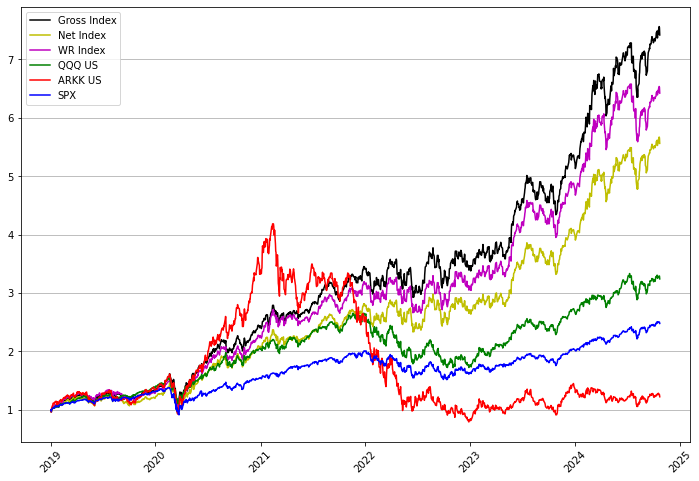

Performances:
            Gross Index  Net Index  WR Index  QQQ US    SPX  ARKK US
2019-12-31        32.16      20.13     28.55   38.41  31.09    33.75
2020-12-31        84.64      73.78     76.71   48.41  18.33   148.73
2021-12-31        39.59      33.06     38.56   27.42  28.73   -24.02
2022-12-31         1.75      -2.46     -1.00  -32.58 -18.18   -66.97
2023-12-31        53.49      49.52     55.55   54.03  24.76    67.64
2024-12-31        39.44      37.30     32.52   19.25  21.59   -12.61


Volatilities:
            Gross Index  Net Index  WR Index  QQQ US    SPX  ARKK US
2019-12-31        22.47      22.39     22.45   18.41  13.93    29.59
2020-12-31        35.40      35.39     35.38   30.78  28.78    42.31
2021-12-31        24.47      24.45     24.74   22.47  18.05    40.34
2022-12-31        26.28      26.25     26.03   27.29  20.43    57.77
2023-12-31        24.91      24.89     24.69   23.55  17.73    49.32
2024-12-31        21.56      21.55     21.64   17.73  12.79    37.64


Dr

,WR Betas,DR Betas,DR-D0 P&L (bps),WR-D0 P&L (bps)
Ideal,1.22,1.22,-6.24,-6.24
Market,1.0,1.0,-73.52,-73.52
Beta,0.63,0.56,-30.14,-33.91
Momentum,0.58,0.49,6.58,7.79
M2MP Velocity,0.2,0.36,-1.09,-0.61
Pharmaceuticals,0.08,0.08,-2.51,-2.51
Value,0.07,0.23,4.12,1.26
Application Software,0.05,0.03,-1.57,-2.62
Materials,0.03,0.04,1.87,1.4
Hardware,0.0,0.01,0.77,0.0


In [348]:
# PORTFOLIO CONSTRUCTION W/ NAIVE INCREMENTAL MVO AND ESTIMATED ALPHAS, GENERAL AND X-SECTIONAL - NEW VAL ADJ

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import Ridge
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from scipy import optimize 
from scipy.optimize import linprog
import warnings


def annual_reports(SummaryP_df, anchor):
        
    SummaryP_df.index = SummaryP_df.index.map(lambda x: datetime(x.year, x.month, x.day))
    SummaryPY_df = SummaryP_df.resample('Y').last()
    SummaryPY_df.loc[SummaryP_df.index[0]] = 1
    SummaryPY_df = SummaryPY_df.sort_index()
    SummaryPY_df = round(100 * SummaryPY_df.pct_change(), 2).dropna()
    print('Performances:')
    print(SummaryPY_df)
    print('')

    SummaryV_df = round(100 * SummaryP_df.pct_change().ewm(halflife = 84).std() * np.sqrt(252), 2).dropna()
    SummaryVY_df = round(SummaryV_df.resample('Y').mean(), 2)
    print('')
    print('Volatilities:')
    print(SummaryVY_df)
    print('')

    SummaryD_df = round(100 * (SummaryP_df / SummaryP_df.rolling(252, min_periods = 21).max() - 1), 2).dropna()
    SummaryDY_df = SummaryD_df.resample('Y').min()
    print('')
    print('Drawdowns:')
    print(SummaryDY_df)
    print('')

    SummaryC_df = round(100 * ((SummaryP_df[1: ].T ** (252 / SummaryP_df[1:].index.map(lambda x: (x - SummaryP_df.index[0]).days).values)).T - 1), 2)
    SummaryCY_df = SummaryC_df.resample('Y').last()
    print('')
    print('CAGR:')
    print(SummaryCY_df)
    print('')

    SummaryCDY_df = round(SummaryCY_df / abs(SummaryDY_df), 2)
    print('')
    print('CAGR/DD:')
    print(SummaryCDY_df)
    print('')

    SummarySY_df = round(SummaryPY_df / abs(SummaryVY_df), 2)
    print('')
    print('Sharpe:')
    print(SummarySY_df)
    print('')

    SummaryCorr_df = SummaryP_df.rolling(252).corr(SummaryP_df[anchor].rolling(252))
    SummaryCorrY_df = SummaryCorr_df.resample('Y').mean()
    SummaryBY_df = round(SummaryCorrY_df * (SummaryVY_df.T / SummaryVY_df[anchor]).T, 2)
    print('')
    print('Betas ' + anchor + ':')
    print(SummaryBY_df)
    print('')

    SummaryAY_df = round(SummaryPY_df - (SummaryBY_df.T * SummaryPY_df[anchor]).T, 2)
    print('')
    print('Alphas ' + anchor + ':')
    print(SummaryAY_df)    
                
    return

def predictors_to_Cfeatures(pred_df, c_features_l, sector_s):
    
    exp_g = 10
    m_omd = 5
    IDwinsor_L = 0.025
    IDwinsor_H = 0.990
    winsor_L = 0.01
    Vwinsor_H = 0.90
    IQuant = 10
    field_l = ['GS', 'GGP', 'GE', 'G', 'G Vol', 'G r2', 'E Vol', 'S Vol', 'OM', 'OMp', 'ROIp', 'ROIdp', 'Alloc']    
    sc_df = pd.DataFrame(np.nan, index = pred_df.index, columns = field_l)

    pred_df['P/Ee'][pred_df['P/Ee'] < 0] = abs(pred_df['P/Ee'][pred_df['P/Ee'] < 0]) * 100
    pred_df['P/Eo'][pred_df['P/Eo'] < 0] = abs(pred_df['P/Eo'][pred_df['P/Eo'] < 0]) * 100
    pred_df['P/GP'][pred_df['P/GP'] < 0] = abs(pred_df['P/GP'][pred_df['P/GP'] < 0]) * 100
    pred_df['P/S'][pred_df['P/S'] < 0] = abs(pred_df['P/S'][pred_df['P/S'] < 0]) * 100
    pred_df['sP/E'][pred_df['sP/E'] < 0] = abs(pred_df['sP/E'][pred_df['sP/E'] < 0]) * 100
    pred_df['sP/S'][pred_df['sP/S'] < 0] = abs(pred_df['sP/S'][pred_df['sP/S'] < 0]) * 100
    pred_df['sP/GP'][pred_df['sP/GP'] < 0] = abs(pred_df['sP/GP'][pred_df['sP/GP'] < 0]) * 100
    pred_df = fix_na(pred_df, 'r2 S', 'r2 GP')
    pred_df = fix_na(pred_df, 'GS', 'GGP')
    aux_df = pred_df[['sP/S', 'sP/GP']]
    ratio = aux_df.median()['sP/GP'] / aux_df.median()['sP/S']
    aux_df['sP/S'] *= ratio
    aux_df = aux_df.T.fillna(method = 'ffill').T
    pred_df['sP/GP'] = aux_df['sP/GP']

    featuresC_df = pd.DataFrame(np.nan, index = pred_df.index, columns = c_features_l)

    sc_df['GS'] = pred_df['GS']
    sc_df['GGP'] = pred_df['GGP']
    sc_df['GE'] = pred_df['GE']
    sc_df['G'] = pred_df[['GE','GGP', 'GS']].min(axis = 1)
    sc_df['G Vol'] = pred_df[['GE','GGP', 'GS']].std(axis = 1)
    sc_df['G r2'] = pred_df[['r2 S', 'r2 GP', 'r2 E']].mean(axis = 1)
    sc_df['E Vol'] = pred_df['E Vol'].map(lambda x: max(1, x / 100))
    sc_df['S Vol'] = pred_df['S Vol'].map(lambda x: max(1, x / 100))
    sc_df['OM'] = pred_df['OM-t0'].map(lambda x: min(x, 60))
    sc_df['OMp'] = pred_df['OMd'].map(lambda x: min(x, 0))
    sc_df['ROIp'] = pred_df['ROI-P'].map(lambda x: min(x, 0))
    sc_df['ROIdp'] = pred_df['ROId'].map(lambda x: min(x, 0))
    sc_df['G r2'] = sc_df['G r2'].replace({-np.inf: 1})
    sc_df['Alloc'] = (25 * sc_df['G'] * (sc_df['G r2'] ** 5) / sc_df['E Vol'] / sc_df['S Vol'] + 
                      5 * sc_df['OM'] + 50 * sc_df['OMp'] + 50 * sc_df['ROIp'] + 50 * sc_df['ROIdp'])
    
    featuresC_df['Ideal'] = winsorize(sc_df['Alloc'], IDwinsor_L, IDwinsor_H)

    Value_s = (3 * pred_df['sP/E'] + pred_df['sP/GP']) / 4
    featuresC_df['Value'] = -winsorize(Value_s, winsor_L, Vwinsor_H) 
    featuresC_df['Size'] = -pd.Series(np.log(pred_df['Size']), index = pred_df.index)

    featuresC_df -= featuresC_df.mean()
    featuresC_df /= featuresC_df.std()
    featuresC_df = featuresC_df.fillna(0)
    
    return featuresC_df

def predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s):
        
    MacroPxs_df['US10YR RR'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['T10YIE']
    MacroPxs_df['YC'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['USGG2YR']
    MacroPxs_df['2Y IR Vol'] = MacroPxs_df['USGG2YR'].ewm(halflife = hl).std() * np.sqrt(252)
    MacroPxs_df = MacroPxs_df.loc[sPxs_df.index]
    MacroPxs_df = (MacroPxs_df - MacroPxs_df.ewm(halflife = hl).mean())
    MacroPxs_df = MacroPxs_df.pct_change()

    MacroFactor_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = m_features_l)
    for c_mf in m_features_l:
        c_mf_s = sPxs_df.pct_change().join(MacroPxs_df[c_mf])[-hl:].cov()[c_mf].drop(c_mf)    
        featVar_s = MacroPxs_df[c_mf].ewm(halflife = hl).var().iloc[-1]
        MacroFactor_df[c_mf] = c_mf_s / featVar_s

    for c_feat in m_features_l:
        MacroFactor_df[c_feat] = winsorize(MacroFactor_df[c_feat], winsor_L, winsor_H).values

    naT_l = MacroFactor_df.isna().sum(axis = 1)[MacroFactor_df.isna().sum(axis = 1) > 0].index
    naF_l = MacroFactor_df.loc[naT_l].T[MacroFactor_df.loc[naT_l].T.isna()].index.tolist()  
    MacroFactor_df.loc[naT_l, naF_l] = MacroFactor_df.median().values
    MacroFactor_df -= MacroFactor_df.mean()
    MacroFactor_df /= MacroFactor_df.std()

    return MacroFactor_df, MacroPxs_df[m_features_l]

def predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s):

    lag_M1 = -252
    lag_M3 = -21
    beta_adj = True

    featuresP_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = p_features_l)
    sRetPxs_df = sPxs_df.pct_change().dropna()
    sRetMkt_s = sMkt_s.pct_change().dropna()    
    sCovPxs_s = sRetPxs_df.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    sVarMkt = sRetMkt_s.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    featuresP_df['Beta'] = winsorize(sCovPxs_s / sVarMkt, 0, winsor_H)
    featuresP_df['Vol'] = -winsorize(sRetPxs_df.ewm(halflife = hl).std().iloc[-1], 0, winsor_H)
    Mom_s = pd.Series((featuresP_df.index.map(lambda x: sPxs_df[x].iloc[lag_M3]) / 
                       featuresP_df.index.map(lambda x: sPxs_df[x].iloc[lag_M1])), index = featuresP_df.index)
    featuresP_df['Momentum'] = winsorize(Mom_s, winsor_L, winsor_H)

    featuresP_df -= featuresP_df.mean()
    featuresP_df /= featuresP_df.std()
    
    return featuresP_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df 

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def fix_na(base_df, col_b, col_t):

    aux = base_df[[col_b, col_t]]
    aux = aux.T.fillna(method = 'ffill').T
    base_df[col_t] = aux[col_t]
    
    return base_df

def winsorize(Rt_s, floor, cap):
    
    w_up = np.quantile(Rt_s.dropna().values, q = cap)
    w_down = np.quantile(Rt_s.dropna().values, q = floor)    
    w_s = Rt_s.clip(w_down, w_up)
    
    return w_s

def get_predictors(c_date, exclusion_l):
    
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True            
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100  
    exclusion_l = [t for t in exclusion_l if t in pred_df.index]
    pred_df = pred_df.drop(exclusion_l)
    
    return pred_df, c_date

def loadings(ret_s, res_s):
    
    Pbeta = 0
    PZ = 0      
    if (res_s.std() != 0):
        Pbeta = round(res_s.cov(ret_s) / (res_s.std() ** 2), 3)
        if (ret_s.std() != 0):        
            PZ = round(abs(Pbeta) / ((ret_s.std() ** 2) / (res_s.std() ** 2)), 3)
    
    return Pbeta, PZ

def mlr(ALLfeatures_df):
    
    model = LinearRegression()
    lr_mod = model.fit(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values)
    lr_values = lr_mod.predict(ALLfeatures_df[all_features_l].values)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'MLR Factor Rets'
    fcast_s = pd.Series(lr_values, index = ALLfeatures_df.index)
    fcast_s.name = 'Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def w_mlr(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    lr_mod = model.fit(x_m, y_a, w_a)
    lr_values = lr_mod.predict(x_m)
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a, w_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge(x_m, y_a, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = pd.DataFrame(x_m.T)
    y_df = pd.DataFrame(y_a.T)

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_df.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_df.drop(valX_df.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values)
                valRidge_f = ridge_mod.predict(valX_df.values)
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values)
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = pd.Series(bestRidge_fr, index = c_l)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_m.shape[0]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidge_f).join(y_df, rsuffix = '_label').corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

def interest_pxs(port_s, Pxs_df):

    add_l = [t for t in port_s.index if t not in Pxs_df.columns]       
    compPx_df = pd.DataFrame(np.nan, index = Pxs_df.index[-long_w: ], columns = ['dummy'])
    for missing_t in add_l:
        try:
            ticker_s = yf.download([t_dikt[missing_t]], period = str(long_w + 200) + 'd')['Close']
            ticker_s.index = ticker_s.index.map(lambda x: x.date())
            ticker_s.name = missing_t
            compPx_df = compPx_df.join(ticker_s)
        except:
            print(missing_t + ' FAILED')
    
    compPx_df = compPx_df.fillna(method = 'bfill').fillna(method = 'ffill')
    IntPxs_df = Pxs_df.join(compPx_df)[port_s.index][-long_w:]
    IntPxs_df = IntPxs_df.fillna(method = 'bfill').fillna(method = 'ffill')
    
    return IntPxs_df

def calc_cov(port_s, cPort_s, IntPxs_df):

    missingA_l = [t for t in LJJPort_lastA_s.index if t not in cPort_s.index]
    mPort_s = pd.Series(cPort_s.median(), index = missingA_l)
    cPort_s = pd.concat([cPort_s, mPort_s]).sort_values()
    cov_df = IntPxs_df.pct_change()[-252:].ewm(halflife = hl).cov().loc[IntPxs_df.index[-1]]
    
    return cov_df, cPort_s

def MaximizeReturns(MeanReturns, PortfolioSize):
    
    c = (np.multiply(-1, MeanReturns))
    A = np.ones([PortfolioSize,1]).T
    b=[1]
    res = linprog(c, A_ub = A, b_ub = b, bounds = (0,1), method = 'highs') 
    
    return res

def MinimizeRisk(CovarReturns, PortfolioSize):
    
    def  f(x, CovarReturns):
        func = np.matmul(np.matmul(x, CovarReturns), x.T) 
        return func

    def constraintEq(x):
        A=np.ones(x.shape)
        b=1
        constraintVal = np.matmul(A,x.T)-b 
        return constraintVal
    
    xinit=np.repeat(0.1, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq})
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])

    opt = optimize.minimize (f, x0 = xinit, args = (CovarReturns),  bounds = bnds, \
                             constraints = cons, tol = 10**-3)
    
    return opt

def MinimizeRiskConstr(MeanReturns, CovarReturns, PortfolioSize, R):
    
    def  f(x,CovarReturns):
         
        func = np.matmul(np.matmul(x,CovarReturns ), x.T)
        return func

    def constraintEq(x):
        AEq=np.ones(x.shape)
        bEq=1
        EqconstraintVal = np.matmul(AEq,x.T)-bEq 
        return EqconstraintVal
    
    def constraintIneq(x, MeanReturns, R):
        AIneq = np.array(MeanReturns)
        bIneq = R
        IneqconstraintVal = np.matmul(AIneq,x.T) - bIneq
        return IneqconstraintVal
    

    xinit=np.repeat(0.1, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq},
            {'type':'ineq', 'fun':constraintIneq, 'args':(MeanReturns,R) })
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])

    opt = optimize.minimize (f, args = (CovarReturns), method ='trust-constr',  \
                        x0 = xinit,   bounds = bnds, constraints = cons, tol = 10**-3)
    
    return  opt

def MaximizeSharpeRatioOptmzn(MeanReturns, CovarReturns, RiskFreeRate, PortfolioSize):
    
    # define maximization of Sharpe Ratio using principle of duality
    def  f(x, MeanReturns, CovarReturns, RiskFreeRate, PortfolioSize):
        funcDenomr = np.sqrt(np.matmul(np.matmul(x, CovarReturns), x.T) )
        funcNumer = np.matmul(np.array(MeanReturns),x.T)-RiskFreeRate
        func = -(funcNumer / funcDenomr)
        return func

    #define equality constraint representing fully invested portfolio
    def constraintEq(x):
        A=np.ones(x.shape)
        b=1
        constraintVal = np.matmul(A,x.T)-b 
        return constraintVal
    
    
    #define bounds and other parameters
    xinit=np.repeat(0.33, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq})
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])
    
    #invoke minimize solver
    opt = optimize.minimize (f, x0 = xinit, args = (MeanReturns, CovarReturns,\
                             RiskFreeRate, PortfolioSize), method = 'SLSQP',  \
                             bounds = bnds, constraints = cons, tol = 10**-3)
    
    return opt

def BiCriterionFunctionOptmzn(MeanReturns, CovarReturns, RiskAversParam, PortfolioSize, AllocCap, AllocFloor):
       
    def  f(x, MeanReturns, CovarReturns, RiskAversParam, PortfolioSize):
        PortfolioVariance = np.matmul(np.matmul(x, CovarReturns), x.T) 
        PortfolioExpReturn = np.matmul(np.array(MeanReturns),x.T)
        func = RiskAversParam * PortfolioVariance - (1-RiskAversParam)*PortfolioExpReturn
        return func

    def ConstraintEq(x):
        A = np.ones(x.shape)
        b = 1
        constraintVal = np.matmul(A, x.T) - b 
        return constraintVal
    
    xinit=np.repeat(0.01, PortfolioSize)
    cons = ({'type': 'eq', 'fun':ConstraintEq})
    bnds = [(AllocFloor, AllocCap)] * PortfolioSize

    opt = optimize.minimize (f, x0 = xinit, args = ( MeanReturns, CovarReturns,\
                                                    RiskAversParam, PortfolioSize), \
                             method = 'SLSQP',  bounds = bnds, constraints = cons, \
                             tol = 10**-3)
    return opt

def mvo(alphas_s, Scov_m, LWcov_m, Fcov_m, PCAcov_m, r0, select_universe, port_size, AllocCap):
     
    cov_l = [Scov_m, LWcov_m, Fcov_m, PCAcov_m]
    sharpeMVO = True
    alloc_df = pd.DataFrame(np.nan, index = alphas_s.index, columns = ['Sample', 'LW', 'Fac', 'PCA'])
    
    for idx, cov_m in enumerate(cov_l):  
        
        alphas_a = alphas_s.values
        # MARKOWITZ, OPTIMAL EX-ANTE SHARPE
        if (sharpeMVO):            
            maxSharpeRatio = 0
            result = MaximizeSharpeRatioOptmzn(alphas_a, cov_m, r0 / 100, select_universe)
            markS_a = result.x
            Risk = markS_a.dot(cov_m).dot(markS_a.T) ** (1 / 2)
            expReturn = alphas_a.dot(markS_a.T)
            maxSharpeRatio = (np.array(expReturn) - r0) / Risk   
            markS_s = round(pd.Series(markS_a, index = alphas_s.index), 4).sort_values(ascending = False)

        # MARKOWITZ, CAPPED EX-ANTE PORTFOLIO VOL, ALLOCATION BOUNDS            
        xOptimal =[]
        minRiskPoint = []
        expPortfolioReturnPoint =[]
        for points in range(0, ra_scenarios):
            ra_p = points / ra_scenarios
            result = BiCriterionFunctionOptmzn(alphas_a, cov_m, ra_p, select_universe, AllocCap, AllocFloor)
            xOptimal.append(result.x)
        xOptimalArray = np.array(xOptimal)
        riskPoint = (np.diagonal(xOptimalArray.dot(cov_m).dot(xOptimalArray.T)) ** (1 / 2))
        retPoint= xOptimalArray.dot(alphas_a)
        riskRet_s = pd.Series(retPoint, index = riskPoint)
        C_volP_cap = max(volP_cap, riskRet_s.index.min())
        sharpe_s = pd.Series(riskRet_s[riskRet_s.index <= C_volP_cap].values / riskRet_s[riskRet_s.index <= C_volP_cap].index.values)
        best_c = sharpe_s.argmax()
        markSC_a = xOptimalArray[best_c]  
        markSC_s = round(pd.Series(markSC_a, index = alphas_s.index), 4).sort_values(ascending = False)

        if (sharpeMVO):
            alloc_s = (((9 * markSC_s + markS_s) / 10).sort_values()[-select_universe:] / 
                       ((9 * markSC_s + markS_s) / 10).sort_values()[-select_universe:].sum()).fillna(0)
        else:
            alloc_s = (markSC_s.sort_values()[-select_universe:] / markSC_s.sort_values()[-select_universe:].sum()).fillna(0)              
        alloc_df.loc[alloc_s.index, alloc_df.columns[idx]] = alloc_s
    
    alloc_df['Avg'] = alloc_df.mean(axis = 1)
    alloc_df = alloc_df.sort_values(by = ['Avg'], ascending = False)
    alloc_s = alloc_df['Avg']
        
    return alloc_s

def cap_sn(alloc_s):

    alloc_x = alloc_s[alloc_s > AllocCap]
    while (alloc_x.shape[0] > 0):
        alloc1_s = alloc_s[alloc_s <= AllocCap]
        alloc2_s = alloc_x - AllocCap
        excess = alloc2_s.sum()
        alloc1_s += (alloc1_s * excess) / alloc1_s.sum()
        alloc_x -= alloc2_s
        alloc_s = pd.concat([alloc1_s, alloc_x]).sort_values()    
        alloc_x = alloc_s[alloc_s > AllocCap]
        
    return alloc_s.sort_values(ascending = False)

def devAdj_size(SPxs_df, alloc_s):

    MAV_w = 63
    zs_cap = 3
    zs_floor = -2.0
    penalty_r = 2
    boost_r = 2

    allocPerf_s = (SPxs_df[alloc_s.index].iloc[-1] / SPxs_df[alloc_s.index][-MAV_w:].mean() - 1)
    vol_S = (SPxs_df[alloc_s.index].pct_change().ewm(halflife = MAV_w).std() * np.sqrt(10)).iloc[-1]
    MAVDev_S = round(allocPerf_s / vol_S, 3)
    penalty_s = (MAVDev_S - zs_cap).clip(0, 100)
    boost_s = (zs_floor - MAVDev_S).clip(0, 100)
    Fpenalty_s = pd.Series(np.exp(penalty_s.values / penalty_r), index = penalty_s.index)
    Fboost_s = pd.Series(np.exp(boost_s.values / boost_r), index = boost_s.index)
    Falloc_s = alloc_s / Fpenalty_s
    Falloc_s *= Fboost_s
    leaveOUT_l = Fpenalty_s[Fpenalty_s > 1].index.tolist() + Fboost_s[Fboost_s > 1].index.tolist() + Falloc_s[Falloc_s == AllocCap].index.tolist()
    adj_l = [t for t in Falloc_s.index if t not in leaveOUT_l]
    adj_size = 1 - Falloc_s.sum()
    Falloc_s.loc[adj_l] = Falloc_s.loc[adj_l] * (1 + adj_size / Falloc_s.loc[adj_l].sum())
    diff_s = round(Falloc_s - alloc_s, 2)
    Falloc_s.name = 'Alloc'
    if (abs(diff_s).sum() > 1):
        print('RELEVANT ADJUSTMENTS:')
        print(diff_s)
        print('')  
    
    return Falloc_s

def mean_rev(asset_l, SPS_df, SPGP_df, FPS_df, FPGP_df, PEGS_df, PEGGP_df, c):
    
    val_w = 126
    val_hl = 252
    val_m = 2
    highB = 10  
    lowB = 1.5

    secSPS_df = SPS_df.groupby(SPS_df.columns.map(lambda x: sector_s.loc[x]), axis = 1).mean()
    secSPGP_df = SPGP_df.groupby(SPGP_df.columns.map(lambda x: sector_s.loc[x]), axis = 1).mean()
    secFPS_df = FPS_df.groupby(FPS_df.columns.map(lambda x: sector_s.loc[x]), axis = 1).mean()
    secFPGP_df = FPGP_df.groupby(FPGP_df.columns.map(lambda x: sector_s.loc[x]), axis = 1).mean()
    secPEGS_df = PEGS_df.groupby(PEGS_df.columns.map(lambda x: sector_s.loc[x]), axis = 1).mean()
    secPEGGP_df = PEGGP_df.groupby(PEGGP_df.columns.map(lambda x: sector_s.loc[x]), axis = 1).mean()    

    val_s = pd.Series(0, index = pd.Index(asset_l, name = 'MeanR'))
    for ticker in asset_l:
        try:
            absSPS_s = SPS_df[ticker].fillna(method = 'ffill')    
            relSPS_s = (absSPS_s - secSPS_df[sector_s.loc[ticker]])
            mavSPS = absSPS_s[-val_w:].mean()
            DrelSPS = (relSPS_s.clip(0, 1) * (absSPS_s - mavSPS)).iloc[-1]
            
            try:
                absSPGP_s = SPGP_df[ticker].fillna(method = 'ffill')
                relSPGP_s = (absSPGP_s - secSPGP_df[sector_s.loc[ticker]])
                mavSPGP = absSPGP_s[-val_w:].mean()
                DrelSPGP = (relSPGP_s.clip(0, 1) * (absSPGP_s - mavSPGP)).iloc[-1]
            except:
                if (c == 1):
                    print('sGP failed for ' + ticker)
                relSPGP_s = relSPS_s.copy()
                DrelSPGP = DrelSPS.copy()

            absFPS_s = FPS_df[ticker].fillna(method = 'ffill')
            relFPS_s = (absFPS_s - secFPS_df[sector_s.loc[ticker]])
            mavFPS = absFPS_s[-val_w:].mean()
            DrelFPS = (relFPS_s.clip(0, 1) * (absFPS_s - mavFPS)).iloc[-1]

            try:
                absFPGP_s = sFPGP_df[ticker].fillna(method = 'ffill')
                relFPGP_s = (absFPGP_s - secFPGP_df[sector_s.loc[ticker]])
                mavFPGP = absFPGP_s[-val_w:].mean()
                DrelFPGP = (relFPGP_s.clip(0, 1) * (absFPGP_s - mavFPGP)).iloc[-1]
            except:
                if (c == 1):
                    print('fGP failed for ' + ticker)
                relFPGP_s = relFPS_s.copy()
                DrelFPGP = DrelFPS.copy()

            LTvalS = (relSPS_s - relSPS_s.ewm(halflife = val_hl).mean()).dropna().clip(0, highB).iloc[-1]
            LTvalGP = (relSPGP_s - relSPGP_s.ewm(halflife = val_hl).mean()).dropna().clip(0, highB).iloc[-1]
            STval = (DrelFPS + DrelFPGP)

            Tval = (((((min(max(LTvalS + LTvalGP, 0), 1)) * STval) + 1) ** val_m) - 1)
#           Tval = (max(min(((min(max(LTvalS + LTvalGP, 0), 1)) * STval), highB), lowB) - lowB) ** val_m 

            val_s.loc[ticker] = min(highB, max(0, round(Tval, 2)))                                             
        except:
            if (c == 1):
                print('MeanR error for ' + ticker)
            else:
                pass
        
    return val_s

def utilityF(ALLfeatures_df, select_universe, FactRets_df, Idio_df, PCAIdio_df, PCALoadings_df, PCAFactorRets_df, 
             Pxs_df, dt, sector_s, port_size, SPS_df, SPGP_df, FPS_df, FPGP_df, PEGS_df, PEGGP_df):

    FactorCov = True
    xv_list = ['IdM w', 'IdP w', 'Alpha', 'Vol', 'BetaP', 'MomP', 'uS', 'uF', 'uP', 'uLW', 'UA']
    int_features_l = ['Momentum', 'Ideal']
    scope_features_l = int_features_l + m_features_l + ['Beta', 'Vol', 'Value']
    hl_idio = 126
    concentration_f = 3
    ideal_w = 10
    momentum_w = 5
    idioMLR_r = [1, 3, 5]
    idioPCA_r = [1, 3, 5]
    bp_m = 2
    mp_m = 1
    bp_cap = .7
    mp_cap = .5
    Awinsor_H = 0.995

    FactRets_df = FactRets_df.dropna(how = 'all')
    Idio_df = Idio_df.dropna(how = 'all')[-hl_idio:].T.dropna(thresh = hl_idio // 2).T.fillna(0)
    PCAIdio_df = PCAIdio_df.dropna(how = 'all')[-hl_idio:].T.dropna(thresh = hl_idio // 2).T.fillna(0)
    asset_list = [t for t in ALLfeatures_df.index if t in Idio_df.columns]
    Idio_df = Idio_df[asset_list]
    ALLfeatures_df = ALLfeatures_df.loc[asset_list]

    best_sharpe = -np.inf
    cv_df = pd.DataFrame(np.nan, index = np.arange(len(idioMLR_r) + len(idioPCA_r)) + 1, columns = xv_list)
    c = 1
    u_best = -np.inf
    for idioMLR_w in idioMLR_r:
        for idioPCA_w in idioPCA_r:
            IdealMLRfExp_s = round(100 * (ALLfeatures_df['Ideal'].clip(0, ALLfeatures_df['Ideal'].max()) * FactRets_df['Ideal'].ewm(halflife = hl_idio // 3).mean().iloc[-1] / 
                                          FactRets_df['Ideal'][-hl_idio:].ewm(halflife = hl_idio // 6).std().iloc[-1]).map(lambda x: max(0, x)), 2)
            MomMLRfExp_s = round(100 * (ALLfeatures_df['Momentum'].clip(0, ALLfeatures_df['Momentum'].max()) * FactRets_df['Momentum'].ewm(halflife = hl_idio // 3).mean().iloc[-1] / 
                                        FactRets_df['Momentum'][-hl_idio:].ewm(halflife = hl_idio // 6).std().iloc[-1]).map(lambda x: max(0, x)), 2)
            IdioMLR_s = round(100 * Idio_df.ewm(halflife = hl_idio // 3).mean().iloc[-1].dropna() / 
                              Idio_df.ewm(halflife = hl_idio // 6).std().iloc[-1].dropna(), 2)
            IdioPCA_s = round(100 * PCAIdio_df.ewm(halflife = hl_idio // 3).mean().iloc[-1].dropna() / 
                              PCAIdio_df.ewm(halflife = hl_idio // 6).std().iloc[-1].dropna(), 2)

            IdealMLRfExp_s.name = 'Ideal'
            MomMLRfExp_s.name = 'Mom'
            IdioMLR_s.name = 'IdMLR'
            IdioPCA_s.name = 'IdPCA'

            IexpAlpha_df = pd.DataFrame(IdealMLRfExp_s).join(MomMLRfExp_s).join(IdioMLR_s).join(IdioPCA_s)
            expAlpha_df = IexpAlpha_df.sort_values(by = ['Ideal'], ascending = False)[:3 * select_universe]

            expAlpha_df['Ideal'] *= ideal_w / (ideal_w + momentum_w + idioMLR_w + idioPCA_w)
            expAlpha_df['Mom'] *= momentum_w / (ideal_w + momentum_w + idioMLR_w + idioPCA_w)
            expAlpha_df['IdMLR'] *= idioMLR_w / (ideal_w + momentum_w + idioMLR_w + idioPCA_w)        
            expAlpha_df['IdPCA'] *= idioPCA_w / (ideal_w + momentum_w + idioMLR_w + idioPCA_w)
            expAlpha_df['Sum'] = expAlpha_df.sum(axis = 1)  
            expAlpha_df['Sum'] = winsorize(expAlpha_df['Sum'], 0, Awinsor_H).map(lambda x: round(x, 2))

            cLport_s = expAlpha_df['Sum'].sort_values(ascending = False)[:select_universe]  
            cLport_s = cLport_s ** concentration_f
            cLport_s /= cLport_s.sum()
            cSport_s = cLport_s[:port_size].copy() 
            cSport_s /= cSport_s.sum()

            FactorLoadings_df = ALLfeatures_df.loc[cSport_s.index, FactRets_df.columns]
            FactorRet_df = pd.DataFrame(FactRets_df[-cov_lag:].values.dot(FactorLoadings_df.T.values), 
                                        index = FactRets_df[-cov_lag:].index, columns = FactorLoadings_df.index)  
            FBcov_df = FactorRet_df.ewm(halflife = hl).cov().loc[FactorRet_df.index[-1]] 

            PCARet_df = pd.DataFrame(PCALoadings_df.loc[cSport_s.index].values.dot(PCAFactorRets_df[-cov_lag:][PCAFactorRets_df.columns[:PCALoadings_df.shape[1]]].T), 
                                     index = cSport_s.index, columns = PCAFactorRets_df[-cov_lag:].index).T
            PCACov_df = PCARet_df.ewm(halflife = hl).cov().loc[PCARet_df.index[-1]]        

            SBcorr_m = np.triu(Pxs_df[cSport_s.index].pct_change()[-cov_lag:].ewm(halflife = hl).corr().loc[Pxs_df.index[-1]])
            avg_corr = (np.sum(SBcorr_m) - SBcorr_m.shape[0]) / ((SBcorr_m.shape[0] * (SBcorr_m.shape[0] - 1)) / 2)
            corr_df = pd.DataFrame(np.identity(cSport_s.shape[0]), index = cSport_s.index, columns = cSport_s.index).replace({0: avg_corr})
            std_s = Pxs_df[cSport_s.index].pct_change()[-cov_lag:].ewm(halflife = hl).std().iloc[-1]
            LWCov_df = (std_s.values.T * corr_df).T * std_s

            SBcov_df = Pxs_df[cSport_s.index].pct_change()[-cov_lag:].ewm(halflife = hl).cov().loc[Pxs_df.index[-1]]

            Alpha_p = (cSport_s * cLport_s.loc[cSport_s.index]).sum()
            beta_p = max(((cSport_s * ALLfeatures_df['Beta'].loc[cSport_s.index]) ** 2).sum(), 0)
            mom_p = max(((cSport_s * ALLfeatures_df['Momentum'].loc[cSport_s.index]) ** 2).sum(), 0)
            while (beta_p > bp_cap):
                beta_p = np.tanh(beta_p)
            while (mom_p > mp_cap):
                mom_p = np.tanh(mom_p)            
            volS_p = (cSport_s.values.dot(SBcov_df.values).dot(cSport_s.values) * 252) ** (1 / 2) * 100
            volF_p = (cSport_s.values.dot(FBcov_df.values).dot(cSport_s.values) * 252) ** (1 / 2) * 100
            volP_p = (cSport_s.values.dot(PCACov_df.values).dot(cSport_s.values) * 252) ** (1 / 2) * 100
            us_p = 100 * ((Alpha_p - cSport_s.values.dot(SBcov_df.values).dot(cSport_s.values) * 21 * (1 / 2)) - (beta_p * bp_m + mom_p * mp_m) * abs(Alpha_p))
            uf_p = 100 * ((Alpha_p - cSport_s.values.dot(FBcov_df.values).dot(cSport_s.values) * 21 * (1 / 2)) - (beta_p * bp_m + mom_p * mp_m) * abs(Alpha_p))
            up_p = 100 * ((Alpha_p - cSport_s.values.dot(PCACov_df.values).dot(cSport_s.values) * 21 * (1 / 2)) - (beta_p * bp_m + mom_p * mp_m) * abs(Alpha_p))
            ulw_p = 100 * ((Alpha_p - cSport_s.values.dot(LWCov_df.values).dot(cSport_s.values) * 21 * (1 / 2)) - (beta_p * bp_m + mom_p * mp_m) * abs(Alpha_p))
            uA_p = (us_p + uf_p + up_p + ulw_p) / 4 + abs(min(us_p, uf_p, up_p, ulw_p))

            cv_df.loc[c, 'IdM w'] = idioMLR_w
            cv_df.loc[c, 'IdP w'] = idioPCA_w
            cv_df.loc[c, 'Alpha'] = round(100 * Alpha_p, 2)
            cv_df.loc[c, 'Vol'] = round((volS_p + volF_p + volP_p) / 3, 2)
            cv_df.loc[c, 'BetaP'] = round(100 * beta_p, 2)
            cv_df.loc[c, 'MomP'] = round(100 * mom_p, 2)
            cv_df.loc[c, 'uS'] = round(us_p, 2)
            cv_df.loc[c, 'uF'] = round(uf_p, 2)
            cv_df.loc[c, 'uP'] = round(up_p, 2)
            cv_df.loc[c, 'uLW'] = round(ulw_p, 2)        
            cv_df.loc[c, 'UA'] = round(uA_p, 2)
            if (uA_p > u_best):
                FexpAlpha_df = expAlpha_df.loc[cLport_s.index]              
                Lport_s = cLport_s.copy()            

            c += 1

    return FexpAlpha_df, Lport_s, cv_df

def on_selection_models(value):
    global target_model
    target_model = value
    root.destroy()
    
def clean_dates(dt_range, exclusionDates_l):
    
    auxDt_s = pd.Series(dt_range)
    auxDt_s.index = pd.Series(dt_range).map(lambda x: x.strftime('%m%d')).tolist()
    validDT_l = [d for d in auxDt_s.index.tolist() if d not in exclusionDates_l]
    dt_range = sorted(pd.unique(auxDt_s.loc[validDT_l].tolist()).tolist())
    
    return dt_range    
    
def start_models(dt_range, Sectors_df, Pxs_df, FactorRets_df, IdioRets_df):      
        
    sector_s = Sectors_df[Sectors_df[target_class].isna() == False][target_class]
    for idx, c_dt in enumerate(dt_range):  
        p_dt = Pxs_df.index[Pxs_df.index.tolist().index(c_dt) - 1]
        valid_start = False 
        pred_dt = c_dt
        while (not valid_start):
            pred_df, c_date = get_predictors(pred_dt, exclusion_l)
            exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
            exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
            if (len(exc_ffields) == 0):
                pred_df = pred_df.drop(exc_tickers)
                valid_start = True
                print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
            else:
                pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
                
        sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ]
        Check_s = round(100 * sPxs_df[pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
        SBweights_s = np.log(pred_df['Size'])
        sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
        zeroVol_l = Check_s[Check_s == 0].index.tolist()
        excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
        pred_df = pred_df.drop(excall_l)
        asset_l = pred_df.index.tolist()

        FlatWeights_s = pd.Series(1, index = pred_df.index)       
        sIdioRets_df = IdioRets_df[IdioRets_df.index < c_dt].dropna(how = 'all')
        if (sIdioRets_df.shape[0] >= (2 * hl)):
            print('idio var weights')
            var_s = sIdioRets_df[-252:][asset_l].ewm(halflife = hl).var().iloc[-1]
            mean_var = var_s.mean()
            VBWeights_s = var_s.fillna(mean_var) ** (-1)
            VBWeights_s /= VBWeights_s.std()
            Weights_s = VBWeights_s[asset_l]        
        else:
            print('size weights')
            Weights_s = SBweights_s[asset_l].copy()
        w_s = Weights_s ** (1 / 2)

        MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
        sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]
        sMkt_s = Pxs_df[Pxs_df.index < c_dt][-long_w: ][anchor_asset]

        ## LOADINGS ENGINEERING, TIME SERIES

        featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
        featuresC_df = predictors_to_Cfeatures(pred_df, c_features_l, sector_s)
        featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
        XSStyleLoadings_df = featuresP_df.join(featuresC_df)

        ## INTERCEPT, BETA RETURNS AND RESIDUALS, CROSS SECTION: SIMPLE LINEAR MODEL (LN(MKT CAP) AS WEIGHTS) - 1

        XSMktRet = Pxs_df[anchor_asset].loc[c_dt] / Pxs_df[anchor_asset].loc[p_dt] - 1    
        RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1    
        XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)
        XSAssetRets.name = 'Rt'

        # FACTOR ORTHOGONALIZATION

        sBetas_s = featuresP_df['Beta']
        FactorLoadings_df = pd.DataFrame(sBetas_s)

        sIdeal_s = featuresC_df['Ideal']
        FactorLoadings_df[sIdeal_s.name] = othogonalize(FactorLoadings_df, sIdeal_s)    

        XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
        for c_sector in sector_l:
            stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
            XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
        XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())
        sectorR_l = sector_l.copy()
        sectorR_l.remove(sacr_sector)
        for c_sector in sectorR_l:
            FactorLoadings_df[c_sector] = othogonalize(FactorLoadings_df, XSSectorLoadings_df[c_sector]).values        

        sSize_s = featuresC_df['Size']
        FactorLoadings_df[sSize_s.name] = othogonalize(FactorLoadings_df, sSize_s)

        for c_Sfeat in XSStyleLoadings_df.columns:
            if (c_Sfeat not in FactorLoadings_df.columns):
                FactorLoadings_df[c_Sfeat] = othogonalize(FactorLoadings_df, XSStyleLoadings_df[c_Sfeat]).values

        for c_Mfeat in m_features_l:
            FactorLoadings_df[c_Mfeat] = othogonalize(FactorLoadings_df, featuresM_df[c_Mfeat]).values

        FactorLoadings_df['Market'] = 1
        x = FactorLoadings_df.copy()

        # MULTI-VARIATE REGRESSION, ORTHOGONAL BASIS, NO INTERCEPT

        if (ridge_b):
            aXSOStockRet_s, aXSOFacRet_s, aXSOy0, aXSOmlr_r2, aXSOLambda = ridge2(FactorLoadings_df, XSAssetRets, w_s, 
                                                                                  asset_l, FactorLoadings_df.columns.tolist())    
        else:
            aXSOStockRet_s, aXSOFacRet_s, aXSOy0, aXSOmlr_r2 = w_mlr2(FactorLoadings_df.values, XSAssetRets.values, w_s.values, 
                                                                      asset_l, FactorLoadings_df.columns.tolist(), False)
        aXSOFacRet_s.loc[sacr_sector] = 0    
        FactorLoadings_df[sacr_sector] = XSSectorLoadings_df[sacr_sector]
        FactorRets_df.loc[c_dt] = aXSOFacRet_s

        IdioRets_df.loc[c_dt, asset_l] = RawAssetRets_s - (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1)
        modelR2 = round(100 * (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1).corr(RawAssetRets_s) ** 2, 2)

        if (len(dt_range) == 1):
            print('r2: ' + str(modelR2))
            print('')
            RawAssetRets_s.hist(bins = 30)
            plt.title('Dist of Returns')
            plt.show()
            IdioRets_df.iloc[-1].hist(bins = 30)
            plt.title('Dist of Residuals')
            plt.show()        
        else:
            print(c_dt.strftime('%d-%b-%y') + ' r2: ' + str(modelR2))
        print('Sum of sectors: ' + str(round(100 * FactorRets_df[sector_l].iloc[-1].sum(), 2)) + '%') 
        dSummary_df = pd.DataFrame(round(100 * FactorRets_df.loc[c_dt], 2))
        if (target_class == 'Custom Sector 1'):
            ETFRets_s = pd.Series(100 * (FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[c_dt, sector_ETF_map[x]]) / 
                              FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[p_dt, sector_ETF_map[x]]) - 1).values, 
                              index = sector_l)
            ETFRets_s.name = 'ETFs'
            dSummary_df = pd.DataFrame(round(100 * FactorRets_df.loc[c_dt], 2))
            dSummary_df['ETF Rets'] = np.nan
            dSummary_df.loc[sector_l, 'ETF Rets'] = round(ETFRets_s, 2)
        print('Daily Factor Rets:')
        print(dSummary_df)
        print('')

    FactorRets_df = FactorRets_df.sort_index()
    IdioRets_df = IdioRets_df.sort_index()
    if (len(dt_range) > 0): 
        FactorRets_df.to_sql('factor_returns' + factExt + secExt, engine, index = True, if_exists = 'replace')
        IdioRets_df.to_sql('idio_returns' + factExt + secExt, engine, index = True, if_exists = 'replace')
                    
    return FactorRets_df, IdioRets_df

def trading_costs(a_port, p_port):
    
    trade_cost = 0.20
    
    incl_l = [t for t in p_port.index if t not in a_port.index]
    incl_s = pd.Series(0, index = incl_l)
    a_port = pd.concat([a_port, incl_s])
    a_port.name = 'CPort'
    p_port.name = 'PPort'
    trade_df = pd.DataFrame(a_port).join(p_port).fillna(0).sort_values(by = ['CPort'], ascending = False)
    trade_df = round(100 * trade_df, 2)
    trade_df['Trade'] = trade_df['CPort'] - trade_df['PPort']
    turnover = abs(trade_df['Trade']).sum()
    t_cost = turnover * trade_cost / 100
    
    return trade_df, t_cost, turnover

def othogonalize(cbasis_df, newF_s):
    
    ortF_model = LinearRegression(fit_intercept = True)
    residualF_a = newF_s.values
    for c_basis in cbasis_df.columns:
        x_a = cbasis_df[c_basis].values.reshape(-1, 1)
        y_a = residualF_a
        ortF_m = ortF_model.fit(x_a, residualF_a)
        spanned_a = ortF_m.predict(x_a)
        residualF_a -= spanned_a
    orthogonal_s = pd.Series(residualF_a, index = newF_s.index)

    return orthogonal_s 

def rebalancing(selectionN_df, selectionA_df):

    rebFrequency_d = 5
    averaging_period = 1
    averaging_p = True

    selectionN_df = selectionN_df.dropna(how = 'all')
    selectionA_df = selectionA_df.dropna(how = 'all')
    dt_l = selectionN_df.index[1:].tolist()
    reb_dt_l = dt_l[:: rebFrequency_d]
    perfSummary_df = pd.DataFrame(0, index = selectionN_df.index, columns = ['Gross Index', 'Net Index', 'WR Index', 'Port Turnover (%)', 'TCost (%)', 'WR PT (%)', 'WR TC (%)'])
    perfSummary_df.iloc[0]['Gross Index'] = 1
    perfSummary_df.iloc[0]['Net Index'] = 1
    perfSummary_df.iloc[0]['WR Index'] = 1
    p_dt = selectionN_df.index[0]
    wra_dt = selectionN_df.index[0]
    wrp_dt = wra_dt
    wrp_port = pd.Series(selectionA_df.loc[wrp_dt].dropna().values, index = selectionN_df.loc[wrp_dt].dropna().values)
    wra_port = pd.Series(selectionA_df.loc[wra_dt].dropna().values, index = selectionN_df.loc[wra_dt].dropna().values)
    for a_dt in dt_l:    
        a_port = pd.Series(selectionA_df.loc[a_dt].dropna().values, index = selectionN_df.loc[a_dt].dropna().values)
        p_port = pd.Series(selectionA_df.loc[p_dt].dropna().values, index = selectionN_df.loc[p_dt].dropna().values)        
        g_index = (((p_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / p_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                   p_port).sum() + 1) * perfSummary_df.loc[p_dt, 'Gross Index']      
        Ap_port = p_port * (p_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / p_port.index.map(lambda x: Pxs_df.loc[p_dt, x]))
        Ap_port /= Ap_port.sum()
        DRtrade_df, t_cost, turnover = trading_costs(a_port, Ap_port)
        perfSummary_df.loc[a_dt, 'Port Turnover (%)'] = turnover
        perfSummary_df.loc[a_dt, 'TCost (%)'] = t_cost    
        perfSummary_df.loc[a_dt, 'Gross Index'] = g_index
        perfSummary_df.loc[a_dt, 'Net Index'] = (g_index * (perfSummary_df.loc[p_dt, 'Net Index'] / 
                                                            perfSummary_df.loc[p_dt, 'Gross Index']) - t_cost / 100)         
        if (a_dt in reb_dt_l):        
            wra_dt = a_dt
            wra_port = pd.Series(selectionA_df.loc[wra_dt].dropna().values, index = selectionN_df.loc[wra_dt].dropna().values)
            if (averaging_p):            
                for i in np.arange(min(averaging_period, selectionN_df[selectionN_df.index < a_dt].shape[0]))[1:]:
                    pAvg_dt = selectionN_df.index[selectionN_df.index.tolist().index(wra_dt) - i]
                    pAvg_port = pd.Series(selectionA_df.loc[pAvg_dt].dropna().values, index = selectionN_df.loc[pAvg_dt].dropna().values)

                    incl_l = [t for t in pAvg_port.index if t not in wra_port.index]
                    incl_s = pd.Series(0, index = incl_l)
                    wra_port = pd.concat([wra_port, incl_s])
                    incl_l = [t for t in wra_port.index if t not in pAvg_port.index]
                    incl_s = pd.Series(0, index = incl_l)
                    pAvg_port = pd.concat([pAvg_port, incl_s])    
                    wra_port += pAvg_port

                wra_port = wra_port.sort_values(ascending = False)[:port_size] / wra_port.sort_values(ascending = False)[:port_size].sum()
                wra_port = cap_sn(wra_port)               

        wr_index = (((wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[wrp_dt, x]) - 1) * 
                     wrp_port).sum() + 1) * perfSummary_df.loc[wrp_dt, 'WR Index']     
        if (a_dt in reb_dt_l):
            Awrp_port = wrp_port * (wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[wrp_dt, x]))    
            Awrp_port /= Awrp_port.sum()
            WRtrade_df, wrt_cost, wr_turnover = trading_costs(wra_port, Awrp_port)
        else:
            WRtrade_df, wrt_cost, wr_turnover = trading_costs(wra_port, wrp_port)
        perfSummary_df.loc[a_dt, 'WR PT (%)'] = wr_turnover
        perfSummary_df.loc[a_dt, 'WR TC (%)'] = wrt_cost    
        perfSummary_df.loc[a_dt, 'WR Index'] = wr_index - wrt_cost / 100    

        if (a_dt == dt_l[-1]):
            allLPTickers_s = pd.Series(pd.unique(DRtrade_df.index.tolist() + 
                                                 WRtrade_df.index.tolist())).map(lambda x: x.split(' ')[0]).tolist()
            LPTickersPxs_s = yf.download(allLPTickers_s, period = '1d')['Adj Close'].T

            last_DRport_df = pd.DataFrame(round(100 * p_port, 2).values, index = p_port.index, columns = ['P Al'])
            last_DRres_s = p_port * (p_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / 
                                     p_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1)
            lastDailyDR_df = pd.DataFrame(round(pd.Series(100 * (DRtrade_df.index.map(lambda x: Pxs_df.loc[a_dt, x]) / DRtrade_df.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1)), 2).values, 
                                          index = DRtrade_df.index, columns = ['Daily'])      
            last_DRres_df = pd.DataFrame(round(100 * last_DRres_s, 2), columns = ['LD Ct'])
            DRSummary_df = DRtrade_df.join(last_DRport_df).join(lastDailyDR_df).join(last_DRres_df).fillna(0)
            DRSummary_df['LC Pxs'] = DRSummary_df.index.map(lambda x: round(Pxs_df.loc[a_dt, x], 2))
            DRSummary_df['RT Pxs'] = DRSummary_df.index.map(lambda x: round(LPTickersPxs_s.loc[x.split(' ')[0]][0], 2))
            DRSummary_df['RT'] = pd.Series(round(pd.Series(100 * (DRtrade_df.index.map(lambda x: LPTickersPxs_s.loc[x.split(' ')[0]][0]) / 
                                                                  DRtrade_df.index.map(lambda x: Pxs_df.loc[a_dt, x]) - 1)), 2).values, index = DRtrade_df.index)                
            DRSummary_df['RT Ct'] = (p_port * DRSummary_df['RT']).fillna(0).map(lambda x: round(x, 2))
            DRSummary_df.loc['Total'] = '' 
            DRSummary_df.loc['Total', 'LD Ct'] = round(100 * last_DRres_s.sum(), 2)
            DRSummary_df.loc['Total', 'RT Ct'] = (p_port * DRSummary_df['RT']).fillna(0).map(lambda x: round(x, 2)).sum()

            last_WRport = wra_port * (wra_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / 
                                      wra_port.index.map(lambda x: Pxs_df.loc[wra_dt, x]))
            last_WRport = round(100 * (last_WRport / last_WRport.sum()).sort_values(ascending = False), 2)
            last_WRport_df = pd.DataFrame(last_WRport, columns = ['P Al'])
            lastInd_s = wrp_port * wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[wra_dt, x])
            prevInd_s = wrp_port * wrp_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[wra_dt, x])        
            RTInd_s = wrp_port * wrp_port.index.map(lambda x: LPTickersPxs_s.loc[x.split(' ')[0]][0]) / wrp_port.index.map(lambda x: Pxs_df.loc[wra_dt, x])        
            lastDailyWR_df = pd.DataFrame(round(pd.Series(100 * (wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1)), 2).values, 
                                          index = wrp_port.index, columns = ['Daily'])        
            last_WRres_df = pd.DataFrame(round(100 * (lastInd_s - prevInd_s), 2), columns = ['LD Ct'])
            WRSummary_df = WRtrade_df.join(last_WRport_df).join(lastDailyWR_df).join(last_WRres_df)
            WRSummary_df['LC Pxs'] = WRSummary_df.index.map(lambda x: round(Pxs_df.loc[a_dt, x], 2))
            WRSummary_df['RT Pxs'] = WRSummary_df.index.map(lambda x: round(LPTickersPxs_s.loc[x.split(' ')[0]][0], 2))        
            WRSummary_df['RT'] = pd.Series(round(pd.Series(100 * (wrp_port.index.map(lambda x: LPTickersPxs_s.loc[x.split(' ')[0]][0]) / 
                                                                  wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) - 1)), 2).values, index = wrp_port.index)         
            WRSummary_df['RT Ct'] = round(100 * (RTInd_s - lastInd_s), 2)
            WRSummary_df.loc['Total'] = ''
            WRSummary_df.loc['Total', 'LD Ct'] = round(100 * (lastInd_s - prevInd_s).sum(), 2)
            WRSummary_df.loc['Total', 'RT Ct'] = round(100 * (RTInd_s - lastInd_s).sum(), 2)

        p_dt = a_dt
        wrp_dt = wra_dt
        wrp_port = wra_port.copy()
        
    return perfSummary_df, DRSummary_df.fillna(0), WRSummary_df.fillna(0)

def w_mlr2(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    x_m = (x_m.T * w_a).T
    y_a = y_a * w_a
    lr_mod = model.fit(x_m, y_a)
    lr_values = lr_mod.predict(x_m) / w_a
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge2(x_df, y_s, w_s, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = (x_df.T * w_s).T
    y_s = y_s * w_s 
    y_s.name = 'Labels'

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_s.iloc[init_v: end_v]
                valW_s = w_s.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_s.drop(valY_df.index)
                trainW_s = w_s.drop(valW_s.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values) / trainW_s.values
                valRidge_f = ridge_mod.predict(valX_df.values) / valW_s.values
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values) / w_s.values
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = pd.Series(bestRidge_fr, index = c_l)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.legend().remove()
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_df.shape[1]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidgeRt_s).join(y_s).corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

def on_selection_class(value):
    global target_class
    target_class = value
    root.destroy()

warnings.filterwarnings('ignore')
dbase = "visiblealpha_laptop"
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

today = date.today()
stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()
selection_scope = ''
init_cap = 1000000
beta_w = 126
cov_lag = 252
long_w = 1000
q_quant = 30
hl = 42
volCheck_w = 10
port_size = 20
select_universe = 50
alloc_delta = 5
AllocCap = 0.100 #0.150
AllocFloor = 0.015
volP_cap = 25
ra_scenarios = 50
pastAlpha_floor = -10
mlr_w = 1
wmlr_w = 2
ridge_w = 1
winsor_L = 0.010
winsor_H = 0.990
factor_MIX = .75
val_w = 252
minP_scale = 10
mr_L = 1
mr_H = 5

val_adj = True
mvo_b = False
proportional_b = True
mix = True
fundamentalMix = True

sizeSTD_adj = True
cap_allocations = True
anchor_asset = 'SPX'
sacr_sector = 'Health Care'
ridge_b = True
factExt = ''
if (ridge_b):
    factExt = '_ridge'

riskFree_asset = 'USGG2YR'
t_dikt = {'CAPA US': 'QSI', 'MTTR US': 'MTTR', 'SIVB US': 'SIVB', 'ARKG US': 'ARKG', 'VKTX US': 'VKTX', 
          'CPRI US': 'CPRI', 'CLSK US': 'CLSK'}
exclusion_l = ['BABA US', 'XPEV US', 'NIO US', 'TME US', 'JD US', 'PDD US', 'VNET US', 'ZLAB US', 'WB US', 
               'OCFT US', 'BGNE US', 'MOMO US', 'ZTO US', 'NTES US']
macroFeatures_l = ['CRB Index Index Points', 'Brent USD/Bbl', 'M2CP Velocity', 'M2MP Velocity', 'T5YIFR', 'T10YIE', 'USGG2YR', 
                   'USGG10YR', 'VIX']
all_fundamentals_l = ['sP/S', 'sP/E', 'sP/GP', 'P/S', 'P/Ee', 'P/GP', 'P/Eo', 'OM-t0', 'OM', 'OMd', 'GS', 'GE', 'r2 S', 'r2 E', 
                      'GGP', 'r2 GP', 'Size', 'ROI-P', 'ROI', 'ROId','ROE-P', 'ROE', 'ROEd', 'S Vol', 'E Vol', 'GP Vol', 'r&d']
model_l = ['MLR', 'wMLR', 'Ridge', 'Mix']
exclusionDates_l = ['0704', '1225', '0101']

sector_ETF_map = {'Software': 'IGV US',
                 'Industrials': 'XLI US',
                 'Health Care': 'XLV US',
                 'Consumer Goods': 'XLP US',
                 'Hardware': 'SOXX US',
                 'Financials': 'XLF US',
                 'Consumer Services': 'XLY US',
                 'Energy': 'XLE US',
                 'Utilities': 'XLU US',
                 'Telecommunications': 'XLC US',
                 'Materials': 'XLB US'}


sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
class_list = Sectors_df.columns.tolist()

root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *class_list, command = on_selection_class)
tk.Label(root, text = "Choose a classification: ").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop()

print(target_class)
print('')
secExt = '_cs' + target_class[-1]
sector_l = pd.unique(Sectors_df.dropna(subset = [target_class])[target_class]).tolist()
sector_s = Sectors_df[Sectors_df[target_class].isna() == False][target_class]
Pxs_df = open_df('prices_relation')


m_features_l = ['T10YIE', 'VIX', '2Y IR Vol', 'USGG2YR', 'US10YR RR', 'Brent USD/Bbl', 'M2MP Velocity']
c_features_l = ['Ideal', 'Size', 'Value']
p_features_l = ['Beta', 'Momentum', 'Vol'] 
SLICEall_features_l = ['Market'] + p_features_l + sector_l + c_features_l + m_features_l 
all_features_l = SLICEall_features_l.copy()

STdt_str = input('Enter Start Date (empty for 1st available or YY/MM/DD): ')
firstS_dt = False
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = Pxs_df.index[-1]
    firstS_dt = True
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  

st_date = Pxs_df[Pxs_df.index >= st_date].index[0]
far_st_date = Pxs_df.index[Pxs_df.index.tolist().index(st_date) - (hl * 2)]
dt_range = Pxs_df[Pxs_df.index >= st_date][Pxs_df[Pxs_df.index >= st_date].index <= end_date].index.tolist() 
dt_range = clean_dates(dt_range, exclusionDates_l)
try:
    selectionN_df = open_df('idio_stock_selection' + factExt + secExt)
    selectionA_df = open_df('idio_stock_allocations' + factExt + secExt)
    if (firstS_dt):
        st_date = selectionN_df.index[0]
    oss = input('Override portfolio (Y/y or empty)? ').upper()
    if (oss == 'Y'):
        selectionN_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
        selectionA_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)        
except:
    selectionN_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
    selectionA_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
dt_range = Pxs_df[Pxs_df.index >= far_st_date][Pxs_df[Pxs_df.index >= far_st_date].index <= end_date].index.tolist() 
dt_range = clean_dates(dt_range, exclusionDates_l)  
FselectionN_df = open_df('ideal_stock_selection')
FselectionA_df = open_df('ideal_stock_allocations')

try:
    FactRets_df = open_df('factor_returns' + factExt + secExt)    
    Idio_df = open_df('idio_returns' + factExt + secExt)
    missingDates_l = [d for d in dt_range if d not in FactRets_df.index]
except:
    missingDates_l = dt_range.copy()
    FactRets_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_features_l)    
    Idio_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_tickers_l) 

statistical_b = True
statistical_w = 0.5
if (statistical_b):
    try:
        PCAIdioRets_df = open_df('pca_idio_returns')
        PCAFactorRets_df = open_df('pca_factor_returns')
    except:
        statistical_b = False
else:
    PCAIdioRets_df = Idio_df.copy()
    PCAFactorRets_df = FactRets_df.copy()

if (len(missingDates_l) > 0):
    missingDates_l = sorted(missingDates_l)
    FactRets_df, Idio_df = start_models(missingDates_l, Sectors_df, Pxs_df, FactRets_df, Idio_df)

FactRets_df = FactRets_df.sort_index()
Idio_df = Idio_df.sort_index()

stock_dt_range = [d for d in dt_range if d not in selectionN_df.dropna(how = 'all').index]
stock_dt_range = sorted(pd.Series(stock_dt_range)[pd.Series(stock_dt_range) >= st_date].tolist())
PnLBreakdown_df = pd.DataFrame(0, index = stock_dt_range, columns = SLICEall_features_l + ['Idio'])
skip_dets = False
if (end_date not in stock_dt_range):
    stock_dt_range.append(end_date)
    skip_dets = True
    
SPS_df = open_df('valuation_sps')
SPGP_df = open_df('valuation_spgp')
FPS_df = open_df('valuation_fps')
FPGP_df = open_df('valuation_fpgp')
PEGS_df = open_df('valuation_pegs')
PEGGP_df = open_df('valuation_peggp')    

p_dt = Pxs_df[Pxs_df.index < stock_dt_range[0]].index[-1]
for idx, c_dt in enumerate(stock_dt_range):    
    print(c_dt.strftime('%d-%b-%y'))
    valid_start = False 
    mvo_good = False
    prop_good = False
    pred_dt = c_dt
    while (not valid_start):
        pred_df, c_date = get_predictors(pred_dt, exclusion_l)
        exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
        exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
        if (len(exc_ffields) == 0):
            pred_df = pred_df.drop(exc_tickers)
            valid_start = True
            print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
        else:
            pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
            
    pca_dt = c_dt
    pca_found = False
    pca_c = 0
    while (not pca_found):
        try:
            PCALoadings_df = open_df('pca_loadings_' + pca_dt.strftime('%y%m%d'))
            pca_found = True
            print('PCA dt: ' + pca_dt.strftime('%d-%b-%Y'))
        except:
            pca_dt = Pxs_df[Pxs_df.index < pca_dt].index[-1]
            if (pca_c > 20):
                break
            pca_c += 1            
            
    sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ]
    Check_s = round(100 * sPxs_df[pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
    SBweights_s = np.log(pred_df['Size'])
    sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
    zeroVol_l = Check_s[Check_s == 0].index.tolist()
    excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
    pred_df = pred_df.drop(excall_l)
    asset_l = pred_df.index.tolist()
    FlatWeights_s = pd.Series(1, index = pred_df.index)

    MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
    sPxs_df = sPxs_df[asset_l]
    sMkt_s = Pxs_df[Pxs_df.index < c_dt][-long_w: ][anchor_asset]
    
    featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
    featuresC_df = predictors_to_Cfeatures(pred_df, c_features_l, sector_s)
    featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
    XSStyleLoadings_df = featuresP_df.join(featuresC_df)

    ## INTERCEPT, BETA RETURNS AND RESIDUALS, CROSS SECTION: SIMPLE LINEAR MODEL (LN(MKT CAP) AS WEIGHTS) - 1

    XSMktRet = Pxs_df[anchor_asset].loc[c_dt] / Pxs_df[anchor_asset].loc[p_dt] - 1    
    RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1    
    XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)
    XSAssetRets.name = 'Rt'
    
    # FACTOR ORTHOGONALIZATION
    
    sBetas_s = featuresP_df['Beta']
    FactorLoadings_df = pd.DataFrame(sBetas_s)
    
    sIdeal_s = featuresC_df['Ideal']
    FactorLoadings_df[sIdeal_s.name] = othogonalize(FactorLoadings_df, sIdeal_s)    

    XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
    for c_sector in sector_l:
        stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
        XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
    XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())
    sectorR_l = sector_l.copy()
    sectorR_l.remove(sacr_sector)
    for c_sector in sectorR_l:
        FactorLoadings_df[c_sector] = othogonalize(FactorLoadings_df, XSSectorLoadings_df[c_sector]).values        

    sSize_s = featuresC_df['Size']
    FactorLoadings_df[sSize_s.name] = othogonalize(FactorLoadings_df, sSize_s)

    for c_Sfeat in XSStyleLoadings_df.columns:
        if (c_Sfeat not in FactorLoadings_df.columns):
            FactorLoadings_df[c_Sfeat] = othogonalize(FactorLoadings_df, XSStyleLoadings_df[c_Sfeat]).values

    for c_Mfeat in m_features_l:
        FactorLoadings_df[c_Mfeat] = othogonalize(FactorLoadings_df, featuresM_df[c_Mfeat]).values
        
    FactorLoadings_df['Market'] = 1
    FactorLoadings_df[sacr_sector] = XSSectorLoadings_df[sacr_sector]
    
    ALLfeatures_df = FactorLoadings_df.join(XSAssetRets)
    sFactRets_df = FactRets_df[FactRets_df.index < c_dt]
    sIdio_df = Idio_df[Idio_df.index < c_dt]
    sPCAIdioRets_df = PCAIdioRets_df[PCAIdioRets_df.index < c_dt]
    sPCAFactorRets_df = PCAFactorRets_df[PCAFactorRets_df.index < c_dt]    
    sSPS_df = SPS_df[SPS_df.index < c_dt]
    sSPGP_df = SPGP_df[SPGP_df.index < c_dt]
    sFPS_df = FPS_df[FPS_df.index < c_dt]
    sFPGP_df = FPGP_df[FPGP_df.index < c_dt]
    sPEGS_df = PEGS_df[PEGS_df.index < c_dt]
    sPEGGP_df = PEGGP_df[PEGGP_df.index < c_dt]        
    if (RawAssetRets_s.sum() != 0):   
        Fport_s = pd.Series(FselectionA_df.loc[c_dt].dropna().values, index = FselectionN_df.loc[c_dt].dropna().values)
        Fport_s.name = 'F Alloc'
        dropF = [t for t in Fport_s.index if t not in asset_l]
        Fport_s = Fport_s.drop(dropF)        
        r0 = Pxs_df.loc[c_dt, riskFree_asset]
        Weights_df, alphas_s, c_xVal_df = utilityF(ALLfeatures_df, select_universe, sFactRets_df, sIdio_df, 
                                                   sPCAIdioRets_df, PCALoadings_df, sPCAFactorRets_df, sPxs_df, c_dt, 
                                                   sector_s, port_size, sSPS_df, sSPGP_df, sFPS_df, sFPGP_df, 
                                                   sPEGS_df, sPEGGP_df)
        iPort_s = alphas_s.copy()
        IntPxs_df = interest_pxs(iPort_s, sPxs_df)     

        if (mvo_b) | (mix):            
            try:
                cov_df = IntPxs_df.pct_change()[-cov_lag:].ewm(halflife = hl).cov().loc[IntPxs_df.index[-1]]
                Scov_m = cov_df.values * 21                

                avg_corr = pd.DataFrame(np.triu(IntPxs_df.pct_change()[-cov_lag:].ewm(halflife = hl).corr().loc[IntPxs_df.index[-1]].values), 
                                        index = IntPxs_df.columns, columns = IntPxs_df.columns).sum().sum() / ((IntPxs_df.shape[1] - 1) * 
                                                                                                               (1 + 1 * (IntPxs_df.shape[1] - 2) / 2))
                Std_a = IntPxs_df.pct_change()[-cov_lag:].ewm(halflife = hl).std().loc[IntPxs_df.index[-1]]
                MCorr_df = pd.DataFrame(np.identity(IntPxs_df.shape[1]), index = IntPxs_df.columns, columns = IntPxs_df.columns).replace({0: avg_corr})
                LWCov_df = (Std_a.T * MCorr_df).T * Std_a
                LW_coef = 0.5
                LWcov_m = (LW_coef * LWCov_df + (1 - LW_coef) * cov_df).values * 21 

                sFactorLoadings_df = FactorLoadings_df.loc[IntPxs_df.columns]
                FactorCov_df = pd.DataFrame(sFactRets_df[-cov_lag:].values.dot(sFactorLoadings_df.T.values), 
                                            index = sFactRets_df[-cov_lag:].index, columns = sFactorLoadings_df.index)  
                FactorCov_df = FactorCov_df.ewm(halflife = hl).cov().loc[FactorCov_df.index[-1]]
                Fcov_m = FactorCov_df.values * 21 
                
                PCARets_df = pd.DataFrame(PCALoadings_df.loc[alphas_s.index].values.dot(sPCAFactorRets_df[-cov_lag:][PCALoadings_df.columns].values.T).T, 
                                          index = sPCAFactorRets_df[-cov_lag:].index, columns = alphas_s.index)
                PCACov_df = PCARets_df.ewm(halflife = hl).cov().loc[PCARets_df.index[-1]]  
                PCAcov_m = PCACov_df.values * 21 
                    
                alloc_s = mvo(alphas_s, Scov_m, LWcov_m, Fcov_m, PCAcov_m, r0, select_universe, port_size, AllocCap)
                mvo_good = True
            except:
                print('Continuous MVO failed')
        if (proportional_b) | (mix):
            try:
                if (mvo_good):
                    alloc_s = pd.DataFrame(alphas_s).join(alloc_s, rsuffix = '_MVO').fillna(0).sum(axis = 1).sort_values(ascending = False)
                    alloc_s /= alloc_s.sum()
                else:
                    alloc_s = alphas_s / alphas_s.sum() 
                prop_good = True
                print(c_xVal_df)
                print('')
            except:
                print('Discrete MVO failed')
        if (fundamentalMix):
            try:
                mm = max(factor_MIX * (mvo_good + prop_good), 1)
                alloc_s = pd.DataFrame(mm * alloc_s).join(Fport_s, how = 'outer').fillna(0).sum(axis = 1).sort_values(ascending = False)
                alloc_s = alloc_s / alloc_s.sum()            
            except:
                print('Fundamentals failed')
        if (mvo_good) | (prop_good):
            meanR_s = mean_rev(alloc_s.index, sSPS_df, sSPGP_df, sFPS_df, sFPGP_df, sPEGS_df, sPEGGP_df, 1)
            alloc_s /= meanR_s.clip(mr_L, mr_H)
            alloc_s = alloc_s.sort_values(ascending = False)
            alloc_s = alloc_s[:port_size] / alloc_s[:port_size].sum()
            if (cap_allocations):
                alloc_s = cap_sn(alloc_s)   
            if (sizeSTD_adj):
                alloc_s = devAdj_size(sPxs_df, alloc_s) 
                alloc_s = cap_sn(alloc_s)                
            selectionN_df.loc[c_dt] = alloc_s.index.tolist() + [np.nan] * (selectionN_df.shape[1] - alloc_s.shape[0])
            selectionA_df.loc[c_dt] = alloc_s.tolist() + [np.nan] * (selectionA_df.shape[1] - alloc_s.shape[0])  
            
            FullP_df = round(Weights_df, 2).join(round(100 * alloc_s, 2), how = 'outer').fillna(0).sort_values(by = ['Alloc'], ascending = False)
            fwd21_s = round(pd.Series(100 * (FullP_df.index.map(lambda x: Pxs_df.loc[Pxs_df.index[Pxs_df.index.tolist().index(c_dt) + min(Pxs_df[Pxs_df.index > c_dt].shape[0], 21)], x])
                                             / FullP_df.index.map(lambda x: Pxs_df.loc[c_dt, x]) - 1), index = FullP_df.index), 2)
            fwd21_s.name = '1M Fwd'
            FullP_df['VA'] = meanR_s
            FullP_df = FullP_df.join(fwd21_s)
            FullP_df['Sector'] = FullP_df.index.map(lambda x: Sectors_df.loc[x, target_class][:10])
            print(FullP_df[:60])
            print('Check: ' + str(round(FullP_df['Alloc'].sum(), 0)))
            print('')
        else:
            selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
            selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
            print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')             
    else:
        if (idx > 0):
            selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
            selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
            print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!') 
        else:
            print('Skip ' + c_dt.strftime('%d-%b-%Y'))
    if (idx > 0):
        pPort_s = pd.Series(selectionA_df.loc[p_dt].values, index = selectionN_df.loc[p_dt]).dropna()
        DailyRet_s = 100 * FactRets_df.loc[c_dt]
        FactorExp_s = (pALLfeatures_df[DailyRet_s.index].loc[pPort_s.index].T * pPort_s).sum(axis = 1)
        FactorRet_s = (DailyRet_s * FactorExp_s)
        DailyPnL_s = round(((pPort_s.index.map(lambda x: Pxs_df.loc[c_dt, x]) / 
                             pPort_s.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * pPort_s) * 100, 2)
        idioDaily = round(DailyPnL_s.sum() - FactorRet_s.sum(), 2)  
        PnLBreakdown_df.loc[c_dt, SLICEall_features_l] = round(FactorRet_s, 2)
        PnLBreakdown_df.loc[c_dt, 'Idio'] = idioDaily
        cumulative_s = PnLBreakdown_df[:c_dt].sum()
        cumulative_s.name = 'Cumulative'
        PnLBreakdownSum_df = pd.DataFrame(PnLBreakdown_df.loc[c_dt].fillna(0)).join(cumulative_s)
        PnLBreakdownSum_df.loc['Total'] = PnLBreakdownSum_df.sum()
        print(round(PnLBreakdownSum_df, 2)) 
        print('')            

    pALLfeatures_df = ALLfeatures_df.copy()
    p_dt = c_dt        
                
selectionN_df = selectionN_df.sort_index() 
selectionA_df = selectionA_df.sort_index()
if (len(stock_dt_range) > 0):
    save_p = input('Save portfolio files? (Y/y or empty) ').upper()
    if (save_p == 'Y'):
        selectionN_df.to_sql('idio_stock_selection' + factExt + secExt, engine, index = True, if_exists = 'replace')
        selectionA_df.to_sql('idio_stock_allocations' + factExt + secExt, engine, index = True, if_exists = 'replace')    

pnl_s = pd.Series(np.nan, index = selectionN_df.index)
pnl_s.iloc[0] = 1
pnl_s.name = 'IDIO'
for idx, c_dt in enumerate(pnl_s.index[1:]):
    p_dt = pnl_s.index[idx]
    pnl_s.loc[c_dt] = (((selectionN_df.loc[p_dt].dropna().map(lambda x: Pxs_df.loc[c_dt, x]) / 
                         selectionN_df.loc[p_dt].dropna().map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                        selectionA_df.loc[p_dt].dropna()).sum() + 1) * pnl_s.loc[p_dt]
    
qqq_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['QQQ US']
qqq_s /= qqq_s.iloc[0]
spx_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['SPX']
spx_s /= spx_s.iloc[0]
arkk_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['ARKK US']
arkk_s /= arkk_s.iloc[0]    

#TRANSACTION COSTS & REBALANCING STRATEGY

perfSummary_df, DRtrade_df, WRtrade_df = rebalancing(selectionN_df, selectionA_df)
avg_turnover = round(perfSummary_df['Port Turnover (%)'].mean(), 2)
ttl_costs = round(perfSummary_df['TCost (%)'].sum(), 2)
wr_avg_turnover = round(perfSummary_df['WR PT (%)'].mean(), 2)
wr_ttl_costs = round(perfSummary_df['WR TC (%)'].sum(), 2)
print('')
print('Average F Daily Turnover (%): ' + str(avg_turnover))
print('Total F Costs (%): ' + str(ttl_costs))
print('Average F Annual Costs (%): ' + str(round(252 * ttl_costs / perfSummary_df.shape[0], 2)))
print('Average WR Daily Turnover (%): ' + str(wr_avg_turnover))
print('Total WR Costs (%): ' + str(wr_ttl_costs))
print('Average WR Annual Costs (%): ' + str(round(252 * wr_ttl_costs / perfSummary_df.shape[0], 2)))
print('')
print(c_dt.strftime('%d-%b-%Y') + ' DAILY Summary - WR:')
print(WRtrade_df)
print('')
print(c_dt.strftime('%d-%b-%Y') + ' DAILY Summary - DR:')
print(DRtrade_df)
print('')

print(c_dt.strftime('%d-%b-%Y') + ' DRG Daily P&L: ' + 
      str(round(100 * (perfSummary_df['Gross Index'].iloc[-1] / perfSummary_df['Gross Index'].iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' DRN Daily P&L: ' + 
      str(round(100 * (perfSummary_df['Net Index'].iloc[-1] / perfSummary_df['Net Index'].iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' WR Daily P&L: ' + 
      str(round(100 * (perfSummary_df['WR Index'].iloc[-1] / perfSummary_df['WR Index'].iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' SPX Daily P&L: ' + str(round(100 * (spx_s.iloc[-1] / spx_s.iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' QQQ Daily P&L: ' + str(round(100 * (qqq_s.iloc[-1] / qqq_s.iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' ARKK Daily P&L: ' + str(round(100 * (arkk_s.iloc[-1] / arkk_s.iloc[-2] - 1), 2)))
print('')

print('MOST FREQUENT NAMES:')
print(selectionN_df.stack().value_counts()[:50])
print('')
if (len(stock_dt_range) > 0) & (not skip_dets):
    print('CUMULATIVE P&L BREAKDOWN:')
    print(round(PnLBreakdown_df.sum(), 2))
    print('')
    print('LAST DAY P&L BREAKDOWN:')
    print(round(PnLBreakdown_df.iloc[-1], 2))
    print('')
    
indexes_df = perfSummary_df.T[perfSummary_df.columns.map(lambda x: x.find('Index')) != -1].T    
indexes_df['Gross Index'].plot(figsize = (12, 8), c = 'k')
indexes_df['Net Index'].plot(c = 'y')
indexes_df['WR Index'].plot(c = 'm')
(Pxs_df['QQQ US'].loc[indexes_df.index] / Pxs_df['QQQ US'].loc[indexes_df.index].iloc[0]).plot(c = 'g')
(Pxs_df['ARKK US'].loc[indexes_df.index] / Pxs_df['ARKK US'].loc[indexes_df.index].iloc[0]).plot(c = 'r')
(Pxs_df['SPX'].loc[indexes_df.index] / Pxs_df['SPX'].loc[indexes_df.index].iloc[0]).plot(c = 'b').legend(loc = 'best')
plt.grid(axis = 'y')
plt.xticks(rotation = 45)
plt.show()        

SummaryP_df = indexes_df.join(qqq_s).join(spx_s).join(arkk_s)
annual_reports(SummaryP_df, 'SPX')

DRbetas_s = (ALLfeatures_df.drop(['Rt'], axis = 1).loc[DRtrade_df[DRtrade_df.index.map(lambda x: x.find('Total')) == -1].index].T * 
             DRtrade_df[DRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'] / 
             DRtrade_df[DRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'].sum()).T.sum().sort_values(ascending = False).map(lambda x: round(x, 2))

WRbetas_s = (ALLfeatures_df.drop(['Rt'], axis = 1).loc[WRtrade_df[WRtrade_df.index.map(lambda x: x.find('Total')) == -1].index].T * 
             WRtrade_df[WRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'] / 
             WRtrade_df[WRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'].sum()).T.sum().sort_values(ascending = False).map(lambda x: round(x, 2))

All_df = pd.DataFrame(WRbetas_s.values, index = WRbetas_s.index, columns = ['WR Betas'])
All_df['DR Betas'] = DRbetas_s
All_df['DR-D0 P&L (bps)'] = round(10000 * DRbetas_s * FactRets_df.iloc[-1], 2)
All_df['WR-D0 P&L (bps)'] = round(10000 * WRbetas_s * FactRets_df.iloc[-1], 2)
All_df.loc['Total'] = ''
All_df.loc['Total', 'DR-D0 P&L (bps)'] = round(10000 * (DRbetas_s * FactRets_df.iloc[-1]).sum(), 2)
All_df.loc['Total', 'WR-D0 P&L (bps)'] = round(10000 * (WRbetas_s * FactRets_df.iloc[-1]).sum(), 2)

DRIdio = round(DRtrade_df.loc['Total', 'LD Ct'] * 100 - All_df.loc['Total', 'DR-D0 P&L (bps)'], 2)
WRIdio = round(WRtrade_df.loc['Total', 'LD Ct'] * 100 - All_df.loc['Total', 'WR-D0 P&L (bps)'], 2)
print('')
print('DR Idio ' + c_dt.strftime('%d-%b-%y') + ': ' + str(DRIdio))
print('WR Idio ' + c_dt.strftime('%d-%b-%y') + ': ' + str(WRIdio))
print('')
All_df

In [345]:
u

,IdM w,IdP w,Alpha,Vol,BetaP,MomP,uS,uF,uP,uLW,UA
1,1.0,1.0,4.27,20.18,26.07,37.56,0.20,0.26,0.34,0.24,0.46
2,1.0,3.0,4.48,19.92,25.94,37.62,0.23,0.29,0.37,0.28,0.53
3,1.0,5.0,4.55,19.74,24.49,36.03,0.45,0.51,0.59,0.49,0.96
4,3.0,1.0,4.54,20.77,26.24,37.46,0.20,0.27,0.35,0.24,0.46
5,3.0,3.0,4.61,19.98,25.02,36.32,0.39,0.45,0.53,0.43,0.84
6,3.0,5.0,4.59,19.86,23.39,34.50,0.63,0.68,0.76,0.66,1.31
7,5.0,1.0,4.64,20.16,25.52,36.35,0.34,0.41,0.49,0.39,0.75
8,5.0,3.0,4.63,19.84,24.05,34.77,0.56,0.62,0.70,0.60,1.18
9,5.0,5.0,4.58,19.75,22.47,33.12,0.77,0.83,0.91,0.80,1.60


In [ ]:
t = 'ZETA US'
x = round(FactorLoadings_df.loc[t][abs(FactorLoadings_df.loc[t]) > 0.25], 2)
x

In [ ]:
#AV SECTOR/INDUSTRY INFO

import requests
import json

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
Sectors_df

FREEAVapi_key = '2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'  
AVapi_key = 'THL7JKMG0IEOI16R'
url_root = 'https://www.alphavantage.co/query?function=OVERVIEW&symbol='
url_end = '&apikey=' + AVapi_key
all_tickers_sl = pd.Series(all_tickers_l)[pd.Series(all_tickers_l).map(lambda x: x.split(' ')[1]) == 'US'].tolist()

new = False
try:
    AVClass_df = open_df('av_classification')
except:
    AVClass_df = pd.DataFrame(np.nan, index = all_tickers_sl, columns = ['Sector', 'Industry'])
    new = True
missingT_l = AVClass_df[AVClass_df.isna()['Sector'] == 1].index.tolist()  
print(str(len(missingT_l)) + ' still missing...')
print('')
for c_ticker in missingT_l:
    AV_ticker = c_ticker.split(' ')[0]
    url = url_root + AV_ticker + url_end
    try:
        r = requests.get(url)
        data = r.json()  
        AVClass_df.loc[c_ticker, 'Sector'] = data['Sector']
        AVClass_df.loc[c_ticker, 'Industry'] = data['Industry']
        print(AV_ticker + ' DONE!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
    except:
        print(AV_ticker + ' failed...')
        
if (not new):
    AVClass_df.to_sql('av_classification', engine, index = True, if_exists = 'replace') 
    print('SAVED')
AVClass_df

In [111]:
# GROUPING STUDIES

def on_selection(value):
    global choice_sector
    choice_sector = value  # store the user's choice
    root.destroy()  # close window

#Pxs_df = open_df('prices_relation')
Pxs_df = Pxs_df.sort_index()

stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()
all_tickers_l = [t for t in all_tickers_l if t in Pxs_df.columns]
all_tickers_l = pd.Series(all_tickers_l)[pd.Series(all_tickers_l).map(lambda x: x.split(' ')[1]) == 'US']

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
Nsector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 3'])['Custom Sector 3']).tolist()
Nsector_s = Sectors_df[Sectors_df['Custom Sector 3'].isna() == False]['Custom Sector 3']

N2sector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 2'])['Custom Sector 2']).tolist()
N2sector_s = Sectors_df[Sectors_df['Custom Sector 2'].isna() == False]['Custom Sector 2']

Osector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 1'])['Custom Sector 1']).tolist()
Osector_s = Sectors_df[Sectors_df['Custom Sector 1'].isna() == False]['Custom Sector 1']


grouping_w1 = 504
grouping_w2 = 252
grouping_w3 = 126
p_cut = 30

OautocorrS_s = pd.Series(np.nan, index = Osector_l)
NautocorrS_s = pd.Series(np.nan, index = Nsector_l)
N2autocorrS_s = pd.Series(np.nan, index = N2sector_l)

for c_sector in Osector_l:
    sec_tickers_l = [t for t in all_tickers_l if t in Osector_s[Osector_s == c_sector].index.tolist()]
    corr1_df = round(100 * Pxs_df[sec_tickers_l].pct_change()[-grouping_w1:].corr(), 3)
    OautocorrS_s.loc[c_sector] = round((corr1_df.sum().sum() - corr1_df.shape[0] * 100) / 2 / corr1_df.shape[0] / 
                                        corr1_df.shape[0], 2)  
for c_sector in Nsector_l:
    sec_tickers_l = [t for t in all_tickers_l if t in Nsector_s[Nsector_s == c_sector].index.tolist()]
    corr1_df = round(100 * Pxs_df[sec_tickers_l].pct_change()[-grouping_w1:].corr(), 3)
    NautocorrS_s.loc[c_sector] = round((corr1_df.sum().sum() - corr1_df.shape[0] * 100) / 2 / corr1_df.shape[0] / 
                                        corr1_df.shape[0], 2)  
    
for c_sector in N2sector_l:
    sec_tickers_l = [t for t in all_tickers_l if t in N2sector_s[N2sector_s == c_sector].index.tolist()]
    corr1_df = round(100 * Pxs_df[sec_tickers_l].pct_change()[-grouping_w1:].corr(), 3)
    N2autocorrS_s.loc[c_sector] = round((corr1_df.sum().sum() - corr1_df.shape[0] * 100) / 2 / corr1_df.shape[0] / 
                                         corr1_df.shape[0], 2)      

root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *Osector_l, command = on_selection)
tk.Label(root, text = "Choose a sector").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop()

sec_tickers_l = [t for t in all_tickers_l if t in Osector_s[Osector_s == choice_sector].index.tolist()]
corr1_df = round(100 * Pxs_df[sec_tickers_l].pct_change()[-grouping_w1:].corr(), 3)
groups1_df = pd.DataFrame(np.nan, index = np.arange(p_cut) + 1, columns = corr1_df.columns)
for c_ticker in corr1_df.columns:
    try:
        groups1_df[c_ticker] = corr1_df[c_ticker].dropna().sort_values()[-(p_cut + 1): -1].index[::-1].tolist() + [''] * max(0, (groups1_df.shape[0] - (corr1_df.shape[0] - 1)))
    except:
        print(c_ticker.split(' ')[0] + ' error')
        groups1_df = groups1_df.drop([c_ticker], axis = 1)
        
print(choice_sector) 
print('')
print(OautocorrS_s)
print('')

Nall_tickers_l = [t for t in all_tickers_l if t in Nsector_s.index]
N2all_tickers_l = [t for t in all_tickers_l if t in N2sector_s.index]
Nmap_df = pd.DataFrame(NautocorrS_s, columns = ['Avg Corr'])
Nmap_df['Constituents'] = pd.Series(Nall_tickers_l).map(lambda x: Nsector_s.loc[x]).value_counts()
N2map_df = pd.DataFrame(N2autocorrS_s, columns = ['Avg Corr'])
N2map_df['Constituents'] = pd.Series(N2all_tickers_l).map(lambda x: N2sector_s.loc[x]).value_counts()

print('Custom 3, ' + str(NautocorrS_s.shape[0]) + ' constituents:')
print(Nmap_df.sort_values(by = ['Avg Corr'], ascending = False))
print('Average corr cs3: ' + str(round(Nmap_df['Avg Corr'].mean(), 2)))
print('')
print('Custom 2, ' + str(N2autocorrS_s.shape[0]) + ' constituents:')
print(N2map_df.sort_values(by = ['Avg Corr'], ascending = False))
print('Average corr cs2: ' + str(round(N2map_df['Avg Corr'].mean(), 2)))

ANTM error
WLTW error
Financials

Software              14.07
Industrials           16.26
Health Care            9.54
Consumer Goods        11.54
Hardware              16.60
Financials            16.26
Consumer Services     11.07
Energy                20.51
Utilities             28.85
Telecommunications    15.44
Materials             17.05
dtype: float64

Custom 3, 37 constituents:
                                Avg Corr  Constituents
Home Building                      29.74             7
Energy                             29.72            23
Utilities                          28.85            28
Banks & Brokers                    27.24            22
REITs                              27.24            32
Airlines                           26.89             5
AI                                 24.76            18
Industrial Machinery               23.66            13
Multipurpose Tech                  21.94             4
Entertainment                      20.93            13
Renewables

In [110]:
stockCaseS = 'LMT US'
all_tickers_l = stocks['tickers'].tolist()
all_tickers_l = [t for t in all_tickers_l if t in Pxs_df.columns]
all_tickers_l = pd.Series(all_tickers_l)[pd.Series(all_tickers_l).map(lambda x: x.split(' ')[1]) == 'US']

print('Sector Corrs:')
print(pd.DataFrame(groups1_df[stockCaseS].replace({'': np.nan}).dropna()).join(groups1_df[stockCaseS].replace({'': np.nan}).dropna().map(lambda x: N2sector_s.loc[x]), rsuffix = '_Ind'))
print('')
print('All Corrs:')
round(100 * Pxs_df.pct_change()[all_tickers_l][-long_w:].corr()[stockCaseS], 2).sort_values(ascending = False).drop(stockCaseS)[:30]

Sector Corrs:
     LMT US           LMT US_Ind
1    NOC US  Aerospace & Defense
2     GD US  Aerospace & Defense
3    LHX US  Aerospace & Defense
4    HII US  Aerospace & Defense
5    RTX US  Aerospace & Defense
6    HON US          Industrials
7    RSG US          Industrials
8     BA US  Aerospace & Defense
9   CTAS US          Industrials
10    WM US          Industrials
11     J US          Industrials
12   TXT US  Aerospace & Defense
13   TDG US  Aerospace & Defense
14    DE US          Industrials
15   UNP US          Industrials
16   GWW US          Industrials
17   ITW US          Industrials
18   WAB US          Industrials
19   IEX US          Industrials
20   NSC US          Industrials
21   MAN US          Industrials
22   RHI US          Industrials
23   XYL US          Industrials
24   PNR US          Industrials
25  FAST US          Industrials
26  ALLE US          Industrials
27   SNA US          Industrials
28   DOV US          Industrials
29   MMM US          Industri

NOC US      73.48
LHX US      67.08
GD US       63.36
HII US      58.74
RTX US      52.52
LDOS US     43.65
SAIC US     39.73
ATO US      34.50
AEP US      34.33
DTE US      34.08
TRV US      33.47
AEE US      33.19
ENB US      32.73
DUK US      32.60
EIX US      32.55
RSG US      32.51
KO US       32.43
ED US       32.43
NI US       32.35
WM US       32.34
L US        31.99
PPL US      31.82
COP US      31.66
CMS US      31.62
EVRG US     31.43
BRK/A US    31.32
CB US       31.00
CVX US      30.96
PEG US      30.86
LNT US      30.80
Name: LMT US, dtype: float64